[파일]
1. FIFA_train.csv : 축구선수의 정보와 능력치 그리고 이적시장 가격이 포함된 데이터
2. FIFA_test.csv : 축구선수의 정보와 능력치가 포함된 데이터 해당 데이터의 선수들의 이적료를 예측해 주시면 됩니다.
3. submission.csv : 답안지의 형식

[상세 설명]
FIFA_train.csv
1. id : 선수 고유의 아이디
2. name : 이름
3. age : 나이
4. continent : 선수들의 국적이 포함되어 있는 대륙입니다
5. contract_until : 선수의 계약기간이 언제까지인지 나타내어 줍니다
6. position : 선수가 선호하는 포지션입니다. ex) 공격수, 수비수 등
7. prefer_foot : 선수가 선호하는 발입니다. ex) 오른발
8. reputation : 선수가 유명한 정도입니다. ex) 높은 수치일 수록 유명한 선수
9. stat_overall : 선수의 현재 능력치 입니다.
10. stat_potential : 선수가 경험 및 노력을 통해 발전할 수 있는 정도입니다.
11. stat_skill_moves : 선수의 개인기 능력치 입니다.
12. value : FIFA가 선정한 선수의 이적 시장 가격 (단위 : 유로) 입니다.

[제출 파일의 형식]
submission.csv : 선수들의 아이디와 그에맞는 이적료가격을 기입하여 제출하여 주시기 바랍니다.

1. id : 선수 고유의 아이디
2. value : 예측된 선수 이적 시장 가격을 기입 

In [1]:
import os
os.getcwd()

'C:\\Users\\jason\\바탕 화면\\coding1\\statistical_machine_learning\\term_project\\FIFA_data'

In [2]:
import pandas as pd

fifa_data = pd.read_csv('./Data/FIFA_data.csv',encoding = 'utf-8')

In [3]:
fifa_test = pd.read_csv('./Data/FIFA_test.csv', encoding='utf-8')

In [4]:
fifa_test.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves
0,1,Cristiano Ronaldo,33,europe,2022,ST,right,5.0,94,94,5.0
1,2,Neymar Jr,26,south america,2022,ST,right,5.0,92,93,5.0
2,4,K. De Bruyne,27,europe,2023,MF,right,4.0,91,92,4.0
3,5,E. Hazard,27,europe,2020,ST,right,4.0,91,91,4.0
4,6,L. Modrić,32,europe,2020,MF,right,4.0,91,91,4.0


### FIFA 데이터 점검

In [5]:
fifa_data.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
2,7,L. Suárez,31,south america,2021,ST,right,5.0,91,91,3.0,80000000.0
3,8,Sergio Ramos,32,europe,2020,DF,right,4.0,91,91,3.0,51000000.0
4,9,J. Oblak,25,europe,2021,GK,right,3.0,90,93,1.0,68000000.0


In [6]:
fifa_data.tail()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
8927,16925,S. Adewusi,18,africa,2019,MF,right,1.0,48,63,3.0,60000.0
8928,16936,C. Ehlich,19,europe,2020,DF,right,1.0,47,59,2.0,40000.0
8929,16941,N. Fuentes,18,south america,2021,DF,right,1.0,47,64,2.0,50000.0
8930,16942,J. Milli,18,europe,2021,GK,right,1.0,47,65,1.0,50000.0
8931,16948,N. Christoffersson,19,europe,2020,ST,right,1.0,47,63,2.0,60000.0


In [7]:
fifa_data.describe()

,id,age,reputation,stat_overall,stat_potential,stat_skill_moves,value
count,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8.932000e+03
mean,7966.775750,25.209136,1.130878,67.091133,71.997201,2.401702,2.778673e+06
std,4844.428521,4.635515,0.423792,6.854910,5.988147,0.776048,5.840982e+06
min,0.000000,16.000000,1.000000,47.000000,48.000000,1.000000,1.000000e+04
25%,3751.750000,21.000000,1.000000,63.000000,68.000000,2.000000,3.750000e+05
50%,7696.500000,25.000000,1.000000,67.000000,72.000000,2.000000,8.250000e+05
75%,12082.250000,28.000000,1.000000,72.000000,76.000000,3.000000,2.600000e+06
max,16948.000000,40.000000,5.000000,94.000000,94.000000,5.000000,1.105000e+08


In [8]:
fifa_data.describe(include = 'all')

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
count,8932.000000,8932,8932.000000,8932,8932,8932,8932,8932.000000,8932.000000,8932.000000,8932.000000,8.932000e+03
unique,NaN,8932,NaN,5,17,4,2,NaN,NaN,NaN,NaN,NaN
top,NaN,L. Mothiba,NaN,europe,2019,MF,right,NaN,NaN,NaN,NaN,NaN
freq,NaN,1,NaN,5322,2366,3428,6837,NaN,NaN,NaN,NaN,NaN
mean,7966.775750,NaN,25.209136,NaN,NaN,NaN,NaN,1.130878,67.091133,71.997201,2.401702,2.778673e+06
std,4844.428521,NaN,4.635515,NaN,NaN,NaN,NaN,0.423792,6.854910,5.988147,0.776048,5.840982e+06
min,0.000000,NaN,16.000000,NaN,NaN,NaN,NaN,1.000000,47.000000,48.000000,1.000000,1.000000e+04
25%,3751.750000,NaN,21.000000,NaN,NaN,NaN,NaN,1.000000,63.000000,68.000000,2.000000,3.750000e+05
50%,7696.500000,NaN,25.000000,NaN,NaN,NaN,NaN,1.000000,67.000000,72.000000,2.000000,8.250000e+05
75%,12082.250000,NaN,28.000000,NaN,NaN,NaN,NaN,1.000000,72.000000,76.000000,3.000000,2.600000e+06


In [9]:
fifa_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8932 entries, 0 to 8931
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                8932 non-null   int64  
 1   name              8932 non-null   object 
 2   age               8932 non-null   int64  
 3   continent         8932 non-null   object 
 4   contract_until    8932 non-null   object 
 5   position          8932 non-null   object 
 6   prefer_foot       8932 non-null   object 
 7   reputation        8932 non-null   float64
 8   stat_overall      8932 non-null   int64  
 9   stat_potential    8932 non-null   int64  
 10  stat_skill_moves  8932 non-null   float64
 11  value             8932 non-null   float64
dtypes: float64(3), int64(4), object(5)
memory usage: 837.5+ KB


In [10]:
print(fifa_data.isna().sum())
print(fifa_data.isna().sum().sum())

id                  0
name                0
age                 0
continent           0
contract_until      0
position            0
prefer_foot         0
reputation          0
stat_overall        0
stat_potential      0
stat_skill_moves    0
value               0
dtype: int64
0


### 데이터 전처리

- Continent를 수치화
- Contract_until을 수정 (본 데이터는 2018년 기준임 / 남은 기간을 채택해야겠지.)
- Position도 수치화
- Prefer_left는 one-hot encoding으로

In [11]:
fifa_data.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
2,7,L. Suárez,31,south america,2021,ST,right,5.0,91,91,3.0,80000000.0
3,8,Sergio Ramos,32,europe,2020,DF,right,4.0,91,91,3.0,51000000.0
4,9,J. Oblak,25,europe,2021,GK,right,3.0,90,93,1.0,68000000.0


In [12]:
fifa_continent = fifa_data.drop_duplicates(['continent'])
fifa_continent

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
14,26,M. Salah,26,africa,2023,MF,left,3.0,88,89,4.0,69500000.0
277,460,E. Zahavi,30,asia,2020,ST,right,1.0,80,80,4.0,14500000.0
386,642,M. Ryan,26,oceania,2022,GK,right,1.0,79,81,1.0,10500000.0


In [13]:
fifa_position = fifa_data.drop_duplicates(['position'])
fifa_position

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
3,8,Sergio Ramos,32,europe,2020,DF,right,4.0,91,91,3.0,51000000.0
6,13,David Silva,32,europe,2020,MF,left,4.0,90,90,4.0,60000000.0


In [14]:
fifa_prefer_foot = fifa_data.drop_duplicates(['prefer_foot'])
fifa_prefer_foot

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0


### 계약기간 수치화를 위해 변경

In [15]:
fifa_contract_until = fifa_data.drop_duplicates(['contract_until'])
fifa_contract_until

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
5,12,D. Godín,32,south america,2019,DF,right,3.0,90,90,2.0,44000000.0
7,14,N. Kanté,27,europe,2023,MF,right,3.0,89,90,2.0,63000000.0
8,18,M. ter Stegen,26,europe,2022,GK,right,3.0,89,92,1.0,58000000.0
9,19,T. Courtois,26,europe,2024,GK,left,4.0,89,90,1.0,53500000.0
22,38,G. Higuaín,30,south america,"Jun 30, 2019",ST,right,4.0,88,88,3.0,57000000.0
48,83,Saúl,23,europe,2026,MF,left,3.0,85,90,3.0,50500000.0
100,166,Anderson Talisca,24,south america,"Dec 31, 2018",MF,left,2.0,83,90,4.0,36500000.0
143,230,Rosberto Dourado,30,south america,2018,MF,right,1.0,82,82,2.0,16500000.0


In [16]:
def contract_calculate(x):
    if len(x) > 4:
        a = int(x[-4:])
        return a
    else:
        return x

In [17]:
fifa_data['contract_year'] = 2018
fifa_data['contract_period'] = fifa_data.contract_until.apply(contract_calculate).astype('int64')
fifa_data['contract_period'] -= fifa_data['contract_year']
fifa_data = fifa_data.drop(columns=['id', 'name', 'contract_until', 'contract_year'], axis=1)

In [18]:
fifa_data.head()

,age,continent,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period
0,31,south america,ST,left,5.0,94,94,4.0,110500000.0,3
1,27,europe,GK,right,4.0,91,93,1.0,72000000.0,2
2,31,south america,ST,right,5.0,91,91,3.0,80000000.0,3
3,32,europe,DF,right,4.0,91,91,3.0,51000000.0,2
4,25,europe,GK,right,3.0,90,93,1.0,68000000.0,3


In [19]:
fifa_test['contract_year'] = 2018
fifa_test['contract_period'] = fifa_test.contract_until.apply(contract_calculate).astype('int64')
fifa_test['contract_period'] -= fifa_test['contract_year']
fifa_test = fifa_test.drop(columns=['id', 'name', 'contract_until', 'contract_year'], axis=1)

In [20]:
fifa_test.head()

,age,continent,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,contract_period
0,33,europe,ST,right,5.0,94,94,5.0,4
1,26,south america,ST,right,5.0,92,93,5.0,4
2,27,europe,MF,right,4.0,91,92,4.0,5
3,27,europe,ST,right,4.0,91,91,4.0,2
4,32,europe,MF,right,4.0,91,91,4.0,2


In [57]:
# fifa_data = fifa_data.drop(columns=['id', 'name', 'contract_until', 'contract_year'], axis=1)

In [21]:
fifa_data.head()

,age,continent,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period
0,31,south america,ST,left,5.0,94,94,4.0,110500000.0,3
1,27,europe,GK,right,4.0,91,93,1.0,72000000.0,2
2,31,south america,ST,right,5.0,91,91,3.0,80000000.0,3
3,32,europe,DF,right,4.0,91,91,3.0,51000000.0,2
4,25,europe,GK,right,3.0,90,93,1.0,68000000.0,3


In [22]:
fifa_contract_unique = fifa_data.drop_duplicates(['contract_period'])
fifa_contract_unique

,age,continent,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period
0,31,south america,ST,left,5.0,94,94,4.0,110500000.0,3
1,27,europe,GK,right,4.0,91,93,1.0,72000000.0,2
5,32,south america,DF,right,3.0,90,90,2.0,44000000.0,1
7,27,europe,MF,right,3.0,89,90,2.0,63000000.0,5
8,26,europe,GK,right,3.0,89,92,1.0,58000000.0,4
9,26,europe,GK,left,4.0,89,90,1.0,53500000.0,6
48,23,europe,MF,left,3.0,85,90,3.0,50500000.0,8
100,24,south america,MF,left,2.0,83,90,4.0,36500000.0,0
202,24,europe,ST,right,2.0,81,87,4.0,24500000.0,7


In [23]:
fifa_data.head()

,age,continent,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period
0,31,south america,ST,left,5.0,94,94,4.0,110500000.0,3
1,27,europe,GK,right,4.0,91,93,1.0,72000000.0,2
2,31,south america,ST,right,5.0,91,91,3.0,80000000.0,3
3,32,europe,DF,right,4.0,91,91,3.0,51000000.0,2
4,25,europe,GK,right,3.0,90,93,1.0,68000000.0,3


### Position 수치화를 위해 변경

In [24]:
def position_num(x):
    if x == 'GK':
        return 1
    elif x == 'DF':
        return 2
    elif x == 'MF':
        return 3
    elif x == 'ST':
        return 4

In [25]:
fifa_data['position_num'] = fifa_data.position.apply(position_num).astype('int64')
fifa_data = fifa_data.drop(columns=['position'], axis=1)

In [26]:
fifa_data.head()

,age,continent,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period,position_num
0,31,south america,left,5.0,94,94,4.0,110500000.0,3,4
1,27,europe,right,4.0,91,93,1.0,72000000.0,2,1
2,31,south america,right,5.0,91,91,3.0,80000000.0,3,4
3,32,europe,right,4.0,91,91,3.0,51000000.0,2,2
4,25,europe,right,3.0,90,93,1.0,68000000.0,3,1


In [ ]:
fifa_test['position_num'] = fifa_test.position.apply(position_num).astype('int64')
fifa_test = fifa_test.drop(columns=['position'], axis=1)

In [64]:
# fifa_data = fifa_data.drop(columns=['position'], axis=1)

In [27]:
fifa_data.head()

,age,continent,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period,position_num
0,31,south america,left,5.0,94,94,4.0,110500000.0,3,4
1,27,europe,right,4.0,91,93,1.0,72000000.0,2,1
2,31,south america,right,5.0,91,91,3.0,80000000.0,3,4
3,32,europe,right,4.0,91,91,3.0,51000000.0,2,2
4,25,europe,right,3.0,90,93,1.0,68000000.0,3,1


### 대륙 수치화를 위해 변경

In [28]:
def continent_num(x):
    if x == 'europe':
        return 1
    elif x == 'south america':
        return 2
    elif x == 'asia':
        return 3
    elif x == 'africa':
        return 4
    elif x == 'oceania':
        return 5

In [29]:
fifa_data['continent_num'] = fifa_data.continent.apply(continent_num).astype('int64')
fifa_data = fifa_data.drop(columns=['continent'], axis=1)

In [30]:
fifa_data.head()

,age,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period,position_num,continent_num
0,31,left,5.0,94,94,4.0,110500000.0,3,4,2
1,27,right,4.0,91,93,1.0,72000000.0,2,1,1
2,31,right,5.0,91,91,3.0,80000000.0,3,4,2
3,32,right,4.0,91,91,3.0,51000000.0,2,2,1
4,25,right,3.0,90,93,1.0,68000000.0,3,1,1


In [69]:
# fifa_data = fifa_data.drop(columns=['continent'], axis=1)

In [31]:
fifa_data.head()

,age,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period,position_num,continent_num
0,31,left,5.0,94,94,4.0,110500000.0,3,4,2
1,27,right,4.0,91,93,1.0,72000000.0,2,1,1
2,31,right,5.0,91,91,3.0,80000000.0,3,4,2
3,32,right,4.0,91,91,3.0,51000000.0,2,2,1
4,25,right,3.0,90,93,1.0,68000000.0,3,1,1


### 선호 발 수치화를 위해 변경

In [32]:
def prefer_foot_num(x):
    if x == 'left':
        return 0
    elif x == 'right':
        return 1

In [33]:
fifa_data['prefer_foot_num'] = fifa_data.prefer_foot.apply(prefer_foot_num).astype('int64')
fifa_data = fifa_data.drop(columns=['prefer_foot'], axis=1)

In [34]:
fifa_data.head()

,age,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period,position_num,continent_num,prefer_foot_num
0,31,5.0,94,94,4.0,110500000.0,3,4,2,0
1,27,4.0,91,93,1.0,72000000.0,2,1,1,1
2,31,5.0,91,91,3.0,80000000.0,3,4,2,1
3,32,4.0,91,91,3.0,51000000.0,2,2,1,1
4,25,3.0,90,93,1.0,68000000.0,3,1,1,1


In [74]:
# fifa_data = fifa_data.drop(columns=['prefer_foot'], axis=1)

In [75]:
# fifa_data.head()

### Column 행 순서 변경

In [35]:
fifa_data = fifa_data[['age', 'continent_num', 'contract_period', 
                       'position_num', 'prefer_foot_num', 'reputation', 
                       'stat_overall', 'stat_potential', 'stat_skill_moves', 'value']]

In [36]:
fifa_data.head()

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,31,2,3,4,0,5.0,94,94,4.0,110500000.0
1,27,1,2,1,1,4.0,91,93,1.0,72000000.0
2,31,2,3,4,1,5.0,91,91,3.0,80000000.0
3,32,1,2,2,1,4.0,91,91,3.0,51000000.0
4,25,1,3,1,1,3.0,90,93,1.0,68000000.0


In [37]:
fifa_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8932 entries, 0 to 8931
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               8932 non-null   int64  
 1   continent_num     8932 non-null   int64  
 2   contract_period   8932 non-null   int64  
 3   position_num      8932 non-null   int64  
 4   prefer_foot_num   8932 non-null   int64  
 5   reputation        8932 non-null   float64
 6   stat_overall      8932 non-null   int64  
 7   stat_potential    8932 non-null   int64  
 8   stat_skill_moves  8932 non-null   float64
 9   value             8932 non-null   float64
dtypes: float64(3), int64(7)
memory usage: 697.9 KB


In [38]:
fifa_data.describe()

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves,value
count,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8.932000e+03
mean,25.209136,1.712494,2.194357,2.652709,0.765450,1.130878,67.091133,71.997201,2.401702,2.778673e+06
std,4.635515,1.049107,1.266901,0.913374,0.423741,0.423792,6.854910,5.988147,0.776048,5.840982e+06
min,16.000000,1.000000,0.000000,1.000000,0.000000,1.000000,47.000000,48.000000,1.000000,1.000000e+04
25%,21.000000,1.000000,1.000000,2.000000,1.000000,1.000000,63.000000,68.000000,2.000000,3.750000e+05
50%,25.000000,1.000000,2.000000,3.000000,1.000000,1.000000,67.000000,72.000000,2.000000,8.250000e+05
75%,28.000000,2.000000,3.000000,3.000000,1.000000,1.000000,72.000000,76.000000,3.000000,2.600000e+06
max,40.000000,5.000000,8.000000,4.000000,1.000000,5.000000,94.000000,94.000000,5.000000,1.105000e+08


In [39]:
fifa_data.describe(include = 'all')

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves,value
count,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8.932000e+03
mean,25.209136,1.712494,2.194357,2.652709,0.765450,1.130878,67.091133,71.997201,2.401702,2.778673e+06
std,4.635515,1.049107,1.266901,0.913374,0.423741,0.423792,6.854910,5.988147,0.776048,5.840982e+06
min,16.000000,1.000000,0.000000,1.000000,0.000000,1.000000,47.000000,48.000000,1.000000,1.000000e+04
25%,21.000000,1.000000,1.000000,2.000000,1.000000,1.000000,63.000000,68.000000,2.000000,3.750000e+05
50%,25.000000,1.000000,2.000000,3.000000,1.000000,1.000000,67.000000,72.000000,2.000000,8.250000e+05
75%,28.000000,2.000000,3.000000,3.000000,1.000000,1.000000,72.000000,76.000000,3.000000,2.600000e+06
max,40.000000,5.000000,8.000000,4.000000,1.000000,5.000000,94.000000,94.000000,5.000000,1.105000e+08


### Data 분석 가즈아!

## 보고서에 올리기 위한 코드

### 4. CatBoost를 활용한 회귀모형 구축

In [40]:
X = fifa_data.iloc[:, :-1]
y = fifa_data.iloc[:, -1]

In [41]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=17)

In [42]:
X_n = X.to_numpy()

In [43]:
!pip install catboost

In [44]:
import numpy as np
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error

cat_reg = CatBoostRegressor()
cat_reg.fit(X_train, y_train)
y_pred_cat = cat_reg.predict(X_test)
mse_cat = mean_squared_error(y_test, y_pred_cat)
rmse_cat = np.sqrt(mse_cat)

print("RMSE for Catboost : %.2f" % (rmse_cat))

Learning rate set to 0.054695
0:	learn: 5581270.9179404	total: 151ms	remaining: 2m 30s
1:	learn: 5358396.9927206	total: 154ms	remaining: 1m 16s
2:	learn: 5120932.0079306	total: 155ms	remaining: 51.7s
3:	learn: 4903505.7622887	total: 157ms	remaining: 39.1s
4:	learn: 4689278.4489095	total: 159ms	remaining: 31.6s
5:	learn: 4483793.6345870	total: 160ms	remaining: 26.6s
6:	learn: 4304516.1065672	total: 162ms	remaining: 23s
7:	learn: 4118727.5286650	total: 163ms	remaining: 20.3s
8:	learn: 3939743.0730236	total: 165ms	remaining: 18.1s
9:	learn: 3777527.0201788	total: 166ms	remaining: 16.4s
10:	learn: 3625808.4637229	total: 168ms	remaining: 15.1s
11:	learn: 3479179.7874388	total: 169ms	remaining: 14s
12:	learn: 3339775.6925555	total: 171ms	remaining: 13s
13:	learn: 3198352.3399222	total: 173ms	remaining: 12.2s
14:	learn: 3072397.8605292	total: 174ms	remaining: 11.4s
15:	learn: 2956763.1329046	total: 175ms	remaining: 10.8s
16:	learn: 2846998.3602722	total: 177ms	remaining: 10.2s
17:	learn: 2731

251:	learn: 310980.5748343	total: 504ms	remaining: 1.5s
252:	learn: 309809.4505676	total: 505ms	remaining: 1.49s
253:	learn: 309064.2244525	total: 507ms	remaining: 1.49s
254:	learn: 307846.5617133	total: 508ms	remaining: 1.49s
255:	learn: 306810.4489852	total: 510ms	remaining: 1.48s
256:	learn: 305971.5475594	total: 511ms	remaining: 1.48s
257:	learn: 305335.7383843	total: 512ms	remaining: 1.47s
258:	learn: 305294.3271557	total: 514ms	remaining: 1.47s
259:	learn: 304237.3233131	total: 515ms	remaining: 1.47s
260:	learn: 303381.0734448	total: 516ms	remaining: 1.46s
261:	learn: 302507.9479078	total: 518ms	remaining: 1.46s
262:	learn: 301830.5052454	total: 519ms	remaining: 1.45s
263:	learn: 300775.3490066	total: 521ms	remaining: 1.45s
264:	learn: 299763.5387497	total: 522ms	remaining: 1.45s
265:	learn: 299724.1639735	total: 524ms	remaining: 1.45s
266:	learn: 298774.2340477	total: 525ms	remaining: 1.44s
267:	learn: 298735.4195875	total: 527ms	remaining: 1.44s
268:	learn: 298697.6575126	total

502:	learn: 220945.8994883	total: 844ms	remaining: 834ms
503:	learn: 220759.7410929	total: 846ms	remaining: 832ms
504:	learn: 220608.9463180	total: 847ms	remaining: 830ms
505:	learn: 220344.2877496	total: 848ms	remaining: 828ms
506:	learn: 220101.2389091	total: 850ms	remaining: 827ms
507:	learn: 219854.5716655	total: 851ms	remaining: 824ms
508:	learn: 219710.8008080	total: 853ms	remaining: 822ms
509:	learn: 219458.5045405	total: 854ms	remaining: 821ms
510:	learn: 219210.3279739	total: 855ms	remaining: 819ms
511:	learn: 219014.1468805	total: 857ms	remaining: 817ms
512:	learn: 218852.4804874	total: 858ms	remaining: 815ms
513:	learn: 218697.6196863	total: 860ms	remaining: 813ms
514:	learn: 218533.9072935	total: 861ms	remaining: 811ms
515:	learn: 218305.7657209	total: 864ms	remaining: 810ms
516:	learn: 218043.0561762	total: 865ms	remaining: 808ms
517:	learn: 217866.5772784	total: 866ms	remaining: 806ms
518:	learn: 217604.2473494	total: 868ms	remaining: 804ms
519:	learn: 217334.1010054	tota

760:	learn: 186044.6508706	total: 1.18s	remaining: 372ms
761:	learn: 186012.2658748	total: 1.19s	remaining: 370ms
762:	learn: 185917.1981025	total: 1.19s	remaining: 369ms
763:	learn: 185867.7075606	total: 1.19s	remaining: 367ms
764:	learn: 185813.1616852	total: 1.19s	remaining: 365ms
765:	learn: 185781.8403164	total: 1.19s	remaining: 364ms
766:	learn: 185733.8879806	total: 1.19s	remaining: 362ms
767:	learn: 185672.4477200	total: 1.19s	remaining: 361ms
768:	learn: 185642.2898222	total: 1.19s	remaining: 359ms
769:	learn: 185592.9689139	total: 1.2s	remaining: 357ms
770:	learn: 185563.9475652	total: 1.2s	remaining: 356ms
771:	learn: 185536.0535992	total: 1.2s	remaining: 354ms
772:	learn: 185479.8160806	total: 1.2s	remaining: 352ms
773:	learn: 185434.6951752	total: 1.2s	remaining: 351ms
774:	learn: 185404.9596181	total: 1.2s	remaining: 350ms
775:	learn: 185364.2420195	total: 1.21s	remaining: 348ms
776:	learn: 185294.3548626	total: 1.21s	remaining: 346ms
777:	learn: 185162.5376547	total: 1.2

In [45]:
fifa_data['value'].describe()

count    8.932000e+03
mean     2.778673e+06
std      5.840982e+06
min      1.000000e+04
25%      3.750000e+05
50%      8.250000e+05
75%      2.600000e+06
max      1.105000e+08
Name: value, dtype: float64

- 5.840982e+06 == 5840982
- 5840982 // 2 == 2,920,491

- 선형회귀모형의 RMSE가 926590.65이므로 
- 예측오차가 위 출력에 기초하여 0.5σ 이내에 있어 어느 정도 신뢰도가 있는 선형회귀 모형임을 알 수 있다.

### 5. CatBoost에서의 Feature Importance 및 Partial Dependency 정의 후 적용

#### 특성변수 중요도 - Feature Importance

In [46]:
cat_reg.feature_importances_

array([1.04420852e+01, 2.07340914e-01, 4.99307017e-01, 3.18047914e+00,
       5.76149651e-02, 1.29722042e-01, 6.82539161e+01, 1.51262163e+01,
       2.10331834e+00])

#### 특성변수와 특성변수 중요도를 내림차순으로 정리

In [47]:
sorted_idx = np.argsort(cat_reg.feature_importances_)
sorted_col = X_train.columns[sorted_idx]
sorted_imp = cat_reg.feature_importances_[sorted_idx]
feature_dict = dict(zip(sorted_col, sorted_imp))
imp_cat = list(feature_dict.items())[::-1]
print(imp_cat)

[('stat_overall', 68.25391608947248), ('stat_potential', 15.126216285912639), ('age', 10.442085201482891), ('position_num', 3.180479144489302), ('stat_skill_moves', 2.1033183404620432), ('contract_period', 0.4993070170762592), ('continent_num', 0.2073409137003421), ('reputation', 0.12972204226372536), ('prefer_foot_num', 0.05761496514031508)]


In [48]:
print(len(imp_cat))

9


#### 특성변수 중요도 Plot 그리기

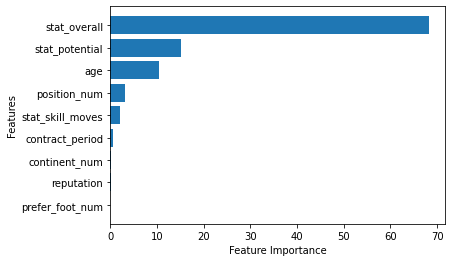

In [49]:
features = sorted_col[-9:]
feature_imp = sorted_imp[-9:]

import matplotlib.pyplot as plt

plt.barh(features, feature_imp)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.show()

### 어떤 경우던지 부분의존도를 그릴 수 있는 맞춤형 partial_dependency 함수 제공
- model : 적용할 모형
- X : 학습 데이터
- features : X에 있는 모든 특성변수의 수
- f_id : 부분의존도를 구하고 싶은 특성변수의 Index

※ partial_dependency 함수 내의 grid를 살펴보면 f_id에 지정된 특성변수의 0.1% 분위수부터 99.5% 분위수까지 50등분한 것을 볼 수 있음.

- f_id에 지정된 특성변수는 실수값을 갖는 특성변수에만 적용됨.
- 그러나 범주형 특성변수일 경우에도 아래 프로그램을 조금만 수정하면 맞춤형 부분의존도를 구할 수 있을 것임.

In [52]:
import numpy as np

def partial_dependency(model, X, features, f_id):
    X_temp = X.copy()
    grid = np.linspace(np.percentile(X_temp.iloc[:, f_id], 0.1),
                      np.percentile(X_temp.iloc[:, f_id], 99.5),
                      50)
    y_pred = np.zeros(len(grid))
    
    for i, val in enumerate(grid):
        X_temp.iloc[:, f_id] = val
        y_pred[i] = model.predict(X_temp.iloc[:, :features]).mean()
        
    return grid, y_pred

In [53]:
import matplotlib.pyplot as plt
plt.plot(grid, y_pred)

NameError: name 'grid' is not defined

In [160]:
def partial_gazua(num):
    features = X_train.shape[1]

    f_id = num
    grid, y_pred = partial_dependency(cat_reg, X_train, features, f_id=f_id)
    print('-' * 50)
    print("f_id = %d" % (f_id))
    print(grid)
    print(y_pred)
    plt.plot(grid, y_pred)
#     X_train.columns[sorted_idx]
#     plt.xlabel(X_train.columns[f_id])
    plt.ylabel('Partial dependence')
    plt.show()

--------------------------------------------------
f_id = 0
[16.         16.42857143 16.85714286 17.28571429 17.71428571 18.14285714
 18.57142857 19.         19.42857143 19.85714286 20.28571429 20.71428571
 21.14285714 21.57142857 22.         22.42857143 22.85714286 23.28571429
 23.71428571 24.14285714 24.57142857 25.         25.42857143 25.85714286
 26.28571429 26.71428571 27.14285714 27.57142857 28.         28.42857143
 28.85714286 29.28571429 29.71428571 30.14285714 30.57142857 31.
 31.42857143 31.85714286 32.28571429 32.71428571 33.14285714 33.57142857
 34.         34.42857143 34.85714286 35.28571429 35.71428571 36.14285714
 36.57142857 37.        ]
[2985467.51076557 2985467.51076557 2985467.51076557 2985467.51076557
 3055626.12637945 3055626.12637945 3111841.60176169 3111841.60176169
 3111841.60176169 3135630.23806278 3135630.23806278 3146326.88585628
 3146326.88585628 3152200.86702965 3152200.86702965 3152200.86702965
 3155644.89792807 3155644.89792807 3168050.74895587 3168050.74

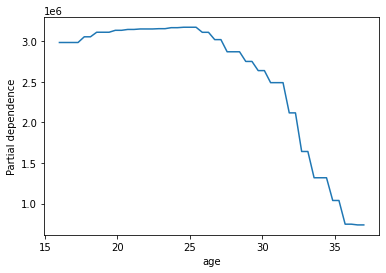

--------------------------------------------------
f_id = 1
[1.         1.08163265 1.16326531 1.24489796 1.32653061 1.40816327
 1.48979592 1.57142857 1.65306122 1.73469388 1.81632653 1.89795918
 1.97959184 2.06122449 2.14285714 2.2244898  2.30612245 2.3877551
 2.46938776 2.55102041 2.63265306 2.71428571 2.79591837 2.87755102
 2.95918367 3.04081633 3.12244898 3.20408163 3.28571429 3.36734694
 3.44897959 3.53061224 3.6122449  3.69387755 3.7755102  3.85714286
 3.93877551 4.02040816 4.10204082 4.18367347 4.26530612 4.34693878
 4.42857143 4.51020408 4.59183673 4.67346939 4.75510204 4.83673469
 4.91836735 5.        ]
[2787916.27629419 2787916.27629419 2787916.27629419 2787916.27629419
 2787916.27629419 2787916.27629419 2787916.27629419 2773882.60397021
 2773882.60397021 2773882.60397021 2773882.60397021 2773882.60397021
 2773882.60397021 2773882.60397021 2773882.60397021 2773882.60397021
 2773882.60397021 2773882.60397021 2773882.60397021 2779527.55917597
 2779527.55917597 2779527.55917597 2

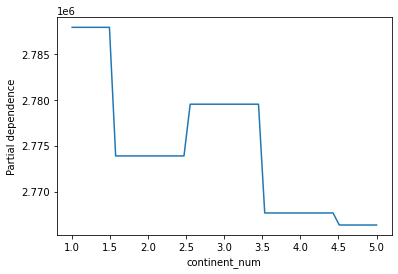

--------------------------------------------------
f_id = 2
[0.         0.10204082 0.20408163 0.30612245 0.40816327 0.51020408
 0.6122449  0.71428571 0.81632653 0.91836735 1.02040816 1.12244898
 1.2244898  1.32653061 1.42857143 1.53061224 1.63265306 1.73469388
 1.83673469 1.93877551 2.04081633 2.14285714 2.24489796 2.34693878
 2.44897959 2.55102041 2.65306122 2.75510204 2.85714286 2.95918367
 3.06122449 3.16326531 3.26530612 3.36734694 3.46938776 3.57142857
 3.67346939 3.7755102  3.87755102 3.97959184 4.08163265 4.18367347
 4.28571429 4.3877551  4.48979592 4.59183673 4.69387755 4.79591837
 4.89795918 5.        ]
[2770056.97344361 2770056.97344361 2770056.97344361 2770056.97344361
 2770056.97344361 2769416.12976603 2769416.12976603 2769416.12976603
 2769416.12976603 2769416.12976603 2769416.12976603 2769416.12976603
 2769416.12976603 2769416.12976603 2769416.12976603 2781078.18912615
 2781078.18912615 2781078.18912615 2781078.18912615 2781078.18912615
 2781078.18912615 2781078.18912615 

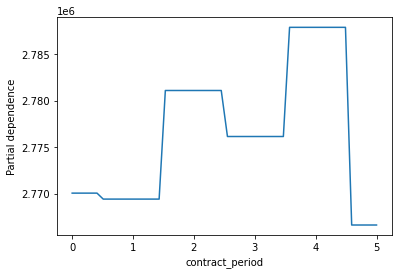

--------------------------------------------------
f_id = 3
[1.         1.06122449 1.12244898 1.18367347 1.24489796 1.30612245
 1.36734694 1.42857143 1.48979592 1.55102041 1.6122449  1.67346939
 1.73469388 1.79591837 1.85714286 1.91836735 1.97959184 2.04081633
 2.10204082 2.16326531 2.2244898  2.28571429 2.34693878 2.40816327
 2.46938776 2.53061224 2.59183673 2.65306122 2.71428571 2.7755102
 2.83673469 2.89795918 2.95918367 3.02040816 3.08163265 3.14285714
 3.20408163 3.26530612 3.32653061 3.3877551  3.44897959 3.51020408
 3.57142857 3.63265306 3.69387755 3.75510204 3.81632653 3.87755102
 3.93877551 4.        ]
[2366320.89227063 2366320.89227063 2366320.89227063 2366320.89227063
 2366320.89227063 2366320.89227063 2366320.89227063 2366320.89227063
 2366320.89227063 2515906.74108538 2515906.74108538 2515906.74108538
 2515906.74108538 2515906.74108538 2515906.74108538 2515906.74108538
 2515906.74108538 2515906.74108538 2515906.74108538 2515906.74108538
 2515906.74108538 2515906.74108538 2

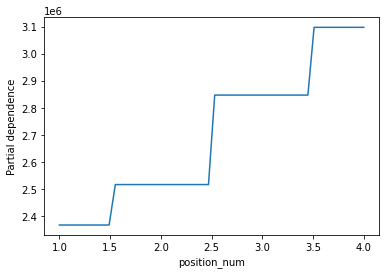

--------------------------------------------------
f_id = 4
[0.         0.02040816 0.04081633 0.06122449 0.08163265 0.10204082
 0.12244898 0.14285714 0.16326531 0.18367347 0.20408163 0.2244898
 0.24489796 0.26530612 0.28571429 0.30612245 0.32653061 0.34693878
 0.36734694 0.3877551  0.40816327 0.42857143 0.44897959 0.46938776
 0.48979592 0.51020408 0.53061224 0.55102041 0.57142857 0.59183673
 0.6122449  0.63265306 0.65306122 0.67346939 0.69387755 0.71428571
 0.73469388 0.75510204 0.7755102  0.79591837 0.81632653 0.83673469
 0.85714286 0.87755102 0.89795918 0.91836735 0.93877551 0.95918367
 0.97959184 1.        ]
[2774332.58306795 2774332.58306795 2774332.58306795 2774332.58306795
 2774332.58306795 2774332.58306795 2774332.58306795 2774332.58306795
 2774332.58306795 2774332.58306795 2774332.58306795 2774332.58306795
 2774332.58306795 2774332.58306795 2774332.58306795 2774332.58306795
 2774332.58306795 2774332.58306795 2774332.58306795 2774332.58306795
 2774332.58306795 2774332.58306795 2

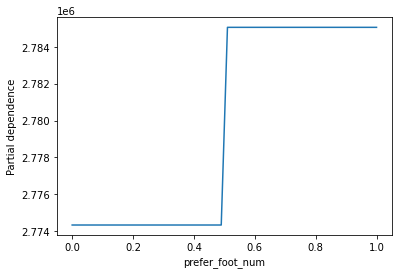

--------------------------------------------------
f_id = 5
[1.         1.04081633 1.08163265 1.12244898 1.16326531 1.20408163
 1.24489796 1.28571429 1.32653061 1.36734694 1.40816327 1.44897959
 1.48979592 1.53061224 1.57142857 1.6122449  1.65306122 1.69387755
 1.73469388 1.7755102  1.81632653 1.85714286 1.89795918 1.93877551
 1.97959184 2.02040816 2.06122449 2.10204082 2.14285714 2.18367347
 2.2244898  2.26530612 2.30612245 2.34693878 2.3877551  2.42857143
 2.46938776 2.51020408 2.55102041 2.59183673 2.63265306 2.67346939
 2.71428571 2.75510204 2.79591837 2.83673469 2.87755102 2.91836735
 2.95918367 3.        ]
[2771608.54136897 2771608.54136897 2771608.54136897 2771608.54136897
 2771608.54136897 2771608.54136897 2771608.54136897 2771608.54136897
 2771608.54136897 2771608.54136897 2771608.54136897 2771608.54136897
 2771608.54136897 2794753.16822046 2794753.16822046 2794753.16822046
 2794753.16822046 2794753.16822046 2794753.16822046 2794753.16822046
 2794753.16822046 2794753.16822046 

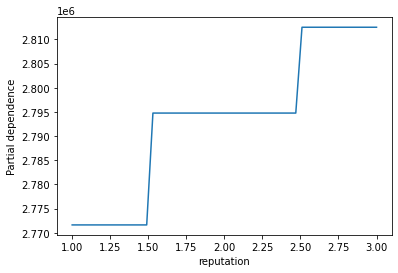

--------------------------------------------------
f_id = 6
[48.         48.75510204 49.51020408 50.26530612 51.02040816 51.7755102
 52.53061224 53.28571429 54.04081633 54.79591837 55.55102041 56.30612245
 57.06122449 57.81632653 58.57142857 59.32653061 60.08163265 60.83673469
 61.59183673 62.34693878 63.10204082 63.85714286 64.6122449  65.36734694
 66.12244898 66.87755102 67.63265306 68.3877551  69.14285714 69.89795918
 70.65306122 71.40816327 72.16326531 72.91836735 73.67346939 74.42857143
 75.18367347 75.93877551 76.69387755 77.44897959 78.20408163 78.95918367
 79.71428571 80.46938776 81.2244898  81.97959184 82.73469388 83.48979592
 84.24489796 85.        ]
[  224135.99236232   224135.99236232   224135.99236232   224135.99236232
   224135.99236232   231041.18913115   240558.87284213   240558.87284213
   240558.87284213   258687.48913722   258687.48913722   258687.48913722
   258687.48913722   288882.91725179   312629.06034071   312629.06034071
   376053.15429193   424444.59746645   

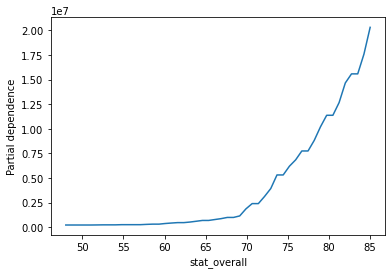

--------------------------------------------------
f_id = 7
[53.251      53.98057143 54.71014286 55.43971429 56.16928571 56.89885714
 57.62842857 58.358      59.08757143 59.81714286 60.54671429 61.27628571
 62.00585714 62.73542857 63.465      64.19457143 64.92414286 65.65371429
 66.38328571 67.11285714 67.84242857 68.572      69.30157143 70.03114286
 70.76071429 71.49028571 72.21985714 72.94942857 73.679      74.40857143
 75.13814286 75.86771429 76.59728571 77.32685714 78.05642857 78.786
 79.51557143 80.24514286 80.97471429 81.70428571 82.43385714 83.16342857
 83.893      84.62257143 85.35214286 86.08171429 86.81128571 87.54085714
 88.27042857 89.        ]
[2004468.26117165 2004468.26117165 2004468.26117165 2004468.26117165
 2004468.26117165 2004468.26117165 2004468.26117165 2004468.26117165
 2004468.26117165 2004468.26117165 2004468.26117165 2004468.26117165
 2004468.26117165 2004468.26117165 2004468.26117165 2078364.77123041
 2078364.77123041 2086347.15627857 2086347.15627857 2095374

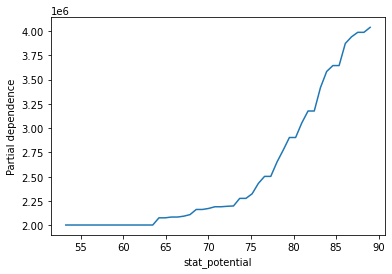

--------------------------------------------------
f_id = 8
[1.         1.06122449 1.12244898 1.18367347 1.24489796 1.30612245
 1.36734694 1.42857143 1.48979592 1.55102041 1.6122449  1.67346939
 1.73469388 1.79591837 1.85714286 1.91836735 1.97959184 2.04081633
 2.10204082 2.16326531 2.2244898  2.28571429 2.34693878 2.40816327
 2.46938776 2.53061224 2.59183673 2.65306122 2.71428571 2.7755102
 2.83673469 2.89795918 2.95918367 3.02040816 3.08163265 3.14285714
 3.20408163 3.26530612 3.32653061 3.3877551  3.44897959 3.51020408
 3.57142857 3.63265306 3.69387755 3.75510204 3.81632653 3.87755102
 3.93877551 4.        ]
[2585982.59028432 2585982.59028432 2585982.59028432 2585982.59028432
 2585982.59028432 2585982.59028432 2585982.59028432 2585982.59028432
 2585982.59028432 2655305.96650818 2655305.96650818 2655305.96650818
 2655305.96650818 2655305.96650818 2655305.96650818 2655305.96650818
 2655305.96650818 2655305.96650818 2655305.96650818 2655305.96650818
 2655305.96650818 2655305.96650818 2

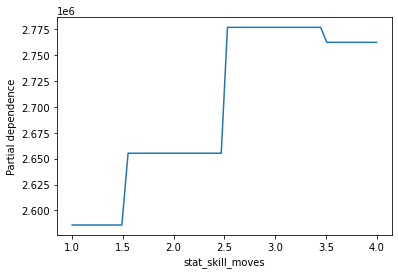

In [161]:
for i in range(0, 9):
    partial_gazua(i)

### 이걸 올린다
- 모든 변수에 대한 Partial Dependence 구할 것

In [54]:
def partial_dependency_visualize(model, X, features, f_id):
    X_temp = X.copy()
    features = X_train.shape[1]
    grid = np.linspace(np.percentile(X_temp.iloc[:, f_id], 0.1),
                      np.percentile(X_temp.iloc[:, f_id], 99.5),
                      50)
    y_pred = np.zeros(len(grid))
    
    for i, val in enumerate(grid):
        X_temp.iloc[:, f_id] = val
        y_pred[i] = model.predict(X_temp.iloc[:, :features]).mean()
    
    print('-' * 80)
    print("f_id = %d" % (f_id))
    print(grid)
    print(y_pred)
    plt.plot(grid, y_pred)
    plt.xlabel(X_train.columns[f_id])
    plt.ylabel('Partial dependence')
    plt.show()    

--------------------------------------------------------------------------------
f_id = 0
[16.         16.42857143 16.85714286 17.28571429 17.71428571 18.14285714
 18.57142857 19.         19.42857143 19.85714286 20.28571429 20.71428571
 21.14285714 21.57142857 22.         22.42857143 22.85714286 23.28571429
 23.71428571 24.14285714 24.57142857 25.         25.42857143 25.85714286
 26.28571429 26.71428571 27.14285714 27.57142857 28.         28.42857143
 28.85714286 29.28571429 29.71428571 30.14285714 30.57142857 31.
 31.42857143 31.85714286 32.28571429 32.71428571 33.14285714 33.57142857
 34.         34.42857143 34.85714286 35.28571429 35.71428571 36.14285714
 36.57142857 37.        ]
[2985467.51076557 2985467.51076557 2985467.51076557 2985467.51076557
 3055626.12637945 3055626.12637945 3111841.60176169 3111841.60176169
 3111841.60176169 3135630.23806278 3135630.23806278 3146326.88585628
 3146326.88585628 3152200.86702965 3152200.86702965 3152200.86702965
 3155644.89792807 3155644.897928

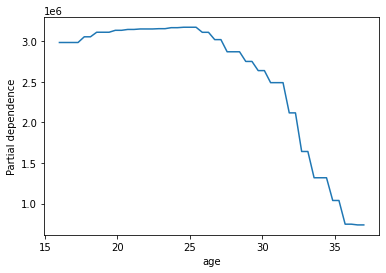

--------------------------------------------------------------------------------
f_id = 1
[1.         1.08163265 1.16326531 1.24489796 1.32653061 1.40816327
 1.48979592 1.57142857 1.65306122 1.73469388 1.81632653 1.89795918
 1.97959184 2.06122449 2.14285714 2.2244898  2.30612245 2.3877551
 2.46938776 2.55102041 2.63265306 2.71428571 2.79591837 2.87755102
 2.95918367 3.04081633 3.12244898 3.20408163 3.28571429 3.36734694
 3.44897959 3.53061224 3.6122449  3.69387755 3.7755102  3.85714286
 3.93877551 4.02040816 4.10204082 4.18367347 4.26530612 4.34693878
 4.42857143 4.51020408 4.59183673 4.67346939 4.75510204 4.83673469
 4.91836735 5.        ]
[2787916.27629419 2787916.27629419 2787916.27629419 2787916.27629419
 2787916.27629419 2787916.27629419 2787916.27629419 2773882.60397021
 2773882.60397021 2773882.60397021 2773882.60397021 2773882.60397021
 2773882.60397021 2773882.60397021 2773882.60397021 2773882.60397021
 2773882.60397021 2773882.60397021 2773882.60397021 2779527.55917597
 27795

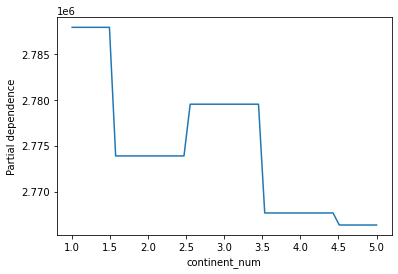

--------------------------------------------------------------------------------
f_id = 2
[0.         0.10204082 0.20408163 0.30612245 0.40816327 0.51020408
 0.6122449  0.71428571 0.81632653 0.91836735 1.02040816 1.12244898
 1.2244898  1.32653061 1.42857143 1.53061224 1.63265306 1.73469388
 1.83673469 1.93877551 2.04081633 2.14285714 2.24489796 2.34693878
 2.44897959 2.55102041 2.65306122 2.75510204 2.85714286 2.95918367
 3.06122449 3.16326531 3.26530612 3.36734694 3.46938776 3.57142857
 3.67346939 3.7755102  3.87755102 3.97959184 4.08163265 4.18367347
 4.28571429 4.3877551  4.48979592 4.59183673 4.69387755 4.79591837
 4.89795918 5.        ]
[2770056.97344361 2770056.97344361 2770056.97344361 2770056.97344361
 2770056.97344361 2769416.12976603 2769416.12976603 2769416.12976603
 2769416.12976603 2769416.12976603 2769416.12976603 2769416.12976603
 2769416.12976603 2769416.12976603 2769416.12976603 2781078.18912615
 2781078.18912615 2781078.18912615 2781078.18912615 2781078.18912615
 2781

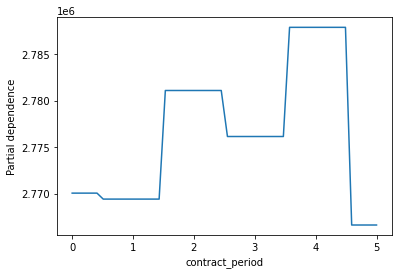

--------------------------------------------------------------------------------
f_id = 3
[1.         1.06122449 1.12244898 1.18367347 1.24489796 1.30612245
 1.36734694 1.42857143 1.48979592 1.55102041 1.6122449  1.67346939
 1.73469388 1.79591837 1.85714286 1.91836735 1.97959184 2.04081633
 2.10204082 2.16326531 2.2244898  2.28571429 2.34693878 2.40816327
 2.46938776 2.53061224 2.59183673 2.65306122 2.71428571 2.7755102
 2.83673469 2.89795918 2.95918367 3.02040816 3.08163265 3.14285714
 3.20408163 3.26530612 3.32653061 3.3877551  3.44897959 3.51020408
 3.57142857 3.63265306 3.69387755 3.75510204 3.81632653 3.87755102
 3.93877551 4.        ]
[2366320.89227063 2366320.89227063 2366320.89227063 2366320.89227063
 2366320.89227063 2366320.89227063 2366320.89227063 2366320.89227063
 2366320.89227063 2515906.74108538 2515906.74108538 2515906.74108538
 2515906.74108538 2515906.74108538 2515906.74108538 2515906.74108538
 2515906.74108538 2515906.74108538 2515906.74108538 2515906.74108538
 25159

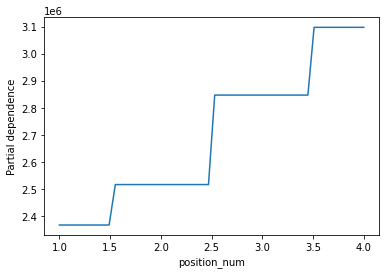

--------------------------------------------------------------------------------
f_id = 4
[0.         0.02040816 0.04081633 0.06122449 0.08163265 0.10204082
 0.12244898 0.14285714 0.16326531 0.18367347 0.20408163 0.2244898
 0.24489796 0.26530612 0.28571429 0.30612245 0.32653061 0.34693878
 0.36734694 0.3877551  0.40816327 0.42857143 0.44897959 0.46938776
 0.48979592 0.51020408 0.53061224 0.55102041 0.57142857 0.59183673
 0.6122449  0.63265306 0.65306122 0.67346939 0.69387755 0.71428571
 0.73469388 0.75510204 0.7755102  0.79591837 0.81632653 0.83673469
 0.85714286 0.87755102 0.89795918 0.91836735 0.93877551 0.95918367
 0.97959184 1.        ]
[2774332.58306795 2774332.58306795 2774332.58306795 2774332.58306795
 2774332.58306795 2774332.58306795 2774332.58306795 2774332.58306795
 2774332.58306795 2774332.58306795 2774332.58306795 2774332.58306795
 2774332.58306795 2774332.58306795 2774332.58306795 2774332.58306795
 2774332.58306795 2774332.58306795 2774332.58306795 2774332.58306795
 27743

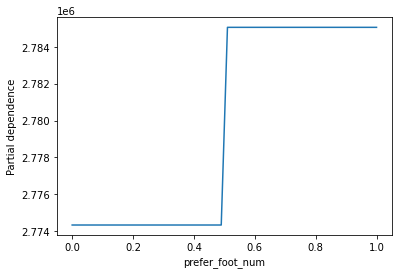

--------------------------------------------------------------------------------
f_id = 5
[1.         1.04081633 1.08163265 1.12244898 1.16326531 1.20408163
 1.24489796 1.28571429 1.32653061 1.36734694 1.40816327 1.44897959
 1.48979592 1.53061224 1.57142857 1.6122449  1.65306122 1.69387755
 1.73469388 1.7755102  1.81632653 1.85714286 1.89795918 1.93877551
 1.97959184 2.02040816 2.06122449 2.10204082 2.14285714 2.18367347
 2.2244898  2.26530612 2.30612245 2.34693878 2.3877551  2.42857143
 2.46938776 2.51020408 2.55102041 2.59183673 2.63265306 2.67346939
 2.71428571 2.75510204 2.79591837 2.83673469 2.87755102 2.91836735
 2.95918367 3.        ]
[2771608.54136897 2771608.54136897 2771608.54136897 2771608.54136897
 2771608.54136897 2771608.54136897 2771608.54136897 2771608.54136897
 2771608.54136897 2771608.54136897 2771608.54136897 2771608.54136897
 2771608.54136897 2794753.16822046 2794753.16822046 2794753.16822046
 2794753.16822046 2794753.16822046 2794753.16822046 2794753.16822046
 2794

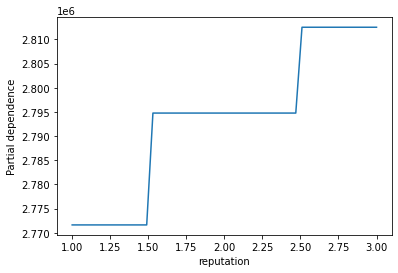

--------------------------------------------------------------------------------
f_id = 6
[48.         48.75510204 49.51020408 50.26530612 51.02040816 51.7755102
 52.53061224 53.28571429 54.04081633 54.79591837 55.55102041 56.30612245
 57.06122449 57.81632653 58.57142857 59.32653061 60.08163265 60.83673469
 61.59183673 62.34693878 63.10204082 63.85714286 64.6122449  65.36734694
 66.12244898 66.87755102 67.63265306 68.3877551  69.14285714 69.89795918
 70.65306122 71.40816327 72.16326531 72.91836735 73.67346939 74.42857143
 75.18367347 75.93877551 76.69387755 77.44897959 78.20408163 78.95918367
 79.71428571 80.46938776 81.2244898  81.97959184 82.73469388 83.48979592
 84.24489796 85.        ]
[  224135.99236232   224135.99236232   224135.99236232   224135.99236232
   224135.99236232   231041.18913115   240558.87284213   240558.87284213
   240558.87284213   258687.48913722   258687.48913722   258687.48913722
   258687.48913722   288882.91725179   312629.06034071   312629.06034071
   376053

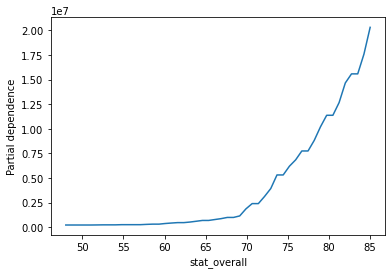

--------------------------------------------------------------------------------
f_id = 7
[53.251      53.98057143 54.71014286 55.43971429 56.16928571 56.89885714
 57.62842857 58.358      59.08757143 59.81714286 60.54671429 61.27628571
 62.00585714 62.73542857 63.465      64.19457143 64.92414286 65.65371429
 66.38328571 67.11285714 67.84242857 68.572      69.30157143 70.03114286
 70.76071429 71.49028571 72.21985714 72.94942857 73.679      74.40857143
 75.13814286 75.86771429 76.59728571 77.32685714 78.05642857 78.786
 79.51557143 80.24514286 80.97471429 81.70428571 82.43385714 83.16342857
 83.893      84.62257143 85.35214286 86.08171429 86.81128571 87.54085714
 88.27042857 89.        ]
[2004468.26117165 2004468.26117165 2004468.26117165 2004468.26117165
 2004468.26117165 2004468.26117165 2004468.26117165 2004468.26117165
 2004468.26117165 2004468.26117165 2004468.26117165 2004468.26117165
 2004468.26117165 2004468.26117165 2004468.26117165 2078364.77123041
 2078364.77123041 2086347.156

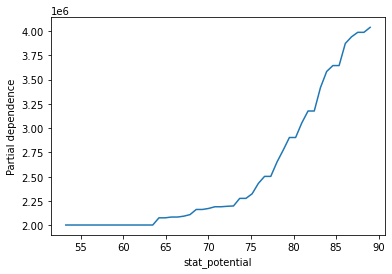

--------------------------------------------------------------------------------
f_id = 8
[1.         1.06122449 1.12244898 1.18367347 1.24489796 1.30612245
 1.36734694 1.42857143 1.48979592 1.55102041 1.6122449  1.67346939
 1.73469388 1.79591837 1.85714286 1.91836735 1.97959184 2.04081633
 2.10204082 2.16326531 2.2244898  2.28571429 2.34693878 2.40816327
 2.46938776 2.53061224 2.59183673 2.65306122 2.71428571 2.7755102
 2.83673469 2.89795918 2.95918367 3.02040816 3.08163265 3.14285714
 3.20408163 3.26530612 3.32653061 3.3877551  3.44897959 3.51020408
 3.57142857 3.63265306 3.69387755 3.75510204 3.81632653 3.87755102
 3.93877551 4.        ]
[2585982.59028432 2585982.59028432 2585982.59028432 2585982.59028432
 2585982.59028432 2585982.59028432 2585982.59028432 2585982.59028432
 2585982.59028432 2655305.96650818 2655305.96650818 2655305.96650818
 2655305.96650818 2655305.96650818 2655305.96650818 2655305.96650818
 2655305.96650818 2655305.96650818 2655305.96650818 2655305.96650818
 26553

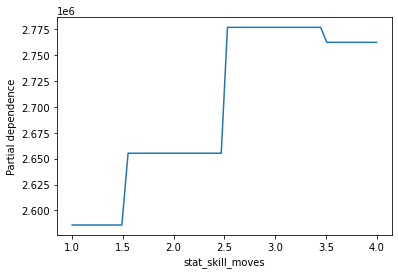

In [55]:
for i in range(9):
    partial_dependency_visualize(cat_reg, X_train, features, i)

### 실제적인 모형 성능의 비교를 위한 교차 검증
### Cross-Validation

#### 보고서 넣을거

In [56]:
from sklearn.model_selection import cross_val_score

cat_reg = CatBoostRegressor()
scores_cat = cross_val_score(cat_reg, X, y, scoring='neg_mean_squared_error', cv=10)
rmse_cat = np.sqrt(-scores_cat)
print('Cat RMSE:', np.round(rmse_cat, 2))
print('Cat_RMSE mean: %.2f' % (rmse_cat.mean()))

Learning rate set to 0.056911
0:	learn: 1701141.2257308	total: 1.67ms	remaining: 1.67s
1:	learn: 1618959.4977237	total: 3.26ms	remaining: 1.63s
2:	learn: 1535844.6735731	total: 4.92ms	remaining: 1.63s
3:	learn: 1460101.0378185	total: 6.49ms	remaining: 1.62s
4:	learn: 1388905.1452748	total: 8.07ms	remaining: 1.6s
5:	learn: 1320911.5232541	total: 9.67ms	remaining: 1.6s
6:	learn: 1255931.1508955	total: 11.4ms	remaining: 1.62s
7:	learn: 1199093.7940315	total: 13ms	remaining: 1.61s
8:	learn: 1139929.5659222	total: 15ms	remaining: 1.65s
9:	learn: 1084917.8661331	total: 16.9ms	remaining: 1.68s
10:	learn: 1033433.8001851	total: 18.8ms	remaining: 1.69s
11:	learn: 985257.2285964	total: 20.4ms	remaining: 1.68s
12:	learn: 939462.8510614	total: 22.2ms	remaining: 1.68s
13:	learn: 895843.5211108	total: 23.9ms	remaining: 1.68s
14:	learn: 853977.3527041	total: 26.1ms	remaining: 1.72s
15:	learn: 815225.4279502	total: 27.9ms	remaining: 1.72s
16:	learn: 778666.7175236	total: 29.5ms	remaining: 1.71s
17:	le

220:	learn: 114488.9196274	total: 338ms	remaining: 1.19s
221:	learn: 114404.2964663	total: 340ms	remaining: 1.19s
222:	learn: 114281.2842880	total: 342ms	remaining: 1.19s
223:	learn: 114131.8793378	total: 343ms	remaining: 1.19s
224:	learn: 114026.0087841	total: 345ms	remaining: 1.19s
225:	learn: 113916.9147748	total: 346ms	remaining: 1.19s
226:	learn: 113842.2429578	total: 348ms	remaining: 1.18s
227:	learn: 113770.2046270	total: 349ms	remaining: 1.18s
228:	learn: 113714.0090401	total: 351ms	remaining: 1.18s
229:	learn: 113647.2930766	total: 352ms	remaining: 1.18s
230:	learn: 113561.2516470	total: 354ms	remaining: 1.18s
231:	learn: 113483.9191530	total: 355ms	remaining: 1.18s
232:	learn: 113380.7059686	total: 357ms	remaining: 1.17s
233:	learn: 113285.5180423	total: 358ms	remaining: 1.17s
234:	learn: 113109.8251468	total: 360ms	remaining: 1.17s
235:	learn: 113023.6225396	total: 362ms	remaining: 1.17s
236:	learn: 112940.3769068	total: 363ms	remaining: 1.17s
237:	learn: 112805.3681650	tota

451:	learn: 101483.0708851	total: 681ms	remaining: 825ms
452:	learn: 101465.6622083	total: 683ms	remaining: 824ms
453:	learn: 101435.3683101	total: 684ms	remaining: 823ms
454:	learn: 101408.0278383	total: 686ms	remaining: 821ms
455:	learn: 101369.4494775	total: 687ms	remaining: 820ms
456:	learn: 101320.1325393	total: 689ms	remaining: 818ms
457:	learn: 101270.4243194	total: 690ms	remaining: 817ms
458:	learn: 101239.6674647	total: 692ms	remaining: 815ms
459:	learn: 101210.1582532	total: 693ms	remaining: 813ms
460:	learn: 101203.9062911	total: 694ms	remaining: 812ms
461:	learn: 101171.0253553	total: 696ms	remaining: 810ms
462:	learn: 101117.9243741	total: 698ms	remaining: 809ms
463:	learn: 101085.5225246	total: 700ms	remaining: 808ms
464:	learn: 101032.3269302	total: 701ms	remaining: 807ms
465:	learn: 101020.0805700	total: 703ms	remaining: 805ms
466:	learn: 100983.2118231	total: 704ms	remaining: 804ms
467:	learn: 100971.3224922	total: 705ms	remaining: 802ms
468:	learn: 100942.0263672	tota

674:	learn: 94336.1257443	total: 1.02s	remaining: 492ms
675:	learn: 94315.0147050	total: 1.02s	remaining: 491ms
676:	learn: 94301.2037057	total: 1.03s	remaining: 490ms
677:	learn: 94289.1882203	total: 1.03s	remaining: 488ms
678:	learn: 94233.7188374	total: 1.03s	remaining: 487ms
679:	learn: 94231.1600402	total: 1.03s	remaining: 486ms
680:	learn: 94172.6198163	total: 1.03s	remaining: 485ms
681:	learn: 94160.1588283	total: 1.04s	remaining: 484ms
682:	learn: 94136.1596402	total: 1.04s	remaining: 483ms
683:	learn: 94115.0291158	total: 1.05s	remaining: 484ms
684:	learn: 94087.3218228	total: 1.05s	remaining: 483ms
685:	learn: 94067.5799782	total: 1.05s	remaining: 482ms
686:	learn: 94016.3043106	total: 1.05s	remaining: 481ms
687:	learn: 93987.6033615	total: 1.06s	remaining: 480ms
688:	learn: 93930.6488736	total: 1.06s	remaining: 478ms
689:	learn: 93904.2952628	total: 1.06s	remaining: 477ms
690:	learn: 93895.7525145	total: 1.06s	remaining: 476ms
691:	learn: 93861.1586816	total: 1.06s	remaining

894:	learn: 89895.5204018	total: 1.36s	remaining: 160ms
895:	learn: 89873.5688626	total: 1.36s	remaining: 158ms
896:	learn: 89856.5153220	total: 1.37s	remaining: 157ms
897:	learn: 89849.6050640	total: 1.37s	remaining: 155ms
898:	learn: 89825.8609354	total: 1.37s	remaining: 154ms
899:	learn: 89825.1341207	total: 1.37s	remaining: 152ms
900:	learn: 89807.6513228	total: 1.37s	remaining: 151ms
901:	learn: 89787.8612233	total: 1.37s	remaining: 149ms
902:	learn: 89776.5543536	total: 1.38s	remaining: 148ms
903:	learn: 89766.5747252	total: 1.38s	remaining: 146ms
904:	learn: 89754.2700002	total: 1.38s	remaining: 145ms
905:	learn: 89741.8490848	total: 1.38s	remaining: 143ms
906:	learn: 89736.3387834	total: 1.38s	remaining: 142ms
907:	learn: 89720.2820977	total: 1.38s	remaining: 140ms
908:	learn: 89698.0952174	total: 1.38s	remaining: 139ms
909:	learn: 89691.0938967	total: 1.39s	remaining: 137ms
910:	learn: 89674.1781691	total: 1.39s	remaining: 136ms
911:	learn: 89673.5125161	total: 1.39s	remaining

101:	learn: 600564.7835368	total: 165ms	remaining: 1.45s
102:	learn: 598956.0480542	total: 166ms	remaining: 1.45s
103:	learn: 597394.3254634	total: 168ms	remaining: 1.45s
104:	learn: 589448.7780921	total: 169ms	remaining: 1.44s
105:	learn: 586195.7419590	total: 171ms	remaining: 1.44s
106:	learn: 576967.8930621	total: 172ms	remaining: 1.44s
107:	learn: 575557.6757742	total: 173ms	remaining: 1.43s
108:	learn: 571919.0462984	total: 175ms	remaining: 1.43s
109:	learn: 570498.0391003	total: 176ms	remaining: 1.42s
110:	learn: 569144.3019561	total: 177ms	remaining: 1.42s
111:	learn: 567664.7664693	total: 178ms	remaining: 1.41s
112:	learn: 564289.9799233	total: 180ms	remaining: 1.41s
113:	learn: 559511.1521932	total: 182ms	remaining: 1.41s
114:	learn: 558234.4284780	total: 183ms	remaining: 1.41s
115:	learn: 556802.8730420	total: 184ms	remaining: 1.41s
116:	learn: 551231.3322820	total: 186ms	remaining: 1.4s
117:	learn: 549899.9652675	total: 187ms	remaining: 1.4s
118:	learn: 548579.8255708	total:

334:	learn: 287716.3064578	total: 507ms	remaining: 1s
335:	learn: 286782.5707629	total: 508ms	remaining: 1s
336:	learn: 286460.3355040	total: 510ms	remaining: 1s
337:	learn: 285958.1175226	total: 511ms	remaining: 1s
338:	learn: 285354.3936140	total: 513ms	remaining: 1000ms
339:	learn: 284994.6637396	total: 514ms	remaining: 998ms
340:	learn: 284147.0763238	total: 516ms	remaining: 997ms
341:	learn: 283796.7584692	total: 517ms	remaining: 995ms
342:	learn: 283133.0343762	total: 519ms	remaining: 994ms
343:	learn: 282439.6618312	total: 520ms	remaining: 992ms
344:	learn: 281768.1825913	total: 522ms	remaining: 991ms
345:	learn: 281156.7986968	total: 523ms	remaining: 989ms
346:	learn: 280354.6289708	total: 525ms	remaining: 988ms
347:	learn: 279593.6078063	total: 527ms	remaining: 988ms
348:	learn: 279265.2587907	total: 529ms	remaining: 987ms
349:	learn: 278734.7494674	total: 530ms	remaining: 985ms
350:	learn: 278045.3455984	total: 532ms	remaining: 983ms
351:	learn: 277446.0844647	total: 533ms	re

567:	learn: 216405.6305170	total: 850ms	remaining: 647ms
568:	learn: 216234.4146242	total: 852ms	remaining: 645ms
569:	learn: 216222.7338706	total: 853ms	remaining: 644ms
570:	learn: 215967.9745075	total: 855ms	remaining: 642ms
571:	learn: 215875.1665523	total: 856ms	remaining: 640ms
572:	learn: 215701.9472640	total: 857ms	remaining: 639ms
573:	learn: 215683.0334538	total: 859ms	remaining: 637ms
574:	learn: 215549.0255219	total: 861ms	remaining: 636ms
575:	learn: 215418.6839322	total: 862ms	remaining: 635ms
576:	learn: 215261.0450007	total: 864ms	remaining: 633ms
577:	learn: 215138.6270926	total: 865ms	remaining: 632ms
578:	learn: 215024.1476794	total: 867ms	remaining: 630ms
579:	learn: 214975.0505061	total: 869ms	remaining: 629ms
580:	learn: 214643.8073226	total: 871ms	remaining: 628ms
581:	learn: 214596.9880881	total: 872ms	remaining: 626ms
582:	learn: 214516.2331159	total: 873ms	remaining: 625ms
583:	learn: 214206.6071635	total: 875ms	remaining: 623ms
584:	learn: 213915.8572337	tota

808:	learn: 187376.3778857	total: 1.19s	remaining: 282ms
809:	learn: 187304.4049203	total: 1.2s	remaining: 280ms
810:	learn: 187131.2061235	total: 1.2s	remaining: 279ms
811:	learn: 186966.9564494	total: 1.2s	remaining: 277ms
812:	learn: 186834.5288175	total: 1.2s	remaining: 276ms
813:	learn: 186824.4457618	total: 1.2s	remaining: 274ms
814:	learn: 186746.2805015	total: 1.2s	remaining: 273ms
815:	learn: 186550.8624271	total: 1.2s	remaining: 271ms
816:	learn: 186305.3641282	total: 1.21s	remaining: 270ms
817:	learn: 186205.6267020	total: 1.21s	remaining: 269ms
818:	learn: 186135.2153815	total: 1.21s	remaining: 267ms
819:	learn: 185946.9440347	total: 1.21s	remaining: 267ms
820:	learn: 185852.5443536	total: 1.22s	remaining: 266ms
821:	learn: 185763.2868706	total: 1.22s	remaining: 264ms
822:	learn: 185679.7449846	total: 1.22s	remaining: 263ms
823:	learn: 185544.8069357	total: 1.22s	remaining: 261ms
824:	learn: 185438.8043302	total: 1.22s	remaining: 260ms
825:	learn: 185248.7088542	total: 1.24

Learning rate set to 0.056912
0:	learn: 5866703.2733501	total: 1.57ms	remaining: 1.57s
1:	learn: 5602002.0245053	total: 3.02ms	remaining: 1.51s
2:	learn: 5346159.6572637	total: 4.36ms	remaining: 1.45s
3:	learn: 5110977.6019170	total: 5.73ms	remaining: 1.43s
4:	learn: 4878979.3581481	total: 7.08ms	remaining: 1.41s
5:	learn: 4655714.1428212	total: 8.78ms	remaining: 1.45s
6:	learn: 4439074.7319463	total: 10.9ms	remaining: 1.55s
7:	learn: 4244939.2065934	total: 13ms	remaining: 1.61s
8:	learn: 4062458.5823281	total: 14.5ms	remaining: 1.6s
9:	learn: 3891875.3098506	total: 16.1ms	remaining: 1.59s
10:	learn: 3731785.5976571	total: 17.8ms	remaining: 1.6s
11:	learn: 3560446.7471767	total: 19.4ms	remaining: 1.59s
12:	learn: 3410244.7475761	total: 21ms	remaining: 1.59s
13:	learn: 3270985.8820437	total: 22.5ms	remaining: 1.59s
14:	learn: 3145396.6377989	total: 24ms	remaining: 1.57s
15:	learn: 3008508.3830777	total: 26.3ms	remaining: 1.61s
16:	learn: 2898571.1332418	total: 27.8ms	remaining: 1.6s
17:

228:	learn: 388034.9513746	total: 337ms	remaining: 1.13s
229:	learn: 386680.2942461	total: 338ms	remaining: 1.13s
230:	learn: 386585.6554862	total: 339ms	remaining: 1.13s
231:	learn: 385613.5502197	total: 341ms	remaining: 1.13s
232:	learn: 385492.5597698	total: 342ms	remaining: 1.13s
233:	learn: 385405.5766677	total: 343ms	remaining: 1.12s
234:	learn: 384237.0108909	total: 344ms	remaining: 1.12s
235:	learn: 382504.4955143	total: 346ms	remaining: 1.12s
236:	learn: 381156.6131071	total: 347ms	remaining: 1.12s
237:	learn: 381076.0460829	total: 349ms	remaining: 1.12s
238:	learn: 380997.7746395	total: 350ms	remaining: 1.11s
239:	learn: 380368.1632932	total: 351ms	remaining: 1.11s
240:	learn: 378801.1424972	total: 353ms	remaining: 1.11s
241:	learn: 378700.2698662	total: 355ms	remaining: 1.11s
242:	learn: 378017.4662739	total: 356ms	remaining: 1.11s
243:	learn: 377022.6576241	total: 358ms	remaining: 1.11s
244:	learn: 375148.5460532	total: 359ms	remaining: 1.11s
245:	learn: 375081.4744188	tota

461:	learn: 253829.0565580	total: 673ms	remaining: 783ms
462:	learn: 253480.9495816	total: 675ms	remaining: 783ms
463:	learn: 253180.8211769	total: 677ms	remaining: 782ms
464:	learn: 252988.3577100	total: 678ms	remaining: 780ms
465:	learn: 252730.2908735	total: 680ms	remaining: 779ms
466:	learn: 252509.1657250	total: 681ms	remaining: 778ms
467:	learn: 252216.8389135	total: 683ms	remaining: 776ms
468:	learn: 251966.7820353	total: 684ms	remaining: 775ms
469:	learn: 251824.5261607	total: 686ms	remaining: 774ms
470:	learn: 251640.3250392	total: 688ms	remaining: 773ms
471:	learn: 251468.2127079	total: 690ms	remaining: 772ms
472:	learn: 251119.3995084	total: 692ms	remaining: 771ms
473:	learn: 250800.8857556	total: 694ms	remaining: 770ms
474:	learn: 250489.5670761	total: 695ms	remaining: 768ms
475:	learn: 250275.4007594	total: 697ms	remaining: 767ms
476:	learn: 249930.5497584	total: 698ms	remaining: 766ms
477:	learn: 249639.5624849	total: 700ms	remaining: 764ms
478:	learn: 249339.7812046	tota

699:	learn: 211763.7910896	total: 1.01s	remaining: 435ms
700:	learn: 211655.1122579	total: 1.02s	remaining: 434ms
701:	learn: 211567.8023459	total: 1.02s	remaining: 432ms
702:	learn: 211467.8577673	total: 1.02s	remaining: 431ms
703:	learn: 211464.9740086	total: 1.02s	remaining: 430ms
704:	learn: 211363.3099836	total: 1.02s	remaining: 428ms
705:	learn: 211278.3731161	total: 1.02s	remaining: 427ms
706:	learn: 211144.4937853	total: 1.03s	remaining: 425ms
707:	learn: 210961.8735380	total: 1.03s	remaining: 424ms
708:	learn: 210888.5772173	total: 1.03s	remaining: 422ms
709:	learn: 210795.5920055	total: 1.03s	remaining: 421ms
710:	learn: 210684.2398850	total: 1.03s	remaining: 420ms
711:	learn: 210677.2690811	total: 1.03s	remaining: 418ms
712:	learn: 210641.5349228	total: 1.04s	remaining: 417ms
713:	learn: 210488.9652636	total: 1.04s	remaining: 416ms
714:	learn: 210341.0726078	total: 1.04s	remaining: 414ms
715:	learn: 210262.9448776	total: 1.04s	remaining: 413ms
716:	learn: 210184.3717395	tota

937:	learn: 190860.6497208	total: 1.36s	remaining: 89.8ms
938:	learn: 190850.1752669	total: 1.36s	remaining: 88.4ms
939:	learn: 190743.5845503	total: 1.36s	remaining: 86.9ms
940:	learn: 190700.2124975	total: 1.36s	remaining: 85.5ms
941:	learn: 190496.5932059	total: 1.36s	remaining: 84ms
942:	learn: 190454.6380039	total: 1.37s	remaining: 82.6ms
943:	learn: 190346.8750478	total: 1.37s	remaining: 81.1ms
944:	learn: 190273.8669426	total: 1.37s	remaining: 79.7ms
945:	learn: 190099.4798969	total: 1.37s	remaining: 78.2ms
946:	learn: 190079.2215926	total: 1.37s	remaining: 76.8ms
947:	learn: 189977.6041932	total: 1.37s	remaining: 75.3ms
948:	learn: 189882.5693957	total: 1.38s	remaining: 73.9ms
949:	learn: 189835.7280278	total: 1.38s	remaining: 72.5ms
950:	learn: 189660.3961400	total: 1.38s	remaining: 71ms
951:	learn: 189571.7539597	total: 1.38s	remaining: 69.6ms
952:	learn: 189503.8172106	total: 1.38s	remaining: 68.1ms
953:	learn: 189437.6171590	total: 1.38s	remaining: 66.7ms
954:	learn: 189418

158:	learn: 486536.9259305	total: 213ms	remaining: 1.13s
159:	learn: 484835.4870688	total: 215ms	remaining: 1.13s
160:	learn: 481022.7820159	total: 216ms	remaining: 1.13s
161:	learn: 478223.4163674	total: 218ms	remaining: 1.13s
162:	learn: 477745.4612232	total: 219ms	remaining: 1.12s
163:	learn: 476122.9627774	total: 220ms	remaining: 1.12s
164:	learn: 473449.0335369	total: 222ms	remaining: 1.12s
165:	learn: 473057.4011851	total: 223ms	remaining: 1.12s
166:	learn: 472614.2120483	total: 224ms	remaining: 1.12s
167:	learn: 467998.6106780	total: 226ms	remaining: 1.12s
168:	learn: 466021.0409837	total: 227ms	remaining: 1.12s
169:	learn: 465602.3669653	total: 229ms	remaining: 1.12s
170:	learn: 462867.9345884	total: 230ms	remaining: 1.12s
171:	learn: 459462.9459632	total: 232ms	remaining: 1.12s
172:	learn: 456769.5119342	total: 234ms	remaining: 1.12s
173:	learn: 456380.5851779	total: 235ms	remaining: 1.11s
174:	learn: 456009.5115506	total: 236ms	remaining: 1.11s
175:	learn: 455685.5282457	tota

395:	learn: 288587.3515053	total: 558ms	remaining: 851ms
396:	learn: 288106.0453415	total: 560ms	remaining: 850ms
397:	learn: 287456.2124418	total: 562ms	remaining: 849ms
398:	learn: 286654.4967701	total: 563ms	remaining: 849ms
399:	learn: 286178.1854951	total: 565ms	remaining: 847ms
400:	learn: 286146.3738267	total: 566ms	remaining: 846ms
401:	learn: 285855.7319270	total: 568ms	remaining: 845ms
402:	learn: 285412.9079289	total: 570ms	remaining: 844ms
403:	learn: 285012.4661628	total: 572ms	remaining: 843ms
404:	learn: 284981.8660398	total: 573ms	remaining: 842ms
405:	learn: 284952.4903287	total: 575ms	remaining: 841ms
406:	learn: 284608.6650145	total: 577ms	remaining: 840ms
407:	learn: 284448.9540706	total: 579ms	remaining: 840ms
408:	learn: 284294.6256207	total: 581ms	remaining: 839ms
409:	learn: 283855.6876522	total: 582ms	remaining: 837ms
410:	learn: 283546.5125065	total: 583ms	remaining: 836ms
411:	learn: 283256.6116229	total: 585ms	remaining: 835ms
412:	learn: 282856.3860650	tota

627:	learn: 229650.6656313	total: 899ms	remaining: 532ms
628:	learn: 229556.5107292	total: 900ms	remaining: 531ms
629:	learn: 229122.6734516	total: 902ms	remaining: 530ms
630:	learn: 228972.8318190	total: 903ms	remaining: 528ms
631:	learn: 228877.1601040	total: 905ms	remaining: 527ms
632:	learn: 228780.2378090	total: 906ms	remaining: 525ms
633:	learn: 228612.6899801	total: 908ms	remaining: 524ms
634:	learn: 228212.8353149	total: 910ms	remaining: 523ms
635:	learn: 228145.4484193	total: 911ms	remaining: 521ms
636:	learn: 228000.2849755	total: 913ms	remaining: 520ms
637:	learn: 227922.0266867	total: 914ms	remaining: 519ms
638:	learn: 227859.6225833	total: 915ms	remaining: 517ms
639:	learn: 227785.0309933	total: 917ms	remaining: 516ms
640:	learn: 227675.8960776	total: 919ms	remaining: 515ms
641:	learn: 227585.6346996	total: 921ms	remaining: 513ms
642:	learn: 227499.2798650	total: 922ms	remaining: 512ms
643:	learn: 227400.8888063	total: 923ms	remaining: 510ms
644:	learn: 227237.3914389	tota

857:	learn: 204051.9527770	total: 1.24s	remaining: 206ms
858:	learn: 203886.5982438	total: 1.25s	remaining: 204ms
859:	learn: 203845.0731675	total: 1.25s	remaining: 203ms
860:	learn: 203818.8061960	total: 1.25s	remaining: 202ms
861:	learn: 203753.3055001	total: 1.25s	remaining: 200ms
862:	learn: 203694.4136678	total: 1.25s	remaining: 199ms
863:	learn: 203649.2259914	total: 1.25s	remaining: 197ms
864:	learn: 203450.5641909	total: 1.25s	remaining: 196ms
865:	learn: 203414.2548147	total: 1.26s	remaining: 194ms
866:	learn: 203343.0088604	total: 1.26s	remaining: 193ms
867:	learn: 203246.3883921	total: 1.26s	remaining: 192ms
868:	learn: 203132.9021965	total: 1.26s	remaining: 190ms
869:	learn: 203102.8575785	total: 1.26s	remaining: 189ms
870:	learn: 202998.6746694	total: 1.26s	remaining: 187ms
871:	learn: 202796.2314985	total: 1.27s	remaining: 186ms
872:	learn: 202732.5447795	total: 1.27s	remaining: 184ms
873:	learn: 202555.9404001	total: 1.27s	remaining: 183ms
874:	learn: 202444.6905643	tota

43:	learn: 1150609.9903652	total: 64.5ms	remaining: 1.4s
44:	learn: 1122188.0747681	total: 66.5ms	remaining: 1.41s
45:	learn: 1093651.6006634	total: 68.4ms	remaining: 1.42s
46:	learn: 1069165.5417952	total: 70.1ms	remaining: 1.42s
47:	learn: 1043868.1907406	total: 71.9ms	remaining: 1.43s
48:	learn: 1021930.5483119	total: 73.6ms	remaining: 1.43s
49:	learn: 1002573.0150969	total: 75.5ms	remaining: 1.43s
50:	learn: 982309.1212171	total: 77ms	remaining: 1.43s
51:	learn: 960086.4099781	total: 78.5ms	remaining: 1.43s
52:	learn: 955249.6897927	total: 79.6ms	remaining: 1.42s
53:	learn: 950470.6447835	total: 80.8ms	remaining: 1.42s
54:	learn: 933255.9921104	total: 82.5ms	remaining: 1.42s
55:	learn: 912428.8869565	total: 84.8ms	remaining: 1.43s
56:	learn: 907700.0349142	total: 86.3ms	remaining: 1.43s
57:	learn: 903809.6728979	total: 87.7ms	remaining: 1.42s
58:	learn: 899289.5205397	total: 88.8ms	remaining: 1.42s
59:	learn: 894057.4453658	total: 90.3ms	remaining: 1.41s
60:	learn: 890204.8814870	t

293:	learn: 340510.1086408	total: 406ms	remaining: 976ms
294:	learn: 340058.9618366	total: 408ms	remaining: 975ms
295:	learn: 338698.7826274	total: 409ms	remaining: 974ms
296:	learn: 338276.2687992	total: 411ms	remaining: 973ms
297:	learn: 337010.6487162	total: 412ms	remaining: 971ms
298:	learn: 336062.6934864	total: 414ms	remaining: 970ms
299:	learn: 335578.4563192	total: 415ms	remaining: 969ms
300:	learn: 334674.0405493	total: 417ms	remaining: 968ms
301:	learn: 334217.2774000	total: 419ms	remaining: 968ms
302:	learn: 333265.7606149	total: 420ms	remaining: 967ms
303:	learn: 332512.5755704	total: 422ms	remaining: 966ms
304:	learn: 331650.0422473	total: 423ms	remaining: 965ms
305:	learn: 331084.4038123	total: 426ms	remaining: 965ms
306:	learn: 330708.7305922	total: 427ms	remaining: 964ms
307:	learn: 330351.4650280	total: 428ms	remaining: 963ms
308:	learn: 329408.3448414	total: 430ms	remaining: 961ms
309:	learn: 328543.6470318	total: 431ms	remaining: 960ms
310:	learn: 327715.5257368	tota

532:	learn: 248434.6601601	total: 749ms	remaining: 656ms
533:	learn: 248147.9804549	total: 756ms	remaining: 660ms
534:	learn: 247926.4389196	total: 758ms	remaining: 659ms
535:	learn: 247569.4929508	total: 760ms	remaining: 658ms
536:	learn: 247364.8887689	total: 761ms	remaining: 656ms
537:	learn: 247172.8596058	total: 763ms	remaining: 655ms
538:	learn: 246719.4944760	total: 765ms	remaining: 654ms
539:	learn: 246541.2672572	total: 766ms	remaining: 653ms
540:	learn: 246400.2188220	total: 768ms	remaining: 652ms
541:	learn: 246245.4724839	total: 770ms	remaining: 651ms
542:	learn: 246101.4296592	total: 772ms	remaining: 649ms
543:	learn: 246093.3823238	total: 773ms	remaining: 648ms
544:	learn: 245886.4424501	total: 775ms	remaining: 647ms
545:	learn: 245675.2997754	total: 777ms	remaining: 646ms
546:	learn: 245393.4310454	total: 779ms	remaining: 645ms
547:	learn: 245156.4828094	total: 781ms	remaining: 644ms
548:	learn: 244893.2378819	total: 783ms	remaining: 643ms
549:	learn: 244696.2384616	tota

765:	learn: 218128.1818986	total: 1.09s	remaining: 334ms
766:	learn: 217814.7486513	total: 1.09s	remaining: 333ms
767:	learn: 217756.3544977	total: 1.1s	remaining: 331ms
768:	learn: 217543.3332595	total: 1.1s	remaining: 330ms
769:	learn: 217334.4282109	total: 1.1s	remaining: 329ms
770:	learn: 217183.8704690	total: 1.1s	remaining: 327ms
771:	learn: 217048.4419858	total: 1.1s	remaining: 326ms
772:	learn: 217024.3364341	total: 1.1s	remaining: 324ms
773:	learn: 216819.9979148	total: 1.11s	remaining: 323ms
774:	learn: 216701.7158945	total: 1.11s	remaining: 322ms
775:	learn: 216515.1746721	total: 1.11s	remaining: 320ms
776:	learn: 216323.0547694	total: 1.11s	remaining: 319ms
777:	learn: 216165.0648378	total: 1.11s	remaining: 318ms
778:	learn: 216016.8606677	total: 1.11s	remaining: 316ms
779:	learn: 215887.6971916	total: 1.11s	remaining: 315ms
780:	learn: 215812.5810483	total: 1.12s	remaining: 313ms
781:	learn: 215668.3631437	total: 1.12s	remaining: 312ms
782:	learn: 215579.0254866	total: 1.1

Learning rate set to 0.056912
0:	learn: 5838680.9636651	total: 2.27ms	remaining: 2.26s
1:	learn: 5581299.0015827	total: 3.87ms	remaining: 1.93s
2:	learn: 5322201.2433513	total: 5.4ms	remaining: 1.79s
3:	learn: 5073372.6926856	total: 6.78ms	remaining: 1.69s
4:	learn: 4841367.8388430	total: 8.17ms	remaining: 1.63s
5:	learn: 4619717.4480291	total: 9.65ms	remaining: 1.6s
6:	learn: 4421478.0241406	total: 11.2ms	remaining: 1.59s
7:	learn: 4222397.6813830	total: 13.2ms	remaining: 1.63s
8:	learn: 4030685.3322514	total: 14.6ms	remaining: 1.6s
9:	learn: 3867531.7633998	total: 16ms	remaining: 1.58s
10:	learn: 3695817.2179989	total: 17.5ms	remaining: 1.57s
11:	learn: 3540395.8562140	total: 19ms	remaining: 1.56s
12:	learn: 3394212.8656261	total: 20.4ms	remaining: 1.55s
13:	learn: 3255740.2438412	total: 22ms	remaining: 1.55s
14:	learn: 3128053.5516477	total: 23.4ms	remaining: 1.54s
15:	learn: 3003706.9761642	total: 24.9ms	remaining: 1.53s
16:	learn: 2899953.4554869	total: 26.5ms	remaining: 1.53s
17:

242:	learn: 370213.1515289	total: 339ms	remaining: 1.06s
243:	learn: 369313.2417313	total: 341ms	remaining: 1.06s
244:	learn: 369206.7719450	total: 343ms	remaining: 1.05s
245:	learn: 368127.6581248	total: 344ms	remaining: 1.05s
246:	learn: 367526.1109306	total: 346ms	remaining: 1.05s
247:	learn: 367429.6270559	total: 347ms	remaining: 1.05s
248:	learn: 366764.9269728	total: 348ms	remaining: 1.05s
249:	learn: 366674.3491169	total: 350ms	remaining: 1.05s
250:	learn: 366248.8442151	total: 351ms	remaining: 1.05s
251:	learn: 365419.6458943	total: 352ms	remaining: 1.05s
252:	learn: 364834.0877621	total: 354ms	remaining: 1.04s
253:	learn: 364469.7247876	total: 355ms	remaining: 1.04s
254:	learn: 363732.3806252	total: 357ms	remaining: 1.04s
255:	learn: 362306.8210452	total: 359ms	remaining: 1.04s
256:	learn: 361685.3516785	total: 361ms	remaining: 1.04s
257:	learn: 360676.6086138	total: 362ms	remaining: 1.04s
258:	learn: 359872.9756195	total: 364ms	remaining: 1.04s
259:	learn: 358682.6411899	tota

478:	learn: 256425.3305682	total: 681ms	remaining: 741ms
479:	learn: 256086.2255634	total: 683ms	remaining: 740ms
480:	learn: 255920.4600066	total: 685ms	remaining: 739ms
481:	learn: 255756.7425018	total: 687ms	remaining: 738ms
482:	learn: 255605.9287738	total: 688ms	remaining: 737ms
483:	learn: 255403.0290047	total: 690ms	remaining: 735ms
484:	learn: 255390.3924002	total: 691ms	remaining: 734ms
485:	learn: 255191.9257672	total: 693ms	remaining: 732ms
486:	learn: 254810.4156420	total: 694ms	remaining: 731ms
487:	learn: 254523.8832189	total: 696ms	remaining: 730ms
488:	learn: 254511.8396621	total: 697ms	remaining: 728ms
489:	learn: 254500.1804168	total: 699ms	remaining: 727ms
490:	learn: 254304.9632084	total: 700ms	remaining: 726ms
491:	learn: 253705.4069659	total: 702ms	remaining: 725ms
492:	learn: 253488.9133172	total: 704ms	remaining: 724ms
493:	learn: 253394.2721933	total: 705ms	remaining: 722ms
494:	learn: 252843.9591442	total: 706ms	remaining: 721ms
495:	learn: 252649.7165148	tota

715:	learn: 218439.4808296	total: 1.02s	remaining: 406ms
716:	learn: 218332.5740662	total: 1.02s	remaining: 405ms
717:	learn: 218131.8516349	total: 1.03s	remaining: 403ms
718:	learn: 217854.4254871	total: 1.03s	remaining: 402ms
719:	learn: 217851.1559634	total: 1.03s	remaining: 400ms
720:	learn: 217742.1961679	total: 1.03s	remaining: 399ms
721:	learn: 217617.7911078	total: 1.03s	remaining: 398ms
722:	learn: 217533.0212112	total: 1.03s	remaining: 396ms
723:	learn: 217419.0865803	total: 1.03s	remaining: 395ms
724:	learn: 217217.9443910	total: 1.04s	remaining: 393ms
725:	learn: 217214.7677545	total: 1.04s	remaining: 392ms
726:	learn: 217211.6944292	total: 1.04s	remaining: 391ms
727:	learn: 217108.3227870	total: 1.04s	remaining: 389ms
728:	learn: 217008.6324701	total: 1.04s	remaining: 388ms
729:	learn: 217005.7222699	total: 1.04s	remaining: 387ms
730:	learn: 217002.9065033	total: 1.05s	remaining: 385ms
731:	learn: 216919.6058801	total: 1.05s	remaining: 384ms
732:	learn: 216732.5098280	tota

949:	learn: 196811.0400496	total: 1.37s	remaining: 71.9ms
950:	learn: 196757.1295662	total: 1.37s	remaining: 70.5ms
951:	learn: 196685.7126476	total: 1.37s	remaining: 69.1ms
952:	learn: 196617.1363953	total: 1.37s	remaining: 67.6ms
953:	learn: 196498.1879710	total: 1.37s	remaining: 66.2ms
954:	learn: 196443.4061775	total: 1.37s	remaining: 64.7ms
955:	learn: 196385.4853172	total: 1.38s	remaining: 63.3ms
956:	learn: 196335.1401049	total: 1.38s	remaining: 61.9ms
957:	learn: 196259.1406453	total: 1.38s	remaining: 60.4ms
958:	learn: 196197.9643460	total: 1.38s	remaining: 59ms
959:	learn: 196133.7460968	total: 1.38s	remaining: 57.6ms
960:	learn: 196101.1742718	total: 1.38s	remaining: 56.1ms
961:	learn: 195978.7096590	total: 1.38s	remaining: 54.7ms
962:	learn: 195940.1748692	total: 1.39s	remaining: 53.3ms
963:	learn: 195882.7920643	total: 1.39s	remaining: 51.8ms
964:	learn: 195824.2242572	total: 1.39s	remaining: 50.4ms
965:	learn: 195775.5984983	total: 1.39s	remaining: 49ms
966:	learn: 195706

104:	learn: 607656.0493818	total: 164ms	remaining: 1.4s
105:	learn: 600670.4997842	total: 166ms	remaining: 1.4s
106:	learn: 599537.3466536	total: 167ms	remaining: 1.39s
107:	learn: 598135.7350573	total: 168ms	remaining: 1.39s
108:	learn: 594338.7578081	total: 170ms	remaining: 1.39s
109:	learn: 592956.4590644	total: 171ms	remaining: 1.38s
110:	learn: 589694.9036359	total: 173ms	remaining: 1.38s
111:	learn: 588720.0283520	total: 174ms	remaining: 1.38s
112:	learn: 581992.1026667	total: 175ms	remaining: 1.38s
113:	learn: 580738.5129179	total: 177ms	remaining: 1.37s
114:	learn: 575185.8722156	total: 178ms	remaining: 1.37s
115:	learn: 567670.2507246	total: 180ms	remaining: 1.37s
116:	learn: 566522.2326592	total: 181ms	remaining: 1.37s
117:	learn: 565353.1156661	total: 183ms	remaining: 1.36s
118:	learn: 564101.0618502	total: 184ms	remaining: 1.36s
119:	learn: 557682.8390928	total: 185ms	remaining: 1.36s
120:	learn: 556483.3365338	total: 186ms	remaining: 1.35s
121:	learn: 555370.1088226	total:

349:	learn: 306047.1212073	total: 508ms	remaining: 943ms
350:	learn: 304335.4280110	total: 510ms	remaining: 942ms
351:	learn: 303938.7700730	total: 511ms	remaining: 941ms
352:	learn: 303591.6722998	total: 513ms	remaining: 940ms
353:	learn: 303157.6038094	total: 514ms	remaining: 938ms
354:	learn: 301578.6298567	total: 516ms	remaining: 937ms
355:	learn: 301230.7297439	total: 517ms	remaining: 936ms
356:	learn: 300844.0126350	total: 519ms	remaining: 934ms
357:	learn: 300473.6092234	total: 520ms	remaining: 933ms
358:	learn: 300147.5343354	total: 522ms	remaining: 931ms
359:	learn: 299584.2396763	total: 523ms	remaining: 930ms
360:	learn: 299201.3193881	total: 525ms	remaining: 929ms
361:	learn: 297737.9428383	total: 527ms	remaining: 928ms
362:	learn: 296380.2022056	total: 529ms	remaining: 928ms
363:	learn: 295921.6828205	total: 530ms	remaining: 927ms
364:	learn: 295474.2390357	total: 532ms	remaining: 925ms
365:	learn: 295139.4085682	total: 533ms	remaining: 923ms
366:	learn: 294617.4074801	tota

588:	learn: 236324.8188582	total: 850ms	remaining: 593ms
589:	learn: 236263.9477536	total: 852ms	remaining: 592ms
590:	learn: 236169.7125155	total: 853ms	remaining: 590ms
591:	learn: 236051.3926626	total: 855ms	remaining: 589ms
592:	learn: 235846.1408915	total: 856ms	remaining: 588ms
593:	learn: 235717.2002760	total: 858ms	remaining: 586ms
594:	learn: 235489.4979474	total: 859ms	remaining: 585ms
595:	learn: 235478.2513579	total: 861ms	remaining: 583ms
596:	learn: 235467.4962973	total: 862ms	remaining: 582ms
597:	learn: 235356.3061479	total: 864ms	remaining: 581ms
598:	learn: 235272.6354702	total: 865ms	remaining: 579ms
599:	learn: 235124.5479810	total: 867ms	remaining: 578ms
600:	learn: 234990.9526153	total: 868ms	remaining: 576ms
601:	learn: 234861.0188494	total: 870ms	remaining: 575ms
602:	learn: 234625.9926382	total: 872ms	remaining: 574ms
603:	learn: 234613.4641916	total: 873ms	remaining: 573ms
604:	learn: 234207.2868339	total: 875ms	remaining: 571ms
605:	learn: 234062.0606687	tota

824:	learn: 210891.0857695	total: 1.19s	remaining: 253ms
825:	learn: 210814.6862065	total: 1.2s	remaining: 252ms
826:	learn: 210802.6562871	total: 1.2s	remaining: 250ms
827:	learn: 210630.3965469	total: 1.2s	remaining: 249ms
828:	learn: 210513.4687657	total: 1.2s	remaining: 248ms
829:	learn: 210415.0233130	total: 1.2s	remaining: 246ms
830:	learn: 210378.5900603	total: 1.2s	remaining: 245ms
831:	learn: 210257.9023339	total: 1.2s	remaining: 243ms
832:	learn: 210124.8123203	total: 1.21s	remaining: 242ms
833:	learn: 210056.5081771	total: 1.21s	remaining: 240ms
834:	learn: 209885.0073083	total: 1.21s	remaining: 239ms
835:	learn: 209654.7187022	total: 1.21s	remaining: 238ms
836:	learn: 209569.5429987	total: 1.21s	remaining: 236ms
837:	learn: 209423.4826044	total: 1.21s	remaining: 235ms
838:	learn: 209262.5538430	total: 1.22s	remaining: 233ms
839:	learn: 209133.5045121	total: 1.22s	remaining: 232ms
840:	learn: 209056.4700763	total: 1.22s	remaining: 230ms
841:	learn: 209003.1054766	total: 1.22

11:	learn: 3534222.7751239	total: 18.6ms	remaining: 1.53s
12:	learn: 3387792.9454004	total: 20.5ms	remaining: 1.56s
13:	learn: 3250277.1007551	total: 22.2ms	remaining: 1.56s
14:	learn: 3109914.9730088	total: 23.8ms	remaining: 1.56s
15:	learn: 2985122.6832603	total: 25.4ms	remaining: 1.56s
16:	learn: 2864752.0411439	total: 27.1ms	remaining: 1.57s
17:	learn: 2744946.9187967	total: 28.6ms	remaining: 1.56s
18:	learn: 2646130.1555167	total: 30ms	remaining: 1.55s
19:	learn: 2540977.1036944	total: 31.4ms	remaining: 1.54s
20:	learn: 2443530.3060865	total: 32.8ms	remaining: 1.53s
21:	learn: 2352214.8426006	total: 34.5ms	remaining: 1.53s
22:	learn: 2263948.2880334	total: 36.2ms	remaining: 1.54s
23:	learn: 2176460.8406050	total: 38.4ms	remaining: 1.56s
24:	learn: 2096483.0023893	total: 39.9ms	remaining: 1.56s
25:	learn: 2020635.2827519	total: 41.4ms	remaining: 1.55s
26:	learn: 1951092.8394113	total: 42.8ms	remaining: 1.54s
27:	learn: 1879029.4949710	total: 44.3ms	remaining: 1.54s
28:	learn: 18174

264:	learn: 364650.3918891	total: 359ms	remaining: 997ms
265:	learn: 363249.4854590	total: 361ms	remaining: 996ms
266:	learn: 362381.7501836	total: 363ms	remaining: 996ms
267:	learn: 361800.4374048	total: 364ms	remaining: 995ms
268:	learn: 360577.9746657	total: 366ms	remaining: 994ms
269:	learn: 359679.0771695	total: 367ms	remaining: 993ms
270:	learn: 358976.2328575	total: 369ms	remaining: 993ms
271:	learn: 358524.0397093	total: 371ms	remaining: 993ms
272:	learn: 357759.1481452	total: 372ms	remaining: 992ms
273:	learn: 357290.6537457	total: 380ms	remaining: 1.01s
274:	learn: 356457.2889788	total: 382ms	remaining: 1.01s
275:	learn: 355946.1230365	total: 384ms	remaining: 1.01s
276:	learn: 355371.4861930	total: 385ms	remaining: 1.01s
277:	learn: 353967.6509887	total: 387ms	remaining: 1s
278:	learn: 353430.2857468	total: 388ms	remaining: 1s
279:	learn: 352093.9062140	total: 390ms	remaining: 1s
280:	learn: 350923.9234242	total: 391ms	remaining: 1s
281:	learn: 349844.0865973	total: 393ms	rem

486:	learn: 258402.3097155	total: 703ms	remaining: 741ms
487:	learn: 258322.5621911	total: 705ms	remaining: 739ms
488:	learn: 257959.4133791	total: 706ms	remaining: 738ms
489:	learn: 257830.5728775	total: 708ms	remaining: 736ms
490:	learn: 257302.6252744	total: 709ms	remaining: 735ms
491:	learn: 257125.4491859	total: 711ms	remaining: 734ms
492:	learn: 257045.2504404	total: 712ms	remaining: 732ms
493:	learn: 257038.1283416	total: 714ms	remaining: 731ms
494:	learn: 256908.3018380	total: 715ms	remaining: 729ms
495:	learn: 256778.3493593	total: 716ms	remaining: 728ms
496:	learn: 256509.1685601	total: 718ms	remaining: 727ms
497:	learn: 256392.0191609	total: 719ms	remaining: 725ms
498:	learn: 256303.2120096	total: 721ms	remaining: 724ms
499:	learn: 256012.7094459	total: 723ms	remaining: 723ms
500:	learn: 255844.4350935	total: 725ms	remaining: 722ms
501:	learn: 255634.4055188	total: 726ms	remaining: 720ms
502:	learn: 255176.9670310	total: 727ms	remaining: 719ms
503:	learn: 254988.9716232	tota

728:	learn: 217719.0686917	total: 1.05s	remaining: 389ms
729:	learn: 217648.8084642	total: 1.05s	remaining: 388ms
730:	learn: 217539.9576765	total: 1.05s	remaining: 386ms
731:	learn: 217376.8685553	total: 1.05s	remaining: 385ms
732:	learn: 217260.2547886	total: 1.05s	remaining: 383ms
733:	learn: 217119.7929824	total: 1.05s	remaining: 382ms
734:	learn: 217019.2077467	total: 1.05s	remaining: 381ms
735:	learn: 216913.6465028	total: 1.06s	remaining: 379ms
736:	learn: 216601.6399435	total: 1.06s	remaining: 378ms
737:	learn: 216489.0202485	total: 1.06s	remaining: 376ms
738:	learn: 216344.7530078	total: 1.06s	remaining: 375ms
739:	learn: 216110.7019243	total: 1.06s	remaining: 374ms
740:	learn: 215983.7862294	total: 1.06s	remaining: 372ms
741:	learn: 215847.8881424	total: 1.07s	remaining: 371ms
742:	learn: 215631.2640646	total: 1.07s	remaining: 370ms
743:	learn: 215522.1983983	total: 1.07s	remaining: 368ms
744:	learn: 215440.7257678	total: 1.07s	remaining: 367ms
745:	learn: 215322.2382313	tota

960:	learn: 195491.3237221	total: 1.39s	remaining: 56.4ms
961:	learn: 195467.7923458	total: 1.39s	remaining: 54.9ms
962:	learn: 195438.8530712	total: 1.39s	remaining: 53.5ms
963:	learn: 195384.0473842	total: 1.39s	remaining: 52ms
964:	learn: 195359.3251583	total: 1.39s	remaining: 50.6ms
965:	learn: 195289.3720946	total: 1.4s	remaining: 49.1ms
966:	learn: 195179.1353924	total: 1.4s	remaining: 47.7ms
967:	learn: 195150.7018509	total: 1.4s	remaining: 46.3ms
968:	learn: 195119.5642215	total: 1.4s	remaining: 44.8ms
969:	learn: 195062.5607696	total: 1.4s	remaining: 43.4ms
970:	learn: 195048.6626679	total: 1.4s	remaining: 41.9ms
971:	learn: 195031.6480471	total: 1.41s	remaining: 40.5ms
972:	learn: 195014.2335486	total: 1.41s	remaining: 39ms
973:	learn: 194967.1560975	total: 1.41s	remaining: 37.6ms
974:	learn: 194904.4218780	total: 1.41s	remaining: 36.2ms
975:	learn: 194780.1172274	total: 1.41s	remaining: 34.7ms
976:	learn: 194627.1065743	total: 1.41s	remaining: 33.3ms
977:	learn: 194598.35673

160:	learn: 466238.8014531	total: 221ms	remaining: 1.15s
161:	learn: 464683.2253372	total: 222ms	remaining: 1.15s
162:	learn: 462048.2303735	total: 224ms	remaining: 1.15s
163:	learn: 461122.4163532	total: 225ms	remaining: 1.15s
164:	learn: 460677.2942736	total: 227ms	remaining: 1.15s
165:	learn: 458842.0801140	total: 228ms	remaining: 1.15s
166:	learn: 458443.9918965	total: 229ms	remaining: 1.14s
167:	learn: 457602.9646169	total: 231ms	remaining: 1.14s
168:	learn: 456471.7078185	total: 232ms	remaining: 1.14s
169:	learn: 454769.5124680	total: 234ms	remaining: 1.14s
170:	learn: 451528.9190660	total: 235ms	remaining: 1.14s
171:	learn: 450302.2174145	total: 237ms	remaining: 1.14s
172:	learn: 449788.2564780	total: 238ms	remaining: 1.14s
173:	learn: 449355.5167186	total: 240ms	remaining: 1.14s
174:	learn: 445879.2912357	total: 242ms	remaining: 1.14s
175:	learn: 442847.5852941	total: 244ms	remaining: 1.14s
176:	learn: 442421.7253677	total: 245ms	remaining: 1.14s
177:	learn: 442108.2409592	tota

405:	learn: 284288.6272513	total: 563ms	remaining: 824ms
406:	learn: 283916.6506794	total: 565ms	remaining: 823ms
407:	learn: 283454.4066317	total: 566ms	remaining: 822ms
408:	learn: 283176.9662001	total: 568ms	remaining: 820ms
409:	learn: 282930.0237217	total: 569ms	remaining: 819ms
410:	learn: 282564.7636230	total: 571ms	remaining: 818ms
411:	learn: 282209.7236131	total: 572ms	remaining: 817ms
412:	learn: 281899.7379743	total: 574ms	remaining: 816ms
413:	learn: 281524.0786273	total: 575ms	remaining: 814ms
414:	learn: 281096.5107257	total: 577ms	remaining: 813ms
415:	learn: 280835.9028444	total: 578ms	remaining: 812ms
416:	learn: 280521.0621191	total: 580ms	remaining: 810ms
417:	learn: 280235.7169770	total: 581ms	remaining: 809ms
418:	learn: 279894.2952857	total: 583ms	remaining: 809ms
419:	learn: 279653.1004324	total: 585ms	remaining: 808ms
420:	learn: 279222.7963204	total: 587ms	remaining: 807ms
421:	learn: 278952.3889049	total: 588ms	remaining: 805ms
422:	learn: 278591.0156160	tota

624:	learn: 236462.0854197	total: 908ms	remaining: 545ms
625:	learn: 236301.0740378	total: 910ms	remaining: 543ms
626:	learn: 236065.1505108	total: 911ms	remaining: 542ms
627:	learn: 235882.4541699	total: 913ms	remaining: 541ms
628:	learn: 235689.1509484	total: 915ms	remaining: 539ms
629:	learn: 235616.4388882	total: 916ms	remaining: 538ms
630:	learn: 235534.9472075	total: 918ms	remaining: 537ms
631:	learn: 235397.9704735	total: 919ms	remaining: 535ms
632:	learn: 235133.5987234	total: 921ms	remaining: 534ms
633:	learn: 234916.6324078	total: 923ms	remaining: 533ms
634:	learn: 234819.2429472	total: 929ms	remaining: 534ms
635:	learn: 234670.1957920	total: 932ms	remaining: 533ms
636:	learn: 234580.1344638	total: 933ms	remaining: 532ms
637:	learn: 234511.4533599	total: 935ms	remaining: 530ms
638:	learn: 234419.9675582	total: 937ms	remaining: 529ms
639:	learn: 234343.6160637	total: 938ms	remaining: 528ms
640:	learn: 234168.3975588	total: 940ms	remaining: 526ms
641:	learn: 234043.4679068	tota

858:	learn: 211093.4021351	total: 1.25s	remaining: 205ms
859:	learn: 210856.4609548	total: 1.25s	remaining: 204ms
860:	learn: 210783.1487070	total: 1.25s	remaining: 202ms
861:	learn: 210758.1416679	total: 1.25s	remaining: 201ms
862:	learn: 210683.4322682	total: 1.25s	remaining: 199ms
863:	learn: 210607.0228154	total: 1.26s	remaining: 198ms
864:	learn: 210376.6302510	total: 1.26s	remaining: 196ms
865:	learn: 210253.2653143	total: 1.26s	remaining: 195ms
866:	learn: 210197.0652420	total: 1.26s	remaining: 193ms
867:	learn: 210149.1454740	total: 1.26s	remaining: 192ms
868:	learn: 210070.0335641	total: 1.26s	remaining: 191ms
869:	learn: 210003.1243330	total: 1.26s	remaining: 189ms
870:	learn: 209960.2679986	total: 1.27s	remaining: 188ms
871:	learn: 209894.3867374	total: 1.27s	remaining: 186ms
872:	learn: 209822.8356603	total: 1.27s	remaining: 185ms
873:	learn: 209791.8709011	total: 1.27s	remaining: 183ms
874:	learn: 209760.5665771	total: 1.27s	remaining: 182ms
875:	learn: 209739.8580060	tota

48:	learn: 1010369.7054332	total: 71.8ms	remaining: 1.39s
49:	learn: 984969.0960899	total: 73.4ms	remaining: 1.39s
50:	learn: 980145.8999663	total: 74.8ms	remaining: 1.39s
51:	learn: 959333.6380956	total: 76.4ms	remaining: 1.39s
52:	learn: 941407.0914093	total: 77.8ms	remaining: 1.39s
53:	learn: 922877.2062471	total: 79.3ms	remaining: 1.39s
54:	learn: 918321.4658612	total: 80.7ms	remaining: 1.39s
55:	learn: 913879.5014044	total: 81.8ms	remaining: 1.38s
56:	learn: 901283.1562335	total: 82.9ms	remaining: 1.37s
57:	learn: 896850.9430073	total: 84.3ms	remaining: 1.37s
58:	learn: 877691.4559201	total: 85.9ms	remaining: 1.37s
59:	learn: 863092.7610396	total: 87.6ms	remaining: 1.37s
60:	learn: 858942.5002343	total: 89.1ms	remaining: 1.37s
61:	learn: 845751.9589582	total: 90.9ms	remaining: 1.37s
62:	learn: 841872.2458072	total: 92.3ms	remaining: 1.37s
63:	learn: 838106.9718009	total: 94.3ms	remaining: 1.38s
64:	learn: 825533.2028573	total: 96.3ms	remaining: 1.39s
65:	learn: 816155.2745179	tota

299:	learn: 329210.3839122	total: 414ms	remaining: 965ms
300:	learn: 328448.2945360	total: 415ms	remaining: 964ms
301:	learn: 327982.1766847	total: 417ms	remaining: 964ms
302:	learn: 326261.7066551	total: 418ms	remaining: 962ms
303:	learn: 325472.0580270	total: 420ms	remaining: 961ms
304:	learn: 324844.9914698	total: 421ms	remaining: 960ms
305:	learn: 324498.4126393	total: 423ms	remaining: 959ms
306:	learn: 324040.5366223	total: 424ms	remaining: 958ms
307:	learn: 323107.0281521	total: 426ms	remaining: 957ms
308:	learn: 322840.6443992	total: 428ms	remaining: 956ms
309:	learn: 322122.2984766	total: 429ms	remaining: 955ms
310:	learn: 321643.3959456	total: 431ms	remaining: 954ms
311:	learn: 320987.3372076	total: 432ms	remaining: 953ms
312:	learn: 320220.5809756	total: 434ms	remaining: 952ms
313:	learn: 319662.0354295	total: 436ms	remaining: 952ms
314:	learn: 318919.7133355	total: 437ms	remaining: 951ms
315:	learn: 318295.3096890	total: 439ms	remaining: 949ms
316:	learn: 317464.0505173	tota

531:	learn: 249039.6117850	total: 758ms	remaining: 667ms
532:	learn: 248860.7511409	total: 760ms	remaining: 665ms
533:	learn: 248500.4453532	total: 761ms	remaining: 664ms
534:	learn: 248332.1916225	total: 763ms	remaining: 663ms
535:	learn: 248114.9616794	total: 764ms	remaining: 661ms
536:	learn: 247950.4641943	total: 766ms	remaining: 660ms
537:	learn: 247786.3212819	total: 767ms	remaining: 659ms
538:	learn: 247572.1677022	total: 769ms	remaining: 657ms
539:	learn: 247246.0454490	total: 770ms	remaining: 656ms
540:	learn: 247083.3633923	total: 771ms	remaining: 655ms
541:	learn: 246818.9522275	total: 773ms	remaining: 653ms
542:	learn: 246645.7481595	total: 774ms	remaining: 652ms
543:	learn: 246330.0729304	total: 776ms	remaining: 650ms
544:	learn: 246164.2043273	total: 778ms	remaining: 649ms
545:	learn: 245923.5724115	total: 780ms	remaining: 648ms
546:	learn: 245740.5067882	total: 781ms	remaining: 647ms
547:	learn: 245612.3418982	total: 783ms	remaining: 646ms
548:	learn: 245320.7043287	tota

771:	learn: 218158.4977710	total: 1.1s	remaining: 325ms
772:	learn: 218053.4022619	total: 1.1s	remaining: 324ms
773:	learn: 218019.5501976	total: 1.1s	remaining: 322ms
774:	learn: 217837.9451585	total: 1.1s	remaining: 321ms
775:	learn: 217693.7311531	total: 1.11s	remaining: 319ms
776:	learn: 217562.9791608	total: 1.11s	remaining: 318ms
777:	learn: 217477.0426985	total: 1.11s	remaining: 317ms
778:	learn: 217347.7284856	total: 1.11s	remaining: 315ms
779:	learn: 217145.0620691	total: 1.11s	remaining: 314ms
780:	learn: 217021.3334922	total: 1.11s	remaining: 312ms
781:	learn: 216848.1565907	total: 1.11s	remaining: 311ms
782:	learn: 216747.0403512	total: 1.12s	remaining: 310ms
783:	learn: 216646.0049297	total: 1.12s	remaining: 308ms
784:	learn: 216575.3804560	total: 1.12s	remaining: 307ms
785:	learn: 216520.9884966	total: 1.12s	remaining: 306ms
786:	learn: 216394.3429320	total: 1.12s	remaining: 304ms
787:	learn: 216135.6280414	total: 1.13s	remaining: 303ms
788:	learn: 216019.2110273	total: 1

Cat RMSE: [13300908.35   941059.75   450711.13   494767.5    128618.24    78881.02
    67252.67    51864.49    71483.8     72346.06]
Cat_RMSE mean: 1565789.30


In [168]:
from sklearn.model_selection import cross_val_score

cat_reg = CatBoostRegressor()
scores_cat = cross_val_score(cat_reg, X, y, scoring='neg_mean_squared_error', cv=15)
rmse_cat = np.sqrt(-scores_cat)
print('Cat RMSE:', np.round(rmse_cat, 2))
print('Cat_RMSE mean: %.2f' % (rmse_cat.mean()))

Learning rate set to 0.057239
0:	learn: 2091074.5193049	total: 1.69ms	remaining: 1.69s
1:	learn: 1988583.6191783	total: 3.76ms	remaining: 1.88s
2:	learn: 1887347.5914193	total: 6.08ms	remaining: 2.02s
3:	learn: 1796468.5818976	total: 7.88ms	remaining: 1.96s
4:	learn: 1707951.9425900	total: 9.42ms	remaining: 1.88s
5:	learn: 1624485.0670305	total: 10.9ms	remaining: 1.81s
6:	learn: 1543237.6611181	total: 12.5ms	remaining: 1.77s
7:	learn: 1470493.7817779	total: 14.1ms	remaining: 1.75s
8:	learn: 1400451.5616751	total: 16.1ms	remaining: 1.77s
9:	learn: 1333699.5969903	total: 18.4ms	remaining: 1.82s
10:	learn: 1270360.9882568	total: 20.7ms	remaining: 1.86s
11:	learn: 1211406.2889203	total: 22.5ms	remaining: 1.85s
12:	learn: 1153764.8582682	total: 24.9ms	remaining: 1.89s
13:	learn: 1100497.6042474	total: 27.2ms	remaining: 1.92s
14:	learn: 1048651.1898897	total: 28.7ms	remaining: 1.88s
15:	learn: 1000157.5772442	total: 30.2ms	remaining: 1.85s
16:	learn: 954877.3922391	total: 31.6ms	remaining: 1

225:	learn: 146252.0448237	total: 340ms	remaining: 1.16s
226:	learn: 146144.6876212	total: 342ms	remaining: 1.16s
227:	learn: 146047.9109714	total: 343ms	remaining: 1.16s
228:	learn: 145874.5352610	total: 345ms	remaining: 1.16s
229:	learn: 145738.3759437	total: 346ms	remaining: 1.16s
230:	learn: 145556.1631709	total: 348ms	remaining: 1.16s
231:	learn: 145341.7960078	total: 350ms	remaining: 1.16s
232:	learn: 145190.4233806	total: 351ms	remaining: 1.16s
233:	learn: 145004.3536225	total: 353ms	remaining: 1.15s
234:	learn: 144835.6654594	total: 354ms	remaining: 1.15s
235:	learn: 144684.9783415	total: 356ms	remaining: 1.15s
236:	learn: 144419.5786119	total: 358ms	remaining: 1.15s
237:	learn: 144385.2906874	total: 360ms	remaining: 1.15s
238:	learn: 144308.4415904	total: 362ms	remaining: 1.15s
239:	learn: 144109.1716333	total: 363ms	remaining: 1.15s
240:	learn: 143900.4955690	total: 365ms	remaining: 1.15s
241:	learn: 143828.5459018	total: 367ms	remaining: 1.15s
242:	learn: 143713.1314452	tota

450:	learn: 125387.6921022	total: 682ms	remaining: 830ms
451:	learn: 125299.7979355	total: 684ms	remaining: 829ms
452:	learn: 125235.3780863	total: 685ms	remaining: 828ms
453:	learn: 125180.8602571	total: 687ms	remaining: 826ms
454:	learn: 125081.0009424	total: 688ms	remaining: 824ms
455:	learn: 125059.4284075	total: 690ms	remaining: 823ms
456:	learn: 124988.3764789	total: 691ms	remaining: 821ms
457:	learn: 124956.4779870	total: 693ms	remaining: 820ms
458:	learn: 124928.5384542	total: 694ms	remaining: 818ms
459:	learn: 124889.2156128	total: 696ms	remaining: 817ms
460:	learn: 124855.2711965	total: 702ms	remaining: 821ms
461:	learn: 124821.5988580	total: 704ms	remaining: 820ms
462:	learn: 124770.4751493	total: 705ms	remaining: 818ms
463:	learn: 124719.9262915	total: 707ms	remaining: 817ms
464:	learn: 124692.1288458	total: 709ms	remaining: 816ms
465:	learn: 124645.0534269	total: 710ms	remaining: 814ms
466:	learn: 124580.9028876	total: 712ms	remaining: 813ms
467:	learn: 124503.6241649	tota

660:	learn: 115820.5596938	total: 1.03s	remaining: 528ms
661:	learn: 115802.4150247	total: 1.03s	remaining: 527ms
662:	learn: 115780.6432009	total: 1.03s	remaining: 525ms
663:	learn: 115740.7277128	total: 1.03s	remaining: 524ms
664:	learn: 115740.1067541	total: 1.04s	remaining: 522ms
665:	learn: 115717.6817943	total: 1.04s	remaining: 523ms
666:	learn: 115672.8412791	total: 1.04s	remaining: 521ms
667:	learn: 115629.9805983	total: 1.04s	remaining: 520ms
668:	learn: 115614.7087736	total: 1.05s	remaining: 518ms
669:	learn: 115570.4998268	total: 1.05s	remaining: 517ms
670:	learn: 115531.7480871	total: 1.05s	remaining: 515ms
671:	learn: 115508.4626506	total: 1.05s	remaining: 514ms
672:	learn: 115456.7775988	total: 1.05s	remaining: 512ms
673:	learn: 115429.2688959	total: 1.06s	remaining: 511ms
674:	learn: 115401.9554421	total: 1.06s	remaining: 509ms
675:	learn: 115379.3663370	total: 1.06s	remaining: 508ms
676:	learn: 115315.0381703	total: 1.06s	remaining: 506ms
677:	learn: 115296.0184341	tota

879:	learn: 108966.7573888	total: 1.37s	remaining: 187ms
880:	learn: 108943.5581292	total: 1.37s	remaining: 186ms
881:	learn: 108934.4834978	total: 1.38s	remaining: 184ms
882:	learn: 108927.0269502	total: 1.38s	remaining: 182ms
883:	learn: 108882.8485840	total: 1.38s	remaining: 181ms
884:	learn: 108853.7020577	total: 1.38s	remaining: 179ms
885:	learn: 108837.8758681	total: 1.38s	remaining: 178ms
886:	learn: 108802.1416260	total: 1.39s	remaining: 177ms
887:	learn: 108795.1859863	total: 1.39s	remaining: 175ms
888:	learn: 108769.9463999	total: 1.39s	remaining: 174ms
889:	learn: 108748.1162385	total: 1.39s	remaining: 172ms
890:	learn: 108724.8930422	total: 1.39s	remaining: 171ms
891:	learn: 108699.2331021	total: 1.4s	remaining: 169ms
892:	learn: 108665.8531149	total: 1.4s	remaining: 167ms
893:	learn: 108641.4359554	total: 1.4s	remaining: 166ms
894:	learn: 108633.8070494	total: 1.4s	remaining: 164ms
895:	learn: 108623.9344558	total: 1.4s	remaining: 163ms
896:	learn: 108593.7227730	total: 1.

87:	learn: 659133.6730466	total: 121ms	remaining: 1.26s
88:	learn: 656840.3914723	total: 123ms	remaining: 1.26s
89:	learn: 654567.5148968	total: 124ms	remaining: 1.26s
90:	learn: 644501.7838527	total: 126ms	remaining: 1.26s
91:	learn: 642308.4555330	total: 127ms	remaining: 1.25s
92:	learn: 640208.2371593	total: 128ms	remaining: 1.25s
93:	learn: 638285.3470662	total: 129ms	remaining: 1.25s
94:	learn: 632099.1474885	total: 131ms	remaining: 1.25s
95:	learn: 630144.4893602	total: 132ms	remaining: 1.24s
96:	learn: 619292.9304509	total: 134ms	remaining: 1.25s
97:	learn: 611832.9122644	total: 135ms	remaining: 1.25s
98:	learn: 605069.2052153	total: 137ms	remaining: 1.25s
99:	learn: 603320.5696705	total: 138ms	remaining: 1.25s
100:	learn: 595560.6241288	total: 140ms	remaining: 1.25s
101:	learn: 593914.0932023	total: 141ms	remaining: 1.25s
102:	learn: 592311.4570329	total: 143ms	remaining: 1.24s
103:	learn: 590360.2147870	total: 144ms	remaining: 1.24s
104:	learn: 588856.8047032	total: 145ms	rema

313:	learn: 294889.3646434	total: 453ms	remaining: 989ms
314:	learn: 294285.7020956	total: 455ms	remaining: 989ms
315:	learn: 293545.1752553	total: 457ms	remaining: 988ms
316:	learn: 292578.2915619	total: 458ms	remaining: 987ms
317:	learn: 291029.7296446	total: 459ms	remaining: 985ms
318:	learn: 290484.4704834	total: 461ms	remaining: 984ms
319:	learn: 289318.2477783	total: 462ms	remaining: 982ms
320:	learn: 288689.4840770	total: 463ms	remaining: 980ms
321:	learn: 287816.1148929	total: 465ms	remaining: 979ms
322:	learn: 287491.8717131	total: 466ms	remaining: 978ms
323:	learn: 286610.3592398	total: 468ms	remaining: 976ms
324:	learn: 286117.6881196	total: 470ms	remaining: 975ms
325:	learn: 285378.6248456	total: 476ms	remaining: 984ms
326:	learn: 284535.1096025	total: 477ms	remaining: 982ms
327:	learn: 284258.1627339	total: 479ms	remaining: 980ms
328:	learn: 283624.2424131	total: 480ms	remaining: 979ms
329:	learn: 283467.7638809	total: 482ms	remaining: 978ms
330:	learn: 283321.9786896	tota

535:	learn: 217644.9390257	total: 797ms	remaining: 690ms
536:	learn: 217232.8743198	total: 799ms	remaining: 689ms
537:	learn: 216945.0160804	total: 800ms	remaining: 687ms
538:	learn: 216553.2089121	total: 802ms	remaining: 686ms
539:	learn: 216387.3022986	total: 803ms	remaining: 684ms
540:	learn: 216114.2641048	total: 805ms	remaining: 683ms
541:	learn: 215735.3046124	total: 806ms	remaining: 681ms
542:	learn: 215562.5938546	total: 813ms	remaining: 684ms
543:	learn: 215452.7016475	total: 814ms	remaining: 683ms
544:	learn: 215402.2236719	total: 816ms	remaining: 681ms
545:	learn: 215246.7031813	total: 817ms	remaining: 680ms
546:	learn: 215075.4641622	total: 819ms	remaining: 678ms
547:	learn: 214786.7966689	total: 820ms	remaining: 676ms
548:	learn: 214612.9142049	total: 822ms	remaining: 675ms
549:	learn: 214397.7676937	total: 823ms	remaining: 674ms
550:	learn: 214150.8248843	total: 825ms	remaining: 672ms
551:	learn: 213945.4784861	total: 826ms	remaining: 671ms
552:	learn: 213764.7962400	tota

771:	learn: 181378.9092167	total: 1.14s	remaining: 338ms
772:	learn: 181285.3915611	total: 1.15s	remaining: 337ms
773:	learn: 181209.9786372	total: 1.15s	remaining: 335ms
774:	learn: 181020.4639849	total: 1.15s	remaining: 334ms
775:	learn: 180988.7331889	total: 1.15s	remaining: 332ms
776:	learn: 180903.8194321	total: 1.15s	remaining: 331ms
777:	learn: 180855.8632024	total: 1.15s	remaining: 329ms
778:	learn: 180681.5495113	total: 1.16s	remaining: 328ms
779:	learn: 180612.2850681	total: 1.16s	remaining: 326ms
780:	learn: 180547.3865935	total: 1.16s	remaining: 325ms
781:	learn: 180393.5329734	total: 1.16s	remaining: 323ms
782:	learn: 180375.0604909	total: 1.16s	remaining: 322ms
783:	learn: 180294.9342331	total: 1.16s	remaining: 320ms
784:	learn: 180208.5589465	total: 1.17s	remaining: 319ms
785:	learn: 180036.9910722	total: 1.17s	remaining: 318ms
786:	learn: 179976.1963673	total: 1.17s	remaining: 316ms
787:	learn: 179958.3365030	total: 1.17s	remaining: 315ms
788:	learn: 179886.3148213	tota

Learning rate set to 0.057239
0:	learn: 5731697.6684737	total: 1.6ms	remaining: 1.59s
1:	learn: 5491572.5883196	total: 3.28ms	remaining: 1.64s
2:	learn: 5237510.4186218	total: 4.87ms	remaining: 1.62s
3:	learn: 5008419.8977518	total: 6.62ms	remaining: 1.65s
4:	learn: 4772623.2101004	total: 8.63ms	remaining: 1.72s
5:	learn: 4559851.1301044	total: 10ms	remaining: 1.66s
6:	learn: 4345628.5870474	total: 11.4ms	remaining: 1.61s
7:	learn: 4150933.4641150	total: 12.9ms	remaining: 1.6s
8:	learn: 3963578.6600744	total: 14.5ms	remaining: 1.59s
9:	learn: 3795407.9581802	total: 16ms	remaining: 1.58s
10:	learn: 3635208.7506572	total: 17.4ms	remaining: 1.57s
11:	learn: 3480440.5550621	total: 18.9ms	remaining: 1.55s
12:	learn: 3334131.4232860	total: 20.4ms	remaining: 1.55s
13:	learn: 3198914.1663211	total: 22.4ms	remaining: 1.58s
14:	learn: 3069130.6410560	total: 23.8ms	remaining: 1.56s
15:	learn: 2944441.4325387	total: 25.3ms	remaining: 1.55s
16:	learn: 2832795.1638122	total: 26.8ms	remaining: 1.55s


226:	learn: 368706.6457246	total: 337ms	remaining: 1.15s
227:	learn: 367582.6021094	total: 339ms	remaining: 1.15s
228:	learn: 367454.4159098	total: 340ms	remaining: 1.14s
229:	learn: 365600.2724743	total: 341ms	remaining: 1.14s
230:	learn: 364704.9006930	total: 343ms	remaining: 1.14s
231:	learn: 364584.9104603	total: 344ms	remaining: 1.14s
232:	learn: 363947.1264833	total: 346ms	remaining: 1.14s
233:	learn: 362961.4318329	total: 352ms	remaining: 1.15s
234:	learn: 362851.5526595	total: 353ms	remaining: 1.15s
235:	learn: 362164.4768435	total: 354ms	remaining: 1.15s
236:	learn: 362060.0609372	total: 356ms	remaining: 1.14s
237:	learn: 360278.6715512	total: 357ms	remaining: 1.14s
238:	learn: 358947.8445036	total: 359ms	remaining: 1.14s
239:	learn: 358079.0753800	total: 361ms	remaining: 1.14s
240:	learn: 357983.9461439	total: 362ms	remaining: 1.14s
241:	learn: 357892.4618598	total: 363ms	remaining: 1.14s
242:	learn: 356674.8942443	total: 365ms	remaining: 1.14s
243:	learn: 356588.1453605	tota

463:	learn: 244418.6277948	total: 687ms	remaining: 794ms
464:	learn: 244291.6923985	total: 689ms	remaining: 792ms
465:	learn: 243951.0796413	total: 696ms	remaining: 797ms
466:	learn: 243799.8035121	total: 697ms	remaining: 796ms
467:	learn: 243692.8461403	total: 698ms	remaining: 794ms
468:	learn: 243551.1780762	total: 700ms	remaining: 793ms
469:	learn: 243272.3297608	total: 702ms	remaining: 791ms
470:	learn: 243050.9957043	total: 703ms	remaining: 790ms
471:	learn: 242377.6157520	total: 705ms	remaining: 788ms
472:	learn: 242124.2988541	total: 706ms	remaining: 787ms
473:	learn: 241904.3645391	total: 708ms	remaining: 786ms
474:	learn: 241488.2796557	total: 709ms	remaining: 784ms
475:	learn: 241224.0351798	total: 711ms	remaining: 783ms
476:	learn: 240955.5925804	total: 713ms	remaining: 781ms
477:	learn: 240726.9069082	total: 715ms	remaining: 780ms
478:	learn: 240375.2307688	total: 717ms	remaining: 780ms
479:	learn: 240276.1362846	total: 718ms	remaining: 778ms
480:	learn: 239895.4284633	tota

692:	learn: 205510.3171844	total: 1.03s	remaining: 455ms
693:	learn: 205417.3970964	total: 1.03s	remaining: 454ms
694:	learn: 205292.5496574	total: 1.03s	remaining: 452ms
695:	learn: 205280.5221916	total: 1.03s	remaining: 451ms
696:	learn: 205103.0674623	total: 1.03s	remaining: 449ms
697:	learn: 204855.6820232	total: 1.03s	remaining: 448ms
698:	learn: 204727.2689917	total: 1.04s	remaining: 447ms
699:	learn: 204551.3690649	total: 1.04s	remaining: 445ms
700:	learn: 204485.3178314	total: 1.04s	remaining: 444ms
701:	learn: 204377.3506400	total: 1.04s	remaining: 442ms
702:	learn: 204232.0809962	total: 1.04s	remaining: 441ms
703:	learn: 204175.0737320	total: 1.04s	remaining: 439ms
704:	learn: 204087.7022118	total: 1.05s	remaining: 438ms
705:	learn: 203942.8115299	total: 1.05s	remaining: 437ms
706:	learn: 203854.8652418	total: 1.05s	remaining: 435ms
707:	learn: 203799.8401401	total: 1.05s	remaining: 434ms
708:	learn: 203747.3415257	total: 1.05s	remaining: 432ms
709:	learn: 203618.4041159	tota

922:	learn: 183386.0978714	total: 1.36s	remaining: 114ms
923:	learn: 183285.3113280	total: 1.36s	remaining: 112ms
924:	learn: 183195.8058873	total: 1.37s	remaining: 111ms
925:	learn: 183189.7145451	total: 1.37s	remaining: 109ms
926:	learn: 183118.8275099	total: 1.37s	remaining: 108ms
927:	learn: 183113.2857537	total: 1.37s	remaining: 106ms
928:	learn: 183093.3613000	total: 1.37s	remaining: 105ms
929:	learn: 183049.2612879	total: 1.37s	remaining: 103ms
930:	learn: 183042.2901375	total: 1.38s	remaining: 102ms
931:	learn: 182936.7492206	total: 1.38s	remaining: 100ms
932:	learn: 182921.8996751	total: 1.38s	remaining: 99ms
933:	learn: 182836.2131926	total: 1.38s	remaining: 97.8ms
934:	learn: 182820.5643728	total: 1.39s	remaining: 96.4ms
935:	learn: 182788.1846455	total: 1.39s	remaining: 94.9ms
936:	learn: 182692.8610696	total: 1.39s	remaining: 93.4ms
937:	learn: 182636.1570551	total: 1.39s	remaining: 91.9ms
938:	learn: 182583.1044493	total: 1.39s	remaining: 90.5ms
939:	learn: 182454.9202736

135:	learn: 509994.0222243	total: 186ms	remaining: 1.18s
136:	learn: 503443.0604674	total: 188ms	remaining: 1.18s
137:	learn: 502778.1330147	total: 189ms	remaining: 1.18s
138:	learn: 501969.4743866	total: 190ms	remaining: 1.18s
139:	learn: 500048.7078427	total: 192ms	remaining: 1.18s
140:	learn: 499571.9599947	total: 193ms	remaining: 1.17s
141:	learn: 494132.2040125	total: 194ms	remaining: 1.17s
142:	learn: 489286.4539910	total: 196ms	remaining: 1.17s
143:	learn: 488812.8854088	total: 197ms	remaining: 1.17s
144:	learn: 487381.9622027	total: 199ms	remaining: 1.17s
145:	learn: 485008.6430358	total: 200ms	remaining: 1.17s
146:	learn: 481250.7490702	total: 202ms	remaining: 1.17s
147:	learn: 476583.2231999	total: 204ms	remaining: 1.17s
148:	learn: 476186.3651291	total: 205ms	remaining: 1.17s
149:	learn: 471874.5612427	total: 206ms	remaining: 1.17s
150:	learn: 468823.2267506	total: 208ms	remaining: 1.17s
151:	learn: 468125.3808542	total: 209ms	remaining: 1.17s
152:	learn: 467597.5083560	tota

387:	learn: 277511.6652363	total: 538ms	remaining: 848ms
388:	learn: 276557.4622980	total: 539ms	remaining: 847ms
389:	learn: 276193.9278488	total: 541ms	remaining: 846ms
390:	learn: 275587.6924939	total: 543ms	remaining: 845ms
391:	learn: 275040.1205152	total: 544ms	remaining: 844ms
392:	learn: 274818.3986273	total: 546ms	remaining: 843ms
393:	learn: 274519.2915798	total: 547ms	remaining: 842ms
394:	learn: 274055.5082317	total: 549ms	remaining: 840ms
395:	learn: 273778.9637129	total: 550ms	remaining: 839ms
396:	learn: 273615.1163837	total: 552ms	remaining: 838ms
397:	learn: 273253.2931376	total: 553ms	remaining: 837ms
398:	learn: 272915.8646124	total: 555ms	remaining: 836ms
399:	learn: 272465.6937910	total: 557ms	remaining: 835ms
400:	learn: 272194.6425494	total: 559ms	remaining: 835ms
401:	learn: 271939.1401374	total: 560ms	remaining: 834ms
402:	learn: 271038.8775870	total: 562ms	remaining: 832ms
403:	learn: 270693.7855261	total: 563ms	remaining: 831ms
404:	learn: 270601.9771662	tota

617:	learn: 222185.2600646	total: 875ms	remaining: 541ms
618:	learn: 222094.7719818	total: 876ms	remaining: 539ms
619:	learn: 221904.7391963	total: 878ms	remaining: 538ms
620:	learn: 221827.6054748	total: 880ms	remaining: 537ms
621:	learn: 221515.0222985	total: 881ms	remaining: 535ms
622:	learn: 221368.2340367	total: 883ms	remaining: 534ms
623:	learn: 221216.4852369	total: 884ms	remaining: 533ms
624:	learn: 220946.9654829	total: 886ms	remaining: 531ms
625:	learn: 220817.4949358	total: 887ms	remaining: 530ms
626:	learn: 220566.9161452	total: 889ms	remaining: 529ms
627:	learn: 220369.0990193	total: 890ms	remaining: 527ms
628:	learn: 220282.8741417	total: 892ms	remaining: 526ms
629:	learn: 220161.4514320	total: 894ms	remaining: 525ms
630:	learn: 219952.5120677	total: 896ms	remaining: 524ms
631:	learn: 219847.4406834	total: 897ms	remaining: 523ms
632:	learn: 219616.0105498	total: 899ms	remaining: 521ms
633:	learn: 219467.2683592	total: 900ms	remaining: 520ms
634:	learn: 219293.6537248	tota

860:	learn: 193564.9311089	total: 1.23s	remaining: 199ms
861:	learn: 193472.4925155	total: 1.23s	remaining: 197ms
862:	learn: 193398.8721030	total: 1.23s	remaining: 196ms
863:	learn: 193363.5335344	total: 1.24s	remaining: 194ms
864:	learn: 193328.9416012	total: 1.24s	remaining: 193ms
865:	learn: 193206.5061189	total: 1.24s	remaining: 192ms
866:	learn: 193152.6286409	total: 1.24s	remaining: 191ms
867:	learn: 193083.4128553	total: 1.25s	remaining: 190ms
868:	learn: 193027.1871645	total: 1.25s	remaining: 188ms
869:	learn: 192712.6936186	total: 1.25s	remaining: 187ms
870:	learn: 192643.8064653	total: 1.25s	remaining: 185ms
871:	learn: 192547.4020867	total: 1.25s	remaining: 184ms
872:	learn: 192455.7702137	total: 1.25s	remaining: 182ms
873:	learn: 192406.9496997	total: 1.25s	remaining: 181ms
874:	learn: 192368.7597300	total: 1.26s	remaining: 180ms
875:	learn: 192297.5984054	total: 1.26s	remaining: 178ms
876:	learn: 192190.2064582	total: 1.26s	remaining: 177ms
877:	learn: 192105.1798544	tota

47:	learn: 992742.6740708	total: 71ms	remaining: 1.41s
48:	learn: 973737.1331674	total: 72.5ms	remaining: 1.41s
49:	learn: 949560.9539147	total: 74.2ms	remaining: 1.41s
50:	learn: 929798.1290782	total: 75.7ms	remaining: 1.41s
51:	learn: 911253.5718407	total: 77.2ms	remaining: 1.41s
52:	learn: 906957.5579085	total: 78.3ms	remaining: 1.4s
53:	learn: 902393.2030358	total: 79.7ms	remaining: 1.4s
54:	learn: 885284.1997968	total: 81.2ms	remaining: 1.39s
55:	learn: 863951.5957726	total: 82.6ms	remaining: 1.39s
56:	learn: 859588.1572939	total: 84ms	remaining: 1.39s
57:	learn: 855364.1590598	total: 85.3ms	remaining: 1.38s
58:	learn: 841011.4360640	total: 87.1ms	remaining: 1.39s
59:	learn: 836909.9930768	total: 89.1ms	remaining: 1.4s
60:	learn: 832424.5833057	total: 90.3ms	remaining: 1.39s
61:	learn: 818242.1657505	total: 91.7ms	remaining: 1.39s
62:	learn: 807137.7547677	total: 93.1ms	remaining: 1.38s
63:	learn: 803412.0326277	total: 94.4ms	remaining: 1.38s
64:	learn: 795304.6630349	total: 95.7m

289:	learn: 328232.9300444	total: 406ms	remaining: 995ms
290:	learn: 327709.9954336	total: 408ms	remaining: 995ms
291:	learn: 327137.2912011	total: 410ms	remaining: 994ms
292:	learn: 325887.2723674	total: 411ms	remaining: 992ms
293:	learn: 325186.3469052	total: 413ms	remaining: 991ms
294:	learn: 324693.7633844	total: 414ms	remaining: 990ms
295:	learn: 323791.4574584	total: 416ms	remaining: 988ms
296:	learn: 323365.7301258	total: 417ms	remaining: 987ms
297:	learn: 322381.4986275	total: 419ms	remaining: 986ms
298:	learn: 321984.5115612	total: 420ms	remaining: 985ms
299:	learn: 321308.5071114	total: 421ms	remaining: 983ms
300:	learn: 320957.7907446	total: 423ms	remaining: 982ms
301:	learn: 320224.1971016	total: 424ms	remaining: 981ms
302:	learn: 319611.3130513	total: 426ms	remaining: 980ms
303:	learn: 318581.5158664	total: 427ms	remaining: 979ms
304:	learn: 317890.7526386	total: 429ms	remaining: 977ms
305:	learn: 317294.2164142	total: 430ms	remaining: 976ms
306:	learn: 316512.4264358	tota

530:	learn: 236428.9544572	total: 756ms	remaining: 668ms
531:	learn: 236236.3309906	total: 758ms	remaining: 667ms
532:	learn: 235978.2561236	total: 759ms	remaining: 665ms
533:	learn: 235806.5821112	total: 761ms	remaining: 664ms
534:	learn: 235504.1907956	total: 763ms	remaining: 663ms
535:	learn: 235347.7075773	total: 764ms	remaining: 661ms
536:	learn: 235115.1504223	total: 770ms	remaining: 664ms
537:	learn: 234773.5490310	total: 772ms	remaining: 663ms
538:	learn: 234495.4895048	total: 773ms	remaining: 661ms
539:	learn: 234330.3769594	total: 775ms	remaining: 660ms
540:	learn: 234052.4973513	total: 776ms	remaining: 659ms
541:	learn: 233999.4884933	total: 778ms	remaining: 657ms
542:	learn: 233808.6395911	total: 780ms	remaining: 656ms
543:	learn: 233468.1284935	total: 781ms	remaining: 655ms
544:	learn: 233336.9292575	total: 783ms	remaining: 653ms
545:	learn: 233129.2361858	total: 785ms	remaining: 652ms
546:	learn: 233031.7179750	total: 786ms	remaining: 651ms
547:	learn: 232867.4451232	tota

762:	learn: 206347.5168623	total: 1.1s	remaining: 341ms
763:	learn: 206229.3467347	total: 1.1s	remaining: 340ms
764:	learn: 206119.5674598	total: 1.1s	remaining: 339ms
765:	learn: 205925.2633960	total: 1.1s	remaining: 337ms
766:	learn: 205862.5027954	total: 1.1s	remaining: 336ms
767:	learn: 205810.4320858	total: 1.11s	remaining: 334ms
768:	learn: 205657.0728829	total: 1.11s	remaining: 335ms
769:	learn: 205562.2223486	total: 1.11s	remaining: 333ms
770:	learn: 205448.8850646	total: 1.12s	remaining: 332ms
771:	learn: 205365.3450311	total: 1.12s	remaining: 330ms
772:	learn: 205293.1416455	total: 1.12s	remaining: 329ms
773:	learn: 205174.5914310	total: 1.12s	remaining: 328ms
774:	learn: 205045.3429983	total: 1.12s	remaining: 326ms
775:	learn: 204963.4205687	total: 1.12s	remaining: 325ms
776:	learn: 204876.7687634	total: 1.13s	remaining: 323ms
777:	learn: 204781.2248275	total: 1.13s	remaining: 322ms
778:	learn: 204750.4321662	total: 1.13s	remaining: 321ms
779:	learn: 204674.4750638	total: 1.

988:	learn: 185789.2480494	total: 1.44s	remaining: 16ms
989:	learn: 185708.0942571	total: 1.44s	remaining: 14.6ms
990:	learn: 185646.2428405	total: 1.44s	remaining: 13.1ms
991:	learn: 185554.1021453	total: 1.45s	remaining: 11.7ms
992:	learn: 185509.1127422	total: 1.45s	remaining: 10.2ms
993:	learn: 185507.7843344	total: 1.45s	remaining: 8.74ms
994:	learn: 185431.0321985	total: 1.45s	remaining: 7.28ms
995:	learn: 185312.2084391	total: 1.45s	remaining: 5.83ms
996:	learn: 185224.9316747	total: 1.45s	remaining: 4.37ms
997:	learn: 185125.4526007	total: 1.45s	remaining: 2.91ms
998:	learn: 185074.8473373	total: 1.46s	remaining: 1.46ms
999:	learn: 185026.9059679	total: 1.46s	remaining: 0us
Learning rate set to 0.057239
0:	learn: 5756346.1933685	total: 1.4ms	remaining: 1.4s
1:	learn: 5500256.0741453	total: 2.75ms	remaining: 1.37s
2:	learn: 5242592.4349716	total: 4.17ms	remaining: 1.38s
3:	learn: 4994927.4775208	total: 5.55ms	remaining: 1.38s
4:	learn: 4764891.1439096	total: 7.17ms	remaining: 1.

211:	learn: 391138.3277519	total: 294ms	remaining: 1.09s
212:	learn: 390672.2527764	total: 296ms	remaining: 1.09s
213:	learn: 390518.0694244	total: 297ms	remaining: 1.09s
214:	learn: 389541.6167436	total: 299ms	remaining: 1.09s
215:	learn: 389371.4576741	total: 300ms	remaining: 1.09s
216:	learn: 387571.9589684	total: 302ms	remaining: 1.09s
217:	learn: 387431.4861201	total: 303ms	remaining: 1.09s
218:	learn: 387094.5654772	total: 305ms	remaining: 1.09s
219:	learn: 385463.6858971	total: 306ms	remaining: 1.08s
220:	learn: 385200.6137333	total: 308ms	remaining: 1.08s
221:	learn: 383843.5456641	total: 310ms	remaining: 1.08s
222:	learn: 382323.0288844	total: 311ms	remaining: 1.08s
223:	learn: 381777.9554190	total: 313ms	remaining: 1.08s
224:	learn: 380905.7090099	total: 315ms	remaining: 1.08s
225:	learn: 380684.5864760	total: 316ms	remaining: 1.08s
226:	learn: 379797.1467105	total: 318ms	remaining: 1.08s
227:	learn: 379655.5811510	total: 319ms	remaining: 1.08s
228:	learn: 379547.9262537	tota

448:	learn: 262585.9387794	total: 643ms	remaining: 789ms
449:	learn: 262187.2662288	total: 645ms	remaining: 788ms
450:	learn: 262118.9585137	total: 646ms	remaining: 787ms
451:	learn: 261858.2930435	total: 648ms	remaining: 785ms
452:	learn: 261820.8615162	total: 649ms	remaining: 784ms
453:	learn: 261430.4353097	total: 651ms	remaining: 782ms
454:	learn: 261271.8036325	total: 657ms	remaining: 787ms
455:	learn: 261119.9450369	total: 658ms	remaining: 785ms
456:	learn: 260860.9927540	total: 660ms	remaining: 784ms
457:	learn: 260049.5463743	total: 661ms	remaining: 783ms
458:	learn: 259794.3291772	total: 663ms	remaining: 782ms
459:	learn: 259492.3984888	total: 665ms	remaining: 780ms
460:	learn: 259201.7806258	total: 666ms	remaining: 779ms
461:	learn: 259112.9606480	total: 668ms	remaining: 777ms
462:	learn: 258898.5714141	total: 669ms	remaining: 776ms
463:	learn: 258654.4627353	total: 671ms	remaining: 775ms
464:	learn: 258275.5186546	total: 673ms	remaining: 774ms
465:	learn: 257990.7809052	tota

690:	learn: 219007.9722958	total: 994ms	remaining: 445ms
691:	learn: 219002.8981100	total: 996ms	remaining: 443ms
692:	learn: 218999.3472314	total: 997ms	remaining: 442ms
693:	learn: 218870.7932829	total: 1s	remaining: 442ms
694:	learn: 218753.2473750	total: 1s	remaining: 441ms
695:	learn: 218642.7977404	total: 1.01s	remaining: 440ms
696:	learn: 218521.1164361	total: 1.01s	remaining: 438ms
697:	learn: 218406.2302929	total: 1.01s	remaining: 437ms
698:	learn: 218275.6570883	total: 1.01s	remaining: 435ms
699:	learn: 217950.6233748	total: 1.01s	remaining: 434ms
700:	learn: 217806.2357100	total: 1.01s	remaining: 432ms
701:	learn: 217700.4774003	total: 1.01s	remaining: 431ms
702:	learn: 217404.5115912	total: 1.02s	remaining: 430ms
703:	learn: 217203.9650611	total: 1.02s	remaining: 428ms
704:	learn: 217032.8000835	total: 1.02s	remaining: 427ms
705:	learn: 216932.8880563	total: 1.02s	remaining: 426ms
706:	learn: 216887.8802280	total: 1.02s	remaining: 424ms
707:	learn: 216688.2942574	total: 1.0

923:	learn: 196147.0722687	total: 1.33s	remaining: 110ms
924:	learn: 196048.3299164	total: 1.33s	remaining: 108ms
925:	learn: 196045.2691356	total: 1.34s	remaining: 107ms
926:	learn: 195993.0420808	total: 1.34s	remaining: 106ms
927:	learn: 195947.4030094	total: 1.34s	remaining: 104ms
928:	learn: 195875.7764630	total: 1.34s	remaining: 103ms
929:	learn: 195748.5266157	total: 1.35s	remaining: 101ms
930:	learn: 195721.7382043	total: 1.35s	remaining: 99.9ms
931:	learn: 195662.1387569	total: 1.35s	remaining: 98.5ms
932:	learn: 195543.0135019	total: 1.35s	remaining: 97.1ms
933:	learn: 195392.3906051	total: 1.35s	remaining: 95.6ms
934:	learn: 195328.8785094	total: 1.35s	remaining: 94.2ms
935:	learn: 195195.0064118	total: 1.36s	remaining: 92.7ms
936:	learn: 195175.1514808	total: 1.36s	remaining: 91.3ms
937:	learn: 195087.5666734	total: 1.36s	remaining: 89.8ms
938:	learn: 194952.1312219	total: 1.36s	remaining: 88.4ms
939:	learn: 194842.2576258	total: 1.36s	remaining: 87ms
940:	learn: 194823.6433

152:	learn: 461721.3360323	total: 208ms	remaining: 1.15s
153:	learn: 461166.2822544	total: 209ms	remaining: 1.15s
154:	learn: 459955.6500682	total: 211ms	remaining: 1.15s
155:	learn: 459502.7214727	total: 212ms	remaining: 1.15s
156:	learn: 459060.8836336	total: 218ms	remaining: 1.17s
157:	learn: 457308.9604495	total: 219ms	remaining: 1.17s
158:	learn: 456810.4218430	total: 221ms	remaining: 1.17s
159:	learn: 455834.7986725	total: 222ms	remaining: 1.17s
160:	learn: 452453.2228342	total: 224ms	remaining: 1.17s
161:	learn: 451943.4907507	total: 225ms	remaining: 1.17s
162:	learn: 451610.3656958	total: 226ms	remaining: 1.16s
163:	learn: 451125.2739886	total: 228ms	remaining: 1.16s
164:	learn: 450762.4939111	total: 229ms	remaining: 1.16s
165:	learn: 447883.2941754	total: 230ms	remaining: 1.16s
166:	learn: 447371.0259259	total: 232ms	remaining: 1.16s
167:	learn: 443774.5623542	total: 234ms	remaining: 1.16s
168:	learn: 443322.5745865	total: 235ms	remaining: 1.16s
169:	learn: 442533.8577593	tota

388:	learn: 279654.4091229	total: 547ms	remaining: 859ms
389:	learn: 279429.9603711	total: 549ms	remaining: 858ms
390:	learn: 278805.1822483	total: 550ms	remaining: 857ms
391:	learn: 278270.2737371	total: 557ms	remaining: 863ms
392:	learn: 278251.2679450	total: 558ms	remaining: 862ms
393:	learn: 277920.4764535	total: 560ms	remaining: 861ms
394:	learn: 277525.0051095	total: 561ms	remaining: 860ms
395:	learn: 277324.2380095	total: 563ms	remaining: 859ms
396:	learn: 277064.3091055	total: 565ms	remaining: 858ms
397:	learn: 276563.1292660	total: 566ms	remaining: 856ms
398:	learn: 276543.9442952	total: 568ms	remaining: 855ms
399:	learn: 276525.3085737	total: 569ms	remaining: 854ms
400:	learn: 276140.9078016	total: 571ms	remaining: 852ms
401:	learn: 276122.9486890	total: 572ms	remaining: 851ms
402:	learn: 275646.7627910	total: 574ms	remaining: 850ms
403:	learn: 275588.2945290	total: 576ms	remaining: 849ms
404:	learn: 275572.0961017	total: 577ms	remaining: 848ms
405:	learn: 275516.4196533	tota

620:	learn: 236409.7338631	total: 893ms	remaining: 545ms
621:	learn: 236227.5105848	total: 895ms	remaining: 544ms
622:	learn: 236066.8754402	total: 896ms	remaining: 542ms
623:	learn: 235862.1714177	total: 898ms	remaining: 541ms
624:	learn: 235754.6219492	total: 899ms	remaining: 540ms
625:	learn: 235495.6062805	total: 901ms	remaining: 538ms
626:	learn: 235331.3067517	total: 902ms	remaining: 537ms
627:	learn: 235001.2815627	total: 904ms	remaining: 535ms
628:	learn: 234813.6214445	total: 905ms	remaining: 534ms
629:	learn: 234645.3583950	total: 907ms	remaining: 533ms
630:	learn: 234503.8132505	total: 909ms	remaining: 531ms
631:	learn: 234275.8165524	total: 910ms	remaining: 530ms
632:	learn: 234139.2393258	total: 912ms	remaining: 529ms
633:	learn: 233990.7408902	total: 914ms	remaining: 528ms
634:	learn: 233938.2271096	total: 915ms	remaining: 526ms
635:	learn: 233852.4749160	total: 917ms	remaining: 525ms
636:	learn: 233356.8104248	total: 918ms	remaining: 523ms
637:	learn: 233132.7588841	tota

849:	learn: 207773.3421382	total: 1.23s	remaining: 217ms
850:	learn: 207665.9504448	total: 1.23s	remaining: 216ms
851:	learn: 207642.1386738	total: 1.23s	remaining: 214ms
852:	learn: 207510.3109201	total: 1.23s	remaining: 213ms
853:	learn: 207493.7132850	total: 1.24s	remaining: 211ms
854:	learn: 207436.1621066	total: 1.24s	remaining: 210ms
855:	learn: 207366.9688600	total: 1.24s	remaining: 208ms
856:	learn: 207342.8288098	total: 1.24s	remaining: 207ms
857:	learn: 207304.4671549	total: 1.24s	remaining: 206ms
858:	learn: 207255.6988168	total: 1.24s	remaining: 204ms
859:	learn: 207198.2799971	total: 1.25s	remaining: 204ms
860:	learn: 206976.9552724	total: 1.25s	remaining: 202ms
861:	learn: 206955.1890615	total: 1.25s	remaining: 201ms
862:	learn: 206901.1589892	total: 1.25s	remaining: 199ms
863:	learn: 206820.2095931	total: 1.26s	remaining: 198ms
864:	learn: 206776.4633604	total: 1.26s	remaining: 196ms
865:	learn: 206660.5914859	total: 1.26s	remaining: 195ms
866:	learn: 206623.1945828	tota

38:	learn: 1277179.9294506	total: 61ms	remaining: 1.5s
39:	learn: 1241004.1659100	total: 62.6ms	remaining: 1.5s
40:	learn: 1207788.7654517	total: 64.1ms	remaining: 1.5s
41:	learn: 1173788.0600498	total: 65.6ms	remaining: 1.5s
42:	learn: 1145232.8817338	total: 67.6ms	remaining: 1.5s
43:	learn: 1113664.5443420	total: 69.4ms	remaining: 1.51s
44:	learn: 1084261.6497336	total: 70.9ms	remaining: 1.5s
45:	learn: 1059162.4133813	total: 72.3ms	remaining: 1.5s
46:	learn: 1033837.4166458	total: 73.8ms	remaining: 1.5s
47:	learn: 1010268.1218162	total: 75.5ms	remaining: 1.5s
48:	learn: 988453.5966470	total: 77.2ms	remaining: 1.5s
49:	learn: 966989.6584843	total: 78.7ms	remaining: 1.5s
50:	learn: 944814.1882274	total: 80.3ms	remaining: 1.49s
51:	learn: 926123.4564590	total: 82.1ms	remaining: 1.5s
52:	learn: 922592.0128556	total: 83.6ms	remaining: 1.49s
53:	learn: 905672.2601003	total: 85.5ms	remaining: 1.5s
54:	learn: 901093.0974269	total: 86.8ms	remaining: 1.49s
55:	learn: 880203.1247762	total: 88.

287:	learn: 334600.3705972	total: 404ms	remaining: 1000ms
288:	learn: 333931.4233237	total: 406ms	remaining: 1000ms
289:	learn: 333197.0273275	total: 408ms	remaining: 999ms
290:	learn: 332366.9822333	total: 410ms	remaining: 998ms
291:	learn: 331340.0673209	total: 411ms	remaining: 997ms
292:	learn: 330535.3529115	total: 413ms	remaining: 996ms
293:	learn: 329770.3997573	total: 414ms	remaining: 995ms
294:	learn: 329004.0432937	total: 416ms	remaining: 995ms
295:	learn: 328161.2350625	total: 418ms	remaining: 994ms
296:	learn: 327538.2585249	total: 420ms	remaining: 993ms
297:	learn: 326530.9494946	total: 421ms	remaining: 992ms
298:	learn: 325864.4951796	total: 423ms	remaining: 991ms
299:	learn: 325185.7589430	total: 424ms	remaining: 990ms
300:	learn: 324579.2950583	total: 426ms	remaining: 990ms
301:	learn: 324049.1008665	total: 428ms	remaining: 989ms
302:	learn: 323282.3357442	total: 429ms	remaining: 988ms
303:	learn: 322524.3568718	total: 431ms	remaining: 987ms
304:	learn: 321833.8443405	to

521:	learn: 246270.0809690	total: 753ms	remaining: 689ms
522:	learn: 246048.9621493	total: 754ms	remaining: 688ms
523:	learn: 245896.0865185	total: 756ms	remaining: 687ms
524:	learn: 245681.4834666	total: 762ms	remaining: 690ms
525:	learn: 245425.1373162	total: 764ms	remaining: 688ms
526:	learn: 245232.5731733	total: 765ms	remaining: 687ms
527:	learn: 245021.7217977	total: 767ms	remaining: 686ms
528:	learn: 244829.2269117	total: 768ms	remaining: 684ms
529:	learn: 244548.1603305	total: 770ms	remaining: 683ms
530:	learn: 244258.6023168	total: 772ms	remaining: 682ms
531:	learn: 244144.4985069	total: 773ms	remaining: 680ms
532:	learn: 243977.9812889	total: 775ms	remaining: 679ms
533:	learn: 243754.7417811	total: 776ms	remaining: 677ms
534:	learn: 243476.6852249	total: 778ms	remaining: 676ms
535:	learn: 243320.5252585	total: 780ms	remaining: 675ms
536:	learn: 243123.8367047	total: 782ms	remaining: 674ms
537:	learn: 242920.7272614	total: 783ms	remaining: 672ms
538:	learn: 242771.9614354	tota

762:	learn: 210711.1336241	total: 1.1s	remaining: 343ms
763:	learn: 210695.4408460	total: 1.1s	remaining: 342ms
764:	learn: 210692.7820645	total: 1.11s	remaining: 340ms
765:	learn: 210574.8754155	total: 1.11s	remaining: 339ms
766:	learn: 210465.3970822	total: 1.11s	remaining: 337ms
767:	learn: 210363.2668342	total: 1.11s	remaining: 336ms
768:	learn: 210214.7236784	total: 1.11s	remaining: 334ms
769:	learn: 210077.0464369	total: 1.11s	remaining: 333ms
770:	learn: 210074.5506202	total: 1.12s	remaining: 332ms
771:	learn: 210066.2393199	total: 1.12s	remaining: 330ms
772:	learn: 209980.8439830	total: 1.12s	remaining: 329ms
773:	learn: 209853.4011297	total: 1.12s	remaining: 327ms
774:	learn: 209682.0807792	total: 1.12s	remaining: 326ms
775:	learn: 209550.6313846	total: 1.12s	remaining: 324ms
776:	learn: 209421.9176687	total: 1.13s	remaining: 323ms
777:	learn: 209267.8606970	total: 1.13s	remaining: 322ms
778:	learn: 209066.5866611	total: 1.13s	remaining: 320ms
779:	learn: 209064.2449929	total:

990:	learn: 191424.5479158	total: 1.44s	remaining: 13.1ms
991:	learn: 191413.5399142	total: 1.44s	remaining: 11.6ms
992:	learn: 191282.2330240	total: 1.44s	remaining: 10.2ms
993:	learn: 191228.8678539	total: 1.45s	remaining: 8.72ms
994:	learn: 191091.5143222	total: 1.45s	remaining: 7.27ms
995:	learn: 191015.5001622	total: 1.45s	remaining: 5.82ms
996:	learn: 190835.3106668	total: 1.45s	remaining: 4.37ms
997:	learn: 190691.6228094	total: 1.45s	remaining: 2.91ms
998:	learn: 190572.0795731	total: 1.45s	remaining: 1.46ms
999:	learn: 190435.8614846	total: 1.46s	remaining: 0us
Learning rate set to 0.05724
0:	learn: 5744697.4723335	total: 3ms	remaining: 3s
1:	learn: 5489807.7668643	total: 6.24ms	remaining: 3.11s
2:	learn: 5233381.1289937	total: 8.62ms	remaining: 2.86s
3:	learn: 4986662.9068094	total: 11ms	remaining: 2.75s
4:	learn: 4757461.3265649	total: 13.3ms	remaining: 2.64s
5:	learn: 4538414.2619229	total: 15.2ms	remaining: 2.52s
6:	learn: 4342266.0433701	total: 17.2ms	remaining: 2.44s
7:	

210:	learn: 392736.1141251	total: 301ms	remaining: 1.13s
211:	learn: 391844.9898773	total: 303ms	remaining: 1.13s
212:	learn: 391022.3723378	total: 304ms	remaining: 1.12s
213:	learn: 389644.9399128	total: 306ms	remaining: 1.12s
214:	learn: 388251.9324786	total: 312ms	remaining: 1.14s
215:	learn: 387939.9013006	total: 314ms	remaining: 1.14s
216:	learn: 387755.7212590	total: 315ms	remaining: 1.14s
217:	learn: 387026.9607905	total: 316ms	remaining: 1.13s
218:	learn: 386294.9648312	total: 318ms	remaining: 1.13s
219:	learn: 385097.6052909	total: 319ms	remaining: 1.13s
220:	learn: 384316.8971646	total: 321ms	remaining: 1.13s
221:	learn: 383269.2902805	total: 323ms	remaining: 1.13s
222:	learn: 382480.3283531	total: 324ms	remaining: 1.13s
223:	learn: 381860.7855555	total: 325ms	remaining: 1.13s
224:	learn: 381700.6835715	total: 327ms	remaining: 1.13s
225:	learn: 379932.5392782	total: 329ms	remaining: 1.13s
226:	learn: 379781.9439319	total: 330ms	remaining: 1.12s
227:	learn: 379526.3238604	tota

410:	learn: 274023.2586655	total: 639ms	remaining: 916ms
411:	learn: 273689.1299741	total: 641ms	remaining: 915ms
412:	learn: 273504.8288865	total: 643ms	remaining: 914ms
413:	learn: 273125.6489658	total: 645ms	remaining: 913ms
414:	learn: 272606.8422111	total: 647ms	remaining: 912ms
415:	learn: 272223.5980523	total: 649ms	remaining: 911ms
416:	learn: 271867.8879875	total: 651ms	remaining: 910ms
417:	learn: 271547.0538471	total: 653ms	remaining: 909ms
418:	learn: 271256.9753478	total: 654ms	remaining: 907ms
419:	learn: 270772.5350253	total: 656ms	remaining: 906ms
420:	learn: 270374.0104825	total: 658ms	remaining: 905ms
421:	learn: 269993.8817874	total: 660ms	remaining: 904ms
422:	learn: 269650.3437287	total: 662ms	remaining: 902ms
423:	learn: 269504.8771113	total: 663ms	remaining: 901ms
424:	learn: 269058.8008808	total: 665ms	remaining: 899ms
425:	learn: 268450.8022519	total: 666ms	remaining: 897ms
426:	learn: 268147.9385686	total: 667ms	remaining: 896ms
427:	learn: 267840.0516796	tota

632:	learn: 228065.9305543	total: 987ms	remaining: 572ms
633:	learn: 227937.4753510	total: 988ms	remaining: 570ms
634:	learn: 227719.9886894	total: 990ms	remaining: 569ms
635:	learn: 227471.4246017	total: 992ms	remaining: 568ms
636:	learn: 227400.1710502	total: 993ms	remaining: 566ms
637:	learn: 227394.9481862	total: 995ms	remaining: 564ms
638:	learn: 227306.6997313	total: 996ms	remaining: 563ms
639:	learn: 227194.2676109	total: 998ms	remaining: 561ms
640:	learn: 227074.1050773	total: 999ms	remaining: 560ms
641:	learn: 226929.7384190	total: 1s	remaining: 558ms
642:	learn: 226711.3777035	total: 1s	remaining: 557ms
643:	learn: 226382.3729204	total: 1s	remaining: 555ms
644:	learn: 226219.2636334	total: 1s	remaining: 554ms
645:	learn: 225987.9136461	total: 1.01s	remaining: 552ms
646:	learn: 225982.8776443	total: 1.01s	remaining: 551ms
647:	learn: 225643.8617683	total: 1.01s	remaining: 549ms
648:	learn: 225481.5341234	total: 1.01s	remaining: 547ms
649:	learn: 225397.5802872	total: 1.01s	rem

867:	learn: 199346.8922900	total: 1.32s	remaining: 201ms
868:	learn: 199211.9489427	total: 1.33s	remaining: 200ms
869:	learn: 199112.4676234	total: 1.33s	remaining: 198ms
870:	learn: 198902.7566380	total: 1.33s	remaining: 197ms
871:	learn: 198832.0033333	total: 1.33s	remaining: 195ms
872:	learn: 198733.2086022	total: 1.33s	remaining: 194ms
873:	learn: 198701.9280136	total: 1.33s	remaining: 192ms
874:	learn: 198661.1998276	total: 1.33s	remaining: 191ms
875:	learn: 198556.4714874	total: 1.34s	remaining: 189ms
876:	learn: 198463.0861000	total: 1.34s	remaining: 188ms
877:	learn: 198351.7595734	total: 1.34s	remaining: 186ms
878:	learn: 198222.3766420	total: 1.34s	remaining: 185ms
879:	learn: 198081.6983355	total: 1.34s	remaining: 183ms
880:	learn: 198012.0346071	total: 1.34s	remaining: 182ms
881:	learn: 197931.3458507	total: 1.35s	remaining: 180ms
882:	learn: 197846.7167602	total: 1.35s	remaining: 179ms
883:	learn: 197712.1422717	total: 1.35s	remaining: 177ms
884:	learn: 197673.3554419	tota

86:	learn: 688909.4153764	total: 118ms	remaining: 1.24s
87:	learn: 686275.5502611	total: 120ms	remaining: 1.24s
88:	learn: 680968.1607716	total: 121ms	remaining: 1.24s
89:	learn: 678493.9193210	total: 123ms	remaining: 1.24s
90:	learn: 676515.4096044	total: 124ms	remaining: 1.24s
91:	learn: 674970.7275198	total: 125ms	remaining: 1.24s
92:	learn: 673001.1670010	total: 127ms	remaining: 1.24s
93:	learn: 670951.7408993	total: 128ms	remaining: 1.23s
94:	learn: 665186.5124293	total: 129ms	remaining: 1.23s
95:	learn: 663295.8375674	total: 130ms	remaining: 1.23s
96:	learn: 652945.5965208	total: 132ms	remaining: 1.23s
97:	learn: 643541.2524446	total: 133ms	remaining: 1.23s
98:	learn: 641755.0696935	total: 134ms	remaining: 1.22s
99:	learn: 637036.2414381	total: 136ms	remaining: 1.22s
100:	learn: 629783.4025862	total: 137ms	remaining: 1.22s
101:	learn: 624039.3925836	total: 140ms	remaining: 1.23s
102:	learn: 619062.0923004	total: 141ms	remaining: 1.23s
103:	learn: 617458.8483365	total: 143ms	remai

331:	learn: 304962.1072728	total: 459ms	remaining: 923ms
332:	learn: 304643.0082684	total: 461ms	remaining: 923ms
333:	learn: 304555.9268739	total: 462ms	remaining: 921ms
334:	learn: 304175.1903075	total: 464ms	remaining: 920ms
335:	learn: 304129.7649006	total: 465ms	remaining: 919ms
336:	learn: 304086.2067481	total: 467ms	remaining: 918ms
337:	learn: 304006.5905016	total: 468ms	remaining: 917ms
338:	learn: 303676.2355457	total: 470ms	remaining: 916ms
339:	learn: 303634.9803658	total: 471ms	remaining: 915ms
340:	learn: 303391.1878126	total: 473ms	remaining: 914ms
341:	learn: 303351.6573811	total: 474ms	remaining: 913ms
342:	learn: 303313.7396299	total: 476ms	remaining: 912ms
343:	learn: 303242.0772870	total: 478ms	remaining: 911ms
344:	learn: 303206.3018234	total: 480ms	remaining: 911ms
345:	learn: 302569.7634565	total: 481ms	remaining: 910ms
346:	learn: 302222.4995737	total: 483ms	remaining: 909ms
347:	learn: 301837.9657872	total: 484ms	remaining: 907ms
348:	learn: 300945.7645751	tota

567:	learn: 235866.4292735	total: 803ms	remaining: 611ms
568:	learn: 235651.1474008	total: 805ms	remaining: 610ms
569:	learn: 235506.2038703	total: 806ms	remaining: 608ms
570:	learn: 235247.1472930	total: 808ms	remaining: 607ms
571:	learn: 235093.4890273	total: 809ms	remaining: 605ms
572:	learn: 234910.9903725	total: 811ms	remaining: 604ms
573:	learn: 234752.8677062	total: 812ms	remaining: 603ms
574:	learn: 234687.8497233	total: 813ms	remaining: 601ms
575:	learn: 234511.4688106	total: 815ms	remaining: 600ms
576:	learn: 234408.2371587	total: 817ms	remaining: 599ms
577:	learn: 234243.5305311	total: 818ms	remaining: 597ms
578:	learn: 234181.3634649	total: 820ms	remaining: 596ms
579:	learn: 234065.5954350	total: 821ms	remaining: 595ms
580:	learn: 234005.2318549	total: 823ms	remaining: 593ms
581:	learn: 233810.9082002	total: 825ms	remaining: 592ms
582:	learn: 233680.8144424	total: 826ms	remaining: 591ms
583:	learn: 233559.5434231	total: 828ms	remaining: 590ms
584:	learn: 233369.5453359	tota

772:	learn: 208189.7347371	total: 1.14s	remaining: 336ms
773:	learn: 208005.2428414	total: 1.15s	remaining: 334ms
774:	learn: 207961.9128466	total: 1.15s	remaining: 333ms
775:	learn: 207870.8409048	total: 1.15s	remaining: 332ms
776:	learn: 207825.1924346	total: 1.15s	remaining: 330ms
777:	learn: 207692.6559043	total: 1.15s	remaining: 329ms
778:	learn: 207570.1853110	total: 1.15s	remaining: 327ms
779:	learn: 207535.5270463	total: 1.16s	remaining: 326ms
780:	learn: 207447.1897616	total: 1.16s	remaining: 324ms
781:	learn: 207423.3953262	total: 1.16s	remaining: 323ms
782:	learn: 207401.6326412	total: 1.16s	remaining: 321ms
783:	learn: 207256.0053065	total: 1.16s	remaining: 320ms
784:	learn: 207179.0756157	total: 1.16s	remaining: 319ms
785:	learn: 207106.6599617	total: 1.16s	remaining: 317ms
786:	learn: 206918.7193167	total: 1.17s	remaining: 316ms
787:	learn: 206806.2870738	total: 1.17s	remaining: 314ms
788:	learn: 206767.4323942	total: 1.17s	remaining: 313ms
789:	learn: 206730.5134515	tota

980:	learn: 191810.9118943	total: 1.48s	remaining: 28.7ms
981:	learn: 191726.0783646	total: 1.48s	remaining: 27.2ms
982:	learn: 191660.4523893	total: 1.48s	remaining: 25.7ms
983:	learn: 191629.3953768	total: 1.49s	remaining: 24.2ms
984:	learn: 191573.8047525	total: 1.49s	remaining: 22.7ms
985:	learn: 191424.5720858	total: 1.49s	remaining: 21.1ms
986:	learn: 191385.2424992	total: 1.49s	remaining: 19.6ms
987:	learn: 191326.1016591	total: 1.49s	remaining: 18.1ms
988:	learn: 191198.5110165	total: 1.49s	remaining: 16.6ms
989:	learn: 191151.9974250	total: 1.5s	remaining: 15.1ms
990:	learn: 191106.2644835	total: 1.5s	remaining: 13.6ms
991:	learn: 191048.2875433	total: 1.5s	remaining: 12.1ms
992:	learn: 191000.1193952	total: 1.5s	remaining: 10.6ms
993:	learn: 190880.0961990	total: 1.5s	remaining: 9.06ms
994:	learn: 190836.1260222	total: 1.5s	remaining: 7.55ms
995:	learn: 190765.6708345	total: 1.5s	remaining: 6.04ms
996:	learn: 190700.9542753	total: 1.51s	remaining: 4.53ms
997:	learn: 190596.04

199:	learn: 402772.4501426	total: 282ms	remaining: 1.13s
200:	learn: 402523.1716001	total: 283ms	remaining: 1.13s
201:	learn: 401120.0123913	total: 285ms	remaining: 1.12s
202:	learn: 399714.4941364	total: 286ms	remaining: 1.12s
203:	learn: 399522.5395432	total: 288ms	remaining: 1.12s
204:	learn: 397581.8835105	total: 289ms	remaining: 1.12s
205:	learn: 397399.6724057	total: 290ms	remaining: 1.12s
206:	learn: 396818.0855002	total: 292ms	remaining: 1.12s
207:	learn: 395545.6639380	total: 293ms	remaining: 1.12s
208:	learn: 394733.3442028	total: 295ms	remaining: 1.12s
209:	learn: 394491.5615532	total: 296ms	remaining: 1.11s
210:	learn: 392715.6113926	total: 298ms	remaining: 1.11s
211:	learn: 392519.4970253	total: 299ms	remaining: 1.11s
212:	learn: 390538.1400140	total: 301ms	remaining: 1.11s
213:	learn: 390353.1512106	total: 302ms	remaining: 1.11s
214:	learn: 390175.4006396	total: 303ms	remaining: 1.11s
215:	learn: 390004.5749608	total: 305ms	remaining: 1.1s
216:	learn: 388190.1324110	total

403:	learn: 279105.6226021	total: 627ms	remaining: 925ms
404:	learn: 278629.7992153	total: 629ms	remaining: 923ms
405:	learn: 278126.1182498	total: 630ms	remaining: 922ms
406:	learn: 277877.9014339	total: 631ms	remaining: 920ms
407:	learn: 277515.5869897	total: 633ms	remaining: 919ms
408:	learn: 276888.0621174	total: 635ms	remaining: 917ms
409:	learn: 276525.3373460	total: 636ms	remaining: 916ms
410:	learn: 276286.3490004	total: 638ms	remaining: 914ms
411:	learn: 275950.9902928	total: 640ms	remaining: 913ms
412:	learn: 275600.9479029	total: 641ms	remaining: 911ms
413:	learn: 275038.2114491	total: 643ms	remaining: 910ms
414:	learn: 274853.1721370	total: 644ms	remaining: 908ms
415:	learn: 274575.5332265	total: 646ms	remaining: 907ms
416:	learn: 274192.7365734	total: 648ms	remaining: 905ms
417:	learn: 273655.4240976	total: 650ms	remaining: 905ms
418:	learn: 273347.1120946	total: 652ms	remaining: 905ms
419:	learn: 273010.6704641	total: 654ms	remaining: 903ms
420:	learn: 272508.7932640	tota

623:	learn: 226569.2030300	total: 971ms	remaining: 585ms
624:	learn: 226442.9020511	total: 973ms	remaining: 584ms
625:	learn: 226278.3572293	total: 974ms	remaining: 582ms
626:	learn: 226199.1066794	total: 976ms	remaining: 581ms
627:	learn: 226005.4104087	total: 977ms	remaining: 579ms
628:	learn: 225818.8752537	total: 979ms	remaining: 577ms
629:	learn: 225729.5371878	total: 980ms	remaining: 576ms
630:	learn: 225602.6597372	total: 982ms	remaining: 574ms
631:	learn: 225348.2660778	total: 983ms	remaining: 573ms
632:	learn: 225176.5344614	total: 985ms	remaining: 571ms
633:	learn: 225019.2596179	total: 987ms	remaining: 570ms
634:	learn: 224898.1889482	total: 988ms	remaining: 568ms
635:	learn: 224647.4450648	total: 990ms	remaining: 566ms
636:	learn: 224537.7999734	total: 992ms	remaining: 565ms
637:	learn: 224444.8515353	total: 993ms	remaining: 564ms
638:	learn: 224364.5001701	total: 995ms	remaining: 562ms
639:	learn: 224223.7449859	total: 996ms	remaining: 560ms
640:	learn: 224098.7257814	tota

852:	learn: 202019.4006626	total: 1.31s	remaining: 227ms
853:	learn: 201896.2403086	total: 1.32s	remaining: 225ms
854:	learn: 201835.4943855	total: 1.32s	remaining: 224ms
855:	learn: 201794.4246124	total: 1.32s	remaining: 222ms
856:	learn: 201732.5354059	total: 1.32s	remaining: 220ms
857:	learn: 201660.0910857	total: 1.32s	remaining: 219ms
858:	learn: 201637.8013229	total: 1.32s	remaining: 217ms
859:	learn: 201500.5116365	total: 1.32s	remaining: 216ms
860:	learn: 201422.5763646	total: 1.33s	remaining: 214ms
861:	learn: 201274.0211993	total: 1.33s	remaining: 213ms
862:	learn: 201181.6250609	total: 1.33s	remaining: 211ms
863:	learn: 201071.6446578	total: 1.33s	remaining: 210ms
864:	learn: 200970.4413641	total: 1.33s	remaining: 208ms
865:	learn: 200836.9564933	total: 1.33s	remaining: 207ms
866:	learn: 200740.6298573	total: 1.34s	remaining: 205ms
867:	learn: 200651.4437913	total: 1.34s	remaining: 204ms
868:	learn: 200589.7897435	total: 1.34s	remaining: 202ms
869:	learn: 200476.8859804	tota

57:	learn: 865231.9502861	total: 85.4ms	remaining: 1.39s
58:	learn: 848169.0169497	total: 87.3ms	remaining: 1.39s
59:	learn: 844837.8232499	total: 88.8ms	remaining: 1.39s
60:	learn: 840927.0691078	total: 90.4ms	remaining: 1.39s
61:	learn: 837192.4706772	total: 91.5ms	remaining: 1.38s
62:	learn: 821501.1773715	total: 92.9ms	remaining: 1.38s
63:	learn: 813408.5049073	total: 94.4ms	remaining: 1.38s
64:	learn: 809348.9300398	total: 95.6ms	remaining: 1.37s
65:	learn: 800705.9859901	total: 97.2ms	remaining: 1.37s
66:	learn: 797346.8022626	total: 98.4ms	remaining: 1.37s
67:	learn: 793848.4749779	total: 100ms	remaining: 1.37s
68:	learn: 790589.3284045	total: 101ms	remaining: 1.37s
69:	learn: 778311.6394537	total: 103ms	remaining: 1.37s
70:	learn: 775259.8230401	total: 104ms	remaining: 1.36s
71:	learn: 771818.1308011	total: 105ms	remaining: 1.36s
72:	learn: 758119.1012780	total: 107ms	remaining: 1.35s
73:	learn: 754814.8593943	total: 108ms	remaining: 1.35s
74:	learn: 740674.3053617	total: 109ms

300:	learn: 319947.4948388	total: 433ms	remaining: 1.01s
301:	learn: 318766.7890508	total: 435ms	remaining: 1s
302:	learn: 317934.1127728	total: 437ms	remaining: 1s
303:	learn: 317308.6092434	total: 438ms	remaining: 1s
304:	learn: 316721.7267085	total: 440ms	remaining: 1s
305:	learn: 315310.8942091	total: 441ms	remaining: 1s
306:	learn: 314544.7930702	total: 443ms	remaining: 1000ms
307:	learn: 313923.7586245	total: 444ms	remaining: 999ms
308:	learn: 313225.7695526	total: 446ms	remaining: 997ms
309:	learn: 312361.3032337	total: 448ms	remaining: 996ms
310:	learn: 311757.0503461	total: 449ms	remaining: 995ms
311:	learn: 311190.0428410	total: 451ms	remaining: 994ms
312:	learn: 310862.8299879	total: 452ms	remaining: 993ms
313:	learn: 310288.6889550	total: 454ms	remaining: 992ms
314:	learn: 309703.4037934	total: 456ms	remaining: 991ms
315:	learn: 309128.0762331	total: 457ms	remaining: 990ms
316:	learn: 308464.1710056	total: 459ms	remaining: 988ms
317:	learn: 307939.0382898	total: 460ms	remai

509:	learn: 241268.9718457	total: 773ms	remaining: 742ms
510:	learn: 241120.8313352	total: 775ms	remaining: 742ms
511:	learn: 240957.4910201	total: 777ms	remaining: 741ms
512:	learn: 240816.0274289	total: 779ms	remaining: 740ms
513:	learn: 240791.0282553	total: 782ms	remaining: 739ms
514:	learn: 240691.2226549	total: 783ms	remaining: 738ms
515:	learn: 240505.0688621	total: 785ms	remaining: 737ms
516:	learn: 240274.4128533	total: 788ms	remaining: 736ms
517:	learn: 240181.9745883	total: 790ms	remaining: 735ms
518:	learn: 239961.3934896	total: 792ms	remaining: 734ms
519:	learn: 239767.9232930	total: 794ms	remaining: 733ms
520:	learn: 239752.9804666	total: 796ms	remaining: 732ms
521:	learn: 239729.3952364	total: 798ms	remaining: 731ms
522:	learn: 239715.2064263	total: 801ms	remaining: 730ms
523:	learn: 239553.8139737	total: 803ms	remaining: 729ms
524:	learn: 239531.4392362	total: 805ms	remaining: 728ms
525:	learn: 239341.5106447	total: 807ms	remaining: 727ms
526:	learn: 239157.7208108	tota

708:	learn: 213391.6602423	total: 1.11s	remaining: 455ms
709:	learn: 213280.3104454	total: 1.11s	remaining: 454ms
710:	learn: 213185.8532460	total: 1.11s	remaining: 452ms
711:	learn: 213018.1526696	total: 1.11s	remaining: 450ms
712:	learn: 212966.8634590	total: 1.11s	remaining: 449ms
713:	learn: 212700.5345161	total: 1.12s	remaining: 447ms
714:	learn: 212596.0303904	total: 1.12s	remaining: 446ms
715:	learn: 212476.1503321	total: 1.12s	remaining: 444ms
716:	learn: 212337.5432442	total: 1.12s	remaining: 443ms
717:	learn: 212248.4136874	total: 1.12s	remaining: 441ms
718:	learn: 212177.2509447	total: 1.12s	remaining: 439ms
719:	learn: 212020.5799885	total: 1.13s	remaining: 438ms
720:	learn: 211850.9636975	total: 1.13s	remaining: 436ms
721:	learn: 211786.8143831	total: 1.13s	remaining: 435ms
722:	learn: 211634.9162568	total: 1.13s	remaining: 433ms
723:	learn: 211582.9895888	total: 1.13s	remaining: 432ms
724:	learn: 211533.3795187	total: 1.13s	remaining: 430ms
725:	learn: 211470.1160085	tota

927:	learn: 192414.0227236	total: 1.45s	remaining: 112ms
928:	learn: 192328.4689655	total: 1.45s	remaining: 111ms
929:	learn: 192259.4436003	total: 1.45s	remaining: 109ms
930:	learn: 192215.0685784	total: 1.46s	remaining: 108ms
931:	learn: 192118.9102155	total: 1.46s	remaining: 106ms
932:	learn: 192093.3610664	total: 1.46s	remaining: 105ms
933:	learn: 192045.7094986	total: 1.46s	remaining: 103ms
934:	learn: 192031.1311279	total: 1.46s	remaining: 102ms
935:	learn: 191964.2893838	total: 1.46s	remaining: 100ms
936:	learn: 191878.7149723	total: 1.47s	remaining: 98.6ms
937:	learn: 191849.6575891	total: 1.47s	remaining: 97ms
938:	learn: 191831.2350247	total: 1.47s	remaining: 95.5ms
939:	learn: 191811.6347893	total: 1.47s	remaining: 93.9ms
940:	learn: 191767.6303928	total: 1.47s	remaining: 92.3ms
941:	learn: 191761.9683206	total: 1.47s	remaining: 90.8ms
942:	learn: 191753.8442958	total: 1.48s	remaining: 89.2ms
943:	learn: 191742.7751113	total: 1.48s	remaining: 87.7ms
944:	learn: 191735.641390

135:	learn: 513791.8688470	total: 192ms	remaining: 1.22s
136:	learn: 513023.1531751	total: 193ms	remaining: 1.22s
137:	learn: 512519.4930637	total: 195ms	remaining: 1.22s
138:	learn: 511774.2078840	total: 196ms	remaining: 1.21s
139:	learn: 507871.6010901	total: 197ms	remaining: 1.21s
140:	learn: 505521.1017833	total: 199ms	remaining: 1.21s
141:	learn: 503201.9990044	total: 200ms	remaining: 1.21s
142:	learn: 501543.8560027	total: 201ms	remaining: 1.21s
143:	learn: 499440.1670964	total: 203ms	remaining: 1.21s
144:	learn: 499017.3710245	total: 204ms	remaining: 1.2s
145:	learn: 496321.5285147	total: 206ms	remaining: 1.2s
146:	learn: 494356.2109094	total: 207ms	remaining: 1.2s
147:	learn: 493620.2748923	total: 209ms	remaining: 1.2s
148:	learn: 492436.9794571	total: 210ms	remaining: 1.2s
149:	learn: 487442.6768560	total: 212ms	remaining: 1.2s
150:	learn: 486867.8625345	total: 213ms	remaining: 1.2s
151:	learn: 486293.4064212	total: 214ms	remaining: 1.19s
152:	learn: 485232.6588353	total: 216m

368:	learn: 289959.1438239	total: 535ms	remaining: 915ms
369:	learn: 289358.2144837	total: 537ms	remaining: 915ms
370:	learn: 288931.3281380	total: 539ms	remaining: 915ms
371:	learn: 288480.5182513	total: 541ms	remaining: 913ms
372:	learn: 287975.7844051	total: 543ms	remaining: 912ms
373:	learn: 287562.4154545	total: 544ms	remaining: 911ms
374:	learn: 287067.4240858	total: 546ms	remaining: 909ms
375:	learn: 286813.9034228	total: 547ms	remaining: 908ms
376:	learn: 286277.7993535	total: 549ms	remaining: 907ms
377:	learn: 285587.1364647	total: 551ms	remaining: 906ms
378:	learn: 285322.4740021	total: 552ms	remaining: 905ms
379:	learn: 284957.5789772	total: 554ms	remaining: 904ms
380:	learn: 284746.2185206	total: 556ms	remaining: 903ms
381:	learn: 284292.9276810	total: 558ms	remaining: 903ms
382:	learn: 283792.5838607	total: 560ms	remaining: 902ms
383:	learn: 283293.2996924	total: 561ms	remaining: 900ms
384:	learn: 282925.8589351	total: 563ms	remaining: 899ms
385:	learn: 282482.7252911	tota

594:	learn: 234015.5883702	total: 890ms	remaining: 606ms
595:	learn: 233921.0835334	total: 892ms	remaining: 604ms
596:	learn: 233851.2765270	total: 893ms	remaining: 603ms
597:	learn: 233779.9006633	total: 895ms	remaining: 601ms
598:	learn: 233650.5526965	total: 896ms	remaining: 600ms
599:	learn: 233583.7987592	total: 898ms	remaining: 598ms
600:	learn: 233345.6532375	total: 899ms	remaining: 597ms
601:	learn: 233281.7625586	total: 901ms	remaining: 595ms
602:	learn: 233263.9069071	total: 902ms	remaining: 594ms
603:	learn: 233207.5515856	total: 904ms	remaining: 593ms
604:	learn: 232984.9485715	total: 905ms	remaining: 591ms
605:	learn: 232827.7061551	total: 907ms	remaining: 589ms
606:	learn: 232766.3983698	total: 908ms	remaining: 588ms
607:	learn: 232570.5827779	total: 911ms	remaining: 587ms
608:	learn: 232239.4599885	total: 912ms	remaining: 586ms
609:	learn: 232129.9215252	total: 914ms	remaining: 584ms
610:	learn: 231995.5780666	total: 915ms	remaining: 582ms
611:	learn: 231884.9358433	tota

811:	learn: 207799.2649245	total: 1.22s	remaining: 282ms
812:	learn: 207757.9590905	total: 1.22s	remaining: 281ms
813:	learn: 207756.1157116	total: 1.22s	remaining: 279ms
814:	learn: 207624.1334503	total: 1.23s	remaining: 278ms
815:	learn: 207540.1964516	total: 1.23s	remaining: 277ms
816:	learn: 207494.6510718	total: 1.23s	remaining: 275ms
817:	learn: 207464.0944661	total: 1.23s	remaining: 274ms
818:	learn: 207300.2698119	total: 1.23s	remaining: 272ms
819:	learn: 207169.7556590	total: 1.23s	remaining: 271ms
820:	learn: 207023.4571265	total: 1.24s	remaining: 269ms
821:	learn: 206801.8173588	total: 1.24s	remaining: 268ms
822:	learn: 206619.1923234	total: 1.24s	remaining: 266ms
823:	learn: 206485.8944352	total: 1.24s	remaining: 265ms
824:	learn: 206394.6677619	total: 1.24s	remaining: 263ms
825:	learn: 206279.7002575	total: 1.24s	remaining: 262ms
826:	learn: 206259.1491116	total: 1.24s	remaining: 260ms
827:	learn: 206229.4225274	total: 1.25s	remaining: 259ms
828:	learn: 206185.1562817	tota

11:	learn: 3487014.6395558	total: 20.6ms	remaining: 1.69s
12:	learn: 3344188.0129309	total: 22.3ms	remaining: 1.69s
13:	learn: 3209769.1585169	total: 23.9ms	remaining: 1.68s
14:	learn: 3075139.8123360	total: 25.5ms	remaining: 1.68s
15:	learn: 2943057.8565283	total: 27.1ms	remaining: 1.67s
16:	learn: 2822811.8026050	total: 28.7ms	remaining: 1.66s
17:	learn: 2716074.2697643	total: 30.7ms	remaining: 1.67s
18:	learn: 2604498.3858675	total: 32.6ms	remaining: 1.68s
19:	learn: 2498216.2786298	total: 34.2ms	remaining: 1.68s
20:	learn: 2395328.7446988	total: 35.7ms	remaining: 1.66s
21:	learn: 2296035.9046174	total: 37.2ms	remaining: 1.65s
22:	learn: 2205658.9484229	total: 38.9ms	remaining: 1.65s
23:	learn: 2124858.2828712	total: 40.6ms	remaining: 1.65s
24:	learn: 2045991.5360253	total: 42.4ms	remaining: 1.65s
25:	learn: 1967365.2488265	total: 44.8ms	remaining: 1.68s
26:	learn: 1899171.6639639	total: 46.3ms	remaining: 1.67s
27:	learn: 1833874.4987203	total: 48.3ms	remaining: 1.68s
28:	learn: 177

249:	learn: 367382.0503412	total: 362ms	remaining: 1.08s
250:	learn: 365391.3834718	total: 363ms	remaining: 1.08s
251:	learn: 364199.7305879	total: 365ms	remaining: 1.08s
252:	learn: 363282.6811460	total: 366ms	remaining: 1.08s
253:	learn: 362309.8021935	total: 368ms	remaining: 1.08s
254:	learn: 361677.3378436	total: 369ms	remaining: 1.08s
255:	learn: 360226.9588235	total: 371ms	remaining: 1.08s
256:	learn: 359342.9279612	total: 373ms	remaining: 1.08s
257:	learn: 357681.7252103	total: 374ms	remaining: 1.08s
258:	learn: 357063.9176013	total: 376ms	remaining: 1.07s
259:	learn: 356143.7677315	total: 377ms	remaining: 1.07s
260:	learn: 355461.4935874	total: 379ms	remaining: 1.07s
261:	learn: 354414.0604393	total: 380ms	remaining: 1.07s
262:	learn: 353712.1203544	total: 382ms	remaining: 1.07s
263:	learn: 353077.2262560	total: 384ms	remaining: 1.07s
264:	learn: 352090.6291864	total: 386ms	remaining: 1.07s
265:	learn: 351627.6630380	total: 387ms	remaining: 1.07s
266:	learn: 350941.5455222	tota

468:	learn: 256439.5873446	total: 704ms	remaining: 797ms
469:	learn: 256162.3702476	total: 705ms	remaining: 796ms
470:	learn: 255965.0971432	total: 707ms	remaining: 794ms
471:	learn: 255699.7551251	total: 708ms	remaining: 792ms
472:	learn: 255373.5249675	total: 710ms	remaining: 791ms
473:	learn: 255088.3996642	total: 711ms	remaining: 789ms
474:	learn: 254929.7946196	total: 713ms	remaining: 788ms
475:	learn: 254707.5833429	total: 714ms	remaining: 786ms
476:	learn: 254590.6690647	total: 716ms	remaining: 785ms
477:	learn: 254437.5737269	total: 717ms	remaining: 783ms
478:	learn: 254239.4779275	total: 719ms	remaining: 782ms
479:	learn: 254050.5175805	total: 720ms	remaining: 781ms
480:	learn: 253870.1838074	total: 722ms	remaining: 779ms
481:	learn: 253594.7674562	total: 724ms	remaining: 778ms
482:	learn: 253381.7696965	total: 726ms	remaining: 777ms
483:	learn: 253212.8067053	total: 727ms	remaining: 775ms
484:	learn: 252905.4346789	total: 729ms	remaining: 774ms
485:	learn: 252734.6969056	tota

697:	learn: 221886.6991062	total: 1.05s	remaining: 453ms
698:	learn: 221724.2729259	total: 1.05s	remaining: 452ms
699:	learn: 221519.8342403	total: 1.05s	remaining: 450ms
700:	learn: 221375.4440419	total: 1.05s	remaining: 449ms
701:	learn: 221086.0564413	total: 1.05s	remaining: 447ms
702:	learn: 220954.2001300	total: 1.05s	remaining: 446ms
703:	learn: 220716.5961183	total: 1.06s	remaining: 444ms
704:	learn: 220620.2543600	total: 1.06s	remaining: 443ms
705:	learn: 220483.0166433	total: 1.06s	remaining: 441ms
706:	learn: 220431.7268268	total: 1.06s	remaining: 440ms
707:	learn: 220356.1859099	total: 1.06s	remaining: 438ms
708:	learn: 220291.1638049	total: 1.06s	remaining: 437ms
709:	learn: 220214.8516437	total: 1.06s	remaining: 435ms
710:	learn: 220139.2643738	total: 1.07s	remaining: 434ms
711:	learn: 220092.6812135	total: 1.07s	remaining: 432ms
712:	learn: 219938.0262782	total: 1.07s	remaining: 431ms
713:	learn: 219837.8726301	total: 1.07s	remaining: 430ms
714:	learn: 219765.1663007	tota

935:	learn: 198361.6736122	total: 1.41s	remaining: 96.1ms
936:	learn: 198201.8009937	total: 1.41s	remaining: 94.7ms
937:	learn: 198158.7853640	total: 1.41s	remaining: 93.1ms
938:	learn: 198077.6172146	total: 1.41s	remaining: 91.6ms
939:	learn: 197929.3728892	total: 1.41s	remaining: 90.1ms
940:	learn: 197856.6424710	total: 1.41s	remaining: 88.6ms
941:	learn: 197819.3212943	total: 1.42s	remaining: 87.1ms
942:	learn: 197636.6439665	total: 1.42s	remaining: 85.6ms
943:	learn: 197520.0492258	total: 1.42s	remaining: 84.1ms
944:	learn: 197479.0873463	total: 1.42s	remaining: 82.6ms
945:	learn: 197393.1996222	total: 1.42s	remaining: 81.1ms
946:	learn: 197296.8406596	total: 1.42s	remaining: 79.6ms
947:	learn: 197143.5259688	total: 1.42s	remaining: 78.1ms
948:	learn: 197051.2464457	total: 1.43s	remaining: 76.6ms
949:	learn: 196944.9467562	total: 1.43s	remaining: 75.1ms
950:	learn: 196804.4385072	total: 1.43s	remaining: 73.6ms
951:	learn: 196757.3151524	total: 1.43s	remaining: 72.1ms
952:	learn: 19

122:	learn: 548779.4404160	total: 194ms	remaining: 1.38s
123:	learn: 544394.8357563	total: 196ms	remaining: 1.39s
124:	learn: 540652.2180002	total: 198ms	remaining: 1.39s
125:	learn: 534855.9228065	total: 201ms	remaining: 1.39s
126:	learn: 533846.1775848	total: 203ms	remaining: 1.4s
127:	learn: 526993.2843614	total: 205ms	remaining: 1.4s
128:	learn: 526346.0289994	total: 207ms	remaining: 1.4s
129:	learn: 523796.6963564	total: 209ms	remaining: 1.4s
130:	learn: 522889.8306446	total: 211ms	remaining: 1.4s
131:	learn: 517576.6773795	total: 213ms	remaining: 1.4s
132:	learn: 516989.5005058	total: 214ms	remaining: 1.4s
133:	learn: 511104.6744039	total: 216ms	remaining: 1.4s
134:	learn: 508060.3940170	total: 218ms	remaining: 1.4s
135:	learn: 505664.6636205	total: 220ms	remaining: 1.4s
136:	learn: 502222.3215501	total: 222ms	remaining: 1.4s
137:	learn: 497992.4090585	total: 224ms	remaining: 1.4s
138:	learn: 497437.2920477	total: 225ms	remaining: 1.39s
139:	learn: 492433.3355141	total: 227ms	rem

333:	learn: 306050.5546311	total: 529ms	remaining: 1.05s
334:	learn: 305665.6833923	total: 531ms	remaining: 1.05s
335:	learn: 305272.4026499	total: 533ms	remaining: 1.05s
336:	learn: 304566.1341473	total: 534ms	remaining: 1.05s
337:	learn: 304089.7346656	total: 535ms	remaining: 1.05s
338:	learn: 303318.5981719	total: 537ms	remaining: 1.05s
339:	learn: 302907.4704011	total: 539ms	remaining: 1.04s
340:	learn: 302488.2584771	total: 540ms	remaining: 1.04s
341:	learn: 301849.5956490	total: 542ms	remaining: 1.04s
342:	learn: 301168.1222723	total: 543ms	remaining: 1.04s
343:	learn: 299947.8085949	total: 545ms	remaining: 1.04s
344:	learn: 299371.2493616	total: 546ms	remaining: 1.04s
345:	learn: 298888.0559382	total: 548ms	remaining: 1.03s
346:	learn: 298245.8832355	total: 549ms	remaining: 1.03s
347:	learn: 298035.7484525	total: 551ms	remaining: 1.03s
348:	learn: 297663.7305141	total: 552ms	remaining: 1.03s
349:	learn: 297368.5396293	total: 554ms	remaining: 1.03s
350:	learn: 296964.4451812	tota

565:	learn: 236603.2056962	total: 879ms	remaining: 674ms
566:	learn: 236344.3708895	total: 881ms	remaining: 672ms
567:	learn: 236332.8114037	total: 882ms	remaining: 671ms
568:	learn: 236324.3767794	total: 883ms	remaining: 669ms
569:	learn: 236129.2561271	total: 885ms	remaining: 667ms
570:	learn: 235935.2338582	total: 886ms	remaining: 666ms
571:	learn: 235823.8532995	total: 888ms	remaining: 664ms
572:	learn: 235669.7597291	total: 889ms	remaining: 663ms
573:	learn: 235471.2738070	total: 891ms	remaining: 661ms
574:	learn: 235331.1187146	total: 892ms	remaining: 659ms
575:	learn: 235198.7910072	total: 894ms	remaining: 658ms
576:	learn: 234994.6875640	total: 895ms	remaining: 656ms
577:	learn: 234708.7166046	total: 897ms	remaining: 655ms
578:	learn: 234689.9701996	total: 898ms	remaining: 653ms
579:	learn: 234681.8366341	total: 900ms	remaining: 651ms
580:	learn: 234549.5071076	total: 901ms	remaining: 650ms
581:	learn: 234374.7889916	total: 903ms	remaining: 648ms
582:	learn: 234252.2856221	tota

783:	learn: 209980.8086972	total: 1.22s	remaining: 335ms
784:	learn: 209836.2648429	total: 1.22s	remaining: 333ms
785:	learn: 209738.7034951	total: 1.22s	remaining: 332ms
786:	learn: 209716.9822322	total: 1.22s	remaining: 330ms
787:	learn: 209595.3837608	total: 1.22s	remaining: 329ms
788:	learn: 209557.3411398	total: 1.22s	remaining: 327ms
789:	learn: 209398.2297892	total: 1.23s	remaining: 326ms
790:	learn: 209212.7472032	total: 1.23s	remaining: 324ms
791:	learn: 209085.0246403	total: 1.23s	remaining: 323ms
792:	learn: 208989.3294244	total: 1.23s	remaining: 321ms
793:	learn: 208842.8884874	total: 1.23s	remaining: 320ms
794:	learn: 208669.1132299	total: 1.23s	remaining: 318ms
795:	learn: 208538.9665716	total: 1.24s	remaining: 317ms
796:	learn: 208376.1534812	total: 1.24s	remaining: 315ms
797:	learn: 208199.1405276	total: 1.24s	remaining: 314ms
798:	learn: 207987.5077668	total: 1.24s	remaining: 312ms
799:	learn: 207910.2483082	total: 1.24s	remaining: 311ms
800:	learn: 207831.7008125	tota

978:	learn: 193482.4087010	total: 1.56s	remaining: 33.5ms
979:	learn: 193466.2876856	total: 1.57s	remaining: 32ms
980:	learn: 193390.3518898	total: 1.57s	remaining: 30.4ms
981:	learn: 193319.1970284	total: 1.57s	remaining: 28.8ms
982:	learn: 193284.5306330	total: 1.57s	remaining: 27.2ms
983:	learn: 193265.1423843	total: 1.57s	remaining: 25.6ms
984:	learn: 193210.6927203	total: 1.58s	remaining: 24ms
985:	learn: 193055.4342976	total: 1.58s	remaining: 22.4ms
986:	learn: 192959.9180278	total: 1.58s	remaining: 20.8ms
987:	learn: 192914.9274341	total: 1.58s	remaining: 19.2ms
988:	learn: 192860.9698976	total: 1.59s	remaining: 17.6ms
989:	learn: 192837.5225873	total: 1.59s	remaining: 16ms
990:	learn: 192830.2108945	total: 1.59s	remaining: 14.4ms
991:	learn: 192734.1878386	total: 1.59s	remaining: 12.8ms
992:	learn: 192581.1153419	total: 1.59s	remaining: 11.2ms
993:	learn: 192555.1904142	total: 1.59s	remaining: 9.63ms
994:	learn: 192536.5039932	total: 1.6s	remaining: 8.02ms
995:	learn: 192522.39

In [170]:
from sklearn.model_selection import cross_val_score

cat_reg = CatBoostRegressor()
scores_cat = cross_val_score(cat_reg, X, y, scoring='neg_mean_squared_error', cv=20)
rmse_cat = np.sqrt(-scores_cat)
print('Cat RMSE:', np.round(rmse_cat, 2))
print('Cat_RMSE mean: %.2f' % (rmse_cat.mean()))

Learning rate set to 0.057399
0:	learn: 2332950.7105532	total: 1.79ms	remaining: 1.78s
1:	learn: 2217049.3983156	total: 3.79ms	remaining: 1.89s
2:	learn: 2104975.3690095	total: 5.72ms	remaining: 1.9s
3:	learn: 2001871.7347059	total: 7.55ms	remaining: 1.88s
4:	learn: 1907067.2574246	total: 9.22ms	remaining: 1.83s
5:	learn: 1813312.1997273	total: 10.8ms	remaining: 1.79s
6:	learn: 1728198.5533762	total: 12.5ms	remaining: 1.77s
7:	learn: 1644191.4830818	total: 14.3ms	remaining: 1.77s
8:	learn: 1567039.6390607	total: 15.8ms	remaining: 1.74s
9:	learn: 1492077.3308947	total: 18ms	remaining: 1.78s
10:	learn: 1421550.3113457	total: 20.9ms	remaining: 1.88s
11:	learn: 1355854.6382814	total: 22.6ms	remaining: 1.86s
12:	learn: 1290259.0410718	total: 24.8ms	remaining: 1.89s
13:	learn: 1228966.5088865	total: 27.1ms	remaining: 1.91s
14:	learn: 1171217.5209051	total: 28.6ms	remaining: 1.87s
15:	learn: 1118326.0695623	total: 30ms	remaining: 1.84s
16:	learn: 1067253.7870342	total: 31.6ms	remaining: 1.82s

225:	learn: 158157.6214313	total: 341ms	remaining: 1.17s
226:	learn: 157909.9053933	total: 343ms	remaining: 1.17s
227:	learn: 157712.3944220	total: 345ms	remaining: 1.17s
228:	learn: 157629.7760107	total: 346ms	remaining: 1.17s
229:	learn: 157513.1842205	total: 348ms	remaining: 1.16s
230:	learn: 157313.8217045	total: 349ms	remaining: 1.16s
231:	learn: 157123.1867175	total: 351ms	remaining: 1.16s
232:	learn: 156928.8610811	total: 352ms	remaining: 1.16s
233:	learn: 156727.9083408	total: 354ms	remaining: 1.16s
234:	learn: 156583.2702200	total: 355ms	remaining: 1.16s
235:	learn: 156402.6262260	total: 357ms	remaining: 1.15s
236:	learn: 156210.8963719	total: 358ms	remaining: 1.15s
237:	learn: 156033.7941349	total: 360ms	remaining: 1.15s
238:	learn: 155969.0082543	total: 362ms	remaining: 1.15s
239:	learn: 155813.2605973	total: 363ms	remaining: 1.15s
240:	learn: 155754.2301112	total: 364ms	remaining: 1.15s
241:	learn: 155645.9276622	total: 366ms	remaining: 1.15s
242:	learn: 155507.4655365	tota

433:	learn: 138001.2502925	total: 678ms	remaining: 884ms
434:	learn: 137912.5854982	total: 680ms	remaining: 884ms
435:	learn: 137883.4189841	total: 683ms	remaining: 884ms
436:	learn: 137860.2418777	total: 685ms	remaining: 882ms
437:	learn: 137760.8415833	total: 687ms	remaining: 881ms
438:	learn: 137702.6940491	total: 689ms	remaining: 880ms
439:	learn: 137637.9353550	total: 691ms	remaining: 879ms
440:	learn: 137597.3279420	total: 693ms	remaining: 879ms
441:	learn: 137515.2065640	total: 695ms	remaining: 877ms
442:	learn: 137493.8411656	total: 698ms	remaining: 877ms
443:	learn: 137424.0446772	total: 699ms	remaining: 876ms
444:	learn: 137332.6191004	total: 701ms	remaining: 874ms
445:	learn: 137275.0782519	total: 702ms	remaining: 873ms
446:	learn: 137190.3910231	total: 704ms	remaining: 871ms
447:	learn: 137130.1679886	total: 706ms	remaining: 870ms
448:	learn: 137080.0436491	total: 709ms	remaining: 870ms
449:	learn: 136988.4537072	total: 711ms	remaining: 869ms
450:	learn: 136937.8926407	tota

640:	learn: 126941.9548927	total: 1.01s	remaining: 569ms
641:	learn: 126908.0517428	total: 1.02s	remaining: 567ms
642:	learn: 126850.8179170	total: 1.02s	remaining: 565ms
643:	learn: 126805.5629630	total: 1.02s	remaining: 564ms
644:	learn: 126784.2366689	total: 1.02s	remaining: 562ms
645:	learn: 126756.4707977	total: 1.02s	remaining: 561ms
646:	learn: 126744.9087052	total: 1.02s	remaining: 559ms
647:	learn: 126678.4178404	total: 1.02s	remaining: 557ms
648:	learn: 126636.4312454	total: 1.03s	remaining: 556ms
649:	learn: 126608.3383737	total: 1.03s	remaining: 554ms
650:	learn: 126557.7021898	total: 1.03s	remaining: 553ms
651:	learn: 126502.9077492	total: 1.03s	remaining: 551ms
652:	learn: 126386.7672329	total: 1.03s	remaining: 549ms
653:	learn: 126341.6360160	total: 1.03s	remaining: 548ms
654:	learn: 126328.1514488	total: 1.04s	remaining: 546ms
655:	learn: 126259.3624099	total: 1.04s	remaining: 545ms
656:	learn: 126209.9960682	total: 1.04s	remaining: 544ms
657:	learn: 126171.8176348	tota

867:	learn: 118490.7982149	total: 1.37s	remaining: 208ms
868:	learn: 118441.6097915	total: 1.37s	remaining: 206ms
869:	learn: 118409.5436021	total: 1.37s	remaining: 205ms
870:	learn: 118394.1330826	total: 1.37s	remaining: 203ms
871:	learn: 118381.9621966	total: 1.37s	remaining: 202ms
872:	learn: 118371.3480592	total: 1.38s	remaining: 200ms
873:	learn: 118346.2204512	total: 1.38s	remaining: 199ms
874:	learn: 118333.1546159	total: 1.38s	remaining: 197ms
875:	learn: 118273.6119941	total: 1.38s	remaining: 195ms
876:	learn: 118258.8725903	total: 1.38s	remaining: 194ms
877:	learn: 118233.5417246	total: 1.38s	remaining: 192ms
878:	learn: 118227.1119127	total: 1.39s	remaining: 191ms
879:	learn: 118192.9237696	total: 1.39s	remaining: 189ms
880:	learn: 118183.7827350	total: 1.39s	remaining: 188ms
881:	learn: 118159.7767523	total: 1.39s	remaining: 186ms
882:	learn: 118147.2732231	total: 1.39s	remaining: 185ms
883:	learn: 118125.3237733	total: 1.39s	remaining: 183ms
884:	learn: 118069.3258954	tota

68:	learn: 768354.4138484	total: 93.7ms	remaining: 1.26s
69:	learn: 754605.4116419	total: 95.2ms	remaining: 1.26s
70:	learn: 740302.0259788	total: 96.9ms	remaining: 1.27s
71:	learn: 737163.0557353	total: 98.1ms	remaining: 1.26s
72:	learn: 725629.6753644	total: 100ms	remaining: 1.27s
73:	learn: 713835.2390725	total: 103ms	remaining: 1.28s
74:	learn: 710864.3006279	total: 104ms	remaining: 1.29s
75:	learn: 707973.7685950	total: 106ms	remaining: 1.29s
76:	learn: 699779.9729732	total: 108ms	remaining: 1.3s
77:	learn: 696997.3133864	total: 110ms	remaining: 1.3s
78:	learn: 694273.9021419	total: 112ms	remaining: 1.3s
79:	learn: 686771.6260465	total: 114ms	remaining: 1.31s
80:	learn: 684864.9801885	total: 117ms	remaining: 1.32s
81:	learn: 674400.7769992	total: 118ms	remaining: 1.32s
82:	learn: 665686.5645108	total: 120ms	remaining: 1.32s
83:	learn: 663114.7799272	total: 121ms	remaining: 1.32s
84:	learn: 660874.9613400	total: 122ms	remaining: 1.31s
85:	learn: 657821.4981186	total: 123ms	remainin

255:	learn: 341166.0158828	total: 427ms	remaining: 1.24s
256:	learn: 340154.1135394	total: 429ms	remaining: 1.24s
257:	learn: 339204.1803722	total: 431ms	remaining: 1.24s
258:	learn: 338031.5766710	total: 433ms	remaining: 1.24s
259:	learn: 337244.6241169	total: 435ms	remaining: 1.24s
260:	learn: 336193.5372068	total: 436ms	remaining: 1.24s
261:	learn: 335448.4259483	total: 438ms	remaining: 1.23s
262:	learn: 334571.3092091	total: 440ms	remaining: 1.23s
263:	learn: 333887.5673736	total: 441ms	remaining: 1.23s
264:	learn: 333179.8873092	total: 443ms	remaining: 1.23s
265:	learn: 332587.3489367	total: 445ms	remaining: 1.23s
266:	learn: 331478.6047109	total: 447ms	remaining: 1.23s
267:	learn: 330551.7452021	total: 448ms	remaining: 1.22s
268:	learn: 329973.4063789	total: 450ms	remaining: 1.22s
269:	learn: 329060.5431025	total: 452ms	remaining: 1.22s
270:	learn: 328440.4803988	total: 453ms	remaining: 1.22s
271:	learn: 327987.3425560	total: 455ms	remaining: 1.22s
272:	learn: 326947.7548848	tota

483:	learn: 230826.2145414	total: 782ms	remaining: 833ms
484:	learn: 230561.7206453	total: 783ms	remaining: 832ms
485:	learn: 230281.3842015	total: 785ms	remaining: 830ms
486:	learn: 230053.2850954	total: 786ms	remaining: 828ms
487:	learn: 229770.8647477	total: 788ms	remaining: 827ms
488:	learn: 229385.9721107	total: 790ms	remaining: 825ms
489:	learn: 229147.4893814	total: 791ms	remaining: 823ms
490:	learn: 228888.9950514	total: 793ms	remaining: 822ms
491:	learn: 228172.8657203	total: 794ms	remaining: 820ms
492:	learn: 228019.8251548	total: 796ms	remaining: 818ms
493:	learn: 227874.5856472	total: 798ms	remaining: 817ms
494:	learn: 227730.7233052	total: 800ms	remaining: 816ms
495:	learn: 227411.5516813	total: 801ms	remaining: 814ms
496:	learn: 227157.7288236	total: 803ms	remaining: 813ms
497:	learn: 226891.9982781	total: 804ms	remaining: 811ms
498:	learn: 226656.8250485	total: 806ms	remaining: 809ms
499:	learn: 226437.2112180	total: 807ms	remaining: 807ms
500:	learn: 226200.4082360	tota

718:	learn: 189783.7570505	total: 1.13s	remaining: 441ms
719:	learn: 189746.5956842	total: 1.13s	remaining: 439ms
720:	learn: 189564.2757361	total: 1.13s	remaining: 438ms
721:	learn: 189210.7453660	total: 1.13s	remaining: 436ms
722:	learn: 189099.6366958	total: 1.13s	remaining: 435ms
723:	learn: 188969.7319882	total: 1.14s	remaining: 433ms
724:	learn: 188944.2172876	total: 1.14s	remaining: 431ms
725:	learn: 188844.3985146	total: 1.14s	remaining: 430ms
726:	learn: 188795.3744608	total: 1.14s	remaining: 428ms
727:	learn: 188563.7461709	total: 1.14s	remaining: 427ms
728:	learn: 188484.7652395	total: 1.14s	remaining: 425ms
729:	learn: 188404.1472335	total: 1.15s	remaining: 424ms
730:	learn: 188380.3504744	total: 1.15s	remaining: 422ms
731:	learn: 188234.2003443	total: 1.15s	remaining: 421ms
732:	learn: 188014.0273583	total: 1.15s	remaining: 419ms
733:	learn: 187911.7085492	total: 1.15s	remaining: 418ms
734:	learn: 187856.9630611	total: 1.15s	remaining: 416ms
735:	learn: 187811.1987565	tota

945:	learn: 169645.0870628	total: 1.47s	remaining: 83.7ms
946:	learn: 169577.4894635	total: 1.47s	remaining: 82.1ms
947:	learn: 169555.3273379	total: 1.47s	remaining: 80.6ms
948:	learn: 169466.5169274	total: 1.47s	remaining: 79ms
949:	learn: 169250.2454613	total: 1.47s	remaining: 77.5ms
950:	learn: 169181.8849381	total: 1.47s	remaining: 75.9ms
951:	learn: 169143.1076769	total: 1.48s	remaining: 74.4ms
952:	learn: 169117.5010623	total: 1.48s	remaining: 72.8ms
953:	learn: 169081.6554748	total: 1.48s	remaining: 71.3ms
954:	learn: 168987.5628698	total: 1.48s	remaining: 69.7ms
955:	learn: 168923.3799597	total: 1.48s	remaining: 68.2ms
956:	learn: 168888.0041540	total: 1.48s	remaining: 66.7ms
957:	learn: 168824.2713648	total: 1.49s	remaining: 65.1ms
958:	learn: 168668.9755659	total: 1.49s	remaining: 63.6ms
959:	learn: 168591.6273864	total: 1.49s	remaining: 62ms
960:	learn: 168569.4814430	total: 1.49s	remaining: 60.5ms
961:	learn: 168544.2340374	total: 1.49s	remaining: 58.9ms
962:	learn: 168451

148:	learn: 467778.6719671	total: 215ms	remaining: 1.23s
149:	learn: 463117.0327622	total: 217ms	remaining: 1.23s
150:	learn: 462551.3887643	total: 218ms	remaining: 1.23s
151:	learn: 459468.5517361	total: 220ms	remaining: 1.23s
152:	learn: 458859.1255062	total: 221ms	remaining: 1.23s
153:	learn: 456898.9098703	total: 223ms	remaining: 1.22s
154:	learn: 455521.2941810	total: 224ms	remaining: 1.22s
155:	learn: 451538.5713595	total: 226ms	remaining: 1.22s
156:	learn: 447157.7047332	total: 227ms	remaining: 1.22s
157:	learn: 446679.4745554	total: 229ms	remaining: 1.22s
158:	learn: 443538.6786269	total: 231ms	remaining: 1.22s
159:	learn: 439692.9002777	total: 233ms	remaining: 1.22s
160:	learn: 437277.4501629	total: 235ms	remaining: 1.22s
161:	learn: 436753.8118003	total: 237ms	remaining: 1.22s
162:	learn: 436322.8926332	total: 238ms	remaining: 1.22s
163:	learn: 435422.6346064	total: 239ms	remaining: 1.22s
164:	learn: 434947.7834863	total: 240ms	remaining: 1.21s
165:	learn: 433590.3713797	tota

376:	learn: 267342.9006029	total: 567ms	remaining: 937ms
377:	learn: 266943.6147060	total: 572ms	remaining: 941ms
378:	learn: 266666.6171093	total: 575ms	remaining: 942ms
379:	learn: 266059.2828675	total: 578ms	remaining: 943ms
380:	learn: 265661.5706110	total: 584ms	remaining: 948ms
381:	learn: 265253.9562670	total: 589ms	remaining: 953ms
382:	learn: 264880.1020329	total: 595ms	remaining: 958ms
383:	learn: 264498.4156688	total: 601ms	remaining: 964ms
384:	learn: 264137.7525428	total: 606ms	remaining: 968ms
385:	learn: 263795.8197740	total: 609ms	remaining: 968ms
386:	learn: 263544.1875703	total: 613ms	remaining: 970ms
387:	learn: 263209.1451311	total: 617ms	remaining: 973ms
388:	learn: 262899.1523447	total: 622ms	remaining: 977ms
389:	learn: 262580.6651229	total: 624ms	remaining: 977ms
390:	learn: 262247.2468399	total: 627ms	remaining: 977ms
391:	learn: 261609.7810309	total: 631ms	remaining: 978ms
392:	learn: 261428.8260872	total: 635ms	remaining: 981ms
393:	learn: 261323.6807779	tota

631:	learn: 207851.8181082	total: 1.07s	remaining: 626ms
632:	learn: 207843.7210874	total: 1.08s	remaining: 625ms
633:	learn: 207751.4973450	total: 1.08s	remaining: 623ms
634:	learn: 207379.0875124	total: 1.08s	remaining: 621ms
635:	learn: 207262.6153193	total: 1.08s	remaining: 620ms
636:	learn: 207257.6659361	total: 1.08s	remaining: 618ms
637:	learn: 207253.0144851	total: 1.08s	remaining: 616ms
638:	learn: 207132.9290357	total: 1.09s	remaining: 614ms
639:	learn: 207037.6320569	total: 1.09s	remaining: 612ms
640:	learn: 207033.9797490	total: 1.09s	remaining: 611ms
641:	learn: 207030.4326949	total: 1.09s	remaining: 609ms
642:	learn: 206817.4145505	total: 1.09s	remaining: 607ms
643:	learn: 206656.5879206	total: 1.09s	remaining: 606ms
644:	learn: 206354.7743457	total: 1.1s	remaining: 604ms
645:	learn: 206351.2366320	total: 1.1s	remaining: 602ms
646:	learn: 206222.7658707	total: 1.1s	remaining: 601ms
647:	learn: 206025.8669660	total: 1.1s	remaining: 599ms
648:	learn: 205936.5253727	total: 1

837:	learn: 185347.6346491	total: 1.41s	remaining: 272ms
838:	learn: 185267.3970751	total: 1.41s	remaining: 270ms
839:	learn: 185202.3311072	total: 1.41s	remaining: 269ms
840:	learn: 185116.1029837	total: 1.41s	remaining: 267ms
841:	learn: 184909.7354456	total: 1.41s	remaining: 265ms
842:	learn: 184865.3570108	total: 1.42s	remaining: 264ms
843:	learn: 184705.3067913	total: 1.42s	remaining: 262ms
844:	learn: 184521.9020781	total: 1.42s	remaining: 260ms
845:	learn: 184389.6939570	total: 1.42s	remaining: 259ms
846:	learn: 184195.9104288	total: 1.42s	remaining: 257ms
847:	learn: 184092.6199474	total: 1.42s	remaining: 255ms
848:	learn: 183899.7867346	total: 1.43s	remaining: 254ms
849:	learn: 183761.4298995	total: 1.43s	remaining: 252ms
850:	learn: 183665.6342481	total: 1.43s	remaining: 250ms
851:	learn: 183625.7790334	total: 1.44s	remaining: 250ms
852:	learn: 183531.2129346	total: 1.44s	remaining: 248ms
853:	learn: 183395.1816398	total: 1.44s	remaining: 247ms
854:	learn: 183245.2496114	tota

13:	learn: 3151796.8665589	total: 22ms	remaining: 1.55s
14:	learn: 3030654.9794611	total: 24ms	remaining: 1.57s
15:	learn: 2910137.8850346	total: 25.5ms	remaining: 1.57s
16:	learn: 2788084.1434982	total: 27.2ms	remaining: 1.57s
17:	learn: 2679282.2009528	total: 28.8ms	remaining: 1.57s
18:	learn: 2572532.7218458	total: 30.5ms	remaining: 1.57s
19:	learn: 2462470.7910695	total: 32ms	remaining: 1.57s
20:	learn: 2367910.0402158	total: 33.6ms	remaining: 1.56s
21:	learn: 2271211.4971355	total: 35.1ms	remaining: 1.56s
22:	learn: 2184826.3928886	total: 36.8ms	remaining: 1.56s
23:	learn: 2098956.1989088	total: 39ms	remaining: 1.59s
24:	learn: 2019936.0351136	total: 40.6ms	remaining: 1.58s
25:	learn: 1946984.2732799	total: 42.2ms	remaining: 1.58s
26:	learn: 1880523.0708914	total: 44.2ms	remaining: 1.59s
27:	learn: 1810064.1917846	total: 45.8ms	remaining: 1.59s
28:	learn: 1745309.0568569	total: 47.1ms	remaining: 1.58s
29:	learn: 1683165.9238516	total: 48.5ms	remaining: 1.57s
30:	learn: 1623938.444

260:	learn: 343023.3174638	total: 360ms	remaining: 1.02s
261:	learn: 342407.9062675	total: 361ms	remaining: 1.02s
262:	learn: 341489.6712029	total: 363ms	remaining: 1.02s
263:	learn: 340640.9772852	total: 365ms	remaining: 1.02s
264:	learn: 340172.0503594	total: 367ms	remaining: 1.02s
265:	learn: 339263.3230417	total: 368ms	remaining: 1.01s
266:	learn: 338198.0935110	total: 370ms	remaining: 1.01s
267:	learn: 337757.6480604	total: 371ms	remaining: 1.01s
268:	learn: 337175.0479668	total: 373ms	remaining: 1.01s
269:	learn: 336193.8759246	total: 374ms	remaining: 1.01s
270:	learn: 335544.0621470	total: 376ms	remaining: 1.01s
271:	learn: 335134.1024552	total: 378ms	remaining: 1.01s
272:	learn: 334522.2573176	total: 380ms	remaining: 1.01s
273:	learn: 333913.7416390	total: 381ms	remaining: 1.01s
274:	learn: 333731.6555472	total: 383ms	remaining: 1.01s
275:	learn: 332676.7257294	total: 384ms	remaining: 1.01s
276:	learn: 332467.1338315	total: 385ms	remaining: 1s
277:	learn: 331257.7144399	total: 

492:	learn: 246143.8876858	total: 710ms	remaining: 730ms
493:	learn: 246031.2310563	total: 712ms	remaining: 729ms
494:	learn: 245922.6378132	total: 713ms	remaining: 728ms
495:	learn: 245666.3276692	total: 715ms	remaining: 726ms
496:	learn: 245345.3883683	total: 716ms	remaining: 725ms
497:	learn: 245241.9375315	total: 718ms	remaining: 724ms
498:	learn: 245040.3111790	total: 719ms	remaining: 722ms
499:	learn: 244940.1049499	total: 721ms	remaining: 721ms
500:	learn: 244702.5151212	total: 723ms	remaining: 720ms
501:	learn: 244600.0349367	total: 724ms	remaining: 719ms
502:	learn: 244504.2046982	total: 726ms	remaining: 717ms
503:	learn: 244411.7696289	total: 728ms	remaining: 716ms
504:	learn: 244043.2973537	total: 730ms	remaining: 715ms
505:	learn: 243646.1340938	total: 731ms	remaining: 714ms
506:	learn: 243564.4698381	total: 733ms	remaining: 713ms
507:	learn: 243309.5683699	total: 735ms	remaining: 712ms
508:	learn: 243087.0112688	total: 736ms	remaining: 710ms
509:	learn: 242944.2183092	tota

720:	learn: 207936.1789669	total: 1.05s	remaining: 405ms
721:	learn: 207800.8283401	total: 1.05s	remaining: 404ms
722:	learn: 207726.1818067	total: 1.05s	remaining: 403ms
723:	learn: 207642.9404744	total: 1.05s	remaining: 401ms
724:	learn: 207487.9080229	total: 1.05s	remaining: 400ms
725:	learn: 207484.8668397	total: 1.05s	remaining: 398ms
726:	learn: 207236.6801067	total: 1.06s	remaining: 397ms
727:	learn: 207003.9570726	total: 1.06s	remaining: 396ms
728:	learn: 206994.2624147	total: 1.06s	remaining: 394ms
729:	learn: 206814.0581215	total: 1.06s	remaining: 393ms
730:	learn: 206812.4850362	total: 1.06s	remaining: 391ms
731:	learn: 206735.9513725	total: 1.06s	remaining: 390ms
732:	learn: 206733.0143908	total: 1.07s	remaining: 389ms
733:	learn: 206571.3453224	total: 1.07s	remaining: 387ms
734:	learn: 206477.3736881	total: 1.07s	remaining: 386ms
735:	learn: 206367.5478069	total: 1.07s	remaining: 385ms
736:	learn: 206199.1062252	total: 1.07s	remaining: 383ms
737:	learn: 206063.9489135	tota

959:	learn: 184808.4767480	total: 1.4s	remaining: 58.3ms
960:	learn: 184780.5451287	total: 1.4s	remaining: 56.8ms
961:	learn: 184679.0524229	total: 1.4s	remaining: 55.4ms
962:	learn: 184626.5880875	total: 1.4s	remaining: 53.9ms
963:	learn: 184621.7454203	total: 1.41s	remaining: 52.5ms
964:	learn: 184562.1459129	total: 1.41s	remaining: 51ms
965:	learn: 184456.3862738	total: 1.41s	remaining: 49.6ms
966:	learn: 184451.8146471	total: 1.41s	remaining: 48.1ms
967:	learn: 184364.5833931	total: 1.41s	remaining: 46.7ms
968:	learn: 184271.2332888	total: 1.41s	remaining: 45.2ms
969:	learn: 184233.8143439	total: 1.41s	remaining: 43.8ms
970:	learn: 184207.8670314	total: 1.42s	remaining: 42.3ms
971:	learn: 184129.4147149	total: 1.42s	remaining: 40.9ms
972:	learn: 184125.0160535	total: 1.42s	remaining: 39.4ms
973:	learn: 183993.2609634	total: 1.42s	remaining: 38ms
974:	learn: 183905.9147755	total: 1.42s	remaining: 36.5ms
975:	learn: 183804.2123266	total: 1.43s	remaining: 35ms
976:	learn: 183735.40237

157:	learn: 450573.0453641	total: 224ms	remaining: 1.19s
158:	learn: 450097.9744268	total: 225ms	remaining: 1.19s
159:	learn: 449463.9866654	total: 226ms	remaining: 1.19s
160:	learn: 445742.3221462	total: 228ms	remaining: 1.19s
161:	learn: 442107.5490475	total: 229ms	remaining: 1.19s
162:	learn: 439345.3484368	total: 231ms	remaining: 1.19s
163:	learn: 438822.1398727	total: 232ms	remaining: 1.18s
164:	learn: 435975.0896143	total: 234ms	remaining: 1.18s
165:	learn: 435480.7104590	total: 235ms	remaining: 1.18s
166:	learn: 435030.4494186	total: 237ms	remaining: 1.18s
167:	learn: 434655.5565739	total: 238ms	remaining: 1.18s
168:	learn: 432077.9870301	total: 240ms	remaining: 1.18s
169:	learn: 431539.8516652	total: 241ms	remaining: 1.18s
170:	learn: 431288.5200912	total: 242ms	remaining: 1.18s
171:	learn: 430001.1035975	total: 244ms	remaining: 1.17s
172:	learn: 429159.3938962	total: 246ms	remaining: 1.17s
173:	learn: 427054.4276876	total: 247ms	remaining: 1.17s
174:	learn: 426653.9082141	tota

387:	learn: 269131.4074029	total: 562ms	remaining: 887ms
388:	learn: 268754.7092649	total: 564ms	remaining: 886ms
389:	learn: 268690.0760040	total: 566ms	remaining: 885ms
390:	learn: 268500.8844177	total: 567ms	remaining: 884ms
391:	learn: 268332.6952851	total: 569ms	remaining: 882ms
392:	learn: 267850.6692561	total: 570ms	remaining: 881ms
393:	learn: 267484.4156724	total: 572ms	remaining: 880ms
394:	learn: 266953.9916576	total: 574ms	remaining: 879ms
395:	learn: 266579.8520853	total: 575ms	remaining: 878ms
396:	learn: 266526.7397457	total: 577ms	remaining: 876ms
397:	learn: 266478.4814581	total: 578ms	remaining: 875ms
398:	learn: 266113.6688666	total: 580ms	remaining: 874ms
399:	learn: 266069.7175911	total: 583ms	remaining: 874ms
400:	learn: 265659.1682500	total: 584ms	remaining: 872ms
401:	learn: 265457.1484188	total: 586ms	remaining: 871ms
402:	learn: 265110.7149273	total: 587ms	remaining: 869ms
403:	learn: 264600.4258825	total: 588ms	remaining: 868ms
404:	learn: 264255.1253561	tota

625:	learn: 218645.6561368	total: 914ms	remaining: 546ms
626:	learn: 218592.8776911	total: 916ms	remaining: 545ms
627:	learn: 218466.5530733	total: 917ms	remaining: 543ms
628:	learn: 218369.0028186	total: 919ms	remaining: 542ms
629:	learn: 218291.9037057	total: 921ms	remaining: 541ms
630:	learn: 218218.1677689	total: 922ms	remaining: 539ms
631:	learn: 218146.2400921	total: 924ms	remaining: 538ms
632:	learn: 218029.6774063	total: 926ms	remaining: 537ms
633:	learn: 217808.2272723	total: 932ms	remaining: 538ms
634:	learn: 217631.0121117	total: 934ms	remaining: 537ms
635:	learn: 217532.9140704	total: 935ms	remaining: 535ms
636:	learn: 217431.9803156	total: 937ms	remaining: 534ms
637:	learn: 217254.7229670	total: 939ms	remaining: 533ms
638:	learn: 217193.4922350	total: 941ms	remaining: 532ms
639:	learn: 217103.5516535	total: 942ms	remaining: 530ms
640:	learn: 216844.9187095	total: 944ms	remaining: 529ms
641:	learn: 216667.6370288	total: 945ms	remaining: 527ms
642:	learn: 216609.6325314	tota

853:	learn: 194976.4118282	total: 1.25s	remaining: 214ms
854:	learn: 194814.8678919	total: 1.25s	remaining: 213ms
855:	learn: 194714.3913042	total: 1.25s	remaining: 211ms
856:	learn: 194634.2093200	total: 1.26s	remaining: 210ms
857:	learn: 194599.5003046	total: 1.26s	remaining: 208ms
858:	learn: 194532.1032573	total: 1.26s	remaining: 207ms
859:	learn: 194511.4063605	total: 1.26s	remaining: 205ms
860:	learn: 194395.0138990	total: 1.26s	remaining: 204ms
861:	learn: 194357.0578605	total: 1.26s	remaining: 202ms
862:	learn: 194237.5569961	total: 1.26s	remaining: 201ms
863:	learn: 194204.6553119	total: 1.27s	remaining: 199ms
864:	learn: 194075.7993730	total: 1.27s	remaining: 198ms
865:	learn: 193992.5418950	total: 1.27s	remaining: 197ms
866:	learn: 193849.0656281	total: 1.27s	remaining: 195ms
867:	learn: 193758.2916097	total: 1.27s	remaining: 194ms
868:	learn: 193651.1635213	total: 1.27s	remaining: 192ms
869:	learn: 193549.7037272	total: 1.28s	remaining: 191ms
870:	learn: 193508.7707474	tota

76:	learn: 729644.2634043	total: 106ms	remaining: 1.27s
77:	learn: 726971.3774758	total: 107ms	remaining: 1.27s
78:	learn: 714955.2081037	total: 109ms	remaining: 1.27s
79:	learn: 703218.2138213	total: 110ms	remaining: 1.27s
80:	learn: 695540.6494170	total: 112ms	remaining: 1.27s
81:	learn: 693022.7822929	total: 113ms	remaining: 1.26s
82:	learn: 691263.0666101	total: 114ms	remaining: 1.26s
83:	learn: 688492.4054746	total: 115ms	remaining: 1.26s
84:	learn: 675651.0701206	total: 117ms	remaining: 1.26s
85:	learn: 673365.2285479	total: 118ms	remaining: 1.25s
86:	learn: 671165.3217488	total: 119ms	remaining: 1.25s
87:	learn: 660508.9652009	total: 121ms	remaining: 1.25s
88:	learn: 658409.0985345	total: 122ms	remaining: 1.25s
89:	learn: 655619.8145699	total: 124ms	remaining: 1.25s
90:	learn: 653698.8645618	total: 125ms	remaining: 1.25s
91:	learn: 644979.0874578	total: 127ms	remaining: 1.25s
92:	learn: 643067.5930026	total: 128ms	remaining: 1.25s
93:	learn: 633310.7015368	total: 130ms	remaining

319:	learn: 309814.7052173	total: 443ms	remaining: 940ms
320:	learn: 309276.7688912	total: 444ms	remaining: 940ms
321:	learn: 308862.9615226	total: 451ms	remaining: 949ms
322:	learn: 307903.2472401	total: 452ms	remaining: 948ms
323:	learn: 307368.8987933	total: 454ms	remaining: 947ms
324:	learn: 306838.1586893	total: 456ms	remaining: 946ms
325:	learn: 306550.2049332	total: 457ms	remaining: 945ms
326:	learn: 306014.1229291	total: 459ms	remaining: 945ms
327:	learn: 305447.5910514	total: 461ms	remaining: 944ms
328:	learn: 305179.1669423	total: 462ms	remaining: 943ms
329:	learn: 304368.9904020	total: 464ms	remaining: 942ms
330:	learn: 303906.3997278	total: 465ms	remaining: 940ms
331:	learn: 303344.9917271	total: 467ms	remaining: 939ms
332:	learn: 302985.3229049	total: 469ms	remaining: 939ms
333:	learn: 302306.7210299	total: 471ms	remaining: 939ms
334:	learn: 301920.5875959	total: 472ms	remaining: 938ms
335:	learn: 301673.1402239	total: 474ms	remaining: 936ms
336:	learn: 301224.5402839	tota

553:	learn: 233687.6296751	total: 795ms	remaining: 640ms
554:	learn: 233561.2709583	total: 797ms	remaining: 639ms
555:	learn: 233284.9382588	total: 798ms	remaining: 638ms
556:	learn: 233154.6323667	total: 800ms	remaining: 636ms
557:	learn: 233056.2326254	total: 802ms	remaining: 635ms
558:	learn: 232833.9703953	total: 809ms	remaining: 638ms
559:	learn: 232722.2936753	total: 810ms	remaining: 637ms
560:	learn: 232458.0591542	total: 812ms	remaining: 635ms
561:	learn: 232287.1289495	total: 813ms	remaining: 634ms
562:	learn: 232088.5556220	total: 815ms	remaining: 633ms
563:	learn: 232000.6471129	total: 816ms	remaining: 631ms
564:	learn: 231887.0941305	total: 818ms	remaining: 630ms
565:	learn: 231674.7853095	total: 819ms	remaining: 628ms
566:	learn: 231519.2675617	total: 821ms	remaining: 627ms
567:	learn: 231234.5849259	total: 823ms	remaining: 626ms
568:	learn: 230926.5141982	total: 825ms	remaining: 625ms
569:	learn: 230807.9647733	total: 826ms	remaining: 623ms
570:	learn: 230545.7580367	tota

780:	learn: 203950.1301707	total: 1.15s	remaining: 322ms
781:	learn: 203803.4782431	total: 1.15s	remaining: 321ms
782:	learn: 203697.9623723	total: 1.15s	remaining: 319ms
783:	learn: 203626.7584983	total: 1.15s	remaining: 318ms
784:	learn: 203477.3220155	total: 1.16s	remaining: 316ms
785:	learn: 203345.6726991	total: 1.16s	remaining: 316ms
786:	learn: 203261.5572717	total: 1.16s	remaining: 315ms
787:	learn: 203177.4996736	total: 1.17s	remaining: 314ms
788:	learn: 203060.7188967	total: 1.17s	remaining: 312ms
789:	learn: 202879.5621600	total: 1.17s	remaining: 311ms
790:	learn: 202763.4684367	total: 1.17s	remaining: 309ms
791:	learn: 202657.1360680	total: 1.17s	remaining: 308ms
792:	learn: 202576.3117135	total: 1.17s	remaining: 306ms
793:	learn: 202415.5888824	total: 1.18s	remaining: 305ms
794:	learn: 202288.6512432	total: 1.18s	remaining: 304ms
795:	learn: 202148.8171480	total: 1.18s	remaining: 302ms
796:	learn: 202049.4711317	total: 1.18s	remaining: 301ms
797:	learn: 201908.8134160	tota

987:	learn: 184886.1959203	total: 1.5s	remaining: 18.2ms
988:	learn: 184818.6715385	total: 1.5s	remaining: 16.7ms
989:	learn: 184807.3588330	total: 1.5s	remaining: 15.2ms
990:	learn: 184729.0008253	total: 1.5s	remaining: 13.7ms
991:	learn: 184652.1073573	total: 1.51s	remaining: 12.1ms
992:	learn: 184571.0882629	total: 1.51s	remaining: 10.6ms
993:	learn: 184518.5034397	total: 1.51s	remaining: 9.11ms
994:	learn: 184432.2692435	total: 1.51s	remaining: 7.59ms
995:	learn: 184391.4935213	total: 1.51s	remaining: 6.08ms
996:	learn: 184370.0024451	total: 1.51s	remaining: 4.56ms
997:	learn: 184318.2991427	total: 1.51s	remaining: 3.04ms
998:	learn: 184298.7416223	total: 1.52s	remaining: 1.52ms
999:	learn: 184211.4516315	total: 1.52s	remaining: 0us
Learning rate set to 0.057399
0:	learn: 5712476.8266150	total: 1.37ms	remaining: 1.37s
1:	learn: 5457180.2904676	total: 2.71ms	remaining: 1.35s
2:	learn: 5200207.2574830	total: 3.98ms	remaining: 1.32s
3:	learn: 4953547.4093558	total: 5.25ms	remaining: 1

190:	learn: 410134.2028595	total: 280ms	remaining: 1.18s
191:	learn: 408372.3824081	total: 282ms	remaining: 1.18s
192:	learn: 406963.6236133	total: 283ms	remaining: 1.19s
193:	learn: 406666.1248980	total: 285ms	remaining: 1.18s
194:	learn: 405857.0803725	total: 286ms	remaining: 1.18s
195:	learn: 405568.6828740	total: 288ms	remaining: 1.18s
196:	learn: 405333.5748894	total: 289ms	remaining: 1.18s
197:	learn: 403165.1099671	total: 291ms	remaining: 1.18s
198:	learn: 401095.7077509	total: 293ms	remaining: 1.18s
199:	learn: 399867.6876701	total: 295ms	remaining: 1.18s
200:	learn: 399616.0259066	total: 296ms	remaining: 1.18s
201:	learn: 399455.8621583	total: 298ms	remaining: 1.18s
202:	learn: 398424.7629526	total: 300ms	remaining: 1.18s
203:	learn: 396776.4745968	total: 302ms	remaining: 1.18s
204:	learn: 396549.6143075	total: 303ms	remaining: 1.18s
205:	learn: 394641.0082359	total: 305ms	remaining: 1.18s
206:	learn: 394257.2676329	total: 306ms	remaining: 1.17s
207:	learn: 394043.7902413	tota

335:	learn: 301535.7118084	total: 610ms	remaining: 1.2s
336:	learn: 300877.4120505	total: 612ms	remaining: 1.2s
337:	learn: 300310.2370787	total: 620ms	remaining: 1.21s
338:	learn: 299750.5983886	total: 621ms	remaining: 1.21s
339:	learn: 299242.4525325	total: 623ms	remaining: 1.21s
340:	learn: 298733.2899138	total: 625ms	remaining: 1.21s
341:	learn: 298210.8627313	total: 627ms	remaining: 1.21s
342:	learn: 297719.7724581	total: 629ms	remaining: 1.21s
343:	learn: 297549.7356911	total: 631ms	remaining: 1.2s
344:	learn: 297383.1060558	total: 632ms	remaining: 1.2s
345:	learn: 296890.6493047	total: 634ms	remaining: 1.2s
346:	learn: 296170.5357296	total: 636ms	remaining: 1.2s
347:	learn: 295817.5318020	total: 638ms	remaining: 1.2s
348:	learn: 295669.0859776	total: 640ms	remaining: 1.19s
349:	learn: 295209.8799141	total: 641ms	remaining: 1.19s
350:	learn: 294882.7737046	total: 643ms	remaining: 1.19s
351:	learn: 294522.8604061	total: 645ms	remaining: 1.19s
352:	learn: 293844.1170329	total: 647m

553:	learn: 233267.9744650	total: 958ms	remaining: 772ms
554:	learn: 233122.5724412	total: 960ms	remaining: 770ms
555:	learn: 232992.6365673	total: 962ms	remaining: 768ms
556:	learn: 232974.5423870	total: 964ms	remaining: 766ms
557:	learn: 232957.5294274	total: 965ms	remaining: 764ms
558:	learn: 232941.5255364	total: 971ms	remaining: 766ms
559:	learn: 232845.8751893	total: 973ms	remaining: 764ms
560:	learn: 232637.5706705	total: 974ms	remaining: 762ms
561:	learn: 232431.4908028	total: 976ms	remaining: 761ms
562:	learn: 232097.4522965	total: 978ms	remaining: 759ms
563:	learn: 232092.1223971	total: 979ms	remaining: 757ms
564:	learn: 232002.4256988	total: 981ms	remaining: 755ms
565:	learn: 231905.9142615	total: 983ms	remaining: 753ms
566:	learn: 231745.6279945	total: 984ms	remaining: 752ms
567:	learn: 231630.6144267	total: 986ms	remaining: 750ms
568:	learn: 231615.3508196	total: 988ms	remaining: 748ms
569:	learn: 231600.9773215	total: 990ms	remaining: 747ms
570:	learn: 231298.5569292	tota

780:	learn: 205091.0109553	total: 1.31s	remaining: 367ms
781:	learn: 204975.9012098	total: 1.31s	remaining: 365ms
782:	learn: 204777.9616052	total: 1.31s	remaining: 364ms
783:	learn: 204658.5641456	total: 1.31s	remaining: 362ms
784:	learn: 204563.7831071	total: 1.31s	remaining: 360ms
785:	learn: 204451.9072975	total: 1.32s	remaining: 359ms
786:	learn: 204342.3214599	total: 1.32s	remaining: 357ms
787:	learn: 204263.5478436	total: 1.32s	remaining: 355ms
788:	learn: 204172.2260200	total: 1.32s	remaining: 354ms
789:	learn: 204087.1031862	total: 1.32s	remaining: 352ms
790:	learn: 203974.2884942	total: 1.32s	remaining: 350ms
791:	learn: 203972.4966423	total: 1.33s	remaining: 348ms
792:	learn: 203848.4712220	total: 1.33s	remaining: 347ms
793:	learn: 203800.3414843	total: 1.33s	remaining: 345ms
794:	learn: 203720.3644216	total: 1.33s	remaining: 344ms
795:	learn: 203684.1907355	total: 1.33s	remaining: 342ms
796:	learn: 203547.1561485	total: 1.33s	remaining: 340ms
797:	learn: 203397.8563379	tota

Learning rate set to 0.057399
0:	learn: 5707148.2302521	total: 1.72ms	remaining: 1.72s
1:	learn: 5452795.2656669	total: 3.72ms	remaining: 1.85s
2:	learn: 5196957.8456853	total: 5.15ms	remaining: 1.71s
3:	learn: 4950975.9328971	total: 6.62ms	remaining: 1.65s
4:	learn: 4722541.7769096	total: 8.18ms	remaining: 1.63s
5:	learn: 4504230.4913912	total: 10.2ms	remaining: 1.69s
6:	learn: 4308517.1351274	total: 11.8ms	remaining: 1.67s
7:	learn: 4112944.3475246	total: 13.2ms	remaining: 1.64s
8:	learn: 3924198.7041714	total: 14.7ms	remaining: 1.62s
9:	learn: 3762948.7295687	total: 16.2ms	remaining: 1.61s
10:	learn: 3594133.5023172	total: 17.6ms	remaining: 1.58s
11:	learn: 3443833.1350173	total: 19ms	remaining: 1.57s
12:	learn: 3299344.1432483	total: 20.6ms	remaining: 1.57s
13:	learn: 3163001.8335279	total: 22.2ms	remaining: 1.56s
14:	learn: 3042284.3296448	total: 23.8ms	remaining: 1.56s
15:	learn: 2921543.6724082	total: 25.2ms	remaining: 1.55s
16:	learn: 2803891.8298011	total: 26.7ms	remaining: 1.

225:	learn: 376738.0047369	total: 330ms	remaining: 1.13s
226:	learn: 375437.6674119	total: 332ms	remaining: 1.13s
227:	learn: 374906.5682316	total: 334ms	remaining: 1.13s
228:	learn: 373374.1773924	total: 335ms	remaining: 1.13s
229:	learn: 372030.8879619	total: 337ms	remaining: 1.13s
230:	learn: 371487.7502372	total: 338ms	remaining: 1.13s
231:	learn: 371002.7535739	total: 340ms	remaining: 1.13s
232:	learn: 370025.2145738	total: 342ms	remaining: 1.12s
233:	learn: 369856.4924528	total: 343ms	remaining: 1.12s
234:	learn: 369723.8033929	total: 344ms	remaining: 1.12s
235:	learn: 369596.3755931	total: 345ms	remaining: 1.12s
236:	learn: 368267.8909982	total: 347ms	remaining: 1.12s
237:	learn: 367155.9917912	total: 348ms	remaining: 1.11s
238:	learn: 367035.8713405	total: 350ms	remaining: 1.11s
239:	learn: 366547.9882711	total: 352ms	remaining: 1.11s
240:	learn: 366467.9440897	total: 353ms	remaining: 1.11s
241:	learn: 365238.4226422	total: 355ms	remaining: 1.11s
242:	learn: 365161.6481970	tota

464:	learn: 248855.0053645	total: 684ms	remaining: 787ms
465:	learn: 248663.3377075	total: 685ms	remaining: 785ms
466:	learn: 248486.1479598	total: 687ms	remaining: 784ms
467:	learn: 248346.1808492	total: 694ms	remaining: 789ms
468:	learn: 248084.1777128	total: 695ms	remaining: 787ms
469:	learn: 247889.2234153	total: 697ms	remaining: 786ms
470:	learn: 247699.7175183	total: 698ms	remaining: 784ms
471:	learn: 247496.8243511	total: 700ms	remaining: 783ms
472:	learn: 247279.4510726	total: 702ms	remaining: 782ms
473:	learn: 247006.9871345	total: 703ms	remaining: 780ms
474:	learn: 246977.8591492	total: 705ms	remaining: 779ms
475:	learn: 246831.3777517	total: 706ms	remaining: 778ms
476:	learn: 246504.7330586	total: 708ms	remaining: 776ms
477:	learn: 246344.7600037	total: 709ms	remaining: 775ms
478:	learn: 246046.4112470	total: 711ms	remaining: 773ms
479:	learn: 245876.6530466	total: 713ms	remaining: 772ms
480:	learn: 245665.8504409	total: 715ms	remaining: 772ms
481:	learn: 245422.5417576	tota

691:	learn: 216895.7621645	total: 1.02s	remaining: 455ms
692:	learn: 216640.4528155	total: 1.02s	remaining: 453ms
693:	learn: 216519.0423540	total: 1.02s	remaining: 452ms
694:	learn: 216415.2046890	total: 1.03s	remaining: 453ms
695:	learn: 216104.8698192	total: 1.03s	remaining: 451ms
696:	learn: 215981.3835820	total: 1.03s	remaining: 450ms
697:	learn: 215827.7969751	total: 1.03s	remaining: 448ms
698:	learn: 215536.8507578	total: 1.04s	remaining: 447ms
699:	learn: 215264.5556432	total: 1.04s	remaining: 445ms
700:	learn: 215149.3040186	total: 1.04s	remaining: 444ms
701:	learn: 215033.1823126	total: 1.04s	remaining: 442ms
702:	learn: 214930.2219047	total: 1.04s	remaining: 441ms
703:	learn: 214846.6868121	total: 1.04s	remaining: 440ms
704:	learn: 214701.8312216	total: 1.05s	remaining: 438ms
705:	learn: 214620.0052456	total: 1.05s	remaining: 437ms
706:	learn: 214542.9207074	total: 1.05s	remaining: 435ms
707:	learn: 214162.8950576	total: 1.05s	remaining: 434ms
708:	learn: 213906.5260804	tota

925:	learn: 192911.5629585	total: 1.37s	remaining: 109ms
926:	learn: 192874.8133858	total: 1.37s	remaining: 108ms
927:	learn: 192845.4472897	total: 1.37s	remaining: 107ms
928:	learn: 192806.2747777	total: 1.38s	remaining: 105ms
929:	learn: 192772.3116959	total: 1.38s	remaining: 104ms
930:	learn: 192701.4870581	total: 1.38s	remaining: 102ms
931:	learn: 192646.7253988	total: 1.38s	remaining: 101ms
932:	learn: 192588.1881538	total: 1.38s	remaining: 99.2ms
933:	learn: 192512.5150291	total: 1.38s	remaining: 97.7ms
934:	learn: 192406.8969967	total: 1.38s	remaining: 96.3ms
935:	learn: 192343.6066126	total: 1.39s	remaining: 94.8ms
936:	learn: 192308.5092595	total: 1.39s	remaining: 93.3ms
937:	learn: 192190.7400428	total: 1.39s	remaining: 91.9ms
938:	learn: 192067.5070975	total: 1.39s	remaining: 90.4ms
939:	learn: 192000.6887407	total: 1.39s	remaining: 88.9ms
940:	learn: 191791.8545854	total: 1.39s	remaining: 87.5ms
941:	learn: 191618.2552307	total: 1.4s	remaining: 86ms
942:	learn: 191456.28064

142:	learn: 478811.4550386	total: 195ms	remaining: 1.17s
143:	learn: 475085.1045965	total: 197ms	remaining: 1.17s
144:	learn: 472173.4780867	total: 198ms	remaining: 1.17s
145:	learn: 471531.7243223	total: 200ms	remaining: 1.17s
146:	learn: 471124.5305839	total: 201ms	remaining: 1.16s
147:	learn: 469656.9643259	total: 202ms	remaining: 1.16s
148:	learn: 467688.1048756	total: 203ms	remaining: 1.16s
149:	learn: 467104.3226940	total: 205ms	remaining: 1.16s
150:	learn: 466525.9585350	total: 207ms	remaining: 1.16s
151:	learn: 462151.2036591	total: 208ms	remaining: 1.16s
152:	learn: 459401.8085383	total: 210ms	remaining: 1.16s
153:	learn: 457267.7722238	total: 211ms	remaining: 1.16s
154:	learn: 456708.2840601	total: 213ms	remaining: 1.16s
155:	learn: 454113.2072752	total: 215ms	remaining: 1.16s
156:	learn: 451462.7424955	total: 216ms	remaining: 1.16s
157:	learn: 450922.3433592	total: 218ms	remaining: 1.16s
158:	learn: 449017.6317935	total: 219ms	remaining: 1.16s
159:	learn: 447005.6837380	tota

376:	learn: 274377.9151157	total: 547ms	remaining: 905ms
377:	learn: 274120.2730695	total: 549ms	remaining: 904ms
378:	learn: 273877.3068330	total: 551ms	remaining: 902ms
379:	learn: 273348.5419718	total: 553ms	remaining: 901ms
380:	learn: 273062.9175285	total: 554ms	remaining: 900ms
381:	learn: 272569.5489452	total: 556ms	remaining: 899ms
382:	learn: 272182.0574491	total: 558ms	remaining: 898ms
383:	learn: 271826.8230433	total: 559ms	remaining: 897ms
384:	learn: 271453.6405939	total: 561ms	remaining: 896ms
385:	learn: 271161.4065609	total: 562ms	remaining: 894ms
386:	learn: 270800.8970202	total: 564ms	remaining: 893ms
387:	learn: 270024.6583970	total: 565ms	remaining: 892ms
388:	learn: 269736.5370855	total: 567ms	remaining: 891ms
389:	learn: 269434.4887376	total: 569ms	remaining: 891ms
390:	learn: 269081.5128174	total: 571ms	remaining: 889ms
391:	learn: 268760.6161607	total: 572ms	remaining: 888ms
392:	learn: 268461.1247576	total: 574ms	remaining: 886ms
393:	learn: 268057.4342279	tota

607:	learn: 225285.8368552	total: 886ms	remaining: 571ms
608:	learn: 225156.7820666	total: 888ms	remaining: 570ms
609:	learn: 225044.7013305	total: 890ms	remaining: 569ms
610:	learn: 224966.1095618	total: 896ms	remaining: 570ms
611:	learn: 224781.6530910	total: 897ms	remaining: 569ms
612:	learn: 224667.0420655	total: 899ms	remaining: 568ms
613:	learn: 224498.3416568	total: 900ms	remaining: 566ms
614:	learn: 224255.9984575	total: 902ms	remaining: 565ms
615:	learn: 224157.7400577	total: 904ms	remaining: 563ms
616:	learn: 223909.2259936	total: 905ms	remaining: 562ms
617:	learn: 223710.4027025	total: 907ms	remaining: 560ms
618:	learn: 223432.3970865	total: 908ms	remaining: 559ms
619:	learn: 223265.4530594	total: 910ms	remaining: 558ms
620:	learn: 223148.4810342	total: 911ms	remaining: 556ms
621:	learn: 222861.6408801	total: 913ms	remaining: 555ms
622:	learn: 222622.6315909	total: 915ms	remaining: 554ms
623:	learn: 222358.1057921	total: 917ms	remaining: 552ms
624:	learn: 222134.0583689	tota

820:	learn: 202744.1627435	total: 1.23s	remaining: 269ms
821:	learn: 202616.6088213	total: 1.23s	remaining: 267ms
822:	learn: 202576.6168682	total: 1.24s	remaining: 266ms
823:	learn: 202405.1040525	total: 1.24s	remaining: 264ms
824:	learn: 202310.6442186	total: 1.24s	remaining: 263ms
825:	learn: 202292.8915043	total: 1.24s	remaining: 261ms
826:	learn: 202151.0846940	total: 1.24s	remaining: 260ms
827:	learn: 201928.3342763	total: 1.24s	remaining: 258ms
828:	learn: 201839.7260899	total: 1.25s	remaining: 257ms
829:	learn: 201758.0687635	total: 1.25s	remaining: 255ms
830:	learn: 201717.7162638	total: 1.25s	remaining: 254ms
831:	learn: 201700.7866886	total: 1.25s	remaining: 252ms
832:	learn: 201621.0544642	total: 1.25s	remaining: 251ms
833:	learn: 201432.8054753	total: 1.25s	remaining: 250ms
834:	learn: 201395.9730805	total: 1.25s	remaining: 248ms
835:	learn: 201257.3045052	total: 1.26s	remaining: 247ms
836:	learn: 201241.8735709	total: 1.26s	remaining: 245ms
837:	learn: 201184.7665683	tota

13:	learn: 3158962.3939120	total: 23ms	remaining: 1.62s
14:	learn: 3034260.6994807	total: 24.9ms	remaining: 1.64s
15:	learn: 2905147.0057124	total: 26.8ms	remaining: 1.65s
16:	learn: 2791800.7991933	total: 28.4ms	remaining: 1.64s
17:	learn: 2674153.4384353	total: 30ms	remaining: 1.64s
18:	learn: 2565229.9261977	total: 31.7ms	remaining: 1.64s
19:	learn: 2454091.9621804	total: 33.5ms	remaining: 1.64s
20:	learn: 2358340.4276415	total: 35.2ms	remaining: 1.64s
21:	learn: 2262201.8252882	total: 37ms	remaining: 1.64s
22:	learn: 2177017.2344218	total: 38.6ms	remaining: 1.64s
23:	learn: 2100351.9111607	total: 40.5ms	remaining: 1.65s
24:	learn: 2022558.7052787	total: 43ms	remaining: 1.68s
25:	learn: 1947199.5775195	total: 45.7ms	remaining: 1.71s
26:	learn: 1880985.1657692	total: 47.4ms	remaining: 1.71s
27:	learn: 1810339.6753425	total: 49.1ms	remaining: 1.71s
28:	learn: 1752481.3388138	total: 50.7ms	remaining: 1.7s
29:	learn: 1690808.1480073	total: 52.5ms	remaining: 1.7s
30:	learn: 1635502.54934

164:	learn: 448689.3261579	total: 350ms	remaining: 1.77s
165:	learn: 447137.2041814	total: 352ms	remaining: 1.77s
166:	learn: 446745.6807408	total: 353ms	remaining: 1.76s
167:	learn: 446340.5166619	total: 355ms	remaining: 1.76s
168:	learn: 443186.5129928	total: 357ms	remaining: 1.75s
169:	learn: 442776.9517040	total: 358ms	remaining: 1.75s
170:	learn: 440916.2888187	total: 360ms	remaining: 1.74s
171:	learn: 439280.6135242	total: 361ms	remaining: 1.74s
172:	learn: 437139.9946118	total: 362ms	remaining: 1.73s
173:	learn: 435998.2821353	total: 364ms	remaining: 1.73s
174:	learn: 433497.9224114	total: 366ms	remaining: 1.72s
175:	learn: 431787.0317925	total: 368ms	remaining: 1.72s
176:	learn: 428798.2231989	total: 369ms	remaining: 1.72s
177:	learn: 428390.7174439	total: 370ms	remaining: 1.71s
178:	learn: 427703.9079050	total: 372ms	remaining: 1.7s
179:	learn: 425400.6421730	total: 373ms	remaining: 1.7s
180:	learn: 422463.0635034	total: 374ms	remaining: 1.69s
181:	learn: 420410.9967995	total:

380:	learn: 279866.1139135	total: 698ms	remaining: 1.13s
381:	learn: 279495.8837787	total: 700ms	remaining: 1.13s
382:	learn: 279146.1429936	total: 701ms	remaining: 1.13s
383:	learn: 278633.5919426	total: 703ms	remaining: 1.13s
384:	learn: 278124.0694229	total: 704ms	remaining: 1.13s
385:	learn: 277743.4259631	total: 706ms	remaining: 1.12s
386:	learn: 277353.0422625	total: 708ms	remaining: 1.12s
387:	learn: 276972.6847114	total: 710ms	remaining: 1.12s
388:	learn: 276630.5384804	total: 711ms	remaining: 1.12s
389:	learn: 276117.7628150	total: 713ms	remaining: 1.11s
390:	learn: 275531.9435223	total: 714ms	remaining: 1.11s
391:	learn: 275180.8339469	total: 716ms	remaining: 1.11s
392:	learn: 274727.6100259	total: 718ms	remaining: 1.11s
393:	learn: 274422.0038610	total: 720ms	remaining: 1.11s
394:	learn: 274119.0440659	total: 721ms	remaining: 1.1s
395:	learn: 274052.2118085	total: 723ms	remaining: 1.1s
396:	learn: 273754.1633253	total: 724ms	remaining: 1.1s
397:	learn: 273576.4924248	total: 

595:	learn: 229656.5896913	total: 1.04s	remaining: 709ms
596:	learn: 229388.5372607	total: 1.05s	remaining: 707ms
597:	learn: 229321.4054155	total: 1.05s	remaining: 705ms
598:	learn: 229177.9691262	total: 1.05s	remaining: 703ms
599:	learn: 229088.4561223	total: 1.05s	remaining: 702ms
600:	learn: 228994.8950326	total: 1.05s	remaining: 700ms
601:	learn: 228774.7802146	total: 1.05s	remaining: 698ms
602:	learn: 228686.3356878	total: 1.06s	remaining: 696ms
603:	learn: 228540.4742725	total: 1.06s	remaining: 695ms
604:	learn: 228342.7854752	total: 1.06s	remaining: 693ms
605:	learn: 228196.5235669	total: 1.06s	remaining: 691ms
606:	learn: 228074.5617792	total: 1.06s	remaining: 689ms
607:	learn: 227803.5086766	total: 1.07s	remaining: 688ms
608:	learn: 227645.1471040	total: 1.07s	remaining: 686ms
609:	learn: 227626.6091141	total: 1.07s	remaining: 684ms
610:	learn: 227380.5354479	total: 1.07s	remaining: 682ms
611:	learn: 227267.9772889	total: 1.07s	remaining: 680ms
612:	learn: 227123.0274061	tota

816:	learn: 204304.7096446	total: 1.38s	remaining: 309ms
817:	learn: 204198.6676118	total: 1.38s	remaining: 308ms
818:	learn: 204139.5553739	total: 1.39s	remaining: 306ms
819:	learn: 204013.2228474	total: 1.39s	remaining: 304ms
820:	learn: 203849.2575100	total: 1.39s	remaining: 303ms
821:	learn: 203818.3962453	total: 1.39s	remaining: 302ms
822:	learn: 203791.6910982	total: 1.4s	remaining: 300ms
823:	learn: 203678.3453527	total: 1.4s	remaining: 299ms
824:	learn: 203527.5741088	total: 1.4s	remaining: 297ms
825:	learn: 203397.8542817	total: 1.4s	remaining: 295ms
826:	learn: 203370.1953336	total: 1.4s	remaining: 293ms
827:	learn: 203356.5752149	total: 1.4s	remaining: 292ms
828:	learn: 203261.7837178	total: 1.41s	remaining: 290ms
829:	learn: 203080.2660651	total: 1.41s	remaining: 288ms
830:	learn: 203011.6118519	total: 1.41s	remaining: 287ms
831:	learn: 202817.0688971	total: 1.41s	remaining: 285ms
832:	learn: 202702.1513817	total: 1.41s	remaining: 283ms
833:	learn: 202468.1656680	total: 1.4

18:	learn: 2563004.8736925	total: 30.2ms	remaining: 1.56s
19:	learn: 2459806.5211376	total: 31.9ms	remaining: 1.56s
20:	learn: 2362139.3862375	total: 33.5ms	remaining: 1.56s
21:	learn: 2267289.2973576	total: 35.2ms	remaining: 1.56s
22:	learn: 2181216.9249150	total: 36.7ms	remaining: 1.56s
23:	learn: 2097947.5786304	total: 38.5ms	remaining: 1.56s
24:	learn: 2019378.9482834	total: 40.3ms	remaining: 1.57s
25:	learn: 1942919.2848267	total: 42.5ms	remaining: 1.59s
26:	learn: 1872942.4696477	total: 44.3ms	remaining: 1.59s
27:	learn: 1804026.8537840	total: 45.9ms	remaining: 1.59s
28:	learn: 1747607.3527004	total: 47.5ms	remaining: 1.59s
29:	learn: 1686633.0948636	total: 49.4ms	remaining: 1.6s
30:	learn: 1631900.3970287	total: 51.4ms	remaining: 1.61s
31:	learn: 1574021.3307664	total: 53.1ms	remaining: 1.61s
32:	learn: 1521610.0603314	total: 54.6ms	remaining: 1.6s
33:	learn: 1472591.8398035	total: 56.7ms	remaining: 1.61s
34:	learn: 1424366.5691663	total: 58.1ms	remaining: 1.6s
35:	learn: 137814

263:	learn: 352812.4667588	total: 371ms	remaining: 1.03s
264:	learn: 351573.4246444	total: 373ms	remaining: 1.03s
265:	learn: 350052.7251600	total: 375ms	remaining: 1.03s
266:	learn: 349305.6246429	total: 377ms	remaining: 1.03s
267:	learn: 348147.5530879	total: 378ms	remaining: 1.03s
268:	learn: 347459.2170215	total: 380ms	remaining: 1.03s
269:	learn: 346837.6125927	total: 381ms	remaining: 1.03s
270:	learn: 345902.8997474	total: 383ms	remaining: 1.03s
271:	learn: 345331.7859915	total: 385ms	remaining: 1.03s
272:	learn: 344095.6683336	total: 386ms	remaining: 1.03s
273:	learn: 343543.6800498	total: 388ms	remaining: 1.03s
274:	learn: 342844.0789954	total: 389ms	remaining: 1.03s
275:	learn: 341875.3120252	total: 391ms	remaining: 1.02s
276:	learn: 341206.3312551	total: 393ms	remaining: 1.02s
277:	learn: 340544.8817447	total: 395ms	remaining: 1.02s
278:	learn: 339688.9669024	total: 397ms	remaining: 1.02s
279:	learn: 338812.1453004	total: 398ms	remaining: 1.02s
280:	learn: 337940.8848249	tota

486:	learn: 248331.1617356	total: 720ms	remaining: 759ms
487:	learn: 247983.1342138	total: 722ms	remaining: 758ms
488:	learn: 247875.4656020	total: 724ms	remaining: 757ms
489:	learn: 247735.8734123	total: 726ms	remaining: 756ms
490:	learn: 247426.4398480	total: 728ms	remaining: 755ms
491:	learn: 247251.4403310	total: 731ms	remaining: 754ms
492:	learn: 246777.5892112	total: 733ms	remaining: 754ms
493:	learn: 246572.2927536	total: 735ms	remaining: 753ms
494:	learn: 246329.9078033	total: 737ms	remaining: 751ms
495:	learn: 246153.8342949	total: 738ms	remaining: 750ms
496:	learn: 245907.0285434	total: 740ms	remaining: 749ms
497:	learn: 245684.6340052	total: 742ms	remaining: 748ms
498:	learn: 245494.2266443	total: 745ms	remaining: 748ms
499:	learn: 245321.5227340	total: 748ms	remaining: 748ms
500:	learn: 245207.7643680	total: 749ms	remaining: 746ms
501:	learn: 244989.8441898	total: 751ms	remaining: 745ms
502:	learn: 244768.5660462	total: 752ms	remaining: 743ms
503:	learn: 244088.7145361	tota

632:	learn: 220302.1400857	total: 1.06s	remaining: 615ms
633:	learn: 220116.2095971	total: 1.06s	remaining: 614ms
634:	learn: 219948.6111277	total: 1.06s	remaining: 613ms
635:	learn: 219819.8103356	total: 1.07s	remaining: 612ms
636:	learn: 219718.1322572	total: 1.07s	remaining: 611ms
637:	learn: 219567.0662349	total: 1.07s	remaining: 610ms
638:	learn: 219461.8039363	total: 1.08s	remaining: 610ms
639:	learn: 219283.2765579	total: 1.08s	remaining: 609ms
640:	learn: 219131.5234866	total: 1.09s	remaining: 609ms
641:	learn: 218985.7739425	total: 1.09s	remaining: 608ms
642:	learn: 218820.5331115	total: 1.09s	remaining: 607ms
643:	learn: 218812.6066615	total: 1.09s	remaining: 605ms
644:	learn: 218695.3245909	total: 1.1s	remaining: 604ms
645:	learn: 218644.7452971	total: 1.1s	remaining: 602ms
646:	learn: 218513.6674549	total: 1.1s	remaining: 601ms
647:	learn: 218451.1313281	total: 1.1s	remaining: 600ms
648:	learn: 218443.8347415	total: 1.1s	remaining: 598ms
649:	learn: 218351.7766301	total: 1.

822:	learn: 199761.4827459	total: 1.38s	remaining: 297ms
823:	learn: 199671.6420025	total: 1.38s	remaining: 296ms
824:	learn: 199630.4083147	total: 1.39s	remaining: 294ms
825:	learn: 199515.5085353	total: 1.39s	remaining: 292ms
826:	learn: 199364.5935205	total: 1.39s	remaining: 291ms
827:	learn: 199180.7026597	total: 1.39s	remaining: 289ms
828:	learn: 199127.8109653	total: 1.39s	remaining: 287ms
829:	learn: 199071.8497789	total: 1.39s	remaining: 285ms
830:	learn: 198974.4904829	total: 1.4s	remaining: 284ms
831:	learn: 198889.6028521	total: 1.4s	remaining: 282ms
832:	learn: 198798.7800541	total: 1.4s	remaining: 280ms
833:	learn: 198719.8259152	total: 1.4s	remaining: 279ms
834:	learn: 198645.6138916	total: 1.4s	remaining: 277ms
835:	learn: 198482.5333927	total: 1.4s	remaining: 275ms
836:	learn: 198350.8374965	total: 1.41s	remaining: 274ms
837:	learn: 198194.5464503	total: 1.41s	remaining: 272ms
838:	learn: 198129.1858634	total: 1.41s	remaining: 270ms
839:	learn: 198088.0010862	total: 1.4

30:	learn: 1632052.5198213	total: 47.4ms	remaining: 1.48s
31:	learn: 1574155.6954946	total: 49.4ms	remaining: 1.49s
32:	learn: 1521793.2668371	total: 51.3ms	remaining: 1.5s
33:	learn: 1472845.8889575	total: 53.2ms	remaining: 1.51s
34:	learn: 1424579.5877798	total: 54.7ms	remaining: 1.51s
35:	learn: 1378355.6037833	total: 56.2ms	remaining: 1.5s
36:	learn: 1337458.3341748	total: 57.7ms	remaining: 1.5s
37:	learn: 1298110.1866647	total: 59.5ms	remaining: 1.51s
38:	learn: 1259712.4427234	total: 61.1ms	remaining: 1.5s
39:	learn: 1224983.7909416	total: 62.7ms	remaining: 1.5s
40:	learn: 1189132.5727493	total: 64.3ms	remaining: 1.5s
41:	learn: 1157292.8338829	total: 66ms	remaining: 1.5s
42:	learn: 1126038.0507835	total: 68ms	remaining: 1.51s
43:	learn: 1094595.3893414	total: 70.2ms	remaining: 1.52s
44:	learn: 1066914.1374458	total: 71.7ms	remaining: 1.52s
45:	learn: 1042666.9406765	total: 73.2ms	remaining: 1.52s
46:	learn: 1017204.1852259	total: 74.7ms	remaining: 1.51s
47:	learn: 993154.6714929

257:	learn: 361485.4008182	total: 381ms	remaining: 1.09s
258:	learn: 360466.3948573	total: 383ms	remaining: 1.09s
259:	learn: 359485.5242064	total: 384ms	remaining: 1.09s
260:	learn: 358545.5453420	total: 391ms	remaining: 1.11s
261:	learn: 357742.2758820	total: 393ms	remaining: 1.11s
262:	learn: 356521.8319005	total: 395ms	remaining: 1.1s
263:	learn: 355621.1810485	total: 396ms	remaining: 1.1s
264:	learn: 355029.1055772	total: 398ms	remaining: 1.1s
265:	learn: 354414.1699872	total: 399ms	remaining: 1.1s
266:	learn: 353288.3880430	total: 401ms	remaining: 1.1s
267:	learn: 352402.8791730	total: 402ms	remaining: 1.1s
268:	learn: 351189.2616740	total: 404ms	remaining: 1.1s
269:	learn: 349971.5868334	total: 406ms	remaining: 1.1s
270:	learn: 348423.0981100	total: 408ms	remaining: 1.1s
271:	learn: 347435.0964931	total: 410ms	remaining: 1.1s
272:	learn: 346414.1915346	total: 411ms	remaining: 1.09s
273:	learn: 345283.2919172	total: 413ms	remaining: 1.09s
274:	learn: 344191.2085539	total: 414ms	r

478:	learn: 250000.1507493	total: 742ms	remaining: 807ms
479:	learn: 249692.4603239	total: 747ms	remaining: 810ms
480:	learn: 249682.8189101	total: 751ms	remaining: 810ms
481:	learn: 249470.3017978	total: 759ms	remaining: 816ms
482:	learn: 249008.1765529	total: 762ms	remaining: 815ms
483:	learn: 248733.7625439	total: 764ms	remaining: 815ms
484:	learn: 248547.6676806	total: 766ms	remaining: 814ms
485:	learn: 248120.1642631	total: 768ms	remaining: 813ms
486:	learn: 247846.4245861	total: 770ms	remaining: 812ms
487:	learn: 247836.3070887	total: 772ms	remaining: 810ms
488:	learn: 247826.5046611	total: 774ms	remaining: 809ms
489:	learn: 247715.8005837	total: 776ms	remaining: 807ms
490:	learn: 247186.2284918	total: 778ms	remaining: 806ms
491:	learn: 246824.9328385	total: 779ms	remaining: 805ms
492:	learn: 246639.6104167	total: 781ms	remaining: 803ms
493:	learn: 246249.9897353	total: 783ms	remaining: 802ms
494:	learn: 245879.9823077	total: 784ms	remaining: 800ms
495:	learn: 245579.3157057	tota

688:	learn: 217454.5183296	total: 1.08s	remaining: 487ms
689:	learn: 217450.6676124	total: 1.08s	remaining: 486ms
690:	learn: 217386.7520914	total: 1.08s	remaining: 484ms
691:	learn: 217202.9162757	total: 1.08s	remaining: 483ms
692:	learn: 217199.2335373	total: 1.09s	remaining: 481ms
693:	learn: 217195.6696746	total: 1.09s	remaining: 480ms
694:	learn: 217026.7636493	total: 1.09s	remaining: 478ms
695:	learn: 216748.1585256	total: 1.09s	remaining: 477ms
696:	learn: 216634.8765741	total: 1.09s	remaining: 475ms
697:	learn: 216460.4673582	total: 1.09s	remaining: 474ms
698:	learn: 216211.6392596	total: 1.1s	remaining: 472ms
699:	learn: 216208.0631589	total: 1.1s	remaining: 471ms
700:	learn: 216204.5936132	total: 1.1s	remaining: 469ms
701:	learn: 216040.3010095	total: 1.1s	remaining: 468ms
702:	learn: 215909.1945199	total: 1.1s	remaining: 466ms
703:	learn: 215847.3064260	total: 1.1s	remaining: 465ms
704:	learn: 215739.3444083	total: 1.11s	remaining: 463ms
705:	learn: 215735.9666150	total: 1.1

918:	learn: 194826.4018593	total: 1.43s	remaining: 126ms
919:	learn: 194708.0733262	total: 1.43s	remaining: 124ms
920:	learn: 194641.7548824	total: 1.43s	remaining: 123ms
921:	learn: 194629.2134497	total: 1.43s	remaining: 121ms
922:	learn: 194485.8537341	total: 1.43s	remaining: 120ms
923:	learn: 194409.3344712	total: 1.43s	remaining: 118ms
924:	learn: 194312.7642461	total: 1.44s	remaining: 116ms
925:	learn: 194252.8912955	total: 1.44s	remaining: 115ms
926:	learn: 194248.2691120	total: 1.44s	remaining: 113ms
927:	learn: 194171.3003563	total: 1.44s	remaining: 112ms
928:	learn: 194100.6779831	total: 1.44s	remaining: 110ms
929:	learn: 193964.3225945	total: 1.44s	remaining: 109ms
930:	learn: 193945.7565682	total: 1.45s	remaining: 107ms
931:	learn: 193817.6324849	total: 1.45s	remaining: 106ms
932:	learn: 193766.7607920	total: 1.45s	remaining: 104ms
933:	learn: 193694.3707260	total: 1.45s	remaining: 103ms
934:	learn: 193551.7305554	total: 1.45s	remaining: 101ms
935:	learn: 193432.4774559	tota

126:	learn: 535693.0545389	total: 182ms	remaining: 1.25s
127:	learn: 533196.7477373	total: 184ms	remaining: 1.25s
128:	learn: 526130.5470192	total: 185ms	remaining: 1.25s
129:	learn: 519739.8708517	total: 187ms	remaining: 1.25s
130:	learn: 514826.9630161	total: 188ms	remaining: 1.25s
131:	learn: 513854.1623904	total: 190ms	remaining: 1.25s
132:	learn: 513296.3679903	total: 191ms	remaining: 1.25s
133:	learn: 512709.2312803	total: 192ms	remaining: 1.24s
134:	learn: 511857.8001689	total: 194ms	remaining: 1.24s
135:	learn: 507578.2761075	total: 195ms	remaining: 1.24s
136:	learn: 506889.1010937	total: 196ms	remaining: 1.24s
137:	learn: 503842.4289879	total: 198ms	remaining: 1.23s
138:	learn: 503162.8624436	total: 199ms	remaining: 1.23s
139:	learn: 498634.6981227	total: 201ms	remaining: 1.24s
140:	learn: 497947.9540293	total: 203ms	remaining: 1.24s
141:	learn: 494746.8144749	total: 205ms	remaining: 1.24s
142:	learn: 494274.1487576	total: 206ms	remaining: 1.23s
143:	learn: 491791.6285908	tota

365:	learn: 285815.3710749	total: 533ms	remaining: 923ms
366:	learn: 285314.7825375	total: 535ms	remaining: 922ms
367:	learn: 284758.4652716	total: 536ms	remaining: 921ms
368:	learn: 284243.9465408	total: 538ms	remaining: 920ms
369:	learn: 283739.7908938	total: 544ms	remaining: 927ms
370:	learn: 283698.1087619	total: 546ms	remaining: 925ms
371:	learn: 283638.3689733	total: 547ms	remaining: 924ms
372:	learn: 283573.2983766	total: 549ms	remaining: 923ms
373:	learn: 283227.1841346	total: 550ms	remaining: 921ms
374:	learn: 282632.6945350	total: 552ms	remaining: 920ms
375:	learn: 282027.7248041	total: 554ms	remaining: 919ms
376:	learn: 281345.2038249	total: 556ms	remaining: 918ms
377:	learn: 281099.2420390	total: 557ms	remaining: 917ms
378:	learn: 280650.6688494	total: 559ms	remaining: 915ms
379:	learn: 280144.0327170	total: 560ms	remaining: 914ms
380:	learn: 279690.9456811	total: 562ms	remaining: 913ms
381:	learn: 279069.2522587	total: 564ms	remaining: 913ms
382:	learn: 278551.9287291	tota

579:	learn: 228403.4363515	total: 867ms	remaining: 628ms
580:	learn: 228047.0081058	total: 869ms	remaining: 627ms
581:	learn: 228040.1251581	total: 871ms	remaining: 625ms
582:	learn: 227790.0340455	total: 872ms	remaining: 624ms
583:	learn: 227609.2432804	total: 874ms	remaining: 623ms
584:	learn: 227310.9414565	total: 876ms	remaining: 621ms
585:	learn: 227304.2272147	total: 877ms	remaining: 620ms
586:	learn: 227069.1930224	total: 879ms	remaining: 618ms
587:	learn: 226866.1887844	total: 880ms	remaining: 617ms
588:	learn: 226756.4904072	total: 882ms	remaining: 615ms
589:	learn: 226615.5450711	total: 883ms	remaining: 614ms
590:	learn: 226609.1817226	total: 885ms	remaining: 612ms
591:	learn: 226466.0718020	total: 887ms	remaining: 611ms
592:	learn: 226353.4705645	total: 888ms	remaining: 610ms
593:	learn: 226347.2715594	total: 890ms	remaining: 608ms
594:	learn: 226341.3270337	total: 891ms	remaining: 607ms
595:	learn: 226237.8515756	total: 893ms	remaining: 605ms
596:	learn: 226085.2970646	tota

817:	learn: 201639.0557243	total: 1.22s	remaining: 271ms
818:	learn: 201550.2453782	total: 1.22s	remaining: 270ms
819:	learn: 201427.5514994	total: 1.22s	remaining: 268ms
820:	learn: 201367.4967054	total: 1.22s	remaining: 267ms
821:	learn: 201283.9041639	total: 1.23s	remaining: 265ms
822:	learn: 201256.6506049	total: 1.23s	remaining: 264ms
823:	learn: 201178.3201715	total: 1.23s	remaining: 263ms
824:	learn: 201112.7992998	total: 1.23s	remaining: 262ms
825:	learn: 201024.8024518	total: 1.24s	remaining: 260ms
826:	learn: 200971.9463541	total: 1.24s	remaining: 259ms
827:	learn: 200888.9790032	total: 1.24s	remaining: 257ms
828:	learn: 200838.4399023	total: 1.24s	remaining: 256ms
829:	learn: 200764.8468746	total: 1.24s	remaining: 255ms
830:	learn: 200739.8114366	total: 1.24s	remaining: 253ms
831:	learn: 200695.6342964	total: 1.25s	remaining: 252ms
832:	learn: 200631.7091964	total: 1.25s	remaining: 250ms
833:	learn: 200557.6264060	total: 1.25s	remaining: 249ms
834:	learn: 200502.4309296	tota

22:	learn: 2183083.5989726	total: 33.2ms	remaining: 1.41s
23:	learn: 2099029.7254455	total: 35ms	remaining: 1.42s
24:	learn: 2027078.1447398	total: 36.6ms	remaining: 1.43s
25:	learn: 1949362.2500989	total: 38.2ms	remaining: 1.43s
26:	learn: 1878499.0805362	total: 39.9ms	remaining: 1.44s
27:	learn: 1808619.3672868	total: 41.4ms	remaining: 1.44s
28:	learn: 1751246.4311878	total: 43ms	remaining: 1.44s
29:	learn: 1690847.4167263	total: 44.6ms	remaining: 1.44s
30:	learn: 1635355.7595721	total: 46.1ms	remaining: 1.44s
31:	learn: 1578979.8653766	total: 47.6ms	remaining: 1.44s
32:	learn: 1525599.0163634	total: 49.2ms	remaining: 1.44s
33:	learn: 1476038.8012849	total: 50.8ms	remaining: 1.44s
34:	learn: 1429104.8676387	total: 52.5ms	remaining: 1.45s
35:	learn: 1383583.7271397	total: 54.9ms	remaining: 1.47s
36:	learn: 1344541.2087731	total: 56.4ms	remaining: 1.47s
37:	learn: 1304688.9157335	total: 57.9ms	remaining: 1.46s
38:	learn: 1267625.3850633	total: 59.4ms	remaining: 1.46s
39:	learn: 1227926

268:	learn: 345403.4780144	total: 384ms	remaining: 1.04s
269:	learn: 344268.8118760	total: 386ms	remaining: 1.04s
270:	learn: 343285.9111710	total: 387ms	remaining: 1.04s
271:	learn: 341982.5648390	total: 394ms	remaining: 1.05s
272:	learn: 340925.5207109	total: 395ms	remaining: 1.05s
273:	learn: 340128.5216193	total: 397ms	remaining: 1.05s
274:	learn: 339437.3296195	total: 399ms	remaining: 1.05s
275:	learn: 338898.1791257	total: 401ms	remaining: 1.05s
276:	learn: 337766.6663159	total: 402ms	remaining: 1.05s
277:	learn: 337158.5274804	total: 404ms	remaining: 1.05s
278:	learn: 336147.9580637	total: 405ms	remaining: 1.05s
279:	learn: 335228.0378655	total: 407ms	remaining: 1.05s
280:	learn: 334560.7596575	total: 408ms	remaining: 1.04s
281:	learn: 334081.8980595	total: 410ms	remaining: 1.04s
282:	learn: 332993.7480194	total: 412ms	remaining: 1.04s
283:	learn: 331989.7830282	total: 413ms	remaining: 1.04s
284:	learn: 331051.2564225	total: 416ms	remaining: 1.04s
285:	learn: 330054.5594949	tota

484:	learn: 246352.1102787	total: 722ms	remaining: 767ms
485:	learn: 245806.4554126	total: 724ms	remaining: 766ms
486:	learn: 245605.6309906	total: 731ms	remaining: 770ms
487:	learn: 244954.1466100	total: 733ms	remaining: 769ms
488:	learn: 244701.5127529	total: 734ms	remaining: 767ms
489:	learn: 244010.0475902	total: 736ms	remaining: 766ms
490:	learn: 243858.7304320	total: 738ms	remaining: 765ms
491:	learn: 243719.2492923	total: 739ms	remaining: 763ms
492:	learn: 243481.3990906	total: 741ms	remaining: 762ms
493:	learn: 243282.2844729	total: 743ms	remaining: 761ms
494:	learn: 242933.9765208	total: 744ms	remaining: 759ms
495:	learn: 242684.3456943	total: 746ms	remaining: 758ms
496:	learn: 242567.4320656	total: 747ms	remaining: 756ms
497:	learn: 242140.5770491	total: 749ms	remaining: 755ms
498:	learn: 241973.1485021	total: 751ms	remaining: 754ms
499:	learn: 241775.5686007	total: 753ms	remaining: 753ms
500:	learn: 241554.3659020	total: 754ms	remaining: 751ms
501:	learn: 241393.8073631	tota

707:	learn: 212643.1778270	total: 1.06s	remaining: 438ms
708:	learn: 212594.7802184	total: 1.06s	remaining: 436ms
709:	learn: 212563.9251142	total: 1.06s	remaining: 435ms
710:	learn: 212356.4639575	total: 1.07s	remaining: 433ms
711:	learn: 212116.1057612	total: 1.07s	remaining: 432ms
712:	learn: 211940.5444028	total: 1.07s	remaining: 432ms
713:	learn: 211792.0818122	total: 1.08s	remaining: 431ms
714:	learn: 211687.1774697	total: 1.08s	remaining: 430ms
715:	learn: 211604.9584237	total: 1.08s	remaining: 428ms
716:	learn: 211561.6746972	total: 1.08s	remaining: 427ms
717:	learn: 211355.7236260	total: 1.08s	remaining: 426ms
718:	learn: 211201.1781555	total: 1.08s	remaining: 424ms
719:	learn: 211198.6791705	total: 1.09s	remaining: 423ms
720:	learn: 211114.8123076	total: 1.09s	remaining: 421ms
721:	learn: 211112.3645595	total: 1.09s	remaining: 420ms
722:	learn: 211109.9874616	total: 1.09s	remaining: 419ms
723:	learn: 210958.0550758	total: 1.09s	remaining: 417ms
724:	learn: 210594.3336489	tota

936:	learn: 191719.4618450	total: 1.41s	remaining: 95ms
937:	learn: 191631.7092347	total: 1.41s	remaining: 93.5ms
938:	learn: 191550.2197051	total: 1.42s	remaining: 92ms
939:	learn: 191493.8632725	total: 1.42s	remaining: 90.4ms
940:	learn: 191392.3235943	total: 1.42s	remaining: 88.9ms
941:	learn: 191385.0043794	total: 1.42s	remaining: 87.4ms
942:	learn: 191383.1336828	total: 1.42s	remaining: 85.9ms
943:	learn: 191313.2882887	total: 1.42s	remaining: 84.4ms
944:	learn: 191246.6028173	total: 1.42s	remaining: 82.9ms
945:	learn: 191177.2356342	total: 1.43s	remaining: 81.4ms
946:	learn: 191075.9953239	total: 1.43s	remaining: 79.9ms
947:	learn: 190952.3457129	total: 1.43s	remaining: 78.4ms
948:	learn: 190950.6994074	total: 1.43s	remaining: 76.9ms
949:	learn: 190900.3110939	total: 1.43s	remaining: 75.4ms
950:	learn: 190846.3132615	total: 1.43s	remaining: 73.9ms
951:	learn: 190796.4366239	total: 1.44s	remaining: 72.4ms
952:	learn: 190731.8969837	total: 1.44s	remaining: 70.9ms
953:	learn: 190662

115:	learn: 533097.9963001	total: 191ms	remaining: 1.45s
116:	learn: 529654.3837790	total: 193ms	remaining: 1.46s
117:	learn: 528517.2045968	total: 195ms	remaining: 1.46s
118:	learn: 526904.1474386	total: 196ms	remaining: 1.45s
119:	learn: 525876.2291510	total: 198ms	remaining: 1.45s
120:	learn: 520473.7544767	total: 199ms	remaining: 1.45s
121:	learn: 519352.4566790	total: 201ms	remaining: 1.45s
122:	learn: 516661.0234999	total: 202ms	remaining: 1.44s
123:	learn: 515406.9217967	total: 204ms	remaining: 1.44s
124:	learn: 510593.3782612	total: 205ms	remaining: 1.44s
125:	learn: 509481.1625442	total: 207ms	remaining: 1.43s
126:	learn: 508541.7944630	total: 208ms	remaining: 1.43s
127:	learn: 507508.6258122	total: 210ms	remaining: 1.43s
128:	learn: 503211.0736790	total: 212ms	remaining: 1.43s
129:	learn: 498533.4905291	total: 214ms	remaining: 1.43s
130:	learn: 496699.2035066	total: 215ms	remaining: 1.43s
131:	learn: 495837.0659869	total: 217ms	remaining: 1.42s
132:	learn: 493600.9481555	tota

359:	learn: 289208.8941487	total: 540ms	remaining: 961ms
360:	learn: 289112.7359761	total: 542ms	remaining: 960ms
361:	learn: 288399.7153340	total: 544ms	remaining: 959ms
362:	learn: 287858.9339675	total: 545ms	remaining: 957ms
363:	learn: 287766.7132723	total: 547ms	remaining: 956ms
364:	learn: 287222.1266362	total: 549ms	remaining: 954ms
365:	learn: 287171.0570404	total: 550ms	remaining: 953ms
366:	learn: 286514.5122552	total: 552ms	remaining: 952ms
367:	learn: 285988.4956282	total: 553ms	remaining: 950ms
368:	learn: 285526.6448766	total: 555ms	remaining: 949ms
369:	learn: 284766.8901563	total: 557ms	remaining: 948ms
370:	learn: 284306.1275379	total: 558ms	remaining: 946ms
371:	learn: 283754.5006613	total: 560ms	remaining: 945ms
372:	learn: 283380.3112093	total: 562ms	remaining: 944ms
373:	learn: 283165.5716445	total: 564ms	remaining: 944ms
374:	learn: 282587.6715004	total: 565ms	remaining: 942ms
375:	learn: 282221.1805356	total: 567ms	remaining: 941ms
376:	learn: 281792.4817815	tota

574:	learn: 231143.5406488	total: 876ms	remaining: 648ms
575:	learn: 231037.2060296	total: 878ms	remaining: 646ms
576:	learn: 230914.9639857	total: 880ms	remaining: 645ms
577:	learn: 230728.7512963	total: 881ms	remaining: 643ms
578:	learn: 230483.2679068	total: 883ms	remaining: 642ms
579:	learn: 230404.7174818	total: 890ms	remaining: 644ms
580:	learn: 230127.1751260	total: 891ms	remaining: 643ms
581:	learn: 229920.8227069	total: 893ms	remaining: 641ms
582:	learn: 229856.1177887	total: 894ms	remaining: 640ms
583:	learn: 229853.3793107	total: 896ms	remaining: 638ms
584:	learn: 229684.8860521	total: 898ms	remaining: 637ms
585:	learn: 229582.8783830	total: 899ms	remaining: 635ms
586:	learn: 229461.4116502	total: 901ms	remaining: 634ms
587:	learn: 229398.9736377	total: 902ms	remaining: 632ms
588:	learn: 229296.8065772	total: 904ms	remaining: 631ms
589:	learn: 229135.6920688	total: 906ms	remaining: 630ms
590:	learn: 229059.6820150	total: 908ms	remaining: 628ms
591:	learn: 228999.5218042	tota

797:	learn: 203657.3248110	total: 1.23s	remaining: 311ms
798:	learn: 203646.9708658	total: 1.23s	remaining: 310ms
799:	learn: 203577.3461920	total: 1.23s	remaining: 308ms
800:	learn: 203478.2510957	total: 1.23s	remaining: 307ms
801:	learn: 203417.2699516	total: 1.24s	remaining: 305ms
802:	learn: 203309.5546006	total: 1.24s	remaining: 304ms
803:	learn: 203178.8513054	total: 1.24s	remaining: 302ms
804:	learn: 202967.3208370	total: 1.24s	remaining: 301ms
805:	learn: 202906.5119954	total: 1.24s	remaining: 299ms
806:	learn: 202832.0276048	total: 1.24s	remaining: 297ms
807:	learn: 202774.9382345	total: 1.25s	remaining: 296ms
808:	learn: 202751.1410470	total: 1.25s	remaining: 294ms
809:	learn: 202576.1006239	total: 1.25s	remaining: 293ms
810:	learn: 202428.3789610	total: 1.25s	remaining: 291ms
811:	learn: 202359.2419390	total: 1.25s	remaining: 290ms
812:	learn: 202238.4524557	total: 1.25s	remaining: 288ms
813:	learn: 202143.0490620	total: 1.25s	remaining: 287ms
814:	learn: 202084.4308096	tota

1:	learn: 5440860.2024991	total: 3.13ms	remaining: 1.56s
2:	learn: 5186075.9546800	total: 4.78ms	remaining: 1.59s
3:	learn: 4940870.5835412	total: 6.41ms	remaining: 1.59s
4:	learn: 4713122.2330086	total: 8.47ms	remaining: 1.68s
5:	learn: 4495425.4367080	total: 9.93ms	remaining: 1.65s
6:	learn: 4300705.3865652	total: 11.4ms	remaining: 1.61s
7:	learn: 4105583.0037643	total: 12.9ms	remaining: 1.6s
8:	learn: 3917341.1985189	total: 14.5ms	remaining: 1.59s
9:	learn: 3756658.2562338	total: 16ms	remaining: 1.58s
10:	learn: 3588287.3479285	total: 17.5ms	remaining: 1.57s
11:	learn: 3435855.4502541	total: 19.1ms	remaining: 1.57s
12:	learn: 3295385.5982376	total: 20.6ms	remaining: 1.57s
13:	learn: 3159914.4887063	total: 22.4ms	remaining: 1.58s
14:	learn: 3035209.2979186	total: 24.4ms	remaining: 1.6s
15:	learn: 2906249.6046278	total: 26.1ms	remaining: 1.6s
16:	learn: 2790189.3312673	total: 27.8ms	remaining: 1.6s
17:	learn: 2678500.8266595	total: 29.3ms	remaining: 1.6s
18:	learn: 2573588.9082423	tot

226:	learn: 378549.3248272	total: 350ms	remaining: 1.19s
227:	learn: 377687.9042183	total: 353ms	remaining: 1.19s
228:	learn: 377565.9127230	total: 354ms	remaining: 1.19s
229:	learn: 376931.7282240	total: 357ms	remaining: 1.19s
230:	learn: 374973.4053024	total: 359ms	remaining: 1.19s
231:	learn: 374071.6893226	total: 361ms	remaining: 1.19s
232:	learn: 373494.0951733	total: 362ms	remaining: 1.19s
233:	learn: 372331.4400764	total: 364ms	remaining: 1.19s
234:	learn: 372222.0558349	total: 366ms	remaining: 1.19s
235:	learn: 371607.3004107	total: 367ms	remaining: 1.19s
236:	learn: 369942.7335997	total: 369ms	remaining: 1.19s
237:	learn: 369258.0774059	total: 371ms	remaining: 1.19s
238:	learn: 369156.8193469	total: 373ms	remaining: 1.19s
239:	learn: 368622.9501423	total: 375ms	remaining: 1.19s
240:	learn: 367559.6218452	total: 377ms	remaining: 1.19s
241:	learn: 366743.9572257	total: 379ms	remaining: 1.19s
242:	learn: 365792.4538169	total: 381ms	remaining: 1.19s
243:	learn: 365701.1133355	tota

379:	learn: 283660.7213637	total: 691ms	remaining: 1.13s
380:	learn: 283163.1760862	total: 693ms	remaining: 1.13s
381:	learn: 282760.2909125	total: 695ms	remaining: 1.12s
382:	learn: 282258.9985232	total: 697ms	remaining: 1.12s
383:	learn: 281851.1718183	total: 698ms	remaining: 1.12s
384:	learn: 281240.1987780	total: 700ms	remaining: 1.12s
385:	learn: 280902.3428674	total: 701ms	remaining: 1.11s
386:	learn: 280708.1571725	total: 703ms	remaining: 1.11s
387:	learn: 280282.7083535	total: 705ms	remaining: 1.11s
388:	learn: 279860.7359916	total: 706ms	remaining: 1.11s
389:	learn: 279505.5582471	total: 708ms	remaining: 1.11s
390:	learn: 279257.3626529	total: 710ms	remaining: 1.1s
391:	learn: 278918.2837382	total: 712ms	remaining: 1.1s
392:	learn: 278583.4088355	total: 713ms	remaining: 1.1s
393:	learn: 278079.4967857	total: 715ms	remaining: 1.1s
394:	learn: 277607.5228237	total: 716ms	remaining: 1.1s
395:	learn: 277212.8026853	total: 718ms	remaining: 1.09s
396:	learn: 277187.0399959	total: 71

601:	learn: 225612.0937583	total: 1.04s	remaining: 690ms
602:	learn: 225330.6533627	total: 1.04s	remaining: 688ms
603:	learn: 225163.3666958	total: 1.05s	remaining: 686ms
604:	learn: 224968.7763684	total: 1.05s	remaining: 685ms
605:	learn: 224704.4846931	total: 1.05s	remaining: 683ms
606:	learn: 224524.3961342	total: 1.05s	remaining: 681ms
607:	learn: 224161.3274525	total: 1.05s	remaining: 679ms
608:	learn: 224033.7392049	total: 1.05s	remaining: 677ms
609:	learn: 223885.8844308	total: 1.06s	remaining: 676ms
610:	learn: 223717.8226194	total: 1.06s	remaining: 674ms
611:	learn: 223307.2878922	total: 1.06s	remaining: 672ms
612:	learn: 222931.1971487	total: 1.06s	remaining: 670ms
613:	learn: 222824.2957025	total: 1.06s	remaining: 668ms
614:	learn: 222579.8962022	total: 1.06s	remaining: 667ms
615:	learn: 222339.1799168	total: 1.07s	remaining: 665ms
616:	learn: 222324.9115941	total: 1.07s	remaining: 663ms
617:	learn: 222174.3133279	total: 1.07s	remaining: 662ms
618:	learn: 222099.7446869	tota

822:	learn: 202046.7285185	total: 1.39s	remaining: 298ms
823:	learn: 201827.5476685	total: 1.39s	remaining: 296ms
824:	learn: 201769.7382685	total: 1.39s	remaining: 295ms
825:	learn: 201710.6778497	total: 1.39s	remaining: 293ms
826:	learn: 201637.2863681	total: 1.39s	remaining: 291ms
827:	learn: 201551.0934363	total: 1.39s	remaining: 289ms
828:	learn: 201467.9597690	total: 1.39s	remaining: 288ms
829:	learn: 201421.6640189	total: 1.4s	remaining: 286ms
830:	learn: 201334.8907352	total: 1.42s	remaining: 288ms
831:	learn: 201111.2991279	total: 1.42s	remaining: 287ms
832:	learn: 200996.7014113	total: 1.43s	remaining: 286ms
833:	learn: 200849.0510176	total: 1.43s	remaining: 285ms
834:	learn: 200797.9289110	total: 1.44s	remaining: 284ms
835:	learn: 200695.6184843	total: 1.44s	remaining: 282ms
836:	learn: 200492.5636835	total: 1.44s	remaining: 281ms
837:	learn: 200394.4382455	total: 1.44s	remaining: 279ms
838:	learn: 200337.0079798	total: 1.45s	remaining: 278ms
839:	learn: 200222.2500861	total

10:	learn: 3631916.1817312	total: 15.7ms	remaining: 1.41s
11:	learn: 3468675.9566061	total: 17.4ms	remaining: 1.43s
12:	learn: 3325657.6902019	total: 19ms	remaining: 1.44s
13:	learn: 3192927.3294984	total: 20.5ms	remaining: 1.44s
14:	learn: 3066158.0410464	total: 22.3ms	remaining: 1.46s
15:	learn: 2932320.3094419	total: 24ms	remaining: 1.48s
16:	learn: 2819067.4825416	total: 25.6ms	remaining: 1.48s
17:	learn: 2703114.8512692	total: 27ms	remaining: 1.47s
18:	learn: 2597890.1272886	total: 28.6ms	remaining: 1.48s
19:	learn: 2492093.9616918	total: 30.1ms	remaining: 1.47s
20:	learn: 2396145.8343674	total: 31.6ms	remaining: 1.47s
21:	learn: 2299347.6870266	total: 33.1ms	remaining: 1.47s
22:	learn: 2214943.3289594	total: 34.6ms	remaining: 1.47s
23:	learn: 2128796.4991517	total: 36.4ms	remaining: 1.48s
24:	learn: 2045449.5520736	total: 38.6ms	remaining: 1.5s
25:	learn: 1974117.7026528	total: 40.1ms	remaining: 1.5s
26:	learn: 1904954.5134196	total: 41.6ms	remaining: 1.5s
27:	learn: 1835157.1441

253:	learn: 366067.9868289	total: 348ms	remaining: 1.02s
254:	learn: 364792.0091960	total: 349ms	remaining: 1.02s
255:	learn: 363620.4560480	total: 351ms	remaining: 1.02s
256:	learn: 362573.3400523	total: 353ms	remaining: 1.02s
257:	learn: 361768.9846210	total: 354ms	remaining: 1.02s
258:	learn: 360431.1955825	total: 356ms	remaining: 1.02s
259:	learn: 359776.1631951	total: 357ms	remaining: 1.02s
260:	learn: 358333.7702267	total: 359ms	remaining: 1.01s
261:	learn: 357247.4217218	total: 360ms	remaining: 1.01s
262:	learn: 356243.9151589	total: 362ms	remaining: 1.01s
263:	learn: 355613.9600243	total: 364ms	remaining: 1.01s
264:	learn: 354452.4211983	total: 365ms	remaining: 1.01s
265:	learn: 353568.7379994	total: 367ms	remaining: 1.01s
266:	learn: 352615.0285976	total: 368ms	remaining: 1.01s
267:	learn: 351529.1092495	total: 370ms	remaining: 1.01s
268:	learn: 350120.6817505	total: 372ms	remaining: 1.01s
269:	learn: 349365.5780532	total: 374ms	remaining: 1.01s
270:	learn: 348463.7211293	tota

488:	learn: 252421.7284665	total: 698ms	remaining: 729ms
489:	learn: 252311.7205908	total: 700ms	remaining: 728ms
490:	learn: 252238.5488567	total: 701ms	remaining: 727ms
491:	learn: 252055.1312935	total: 703ms	remaining: 726ms
492:	learn: 251890.8908046	total: 704ms	remaining: 724ms
493:	learn: 251860.6674819	total: 706ms	remaining: 723ms
494:	learn: 251691.2528814	total: 707ms	remaining: 721ms
495:	learn: 251563.1268501	total: 709ms	remaining: 720ms
496:	learn: 251546.6948881	total: 710ms	remaining: 719ms
497:	learn: 251271.0949100	total: 712ms	remaining: 718ms
498:	learn: 251126.3451638	total: 714ms	remaining: 716ms
499:	learn: 250895.7483088	total: 715ms	remaining: 715ms
500:	learn: 250803.1263490	total: 717ms	remaining: 714ms
501:	learn: 250736.4372844	total: 718ms	remaining: 712ms
502:	learn: 250534.1580509	total: 720ms	remaining: 711ms
503:	learn: 250347.1688356	total: 722ms	remaining: 710ms
504:	learn: 249833.3452925	total: 723ms	remaining: 709ms
505:	learn: 249769.5743359	tota

722:	learn: 219646.7215135	total: 1.04s	remaining: 397ms
723:	learn: 219508.2718170	total: 1.04s	remaining: 396ms
724:	learn: 219351.6834754	total: 1.04s	remaining: 395ms
725:	learn: 219238.9555549	total: 1.04s	remaining: 393ms
726:	learn: 219204.3293965	total: 1.04s	remaining: 392ms
727:	learn: 219096.3233426	total: 1.04s	remaining: 391ms
728:	learn: 218966.3424049	total: 1.05s	remaining: 389ms
729:	learn: 218870.5374219	total: 1.05s	remaining: 388ms
730:	learn: 218852.7760660	total: 1.05s	remaining: 386ms
731:	learn: 218834.5722617	total: 1.05s	remaining: 385ms
732:	learn: 218710.7251402	total: 1.05s	remaining: 384ms
733:	learn: 218697.9446248	total: 1.05s	remaining: 382ms
734:	learn: 218552.8315003	total: 1.05s	remaining: 381ms
735:	learn: 218437.7612885	total: 1.06s	remaining: 379ms
736:	learn: 218292.5920399	total: 1.06s	remaining: 378ms
737:	learn: 218199.6021372	total: 1.06s	remaining: 377ms
738:	learn: 218082.2094731	total: 1.06s	remaining: 375ms
739:	learn: 217970.3753297	tota

939:	learn: 198063.4590527	total: 1.37s	remaining: 87.6ms
940:	learn: 197920.0233783	total: 1.37s	remaining: 86.2ms
941:	learn: 197776.6461343	total: 1.38s	remaining: 84.7ms
942:	learn: 197691.7217829	total: 1.38s	remaining: 83.3ms
943:	learn: 197594.1947158	total: 1.38s	remaining: 81.8ms
944:	learn: 197412.3877447	total: 1.39s	remaining: 80.7ms
945:	learn: 197328.9962103	total: 1.39s	remaining: 79.2ms
946:	learn: 197274.6351994	total: 1.39s	remaining: 77.7ms
947:	learn: 197227.7994727	total: 1.39s	remaining: 76.3ms
948:	learn: 197131.0243553	total: 1.39s	remaining: 74.8ms
949:	learn: 197097.5202901	total: 1.39s	remaining: 73.3ms
950:	learn: 196945.5357571	total: 1.4s	remaining: 71.9ms
951:	learn: 196898.0912853	total: 1.4s	remaining: 70.4ms
952:	learn: 196778.4500445	total: 1.4s	remaining: 69ms
953:	learn: 196727.7026630	total: 1.4s	remaining: 67.5ms
954:	learn: 196568.2149144	total: 1.4s	remaining: 66.1ms
955:	learn: 196515.8807525	total: 1.4s	remaining: 64.6ms
956:	learn: 196442.391

148:	learn: 484096.1829540	total: 221ms	remaining: 1.26s
149:	learn: 481804.9587702	total: 223ms	remaining: 1.26s
150:	learn: 478804.2464786	total: 225ms	remaining: 1.26s
151:	learn: 478218.0075375	total: 227ms	remaining: 1.26s
152:	learn: 475393.7002134	total: 229ms	remaining: 1.26s
153:	learn: 474932.5890585	total: 230ms	remaining: 1.26s
154:	learn: 472675.6951082	total: 231ms	remaining: 1.26s
155:	learn: 468760.1014802	total: 233ms	remaining: 1.26s
156:	learn: 466266.6223592	total: 235ms	remaining: 1.26s
157:	learn: 464431.9283791	total: 236ms	remaining: 1.26s
158:	learn: 463997.0416365	total: 237ms	remaining: 1.26s
159:	learn: 463596.8893045	total: 239ms	remaining: 1.25s
160:	learn: 463193.5148697	total: 240ms	remaining: 1.25s
161:	learn: 462801.4004047	total: 241ms	remaining: 1.25s
162:	learn: 461403.3094823	total: 243ms	remaining: 1.25s
163:	learn: 460974.0923045	total: 245ms	remaining: 1.25s
164:	learn: 459348.1006065	total: 247ms	remaining: 1.25s
165:	learn: 455830.7033315	tota

375:	learn: 288675.1553564	total: 559ms	remaining: 928ms
376:	learn: 288335.5576448	total: 561ms	remaining: 927ms
377:	learn: 287979.0647368	total: 562ms	remaining: 925ms
378:	learn: 287579.7180267	total: 564ms	remaining: 924ms
379:	learn: 287192.4925121	total: 565ms	remaining: 922ms
380:	learn: 286749.7873365	total: 567ms	remaining: 921ms
381:	learn: 286124.6728582	total: 568ms	remaining: 920ms
382:	learn: 286050.0279437	total: 570ms	remaining: 918ms
383:	learn: 285946.4111506	total: 571ms	remaining: 917ms
384:	learn: 285498.9518715	total: 573ms	remaining: 915ms
385:	learn: 285125.5461966	total: 574ms	remaining: 914ms
386:	learn: 284797.4241781	total: 576ms	remaining: 913ms
387:	learn: 284513.0268124	total: 578ms	remaining: 911ms
388:	learn: 284178.2502802	total: 580ms	remaining: 911ms
389:	learn: 283800.8734985	total: 581ms	remaining: 909ms
390:	learn: 283550.6482931	total: 583ms	remaining: 909ms
391:	learn: 283151.3562479	total: 585ms	remaining: 907ms
392:	learn: 283083.8765981	tota

608:	learn: 230181.3864363	total: 910ms	remaining: 585ms
609:	learn: 229970.3039079	total: 912ms	remaining: 583ms
610:	learn: 229880.2557345	total: 914ms	remaining: 582ms
611:	learn: 229634.5225667	total: 915ms	remaining: 580ms
612:	learn: 229410.7204526	total: 917ms	remaining: 579ms
613:	learn: 229310.9134777	total: 919ms	remaining: 577ms
614:	learn: 229103.4728290	total: 925ms	remaining: 579ms
615:	learn: 228963.5572111	total: 926ms	remaining: 577ms
616:	learn: 228462.7413409	total: 928ms	remaining: 576ms
617:	learn: 228406.3063754	total: 929ms	remaining: 574ms
618:	learn: 228393.6494656	total: 931ms	remaining: 573ms
619:	learn: 228381.6890665	total: 932ms	remaining: 571ms
620:	learn: 228370.3811112	total: 933ms	remaining: 570ms
621:	learn: 228338.6123573	total: 935ms	remaining: 568ms
622:	learn: 228231.9160040	total: 936ms	remaining: 566ms
623:	learn: 228145.3426158	total: 937ms	remaining: 565ms
624:	learn: 228015.8961055	total: 939ms	remaining: 563ms
625:	learn: 227886.4082594	tota

808:	learn: 209416.5417249	total: 1.25s	remaining: 295ms
809:	learn: 209407.6039078	total: 1.25s	remaining: 294ms
810:	learn: 209365.6571861	total: 1.25s	remaining: 292ms
811:	learn: 209357.6878280	total: 1.25s	remaining: 290ms
812:	learn: 209353.6929291	total: 1.26s	remaining: 289ms
813:	learn: 209315.3750491	total: 1.26s	remaining: 287ms
814:	learn: 209293.6537114	total: 1.26s	remaining: 287ms
815:	learn: 209286.2695230	total: 1.26s	remaining: 285ms
816:	learn: 209156.9250083	total: 1.27s	remaining: 284ms
817:	learn: 209138.1490535	total: 1.27s	remaining: 282ms
818:	learn: 209109.3008535	total: 1.27s	remaining: 280ms
819:	learn: 209100.1762657	total: 1.27s	remaining: 279ms
820:	learn: 208965.5716907	total: 1.27s	remaining: 277ms
821:	learn: 208954.3226515	total: 1.27s	remaining: 276ms
822:	learn: 208851.9387811	total: 1.27s	remaining: 274ms
823:	learn: 208844.9908665	total: 1.28s	remaining: 273ms
824:	learn: 208750.8080881	total: 1.29s	remaining: 273ms
825:	learn: 208667.2236352	tota

2:	learn: 5191076.6098623	total: 4.33ms	remaining: 1.44s
3:	learn: 4956737.2708832	total: 5.91ms	remaining: 1.47s
4:	learn: 4730864.9108207	total: 7.53ms	remaining: 1.5s
5:	learn: 4520844.2311069	total: 9.14ms	remaining: 1.51s
6:	learn: 4325541.3019090	total: 10.9ms	remaining: 1.54s
7:	learn: 4137331.5934836	total: 12.5ms	remaining: 1.55s
8:	learn: 3954893.1943413	total: 14ms	remaining: 1.54s
9:	learn: 3792670.0200307	total: 15.5ms	remaining: 1.53s
10:	learn: 3619367.9403954	total: 16.9ms	remaining: 1.52s
11:	learn: 3460086.5738573	total: 18.3ms	remaining: 1.51s
12:	learn: 3313677.8999435	total: 19.9ms	remaining: 1.51s
13:	learn: 3174385.5887009	total: 21.4ms	remaining: 1.51s
14:	learn: 3035487.4490022	total: 23.1ms	remaining: 1.51s
15:	learn: 2916578.1782720	total: 24.8ms	remaining: 1.52s
16:	learn: 2802941.2780542	total: 27ms	remaining: 1.56s
17:	learn: 2696071.0475581	total: 28.4ms	remaining: 1.55s
18:	learn: 2593599.6386734	total: 29.9ms	remaining: 1.54s
19:	learn: 2488035.8957586	

250:	learn: 362514.7479525	total: 343ms	remaining: 1.02s
251:	learn: 361703.8452560	total: 345ms	remaining: 1.02s
252:	learn: 361624.3258071	total: 346ms	remaining: 1.02s
253:	learn: 361547.9292363	total: 348ms	remaining: 1.02s
254:	learn: 359943.4115637	total: 349ms	remaining: 1.02s
255:	learn: 358883.0281424	total: 351ms	remaining: 1.02s
256:	learn: 358339.9127969	total: 352ms	remaining: 1.02s
257:	learn: 357689.2800587	total: 354ms	remaining: 1.02s
258:	learn: 356607.2045061	total: 355ms	remaining: 1.02s
259:	learn: 355469.6720446	total: 357ms	remaining: 1.01s
260:	learn: 354041.1914399	total: 359ms	remaining: 1.01s
261:	learn: 353469.3516544	total: 360ms	remaining: 1.01s
262:	learn: 352531.1260170	total: 361ms	remaining: 1.01s
263:	learn: 351902.4170233	total: 363ms	remaining: 1.01s
264:	learn: 351348.5749576	total: 365ms	remaining: 1.01s
265:	learn: 350148.4098547	total: 366ms	remaining: 1.01s
266:	learn: 349575.7545732	total: 369ms	remaining: 1.01s
267:	learn: 348863.0472036	tota

489:	learn: 246586.2880147	total: 693ms	remaining: 721ms
490:	learn: 246440.0271898	total: 694ms	remaining: 720ms
491:	learn: 246233.3409511	total: 696ms	remaining: 719ms
492:	learn: 246153.2290183	total: 698ms	remaining: 717ms
493:	learn: 245821.9470761	total: 704ms	remaining: 721ms
494:	learn: 245612.2578120	total: 705ms	remaining: 719ms
495:	learn: 245449.5166486	total: 707ms	remaining: 718ms
496:	learn: 245112.5649662	total: 708ms	remaining: 717ms
497:	learn: 244890.3979189	total: 710ms	remaining: 715ms
498:	learn: 244650.3129630	total: 711ms	remaining: 714ms
499:	learn: 244293.7898080	total: 713ms	remaining: 713ms
500:	learn: 243672.7178351	total: 714ms	remaining: 712ms
501:	learn: 243477.8495546	total: 716ms	remaining: 710ms
502:	learn: 243296.7781358	total: 717ms	remaining: 709ms
503:	learn: 243203.1976679	total: 719ms	remaining: 707ms
504:	learn: 242989.6740742	total: 721ms	remaining: 706ms
505:	learn: 242886.3599107	total: 722ms	remaining: 705ms
506:	learn: 242703.3333769	tota

715:	learn: 208148.1227746	total: 1.03s	remaining: 410ms
716:	learn: 207861.6388449	total: 1.03s	remaining: 409ms
717:	learn: 207817.3207543	total: 1.04s	remaining: 407ms
718:	learn: 207748.8418899	total: 1.04s	remaining: 406ms
719:	learn: 207655.3844166	total: 1.04s	remaining: 404ms
720:	learn: 207646.2455007	total: 1.05s	remaining: 405ms
721:	learn: 207537.4177574	total: 1.05s	remaining: 404ms
722:	learn: 207350.3055577	total: 1.05s	remaining: 402ms
723:	learn: 207265.3513179	total: 1.05s	remaining: 401ms
724:	learn: 207058.5403507	total: 1.05s	remaining: 399ms
725:	learn: 207049.8236564	total: 1.05s	remaining: 398ms
726:	learn: 206985.7262434	total: 1.05s	remaining: 396ms
727:	learn: 206853.8773954	total: 1.06s	remaining: 395ms
728:	learn: 206769.4391920	total: 1.06s	remaining: 394ms
729:	learn: 206704.2023994	total: 1.06s	remaining: 392ms
730:	learn: 206484.1806520	total: 1.06s	remaining: 391ms
731:	learn: 206409.2055916	total: 1.06s	remaining: 390ms
732:	learn: 206205.2583915	tota

949:	learn: 187538.7310155	total: 1.39s	remaining: 72.9ms
950:	learn: 187486.7607490	total: 1.39s	remaining: 71.5ms
951:	learn: 187458.3286369	total: 1.39s	remaining: 70ms
952:	learn: 187432.7176066	total: 1.39s	remaining: 68.6ms
953:	learn: 187387.1645347	total: 1.39s	remaining: 67.1ms
954:	learn: 187317.3631989	total: 1.39s	remaining: 65.7ms
955:	learn: 187258.9276300	total: 1.4s	remaining: 64.4ms
956:	learn: 187208.1006060	total: 1.4s	remaining: 63ms
957:	learn: 187133.4710835	total: 1.4s	remaining: 61.5ms
958:	learn: 187105.6754417	total: 1.4s	remaining: 60ms
959:	learn: 187074.1279526	total: 1.41s	remaining: 58.6ms
960:	learn: 187045.3714053	total: 1.41s	remaining: 57.1ms
961:	learn: 187015.2797612	total: 1.41s	remaining: 55.7ms
962:	learn: 186901.3928188	total: 1.41s	remaining: 54.2ms
963:	learn: 186812.7206952	total: 1.41s	remaining: 52.7ms
964:	learn: 186662.7582423	total: 1.41s	remaining: 51.3ms
965:	learn: 186620.2166652	total: 1.42s	remaining: 49.8ms
966:	learn: 186573.62857

162:	learn: 449259.0817340	total: 226ms	remaining: 1.16s
163:	learn: 448764.0703072	total: 228ms	remaining: 1.16s
164:	learn: 447313.9218401	total: 229ms	remaining: 1.16s
165:	learn: 446480.1062595	total: 231ms	remaining: 1.16s
166:	learn: 443997.9341998	total: 232ms	remaining: 1.16s
167:	learn: 440544.1937834	total: 234ms	remaining: 1.16s
168:	learn: 440177.1122003	total: 240ms	remaining: 1.18s
169:	learn: 436795.5347356	total: 241ms	remaining: 1.18s
170:	learn: 433995.8480316	total: 243ms	remaining: 1.18s
171:	learn: 431392.7763478	total: 245ms	remaining: 1.18s
172:	learn: 430988.2278954	total: 246ms	remaining: 1.18s
173:	learn: 430667.7703713	total: 248ms	remaining: 1.18s
174:	learn: 430275.2062270	total: 249ms	remaining: 1.17s
175:	learn: 428316.8883528	total: 250ms	remaining: 1.17s
176:	learn: 427937.6776977	total: 252ms	remaining: 1.17s
177:	learn: 427654.8411130	total: 253ms	remaining: 1.17s
178:	learn: 425344.8610413	total: 255ms	remaining: 1.17s
179:	learn: 423033.2218453	tota

397:	learn: 268266.8323352	total: 577ms	remaining: 873ms
398:	learn: 268049.7029387	total: 579ms	remaining: 872ms
399:	learn: 267909.0774699	total: 586ms	remaining: 879ms
400:	learn: 267756.0944197	total: 587ms	remaining: 877ms
401:	learn: 267518.8251504	total: 589ms	remaining: 876ms
402:	learn: 266954.1483789	total: 591ms	remaining: 875ms
403:	learn: 266733.9194968	total: 592ms	remaining: 874ms
404:	learn: 266440.4491286	total: 594ms	remaining: 873ms
405:	learn: 266019.7343897	total: 595ms	remaining: 871ms
406:	learn: 265711.0151282	total: 597ms	remaining: 870ms
407:	learn: 265452.3840719	total: 599ms	remaining: 868ms
408:	learn: 265096.0359271	total: 600ms	remaining: 867ms
409:	learn: 264669.7161633	total: 602ms	remaining: 866ms
410:	learn: 264443.3981115	total: 603ms	remaining: 864ms
411:	learn: 264190.0366397	total: 605ms	remaining: 863ms
412:	learn: 263853.0549253	total: 606ms	remaining: 862ms
413:	learn: 263575.6873913	total: 608ms	remaining: 860ms
414:	learn: 263425.6679444	tota

620:	learn: 227307.4816159	total: 915ms	remaining: 558ms
621:	learn: 227124.1179993	total: 917ms	remaining: 557ms
622:	learn: 227001.8707269	total: 918ms	remaining: 556ms
623:	learn: 226901.6144916	total: 920ms	remaining: 554ms
624:	learn: 226750.0427649	total: 922ms	remaining: 553ms
625:	learn: 226587.3331759	total: 923ms	remaining: 551ms
626:	learn: 226458.9543652	total: 924ms	remaining: 550ms
627:	learn: 226337.4075819	total: 926ms	remaining: 548ms
628:	learn: 226184.4958620	total: 927ms	remaining: 547ms
629:	learn: 226121.0942952	total: 929ms	remaining: 546ms
630:	learn: 226070.5795888	total: 931ms	remaining: 544ms
631:	learn: 225926.2457405	total: 932ms	remaining: 543ms
632:	learn: 225877.6444521	total: 934ms	remaining: 541ms
633:	learn: 225651.1086729	total: 936ms	remaining: 540ms
634:	learn: 225492.0638442	total: 937ms	remaining: 539ms
635:	learn: 225311.7420292	total: 939ms	remaining: 538ms
636:	learn: 225120.8235222	total: 941ms	remaining: 536ms
637:	learn: 224958.2966599	tota

858:	learn: 202150.3854639	total: 1.27s	remaining: 208ms
859:	learn: 202062.6230648	total: 1.27s	remaining: 206ms
860:	learn: 201979.1015112	total: 1.27s	remaining: 205ms
861:	learn: 201917.5918172	total: 1.27s	remaining: 203ms
862:	learn: 201817.8757629	total: 1.27s	remaining: 202ms
863:	learn: 201658.4151925	total: 1.27s	remaining: 201ms
864:	learn: 201625.5714831	total: 1.28s	remaining: 200ms
865:	learn: 201581.7820259	total: 1.28s	remaining: 198ms
866:	learn: 201501.8418736	total: 1.28s	remaining: 197ms
867:	learn: 201416.0948389	total: 1.28s	remaining: 195ms
868:	learn: 201389.5808423	total: 1.29s	remaining: 194ms
869:	learn: 201344.2174802	total: 1.29s	remaining: 193ms
870:	learn: 201196.5521284	total: 1.29s	remaining: 191ms
871:	learn: 201094.7594985	total: 1.29s	remaining: 190ms
872:	learn: 201002.9451962	total: 1.29s	remaining: 188ms
873:	learn: 200964.4027803	total: 1.29s	remaining: 187ms
874:	learn: 200801.4787037	total: 1.3s	remaining: 185ms
875:	learn: 200661.9704235	total

In [171]:
from sklearn.model_selection import cross_val_score

cat_reg = CatBoostRegressor()
scores_cat = cross_val_score(cat_reg, X, y, scoring='neg_mean_squared_error', cv=30)
rmse_cat = np.sqrt(-scores_cat)
print('Cat RMSE:', np.round(rmse_cat, 2))
print('Cat_RMSE mean: %.2f' % (rmse_cat.mean()))

Learning rate set to 0.057557
0:	learn: 2662345.5376522	total: 1.72ms	remaining: 1.72s
1:	learn: 2535165.6383102	total: 3.6ms	remaining: 1.79s
2:	learn: 2403900.8011855	total: 5.38ms	remaining: 1.79s
3:	learn: 2294528.5015286	total: 6.84ms	remaining: 1.7s
4:	learn: 2181060.8187974	total: 8.48ms	remaining: 1.69s
5:	learn: 2070510.7967144	total: 10.4ms	remaining: 1.73s
6:	learn: 1972653.6168509	total: 12.7ms	remaining: 1.8s
7:	learn: 1880058.9825524	total: 14.3ms	remaining: 1.77s
8:	learn: 1788562.8633087	total: 16.4ms	remaining: 1.8s
9:	learn: 1700752.7759815	total: 18.3ms	remaining: 1.81s
10:	learn: 1620366.7067128	total: 20.6ms	remaining: 1.85s
11:	learn: 1541169.0240589	total: 22.9ms	remaining: 1.89s
12:	learn: 1471461.9773397	total: 24.8ms	remaining: 1.88s
13:	learn: 1403343.2402544	total: 26.3ms	remaining: 1.85s
14:	learn: 1338200.9641996	total: 27.9ms	remaining: 1.83s
15:	learn: 1275558.0354979	total: 29.6ms	remaining: 1.82s
16:	learn: 1216259.0853076	total: 31.1ms	remaining: 1.8s

215:	learn: 179176.9330731	total: 337ms	remaining: 1.22s
216:	learn: 178881.4556952	total: 338ms	remaining: 1.22s
217:	learn: 178787.9647247	total: 340ms	remaining: 1.22s
218:	learn: 178491.4762363	total: 342ms	remaining: 1.22s
219:	learn: 178226.2878049	total: 343ms	remaining: 1.22s
220:	learn: 178115.1463885	total: 345ms	remaining: 1.22s
221:	learn: 177848.7957736	total: 347ms	remaining: 1.21s
222:	learn: 177676.0775897	total: 348ms	remaining: 1.21s
223:	learn: 177440.2797102	total: 350ms	remaining: 1.21s
224:	learn: 177120.9300353	total: 352ms	remaining: 1.21s
225:	learn: 177017.3404282	total: 353ms	remaining: 1.21s
226:	learn: 176886.8991399	total: 355ms	remaining: 1.21s
227:	learn: 176723.2455517	total: 357ms	remaining: 1.21s
228:	learn: 176465.9008565	total: 359ms	remaining: 1.21s
229:	learn: 176299.9929624	total: 360ms	remaining: 1.21s
230:	learn: 176055.4450168	total: 362ms	remaining: 1.21s
231:	learn: 175801.2721099	total: 364ms	remaining: 1.2s
232:	learn: 175546.1251937	total

439:	learn: 155019.7604099	total: 677ms	remaining: 861ms
440:	learn: 154990.0110003	total: 684ms	remaining: 867ms
441:	learn: 154881.1140840	total: 686ms	remaining: 866ms
442:	learn: 154821.4946612	total: 688ms	remaining: 864ms
443:	learn: 154709.0478305	total: 689ms	remaining: 863ms
444:	learn: 154645.9168681	total: 691ms	remaining: 861ms
445:	learn: 154595.6927435	total: 692ms	remaining: 860ms
446:	learn: 154494.7637115	total: 694ms	remaining: 858ms
447:	learn: 154446.3742512	total: 695ms	remaining: 857ms
448:	learn: 154431.0202344	total: 697ms	remaining: 855ms
449:	learn: 154394.1534031	total: 699ms	remaining: 854ms
450:	learn: 154291.5434484	total: 700ms	remaining: 852ms
451:	learn: 154247.4660370	total: 702ms	remaining: 851ms
452:	learn: 154189.8972518	total: 704ms	remaining: 850ms
453:	learn: 154164.0324133	total: 705ms	remaining: 848ms
454:	learn: 154107.7462752	total: 707ms	remaining: 847ms
455:	learn: 154003.7968204	total: 709ms	remaining: 845ms
456:	learn: 153959.2508810	tota

633:	learn: 144729.2468772	total: 1.02s	remaining: 587ms
634:	learn: 144669.4633194	total: 1.02s	remaining: 586ms
635:	learn: 144637.9162229	total: 1.02s	remaining: 585ms
636:	learn: 144613.3752825	total: 1.02s	remaining: 583ms
637:	learn: 144561.3139208	total: 1.02s	remaining: 582ms
638:	learn: 144520.4920856	total: 1.03s	remaining: 581ms
639:	learn: 144495.2959647	total: 1.03s	remaining: 580ms
640:	learn: 144467.5772128	total: 1.04s	remaining: 581ms
641:	learn: 144420.6552140	total: 1.04s	remaining: 579ms
642:	learn: 144357.1885808	total: 1.04s	remaining: 577ms
643:	learn: 144350.2867454	total: 1.04s	remaining: 577ms
644:	learn: 144297.0015726	total: 1.04s	remaining: 575ms
645:	learn: 144292.1905663	total: 1.05s	remaining: 574ms
646:	learn: 144282.4965413	total: 1.05s	remaining: 572ms
647:	learn: 144239.9370912	total: 1.05s	remaining: 570ms
648:	learn: 144211.1388380	total: 1.05s	remaining: 569ms
649:	learn: 144187.0207442	total: 1.05s	remaining: 568ms
650:	learn: 144152.3238337	tota

839:	learn: 137122.4807462	total: 1.36s	remaining: 258ms
840:	learn: 137097.4089709	total: 1.36s	remaining: 257ms
841:	learn: 137050.0374865	total: 1.36s	remaining: 255ms
842:	learn: 136961.1412933	total: 1.36s	remaining: 254ms
843:	learn: 136911.9805509	total: 1.36s	remaining: 252ms
844:	learn: 136872.9806554	total: 1.36s	remaining: 250ms
845:	learn: 136837.1333675	total: 1.37s	remaining: 249ms
846:	learn: 136788.7794699	total: 1.37s	remaining: 247ms
847:	learn: 136750.2740280	total: 1.37s	remaining: 245ms
848:	learn: 136736.9033364	total: 1.37s	remaining: 244ms
849:	learn: 136706.9145637	total: 1.37s	remaining: 242ms
850:	learn: 136679.3885258	total: 1.37s	remaining: 241ms
851:	learn: 136661.2633666	total: 1.38s	remaining: 240ms
852:	learn: 136627.4852685	total: 1.38s	remaining: 238ms
853:	learn: 136601.4683685	total: 1.38s	remaining: 237ms
854:	learn: 136574.4378743	total: 1.39s	remaining: 235ms
855:	learn: 136560.1279874	total: 1.39s	remaining: 233ms
856:	learn: 136547.5825815	tota

35:	learn: 1336785.4882534	total: 56.4ms	remaining: 1.51s
36:	learn: 1297855.4958276	total: 58.1ms	remaining: 1.51s
37:	learn: 1259329.2428869	total: 59.8ms	remaining: 1.51s
38:	learn: 1224891.6710690	total: 61.3ms	remaining: 1.51s
39:	learn: 1192829.3065835	total: 62.7ms	remaining: 1.5s
40:	learn: 1158267.1693355	total: 64ms	remaining: 1.5s
41:	learn: 1124880.4715118	total: 65.4ms	remaining: 1.49s
42:	learn: 1095108.3579712	total: 66.8ms	remaining: 1.49s
43:	learn: 1069186.5276892	total: 68.4ms	remaining: 1.49s
44:	learn: 1041019.0143140	total: 70ms	remaining: 1.49s
45:	learn: 1016435.6935598	total: 71.6ms	remaining: 1.49s
46:	learn: 993793.2817168	total: 73.2ms	remaining: 1.48s
47:	learn: 971348.5780147	total: 74.9ms	remaining: 1.48s
48:	learn: 952282.3668732	total: 76.4ms	remaining: 1.48s
49:	learn: 931931.7582025	total: 77.9ms	remaining: 1.48s
50:	learn: 910833.8341453	total: 79.5ms	remaining: 1.48s
51:	learn: 892344.4807163	total: 81.1ms	remaining: 1.48s
52:	learn: 885941.9180413	

264:	learn: 323828.8336164	total: 398ms	remaining: 1.1s
265:	learn: 322648.7919067	total: 399ms	remaining: 1.1s
266:	learn: 321562.0262017	total: 401ms	remaining: 1.1s
267:	learn: 320553.8627999	total: 403ms	remaining: 1.1s
268:	learn: 319570.1602152	total: 405ms	remaining: 1.1s
269:	learn: 318469.5477247	total: 411ms	remaining: 1.11s
270:	learn: 317770.6548047	total: 412ms	remaining: 1.11s
271:	learn: 316980.8701991	total: 414ms	remaining: 1.11s
272:	learn: 316432.2116731	total: 416ms	remaining: 1.11s
273:	learn: 315384.5827064	total: 418ms	remaining: 1.11s
274:	learn: 314458.5857139	total: 419ms	remaining: 1.1s
275:	learn: 313635.5650291	total: 421ms	remaining: 1.1s
276:	learn: 312531.8839044	total: 423ms	remaining: 1.1s
277:	learn: 311599.9158920	total: 425ms	remaining: 1.1s
278:	learn: 310142.4776412	total: 429ms	remaining: 1.11s
279:	learn: 309392.8217770	total: 431ms	remaining: 1.11s
280:	learn: 308649.6092112	total: 433ms	remaining: 1.11s
281:	learn: 307819.0206244	total: 434ms	

490:	learn: 214460.0804466	total: 755ms	remaining: 782ms
491:	learn: 214067.6764222	total: 756ms	remaining: 781ms
492:	learn: 213934.9540647	total: 758ms	remaining: 779ms
493:	learn: 213744.5899509	total: 759ms	remaining: 778ms
494:	learn: 213671.3114034	total: 761ms	remaining: 776ms
495:	learn: 213411.9678818	total: 763ms	remaining: 775ms
496:	learn: 213051.5003135	total: 764ms	remaining: 773ms
497:	learn: 212818.1711222	total: 766ms	remaining: 772ms
498:	learn: 212536.2664538	total: 768ms	remaining: 771ms
499:	learn: 212321.2227261	total: 769ms	remaining: 769ms
500:	learn: 212209.6723838	total: 771ms	remaining: 768ms
501:	learn: 211581.6741120	total: 772ms	remaining: 766ms
502:	learn: 211568.0855163	total: 774ms	remaining: 765ms
503:	learn: 211554.9162388	total: 775ms	remaining: 763ms
504:	learn: 211379.7221946	total: 777ms	remaining: 761ms
505:	learn: 211103.9243515	total: 778ms	remaining: 760ms
506:	learn: 210978.4629545	total: 780ms	remaining: 758ms
507:	learn: 210787.2476765	tota

714:	learn: 186017.2518279	total: 1.09s	remaining: 433ms
715:	learn: 185972.0459878	total: 1.09s	remaining: 432ms
716:	learn: 185949.1414679	total: 1.09s	remaining: 430ms
717:	learn: 185946.0366236	total: 1.09s	remaining: 429ms
718:	learn: 185863.1898059	total: 1.09s	remaining: 427ms
719:	learn: 185647.7601232	total: 1.09s	remaining: 426ms
720:	learn: 185557.4628678	total: 1.09s	remaining: 424ms
721:	learn: 185406.2510478	total: 1.1s	remaining: 422ms
722:	learn: 185325.0599123	total: 1.1s	remaining: 421ms
723:	learn: 185187.5523019	total: 1.1s	remaining: 421ms
724:	learn: 185128.7575685	total: 1.11s	remaining: 420ms
725:	learn: 185042.9163506	total: 1.11s	remaining: 419ms
726:	learn: 184999.7275020	total: 1.11s	remaining: 417ms
727:	learn: 184938.7798071	total: 1.11s	remaining: 416ms
728:	learn: 184863.5874894	total: 1.11s	remaining: 414ms
729:	learn: 184752.3747428	total: 1.11s	remaining: 413ms
730:	learn: 184739.4462405	total: 1.12s	remaining: 411ms
731:	learn: 184685.8041908	total: 

929:	learn: 168303.9144291	total: 1.43s	remaining: 108ms
930:	learn: 168223.8843672	total: 1.43s	remaining: 106ms
931:	learn: 168077.2447467	total: 1.44s	remaining: 105ms
932:	learn: 167996.7128810	total: 1.44s	remaining: 103ms
933:	learn: 167893.2819438	total: 1.44s	remaining: 102ms
934:	learn: 167752.4131369	total: 1.44s	remaining: 100ms
935:	learn: 167656.7439849	total: 1.44s	remaining: 98.6ms
936:	learn: 167525.5262326	total: 1.45s	remaining: 97.5ms
937:	learn: 167409.6421500	total: 1.45s	remaining: 95.9ms
938:	learn: 167295.0198662	total: 1.45s	remaining: 94.4ms
939:	learn: 167208.5842914	total: 1.45s	remaining: 92.8ms
940:	learn: 167115.8192764	total: 1.46s	remaining: 91.3ms
941:	learn: 167051.0180885	total: 1.46s	remaining: 89.8ms
942:	learn: 166972.9260127	total: 1.46s	remaining: 88.3ms
943:	learn: 166785.5368335	total: 1.46s	remaining: 86.7ms
944:	learn: 166728.6900606	total: 1.46s	remaining: 85.2ms
945:	learn: 166642.2037385	total: 1.47s	remaining: 83.6ms
946:	learn: 166603.7

108:	learn: 561934.2917526	total: 167ms	remaining: 1.36s
109:	learn: 555135.6802824	total: 169ms	remaining: 1.36s
110:	learn: 553830.6108895	total: 170ms	remaining: 1.36s
111:	learn: 547582.1942907	total: 171ms	remaining: 1.36s
112:	learn: 545928.2787229	total: 173ms	remaining: 1.35s
113:	learn: 544495.8026931	total: 174ms	remaining: 1.35s
114:	learn: 541236.0662394	total: 176ms	remaining: 1.35s
115:	learn: 540038.2895779	total: 177ms	remaining: 1.35s
116:	learn: 538955.6520151	total: 178ms	remaining: 1.35s
117:	learn: 537850.2338907	total: 179ms	remaining: 1.34s
118:	learn: 532322.4591066	total: 181ms	remaining: 1.34s
119:	learn: 525798.0140389	total: 183ms	remaining: 1.34s
120:	learn: 524584.6619555	total: 184ms	remaining: 1.34s
121:	learn: 521307.4813282	total: 186ms	remaining: 1.33s
122:	learn: 520344.3512423	total: 187ms	remaining: 1.33s
123:	learn: 519183.8020232	total: 188ms	remaining: 1.33s
124:	learn: 517978.7879806	total: 190ms	remaining: 1.33s
125:	learn: 511915.5031615	tota

344:	learn: 283266.2449282	total: 504ms	remaining: 956ms
345:	learn: 282432.5566659	total: 505ms	remaining: 955ms
346:	learn: 281921.5416054	total: 507ms	remaining: 954ms
347:	learn: 281464.1051605	total: 508ms	remaining: 952ms
348:	learn: 280786.0974518	total: 510ms	remaining: 951ms
349:	learn: 280166.6539939	total: 512ms	remaining: 950ms
350:	learn: 279835.8396245	total: 513ms	remaining: 949ms
351:	learn: 279337.1722397	total: 515ms	remaining: 948ms
352:	learn: 279034.5086381	total: 516ms	remaining: 946ms
353:	learn: 278628.4652051	total: 518ms	remaining: 945ms
354:	learn: 278009.5174801	total: 520ms	remaining: 944ms
355:	learn: 277718.6398253	total: 521ms	remaining: 943ms
356:	learn: 277422.7815949	total: 523ms	remaining: 942ms
357:	learn: 276885.2391358	total: 525ms	remaining: 942ms
358:	learn: 276395.5869919	total: 527ms	remaining: 941ms
359:	learn: 275913.8532860	total: 528ms	remaining: 939ms
360:	learn: 275286.5539445	total: 530ms	remaining: 938ms
361:	learn: 274770.2192104	tota

545:	learn: 217833.6247011	total: 845ms	remaining: 702ms
546:	learn: 217597.2457318	total: 847ms	remaining: 701ms
547:	learn: 217265.2815172	total: 848ms	remaining: 700ms
548:	learn: 217187.9205661	total: 850ms	remaining: 698ms
549:	learn: 217028.5788948	total: 856ms	remaining: 701ms
550:	learn: 216945.3537015	total: 858ms	remaining: 699ms
551:	learn: 216935.8041384	total: 859ms	remaining: 697ms
552:	learn: 216926.5642003	total: 861ms	remaining: 696ms
553:	learn: 216701.3925939	total: 862ms	remaining: 694ms
554:	learn: 216398.6745138	total: 864ms	remaining: 693ms
555:	learn: 216172.9349862	total: 865ms	remaining: 691ms
556:	learn: 216003.6119571	total: 867ms	remaining: 690ms
557:	learn: 215873.0157272	total: 869ms	remaining: 688ms
558:	learn: 215725.1621209	total: 870ms	remaining: 686ms
559:	learn: 215671.7647025	total: 872ms	remaining: 685ms
560:	learn: 215480.8144931	total: 874ms	remaining: 684ms
561:	learn: 215410.2885415	total: 875ms	remaining: 682ms
562:	learn: 215102.2650215	tota

746:	learn: 190036.2856166	total: 1.18s	remaining: 399ms
747:	learn: 190029.5551129	total: 1.18s	remaining: 398ms
748:	learn: 189985.7488597	total: 1.18s	remaining: 397ms
749:	learn: 189937.7964523	total: 1.19s	remaining: 395ms
750:	learn: 189726.1762152	total: 1.19s	remaining: 394ms
751:	learn: 189471.5865185	total: 1.19s	remaining: 392ms
752:	learn: 189456.2074333	total: 1.19s	remaining: 390ms
753:	learn: 189323.9337266	total: 1.19s	remaining: 389ms
754:	learn: 189195.5111784	total: 1.19s	remaining: 387ms
755:	learn: 189068.4884245	total: 1.2s	remaining: 386ms
756:	learn: 189062.0719581	total: 1.2s	remaining: 384ms
757:	learn: 189045.9997945	total: 1.2s	remaining: 383ms
758:	learn: 189033.8139360	total: 1.2s	remaining: 381ms
759:	learn: 189030.8435102	total: 1.2s	remaining: 379ms
760:	learn: 188811.2121634	total: 1.2s	remaining: 378ms
761:	learn: 188805.3604183	total: 1.2s	remaining: 376ms
762:	learn: 188802.0875278	total: 1.21s	remaining: 375ms
763:	learn: 188760.4286792	total: 1.21

978:	learn: 170085.7309490	total: 1.53s	remaining: 32.8ms
979:	learn: 170009.3222654	total: 1.53s	remaining: 31.3ms
980:	learn: 169922.7178476	total: 1.53s	remaining: 29.7ms
981:	learn: 169895.0915338	total: 1.53s	remaining: 28.2ms
982:	learn: 169768.1294389	total: 1.54s	remaining: 26.6ms
983:	learn: 169725.5989838	total: 1.54s	remaining: 25ms
984:	learn: 169681.2666983	total: 1.54s	remaining: 23.5ms
985:	learn: 169568.2698121	total: 1.54s	remaining: 21.9ms
986:	learn: 169500.2100411	total: 1.54s	remaining: 20.3ms
987:	learn: 169479.6568074	total: 1.54s	remaining: 18.8ms
988:	learn: 169426.7937854	total: 1.55s	remaining: 17.2ms
989:	learn: 169400.7859166	total: 1.55s	remaining: 15.6ms
990:	learn: 169295.3700712	total: 1.55s	remaining: 14.1ms
991:	learn: 169273.2728289	total: 1.55s	remaining: 12.5ms
992:	learn: 169201.5001907	total: 1.55s	remaining: 10.9ms
993:	learn: 169128.7859633	total: 1.55s	remaining: 9.38ms
994:	learn: 169049.4724289	total: 1.56s	remaining: 7.82ms
995:	learn: 1689

193:	learn: 394674.5526311	total: 271ms	remaining: 1.12s
194:	learn: 392711.8255341	total: 272ms	remaining: 1.12s
195:	learn: 392441.7788204	total: 274ms	remaining: 1.12s
196:	learn: 392180.2650794	total: 275ms	remaining: 1.12s
197:	learn: 391734.3964008	total: 277ms	remaining: 1.12s
198:	learn: 388775.4818974	total: 278ms	remaining: 1.12s
199:	learn: 388413.1939407	total: 280ms	remaining: 1.12s
200:	learn: 386359.8544419	total: 281ms	remaining: 1.12s
201:	learn: 386168.5973299	total: 283ms	remaining: 1.12s
202:	learn: 385623.4268075	total: 284ms	remaining: 1.12s
203:	learn: 385432.7038426	total: 286ms	remaining: 1.11s
204:	learn: 383650.2407429	total: 287ms	remaining: 1.11s
205:	learn: 383469.2882464	total: 289ms	remaining: 1.11s
206:	learn: 382831.3515303	total: 291ms	remaining: 1.11s
207:	learn: 380676.8397807	total: 292ms	remaining: 1.11s
208:	learn: 378670.1203708	total: 294ms	remaining: 1.11s
209:	learn: 378045.1692774	total: 295ms	remaining: 1.11s
210:	learn: 375735.1622843	tota

402:	learn: 260916.6433494	total: 618ms	remaining: 916ms
403:	learn: 260640.0542940	total: 620ms	remaining: 915ms
404:	learn: 260410.1741927	total: 622ms	remaining: 913ms
405:	learn: 260077.6324031	total: 628ms	remaining: 919ms
406:	learn: 259164.7090877	total: 630ms	remaining: 917ms
407:	learn: 258746.2522950	total: 631ms	remaining: 916ms
408:	learn: 258429.2865086	total: 633ms	remaining: 914ms
409:	learn: 258042.2856040	total: 634ms	remaining: 913ms
410:	learn: 257972.7827767	total: 636ms	remaining: 911ms
411:	learn: 257905.8981373	total: 638ms	remaining: 910ms
412:	learn: 257841.5046480	total: 639ms	remaining: 908ms
413:	learn: 257779.4837644	total: 640ms	remaining: 906ms
414:	learn: 257314.0920264	total: 642ms	remaining: 905ms
415:	learn: 257040.2536949	total: 644ms	remaining: 904ms
416:	learn: 256663.1543345	total: 646ms	remaining: 903ms
417:	learn: 256288.7686318	total: 647ms	remaining: 901ms
418:	learn: 256244.8887685	total: 649ms	remaining: 900ms
419:	learn: 255902.1829675	tota

601:	learn: 216334.2118159	total: 953ms	remaining: 630ms
602:	learn: 216276.0582300	total: 955ms	remaining: 629ms
603:	learn: 216129.4615699	total: 959ms	remaining: 628ms
604:	learn: 216032.4597238	total: 960ms	remaining: 627ms
605:	learn: 215854.5633493	total: 962ms	remaining: 625ms
606:	learn: 215769.3387830	total: 963ms	remaining: 624ms
607:	learn: 215638.5686760	total: 965ms	remaining: 622ms
608:	learn: 215421.4575778	total: 966ms	remaining: 621ms
609:	learn: 215305.6918531	total: 968ms	remaining: 619ms
610:	learn: 215150.9000990	total: 970ms	remaining: 617ms
611:	learn: 215012.6003419	total: 972ms	remaining: 616ms
612:	learn: 214884.5714252	total: 974ms	remaining: 615ms
613:	learn: 214808.7392466	total: 975ms	remaining: 613ms
614:	learn: 214677.8069170	total: 978ms	remaining: 612ms
615:	learn: 214468.8836821	total: 980ms	remaining: 611ms
616:	learn: 214339.7587300	total: 982ms	remaining: 609ms
617:	learn: 214205.8178309	total: 983ms	remaining: 608ms
618:	learn: 214078.2462066	tota

822:	learn: 191176.9014011	total: 1.3s	remaining: 279ms
823:	learn: 191148.2093175	total: 1.3s	remaining: 277ms
824:	learn: 191053.9415473	total: 1.3s	remaining: 276ms
825:	learn: 190915.7838361	total: 1.3s	remaining: 274ms
826:	learn: 190776.0007749	total: 1.3s	remaining: 272ms
827:	learn: 190648.4905911	total: 1.3s	remaining: 271ms
828:	learn: 190563.5219480	total: 1.3s	remaining: 269ms
829:	learn: 190501.2112050	total: 1.31s	remaining: 268ms
830:	learn: 190367.7237525	total: 1.31s	remaining: 266ms
831:	learn: 190241.1498421	total: 1.31s	remaining: 264ms
832:	learn: 190125.2674198	total: 1.31s	remaining: 263ms
833:	learn: 190054.5675540	total: 1.31s	remaining: 261ms
834:	learn: 189988.3283123	total: 1.31s	remaining: 260ms
835:	learn: 189874.4627802	total: 1.31s	remaining: 258ms
836:	learn: 189777.0790612	total: 1.32s	remaining: 257ms
837:	learn: 189739.3198612	total: 1.32s	remaining: 255ms
838:	learn: 189697.6618131	total: 1.32s	remaining: 253ms
839:	learn: 189636.8306906	total: 1.32

10:	learn: 3559326.5602305	total: 16.9ms	remaining: 1.52s
11:	learn: 3405116.2717025	total: 18.8ms	remaining: 1.55s
12:	learn: 3263954.3870710	total: 20.5ms	remaining: 1.55s
13:	learn: 3128904.4119821	total: 22.1ms	remaining: 1.55s
14:	learn: 3005366.3361004	total: 23.6ms	remaining: 1.55s
15:	learn: 2885815.4187796	total: 25ms	remaining: 1.54s
16:	learn: 2766686.1893758	total: 26.6ms	remaining: 1.54s
17:	learn: 2650342.7124736	total: 28.3ms	remaining: 1.54s
18:	learn: 2545402.5132107	total: 30ms	remaining: 1.55s
19:	learn: 2439015.1979343	total: 31.6ms	remaining: 1.55s
20:	learn: 2340680.9213938	total: 33.2ms	remaining: 1.55s
21:	learn: 2247895.8508360	total: 34.8ms	remaining: 1.55s
22:	learn: 2158671.0761084	total: 36.5ms	remaining: 1.55s
23:	learn: 2075881.0780635	total: 38.4ms	remaining: 1.56s
24:	learn: 1998187.5814406	total: 40.2ms	remaining: 1.57s
25:	learn: 1925269.7204058	total: 41.6ms	remaining: 1.56s
26:	learn: 1855247.2975177	total: 43.1ms	remaining: 1.55s
27:	learn: 1785971

253:	learn: 351801.1198709	total: 353ms	remaining: 1.04s
254:	learn: 350416.1916299	total: 355ms	remaining: 1.04s
255:	learn: 348939.4757929	total: 357ms	remaining: 1.04s
256:	learn: 347343.7901561	total: 358ms	remaining: 1.03s
257:	learn: 346113.4279262	total: 360ms	remaining: 1.03s
258:	learn: 346040.4931876	total: 361ms	remaining: 1.03s
259:	learn: 344567.8173699	total: 363ms	remaining: 1.03s
260:	learn: 343371.2768589	total: 364ms	remaining: 1.03s
261:	learn: 342105.6900528	total: 366ms	remaining: 1.03s
262:	learn: 341294.0430717	total: 367ms	remaining: 1.03s
263:	learn: 340344.2922796	total: 369ms	remaining: 1.03s
264:	learn: 339596.9121572	total: 370ms	remaining: 1.03s
265:	learn: 338641.1202617	total: 372ms	remaining: 1.03s
266:	learn: 337585.6482710	total: 374ms	remaining: 1.03s
267:	learn: 336405.0874935	total: 375ms	remaining: 1.02s
268:	learn: 335070.3768138	total: 377ms	remaining: 1.02s
269:	learn: 333984.5896759	total: 378ms	remaining: 1.02s
270:	learn: 333148.7117424	tota

489:	learn: 238266.8607254	total: 708ms	remaining: 737ms
490:	learn: 238202.9227016	total: 709ms	remaining: 735ms
491:	learn: 238186.8098143	total: 711ms	remaining: 734ms
492:	learn: 238010.2385490	total: 713ms	remaining: 733ms
493:	learn: 237676.9351084	total: 714ms	remaining: 731ms
494:	learn: 237661.1707276	total: 716ms	remaining: 730ms
495:	learn: 237436.7353289	total: 717ms	remaining: 729ms
496:	learn: 237268.5462309	total: 719ms	remaining: 728ms
497:	learn: 237007.1325243	total: 721ms	remaining: 726ms
498:	learn: 236487.5214274	total: 722ms	remaining: 725ms
499:	learn: 236240.9900350	total: 724ms	remaining: 724ms
500:	learn: 236013.7361522	total: 725ms	remaining: 722ms
501:	learn: 235738.1803298	total: 727ms	remaining: 721ms
502:	learn: 235486.5872632	total: 728ms	remaining: 720ms
503:	learn: 235325.4552633	total: 730ms	remaining: 719ms
504:	learn: 235042.3936152	total: 732ms	remaining: 717ms
505:	learn: 234871.5617144	total: 733ms	remaining: 716ms
506:	learn: 234755.3758962	tota

708:	learn: 203694.7709668	total: 1.04s	remaining: 427ms
709:	learn: 203625.6846207	total: 1.04s	remaining: 425ms
710:	learn: 203526.7477912	total: 1.04s	remaining: 424ms
711:	learn: 203347.0097242	total: 1.04s	remaining: 422ms
712:	learn: 203147.8517952	total: 1.04s	remaining: 421ms
713:	learn: 203070.9971858	total: 1.05s	remaining: 419ms
714:	learn: 202891.6416114	total: 1.05s	remaining: 418ms
715:	learn: 202767.9395919	total: 1.05s	remaining: 417ms
716:	learn: 202528.6651539	total: 1.05s	remaining: 415ms
717:	learn: 202431.6988538	total: 1.05s	remaining: 414ms
718:	learn: 202329.5542696	total: 1.05s	remaining: 412ms
719:	learn: 202286.5606030	total: 1.06s	remaining: 411ms
720:	learn: 202113.4428645	total: 1.06s	remaining: 410ms
721:	learn: 202053.6652642	total: 1.06s	remaining: 409ms
722:	learn: 201888.1614053	total: 1.06s	remaining: 407ms
723:	learn: 201771.8321309	total: 1.06s	remaining: 406ms
724:	learn: 201562.9583896	total: 1.07s	remaining: 405ms
725:	learn: 201491.8351785	tota

906:	learn: 184901.8008335	total: 1.38s	remaining: 142ms
907:	learn: 184792.9225650	total: 1.38s	remaining: 140ms
908:	learn: 184709.6027519	total: 1.39s	remaining: 139ms
909:	learn: 184677.4532194	total: 1.39s	remaining: 137ms
910:	learn: 184660.7241570	total: 1.39s	remaining: 136ms
911:	learn: 184506.4363666	total: 1.39s	remaining: 134ms
912:	learn: 184475.6330957	total: 1.39s	remaining: 133ms
913:	learn: 184333.6067255	total: 1.39s	remaining: 131ms
914:	learn: 184224.4362678	total: 1.39s	remaining: 130ms
915:	learn: 184165.2577708	total: 1.4s	remaining: 128ms
916:	learn: 184111.3150183	total: 1.4s	remaining: 127ms
917:	learn: 184059.8270396	total: 1.4s	remaining: 125ms
918:	learn: 183949.7668801	total: 1.4s	remaining: 124ms
919:	learn: 183928.6930762	total: 1.4s	remaining: 122ms
920:	learn: 183883.9819250	total: 1.4s	remaining: 121ms
921:	learn: 183875.9489274	total: 1.41s	remaining: 119ms
922:	learn: 183742.6051219	total: 1.41s	remaining: 117ms
923:	learn: 183641.7639891	total: 1.4

92:	learn: 627459.2261917	total: 162ms	remaining: 1.57s
93:	learn: 619171.8623703	total: 164ms	remaining: 1.58s
94:	learn: 617380.8241028	total: 165ms	remaining: 1.57s
95:	learn: 615604.0965264	total: 167ms	remaining: 1.57s
96:	learn: 605681.7064038	total: 169ms	remaining: 1.57s
97:	learn: 604091.5086270	total: 170ms	remaining: 1.56s
98:	learn: 602523.2168836	total: 171ms	remaining: 1.56s
99:	learn: 594522.7503064	total: 173ms	remaining: 1.55s
100:	learn: 585243.4928014	total: 174ms	remaining: 1.55s
101:	learn: 578101.8898460	total: 176ms	remaining: 1.55s
102:	learn: 576407.1603201	total: 177ms	remaining: 1.54s
103:	learn: 574706.1625508	total: 178ms	remaining: 1.53s
104:	learn: 570819.9028148	total: 180ms	remaining: 1.53s
105:	learn: 565562.9370267	total: 181ms	remaining: 1.53s
106:	learn: 559177.7014525	total: 183ms	remaining: 1.53s
107:	learn: 555398.5416911	total: 185ms	remaining: 1.53s
108:	learn: 549202.7351736	total: 187ms	remaining: 1.52s
109:	learn: 547750.7039065	total: 188ms

291:	learn: 314890.7102836	total: 499ms	remaining: 1.21s
292:	learn: 313967.8469980	total: 501ms	remaining: 1.21s
293:	learn: 313167.1687464	total: 503ms	remaining: 1.21s
294:	learn: 312390.5943000	total: 504ms	remaining: 1.2s
295:	learn: 311563.0884927	total: 506ms	remaining: 1.2s
296:	learn: 311088.5987024	total: 507ms	remaining: 1.2s
297:	learn: 310323.4928133	total: 509ms	remaining: 1.2s
298:	learn: 309351.5786633	total: 511ms	remaining: 1.2s
299:	learn: 308759.1048295	total: 513ms	remaining: 1.2s
300:	learn: 308056.7765224	total: 514ms	remaining: 1.19s
301:	learn: 306805.1847267	total: 516ms	remaining: 1.19s
302:	learn: 306236.0276038	total: 517ms	remaining: 1.19s
303:	learn: 305661.1225907	total: 519ms	remaining: 1.19s
304:	learn: 305017.6969054	total: 520ms	remaining: 1.19s
305:	learn: 304168.2585354	total: 522ms	remaining: 1.18s
306:	learn: 303361.8952514	total: 524ms	remaining: 1.18s
307:	learn: 302615.6341586	total: 526ms	remaining: 1.18s
308:	learn: 301948.1009410	total: 528

488:	learn: 241832.5473831	total: 836ms	remaining: 874ms
489:	learn: 241481.3389837	total: 838ms	remaining: 872ms
490:	learn: 240968.2087893	total: 840ms	remaining: 871ms
491:	learn: 240633.5757717	total: 841ms	remaining: 869ms
492:	learn: 240394.7393608	total: 843ms	remaining: 867ms
493:	learn: 240039.7030648	total: 845ms	remaining: 865ms
494:	learn: 239849.3970446	total: 846ms	remaining: 863ms
495:	learn: 239627.0909149	total: 848ms	remaining: 862ms
496:	learn: 239419.6152574	total: 849ms	remaining: 860ms
497:	learn: 239165.8864566	total: 851ms	remaining: 858ms
498:	learn: 239015.7371332	total: 853ms	remaining: 856ms
499:	learn: 238767.5549241	total: 854ms	remaining: 854ms
500:	learn: 238466.4979717	total: 856ms	remaining: 852ms
501:	learn: 238324.4918261	total: 857ms	remaining: 851ms
502:	learn: 238084.3372227	total: 860ms	remaining: 850ms
503:	learn: 237890.7673759	total: 861ms	remaining: 848ms
504:	learn: 237484.2220648	total: 863ms	remaining: 846ms
505:	learn: 237308.5181906	tota

681:	learn: 210899.0262398	total: 1.17s	remaining: 547ms
682:	learn: 210675.9191701	total: 1.17s	remaining: 545ms
683:	learn: 210585.0955447	total: 1.18s	remaining: 544ms
684:	learn: 210344.1038967	total: 1.18s	remaining: 542ms
685:	learn: 210270.4508205	total: 1.18s	remaining: 541ms
686:	learn: 210139.2739491	total: 1.18s	remaining: 539ms
687:	learn: 210039.7379022	total: 1.18s	remaining: 537ms
688:	learn: 210035.2215653	total: 1.19s	remaining: 535ms
689:	learn: 209758.3043817	total: 1.19s	remaining: 533ms
690:	learn: 209755.7009438	total: 1.19s	remaining: 532ms
691:	learn: 209677.1630732	total: 1.19s	remaining: 530ms
692:	learn: 209611.1969047	total: 1.19s	remaining: 528ms
693:	learn: 209486.1695738	total: 1.19s	remaining: 526ms
694:	learn: 209239.3970241	total: 1.2s	remaining: 524ms
695:	learn: 209105.3970855	total: 1.2s	remaining: 523ms
696:	learn: 208942.1749893	total: 1.2s	remaining: 522ms
697:	learn: 208688.0189056	total: 1.2s	remaining: 520ms
698:	learn: 208559.7004047	total: 1

879:	learn: 191953.6825574	total: 1.51s	remaining: 206ms
880:	learn: 191847.8548875	total: 1.51s	remaining: 204ms
881:	learn: 191774.2688944	total: 1.51s	remaining: 203ms
882:	learn: 191671.5559556	total: 1.52s	remaining: 201ms
883:	learn: 191650.1901076	total: 1.52s	remaining: 199ms
884:	learn: 191591.9288957	total: 1.52s	remaining: 198ms
885:	learn: 191589.4802098	total: 1.52s	remaining: 196ms
886:	learn: 191540.8937555	total: 1.52s	remaining: 194ms
887:	learn: 191458.2197786	total: 1.52s	remaining: 192ms
888:	learn: 191391.7818856	total: 1.53s	remaining: 191ms
889:	learn: 191322.0547758	total: 1.53s	remaining: 190ms
890:	learn: 191320.4753558	total: 1.54s	remaining: 188ms
891:	learn: 191319.2287141	total: 1.54s	remaining: 186ms
892:	learn: 191243.2307436	total: 1.54s	remaining: 184ms
893:	learn: 191241.7128189	total: 1.54s	remaining: 183ms
894:	learn: 191240.2588962	total: 1.54s	remaining: 181ms
895:	learn: 191239.1018268	total: 1.54s	remaining: 179ms
896:	learn: 191215.5127560	tota

61:	learn: 796083.2942967	total: 89ms	remaining: 1.35s
62:	learn: 791711.1482934	total: 90.3ms	remaining: 1.34s
63:	learn: 788011.5087264	total: 91.6ms	remaining: 1.34s
64:	learn: 784411.6609853	total: 92.8ms	remaining: 1.33s
65:	learn: 780903.1893064	total: 93.9ms	remaining: 1.33s
66:	learn: 766223.4529607	total: 95.6ms	remaining: 1.33s
67:	learn: 752455.5421335	total: 97ms	remaining: 1.33s
68:	learn: 749119.8917769	total: 98.2ms	remaining: 1.32s
69:	learn: 745869.0986981	total: 99.4ms	remaining: 1.32s
70:	learn: 742701.2354500	total: 100ms	remaining: 1.31s
71:	learn: 729003.5074715	total: 102ms	remaining: 1.31s
72:	learn: 725797.1863521	total: 103ms	remaining: 1.31s
73:	learn: 722827.2769591	total: 105ms	remaining: 1.31s
74:	learn: 709830.7978443	total: 106ms	remaining: 1.31s
75:	learn: 706819.5782290	total: 108ms	remaining: 1.31s
76:	learn: 703882.7193750	total: 109ms	remaining: 1.31s
77:	learn: 692025.8031498	total: 111ms	remaining: 1.31s
78:	learn: 689337.4260222	total: 112ms	rema

317:	learn: 294107.3568605	total: 443ms	remaining: 949ms
318:	learn: 293480.0350078	total: 444ms	remaining: 949ms
319:	learn: 293166.4165336	total: 446ms	remaining: 948ms
320:	learn: 292642.2652986	total: 448ms	remaining: 947ms
321:	learn: 291967.6998555	total: 450ms	remaining: 946ms
322:	learn: 291378.1589001	total: 451ms	remaining: 946ms
323:	learn: 291166.7093685	total: 457ms	remaining: 954ms
324:	learn: 290629.3155656	total: 459ms	remaining: 953ms
325:	learn: 290203.8492624	total: 461ms	remaining: 953ms
326:	learn: 289550.5979730	total: 463ms	remaining: 953ms
327:	learn: 289162.9592780	total: 465ms	remaining: 952ms
328:	learn: 288669.6823553	total: 466ms	remaining: 951ms
329:	learn: 287818.5944247	total: 468ms	remaining: 950ms
330:	learn: 287487.6111724	total: 470ms	remaining: 950ms
331:	learn: 286167.8768736	total: 472ms	remaining: 950ms
332:	learn: 285779.6469775	total: 474ms	remaining: 949ms
333:	learn: 285427.1673575	total: 476ms	remaining: 948ms
334:	learn: 285091.0714574	tota

539:	learn: 235112.7285861	total: 780ms	remaining: 665ms
540:	learn: 234973.6170291	total: 782ms	remaining: 663ms
541:	learn: 234846.7180997	total: 784ms	remaining: 662ms
542:	learn: 234256.5609975	total: 785ms	remaining: 661ms
543:	learn: 233677.2936330	total: 787ms	remaining: 659ms
544:	learn: 233547.7696906	total: 788ms	remaining: 658ms
545:	learn: 233405.3374191	total: 789ms	remaining: 656ms
546:	learn: 233039.9672478	total: 791ms	remaining: 655ms
547:	learn: 232920.6579164	total: 793ms	remaining: 654ms
548:	learn: 232488.9886259	total: 794ms	remaining: 653ms
549:	learn: 232330.4310318	total: 796ms	remaining: 651ms
550:	learn: 231930.3791760	total: 798ms	remaining: 650ms
551:	learn: 231569.9881532	total: 799ms	remaining: 649ms
552:	learn: 231095.0069455	total: 801ms	remaining: 647ms
553:	learn: 230870.4345647	total: 802ms	remaining: 646ms
554:	learn: 230836.1395378	total: 804ms	remaining: 645ms
555:	learn: 230734.8914911	total: 805ms	remaining: 643ms
556:	learn: 230591.9804707	tota

777:	learn: 202358.6654358	total: 1.13s	remaining: 323ms
778:	learn: 202213.8491331	total: 1.13s	remaining: 322ms
779:	learn: 202165.4354816	total: 1.14s	remaining: 321ms
780:	learn: 202048.5605692	total: 1.14s	remaining: 319ms
781:	learn: 201910.0882001	total: 1.14s	remaining: 318ms
782:	learn: 201832.5509781	total: 1.14s	remaining: 316ms
783:	learn: 201699.0663741	total: 1.14s	remaining: 315ms
784:	learn: 201659.0593302	total: 1.14s	remaining: 313ms
785:	learn: 201587.9716228	total: 1.15s	remaining: 312ms
786:	learn: 201457.8842159	total: 1.15s	remaining: 311ms
787:	learn: 201405.5240723	total: 1.15s	remaining: 309ms
788:	learn: 201260.1205034	total: 1.15s	remaining: 308ms
789:	learn: 201073.6256992	total: 1.15s	remaining: 306ms
790:	learn: 201037.7407523	total: 1.15s	remaining: 305ms
791:	learn: 200929.0895600	total: 1.16s	remaining: 304ms
792:	learn: 200786.0046976	total: 1.16s	remaining: 302ms
793:	learn: 200722.3812769	total: 1.16s	remaining: 302ms
794:	learn: 200556.2519596	tota

Learning rate set to 0.057557
0:	learn: 5664158.4539611	total: 1.43ms	remaining: 1.43s
1:	learn: 5409299.8781176	total: 2.82ms	remaining: 1.41s
2:	learn: 5150832.4242779	total: 4.23ms	remaining: 1.4s
3:	learn: 4909037.3460217	total: 5.84ms	remaining: 1.45s
4:	learn: 4681161.8376561	total: 7.57ms	remaining: 1.51s
5:	learn: 4463234.8893905	total: 9.24ms	remaining: 1.53s
6:	learn: 4268754.3425188	total: 10.8ms	remaining: 1.54s
7:	learn: 4073760.7119516	total: 12.4ms	remaining: 1.54s
8:	learn: 3885109.7524622	total: 14.1ms	remaining: 1.55s
9:	learn: 3718602.6371864	total: 15.8ms	remaining: 1.56s
10:	learn: 3556300.5929971	total: 17.4ms	remaining: 1.57s
11:	learn: 3406766.5484480	total: 19ms	remaining: 1.56s
12:	learn: 3265247.4832927	total: 20.7ms	remaining: 1.57s
13:	learn: 3121065.7457177	total: 22.4ms	remaining: 1.57s
14:	learn: 3001007.3762116	total: 24ms	remaining: 1.58s
15:	learn: 2880555.4611596	total: 25.6ms	remaining: 1.57s
16:	learn: 2763416.4427432	total: 27.1ms	remaining: 1.57s

248:	learn: 348981.5072049	total: 339ms	remaining: 1.02s
249:	learn: 348283.4766150	total: 341ms	remaining: 1.02s
250:	learn: 347655.1279959	total: 342ms	remaining: 1.02s
251:	learn: 346994.4094767	total: 344ms	remaining: 1.02s
252:	learn: 346849.1253162	total: 345ms	remaining: 1.02s
253:	learn: 345359.2436902	total: 347ms	remaining: 1.02s
254:	learn: 344824.8258564	total: 348ms	remaining: 1.02s
255:	learn: 344150.6464659	total: 350ms	remaining: 1.02s
256:	learn: 342812.6056378	total: 352ms	remaining: 1.02s
257:	learn: 342078.8571650	total: 353ms	remaining: 1.01s
258:	learn: 341168.5715594	total: 355ms	remaining: 1.01s
259:	learn: 340737.3096997	total: 356ms	remaining: 1.01s
260:	learn: 339604.6412977	total: 358ms	remaining: 1.01s
261:	learn: 338278.0832544	total: 360ms	remaining: 1.01s
262:	learn: 337602.2252538	total: 361ms	remaining: 1.01s
263:	learn: 336420.2414813	total: 363ms	remaining: 1.01s
264:	learn: 335421.4380901	total: 364ms	remaining: 1.01s
265:	learn: 334173.3822065	tota

489:	learn: 239464.7770955	total: 692ms	remaining: 720ms
490:	learn: 239292.1357100	total: 694ms	remaining: 719ms
491:	learn: 238966.8354549	total: 695ms	remaining: 718ms
492:	learn: 238812.8234467	total: 697ms	remaining: 717ms
493:	learn: 238586.3198422	total: 699ms	remaining: 716ms
494:	learn: 238280.8411515	total: 705ms	remaining: 719ms
495:	learn: 238152.9035094	total: 706ms	remaining: 718ms
496:	learn: 237943.0886094	total: 708ms	remaining: 716ms
497:	learn: 237801.3730639	total: 709ms	remaining: 715ms
498:	learn: 237591.6532259	total: 711ms	remaining: 714ms
499:	learn: 237385.2847370	total: 713ms	remaining: 713ms
500:	learn: 237094.0393543	total: 714ms	remaining: 711ms
501:	learn: 236992.1905550	total: 716ms	remaining: 710ms
502:	learn: 236820.1786953	total: 717ms	remaining: 709ms
503:	learn: 236600.3462800	total: 719ms	remaining: 707ms
504:	learn: 235993.8827274	total: 721ms	remaining: 706ms
505:	learn: 235881.8916324	total: 722ms	remaining: 705ms
506:	learn: 235762.6127104	tota

720:	learn: 207309.0932457	total: 1.04s	remaining: 401ms
721:	learn: 207165.8872504	total: 1.04s	remaining: 400ms
722:	learn: 207072.8818080	total: 1.04s	remaining: 398ms
723:	learn: 207004.7007235	total: 1.04s	remaining: 397ms
724:	learn: 206939.1004870	total: 1.04s	remaining: 396ms
725:	learn: 206831.1729583	total: 1.04s	remaining: 394ms
726:	learn: 206703.0527929	total: 1.05s	remaining: 393ms
727:	learn: 206605.7701262	total: 1.05s	remaining: 392ms
728:	learn: 206428.5574857	total: 1.05s	remaining: 390ms
729:	learn: 206322.4454624	total: 1.05s	remaining: 389ms
730:	learn: 206096.9889079	total: 1.05s	remaining: 387ms
731:	learn: 205889.2045548	total: 1.05s	remaining: 386ms
732:	learn: 205791.3734688	total: 1.05s	remaining: 384ms
733:	learn: 205729.2678649	total: 1.06s	remaining: 383ms
734:	learn: 205683.1070751	total: 1.06s	remaining: 382ms
735:	learn: 205550.9284352	total: 1.06s	remaining: 380ms
736:	learn: 205516.8820208	total: 1.06s	remaining: 379ms
737:	learn: 205419.0730557	tota

957:	learn: 185213.7793095	total: 1.38s	remaining: 60.7ms
958:	learn: 185153.7699253	total: 1.39s	remaining: 59.2ms
959:	learn: 185089.5210582	total: 1.39s	remaining: 57.8ms
960:	learn: 185034.9673045	total: 1.39s	remaining: 56.3ms
961:	learn: 184991.9453234	total: 1.39s	remaining: 54.9ms
962:	learn: 184842.2729066	total: 1.39s	remaining: 53.5ms
963:	learn: 184719.2527133	total: 1.39s	remaining: 52ms
964:	learn: 184687.9886612	total: 1.4s	remaining: 50.6ms
965:	learn: 184551.8501895	total: 1.4s	remaining: 49.2ms
966:	learn: 184437.3915523	total: 1.4s	remaining: 47.7ms
967:	learn: 184378.3038778	total: 1.4s	remaining: 46.3ms
968:	learn: 184314.0508105	total: 1.4s	remaining: 44.8ms
969:	learn: 184223.0527050	total: 1.4s	remaining: 43.4ms
970:	learn: 184190.4684760	total: 1.4s	remaining: 42ms
971:	learn: 184150.7239750	total: 1.41s	remaining: 40.5ms
972:	learn: 184076.6543591	total: 1.41s	remaining: 39.1ms
973:	learn: 183979.6448467	total: 1.41s	remaining: 37.6ms
974:	learn: 183927.524104

173:	learn: 431364.4149393	total: 246ms	remaining: 1.17s
174:	learn: 430992.2634313	total: 247ms	remaining: 1.17s
175:	learn: 429572.0807406	total: 249ms	remaining: 1.17s
176:	learn: 429180.2553873	total: 250ms	remaining: 1.16s
177:	learn: 426162.5476779	total: 252ms	remaining: 1.16s
178:	learn: 423450.1286131	total: 254ms	remaining: 1.16s
179:	learn: 420769.6965758	total: 255ms	remaining: 1.16s
180:	learn: 418308.3507889	total: 257ms	remaining: 1.16s
181:	learn: 416049.7396478	total: 258ms	remaining: 1.16s
182:	learn: 415629.6810190	total: 260ms	remaining: 1.16s
183:	learn: 415094.8235111	total: 261ms	remaining: 1.16s
184:	learn: 414726.9408871	total: 263ms	remaining: 1.16s
185:	learn: 412351.1972832	total: 264ms	remaining: 1.16s
186:	learn: 411968.2250211	total: 266ms	remaining: 1.16s
187:	learn: 411417.6188829	total: 267ms	remaining: 1.15s
188:	learn: 411152.3103488	total: 269ms	remaining: 1.15s
189:	learn: 410796.0454481	total: 270ms	remaining: 1.15s
190:	learn: 409004.1987465	tota

359:	learn: 288092.7160271	total: 570ms	remaining: 1.01s
360:	learn: 287626.5567782	total: 572ms	remaining: 1.01s
361:	learn: 287001.1920304	total: 573ms	remaining: 1.01s
362:	learn: 286532.3501135	total: 575ms	remaining: 1.01s
363:	learn: 286162.7115095	total: 577ms	remaining: 1.01s
364:	learn: 285631.4743071	total: 579ms	remaining: 1.01s
365:	learn: 285069.5964701	total: 581ms	remaining: 1s
366:	learn: 284761.0700294	total: 582ms	remaining: 1s
367:	learn: 284369.8809152	total: 584ms	remaining: 1s
368:	learn: 283937.0692891	total: 586ms	remaining: 1s
369:	learn: 283581.3688312	total: 588ms	remaining: 1s
370:	learn: 283269.6739031	total: 590ms	remaining: 1000ms
371:	learn: 282982.1726757	total: 591ms	remaining: 998ms
372:	learn: 282591.1067657	total: 593ms	remaining: 997ms
373:	learn: 282200.9751147	total: 595ms	remaining: 996ms
374:	learn: 282181.1931666	total: 597ms	remaining: 994ms
375:	learn: 281842.7818487	total: 598ms	remaining: 993ms
376:	learn: 281719.8289534	total: 600ms	remai

538:	learn: 237251.1002972	total: 908ms	remaining: 777ms
539:	learn: 237057.8276186	total: 911ms	remaining: 776ms
540:	learn: 236885.9989988	total: 912ms	remaining: 774ms
541:	learn: 236784.6667103	total: 914ms	remaining: 772ms
542:	learn: 236778.5651794	total: 916ms	remaining: 771ms
543:	learn: 236772.6471732	total: 918ms	remaining: 770ms
544:	learn: 236450.2433721	total: 920ms	remaining: 768ms
545:	learn: 236286.3890849	total: 922ms	remaining: 767ms
546:	learn: 236280.5915654	total: 924ms	remaining: 765ms
547:	learn: 236182.1390206	total: 926ms	remaining: 763ms
548:	learn: 235781.6641332	total: 927ms	remaining: 762ms
549:	learn: 235776.0971191	total: 929ms	remaining: 760ms
550:	learn: 235770.6924483	total: 930ms	remaining: 758ms
551:	learn: 235765.4451085	total: 932ms	remaining: 757ms
552:	learn: 235617.6799464	total: 934ms	remaining: 755ms
553:	learn: 235612.4775720	total: 935ms	remaining: 753ms
554:	learn: 235461.4995480	total: 937ms	remaining: 752ms
555:	learn: 235241.5677485	tota

755:	learn: 209243.0393827	total: 1.26s	remaining: 407ms
756:	learn: 209097.6618816	total: 1.26s	remaining: 405ms
757:	learn: 209084.5091831	total: 1.26s	remaining: 403ms
758:	learn: 208680.8994589	total: 1.26s	remaining: 402ms
759:	learn: 208549.2714699	total: 1.27s	remaining: 400ms
760:	learn: 208465.1920556	total: 1.27s	remaining: 398ms
761:	learn: 208459.6229537	total: 1.27s	remaining: 397ms
762:	learn: 208330.4386688	total: 1.27s	remaining: 395ms
763:	learn: 208235.1735620	total: 1.27s	remaining: 393ms
764:	learn: 208227.9715406	total: 1.27s	remaining: 391ms
765:	learn: 208012.8985220	total: 1.27s	remaining: 390ms
766:	learn: 208008.8891149	total: 1.28s	remaining: 388ms
767:	learn: 207911.6820450	total: 1.28s	remaining: 386ms
768:	learn: 207772.9786848	total: 1.28s	remaining: 385ms
769:	learn: 207404.2011407	total: 1.28s	remaining: 383ms
770:	learn: 207314.9243882	total: 1.28s	remaining: 381ms
771:	learn: 207186.3429227	total: 1.28s	remaining: 380ms
772:	learn: 206931.9736436	tota

987:	learn: 188231.9548088	total: 1.6s	remaining: 19.5ms
988:	learn: 188182.9550236	total: 1.6s	remaining: 17.8ms
989:	learn: 188158.6263682	total: 1.61s	remaining: 16.3ms
990:	learn: 188110.7194623	total: 1.61s	remaining: 14.6ms
991:	learn: 188074.6794289	total: 1.61s	remaining: 13ms
992:	learn: 187999.7235171	total: 1.61s	remaining: 11.4ms
993:	learn: 187931.2949026	total: 1.62s	remaining: 9.76ms
994:	learn: 187799.2930337	total: 1.62s	remaining: 8.13ms
995:	learn: 187721.7605862	total: 1.62s	remaining: 6.51ms
996:	learn: 187664.8105350	total: 1.62s	remaining: 4.88ms
997:	learn: 187631.7363588	total: 1.62s	remaining: 3.25ms
998:	learn: 187612.3996145	total: 1.62s	remaining: 1.63ms
999:	learn: 187590.5459224	total: 1.63s	remaining: 0us
Learning rate set to 0.057557
0:	learn: 5664396.3189966	total: 1.34ms	remaining: 1.34s
1:	learn: 5411099.7034561	total: 2.81ms	remaining: 1.4s
2:	learn: 5154937.5292868	total: 4.42ms	remaining: 1.47s
3:	learn: 4915074.9140169	total: 5.94ms	remaining: 1.

201:	learn: 388120.0795957	total: 285ms	remaining: 1.13s
202:	learn: 387871.3600063	total: 287ms	remaining: 1.13s
203:	learn: 386197.7423551	total: 288ms	remaining: 1.12s
204:	learn: 384137.2988597	total: 290ms	remaining: 1.12s
205:	learn: 383865.0229712	total: 291ms	remaining: 1.12s
206:	learn: 383488.9279027	total: 293ms	remaining: 1.12s
207:	learn: 381791.7447542	total: 295ms	remaining: 1.12s
208:	learn: 381570.7301921	total: 296ms	remaining: 1.12s
209:	learn: 380112.3547539	total: 298ms	remaining: 1.12s
210:	learn: 379895.1958958	total: 299ms	remaining: 1.12s
211:	learn: 379686.6263803	total: 300ms	remaining: 1.12s
212:	learn: 378373.9451900	total: 302ms	remaining: 1.11s
213:	learn: 377742.0511135	total: 303ms	remaining: 1.11s
214:	learn: 376366.7047831	total: 305ms	remaining: 1.11s
215:	learn: 376055.7102022	total: 307ms	remaining: 1.11s
216:	learn: 375911.0261198	total: 309ms	remaining: 1.11s
217:	learn: 374608.2963862	total: 310ms	remaining: 1.11s
218:	learn: 373920.4418507	tota

440:	learn: 254806.3388271	total: 633ms	remaining: 802ms
441:	learn: 254497.6679068	total: 635ms	remaining: 801ms
442:	learn: 254346.4645966	total: 636ms	remaining: 800ms
443:	learn: 254095.1644324	total: 638ms	remaining: 799ms
444:	learn: 253830.1364634	total: 639ms	remaining: 797ms
445:	learn: 253783.4828476	total: 641ms	remaining: 796ms
446:	learn: 253740.7208349	total: 647ms	remaining: 801ms
447:	learn: 253515.0497306	total: 649ms	remaining: 799ms
448:	learn: 253349.0913924	total: 650ms	remaining: 798ms
449:	learn: 253215.7774309	total: 652ms	remaining: 796ms
450:	learn: 252951.4823738	total: 653ms	remaining: 795ms
451:	learn: 252739.2527139	total: 655ms	remaining: 794ms
452:	learn: 252560.9070091	total: 656ms	remaining: 792ms
453:	learn: 252173.2666808	total: 658ms	remaining: 791ms
454:	learn: 252018.8053752	total: 659ms	remaining: 790ms
455:	learn: 251787.7354466	total: 661ms	remaining: 788ms
456:	learn: 251170.9919134	total: 668ms	remaining: 794ms
457:	learn: 250939.2247766	tota

664:	learn: 215580.4318618	total: 986ms	remaining: 497ms
665:	learn: 215454.0740970	total: 988ms	remaining: 496ms
666:	learn: 215357.6625590	total: 990ms	remaining: 494ms
667:	learn: 215312.9449566	total: 991ms	remaining: 493ms
668:	learn: 215229.0976930	total: 993ms	remaining: 491ms
669:	learn: 215187.9953506	total: 995ms	remaining: 490ms
670:	learn: 215123.9096714	total: 1s	remaining: 491ms
671:	learn: 215016.4487132	total: 1s	remaining: 489ms
672:	learn: 214727.0895545	total: 1s	remaining: 488ms
673:	learn: 214655.4733835	total: 1s	remaining: 486ms
674:	learn: 214602.6513754	total: 1.01s	remaining: 485ms
675:	learn: 214561.8417825	total: 1.01s	remaining: 484ms
676:	learn: 214336.0623412	total: 1.01s	remaining: 482ms
677:	learn: 214229.2596912	total: 1.01s	remaining: 481ms
678:	learn: 214150.0184285	total: 1.01s	remaining: 479ms
679:	learn: 214009.4715846	total: 1.01s	remaining: 478ms
680:	learn: 213876.4233074	total: 1.02s	remaining: 476ms
681:	learn: 213756.3075042	total: 1.02s	rem

888:	learn: 192378.1380198	total: 1.32s	remaining: 165ms
889:	learn: 192353.4052002	total: 1.33s	remaining: 164ms
890:	learn: 192290.9260197	total: 1.33s	remaining: 162ms
891:	learn: 192169.4869083	total: 1.33s	remaining: 161ms
892:	learn: 192129.9377668	total: 1.33s	remaining: 160ms
893:	learn: 192076.5969482	total: 1.33s	remaining: 158ms
894:	learn: 191889.8892058	total: 1.33s	remaining: 157ms
895:	learn: 191775.1077253	total: 1.33s	remaining: 155ms
896:	learn: 191709.0919983	total: 1.34s	remaining: 154ms
897:	learn: 191637.2634057	total: 1.34s	remaining: 152ms
898:	learn: 191635.5900398	total: 1.34s	remaining: 151ms
899:	learn: 191631.7582503	total: 1.34s	remaining: 149ms
900:	learn: 191630.1907884	total: 1.34s	remaining: 148ms
901:	learn: 191544.8850916	total: 1.34s	remaining: 146ms
902:	learn: 191512.4434107	total: 1.35s	remaining: 145ms
903:	learn: 191426.8171493	total: 1.35s	remaining: 143ms
904:	learn: 191365.7978824	total: 1.35s	remaining: 142ms
905:	learn: 191225.0612686	tota

132:	learn: 492391.4570268	total: 183ms	remaining: 1.19s
133:	learn: 490003.3257493	total: 185ms	remaining: 1.2s
134:	learn: 489330.5641728	total: 186ms	remaining: 1.19s
135:	learn: 488421.1644311	total: 188ms	remaining: 1.19s
136:	learn: 487431.0662476	total: 189ms	remaining: 1.19s
137:	learn: 483557.9283621	total: 191ms	remaining: 1.19s
138:	learn: 482067.1249480	total: 192ms	remaining: 1.19s
139:	learn: 481267.2811145	total: 194ms	remaining: 1.19s
140:	learn: 480544.7003262	total: 195ms	remaining: 1.19s
141:	learn: 479805.7867066	total: 197ms	remaining: 1.19s
142:	learn: 475098.2477245	total: 199ms	remaining: 1.19s
143:	learn: 474320.1225785	total: 200ms	remaining: 1.19s
144:	learn: 473663.8440873	total: 201ms	remaining: 1.19s
145:	learn: 469937.3076923	total: 203ms	remaining: 1.19s
146:	learn: 465224.0420953	total: 205ms	remaining: 1.19s
147:	learn: 463306.2375769	total: 206ms	remaining: 1.19s
148:	learn: 462779.2530607	total: 207ms	remaining: 1.18s
149:	learn: 462132.1600220	total

373:	learn: 277606.5161423	total: 523ms	remaining: 876ms
374:	learn: 277090.1980113	total: 525ms	remaining: 876ms
375:	learn: 276914.0741566	total: 527ms	remaining: 874ms
376:	learn: 276601.2543582	total: 528ms	remaining: 873ms
377:	learn: 276258.2526888	total: 530ms	remaining: 872ms
378:	learn: 275826.0564057	total: 531ms	remaining: 871ms
379:	learn: 275543.1298178	total: 533ms	remaining: 870ms
380:	learn: 275036.2434941	total: 535ms	remaining: 869ms
381:	learn: 274688.9417004	total: 536ms	remaining: 868ms
382:	learn: 274374.5282871	total: 538ms	remaining: 867ms
383:	learn: 273772.5257481	total: 539ms	remaining: 865ms
384:	learn: 273537.3934794	total: 541ms	remaining: 864ms
385:	learn: 273383.2901460	total: 542ms	remaining: 863ms
386:	learn: 272923.0987262	total: 544ms	remaining: 862ms
387:	learn: 272263.8420247	total: 546ms	remaining: 861ms
388:	learn: 272048.6845807	total: 547ms	remaining: 859ms
389:	learn: 271377.5416293	total: 549ms	remaining: 858ms
390:	learn: 271094.8417253	tota

596:	learn: 227236.9341681	total: 862ms	remaining: 582ms
597:	learn: 227220.2366034	total: 864ms	remaining: 581ms
598:	learn: 227060.4562168	total: 866ms	remaining: 580ms
599:	learn: 226942.8571145	total: 873ms	remaining: 582ms
600:	learn: 226840.0983377	total: 874ms	remaining: 580ms
601:	learn: 226790.8417251	total: 876ms	remaining: 579ms
602:	learn: 226774.5504882	total: 877ms	remaining: 577ms
603:	learn: 226764.4432581	total: 879ms	remaining: 576ms
604:	learn: 226694.7395178	total: 880ms	remaining: 575ms
605:	learn: 226557.9237826	total: 882ms	remaining: 573ms
606:	learn: 226548.3628493	total: 883ms	remaining: 572ms
607:	learn: 226417.6478009	total: 885ms	remaining: 570ms
608:	learn: 226287.0797260	total: 886ms	remaining: 569ms
609:	learn: 226078.1112604	total: 888ms	remaining: 568ms
610:	learn: 226003.7114846	total: 889ms	remaining: 566ms
611:	learn: 225883.6753798	total: 891ms	remaining: 565ms
612:	learn: 225575.2340431	total: 893ms	remaining: 564ms
613:	learn: 225401.3317105	tota

831:	learn: 202705.2984786	total: 1.22s	remaining: 246ms
832:	learn: 202649.1630223	total: 1.22s	remaining: 244ms
833:	learn: 202593.5936062	total: 1.22s	remaining: 243ms
834:	learn: 202458.2307718	total: 1.22s	remaining: 242ms
835:	learn: 202357.2880339	total: 1.22s	remaining: 240ms
836:	learn: 202194.8729098	total: 1.23s	remaining: 239ms
837:	learn: 202027.4810946	total: 1.23s	remaining: 237ms
838:	learn: 201866.2742184	total: 1.23s	remaining: 236ms
839:	learn: 201804.2055223	total: 1.23s	remaining: 234ms
840:	learn: 201725.6419147	total: 1.23s	remaining: 233ms
841:	learn: 201423.1579877	total: 1.23s	remaining: 231ms
842:	learn: 201246.4397252	total: 1.24s	remaining: 230ms
843:	learn: 201202.3765815	total: 1.24s	remaining: 229ms
844:	learn: 201082.5876395	total: 1.24s	remaining: 227ms
845:	learn: 201024.7544122	total: 1.24s	remaining: 226ms
846:	learn: 200847.9631136	total: 1.24s	remaining: 224ms
847:	learn: 200670.3326643	total: 1.24s	remaining: 223ms
848:	learn: 200634.4322071	tota

37:	learn: 1286030.6165757	total: 57.4ms	remaining: 1.45s
38:	learn: 1247174.6456350	total: 59.4ms	remaining: 1.46s
39:	learn: 1210050.8912892	total: 61ms	remaining: 1.46s
40:	learn: 1174364.0358974	total: 62.6ms	remaining: 1.46s
41:	learn: 1140958.9419342	total: 64.2ms	remaining: 1.47s
42:	learn: 1110917.8374710	total: 65.8ms	remaining: 1.46s
43:	learn: 1082263.1813719	total: 67.3ms	remaining: 1.46s
44:	learn: 1052563.9550170	total: 69ms	remaining: 1.46s
45:	learn: 1026328.2752195	total: 70.5ms	remaining: 1.46s
46:	learn: 999565.6497517	total: 72ms	remaining: 1.46s
47:	learn: 976800.8310649	total: 73.5ms	remaining: 1.46s
48:	learn: 961016.0607741	total: 75.1ms	remaining: 1.46s
49:	learn: 940019.0656822	total: 76.6ms	remaining: 1.46s
50:	learn: 921880.6298658	total: 78.1ms	remaining: 1.45s
51:	learn: 901303.0859654	total: 80ms	remaining: 1.46s
52:	learn: 897879.2569479	total: 81.1ms	remaining: 1.45s
53:	learn: 880904.4672692	total: 82.5ms	remaining: 1.45s
54:	learn: 876571.4736448	tota

284:	learn: 328814.6618914	total: 406ms	remaining: 1.02s
285:	learn: 327911.8013968	total: 407ms	remaining: 1.02s
286:	learn: 326973.1180871	total: 409ms	remaining: 1.01s
287:	learn: 326090.3474131	total: 411ms	remaining: 1.01s
288:	learn: 325351.3215317	total: 412ms	remaining: 1.01s
289:	learn: 324576.7704407	total: 414ms	remaining: 1.01s
290:	learn: 323338.8887315	total: 415ms	remaining: 1.01s
291:	learn: 322160.9275724	total: 417ms	remaining: 1.01s
292:	learn: 321411.9055405	total: 419ms	remaining: 1.01s
293:	learn: 321002.8930928	total: 420ms	remaining: 1.01s
294:	learn: 320547.8730963	total: 421ms	remaining: 1.01s
295:	learn: 319916.8390164	total: 423ms	remaining: 1.01s
296:	learn: 319094.8501178	total: 425ms	remaining: 1s
297:	learn: 318447.6590685	total: 426ms	remaining: 1s
298:	learn: 317432.2027264	total: 428ms	remaining: 1s
299:	learn: 316875.8445438	total: 430ms	remaining: 1s
300:	learn: 316149.7475439	total: 431ms	remaining: 1s
301:	learn: 315536.8257166	total: 433ms	remain

516:	learn: 243401.2243052	total: 749ms	remaining: 700ms
517:	learn: 243276.4512850	total: 751ms	remaining: 699ms
518:	learn: 242907.2366136	total: 753ms	remaining: 698ms
519:	learn: 242821.8359280	total: 754ms	remaining: 696ms
520:	learn: 242580.8264431	total: 756ms	remaining: 695ms
521:	learn: 242387.7890650	total: 757ms	remaining: 693ms
522:	learn: 242193.5244331	total: 759ms	remaining: 692ms
523:	learn: 242039.7264501	total: 760ms	remaining: 691ms
524:	learn: 241942.2627868	total: 762ms	remaining: 689ms
525:	learn: 241753.6477660	total: 764ms	remaining: 688ms
526:	learn: 241640.0368885	total: 765ms	remaining: 687ms
527:	learn: 241379.9826399	total: 766ms	remaining: 685ms
528:	learn: 241265.2949752	total: 768ms	remaining: 684ms
529:	learn: 241087.4609993	total: 769ms	remaining: 682ms
530:	learn: 240833.9036757	total: 771ms	remaining: 681ms
531:	learn: 240633.9814050	total: 773ms	remaining: 680ms
532:	learn: 240511.6299551	total: 774ms	remaining: 679ms
533:	learn: 240415.8394394	tota

749:	learn: 212341.7293698	total: 1.1s	remaining: 366ms
750:	learn: 212117.8415491	total: 1.1s	remaining: 364ms
751:	learn: 211994.0311874	total: 1.1s	remaining: 363ms
752:	learn: 211946.3909160	total: 1.1s	remaining: 362ms
753:	learn: 211821.9945628	total: 1.1s	remaining: 360ms
754:	learn: 211536.2103432	total: 1.1s	remaining: 359ms
755:	learn: 211357.1220055	total: 1.11s	remaining: 357ms
756:	learn: 211225.7776209	total: 1.11s	remaining: 356ms
757:	learn: 211155.6445567	total: 1.11s	remaining: 354ms
758:	learn: 211070.5843321	total: 1.11s	remaining: 353ms
759:	learn: 210967.2964197	total: 1.11s	remaining: 352ms
760:	learn: 210844.3083763	total: 1.11s	remaining: 350ms
761:	learn: 210732.4202363	total: 1.12s	remaining: 349ms
762:	learn: 210667.0695969	total: 1.12s	remaining: 347ms
763:	learn: 210665.3672110	total: 1.12s	remaining: 346ms
764:	learn: 210619.3834259	total: 1.12s	remaining: 344ms
765:	learn: 210550.0706873	total: 1.12s	remaining: 343ms
766:	learn: 210383.5007946	total: 1.1

977:	learn: 190591.3666298	total: 1.44s	remaining: 32.3ms
978:	learn: 190536.6783648	total: 1.44s	remaining: 30.8ms
979:	learn: 190357.1889693	total: 1.44s	remaining: 29.4ms
980:	learn: 190308.8120087	total: 1.44s	remaining: 27.9ms
981:	learn: 190273.9177901	total: 1.44s	remaining: 26.4ms
982:	learn: 190141.2499497	total: 1.44s	remaining: 25ms
983:	learn: 190058.1966326	total: 1.45s	remaining: 23.5ms
984:	learn: 189997.3072643	total: 1.45s	remaining: 22ms
985:	learn: 189955.8222833	total: 1.45s	remaining: 20.6ms
986:	learn: 189821.2208222	total: 1.45s	remaining: 19.1ms
987:	learn: 189706.2112813	total: 1.45s	remaining: 17.6ms
988:	learn: 189647.2885323	total: 1.45s	remaining: 16.2ms
989:	learn: 189579.2506734	total: 1.46s	remaining: 14.7ms
990:	learn: 189472.3933458	total: 1.46s	remaining: 13.2ms
991:	learn: 189346.0625178	total: 1.46s	remaining: 11.8ms
992:	learn: 189149.5659158	total: 1.46s	remaining: 10.3ms
993:	learn: 189085.8279057	total: 1.46s	remaining: 8.82ms
994:	learn: 189068

206:	learn: 390423.6029453	total: 281ms	remaining: 1.07s
207:	learn: 389266.0896637	total: 282ms	remaining: 1.07s
208:	learn: 387663.2001386	total: 284ms	remaining: 1.07s
209:	learn: 387023.8176325	total: 291ms	remaining: 1.09s
210:	learn: 386805.1558061	total: 292ms	remaining: 1.09s
211:	learn: 385426.1292921	total: 293ms	remaining: 1.09s
212:	learn: 384861.6194181	total: 295ms	remaining: 1.09s
213:	learn: 383697.5217977	total: 297ms	remaining: 1.09s
214:	learn: 383503.5822036	total: 298ms	remaining: 1.09s
215:	learn: 383344.7174571	total: 299ms	remaining: 1.08s
216:	learn: 382061.1700965	total: 301ms	remaining: 1.08s
217:	learn: 381484.2822556	total: 302ms	remaining: 1.08s
218:	learn: 381160.5529928	total: 303ms	remaining: 1.08s
219:	learn: 380162.5157080	total: 305ms	remaining: 1.08s
220:	learn: 379986.8832548	total: 306ms	remaining: 1.08s
221:	learn: 378990.1140493	total: 308ms	remaining: 1.08s
222:	learn: 378822.8260636	total: 309ms	remaining: 1.08s
223:	learn: 378662.0912249	tota

431:	learn: 258924.9249129	total: 620ms	remaining: 815ms
432:	learn: 258484.3262217	total: 621ms	remaining: 814ms
433:	learn: 258024.4136440	total: 623ms	remaining: 813ms
434:	learn: 257756.5949341	total: 625ms	remaining: 811ms
435:	learn: 257495.2436160	total: 626ms	remaining: 810ms
436:	learn: 257277.5234347	total: 628ms	remaining: 809ms
437:	learn: 257004.9534137	total: 629ms	remaining: 808ms
438:	learn: 256737.3436704	total: 631ms	remaining: 806ms
439:	learn: 256426.4302824	total: 633ms	remaining: 805ms
440:	learn: 256299.0883582	total: 634ms	remaining: 804ms
441:	learn: 256126.6744593	total: 636ms	remaining: 803ms
442:	learn: 255834.8649006	total: 637ms	remaining: 801ms
443:	learn: 255712.7104731	total: 639ms	remaining: 800ms
444:	learn: 255406.1583697	total: 641ms	remaining: 799ms
445:	learn: 254831.1182666	total: 642ms	remaining: 798ms
446:	learn: 254715.0747501	total: 644ms	remaining: 796ms
447:	learn: 254458.3271969	total: 645ms	remaining: 795ms
448:	learn: 254174.5876880	tota

649:	learn: 221788.5418167	total: 959ms	remaining: 516ms
650:	learn: 221638.0101764	total: 961ms	remaining: 515ms
651:	learn: 221551.6387404	total: 962ms	remaining: 514ms
652:	learn: 221508.4266142	total: 964ms	remaining: 512ms
653:	learn: 221467.0041660	total: 965ms	remaining: 511ms
654:	learn: 221350.9635429	total: 967ms	remaining: 509ms
655:	learn: 221265.1797253	total: 968ms	remaining: 508ms
656:	learn: 220991.2972672	total: 970ms	remaining: 506ms
657:	learn: 220934.0088115	total: 972ms	remaining: 505ms
658:	learn: 220819.1102439	total: 973ms	remaining: 504ms
659:	learn: 220599.4170117	total: 975ms	remaining: 502ms
660:	learn: 220332.6828709	total: 976ms	remaining: 501ms
661:	learn: 220108.5155843	total: 978ms	remaining: 499ms
662:	learn: 220044.1750642	total: 980ms	remaining: 498ms
663:	learn: 219903.9839882	total: 982ms	remaining: 497ms
664:	learn: 219641.2606806	total: 983ms	remaining: 495ms
665:	learn: 219528.7483638	total: 985ms	remaining: 494ms
666:	learn: 219370.3668251	tota

892:	learn: 199983.2293205	total: 1.31s	remaining: 157ms
893:	learn: 199849.6509036	total: 1.31s	remaining: 156ms
894:	learn: 199848.5604772	total: 1.31s	remaining: 154ms
895:	learn: 199780.6381877	total: 1.32s	remaining: 153ms
896:	learn: 199779.5608166	total: 1.32s	remaining: 151ms
897:	learn: 199700.6132942	total: 1.32s	remaining: 150ms
898:	learn: 199699.5741837	total: 1.33s	remaining: 149ms
899:	learn: 199698.5685561	total: 1.33s	remaining: 148ms
900:	learn: 199630.0230453	total: 1.33s	remaining: 146ms
901:	learn: 199481.4226987	total: 1.33s	remaining: 145ms
902:	learn: 199422.1606904	total: 1.33s	remaining: 143ms
903:	learn: 199421.1868574	total: 1.33s	remaining: 142ms
904:	learn: 199346.7619864	total: 1.34s	remaining: 140ms
905:	learn: 199267.6950636	total: 1.34s	remaining: 139ms
906:	learn: 199115.5642355	total: 1.34s	remaining: 137ms
907:	learn: 198969.1678878	total: 1.34s	remaining: 136ms
908:	learn: 198863.8104910	total: 1.34s	remaining: 134ms
909:	learn: 198810.6387092	tota

117:	learn: 528814.2214587	total: 159ms	remaining: 1.19s
118:	learn: 527783.8540352	total: 160ms	remaining: 1.19s
119:	learn: 526554.0239676	total: 162ms	remaining: 1.19s
120:	learn: 525556.6702612	total: 163ms	remaining: 1.18s
121:	learn: 524811.9804915	total: 164ms	remaining: 1.18s
122:	learn: 521927.6832514	total: 166ms	remaining: 1.18s
123:	learn: 519365.2977192	total: 167ms	remaining: 1.18s
124:	learn: 518392.7230561	total: 168ms	remaining: 1.18s
125:	learn: 517506.7619448	total: 169ms	remaining: 1.18s
126:	learn: 512127.6300296	total: 171ms	remaining: 1.18s
127:	learn: 511356.4342481	total: 172ms	remaining: 1.17s
128:	learn: 507500.8513003	total: 174ms	remaining: 1.17s
129:	learn: 504773.0287035	total: 175ms	remaining: 1.17s
130:	learn: 499943.9973081	total: 177ms	remaining: 1.17s
131:	learn: 499358.4334941	total: 178ms	remaining: 1.17s
132:	learn: 497484.6595172	total: 179ms	remaining: 1.17s
133:	learn: 496482.0653700	total: 180ms	remaining: 1.17s
134:	learn: 490547.8118451	tota

360:	learn: 289050.6917148	total: 503ms	remaining: 891ms
361:	learn: 288742.8499958	total: 505ms	remaining: 891ms
362:	learn: 288114.2647315	total: 507ms	remaining: 890ms
363:	learn: 287651.4575238	total: 509ms	remaining: 889ms
364:	learn: 287617.3002477	total: 511ms	remaining: 888ms
365:	learn: 286998.8596386	total: 512ms	remaining: 887ms
366:	learn: 285832.0839976	total: 514ms	remaining: 886ms
367:	learn: 285580.9062861	total: 515ms	remaining: 885ms
368:	learn: 285160.1360036	total: 517ms	remaining: 884ms
369:	learn: 284627.0567696	total: 519ms	remaining: 883ms
370:	learn: 284133.4731589	total: 520ms	remaining: 882ms
371:	learn: 283584.5534998	total: 522ms	remaining: 881ms
372:	learn: 283094.2019987	total: 524ms	remaining: 880ms
373:	learn: 282718.4309710	total: 525ms	remaining: 879ms
374:	learn: 282203.5800044	total: 527ms	remaining: 878ms
375:	learn: 281656.4042858	total: 528ms	remaining: 877ms
376:	learn: 281251.7482973	total: 530ms	remaining: 876ms
377:	learn: 280961.5507792	tota

594:	learn: 227557.8397630	total: 850ms	remaining: 579ms
595:	learn: 227390.3442995	total: 852ms	remaining: 577ms
596:	learn: 227308.5621178	total: 854ms	remaining: 576ms
597:	learn: 227181.6362989	total: 855ms	remaining: 575ms
598:	learn: 227045.9147082	total: 857ms	remaining: 574ms
599:	learn: 226623.2012115	total: 858ms	remaining: 572ms
600:	learn: 226382.1940290	total: 860ms	remaining: 571ms
601:	learn: 226176.7510624	total: 862ms	remaining: 570ms
602:	learn: 226036.6337846	total: 863ms	remaining: 568ms
603:	learn: 225879.1642181	total: 865ms	remaining: 567ms
604:	learn: 225800.4617603	total: 866ms	remaining: 566ms
605:	learn: 225727.2460717	total: 868ms	remaining: 564ms
606:	learn: 225629.9663277	total: 870ms	remaining: 563ms
607:	learn: 225556.8054019	total: 871ms	remaining: 562ms
608:	learn: 225366.0604077	total: 873ms	remaining: 560ms
609:	learn: 225181.1353353	total: 874ms	remaining: 559ms
610:	learn: 225115.7769729	total: 876ms	remaining: 558ms
611:	learn: 225009.3651796	tota

830:	learn: 198324.9984883	total: 1.2s	remaining: 245ms
831:	learn: 198322.6907841	total: 1.2s	remaining: 243ms
832:	learn: 198225.5742140	total: 1.21s	remaining: 242ms
833:	learn: 198137.2932009	total: 1.21s	remaining: 240ms
834:	learn: 198094.0564193	total: 1.21s	remaining: 239ms
835:	learn: 197989.8911425	total: 1.21s	remaining: 238ms
836:	learn: 197874.7635050	total: 1.21s	remaining: 236ms
837:	learn: 197871.1323437	total: 1.21s	remaining: 235ms
838:	learn: 197787.8292072	total: 1.22s	remaining: 233ms
839:	learn: 197784.4500459	total: 1.22s	remaining: 232ms
840:	learn: 197727.6596710	total: 1.22s	remaining: 230ms
841:	learn: 197678.1992075	total: 1.22s	remaining: 229ms
842:	learn: 197463.3018603	total: 1.22s	remaining: 228ms
843:	learn: 197370.6811281	total: 1.22s	remaining: 226ms
844:	learn: 197268.9777835	total: 1.22s	remaining: 225ms
845:	learn: 197266.8176642	total: 1.23s	remaining: 223ms
846:	learn: 197137.9464309	total: 1.23s	remaining: 222ms
847:	learn: 197133.8467783	total:

0:	learn: 5657910.0596677	total: 1.73ms	remaining: 1.73s
1:	learn: 5405240.5473935	total: 3.2ms	remaining: 1.59s
2:	learn: 5151191.5270377	total: 4.62ms	remaining: 1.53s
3:	learn: 4906859.4820701	total: 6.04ms	remaining: 1.5s
4:	learn: 4679992.2855260	total: 7.42ms	remaining: 1.48s
5:	learn: 4463197.9992854	total: 8.91ms	remaining: 1.48s
6:	learn: 4269032.5935272	total: 12.5ms	remaining: 1.77s
7:	learn: 4074855.9442711	total: 14ms	remaining: 1.74s
8:	learn: 3887501.5467404	total: 15.6ms	remaining: 1.72s
9:	learn: 3727486.9727216	total: 17.3ms	remaining: 1.71s
10:	learn: 3559980.0678393	total: 18.9ms	remaining: 1.7s
11:	learn: 3410941.4464379	total: 20.6ms	remaining: 1.7s
12:	learn: 3267584.9470528	total: 22.1ms	remaining: 1.68s
13:	learn: 3132316.4737560	total: 23.6ms	remaining: 1.66s
14:	learn: 3012640.0499504	total: 25.3ms	remaining: 1.66s
15:	learn: 2892943.1072661	total: 27.7ms	remaining: 1.7s
16:	learn: 2775009.4735190	total: 29.3ms	remaining: 1.69s
17:	learn: 2659919.3657238	tota

221:	learn: 371535.3777538	total: 350ms	remaining: 1.23s
222:	learn: 370530.5692257	total: 352ms	remaining: 1.23s
223:	learn: 370041.9643410	total: 354ms	remaining: 1.23s
224:	learn: 369140.9031956	total: 356ms	remaining: 1.22s
225:	learn: 368228.9985085	total: 357ms	remaining: 1.22s
226:	learn: 366745.9309756	total: 359ms	remaining: 1.22s
227:	learn: 365415.5065332	total: 360ms	remaining: 1.22s
228:	learn: 365302.7227457	total: 362ms	remaining: 1.22s
229:	learn: 365194.1884205	total: 363ms	remaining: 1.22s
230:	learn: 363234.3747652	total: 365ms	remaining: 1.22s
231:	learn: 363133.9366412	total: 366ms	remaining: 1.21s
232:	learn: 363033.9752292	total: 368ms	remaining: 1.21s
233:	learn: 361664.4463461	total: 369ms	remaining: 1.21s
234:	learn: 361569.6225781	total: 370ms	remaining: 1.21s
235:	learn: 360566.7531962	total: 372ms	remaining: 1.2s
236:	learn: 360476.8217410	total: 374ms	remaining: 1.2s
237:	learn: 359762.3048659	total: 375ms	remaining: 1.2s
238:	learn: 359679.2056421	total: 

447:	learn: 252348.7831815	total: 685ms	remaining: 844ms
448:	learn: 251715.3191248	total: 687ms	remaining: 843ms
449:	learn: 251414.2162002	total: 688ms	remaining: 841ms
450:	learn: 251174.9625280	total: 690ms	remaining: 840ms
451:	learn: 250948.0538474	total: 692ms	remaining: 839ms
452:	learn: 250762.7558429	total: 699ms	remaining: 844ms
453:	learn: 250504.3844184	total: 700ms	remaining: 842ms
454:	learn: 250391.6028778	total: 701ms	remaining: 840ms
455:	learn: 250017.8251742	total: 703ms	remaining: 839ms
456:	learn: 249812.6711720	total: 705ms	remaining: 837ms
457:	learn: 249512.0100560	total: 706ms	remaining: 836ms
458:	learn: 249229.0528281	total: 708ms	remaining: 835ms
459:	learn: 248936.9301071	total: 710ms	remaining: 833ms
460:	learn: 248580.8105271	total: 711ms	remaining: 831ms
461:	learn: 248351.2277924	total: 713ms	remaining: 830ms
462:	learn: 248165.4814959	total: 714ms	remaining: 828ms
463:	learn: 247858.2827155	total: 716ms	remaining: 827ms
464:	learn: 247655.0692361	tota

682:	learn: 216722.6965559	total: 1.03s	remaining: 478ms
683:	learn: 216596.6881405	total: 1.03s	remaining: 477ms
684:	learn: 216287.0610073	total: 1.03s	remaining: 475ms
685:	learn: 216169.1606375	total: 1.03s	remaining: 474ms
686:	learn: 216077.2663931	total: 1.04s	remaining: 472ms
687:	learn: 215989.0002074	total: 1.04s	remaining: 471ms
688:	learn: 215751.8768223	total: 1.04s	remaining: 469ms
689:	learn: 215690.3693072	total: 1.04s	remaining: 468ms
690:	learn: 215409.9112589	total: 1.04s	remaining: 466ms
691:	learn: 215319.2551717	total: 1.04s	remaining: 465ms
692:	learn: 215122.4709333	total: 1.04s	remaining: 463ms
693:	learn: 215042.8732047	total: 1.05s	remaining: 462ms
694:	learn: 214985.1506962	total: 1.05s	remaining: 460ms
695:	learn: 214949.8038251	total: 1.05s	remaining: 459ms
696:	learn: 214750.4233288	total: 1.05s	remaining: 457ms
697:	learn: 214721.9593949	total: 1.05s	remaining: 456ms
698:	learn: 214665.4202392	total: 1.05s	remaining: 454ms
699:	learn: 214609.3908366	tota

892:	learn: 196973.2606501	total: 1.37s	remaining: 164ms
893:	learn: 196909.7194285	total: 1.38s	remaining: 163ms
894:	learn: 196862.5986463	total: 1.38s	remaining: 162ms
895:	learn: 196750.2438268	total: 1.38s	remaining: 160ms
896:	learn: 196649.6238445	total: 1.38s	remaining: 159ms
897:	learn: 196625.3784202	total: 1.38s	remaining: 157ms
898:	learn: 196607.8726982	total: 1.39s	remaining: 156ms
899:	learn: 196560.0585414	total: 1.39s	remaining: 154ms
900:	learn: 196525.9639099	total: 1.39s	remaining: 153ms
901:	learn: 196441.1627565	total: 1.39s	remaining: 151ms
902:	learn: 196294.3519435	total: 1.39s	remaining: 149ms
903:	learn: 196250.1868798	total: 1.39s	remaining: 148ms
904:	learn: 196082.7478644	total: 1.39s	remaining: 146ms
905:	learn: 195987.0708606	total: 1.4s	remaining: 145ms
906:	learn: 195829.9405517	total: 1.4s	remaining: 143ms
907:	learn: 195818.1320214	total: 1.4s	remaining: 142ms
908:	learn: 195807.0740121	total: 1.4s	remaining: 140ms
909:	learn: 195778.1110531	total: 1

68:	learn: 754178.4823731	total: 104ms	remaining: 1.4s
69:	learn: 751015.5379133	total: 105ms	remaining: 1.39s
70:	learn: 747933.3504411	total: 106ms	remaining: 1.39s
71:	learn: 734093.9473369	total: 108ms	remaining: 1.39s
72:	learn: 720405.9983693	total: 109ms	remaining: 1.39s
73:	learn: 716866.9552059	total: 111ms	remaining: 1.38s
74:	learn: 713990.9770440	total: 112ms	remaining: 1.38s
75:	learn: 711223.8876536	total: 113ms	remaining: 1.37s
76:	learn: 701865.8182488	total: 114ms	remaining: 1.37s
77:	learn: 699076.2257347	total: 116ms	remaining: 1.37s
78:	learn: 696091.7939102	total: 117ms	remaining: 1.36s
79:	learn: 693184.4813433	total: 118ms	remaining: 1.36s
80:	learn: 684359.1989880	total: 120ms	remaining: 1.36s
81:	learn: 673434.5914491	total: 122ms	remaining: 1.36s
82:	learn: 671013.9502176	total: 123ms	remaining: 1.36s
83:	learn: 667909.1780017	total: 125ms	remaining: 1.36s
84:	learn: 665614.9765707	total: 126ms	remaining: 1.36s
85:	learn: 663209.3813046	total: 128ms	remaining:

297:	learn: 310423.5498565	total: 440ms	remaining: 1.04s
298:	learn: 309797.0552606	total: 441ms	remaining: 1.03s
299:	learn: 309076.2922566	total: 443ms	remaining: 1.03s
300:	learn: 308212.0454266	total: 444ms	remaining: 1.03s
301:	learn: 307720.9021501	total: 446ms	remaining: 1.03s
302:	learn: 307207.4478173	total: 448ms	remaining: 1.03s
303:	learn: 306935.5686097	total: 449ms	remaining: 1.03s
304:	learn: 306328.7305518	total: 451ms	remaining: 1.03s
305:	learn: 305684.3193373	total: 452ms	remaining: 1.02s
306:	learn: 305164.0960677	total: 454ms	remaining: 1.02s
307:	learn: 304476.5958510	total: 455ms	remaining: 1.02s
308:	learn: 303897.4672488	total: 457ms	remaining: 1.02s
309:	learn: 303229.1850561	total: 459ms	remaining: 1.02s
310:	learn: 302569.9353297	total: 460ms	remaining: 1.02s
311:	learn: 302141.8177872	total: 462ms	remaining: 1.02s
312:	learn: 301570.8667645	total: 464ms	remaining: 1.02s
313:	learn: 301042.4409466	total: 465ms	remaining: 1.02s
314:	learn: 300452.6603225	tota

514:	learn: 239868.6001712	total: 783ms	remaining: 738ms
515:	learn: 239847.3655007	total: 785ms	remaining: 736ms
516:	learn: 239646.4454309	total: 787ms	remaining: 735ms
517:	learn: 239462.1429086	total: 789ms	remaining: 734ms
518:	learn: 239152.3878206	total: 790ms	remaining: 732ms
519:	learn: 238948.6451320	total: 792ms	remaining: 731ms
520:	learn: 238797.0346920	total: 794ms	remaining: 730ms
521:	learn: 238776.0765975	total: 795ms	remaining: 728ms
522:	learn: 238685.2838606	total: 797ms	remaining: 727ms
523:	learn: 238491.9914150	total: 799ms	remaining: 726ms
524:	learn: 238273.4506059	total: 801ms	remaining: 724ms
525:	learn: 238177.1608055	total: 803ms	remaining: 723ms
526:	learn: 237904.1018901	total: 806ms	remaining: 723ms
527:	learn: 237599.9654962	total: 808ms	remaining: 722ms
528:	learn: 237310.7268234	total: 809ms	remaining: 720ms
529:	learn: 237167.4084621	total: 811ms	remaining: 719ms
530:	learn: 236957.1810933	total: 812ms	remaining: 717ms
531:	learn: 236780.7833345	tota

714:	learn: 213065.0301334	total: 1.12s	remaining: 446ms
715:	learn: 212868.2378914	total: 1.12s	remaining: 445ms
716:	learn: 212782.0611432	total: 1.12s	remaining: 443ms
717:	learn: 212656.8616572	total: 1.13s	remaining: 442ms
718:	learn: 212464.3603443	total: 1.13s	remaining: 440ms
719:	learn: 212274.1872834	total: 1.13s	remaining: 439ms
720:	learn: 212186.3876994	total: 1.13s	remaining: 437ms
721:	learn: 212112.8343590	total: 1.13s	remaining: 436ms
722:	learn: 211968.2005466	total: 1.14s	remaining: 435ms
723:	learn: 211925.1368653	total: 1.14s	remaining: 434ms
724:	learn: 211857.9246848	total: 1.14s	remaining: 432ms
725:	learn: 211774.8042607	total: 1.14s	remaining: 430ms
726:	learn: 211660.2895183	total: 1.14s	remaining: 429ms
727:	learn: 211571.7557725	total: 1.14s	remaining: 427ms
728:	learn: 211458.3982484	total: 1.15s	remaining: 426ms
729:	learn: 211356.6742893	total: 1.15s	remaining: 425ms
730:	learn: 211286.7694032	total: 1.15s	remaining: 423ms
731:	learn: 211246.7547505	tota

895:	learn: 197546.2553256	total: 1.45s	remaining: 168ms
896:	learn: 197518.5061949	total: 1.45s	remaining: 167ms
897:	learn: 197422.3017763	total: 1.45s	remaining: 165ms
898:	learn: 197352.8810270	total: 1.46s	remaining: 164ms
899:	learn: 197327.9752577	total: 1.46s	remaining: 162ms
900:	learn: 197266.7729035	total: 1.46s	remaining: 160ms
901:	learn: 197243.1492519	total: 1.46s	remaining: 159ms
902:	learn: 197176.7359325	total: 1.46s	remaining: 157ms
903:	learn: 197093.3757065	total: 1.46s	remaining: 155ms
904:	learn: 197082.4239648	total: 1.46s	remaining: 154ms
905:	learn: 197013.1009591	total: 1.47s	remaining: 152ms
906:	learn: 196952.3689623	total: 1.47s	remaining: 151ms
907:	learn: 196828.0638966	total: 1.47s	remaining: 149ms
908:	learn: 196551.4633981	total: 1.47s	remaining: 147ms
909:	learn: 196411.7628545	total: 1.47s	remaining: 146ms
910:	learn: 196295.2365564	total: 1.47s	remaining: 144ms
911:	learn: 196036.4038578	total: 1.48s	remaining: 142ms
912:	learn: 195965.2036868	tota

124:	learn: 528093.9584637	total: 179ms	remaining: 1.25s
125:	learn: 527199.4483865	total: 181ms	remaining: 1.25s
126:	learn: 524864.9601229	total: 182ms	remaining: 1.25s
127:	learn: 523966.1304584	total: 183ms	remaining: 1.25s
128:	learn: 516916.4159575	total: 185ms	remaining: 1.25s
129:	learn: 511357.6750423	total: 186ms	remaining: 1.25s
130:	learn: 510070.1885494	total: 188ms	remaining: 1.24s
131:	learn: 509502.3898659	total: 188ms	remaining: 1.24s
132:	learn: 508692.4596858	total: 190ms	remaining: 1.24s
133:	learn: 507762.3070979	total: 191ms	remaining: 1.23s
134:	learn: 503882.2630497	total: 192ms	remaining: 1.23s
135:	learn: 501806.7608127	total: 194ms	remaining: 1.23s
136:	learn: 496340.4455562	total: 195ms	remaining: 1.23s
137:	learn: 495482.4444772	total: 197ms	remaining: 1.23s
138:	learn: 491507.2489919	total: 198ms	remaining: 1.23s
139:	learn: 485744.3348193	total: 199ms	remaining: 1.22s
140:	learn: 483527.4141939	total: 201ms	remaining: 1.22s
141:	learn: 479183.0058242	tota

346:	learn: 292301.0587787	total: 512ms	remaining: 964ms
347:	learn: 292041.7861962	total: 514ms	remaining: 964ms
348:	learn: 291521.3278734	total: 516ms	remaining: 962ms
349:	learn: 291484.0815355	total: 517ms	remaining: 960ms
350:	learn: 290716.3358136	total: 519ms	remaining: 959ms
351:	learn: 290680.8217549	total: 520ms	remaining: 958ms
352:	learn: 289940.7258812	total: 522ms	remaining: 956ms
353:	learn: 289549.4618841	total: 523ms	remaining: 955ms
354:	learn: 289515.8065677	total: 525ms	remaining: 953ms
355:	learn: 289104.7746423	total: 526ms	remaining: 952ms
356:	learn: 288550.6529323	total: 528ms	remaining: 950ms
357:	learn: 288037.5179858	total: 529ms	remaining: 949ms
358:	learn: 287595.7885264	total: 531ms	remaining: 947ms
359:	learn: 287054.9504122	total: 532ms	remaining: 946ms
360:	learn: 286451.6868041	total: 534ms	remaining: 945ms
361:	learn: 285802.9248162	total: 535ms	remaining: 943ms
362:	learn: 285375.9051547	total: 537ms	remaining: 942ms
363:	learn: 284741.4518972	tota

543:	learn: 232737.2205090	total: 850ms	remaining: 713ms
544:	learn: 232729.7980746	total: 852ms	remaining: 711ms
545:	learn: 232722.5894406	total: 854ms	remaining: 710ms
546:	learn: 232715.5882925	total: 855ms	remaining: 708ms
547:	learn: 232572.6910177	total: 856ms	remaining: 706ms
548:	learn: 232565.9144264	total: 858ms	remaining: 705ms
549:	learn: 232265.1085878	total: 859ms	remaining: 703ms
550:	learn: 232258.5608409	total: 861ms	remaining: 701ms
551:	learn: 231800.4074738	total: 862ms	remaining: 700ms
552:	learn: 231793.9085823	total: 864ms	remaining: 698ms
553:	learn: 231787.5963114	total: 865ms	remaining: 696ms
554:	learn: 231781.4652148	total: 867ms	remaining: 695ms
555:	learn: 231682.8875988	total: 868ms	remaining: 693ms
556:	learn: 231666.6532116	total: 869ms	remaining: 691ms
557:	learn: 231550.8604429	total: 871ms	remaining: 690ms
558:	learn: 231342.0257782	total: 872ms	remaining: 688ms
559:	learn: 231141.8435712	total: 874ms	remaining: 687ms
560:	learn: 230956.4903785	tota

749:	learn: 206896.7155346	total: 1.19s	remaining: 396ms
750:	learn: 206703.6434763	total: 1.19s	remaining: 395ms
751:	learn: 206606.3974261	total: 1.19s	remaining: 393ms
752:	learn: 206528.0878857	total: 1.19s	remaining: 392ms
753:	learn: 206392.4375854	total: 1.2s	remaining: 390ms
754:	learn: 206313.0008311	total: 1.2s	remaining: 389ms
755:	learn: 206182.8078893	total: 1.2s	remaining: 388ms
756:	learn: 205999.7530052	total: 1.2s	remaining: 386ms
757:	learn: 205923.0371839	total: 1.21s	remaining: 385ms
758:	learn: 205899.1982577	total: 1.21s	remaining: 383ms
759:	learn: 205838.2420853	total: 1.21s	remaining: 381ms
760:	learn: 205743.3887587	total: 1.21s	remaining: 380ms
761:	learn: 205568.4258316	total: 1.21s	remaining: 378ms
762:	learn: 205337.4281984	total: 1.21s	remaining: 377ms
763:	learn: 205136.2555742	total: 1.22s	remaining: 375ms
764:	learn: 204981.4555149	total: 1.22s	remaining: 374ms
765:	learn: 204830.4607256	total: 1.22s	remaining: 372ms
766:	learn: 204727.4274477	total: 1

975:	learn: 187760.4250810	total: 1.53s	remaining: 37.7ms
976:	learn: 187720.2080936	total: 1.54s	remaining: 36.2ms
977:	learn: 187671.6245887	total: 1.54s	remaining: 34.6ms
978:	learn: 187610.2712427	total: 1.54s	remaining: 33ms
979:	learn: 187555.5562852	total: 1.54s	remaining: 31.4ms
980:	learn: 187488.8757660	total: 1.54s	remaining: 29.9ms
981:	learn: 187439.7069094	total: 1.54s	remaining: 28.3ms
982:	learn: 187390.9026366	total: 1.54s	remaining: 26.7ms
983:	learn: 187300.0040830	total: 1.55s	remaining: 25.1ms
984:	learn: 187230.7753144	total: 1.55s	remaining: 23.6ms
985:	learn: 187150.5106513	total: 1.55s	remaining: 22ms
986:	learn: 187027.9375799	total: 1.55s	remaining: 20.4ms
987:	learn: 186867.4249420	total: 1.55s	remaining: 18.9ms
988:	learn: 186694.1513098	total: 1.55s	remaining: 17.3ms
989:	learn: 186652.0950720	total: 1.55s	remaining: 15.7ms
990:	learn: 186557.0158902	total: 1.56s	remaining: 14.1ms
991:	learn: 186538.0571739	total: 1.56s	remaining: 12.6ms
992:	learn: 186484

197:	learn: 406328.3854744	total: 287ms	remaining: 1.16s
198:	learn: 405582.2663257	total: 288ms	remaining: 1.16s
199:	learn: 404541.6655204	total: 290ms	remaining: 1.16s
200:	learn: 401695.1079279	total: 291ms	remaining: 1.16s
201:	learn: 399745.0826133	total: 293ms	remaining: 1.16s
202:	learn: 399367.5643736	total: 294ms	remaining: 1.15s
203:	learn: 397549.6615361	total: 295ms	remaining: 1.15s
204:	learn: 395470.5933120	total: 297ms	remaining: 1.15s
205:	learn: 395264.1680280	total: 298ms	remaining: 1.15s
206:	learn: 393440.8687986	total: 300ms	remaining: 1.15s
207:	learn: 392142.2096689	total: 301ms	remaining: 1.15s
208:	learn: 390950.3678019	total: 303ms	remaining: 1.15s
209:	learn: 389475.1227123	total: 304ms	remaining: 1.14s
210:	learn: 388132.0056431	total: 311ms	remaining: 1.16s
211:	learn: 387583.0097071	total: 312ms	remaining: 1.16s
212:	learn: 387392.9653053	total: 313ms	remaining: 1.16s
213:	learn: 387210.3644853	total: 314ms	remaining: 1.15s
214:	learn: 385892.7389411	tota

393:	learn: 272625.8552707	total: 614ms	remaining: 944ms
394:	learn: 272335.7095809	total: 616ms	remaining: 943ms
395:	learn: 272295.7833883	total: 617ms	remaining: 941ms
396:	learn: 272252.7979517	total: 618ms	remaining: 939ms
397:	learn: 272227.8698570	total: 620ms	remaining: 937ms
398:	learn: 272049.6033729	total: 621ms	remaining: 936ms
399:	learn: 272008.6889834	total: 623ms	remaining: 934ms
400:	learn: 271604.6535896	total: 624ms	remaining: 932ms
401:	learn: 271045.2955111	total: 626ms	remaining: 931ms
402:	learn: 270696.3281015	total: 627ms	remaining: 929ms
403:	learn: 270401.9998361	total: 629ms	remaining: 927ms
404:	learn: 270391.1991061	total: 630ms	remaining: 925ms
405:	learn: 270361.5496428	total: 632ms	remaining: 924ms
406:	learn: 269921.7913895	total: 633ms	remaining: 922ms
407:	learn: 269720.8401252	total: 635ms	remaining: 921ms
408:	learn: 269356.1150177	total: 636ms	remaining: 919ms
409:	learn: 268973.3128962	total: 638ms	remaining: 918ms
410:	learn: 268963.1558734	tota

607:	learn: 227764.3297705	total: 956ms	remaining: 617ms
608:	learn: 227631.1736214	total: 958ms	remaining: 615ms
609:	learn: 227504.9069112	total: 959ms	remaining: 613ms
610:	learn: 227374.1714574	total: 961ms	remaining: 612ms
611:	learn: 227193.0488119	total: 962ms	remaining: 610ms
612:	learn: 227089.6580531	total: 964ms	remaining: 608ms
613:	learn: 226881.0156545	total: 965ms	remaining: 607ms
614:	learn: 226833.8526159	total: 967ms	remaining: 605ms
615:	learn: 226708.0565100	total: 968ms	remaining: 604ms
616:	learn: 226662.1865730	total: 970ms	remaining: 602ms
617:	learn: 226620.1450572	total: 971ms	remaining: 600ms
618:	learn: 226388.6189943	total: 973ms	remaining: 599ms
619:	learn: 226293.6357115	total: 974ms	remaining: 597ms
620:	learn: 226175.9186350	total: 976ms	remaining: 595ms
621:	learn: 225908.6507526	total: 977ms	remaining: 594ms
622:	learn: 225720.8951996	total: 978ms	remaining: 592ms
623:	learn: 225623.9705164	total: 980ms	remaining: 590ms
624:	learn: 225513.4255987	tota

839:	learn: 202181.7117381	total: 1.3s	remaining: 248ms
840:	learn: 202143.8912242	total: 1.3s	remaining: 246ms
841:	learn: 202036.4169271	total: 1.31s	remaining: 245ms
842:	learn: 201894.3931666	total: 1.31s	remaining: 244ms
843:	learn: 201806.4178283	total: 1.31s	remaining: 242ms
844:	learn: 201750.2304440	total: 1.31s	remaining: 241ms
845:	learn: 201725.4921701	total: 1.31s	remaining: 239ms
846:	learn: 201680.4289245	total: 1.32s	remaining: 238ms
847:	learn: 201652.2054395	total: 1.32s	remaining: 236ms
848:	learn: 201650.4665565	total: 1.32s	remaining: 235ms
849:	learn: 201625.8948255	total: 1.32s	remaining: 233ms
850:	learn: 201611.5365230	total: 1.32s	remaining: 232ms
851:	learn: 201498.4044332	total: 1.32s	remaining: 230ms
852:	learn: 201477.1157563	total: 1.33s	remaining: 229ms
853:	learn: 201297.6901351	total: 1.33s	remaining: 227ms
854:	learn: 201088.6670860	total: 1.33s	remaining: 226ms
855:	learn: 201038.6419621	total: 1.33s	remaining: 224ms
856:	learn: 200958.4668664	total:

25:	learn: 1929220.2663951	total: 37.7ms	remaining: 1.41s
26:	learn: 1858888.7392827	total: 39.4ms	remaining: 1.42s
27:	learn: 1789574.2602355	total: 40.9ms	remaining: 1.42s
28:	learn: 1730989.6055845	total: 42.3ms	remaining: 1.42s
29:	learn: 1670960.5842180	total: 43.8ms	remaining: 1.41s
30:	learn: 1616019.4690400	total: 45.3ms	remaining: 1.42s
31:	learn: 1562238.3942123	total: 46.7ms	remaining: 1.41s
32:	learn: 1509079.5269739	total: 48.3ms	remaining: 1.42s
33:	learn: 1459479.0933973	total: 49.8ms	remaining: 1.41s
34:	learn: 1415550.7581856	total: 51.3ms	remaining: 1.41s
35:	learn: 1374278.0538222	total: 52.8ms	remaining: 1.41s
36:	learn: 1335093.8108627	total: 54.2ms	remaining: 1.41s
37:	learn: 1293743.1773621	total: 55.6ms	remaining: 1.41s
38:	learn: 1255091.0640836	total: 57ms	remaining: 1.4s
39:	learn: 1218954.6782127	total: 58.6ms	remaining: 1.41s
40:	learn: 1182891.4447013	total: 60.1ms	remaining: 1.41s
41:	learn: 1148850.9865991	total: 61.6ms	remaining: 1.41s
42:	learn: 111716

264:	learn: 348005.2640074	total: 380ms	remaining: 1.05s
265:	learn: 347478.6843398	total: 382ms	remaining: 1.05s
266:	learn: 346986.2163954	total: 383ms	remaining: 1.05s
267:	learn: 344607.7419773	total: 385ms	remaining: 1.05s
268:	learn: 343532.6219575	total: 387ms	remaining: 1.05s
269:	learn: 343027.6736374	total: 388ms	remaining: 1.05s
270:	learn: 342008.4015275	total: 389ms	remaining: 1.05s
271:	learn: 340683.2095145	total: 391ms	remaining: 1.04s
272:	learn: 339948.9089973	total: 392ms	remaining: 1.04s
273:	learn: 338693.6421307	total: 394ms	remaining: 1.04s
274:	learn: 338164.7279044	total: 395ms	remaining: 1.04s
275:	learn: 337022.7685783	total: 397ms	remaining: 1.04s
276:	learn: 336315.5758720	total: 398ms	remaining: 1.04s
277:	learn: 335314.0754591	total: 400ms	remaining: 1.04s
278:	learn: 334630.1272903	total: 402ms	remaining: 1.04s
279:	learn: 333592.2551922	total: 403ms	remaining: 1.04s
280:	learn: 332739.3190914	total: 405ms	remaining: 1.03s
281:	learn: 331653.5420236	tota

484:	learn: 243895.0610937	total: 725ms	remaining: 770ms
485:	learn: 243745.9003006	total: 727ms	remaining: 769ms
486:	learn: 243570.5306040	total: 728ms	remaining: 767ms
487:	learn: 243358.4606089	total: 730ms	remaining: 766ms
488:	learn: 243113.1947702	total: 731ms	remaining: 764ms
489:	learn: 242835.4492999	total: 733ms	remaining: 763ms
490:	learn: 242567.4873289	total: 734ms	remaining: 761ms
491:	learn: 242537.9510475	total: 736ms	remaining: 760ms
492:	learn: 242241.6172809	total: 737ms	remaining: 758ms
493:	learn: 241996.6109402	total: 739ms	remaining: 757ms
494:	learn: 241682.3427871	total: 740ms	remaining: 755ms
495:	learn: 241542.9705784	total: 742ms	remaining: 753ms
496:	learn: 241390.3749886	total: 743ms	remaining: 752ms
497:	learn: 241211.9480080	total: 744ms	remaining: 750ms
498:	learn: 241029.9529091	total: 746ms	remaining: 749ms
499:	learn: 240726.2947111	total: 747ms	remaining: 747ms
500:	learn: 240577.7155074	total: 749ms	remaining: 746ms
501:	learn: 240398.3076399	tota

730:	learn: 206326.0156798	total: 1.08s	remaining: 398ms
731:	learn: 206226.2286601	total: 1.08s	remaining: 397ms
732:	learn: 206168.8399723	total: 1.08s	remaining: 395ms
733:	learn: 206122.9070921	total: 1.09s	remaining: 394ms
734:	learn: 206053.9847232	total: 1.09s	remaining: 392ms
735:	learn: 205942.5591243	total: 1.09s	remaining: 391ms
736:	learn: 205939.2766372	total: 1.09s	remaining: 389ms
737:	learn: 205845.7621538	total: 1.09s	remaining: 388ms
738:	learn: 205785.5991373	total: 1.09s	remaining: 386ms
739:	learn: 205706.2599403	total: 1.09s	remaining: 385ms
740:	learn: 205601.6668838	total: 1.1s	remaining: 383ms
741:	learn: 205561.3510613	total: 1.1s	remaining: 382ms
742:	learn: 205411.3678735	total: 1.1s	remaining: 380ms
743:	learn: 205289.7916051	total: 1.1s	remaining: 379ms
744:	learn: 205222.9904988	total: 1.1s	remaining: 377ms
745:	learn: 205106.3857027	total: 1.1s	remaining: 376ms
746:	learn: 205103.2298781	total: 1.1s	remaining: 374ms
747:	learn: 205017.2907879	total: 1.11

918:	learn: 190482.9861632	total: 1.42s	remaining: 125ms
919:	learn: 190424.4164315	total: 1.42s	remaining: 124ms
920:	learn: 190362.3659236	total: 1.42s	remaining: 122ms
921:	learn: 190248.7295836	total: 1.43s	remaining: 121ms
922:	learn: 190179.7764921	total: 1.43s	remaining: 119ms
923:	learn: 190113.5356781	total: 1.43s	remaining: 118ms
924:	learn: 189936.0545067	total: 1.44s	remaining: 116ms
925:	learn: 189882.9194748	total: 1.44s	remaining: 115ms
926:	learn: 189726.6534964	total: 1.44s	remaining: 114ms
927:	learn: 189679.7243561	total: 1.45s	remaining: 112ms
928:	learn: 189532.8918269	total: 1.45s	remaining: 111ms
929:	learn: 189509.5805292	total: 1.45s	remaining: 109ms
930:	learn: 189467.5007728	total: 1.45s	remaining: 108ms
931:	learn: 189391.8694444	total: 1.45s	remaining: 106ms
932:	learn: 189383.0939711	total: 1.46s	remaining: 105ms
933:	learn: 189290.6126349	total: 1.46s	remaining: 103ms
934:	learn: 189171.0984712	total: 1.46s	remaining: 102ms
935:	learn: 189118.2836941	tota

106:	learn: 573266.3379544	total: 163ms	remaining: 1.36s
107:	learn: 566047.9252719	total: 165ms	remaining: 1.36s
108:	learn: 564502.6484475	total: 167ms	remaining: 1.36s
109:	learn: 563538.8343205	total: 168ms	remaining: 1.36s
110:	learn: 562565.2833688	total: 169ms	remaining: 1.35s
111:	learn: 561313.1897483	total: 170ms	remaining: 1.35s
112:	learn: 559905.0823059	total: 172ms	remaining: 1.35s
113:	learn: 558493.1278911	total: 173ms	remaining: 1.34s
114:	learn: 557341.6794233	total: 174ms	remaining: 1.34s
115:	learn: 556221.8905170	total: 176ms	remaining: 1.34s
116:	learn: 552498.1980277	total: 178ms	remaining: 1.34s
117:	learn: 551059.1332446	total: 179ms	remaining: 1.34s
118:	learn: 543961.3276430	total: 181ms	remaining: 1.34s
119:	learn: 537213.5966803	total: 183ms	remaining: 1.34s
120:	learn: 534994.5274857	total: 185ms	remaining: 1.34s
121:	learn: 528854.0730357	total: 187ms	remaining: 1.35s
122:	learn: 527468.1951780	total: 189ms	remaining: 1.35s
123:	learn: 526567.9772558	tota

288:	learn: 320314.8601767	total: 496ms	remaining: 1.22s
289:	learn: 319677.7570156	total: 498ms	remaining: 1.22s
290:	learn: 318941.9534535	total: 499ms	remaining: 1.22s
291:	learn: 318160.5760258	total: 501ms	remaining: 1.21s
292:	learn: 317574.7097762	total: 502ms	remaining: 1.21s
293:	learn: 316756.8816862	total: 504ms	remaining: 1.21s
294:	learn: 316066.6552223	total: 506ms	remaining: 1.21s
295:	learn: 315590.8017469	total: 508ms	remaining: 1.21s
296:	learn: 315200.1282068	total: 510ms	remaining: 1.21s
297:	learn: 314483.4040410	total: 511ms	remaining: 1.2s
298:	learn: 313767.4890824	total: 513ms	remaining: 1.2s
299:	learn: 313327.3278789	total: 515ms	remaining: 1.2s
300:	learn: 312505.8615545	total: 517ms	remaining: 1.2s
301:	learn: 311898.5134984	total: 519ms	remaining: 1.2s
302:	learn: 311485.9476319	total: 520ms	remaining: 1.2s
303:	learn: 310814.5251307	total: 523ms	remaining: 1.2s
304:	learn: 310132.2009868	total: 526ms	remaining: 1.2s
305:	learn: 309306.2494463	total: 529ms

484:	learn: 247766.6421282	total: 836ms	remaining: 888ms
485:	learn: 247353.2461446	total: 838ms	remaining: 886ms
486:	learn: 247187.3438876	total: 840ms	remaining: 885ms
487:	learn: 247014.9462119	total: 842ms	remaining: 883ms
488:	learn: 246808.3122561	total: 843ms	remaining: 881ms
489:	learn: 246689.8091612	total: 845ms	remaining: 879ms
490:	learn: 246419.1830461	total: 846ms	remaining: 877ms
491:	learn: 245959.0257589	total: 848ms	remaining: 876ms
492:	learn: 245579.6575772	total: 850ms	remaining: 874ms
493:	learn: 245403.6919445	total: 851ms	remaining: 872ms
494:	learn: 245170.3822634	total: 853ms	remaining: 870ms
495:	learn: 244992.4574209	total: 854ms	remaining: 868ms
496:	learn: 244886.1799409	total: 856ms	remaining: 866ms
497:	learn: 244633.3638407	total: 857ms	remaining: 864ms
498:	learn: 244359.6146563	total: 859ms	remaining: 863ms
499:	learn: 244103.7796621	total: 861ms	remaining: 861ms
500:	learn: 243878.5505441	total: 863ms	remaining: 859ms
501:	learn: 243646.7353514	tota

699:	learn: 213262.6992957	total: 1.18s	remaining: 505ms
700:	learn: 213078.8312176	total: 1.18s	remaining: 503ms
701:	learn: 213004.1008474	total: 1.18s	remaining: 502ms
702:	learn: 212896.6395511	total: 1.18s	remaining: 500ms
703:	learn: 212749.0322837	total: 1.18s	remaining: 498ms
704:	learn: 212573.8639327	total: 1.19s	remaining: 497ms
705:	learn: 212493.1393980	total: 1.19s	remaining: 495ms
706:	learn: 212243.9590896	total: 1.19s	remaining: 493ms
707:	learn: 211950.7237574	total: 1.19s	remaining: 491ms
708:	learn: 211811.7832214	total: 1.19s	remaining: 490ms
709:	learn: 211782.3331329	total: 1.2s	remaining: 488ms
710:	learn: 211612.3744140	total: 1.2s	remaining: 486ms
711:	learn: 211446.5414978	total: 1.2s	remaining: 485ms
712:	learn: 211385.6928030	total: 1.2s	remaining: 483ms
713:	learn: 211207.9951368	total: 1.2s	remaining: 481ms
714:	learn: 211030.5524356	total: 1.2s	remaining: 480ms
715:	learn: 210970.4206885	total: 1.2s	remaining: 478ms
716:	learn: 210760.3137356	total: 1.21

931:	learn: 191392.6268084	total: 1.53s	remaining: 112ms
932:	learn: 191324.1287509	total: 1.53s	remaining: 110ms
933:	learn: 191295.7036562	total: 1.53s	remaining: 108ms
934:	learn: 191145.6729425	total: 1.53s	remaining: 107ms
935:	learn: 191050.5893727	total: 1.53s	remaining: 105ms
936:	learn: 191023.2625392	total: 1.54s	remaining: 103ms
937:	learn: 190950.1622217	total: 1.54s	remaining: 102ms
938:	learn: 190876.1259142	total: 1.54s	remaining: 100ms
939:	learn: 190798.9723833	total: 1.54s	remaining: 98.3ms
940:	learn: 190694.8612916	total: 1.54s	remaining: 96.7ms
941:	learn: 190596.3283983	total: 1.54s	remaining: 95ms
942:	learn: 190505.2859509	total: 1.54s	remaining: 93.4ms
943:	learn: 190407.6329641	total: 1.55s	remaining: 91.8ms
944:	learn: 190325.6521319	total: 1.55s	remaining: 90.1ms
945:	learn: 190203.6956568	total: 1.55s	remaining: 88.5ms
946:	learn: 190123.2213462	total: 1.55s	remaining: 86.8ms
947:	learn: 190033.7368301	total: 1.55s	remaining: 85.2ms
948:	learn: 189969.45702

143:	learn: 481942.6892485	total: 200ms	remaining: 1.19s
144:	learn: 477428.4499693	total: 202ms	remaining: 1.19s
145:	learn: 476784.5244972	total: 203ms	remaining: 1.19s
146:	learn: 476253.3321480	total: 204ms	remaining: 1.18s
147:	learn: 473478.7779403	total: 205ms	remaining: 1.18s
148:	learn: 471755.0278428	total: 207ms	remaining: 1.18s
149:	learn: 470939.5982443	total: 208ms	remaining: 1.18s
150:	learn: 470425.6349747	total: 209ms	remaining: 1.18s
151:	learn: 467301.1762585	total: 211ms	remaining: 1.18s
152:	learn: 466761.6546200	total: 212ms	remaining: 1.17s
153:	learn: 464468.4796016	total: 214ms	remaining: 1.17s
154:	learn: 460115.1878932	total: 215ms	remaining: 1.17s
155:	learn: 455268.7877970	total: 216ms	remaining: 1.17s
156:	learn: 451042.4260966	total: 218ms	remaining: 1.17s
157:	learn: 450607.1510879	total: 219ms	remaining: 1.17s
158:	learn: 450023.8306673	total: 221ms	remaining: 1.17s
159:	learn: 449740.8634465	total: 222ms	remaining: 1.16s
160:	learn: 448860.5469387	tota

379:	learn: 269603.0073302	total: 543ms	remaining: 887ms
380:	learn: 269213.7511982	total: 545ms	remaining: 886ms
381:	learn: 268850.1707222	total: 547ms	remaining: 885ms
382:	learn: 268633.0237315	total: 548ms	remaining: 884ms
383:	learn: 268304.7249334	total: 550ms	remaining: 882ms
384:	learn: 267981.3714024	total: 551ms	remaining: 881ms
385:	learn: 267728.9762154	total: 553ms	remaining: 879ms
386:	learn: 267416.3479235	total: 554ms	remaining: 878ms
387:	learn: 267351.5888271	total: 556ms	remaining: 876ms
388:	learn: 266929.4191440	total: 557ms	remaining: 875ms
389:	learn: 266870.7298588	total: 559ms	remaining: 874ms
390:	learn: 266841.6509214	total: 560ms	remaining: 872ms
391:	learn: 266644.3987776	total: 562ms	remaining: 871ms
392:	learn: 266387.7118145	total: 563ms	remaining: 870ms
393:	learn: 266334.7368453	total: 564ms	remaining: 868ms
394:	learn: 266305.5628901	total: 566ms	remaining: 867ms
395:	learn: 265865.1791406	total: 567ms	remaining: 865ms
396:	learn: 265484.7132592	tota

616:	learn: 221147.7786296	total: 887ms	remaining: 551ms
617:	learn: 221141.7306101	total: 889ms	remaining: 549ms
618:	learn: 221011.9248773	total: 890ms	remaining: 548ms
619:	learn: 220801.4587227	total: 892ms	remaining: 547ms
620:	learn: 220795.6636052	total: 893ms	remaining: 545ms
621:	learn: 220622.1967604	total: 895ms	remaining: 544ms
622:	learn: 220356.0959800	total: 896ms	remaining: 542ms
623:	learn: 220197.2813960	total: 897ms	remaining: 541ms
624:	learn: 220095.4855738	total: 899ms	remaining: 539ms
625:	learn: 220008.0506540	total: 900ms	remaining: 538ms
626:	learn: 219722.8565684	total: 901ms	remaining: 536ms
627:	learn: 219604.8704470	total: 903ms	remaining: 535ms
628:	learn: 219278.3859278	total: 904ms	remaining: 533ms
629:	learn: 219088.8654473	total: 906ms	remaining: 532ms
630:	learn: 218978.1331067	total: 907ms	remaining: 530ms
631:	learn: 218964.5694647	total: 909ms	remaining: 529ms
632:	learn: 218951.6802727	total: 910ms	remaining: 528ms
633:	learn: 218946.2660254	tota

856:	learn: 195264.2392633	total: 1.23s	remaining: 205ms
857:	learn: 195085.0651737	total: 1.23s	remaining: 204ms
858:	learn: 194991.0247133	total: 1.23s	remaining: 203ms
859:	learn: 194883.3735671	total: 1.24s	remaining: 201ms
860:	learn: 194770.6520254	total: 1.24s	remaining: 200ms
861:	learn: 194706.8852847	total: 1.24s	remaining: 198ms
862:	learn: 194542.1562238	total: 1.24s	remaining: 197ms
863:	learn: 194423.3373971	total: 1.24s	remaining: 195ms
864:	learn: 194347.3194662	total: 1.24s	remaining: 194ms
865:	learn: 194249.6971212	total: 1.24s	remaining: 193ms
866:	learn: 194148.5925301	total: 1.25s	remaining: 191ms
867:	learn: 194092.5034925	total: 1.25s	remaining: 190ms
868:	learn: 194043.6273828	total: 1.25s	remaining: 188ms
869:	learn: 193934.3610627	total: 1.25s	remaining: 187ms
870:	learn: 193851.9415513	total: 1.26s	remaining: 186ms
871:	learn: 193709.7939844	total: 1.26s	remaining: 185ms
872:	learn: 193683.5497418	total: 1.26s	remaining: 183ms
873:	learn: 193659.5323460	tota

78:	learn: 705549.3973800	total: 109ms	remaining: 1.27s
79:	learn: 703119.0689817	total: 110ms	remaining: 1.27s
80:	learn: 700685.6169403	total: 112ms	remaining: 1.27s
81:	learn: 692768.8065938	total: 114ms	remaining: 1.27s
82:	learn: 690449.9862579	total: 115ms	remaining: 1.27s
83:	learn: 688039.8726200	total: 116ms	remaining: 1.26s
84:	learn: 677100.9436879	total: 117ms	remaining: 1.26s
85:	learn: 674982.4689825	total: 118ms	remaining: 1.26s
86:	learn: 662490.5838108	total: 120ms	remaining: 1.25s
87:	learn: 652704.3817734	total: 121ms	remaining: 1.26s
88:	learn: 645057.7379118	total: 123ms	remaining: 1.26s
89:	learn: 635510.9494947	total: 125ms	remaining: 1.26s
90:	learn: 633568.0135916	total: 127ms	remaining: 1.26s
91:	learn: 632035.2956740	total: 129ms	remaining: 1.27s
92:	learn: 630150.9205146	total: 132ms	remaining: 1.28s
93:	learn: 628699.0052850	total: 134ms	remaining: 1.29s
94:	learn: 626926.6551441	total: 136ms	remaining: 1.29s
95:	learn: 619194.6712597	total: 138ms	remaining

259:	learn: 350976.1453877	total: 430ms	remaining: 1.22s
260:	learn: 350112.9550447	total: 432ms	remaining: 1.22s
261:	learn: 349164.4704217	total: 433ms	remaining: 1.22s
262:	learn: 348238.5715315	total: 434ms	remaining: 1.22s
263:	learn: 347512.3852984	total: 436ms	remaining: 1.22s
264:	learn: 346349.5663506	total: 437ms	remaining: 1.21s
265:	learn: 345514.3767740	total: 439ms	remaining: 1.21s
266:	learn: 345222.2460879	total: 440ms	remaining: 1.21s
267:	learn: 344666.9742069	total: 442ms	remaining: 1.21s
268:	learn: 344053.5065785	total: 444ms	remaining: 1.21s
269:	learn: 343422.9846352	total: 445ms	remaining: 1.2s
270:	learn: 342301.3294508	total: 447ms	remaining: 1.2s
271:	learn: 341314.4722858	total: 448ms	remaining: 1.2s
272:	learn: 341279.6529049	total: 449ms	remaining: 1.2s
273:	learn: 340035.8081865	total: 451ms	remaining: 1.19s
274:	learn: 339578.3007134	total: 452ms	remaining: 1.19s
275:	learn: 338632.4397336	total: 453ms	remaining: 1.19s
276:	learn: 337893.2168115	total: 4

468:	learn: 248086.2641449	total: 772ms	remaining: 874ms
469:	learn: 248072.2875215	total: 774ms	remaining: 873ms
470:	learn: 247852.3868589	total: 776ms	remaining: 871ms
471:	learn: 247703.1479923	total: 778ms	remaining: 870ms
472:	learn: 247685.9229217	total: 780ms	remaining: 869ms
473:	learn: 247565.9954711	total: 781ms	remaining: 867ms
474:	learn: 247469.9952291	total: 783ms	remaining: 865ms
475:	learn: 247198.5240797	total: 785ms	remaining: 864ms
476:	learn: 247063.0228737	total: 786ms	remaining: 862ms
477:	learn: 246780.0962684	total: 788ms	remaining: 860ms
478:	learn: 246466.2635116	total: 789ms	remaining: 858ms
479:	learn: 246449.4873866	total: 790ms	remaining: 856ms
480:	learn: 246391.8062052	total: 793ms	remaining: 856ms
481:	learn: 246337.0971249	total: 795ms	remaining: 855ms
482:	learn: 246285.1802086	total: 797ms	remaining: 853ms
483:	learn: 246269.5780032	total: 798ms	remaining: 851ms
484:	learn: 246098.8562105	total: 800ms	remaining: 849ms
485:	learn: 245917.6715038	tota

665:	learn: 214559.3703689	total: 1.11s	remaining: 557ms
666:	learn: 214499.5878372	total: 1.11s	remaining: 556ms
667:	learn: 214343.1676579	total: 1.11s	remaining: 554ms
668:	learn: 214283.0572323	total: 1.12s	remaining: 552ms
669:	learn: 214181.6269265	total: 1.12s	remaining: 550ms
670:	learn: 214113.2811375	total: 1.12s	remaining: 549ms
671:	learn: 213964.6611323	total: 1.12s	remaining: 547ms
672:	learn: 213902.4719033	total: 1.12s	remaining: 545ms
673:	learn: 213776.4980202	total: 1.12s	remaining: 543ms
674:	learn: 213536.3005111	total: 1.13s	remaining: 542ms
675:	learn: 213284.9055123	total: 1.13s	remaining: 540ms
676:	learn: 213047.9291486	total: 1.13s	remaining: 539ms
677:	learn: 212831.3907124	total: 1.13s	remaining: 537ms
678:	learn: 212704.1301213	total: 1.13s	remaining: 535ms
679:	learn: 212658.1512903	total: 1.13s	remaining: 533ms
680:	learn: 212565.5894330	total: 1.13s	remaining: 531ms
681:	learn: 212486.9401254	total: 1.14s	remaining: 530ms
682:	learn: 212285.8375270	tota

839:	learn: 197147.0009853	total: 1.45s	remaining: 275ms
840:	learn: 197083.2871305	total: 1.45s	remaining: 274ms
841:	learn: 197027.7412037	total: 1.45s	remaining: 272ms
842:	learn: 196865.4028775	total: 1.45s	remaining: 270ms
843:	learn: 196716.1510916	total: 1.45s	remaining: 268ms
844:	learn: 196709.7222769	total: 1.45s	remaining: 267ms
845:	learn: 196628.7327587	total: 1.46s	remaining: 265ms
846:	learn: 196556.1070729	total: 1.46s	remaining: 263ms
847:	learn: 196398.2973655	total: 1.46s	remaining: 261ms
848:	learn: 196309.5459234	total: 1.46s	remaining: 260ms
849:	learn: 196307.1186751	total: 1.46s	remaining: 258ms
850:	learn: 196267.0919607	total: 1.46s	remaining: 256ms
851:	learn: 196193.8949569	total: 1.46s	remaining: 254ms
852:	learn: 196191.5402260	total: 1.47s	remaining: 253ms
853:	learn: 196189.2771161	total: 1.47s	remaining: 251ms
854:	learn: 196090.5724125	total: 1.47s	remaining: 249ms
855:	learn: 195973.0054780	total: 1.47s	remaining: 248ms
856:	learn: 195816.2036088	tota

18:	learn: 2549011.1623727	total: 35.4ms	remaining: 1.83s
19:	learn: 2443393.6968098	total: 37.1ms	remaining: 1.82s
20:	learn: 2342682.3577429	total: 38.6ms	remaining: 1.8s
21:	learn: 2248651.5507120	total: 40.1ms	remaining: 1.78s
22:	learn: 2163158.4505990	total: 41.6ms	remaining: 1.77s
23:	learn: 2079641.5644639	total: 43ms	remaining: 1.75s
24:	learn: 2008812.2351778	total: 44.4ms	remaining: 1.73s
25:	learn: 1932755.2939004	total: 46ms	remaining: 1.72s
26:	learn: 1864423.6558834	total: 48.1ms	remaining: 1.73s
27:	learn: 1794230.5792332	total: 50ms	remaining: 1.73s
28:	learn: 1734011.8687631	total: 52.1ms	remaining: 1.74s
29:	learn: 1673976.9357439	total: 53.7ms	remaining: 1.74s
30:	learn: 1618814.6652539	total: 55.3ms	remaining: 1.73s
31:	learn: 1567530.5449069	total: 56.7ms	remaining: 1.72s
32:	learn: 1514361.2007289	total: 58.1ms	remaining: 1.7s
33:	learn: 1461776.9313650	total: 59.6ms	remaining: 1.69s
34:	learn: 1412899.8873845	total: 61.1ms	remaining: 1.68s
35:	learn: 1365205.550

213:	learn: 385008.0513312	total: 370ms	remaining: 1.36s
214:	learn: 383987.5014285	total: 372ms	remaining: 1.36s
215:	learn: 383820.8329844	total: 373ms	remaining: 1.35s
216:	learn: 381893.4438214	total: 375ms	remaining: 1.35s
217:	learn: 381735.4596473	total: 377ms	remaining: 1.35s
218:	learn: 381587.9395981	total: 378ms	remaining: 1.35s
219:	learn: 381441.6193040	total: 379ms	remaining: 1.34s
220:	learn: 379668.4521882	total: 381ms	remaining: 1.34s
221:	learn: 379529.7437678	total: 383ms	remaining: 1.34s
222:	learn: 378411.8560299	total: 385ms	remaining: 1.34s
223:	learn: 377479.0022335	total: 386ms	remaining: 1.34s
224:	learn: 377354.0027182	total: 388ms	remaining: 1.33s
225:	learn: 376341.5440679	total: 391ms	remaining: 1.34s
226:	learn: 374940.1041575	total: 396ms	remaining: 1.35s
227:	learn: 374816.9446728	total: 398ms	remaining: 1.35s
228:	learn: 374698.4835485	total: 400ms	remaining: 1.35s
229:	learn: 373832.6205494	total: 403ms	remaining: 1.35s
230:	learn: 373721.0566370	tota

390:	learn: 273540.7033595	total: 705ms	remaining: 1.1s
391:	learn: 273269.8529553	total: 707ms	remaining: 1.1s
392:	learn: 273033.7384226	total: 708ms	remaining: 1.09s
393:	learn: 272712.7920121	total: 710ms	remaining: 1.09s
394:	learn: 271689.4016094	total: 711ms	remaining: 1.09s
395:	learn: 271020.6148746	total: 713ms	remaining: 1.09s
396:	learn: 270770.8471483	total: 714ms	remaining: 1.08s
397:	learn: 270225.0925571	total: 716ms	remaining: 1.08s
398:	learn: 270184.3138191	total: 718ms	remaining: 1.08s
399:	learn: 269982.9776547	total: 721ms	remaining: 1.08s
400:	learn: 269757.0472183	total: 723ms	remaining: 1.08s
401:	learn: 269529.8544446	total: 724ms	remaining: 1.08s
402:	learn: 269095.3957603	total: 726ms	remaining: 1.07s
403:	learn: 268231.9773179	total: 727ms	remaining: 1.07s
404:	learn: 267906.9350953	total: 729ms	remaining: 1.07s
405:	learn: 267797.2754957	total: 730ms	remaining: 1.07s
406:	learn: 267695.2100457	total: 732ms	remaining: 1.07s
407:	learn: 267354.2659401	total:

574:	learn: 227910.9670802	total: 1.05s	remaining: 776ms
575:	learn: 227630.6434322	total: 1.05s	remaining: 774ms
576:	learn: 227431.6231624	total: 1.05s	remaining: 772ms
577:	learn: 227388.9385795	total: 1.05s	remaining: 770ms
578:	learn: 227347.8471981	total: 1.06s	remaining: 768ms
579:	learn: 227163.4230085	total: 1.06s	remaining: 766ms
580:	learn: 226958.0806725	total: 1.06s	remaining: 764ms
581:	learn: 226918.4491877	total: 1.06s	remaining: 762ms
582:	learn: 226721.1762111	total: 1.06s	remaining: 760ms
583:	learn: 226541.7647233	total: 1.06s	remaining: 758ms
584:	learn: 226382.0677428	total: 1.06s	remaining: 755ms
585:	learn: 226350.2036426	total: 1.07s	remaining: 753ms
586:	learn: 226114.8888355	total: 1.07s	remaining: 751ms
587:	learn: 225942.4070962	total: 1.07s	remaining: 749ms
588:	learn: 225779.9748409	total: 1.07s	remaining: 747ms
589:	learn: 225660.9622844	total: 1.07s	remaining: 745ms
590:	learn: 225476.7465751	total: 1.07s	remaining: 743ms
591:	learn: 225334.8882579	tota

791:	learn: 202990.8589653	total: 1.39s	remaining: 366ms
792:	learn: 202936.0526364	total: 1.39s	remaining: 364ms
793:	learn: 202888.3318442	total: 1.4s	remaining: 362ms
794:	learn: 202775.9249244	total: 1.4s	remaining: 360ms
795:	learn: 202742.4426741	total: 1.4s	remaining: 359ms
796:	learn: 202701.8322188	total: 1.4s	remaining: 357ms
797:	learn: 202615.9681252	total: 1.4s	remaining: 355ms
798:	learn: 202583.8377230	total: 1.4s	remaining: 353ms
799:	learn: 202507.2177182	total: 1.4s	remaining: 351ms
800:	learn: 202284.5178165	total: 1.41s	remaining: 349ms
801:	learn: 202114.7033399	total: 1.41s	remaining: 348ms
802:	learn: 202045.7646241	total: 1.41s	remaining: 346ms
803:	learn: 201950.6574806	total: 1.41s	remaining: 344ms
804:	learn: 201920.0697391	total: 1.41s	remaining: 342ms
805:	learn: 201756.0631716	total: 1.42s	remaining: 341ms
806:	learn: 201693.1200921	total: 1.42s	remaining: 339ms
807:	learn: 201639.9747755	total: 1.42s	remaining: 337ms
808:	learn: 201589.7215746	total: 1.42

Learning rate set to 0.057558
0:	learn: 5652360.0925224	total: 1.72ms	remaining: 1.72s
1:	learn: 5400020.8124501	total: 3.3ms	remaining: 1.65s
2:	learn: 5146347.3789036	total: 4.63ms	remaining: 1.54s
3:	learn: 4902281.9293025	total: 6.02ms	remaining: 1.5s
4:	learn: 4675651.3316341	total: 7.39ms	remaining: 1.47s
5:	learn: 4459048.2880061	total: 9.65ms	remaining: 1.6s
6:	learn: 4265278.5635384	total: 12ms	remaining: 1.7s
7:	learn: 4071242.5142959	total: 13.5ms	remaining: 1.68s
8:	learn: 3884049.0971228	total: 15.1ms	remaining: 1.67s
9:	learn: 3724236.7031780	total: 16.9ms	remaining: 1.67s
10:	learn: 3556871.2311833	total: 18.5ms	remaining: 1.66s
11:	learn: 3405307.1121760	total: 20.1ms	remaining: 1.66s
12:	learn: 3265695.2518795	total: 21.5ms	remaining: 1.63s
13:	learn: 3131092.7331047	total: 22.9ms	remaining: 1.62s
14:	learn: 3007190.7056751	total: 25.3ms	remaining: 1.66s
15:	learn: 2879111.7506264	total: 27.5ms	remaining: 1.69s
16:	learn: 2763817.2678875	total: 29.1ms	remaining: 1.68s


191:	learn: 408333.7894166	total: 331ms	remaining: 1.39s
192:	learn: 408143.7658536	total: 332ms	remaining: 1.39s
193:	learn: 407910.5352074	total: 334ms	remaining: 1.39s
194:	learn: 405574.3220687	total: 336ms	remaining: 1.39s
195:	learn: 405278.9170891	total: 338ms	remaining: 1.39s
196:	learn: 403468.8069450	total: 339ms	remaining: 1.38s
197:	learn: 402385.1756741	total: 340ms	remaining: 1.38s
198:	learn: 400806.2620617	total: 342ms	remaining: 1.38s
199:	learn: 400024.0159605	total: 343ms	remaining: 1.37s
200:	learn: 399237.2282129	total: 345ms	remaining: 1.37s
201:	learn: 396961.9606294	total: 346ms	remaining: 1.37s
202:	learn: 396030.0380491	total: 348ms	remaining: 1.36s
203:	learn: 394882.9302618	total: 350ms	remaining: 1.36s
204:	learn: 394167.3815027	total: 352ms	remaining: 1.36s
205:	learn: 393085.4594263	total: 354ms	remaining: 1.36s
206:	learn: 391428.1905392	total: 356ms	remaining: 1.36s
207:	learn: 390234.1420921	total: 357ms	remaining: 1.36s
208:	learn: 389452.6344283	tota

411:	learn: 260708.5461528	total: 675ms	remaining: 964ms
412:	learn: 260487.0539996	total: 677ms	remaining: 962ms
413:	learn: 260466.0199027	total: 678ms	remaining: 960ms
414:	learn: 260294.9568840	total: 680ms	remaining: 958ms
415:	learn: 259860.9755470	total: 681ms	remaining: 957ms
416:	learn: 259576.2126951	total: 683ms	remaining: 955ms
417:	learn: 259331.3882010	total: 684ms	remaining: 953ms
418:	learn: 259311.2920043	total: 685ms	remaining: 951ms
419:	learn: 259088.9960260	total: 687ms	remaining: 949ms
420:	learn: 258811.2660668	total: 688ms	remaining: 947ms
421:	learn: 258458.2770647	total: 690ms	remaining: 945ms
422:	learn: 258289.9745674	total: 692ms	remaining: 943ms
423:	learn: 258105.6470479	total: 693ms	remaining: 942ms
424:	learn: 257628.0143601	total: 695ms	remaining: 940ms
425:	learn: 257301.9177837	total: 696ms	remaining: 938ms
426:	learn: 257061.5467456	total: 697ms	remaining: 936ms
427:	learn: 256836.2746013	total: 699ms	remaining: 934ms
428:	learn: 256563.5636830	tota

642:	learn: 214537.7228635	total: 1.02s	remaining: 564ms
643:	learn: 214429.9077609	total: 1.02s	remaining: 563ms
644:	learn: 214421.7448719	total: 1.02s	remaining: 561ms
645:	learn: 214405.9059756	total: 1.02s	remaining: 560ms
646:	learn: 214316.1764718	total: 1.02s	remaining: 559ms
647:	learn: 214302.5200111	total: 1.02s	remaining: 557ms
648:	learn: 214156.6757656	total: 1.03s	remaining: 555ms
649:	learn: 214110.5388500	total: 1.03s	remaining: 554ms
650:	learn: 213961.5308498	total: 1.03s	remaining: 552ms
651:	learn: 213728.7035498	total: 1.03s	remaining: 550ms
652:	learn: 213623.3233928	total: 1.03s	remaining: 549ms
653:	learn: 213309.9476520	total: 1.03s	remaining: 547ms
654:	learn: 213124.7667676	total: 1.03s	remaining: 546ms
655:	learn: 213034.1410157	total: 1.04s	remaining: 544ms
656:	learn: 212966.4639438	total: 1.04s	remaining: 543ms
657:	learn: 212835.7460712	total: 1.04s	remaining: 541ms
658:	learn: 212823.2682686	total: 1.04s	remaining: 539ms
659:	learn: 212697.5474683	tota

867:	learn: 194480.7388318	total: 1.36s	remaining: 207ms
868:	learn: 194329.5966923	total: 1.36s	remaining: 205ms
869:	learn: 194268.5692146	total: 1.36s	remaining: 204ms
870:	learn: 194205.9115542	total: 1.36s	remaining: 202ms
871:	learn: 194080.7700469	total: 1.37s	remaining: 201ms
872:	learn: 194076.1865231	total: 1.37s	remaining: 199ms
873:	learn: 193996.9973849	total: 1.37s	remaining: 197ms
874:	learn: 193956.9279778	total: 1.37s	remaining: 196ms
875:	learn: 193827.1556043	total: 1.37s	remaining: 194ms
876:	learn: 193740.2055397	total: 1.37s	remaining: 193ms
877:	learn: 193627.7651877	total: 1.37s	remaining: 191ms
878:	learn: 193541.0396101	total: 1.38s	remaining: 189ms
879:	learn: 193391.2842985	total: 1.38s	remaining: 188ms
880:	learn: 193249.6480048	total: 1.38s	remaining: 186ms
881:	learn: 193248.3721600	total: 1.38s	remaining: 185ms
882:	learn: 193246.0420122	total: 1.38s	remaining: 183ms
883:	learn: 193205.1256197	total: 1.38s	remaining: 182ms
884:	learn: 193018.9423355	tota

64:	learn: 804384.5478236	total: 131ms	remaining: 1.89s
65:	learn: 789750.6240066	total: 133ms	remaining: 1.88s
66:	learn: 775748.4295079	total: 134ms	remaining: 1.87s
67:	learn: 770846.7537392	total: 136ms	remaining: 1.86s
68:	learn: 767662.3699914	total: 137ms	remaining: 1.84s
69:	learn: 764544.3857608	total: 138ms	remaining: 1.83s
70:	learn: 761529.5154945	total: 139ms	remaining: 1.82s
71:	learn: 745843.0613139	total: 140ms	remaining: 1.81s
72:	learn: 734914.2702539	total: 142ms	remaining: 1.8s
73:	learn: 731913.1363550	total: 143ms	remaining: 1.79s
74:	learn: 729062.8221920	total: 144ms	remaining: 1.78s
75:	learn: 718237.6254120	total: 146ms	remaining: 1.77s
76:	learn: 706148.9632357	total: 147ms	remaining: 1.76s
77:	learn: 703516.8207980	total: 148ms	remaining: 1.75s
78:	learn: 693729.6628084	total: 149ms	remaining: 1.74s
79:	learn: 690930.5001880	total: 151ms	remaining: 1.73s
80:	learn: 683560.3919736	total: 152ms	remaining: 1.73s
81:	learn: 680896.7402590	total: 153ms	remaining:

232:	learn: 369395.6790767	total: 454ms	remaining: 1.49s
233:	learn: 368498.1660190	total: 458ms	remaining: 1.5s
234:	learn: 367364.4869522	total: 460ms	remaining: 1.5s
235:	learn: 366604.9170843	total: 461ms	remaining: 1.49s
236:	learn: 366486.7798180	total: 463ms	remaining: 1.49s
237:	learn: 366373.2466422	total: 464ms	remaining: 1.48s
238:	learn: 365350.7923780	total: 466ms	remaining: 1.48s
239:	learn: 364503.7890729	total: 470ms	remaining: 1.49s
240:	learn: 364398.0274325	total: 472ms	remaining: 1.49s
241:	learn: 364296.3963876	total: 473ms	remaining: 1.48s
242:	learn: 363376.5323220	total: 474ms	remaining: 1.48s
243:	learn: 362757.6829118	total: 476ms	remaining: 1.47s
244:	learn: 362661.6187757	total: 477ms	remaining: 1.47s
245:	learn: 362569.3240475	total: 479ms	remaining: 1.47s
246:	learn: 362398.5508848	total: 481ms	remaining: 1.47s
247:	learn: 361248.3615118	total: 484ms	remaining: 1.47s
248:	learn: 360392.8760877	total: 485ms	remaining: 1.46s
249:	learn: 360305.6675151	total:

424:	learn: 265086.7131267	total: 790ms	remaining: 1.07s
425:	learn: 264668.1138358	total: 791ms	remaining: 1.07s
426:	learn: 263781.2602881	total: 793ms	remaining: 1.06s
427:	learn: 263539.0911823	total: 794ms	remaining: 1.06s
428:	learn: 263286.7253681	total: 796ms	remaining: 1.06s
429:	learn: 262428.7672729	total: 798ms	remaining: 1.06s
430:	learn: 261868.1355671	total: 799ms	remaining: 1.05s
431:	learn: 261376.6045610	total: 800ms	remaining: 1.05s
432:	learn: 261037.6743694	total: 802ms	remaining: 1.05s
433:	learn: 260626.3456047	total: 804ms	remaining: 1.05s
434:	learn: 260150.5389783	total: 805ms	remaining: 1.04s
435:	learn: 259845.2686344	total: 806ms	remaining: 1.04s
436:	learn: 259352.5722332	total: 808ms	remaining: 1.04s
437:	learn: 259003.2433727	total: 809ms	remaining: 1.04s
438:	learn: 258697.9146137	total: 811ms	remaining: 1.04s
439:	learn: 258520.5705781	total: 812ms	remaining: 1.03s
440:	learn: 258050.1198138	total: 814ms	remaining: 1.03s
441:	learn: 257834.0623090	tota

654:	learn: 216598.6956217	total: 1.14s	remaining: 598ms
655:	learn: 216495.3186676	total: 1.14s	remaining: 596ms
656:	learn: 216180.8780436	total: 1.14s	remaining: 595ms
657:	learn: 216073.8565037	total: 1.14s	remaining: 593ms
658:	learn: 216001.4335598	total: 1.14s	remaining: 591ms
659:	learn: 215856.9302030	total: 1.14s	remaining: 589ms
660:	learn: 215713.2419515	total: 1.14s	remaining: 587ms
661:	learn: 215472.6346870	total: 1.15s	remaining: 585ms
662:	learn: 215402.6943410	total: 1.15s	remaining: 583ms
663:	learn: 215253.1023300	total: 1.15s	remaining: 582ms
664:	learn: 215059.4711775	total: 1.15s	remaining: 580ms
665:	learn: 214969.0217494	total: 1.15s	remaining: 578ms
666:	learn: 214960.0720747	total: 1.15s	remaining: 576ms
667:	learn: 214731.3385226	total: 1.16s	remaining: 574ms
668:	learn: 214673.2419076	total: 1.16s	remaining: 572ms
669:	learn: 214591.4108371	total: 1.16s	remaining: 571ms
670:	learn: 214504.7825054	total: 1.16s	remaining: 569ms
671:	learn: 214331.3852514	tota

882:	learn: 193185.5208582	total: 1.48s	remaining: 196ms
883:	learn: 193069.7234719	total: 1.48s	remaining: 195ms
884:	learn: 193008.2215254	total: 1.49s	remaining: 193ms
885:	learn: 192933.7321800	total: 1.49s	remaining: 191ms
886:	learn: 192864.1647379	total: 1.49s	remaining: 190ms
887:	learn: 192718.4208773	total: 1.49s	remaining: 188ms
888:	learn: 192650.8778655	total: 1.49s	remaining: 186ms
889:	learn: 192596.2887672	total: 1.49s	remaining: 185ms
890:	learn: 192481.0609293	total: 1.5s	remaining: 183ms
891:	learn: 192367.6394453	total: 1.5s	remaining: 181ms
892:	learn: 192275.7064463	total: 1.5s	remaining: 180ms
893:	learn: 192128.9392262	total: 1.5s	remaining: 178ms
894:	learn: 191974.3806932	total: 1.5s	remaining: 176ms
895:	learn: 191915.4203268	total: 1.51s	remaining: 175ms
896:	learn: 191874.3534975	total: 1.51s	remaining: 173ms
897:	learn: 191834.8714811	total: 1.51s	remaining: 172ms
898:	learn: 191815.0201703	total: 1.51s	remaining: 170ms
899:	learn: 191792.8525943	total: 1.

44:	learn: 1063054.5984946	total: 77.5ms	remaining: 1.65s
45:	learn: 1037090.6014470	total: 81ms	remaining: 1.68s
46:	learn: 1010540.5135095	total: 82.5ms	remaining: 1.67s
47:	learn: 984644.7058479	total: 84ms	remaining: 1.67s
48:	learn: 967897.7124852	total: 85.4ms	remaining: 1.66s
49:	learn: 945968.0170225	total: 86.9ms	remaining: 1.65s
50:	learn: 925147.8104890	total: 88.3ms	remaining: 1.64s
51:	learn: 905543.8432583	total: 89.7ms	remaining: 1.64s
52:	learn: 901390.6470142	total: 91ms	remaining: 1.63s
53:	learn: 896988.1044417	total: 94ms	remaining: 1.65s
54:	learn: 880861.9441762	total: 96ms	remaining: 1.65s
55:	learn: 876723.6193844	total: 97.1ms	remaining: 1.64s
56:	learn: 856697.7127587	total: 98.5ms	remaining: 1.63s
57:	learn: 852536.1558699	total: 99.7ms	remaining: 1.62s
58:	learn: 833526.7544747	total: 101ms	remaining: 1.61s
59:	learn: 829653.7481312	total: 102ms	remaining: 1.6s
60:	learn: 825880.5262655	total: 103ms	remaining: 1.59s
61:	learn: 822204.6748688	total: 105ms	rem

254:	learn: 356884.8013022	total: 416ms	remaining: 1.21s
255:	learn: 355856.1632315	total: 417ms	remaining: 1.21s
256:	learn: 355297.7388533	total: 419ms	remaining: 1.21s
257:	learn: 355211.9607557	total: 420ms	remaining: 1.21s
258:	learn: 353877.9313477	total: 422ms	remaining: 1.21s
259:	learn: 352523.6954415	total: 423ms	remaining: 1.2s
260:	learn: 351200.7893945	total: 425ms	remaining: 1.2s
261:	learn: 350209.6740045	total: 426ms	remaining: 1.2s
262:	learn: 349047.4017019	total: 428ms	remaining: 1.2s
263:	learn: 347922.1520013	total: 429ms	remaining: 1.2s
264:	learn: 346695.1036682	total: 430ms	remaining: 1.19s
265:	learn: 345768.0838376	total: 432ms	remaining: 1.19s
266:	learn: 344857.5094023	total: 433ms	remaining: 1.19s
267:	learn: 343755.8945149	total: 435ms	remaining: 1.19s
268:	learn: 342758.7931152	total: 436ms	remaining: 1.19s
269:	learn: 341714.3482787	total: 438ms	remaining: 1.18s
270:	learn: 340456.0099631	total: 439ms	remaining: 1.18s
271:	learn: 339339.8062891	total: 44

456:	learn: 258484.8319560	total: 759ms	remaining: 902ms
457:	learn: 258217.9341195	total: 762ms	remaining: 901ms
458:	learn: 257914.6990656	total: 764ms	remaining: 900ms
459:	learn: 257567.8858385	total: 766ms	remaining: 899ms
460:	learn: 257195.2511690	total: 768ms	remaining: 898ms
461:	learn: 256896.9345319	total: 770ms	remaining: 896ms
462:	learn: 256602.3681063	total: 771ms	remaining: 894ms
463:	learn: 256377.5141076	total: 774ms	remaining: 894ms
464:	learn: 256143.0395102	total: 776ms	remaining: 893ms
465:	learn: 255634.0751649	total: 778ms	remaining: 892ms
466:	learn: 255311.2606176	total: 780ms	remaining: 890ms
467:	learn: 255168.0271307	total: 781ms	remaining: 888ms
468:	learn: 254963.6475025	total: 783ms	remaining: 886ms
469:	learn: 254711.2122109	total: 784ms	remaining: 885ms
470:	learn: 254445.3074301	total: 786ms	remaining: 883ms
471:	learn: 253796.1738236	total: 789ms	remaining: 882ms
472:	learn: 253478.4336470	total: 791ms	remaining: 881ms
473:	learn: 253252.9928818	tota

655:	learn: 217085.8434178	total: 1.09s	remaining: 575ms
656:	learn: 217039.4212468	total: 1.1s	remaining: 573ms
657:	learn: 216878.9427508	total: 1.1s	remaining: 571ms
658:	learn: 216772.6893571	total: 1.1s	remaining: 569ms
659:	learn: 216554.3306826	total: 1.1s	remaining: 568ms
660:	learn: 216438.8428520	total: 1.1s	remaining: 566ms
661:	learn: 216385.4056019	total: 1.1s	remaining: 564ms
662:	learn: 216369.3458801	total: 1.11s	remaining: 562ms
663:	learn: 216331.4911118	total: 1.11s	remaining: 561ms
664:	learn: 216113.3645043	total: 1.11s	remaining: 559ms
665:	learn: 216006.4286789	total: 1.11s	remaining: 557ms
666:	learn: 215991.5705437	total: 1.11s	remaining: 555ms
667:	learn: 215918.7231165	total: 1.11s	remaining: 554ms
668:	learn: 215819.2101436	total: 1.11s	remaining: 552ms
669:	learn: 215804.8236513	total: 1.12s	remaining: 550ms
670:	learn: 215795.2290364	total: 1.12s	remaining: 548ms
671:	learn: 215700.6563524	total: 1.12s	remaining: 546ms
672:	learn: 215687.8534138	total: 1.1

873:	learn: 197235.8459000	total: 1.44s	remaining: 208ms
874:	learn: 197151.1743448	total: 1.44s	remaining: 206ms
875:	learn: 197094.0446357	total: 1.44s	remaining: 205ms
876:	learn: 197054.7324996	total: 1.45s	remaining: 203ms
877:	learn: 196958.0943040	total: 1.45s	remaining: 201ms
878:	learn: 196782.2145686	total: 1.45s	remaining: 199ms
879:	learn: 196625.8980224	total: 1.45s	remaining: 198ms
880:	learn: 196482.4427899	total: 1.45s	remaining: 196ms
881:	learn: 196448.6450940	total: 1.45s	remaining: 194ms
882:	learn: 196349.9359350	total: 1.46s	remaining: 193ms
883:	learn: 196231.9336209	total: 1.46s	remaining: 191ms
884:	learn: 196145.7850582	total: 1.46s	remaining: 190ms
885:	learn: 196110.0481555	total: 1.46s	remaining: 188ms
886:	learn: 196025.0262520	total: 1.46s	remaining: 186ms
887:	learn: 195913.8122378	total: 1.46s	remaining: 184ms
888:	learn: 195829.7775120	total: 1.46s	remaining: 183ms
889:	learn: 195767.2078774	total: 1.47s	remaining: 181ms
890:	learn: 195661.8292389	tota

72:	learn: 738483.5127905	total: 114ms	remaining: 1.44s
73:	learn: 735592.8627197	total: 115ms	remaining: 1.44s
74:	learn: 732538.9699876	total: 116ms	remaining: 1.43s
75:	learn: 729572.3439803	total: 117ms	remaining: 1.43s
76:	learn: 727010.2648587	total: 119ms	remaining: 1.42s
77:	learn: 724181.1069785	total: 120ms	remaining: 1.42s
78:	learn: 721284.3342332	total: 121ms	remaining: 1.41s
79:	learn: 718757.0464190	total: 122ms	remaining: 1.41s
80:	learn: 716249.5753216	total: 124ms	remaining: 1.4s
81:	learn: 705033.6108696	total: 125ms	remaining: 1.4s
82:	learn: 694796.6695033	total: 127ms	remaining: 1.4s
83:	learn: 692462.5091146	total: 128ms	remaining: 1.39s
84:	learn: 681875.5786562	total: 129ms	remaining: 1.39s
85:	learn: 679148.6464579	total: 131ms	remaining: 1.39s
86:	learn: 673894.1126788	total: 132ms	remaining: 1.39s
87:	learn: 671606.2761110	total: 134ms	remaining: 1.38s
88:	learn: 669190.3121526	total: 135ms	remaining: 1.38s
89:	learn: 658442.5453686	total: 136ms	remaining: 1

307:	learn: 316815.0712009	total: 448ms	remaining: 1.01s
308:	learn: 316206.6486706	total: 450ms	remaining: 1.01s
309:	learn: 315564.8411101	total: 452ms	remaining: 1s
310:	learn: 314951.3024018	total: 453ms	remaining: 1s
311:	learn: 314818.0301516	total: 454ms	remaining: 1s
312:	learn: 314695.8370167	total: 456ms	remaining: 1s
313:	learn: 314336.9820197	total: 457ms	remaining: 999ms
314:	learn: 313760.7769044	total: 459ms	remaining: 997ms
315:	learn: 312936.3202860	total: 460ms	remaining: 996ms
316:	learn: 312370.2652121	total: 462ms	remaining: 995ms
317:	learn: 311773.2104068	total: 463ms	remaining: 993ms
318:	learn: 311408.7086663	total: 465ms	remaining: 992ms
319:	learn: 310659.7860729	total: 466ms	remaining: 990ms
320:	learn: 310080.3994870	total: 468ms	remaining: 989ms
321:	learn: 309534.9227144	total: 469ms	remaining: 988ms
322:	learn: 308836.1321790	total: 470ms	remaining: 986ms
323:	learn: 308388.0783610	total: 472ms	remaining: 985ms
324:	learn: 307544.7763456	total: 474ms	rem

538:	learn: 238822.5157417	total: 794ms	remaining: 679ms
539:	learn: 238678.0411508	total: 795ms	remaining: 677ms
540:	learn: 238672.2064080	total: 797ms	remaining: 676ms
541:	learn: 238282.5493515	total: 798ms	remaining: 674ms
542:	learn: 238276.9550422	total: 799ms	remaining: 673ms
543:	learn: 238066.0115112	total: 801ms	remaining: 671ms
544:	learn: 237841.4383904	total: 802ms	remaining: 670ms
545:	learn: 237836.2293628	total: 804ms	remaining: 668ms
546:	learn: 237831.1720315	total: 805ms	remaining: 667ms
547:	learn: 237663.9792068	total: 806ms	remaining: 665ms
548:	learn: 237426.0072130	total: 808ms	remaining: 664ms
549:	learn: 237220.1355670	total: 809ms	remaining: 662ms
550:	learn: 237017.8442676	total: 811ms	remaining: 661ms
551:	learn: 236858.2571435	total: 812ms	remaining: 659ms
552:	learn: 236739.0137047	total: 814ms	remaining: 658ms
553:	learn: 236420.3943028	total: 815ms	remaining: 656ms
554:	learn: 236260.4346890	total: 817ms	remaining: 655ms
555:	learn: 236174.9457910	tota

775:	learn: 208298.5840467	total: 1.14s	remaining: 329ms
776:	learn: 208259.1807919	total: 1.14s	remaining: 327ms
777:	learn: 208157.7244219	total: 1.14s	remaining: 326ms
778:	learn: 208155.0963704	total: 1.14s	remaining: 324ms
779:	learn: 208009.3356604	total: 1.15s	remaining: 323ms
780:	learn: 207936.9460656	total: 1.15s	remaining: 322ms
781:	learn: 207830.5167211	total: 1.15s	remaining: 320ms
782:	learn: 207745.1734046	total: 1.15s	remaining: 319ms
783:	learn: 207724.9463960	total: 1.15s	remaining: 317ms
784:	learn: 207599.9713670	total: 1.15s	remaining: 316ms
785:	learn: 207552.5976128	total: 1.15s	remaining: 314ms
786:	learn: 207484.4874128	total: 1.16s	remaining: 313ms
787:	learn: 207429.9239771	total: 1.16s	remaining: 312ms
788:	learn: 207354.4023030	total: 1.16s	remaining: 311ms
789:	learn: 207288.4272936	total: 1.16s	remaining: 309ms
790:	learn: 207199.4854913	total: 1.17s	remaining: 308ms
791:	learn: 207140.4020758	total: 1.17s	remaining: 307ms
792:	learn: 207042.9875711	tota

971:	learn: 191826.2807234	total: 1.49s	remaining: 42.8ms
972:	learn: 191732.1253794	total: 1.49s	remaining: 41.3ms
973:	learn: 191673.4564186	total: 1.49s	remaining: 39.8ms
974:	learn: 191592.4318507	total: 1.49s	remaining: 38.3ms
975:	learn: 191572.7930046	total: 1.49s	remaining: 36.7ms
976:	learn: 191418.2339055	total: 1.49s	remaining: 35.2ms
977:	learn: 191304.8644926	total: 1.5s	remaining: 33.7ms
978:	learn: 191264.3301838	total: 1.5s	remaining: 32.1ms
979:	learn: 191220.7205978	total: 1.5s	remaining: 30.6ms
980:	learn: 191139.6757059	total: 1.5s	remaining: 29.1ms
981:	learn: 191044.0230175	total: 1.5s	remaining: 27.5ms
982:	learn: 190971.4494137	total: 1.5s	remaining: 26ms
983:	learn: 190883.4943365	total: 1.5s	remaining: 24.5ms
984:	learn: 190845.6911593	total: 1.51s	remaining: 22.9ms
985:	learn: 190826.8468078	total: 1.51s	remaining: 21.4ms
986:	learn: 190756.3854546	total: 1.51s	remaining: 19.9ms
987:	learn: 190754.6204529	total: 1.51s	remaining: 18.3ms
988:	learn: 190659.8650

173:	learn: 429638.5325124	total: 246ms	remaining: 1.17s
174:	learn: 427729.2069828	total: 248ms	remaining: 1.17s
175:	learn: 425804.2984431	total: 250ms	remaining: 1.17s
176:	learn: 423308.5451525	total: 252ms	remaining: 1.17s
177:	learn: 421476.5273351	total: 253ms	remaining: 1.17s
178:	learn: 420402.1067571	total: 255ms	remaining: 1.17s
179:	learn: 419468.1654740	total: 256ms	remaining: 1.17s
180:	learn: 417467.0236659	total: 258ms	remaining: 1.17s
181:	learn: 416721.7363911	total: 259ms	remaining: 1.16s
182:	learn: 416450.5686890	total: 260ms	remaining: 1.16s
183:	learn: 416170.3486477	total: 262ms	remaining: 1.16s
184:	learn: 415905.7817228	total: 263ms	remaining: 1.16s
185:	learn: 413323.1186364	total: 265ms	remaining: 1.16s
186:	learn: 413070.0296479	total: 266ms	remaining: 1.16s
187:	learn: 411674.6617318	total: 267ms	remaining: 1.16s
188:	learn: 410185.6534928	total: 269ms	remaining: 1.15s
189:	learn: 409872.7891222	total: 270ms	remaining: 1.15s
190:	learn: 409579.3538688	tota

417:	learn: 270805.0666504	total: 599ms	remaining: 834ms
418:	learn: 270623.2070605	total: 601ms	remaining: 833ms
419:	learn: 270346.9782793	total: 602ms	remaining: 832ms
420:	learn: 270097.9534940	total: 604ms	remaining: 830ms
421:	learn: 269669.3294448	total: 605ms	remaining: 829ms
422:	learn: 269404.0640899	total: 606ms	remaining: 827ms
423:	learn: 269162.0329450	total: 608ms	remaining: 826ms
424:	learn: 268923.7891724	total: 609ms	remaining: 825ms
425:	learn: 268695.0054500	total: 611ms	remaining: 823ms
426:	learn: 268287.2592307	total: 612ms	remaining: 822ms
427:	learn: 267902.1029745	total: 614ms	remaining: 820ms
428:	learn: 267363.0419355	total: 615ms	remaining: 819ms
429:	learn: 267040.2077601	total: 617ms	remaining: 817ms
430:	learn: 266754.3093459	total: 618ms	remaining: 816ms
431:	learn: 266322.1943254	total: 620ms	remaining: 815ms
432:	learn: 266157.4260561	total: 621ms	remaining: 813ms
433:	learn: 265878.4346719	total: 623ms	remaining: 812ms
434:	learn: 265512.8930759	tota

637:	learn: 223828.6037985	total: 933ms	remaining: 529ms
638:	learn: 223666.8085947	total: 934ms	remaining: 528ms
639:	learn: 223522.5088750	total: 936ms	remaining: 526ms
640:	learn: 223444.4430595	total: 937ms	remaining: 525ms
641:	learn: 223263.3982466	total: 940ms	remaining: 524ms
642:	learn: 223182.3428201	total: 943ms	remaining: 523ms
643:	learn: 223115.5196063	total: 944ms	remaining: 522ms
644:	learn: 223054.0089689	total: 947ms	remaining: 521ms
645:	learn: 223048.9767743	total: 948ms	remaining: 520ms
646:	learn: 222859.9362493	total: 950ms	remaining: 518ms
647:	learn: 222712.9109521	total: 951ms	remaining: 517ms
648:	learn: 222648.8594631	total: 953ms	remaining: 515ms
649:	learn: 222643.9518397	total: 956ms	remaining: 515ms
650:	learn: 222524.1432390	total: 959ms	remaining: 514ms
651:	learn: 222380.3363842	total: 961ms	remaining: 513ms
652:	learn: 222181.1052963	total: 962ms	remaining: 511ms
653:	learn: 222116.3779933	total: 963ms	remaining: 510ms
654:	learn: 222000.7644105	tota

857:	learn: 198179.6307393	total: 1.28s	remaining: 212ms
858:	learn: 198033.0590009	total: 1.28s	remaining: 211ms
859:	learn: 197944.7345306	total: 1.29s	remaining: 209ms
860:	learn: 197761.6946495	total: 1.29s	remaining: 208ms
861:	learn: 197662.4281470	total: 1.29s	remaining: 206ms
862:	learn: 197541.3976698	total: 1.29s	remaining: 205ms
863:	learn: 197379.5273812	total: 1.29s	remaining: 203ms
864:	learn: 197296.6477128	total: 1.29s	remaining: 202ms
865:	learn: 197227.3449069	total: 1.29s	remaining: 200ms
866:	learn: 197078.5712123	total: 1.3s	remaining: 199ms
867:	learn: 197034.5501330	total: 1.3s	remaining: 197ms
868:	learn: 196904.5134421	total: 1.3s	remaining: 196ms
869:	learn: 196869.6374256	total: 1.3s	remaining: 194ms
870:	learn: 196714.9091820	total: 1.3s	remaining: 193ms
871:	learn: 196590.4535678	total: 1.3s	remaining: 191ms
872:	learn: 196558.0974920	total: 1.3s	remaining: 190ms
873:	learn: 196368.5056076	total: 1.31s	remaining: 188ms
874:	learn: 196219.6179318	total: 1.31

54:	learn: 884726.0273328	total: 88.7ms	remaining: 1.52s
55:	learn: 867853.8223113	total: 90.5ms	remaining: 1.52s
56:	learn: 853854.0227988	total: 92ms	remaining: 1.52s
57:	learn: 849706.6647297	total: 93.3ms	remaining: 1.52s
58:	learn: 845666.6278629	total: 94.6ms	remaining: 1.51s
59:	learn: 832371.4826001	total: 96.3ms	remaining: 1.51s
60:	learn: 828391.9532072	total: 99.1ms	remaining: 1.52s
61:	learn: 824632.6391833	total: 102ms	remaining: 1.54s
62:	learn: 820959.0979817	total: 103ms	remaining: 1.53s
63:	learn: 817559.6628499	total: 104ms	remaining: 1.52s
64:	learn: 800685.8855789	total: 106ms	remaining: 1.52s
65:	learn: 785791.4679057	total: 107ms	remaining: 1.51s
66:	learn: 772613.8594387	total: 109ms	remaining: 1.51s
67:	learn: 768530.8786843	total: 110ms	remaining: 1.51s
68:	learn: 765266.7616252	total: 111ms	remaining: 1.5s
69:	learn: 762086.3738177	total: 113ms	remaining: 1.5s
70:	learn: 758982.8169202	total: 115ms	remaining: 1.5s
71:	learn: 755960.3721831	total: 117ms	remaini

264:	learn: 347270.6302778	total: 428ms	remaining: 1.19s
265:	learn: 346323.8075092	total: 430ms	remaining: 1.19s
266:	learn: 345282.4097032	total: 431ms	remaining: 1.18s
267:	learn: 344187.9320982	total: 433ms	remaining: 1.18s
268:	learn: 343043.4802148	total: 434ms	remaining: 1.18s
269:	learn: 342622.2092141	total: 436ms	remaining: 1.18s
270:	learn: 342154.4709322	total: 437ms	remaining: 1.18s
271:	learn: 341637.3826328	total: 439ms	remaining: 1.17s
272:	learn: 341290.9689184	total: 440ms	remaining: 1.17s
273:	learn: 340624.3626159	total: 442ms	remaining: 1.17s
274:	learn: 339629.5633716	total: 443ms	remaining: 1.17s
275:	learn: 338727.0435265	total: 445ms	remaining: 1.17s
276:	learn: 337931.0982238	total: 446ms	remaining: 1.16s
277:	learn: 337184.5738147	total: 448ms	remaining: 1.16s
278:	learn: 336425.2761668	total: 449ms	remaining: 1.16s
279:	learn: 335095.8953212	total: 451ms	remaining: 1.16s
280:	learn: 334296.2185134	total: 452ms	remaining: 1.16s
281:	learn: 333741.0867670	tota

497:	learn: 248487.6194735	total: 778ms	remaining: 785ms
498:	learn: 248342.9056525	total: 780ms	remaining: 783ms
499:	learn: 248259.4691861	total: 781ms	remaining: 781ms
500:	learn: 247940.1942040	total: 783ms	remaining: 780ms
501:	learn: 247722.0416984	total: 784ms	remaining: 778ms
502:	learn: 247453.3743188	total: 786ms	remaining: 776ms
503:	learn: 247423.2440448	total: 787ms	remaining: 775ms
504:	learn: 247158.8979048	total: 788ms	remaining: 773ms
505:	learn: 246968.2721154	total: 790ms	remaining: 771ms
506:	learn: 246752.3522997	total: 791ms	remaining: 770ms
507:	learn: 246726.5885413	total: 793ms	remaining: 768ms
508:	learn: 246600.5151810	total: 794ms	remaining: 766ms
509:	learn: 246464.8878036	total: 796ms	remaining: 764ms
510:	learn: 246221.4545692	total: 797ms	remaining: 763ms
511:	learn: 246025.1208755	total: 798ms	remaining: 761ms
512:	learn: 245997.8901026	total: 800ms	remaining: 759ms
513:	learn: 245974.6667180	total: 801ms	remaining: 758ms
514:	learn: 245779.6054426	tota

705:	learn: 217107.6358589	total: 1.11s	remaining: 464ms
706:	learn: 217027.2615792	total: 1.12s	remaining: 463ms
707:	learn: 216896.0803476	total: 1.12s	remaining: 462ms
708:	learn: 216820.8659470	total: 1.12s	remaining: 460ms
709:	learn: 216640.3209263	total: 1.12s	remaining: 459ms
710:	learn: 216300.2796401	total: 1.12s	remaining: 457ms
711:	learn: 216202.6781894	total: 1.13s	remaining: 455ms
712:	learn: 216067.2211246	total: 1.13s	remaining: 454ms
713:	learn: 216001.9662648	total: 1.13s	remaining: 453ms
714:	learn: 215845.9091384	total: 1.13s	remaining: 451ms
715:	learn: 215797.5469642	total: 1.13s	remaining: 450ms
716:	learn: 215725.1326198	total: 1.14s	remaining: 448ms
717:	learn: 215663.8329148	total: 1.14s	remaining: 447ms
718:	learn: 215509.1916233	total: 1.14s	remaining: 445ms
719:	learn: 215230.0063853	total: 1.14s	remaining: 444ms
720:	learn: 215129.4970797	total: 1.14s	remaining: 442ms
721:	learn: 214913.5004766	total: 1.14s	remaining: 440ms
722:	learn: 214820.4729283	tota

894:	learn: 196346.4130250	total: 1.45s	remaining: 171ms
895:	learn: 196233.7618519	total: 1.46s	remaining: 169ms
896:	learn: 196166.2446687	total: 1.46s	remaining: 167ms
897:	learn: 196046.2065176	total: 1.46s	remaining: 166ms
898:	learn: 195999.7531481	total: 1.46s	remaining: 164ms
899:	learn: 195819.7216772	total: 1.46s	remaining: 163ms
900:	learn: 195698.1790987	total: 1.47s	remaining: 161ms
901:	learn: 195558.8883629	total: 1.47s	remaining: 159ms
902:	learn: 195408.3382976	total: 1.47s	remaining: 158ms
903:	learn: 195338.2255657	total: 1.47s	remaining: 156ms
904:	learn: 195304.2802359	total: 1.47s	remaining: 155ms
905:	learn: 195227.8568119	total: 1.47s	remaining: 153ms
906:	learn: 195062.2524409	total: 1.48s	remaining: 151ms
907:	learn: 194968.0796904	total: 1.48s	remaining: 150ms
908:	learn: 194885.5921010	total: 1.48s	remaining: 148ms
909:	learn: 194789.3989492	total: 1.48s	remaining: 147ms
910:	learn: 194627.3897122	total: 1.48s	remaining: 145ms
911:	learn: 194590.9324009	tota

70:	learn: 746619.0222631	total: 116ms	remaining: 1.52s
71:	learn: 736078.3533226	total: 118ms	remaining: 1.52s
72:	learn: 732917.5070303	total: 119ms	remaining: 1.51s
73:	learn: 730102.0205278	total: 120ms	remaining: 1.5s
74:	learn: 727117.5576946	total: 121ms	remaining: 1.5s
75:	learn: 724004.6620019	total: 123ms	remaining: 1.49s
76:	learn: 721282.2830251	total: 124ms	remaining: 1.48s
77:	learn: 718142.5652377	total: 125ms	remaining: 1.48s
78:	learn: 715437.9414612	total: 126ms	remaining: 1.47s
79:	learn: 710348.3981447	total: 128ms	remaining: 1.47s
80:	learn: 697919.4368964	total: 130ms	remaining: 1.47s
81:	learn: 695432.4004586	total: 131ms	remaining: 1.47s
82:	learn: 686350.5108768	total: 132ms	remaining: 1.46s
83:	learn: 683736.7274604	total: 134ms	remaining: 1.46s
84:	learn: 677886.5208252	total: 135ms	remaining: 1.45s
85:	learn: 675688.4319638	total: 136ms	remaining: 1.45s
86:	learn: 673418.8147403	total: 138ms	remaining: 1.44s
87:	learn: 671269.2856931	total: 139ms	remaining: 

282:	learn: 319600.1931927	total: 454ms	remaining: 1.15s
283:	learn: 318950.6329236	total: 456ms	remaining: 1.15s
284:	learn: 318830.9613242	total: 457ms	remaining: 1.15s
285:	learn: 318259.3883265	total: 459ms	remaining: 1.15s
286:	learn: 317160.9321817	total: 460ms	remaining: 1.14s
287:	learn: 316396.1049685	total: 462ms	remaining: 1.14s
288:	learn: 315453.9310483	total: 464ms	remaining: 1.14s
289:	learn: 314652.3846521	total: 466ms	remaining: 1.14s
290:	learn: 314173.6536476	total: 467ms	remaining: 1.14s
291:	learn: 313818.5199601	total: 469ms	remaining: 1.14s
292:	learn: 313498.6833370	total: 470ms	remaining: 1.13s
293:	learn: 312707.8591120	total: 472ms	remaining: 1.13s
294:	learn: 312144.1312428	total: 474ms	remaining: 1.13s
295:	learn: 312040.3499240	total: 476ms	remaining: 1.13s
296:	learn: 311325.4921445	total: 477ms	remaining: 1.13s
297:	learn: 311261.1182993	total: 479ms	remaining: 1.13s
298:	learn: 311198.8471048	total: 481ms	remaining: 1.13s
299:	learn: 311137.1125526	tota

484:	learn: 242689.8435847	total: 791ms	remaining: 840ms
485:	learn: 242419.1344919	total: 793ms	remaining: 838ms
486:	learn: 242266.0256655	total: 795ms	remaining: 837ms
487:	learn: 242070.9428443	total: 796ms	remaining: 835ms
488:	learn: 242056.3563515	total: 798ms	remaining: 834ms
489:	learn: 241639.3365164	total: 799ms	remaining: 832ms
490:	learn: 241279.4905670	total: 801ms	remaining: 830ms
491:	learn: 241163.9304901	total: 802ms	remaining: 828ms
492:	learn: 241153.7931882	total: 804ms	remaining: 826ms
493:	learn: 241131.7205643	total: 805ms	remaining: 825ms
494:	learn: 240927.9987834	total: 807ms	remaining: 823ms
495:	learn: 240839.5696334	total: 808ms	remaining: 821ms
496:	learn: 240602.4883152	total: 810ms	remaining: 820ms
497:	learn: 240515.4074129	total: 812ms	remaining: 818ms
498:	learn: 240310.9381463	total: 813ms	remaining: 816ms
499:	learn: 239974.8967059	total: 815ms	remaining: 815ms
500:	learn: 239703.5208610	total: 816ms	remaining: 813ms
501:	learn: 239693.9299554	tota

717:	learn: 208189.9846683	total: 1.15s	remaining: 450ms
718:	learn: 208093.6068391	total: 1.15s	remaining: 448ms
719:	learn: 207981.1839233	total: 1.15s	remaining: 447ms
720:	learn: 207815.3622584	total: 1.15s	remaining: 445ms
721:	learn: 207657.5917107	total: 1.15s	remaining: 444ms
722:	learn: 207551.9581173	total: 1.15s	remaining: 442ms
723:	learn: 207474.8103227	total: 1.15s	remaining: 440ms
724:	learn: 207324.6230007	total: 1.16s	remaining: 439ms
725:	learn: 207252.3156134	total: 1.16s	remaining: 437ms
726:	learn: 207079.4992742	total: 1.16s	remaining: 435ms
727:	learn: 206956.5586438	total: 1.16s	remaining: 434ms
728:	learn: 206852.8100928	total: 1.16s	remaining: 432ms
729:	learn: 206777.6679599	total: 1.16s	remaining: 431ms
730:	learn: 206774.6685566	total: 1.17s	remaining: 429ms
731:	learn: 206576.3561399	total: 1.17s	remaining: 427ms
732:	learn: 206573.4481440	total: 1.17s	remaining: 426ms
733:	learn: 206467.0999473	total: 1.17s	remaining: 424ms
734:	learn: 206377.3862379	tota

943:	learn: 190633.1058038	total: 1.49s	remaining: 88.5ms
944:	learn: 190448.6514881	total: 1.49s	remaining: 86.9ms
945:	learn: 190348.4478069	total: 1.5s	remaining: 85.4ms
946:	learn: 190276.6336276	total: 1.5s	remaining: 83.8ms
947:	learn: 190060.2268096	total: 1.5s	remaining: 82.2ms
948:	learn: 189969.9713336	total: 1.5s	remaining: 80.6ms
949:	learn: 189932.6459047	total: 1.5s	remaining: 79ms
950:	learn: 189862.2609175	total: 1.5s	remaining: 77.4ms
951:	learn: 189656.1507563	total: 1.5s	remaining: 75.9ms
952:	learn: 189599.0158537	total: 1.51s	remaining: 74.3ms
953:	learn: 189527.6560649	total: 1.51s	remaining: 72.7ms
954:	learn: 189496.7088435	total: 1.51s	remaining: 71.1ms
955:	learn: 189439.9741682	total: 1.51s	remaining: 69.5ms
956:	learn: 189354.8833174	total: 1.51s	remaining: 67.9ms
957:	learn: 189296.9325302	total: 1.51s	remaining: 66.3ms
958:	learn: 189219.6963773	total: 1.51s	remaining: 64.8ms
959:	learn: 189170.9726033	total: 1.52s	remaining: 63.2ms
960:	learn: 189126.0623

### 모형의 자동화 (Model Automation)

In [57]:
fifa_data.head()

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,31,2,3,4,0,5.0,94,94,4.0,110500000.0
1,27,1,2,1,1,4.0,91,93,1.0,72000000.0
2,31,2,3,4,1,5.0,91,91,3.0,80000000.0
3,32,1,2,2,1,4.0,91,91,3.0,51000000.0
4,25,1,3,1,1,3.0,90,93,1.0,68000000.0


In [58]:
fifa_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8932 entries, 0 to 8931
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               8932 non-null   int64  
 1   continent_num     8932 non-null   int64  
 2   contract_period   8932 non-null   int64  
 3   position_num      8932 non-null   int64  
 4   prefer_foot_num   8932 non-null   int64  
 5   reputation        8932 non-null   float64
 6   stat_overall      8932 non-null   int64  
 7   stat_potential    8932 non-null   int64  
 8   stat_skill_moves  8932 non-null   float64
 9   value             8932 non-null   float64
dtypes: float64(3), int64(7)
memory usage: 697.9 KB


In [59]:
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error as MSE
from catboost import CatBoostRegressor

X_cat = fifa_data.iloc[:, :-1]
y_cat = fifa_data.iloc[:, -1]

In [60]:
X_cat.head()

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves
0,31,2,3,4,0,5.0,94,94,4.0
1,27,1,2,1,1,4.0,91,93,1.0
2,31,2,3,4,1,5.0,91,91,3.0
3,32,1,2,2,1,4.0,91,91,3.0
4,25,1,3,1,1,3.0,90,93,1.0


In [61]:
y_cat.head()

0    110500000.0
1     72000000.0
2     80000000.0
3     51000000.0
4     68000000.0
Name: value, dtype: float64

In [191]:
def grid_search_cat(params, reg=CatBoostRegressor()):
    grid_reg = GridSearchCV(reg, params, scoring='neg_mean_squared_error', cv=kfold_c)
    grid_reg.fit(X_cat, y_cat)
    best_params = grid_reg.best_params_
    print('Best params:', best_params)
    best_score = np.sqrt(-grid_reg.best_score_)
    print('Best score:', best_score)

In [192]:
kfold_c = KFold(n_splits=5, shuffle=True, random_state=17)

In [193]:
grid_search_cat(params={'max_depth':[3, 4, 5], 'n_estimators':[500, 600, 1000]})

Learning rate set to 0.098141
0:	learn: 5329685.1656403	total: 30.6ms	remaining: 15.2s
1:	learn: 4929779.7929891	total: 39.5ms	remaining: 9.84s
2:	learn: 4573341.1402235	total: 47.3ms	remaining: 7.83s
3:	learn: 4260008.3116910	total: 55.7ms	remaining: 6.9s
4:	learn: 3965634.8923872	total: 64.1ms	remaining: 6.35s
5:	learn: 3697885.4149269	total: 70.8ms	remaining: 5.83s
6:	learn: 3452386.9197329	total: 79.1ms	remaining: 5.57s
7:	learn: 3235268.0306336	total: 87.1ms	remaining: 5.36s
8:	learn: 3037833.3791359	total: 94.7ms	remaining: 5.17s
9:	learn: 2871629.5051677	total: 103ms	remaining: 5.02s
10:	learn: 2711315.9838285	total: 111ms	remaining: 4.93s
11:	learn: 2574380.0796604	total: 119ms	remaining: 4.84s
12:	learn: 2447435.6871862	total: 127ms	remaining: 4.77s
13:	learn: 2333954.6358779	total: 135ms	remaining: 4.68s
14:	learn: 2227108.8135591	total: 143ms	remaining: 4.64s
15:	learn: 2129249.6248764	total: 152ms	remaining: 4.58s
16:	learn: 2045343.2155226	total: 160ms	remaining: 4.53s
17:

145:	learn: 559812.6041560	total: 1.36s	remaining: 3.29s
146:	learn: 556664.6866690	total: 1.37s	remaining: 3.28s
147:	learn: 553003.8078174	total: 1.38s	remaining: 3.28s
148:	learn: 551720.0870251	total: 1.41s	remaining: 3.32s
149:	learn: 550713.8406207	total: 1.42s	remaining: 3.32s
150:	learn: 550448.1622351	total: 1.43s	remaining: 3.31s
151:	learn: 549861.7617056	total: 1.44s	remaining: 3.29s
152:	learn: 548095.1505731	total: 1.45s	remaining: 3.28s
153:	learn: 544200.2725374	total: 1.46s	remaining: 3.27s
154:	learn: 542616.4201001	total: 1.46s	remaining: 3.26s
155:	learn: 540895.3516149	total: 1.47s	remaining: 3.25s
156:	learn: 537042.4032135	total: 1.48s	remaining: 3.24s
157:	learn: 535999.8861347	total: 1.49s	remaining: 3.23s
158:	learn: 534646.5334924	total: 1.5s	remaining: 3.21s
159:	learn: 532186.6609778	total: 1.51s	remaining: 3.2s
160:	learn: 531551.9404613	total: 1.52s	remaining: 3.19s
161:	learn: 529747.8072076	total: 1.52s	remaining: 3.18s
162:	learn: 528828.2889405	total:

294:	learn: 426258.6628186	total: 2.93s	remaining: 2.04s
295:	learn: 426174.3516680	total: 2.94s	remaining: 2.03s
296:	learn: 426129.2903119	total: 2.96s	remaining: 2.02s
297:	learn: 425411.2358489	total: 2.96s	remaining: 2.01s
298:	learn: 424935.8750247	total: 2.97s	remaining: 2s
299:	learn: 424432.5302421	total: 2.98s	remaining: 1.99s
300:	learn: 424410.9050665	total: 2.99s	remaining: 1.98s
301:	learn: 424094.5170695	total: 3s	remaining: 1.97s
302:	learn: 422982.4670300	total: 3s	remaining: 1.95s
303:	learn: 422657.7378746	total: 3.01s	remaining: 1.94s
304:	learn: 421958.3905955	total: 3.02s	remaining: 1.93s
305:	learn: 421917.8941874	total: 3.03s	remaining: 1.92s
306:	learn: 421301.7327433	total: 3.04s	remaining: 1.91s
307:	learn: 420653.9345193	total: 3.05s	remaining: 1.9s
308:	learn: 420559.5350524	total: 3.06s	remaining: 1.89s
309:	learn: 420036.1163519	total: 3.06s	remaining: 1.88s
310:	learn: 419966.7170132	total: 3.07s	remaining: 1.87s
311:	learn: 419632.2059799	total: 3.08s	r

440:	learn: 374709.4201418	total: 4.29s	remaining: 573ms
441:	learn: 374236.9187171	total: 4.3s	remaining: 564ms
442:	learn: 374014.7622083	total: 4.31s	remaining: 554ms
443:	learn: 373759.3295756	total: 4.32s	remaining: 545ms
444:	learn: 373658.2105513	total: 4.33s	remaining: 535ms
445:	learn: 373319.4279727	total: 4.33s	remaining: 525ms
446:	learn: 372779.4750443	total: 4.34s	remaining: 515ms
447:	learn: 372700.5733887	total: 4.35s	remaining: 505ms
448:	learn: 371023.4214822	total: 4.36s	remaining: 496ms
449:	learn: 370463.2504108	total: 4.37s	remaining: 486ms
450:	learn: 369520.0751667	total: 4.38s	remaining: 476ms
451:	learn: 369216.6868670	total: 4.39s	remaining: 466ms
452:	learn: 368858.1652390	total: 4.4s	remaining: 456ms
453:	learn: 368747.8835911	total: 4.41s	remaining: 446ms
454:	learn: 368491.6706407	total: 4.42s	remaining: 437ms
455:	learn: 367779.2617019	total: 4.42s	remaining: 427ms
456:	learn: 367580.4176182	total: 4.44s	remaining: 418ms
457:	learn: 367082.0546768	total:

95:	learn: 820015.4696984	total: 1.01s	remaining: 4.25s
96:	learn: 805387.1532367	total: 1.02s	remaining: 4.24s
97:	learn: 802825.4712626	total: 1.03s	remaining: 4.23s
98:	learn: 800906.6219238	total: 1.04s	remaining: 4.22s
99:	learn: 798517.5563739	total: 1.05s	remaining: 4.2s
100:	learn: 788099.6644461	total: 1.06s	remaining: 4.19s
101:	learn: 783033.9201806	total: 1.07s	remaining: 4.17s
102:	learn: 770681.7385490	total: 1.08s	remaining: 4.15s
103:	learn: 768455.1825577	total: 1.09s	remaining: 4.13s
104:	learn: 766361.3138669	total: 1.09s	remaining: 4.12s
105:	learn: 756501.1513235	total: 1.1s	remaining: 4.1s
106:	learn: 747599.7898939	total: 1.11s	remaining: 4.08s
107:	learn: 743401.2439760	total: 1.12s	remaining: 4.07s
108:	learn: 740811.2329207	total: 1.13s	remaining: 4.05s
109:	learn: 739014.2387276	total: 1.14s	remaining: 4.04s
110:	learn: 735046.2625077	total: 1.15s	remaining: 4.02s
111:	learn: 733069.0625614	total: 1.16s	remaining: 4.01s
112:	learn: 729516.5893594	total: 1.17s

241:	learn: 452790.0269929	total: 2.56s	remaining: 2.73s
242:	learn: 452724.2731842	total: 2.57s	remaining: 2.72s
243:	learn: 452719.5022600	total: 2.58s	remaining: 2.71s
244:	learn: 452713.3930794	total: 2.59s	remaining: 2.7s
245:	learn: 452613.2396659	total: 2.6s	remaining: 2.68s
246:	learn: 452608.9244432	total: 2.61s	remaining: 2.67s
247:	learn: 450767.6865287	total: 2.62s	remaining: 2.66s
248:	learn: 450031.6119317	total: 2.63s	remaining: 2.65s
249:	learn: 449828.1423463	total: 2.63s	remaining: 2.63s
250:	learn: 448481.3393823	total: 2.64s	remaining: 2.62s
251:	learn: 447804.7317275	total: 2.65s	remaining: 2.61s
252:	learn: 447391.9956986	total: 2.66s	remaining: 2.6s
253:	learn: 447388.0962387	total: 2.67s	remaining: 2.58s
254:	learn: 446783.9863140	total: 2.68s	remaining: 2.57s
255:	learn: 446694.3051918	total: 2.69s	remaining: 2.56s
256:	learn: 446438.5870783	total: 2.7s	remaining: 2.55s
257:	learn: 446434.8634576	total: 2.71s	remaining: 2.54s
258:	learn: 445525.8710539	total: 2

397:	learn: 382217.0611947	total: 4.07s	remaining: 1.04s
398:	learn: 381588.2605878	total: 4.09s	remaining: 1.03s
399:	learn: 381115.3095406	total: 4.1s	remaining: 1.02s
400:	learn: 381034.2562489	total: 4.11s	remaining: 1.01s
401:	learn: 380240.1688272	total: 4.11s	remaining: 1s
402:	learn: 380030.3933317	total: 4.12s	remaining: 992ms
403:	learn: 379291.8383723	total: 4.13s	remaining: 982ms
404:	learn: 379135.6711299	total: 4.14s	remaining: 972ms
405:	learn: 379095.6984895	total: 4.15s	remaining: 962ms
406:	learn: 378768.6772077	total: 4.16s	remaining: 951ms
407:	learn: 378345.8475702	total: 4.17s	remaining: 940ms
408:	learn: 378053.2570622	total: 4.18s	remaining: 930ms
409:	learn: 377814.4689802	total: 4.19s	remaining: 919ms
410:	learn: 377576.0363575	total: 4.2s	remaining: 909ms
411:	learn: 377444.6406065	total: 4.2s	remaining: 898ms
412:	learn: 377212.7476961	total: 4.21s	remaining: 887ms
413:	learn: 376250.8185386	total: 4.22s	remaining: 877ms
414:	learn: 376210.8591723	total: 4.2

51:	learn: 1166900.7278109	total: 579ms	remaining: 4.99s
52:	learn: 1162577.1470876	total: 592ms	remaining: 4.99s
53:	learn: 1151436.6583806	total: 604ms	remaining: 4.99s
54:	learn: 1136360.3434924	total: 615ms	remaining: 4.98s
55:	learn: 1134490.0937027	total: 624ms	remaining: 4.95s
56:	learn: 1130868.1703301	total: 634ms	remaining: 4.93s
57:	learn: 1115377.1267671	total: 645ms	remaining: 4.92s
58:	learn: 1103120.8569993	total: 656ms	remaining: 4.91s
59:	learn: 1092392.3901822	total: 669ms	remaining: 4.9s
60:	learn: 1081281.3223885	total: 684ms	remaining: 4.92s
61:	learn: 1078636.6594364	total: 694ms	remaining: 4.91s
62:	learn: 1067567.1643625	total: 705ms	remaining: 4.89s
63:	learn: 1053717.1830945	total: 721ms	remaining: 4.91s
64:	learn: 1052400.4539920	total: 729ms	remaining: 4.88s
65:	learn: 1044332.1147582	total: 741ms	remaining: 4.87s
66:	learn: 1036833.1848641	total: 750ms	remaining: 4.84s
67:	learn: 1023433.0797416	total: 761ms	remaining: 4.83s
68:	learn: 1012150.2934400	total

217:	learn: 532809.5832517	total: 2.32s	remaining: 3s
218:	learn: 531629.8416320	total: 2.33s	remaining: 2.99s
219:	learn: 530979.4724142	total: 2.34s	remaining: 2.98s
220:	learn: 529165.0352475	total: 2.35s	remaining: 2.96s
221:	learn: 527689.7691857	total: 2.35s	remaining: 2.95s
222:	learn: 526199.2880493	total: 2.36s	remaining: 2.94s
223:	learn: 524769.1609836	total: 2.37s	remaining: 2.92s
224:	learn: 524299.2563822	total: 2.39s	remaining: 2.92s
225:	learn: 523147.1811858	total: 2.39s	remaining: 2.9s
226:	learn: 522392.6704390	total: 2.4s	remaining: 2.89s
227:	learn: 520095.6144190	total: 2.41s	remaining: 2.88s
228:	learn: 519215.3598117	total: 2.42s	remaining: 2.86s
229:	learn: 518294.2691377	total: 2.43s	remaining: 2.85s
230:	learn: 517073.6035604	total: 2.43s	remaining: 2.83s
231:	learn: 514979.6573523	total: 2.44s	remaining: 2.82s
232:	learn: 513814.8952043	total: 2.45s	remaining: 2.81s
233:	learn: 513357.5137010	total: 2.46s	remaining: 2.8s
234:	learn: 512736.9176348	total: 2.4

373:	learn: 418342.7992981	total: 3.67s	remaining: 1.24s
374:	learn: 417712.6244976	total: 3.68s	remaining: 1.23s
375:	learn: 417309.6408636	total: 3.69s	remaining: 1.22s
376:	learn: 416847.9820801	total: 3.7s	remaining: 1.21s
377:	learn: 416418.4760842	total: 3.71s	remaining: 1.2s
378:	learn: 415841.9486098	total: 3.71s	remaining: 1.19s
379:	learn: 415314.4239608	total: 3.72s	remaining: 1.18s
380:	learn: 414891.1102318	total: 3.73s	remaining: 1.17s
381:	learn: 414200.9800161	total: 3.74s	remaining: 1.16s
382:	learn: 413978.1767390	total: 3.75s	remaining: 1.15s
383:	learn: 413381.3789726	total: 3.76s	remaining: 1.14s
384:	learn: 412655.7967956	total: 3.77s	remaining: 1.13s
385:	learn: 412304.1603910	total: 3.78s	remaining: 1.12s
386:	learn: 411353.1207922	total: 3.79s	remaining: 1.11s
387:	learn: 411279.9011209	total: 3.8s	remaining: 1.1s
388:	learn: 410908.9555178	total: 3.81s	remaining: 1.09s
389:	learn: 410382.3784530	total: 3.82s	remaining: 1.08s
390:	learn: 409537.2775266	total: 3

24:	learn: 1670929.9877371	total: 276ms	remaining: 5.24s
25:	learn: 1632964.8536099	total: 286ms	remaining: 5.21s
26:	learn: 1585414.5966653	total: 295ms	remaining: 5.17s
27:	learn: 1544815.0828332	total: 304ms	remaining: 5.13s
28:	learn: 1482022.3018828	total: 312ms	remaining: 5.07s
29:	learn: 1452417.7888560	total: 321ms	remaining: 5.02s
30:	learn: 1445407.1203123	total: 329ms	remaining: 4.97s
31:	learn: 1438756.5537944	total: 337ms	remaining: 4.92s
32:	learn: 1404303.3225684	total: 344ms	remaining: 4.87s
33:	learn: 1387341.7922337	total: 352ms	remaining: 4.83s
34:	learn: 1364441.8595649	total: 360ms	remaining: 4.78s
35:	learn: 1358777.9473741	total: 368ms	remaining: 4.74s
36:	learn: 1352984.9887379	total: 375ms	remaining: 4.7s
37:	learn: 1324235.8141545	total: 383ms	remaining: 4.66s
38:	learn: 1319896.8126358	total: 388ms	remaining: 4.59s
39:	learn: 1315104.4825163	total: 397ms	remaining: 4.57s
40:	learn: 1303964.1669839	total: 405ms	remaining: 4.53s
41:	learn: 1291003.7502989	total

182:	learn: 514399.8299086	total: 1.66s	remaining: 2.87s
183:	learn: 512051.0776972	total: 1.67s	remaining: 2.86s
184:	learn: 511388.1580804	total: 1.68s	remaining: 2.85s
185:	learn: 508715.0926431	total: 1.68s	remaining: 2.84s
186:	learn: 507353.6277564	total: 1.69s	remaining: 2.83s
187:	learn: 504473.3517482	total: 1.7s	remaining: 2.82s
188:	learn: 502870.4844162	total: 1.71s	remaining: 2.81s
189:	learn: 500680.7526273	total: 1.72s	remaining: 2.8s
190:	learn: 499232.5075853	total: 1.72s	remaining: 2.79s
191:	learn: 498285.1052771	total: 1.73s	remaining: 2.78s
192:	learn: 497203.6958071	total: 1.74s	remaining: 2.77s
193:	learn: 495519.0155220	total: 1.75s	remaining: 2.75s
194:	learn: 494966.8126858	total: 1.75s	remaining: 2.74s
195:	learn: 493121.8429054	total: 1.76s	remaining: 2.73s
196:	learn: 491839.8854224	total: 1.77s	remaining: 2.72s
197:	learn: 490640.2536309	total: 1.78s	remaining: 2.71s
198:	learn: 490080.3273230	total: 1.79s	remaining: 2.7s
199:	learn: 489565.0338211	total: 

336:	learn: 383067.5725435	total: 3.25s	remaining: 1.57s
337:	learn: 382951.4694643	total: 3.25s	remaining: 1.56s
338:	learn: 382410.2300297	total: 3.27s	remaining: 1.55s
339:	learn: 381502.4851529	total: 3.27s	remaining: 1.54s
340:	learn: 380792.7581187	total: 3.28s	remaining: 1.53s
341:	learn: 380134.2717129	total: 3.29s	remaining: 1.52s
342:	learn: 379827.4328602	total: 3.3s	remaining: 1.51s
343:	learn: 379529.0409038	total: 3.31s	remaining: 1.5s
344:	learn: 379213.2275053	total: 3.31s	remaining: 1.49s
345:	learn: 378703.3737338	total: 3.32s	remaining: 1.48s
346:	learn: 378130.2391291	total: 3.33s	remaining: 1.47s
347:	learn: 377944.9009793	total: 3.34s	remaining: 1.46s
348:	learn: 376644.3258856	total: 3.35s	remaining: 1.45s
349:	learn: 376426.9101224	total: 3.35s	remaining: 1.44s
350:	learn: 376152.4735778	total: 3.36s	remaining: 1.43s
351:	learn: 375974.9918766	total: 3.37s	remaining: 1.42s
352:	learn: 375892.8404762	total: 3.38s	remaining: 1.41s
353:	learn: 375567.7594899	total:

Learning rate set to 0.098143
0:	learn: 5405370.7775967	total: 6.68ms	remaining: 3.33s
1:	learn: 5010358.7762126	total: 14ms	remaining: 3.5s
2:	learn: 4663338.8840401	total: 21.7ms	remaining: 3.59s
3:	learn: 4336957.2490346	total: 31.6ms	remaining: 3.92s
4:	learn: 4051389.2323355	total: 39.9ms	remaining: 3.95s
5:	learn: 3803781.9604898	total: 49.7ms	remaining: 4.09s
6:	learn: 3568043.8460876	total: 58.5ms	remaining: 4.12s
7:	learn: 3358256.0192553	total: 67.9ms	remaining: 4.17s
8:	learn: 3164248.5212644	total: 77.2ms	remaining: 4.21s
9:	learn: 2989669.1639503	total: 86.5ms	remaining: 4.24s
10:	learn: 2838274.8800187	total: 95.9ms	remaining: 4.26s
11:	learn: 2684750.9202815	total: 105ms	remaining: 4.27s
12:	learn: 2560534.6496615	total: 114ms	remaining: 4.26s
13:	learn: 2449717.4797112	total: 122ms	remaining: 4.23s
14:	learn: 2343356.4030077	total: 132ms	remaining: 4.26s
15:	learn: 2255762.4935504	total: 142ms	remaining: 4.29s
16:	learn: 2173119.0666431	total: 153ms	remaining: 4.35s
17:

164:	learn: 597720.1565977	total: 1.38s	remaining: 2.8s
165:	learn: 596739.4685175	total: 1.39s	remaining: 2.79s
166:	learn: 596074.4576605	total: 1.4s	remaining: 2.78s
167:	learn: 594701.4359213	total: 1.4s	remaining: 2.77s
168:	learn: 594322.8599339	total: 1.41s	remaining: 2.77s
169:	learn: 590424.9904258	total: 1.42s	remaining: 2.76s
170:	learn: 589824.1985611	total: 1.43s	remaining: 2.75s
171:	learn: 589177.8501321	total: 1.44s	remaining: 2.74s
172:	learn: 585601.6156467	total: 1.44s	remaining: 2.73s
173:	learn: 582161.3772055	total: 1.45s	remaining: 2.72s
174:	learn: 579753.2125387	total: 1.46s	remaining: 2.71s
175:	learn: 576151.2228063	total: 1.47s	remaining: 2.7s
176:	learn: 573591.6107770	total: 1.52s	remaining: 2.77s
177:	learn: 573123.5102829	total: 1.53s	remaining: 2.77s
178:	learn: 571926.9024198	total: 1.54s	remaining: 2.76s
179:	learn: 565418.1088030	total: 1.55s	remaining: 2.75s
180:	learn: 563012.1256828	total: 1.56s	remaining: 2.74s
181:	learn: 560587.4141637	total: 1

317:	learn: 447554.1533653	total: 2.71s	remaining: 1.55s
318:	learn: 446886.8363224	total: 2.72s	remaining: 1.54s
319:	learn: 446786.1196332	total: 2.73s	remaining: 1.53s
320:	learn: 445904.3757396	total: 2.74s	remaining: 1.52s
321:	learn: 444722.4420807	total: 2.75s	remaining: 1.52s
322:	learn: 443614.9470728	total: 2.75s	remaining: 1.51s
323:	learn: 443147.3515298	total: 2.76s	remaining: 1.5s
324:	learn: 442698.8499416	total: 2.77s	remaining: 1.49s
325:	learn: 441949.4287992	total: 2.78s	remaining: 1.48s
326:	learn: 441363.0616003	total: 2.78s	remaining: 1.47s
327:	learn: 440557.7153410	total: 2.79s	remaining: 1.46s
328:	learn: 440380.6388111	total: 2.8s	remaining: 1.46s
329:	learn: 440344.2771123	total: 2.81s	remaining: 1.45s
330:	learn: 439379.3318230	total: 2.81s	remaining: 1.44s
331:	learn: 438809.6533865	total: 2.82s	remaining: 1.43s
332:	learn: 438775.1600462	total: 2.83s	remaining: 1.42s
333:	learn: 438594.6865988	total: 2.84s	remaining: 1.41s
334:	learn: 437915.6988084	total:

465:	learn: 391208.2688547	total: 3.91s	remaining: 285ms
466:	learn: 390919.0162146	total: 3.92s	remaining: 277ms
467:	learn: 390606.2019289	total: 3.93s	remaining: 269ms
468:	learn: 390442.0034456	total: 3.94s	remaining: 260ms
469:	learn: 389937.5523398	total: 3.95s	remaining: 252ms
470:	learn: 389714.7152356	total: 3.96s	remaining: 244ms
471:	learn: 389324.1353778	total: 3.96s	remaining: 235ms
472:	learn: 389008.2019491	total: 3.97s	remaining: 227ms
473:	learn: 388439.4105872	total: 3.98s	remaining: 218ms
474:	learn: 387928.6838833	total: 3.98s	remaining: 210ms
475:	learn: 387644.4999678	total: 3.99s	remaining: 201ms
476:	learn: 387067.9060696	total: 4s	remaining: 193ms
477:	learn: 386959.8819669	total: 4.01s	remaining: 184ms
478:	learn: 386623.1657726	total: 4.02s	remaining: 176ms
479:	learn: 386588.9477995	total: 4.02s	remaining: 168ms
480:	learn: 386149.7068300	total: 4.03s	remaining: 159ms
481:	learn: 386024.7720992	total: 4.04s	remaining: 151ms
482:	learn: 385166.2818834	total: 

122:	learn: 620824.4718036	total: 998ms	remaining: 3.87s
123:	learn: 618536.5876674	total: 1.01s	remaining: 3.87s
124:	learn: 618189.0772794	total: 1.02s	remaining: 3.87s
125:	learn: 617660.3250850	total: 1.02s	remaining: 3.85s
126:	learn: 617331.7562875	total: 1.03s	remaining: 3.85s
127:	learn: 614230.3214948	total: 1.04s	remaining: 3.84s
128:	learn: 613926.4399489	total: 1.05s	remaining: 3.83s
129:	learn: 609781.4106799	total: 1.06s	remaining: 3.82s
130:	learn: 608577.1613339	total: 1.06s	remaining: 3.81s
131:	learn: 608325.3670987	total: 1.07s	remaining: 3.8s
132:	learn: 607531.0855076	total: 1.08s	remaining: 3.79s
133:	learn: 604342.1496005	total: 1.09s	remaining: 3.78s
134:	learn: 600945.5249444	total: 1.09s	remaining: 3.77s
135:	learn: 600711.0537912	total: 1.1s	remaining: 3.76s
136:	learn: 600392.4815867	total: 1.11s	remaining: 3.75s
137:	learn: 600168.3840270	total: 1.12s	remaining: 3.74s
138:	learn: 596476.9937133	total: 1.13s	remaining: 3.73s
139:	learn: 596256.6323106	total:

268:	learn: 459972.7758853	total: 2.17s	remaining: 2.67s
269:	learn: 459626.8220809	total: 2.17s	remaining: 2.66s
270:	learn: 458496.5773182	total: 2.19s	remaining: 2.65s
271:	learn: 458296.8910176	total: 2.19s	remaining: 2.65s
272:	learn: 457598.3982185	total: 2.2s	remaining: 2.64s
273:	learn: 456357.3570431	total: 2.21s	remaining: 2.63s
274:	learn: 456220.7354382	total: 2.22s	remaining: 2.62s
275:	learn: 455046.5176503	total: 2.23s	remaining: 2.61s
276:	learn: 454980.9473457	total: 2.23s	remaining: 2.6s
277:	learn: 454707.1777875	total: 2.24s	remaining: 2.6s
278:	learn: 454074.9491231	total: 2.25s	remaining: 2.59s
279:	learn: 453712.5669470	total: 2.26s	remaining: 2.58s
280:	learn: 453400.4885645	total: 2.27s	remaining: 2.58s
281:	learn: 453019.2474328	total: 2.29s	remaining: 2.58s
282:	learn: 451916.6629577	total: 2.3s	remaining: 2.58s
283:	learn: 451657.1813850	total: 2.31s	remaining: 2.57s
284:	learn: 451550.9421493	total: 2.32s	remaining: 2.56s
285:	learn: 450852.6183993	total: 2

427:	learn: 393725.5126360	total: 3.55s	remaining: 1.43s
428:	learn: 393663.9469099	total: 3.56s	remaining: 1.42s
429:	learn: 393387.1313326	total: 3.57s	remaining: 1.41s
430:	learn: 393251.9631298	total: 3.58s	remaining: 1.4s
431:	learn: 392928.2543071	total: 3.59s	remaining: 1.4s
432:	learn: 392782.9413843	total: 3.6s	remaining: 1.39s
433:	learn: 392411.1345789	total: 3.6s	remaining: 1.38s
434:	learn: 392303.6429260	total: 3.61s	remaining: 1.37s
435:	learn: 391640.8271569	total: 3.62s	remaining: 1.36s
436:	learn: 391405.0197204	total: 3.63s	remaining: 1.35s
437:	learn: 391201.6150515	total: 3.63s	remaining: 1.34s
438:	learn: 391144.6414858	total: 3.64s	remaining: 1.33s
439:	learn: 390668.6458962	total: 3.65s	remaining: 1.33s
440:	learn: 390011.5948452	total: 3.66s	remaining: 1.32s
441:	learn: 389497.3938320	total: 3.66s	remaining: 1.31s
442:	learn: 389358.2627942	total: 3.67s	remaining: 1.3s
443:	learn: 389265.5926876	total: 3.68s	remaining: 1.29s
444:	learn: 389224.1041345	total: 3.

572:	learn: 355432.8116289	total: 4.73s	remaining: 223ms
573:	learn: 355359.9567947	total: 4.74s	remaining: 215ms
574:	learn: 354950.6531784	total: 4.75s	remaining: 207ms
575:	learn: 354875.9610210	total: 4.76s	remaining: 198ms
576:	learn: 354801.2395958	total: 4.77s	remaining: 190ms
577:	learn: 354758.2491293	total: 4.78s	remaining: 182ms
578:	learn: 354695.4657082	total: 4.79s	remaining: 174ms
579:	learn: 354446.3314773	total: 4.79s	remaining: 165ms
580:	learn: 354203.5302636	total: 4.8s	remaining: 157ms
581:	learn: 353915.7676199	total: 4.81s	remaining: 149ms
582:	learn: 353884.9271176	total: 4.82s	remaining: 141ms
583:	learn: 353626.5700143	total: 4.83s	remaining: 132ms
584:	learn: 353551.2859734	total: 4.83s	remaining: 124ms
585:	learn: 353513.9306683	total: 4.84s	remaining: 116ms
586:	learn: 353473.5671890	total: 4.85s	remaining: 107ms
587:	learn: 353374.7430985	total: 4.86s	remaining: 99.1ms
588:	learn: 353355.2260706	total: 4.87s	remaining: 90.9ms
589:	learn: 353317.5826697	tot

133:	learn: 693843.1848864	total: 1.06s	remaining: 3.7s
134:	learn: 687017.4699441	total: 1.07s	remaining: 3.7s
135:	learn: 682806.1591801	total: 1.08s	remaining: 3.7s
136:	learn: 681422.1606794	total: 1.09s	remaining: 3.69s
137:	learn: 677971.5713609	total: 1.1s	remaining: 3.69s
138:	learn: 676904.6169014	total: 1.11s	remaining: 3.68s
139:	learn: 673276.5854738	total: 1.12s	remaining: 3.67s
140:	learn: 665276.5682891	total: 1.13s	remaining: 3.67s
141:	learn: 660258.3369143	total: 1.13s	remaining: 3.66s
142:	learn: 657399.8095403	total: 1.14s	remaining: 3.65s
143:	learn: 652866.0339407	total: 1.15s	remaining: 3.64s
144:	learn: 652503.7752074	total: 1.16s	remaining: 3.63s
145:	learn: 650254.9372954	total: 1.17s	remaining: 3.62s
146:	learn: 648233.7278122	total: 1.17s	remaining: 3.61s
147:	learn: 642195.9512510	total: 1.18s	remaining: 3.6s
148:	learn: 636870.3900656	total: 1.19s	remaining: 3.59s
149:	learn: 635599.6649891	total: 1.2s	remaining: 3.58s
150:	learn: 633324.1085324	total: 1.2

301:	learn: 440231.8985832	total: 2.43s	remaining: 2.4s
302:	learn: 440217.0551821	total: 2.44s	remaining: 2.4s
303:	learn: 440051.0668481	total: 2.45s	remaining: 2.39s
304:	learn: 439883.4549834	total: 2.46s	remaining: 2.38s
305:	learn: 439010.4468710	total: 2.47s	remaining: 2.37s
306:	learn: 438936.1194566	total: 2.48s	remaining: 2.36s
307:	learn: 438730.6627269	total: 2.48s	remaining: 2.35s
308:	learn: 438539.8299449	total: 2.49s	remaining: 2.35s
309:	learn: 437240.1524656	total: 2.5s	remaining: 2.34s
310:	learn: 437097.8467149	total: 2.51s	remaining: 2.33s
311:	learn: 437005.6891267	total: 2.51s	remaining: 2.32s
312:	learn: 436918.8560790	total: 2.52s	remaining: 2.31s
313:	learn: 436861.5426118	total: 2.53s	remaining: 2.3s
314:	learn: 436218.4235317	total: 2.54s	remaining: 2.29s
315:	learn: 435176.4419954	total: 2.54s	remaining: 2.29s
316:	learn: 435161.4513360	total: 2.55s	remaining: 2.28s
317:	learn: 434765.6429676	total: 2.56s	remaining: 2.27s
318:	learn: 434752.6741085	total: 2

466:	learn: 387917.7561037	total: 3.79s	remaining: 1.08s
467:	learn: 387799.3409749	total: 3.8s	remaining: 1.07s
468:	learn: 387766.1811290	total: 3.81s	remaining: 1.06s
469:	learn: 387160.7841476	total: 3.82s	remaining: 1.05s
470:	learn: 387013.4654605	total: 3.82s	remaining: 1.05s
471:	learn: 386566.9888548	total: 3.83s	remaining: 1.04s
472:	learn: 386316.4443395	total: 3.84s	remaining: 1.03s
473:	learn: 386209.6438949	total: 3.85s	remaining: 1.02s
474:	learn: 385768.8572230	total: 3.86s	remaining: 1.01s
475:	learn: 385621.5637076	total: 3.86s	remaining: 1.01s
476:	learn: 385464.8881133	total: 3.87s	remaining: 998ms
477:	learn: 385200.2066634	total: 3.88s	remaining: 990ms
478:	learn: 384367.4909817	total: 3.89s	remaining: 982ms
479:	learn: 383896.8704244	total: 3.9s	remaining: 974ms
480:	learn: 383451.0836755	total: 3.9s	remaining: 966ms
481:	learn: 383401.4202875	total: 3.91s	remaining: 957ms
482:	learn: 383081.4582744	total: 3.92s	remaining: 949ms
483:	learn: 383080.3300021	total: 

25:	learn: 1803867.2848615	total: 213ms	remaining: 4.71s
26:	learn: 1741048.4345547	total: 224ms	remaining: 4.74s
27:	learn: 1702598.7769302	total: 239ms	remaining: 4.88s
28:	learn: 1660067.4011563	total: 248ms	remaining: 4.88s
29:	learn: 1605711.3019718	total: 259ms	remaining: 4.92s
30:	learn: 1571495.2288899	total: 270ms	remaining: 4.96s
31:	learn: 1566464.5267882	total: 278ms	remaining: 4.93s
32:	learn: 1532314.8481008	total: 288ms	remaining: 4.95s
33:	learn: 1496158.3847654	total: 299ms	remaining: 4.98s
34:	learn: 1477578.7150928	total: 309ms	remaining: 4.99s
35:	learn: 1446339.3604612	total: 318ms	remaining: 4.99s
36:	learn: 1422172.4060016	total: 328ms	remaining: 4.99s
37:	learn: 1401491.6235626	total: 338ms	remaining: 5s
38:	learn: 1373859.5473166	total: 348ms	remaining: 5.01s
39:	learn: 1343308.6441879	total: 358ms	remaining: 5.01s
40:	learn: 1337816.9374769	total: 367ms	remaining: 5s
41:	learn: 1332542.1587146	total: 375ms	remaining: 4.99s
42:	learn: 1315076.5921186	total: 385

183:	learn: 589934.5567456	total: 1.56s	remaining: 3.53s
184:	learn: 588785.9825252	total: 1.57s	remaining: 3.52s
185:	learn: 588623.6005380	total: 1.58s	remaining: 3.51s
186:	learn: 587751.9278326	total: 1.58s	remaining: 3.5s
187:	learn: 587524.5409789	total: 1.59s	remaining: 3.49s
188:	learn: 585210.1948446	total: 1.6s	remaining: 3.48s
189:	learn: 584474.0262660	total: 1.61s	remaining: 3.47s
190:	learn: 579932.2255968	total: 1.61s	remaining: 3.46s
191:	learn: 578417.3345259	total: 1.62s	remaining: 3.45s
192:	learn: 577939.1821418	total: 1.63s	remaining: 3.44s
193:	learn: 575687.3268831	total: 1.64s	remaining: 3.43s
194:	learn: 572297.7231428	total: 1.65s	remaining: 3.43s
195:	learn: 569855.7253999	total: 1.66s	remaining: 3.42s
196:	learn: 569440.0707106	total: 1.67s	remaining: 3.41s
197:	learn: 566340.4911137	total: 1.67s	remaining: 3.4s
198:	learn: 565974.1037948	total: 1.68s	remaining: 3.39s
199:	learn: 565697.2047149	total: 1.69s	remaining: 3.38s
200:	learn: 563877.2897650	total: 

329:	learn: 456194.9351974	total: 2.74s	remaining: 2.24s
330:	learn: 455635.7096780	total: 2.75s	remaining: 2.23s
331:	learn: 454768.7779617	total: 2.76s	remaining: 2.23s
332:	learn: 454070.4799625	total: 2.77s	remaining: 2.22s
333:	learn: 453010.2161904	total: 2.78s	remaining: 2.21s
334:	learn: 452698.6180577	total: 2.78s	remaining: 2.2s
335:	learn: 452365.0745031	total: 2.79s	remaining: 2.19s
336:	learn: 451804.1953373	total: 2.8s	remaining: 2.19s
337:	learn: 451343.0885443	total: 2.81s	remaining: 2.18s
338:	learn: 451115.2167090	total: 2.81s	remaining: 2.17s
339:	learn: 450659.3220556	total: 2.82s	remaining: 2.16s
340:	learn: 450265.8013938	total: 2.83s	remaining: 2.15s
341:	learn: 449617.5106627	total: 2.84s	remaining: 2.14s
342:	learn: 448726.6286753	total: 2.85s	remaining: 2.13s
343:	learn: 448099.6909733	total: 2.86s	remaining: 2.13s
344:	learn: 447318.0756395	total: 2.87s	remaining: 2.12s
345:	learn: 446608.5267355	total: 2.87s	remaining: 2.11s
346:	learn: 445936.9812809	total:

497:	learn: 380020.8961560	total: 4.12s	remaining: 843ms
498:	learn: 379817.6345340	total: 4.12s	remaining: 835ms
499:	learn: 379338.3273561	total: 4.13s	remaining: 827ms
500:	learn: 379183.9186226	total: 4.14s	remaining: 818ms
501:	learn: 378541.9739380	total: 4.15s	remaining: 810ms
502:	learn: 378193.3823683	total: 4.16s	remaining: 802ms
503:	learn: 377862.6694872	total: 4.17s	remaining: 794ms
504:	learn: 377827.4725409	total: 4.17s	remaining: 785ms
505:	learn: 377066.4534616	total: 4.18s	remaining: 777ms
506:	learn: 376357.2952742	total: 4.19s	remaining: 768ms
507:	learn: 375418.0597282	total: 4.2s	remaining: 760ms
508:	learn: 374908.9804829	total: 4.2s	remaining: 752ms
509:	learn: 374557.0077229	total: 4.21s	remaining: 743ms
510:	learn: 374367.6982785	total: 4.22s	remaining: 735ms
511:	learn: 374241.3717131	total: 4.23s	remaining: 727ms
512:	learn: 373806.5471478	total: 4.24s	remaining: 718ms
513:	learn: 373787.3991193	total: 4.24s	remaining: 710ms
514:	learn: 373498.4345521	total:

60:	learn: 1136436.8517773	total: 488ms	remaining: 4.31s
61:	learn: 1133782.7535455	total: 513ms	remaining: 4.45s
62:	learn: 1120249.0949923	total: 521ms	remaining: 4.44s
63:	learn: 1102604.6940655	total: 530ms	remaining: 4.44s
64:	learn: 1091297.7963691	total: 538ms	remaining: 4.42s
65:	learn: 1085810.7242599	total: 545ms	remaining: 4.41s
66:	learn: 1076390.0302377	total: 553ms	remaining: 4.4s
67:	learn: 1071274.4395000	total: 561ms	remaining: 4.39s
68:	learn: 1056279.8244294	total: 569ms	remaining: 4.38s
69:	learn: 1054416.6165292	total: 576ms	remaining: 4.36s
70:	learn: 1043627.6613791	total: 584ms	remaining: 4.35s
71:	learn: 1030802.4211170	total: 592ms	remaining: 4.34s
72:	learn: 1025698.4568351	total: 600ms	remaining: 4.33s
73:	learn: 1023843.4833361	total: 608ms	remaining: 4.32s
74:	learn: 1018844.4916473	total: 615ms	remaining: 4.31s
75:	learn: 1017389.1183960	total: 623ms	remaining: 4.29s
76:	learn: 1008458.6857101	total: 630ms	remaining: 4.28s
77:	learn: 1000498.5431035	total

226:	learn: 468946.3618662	total: 1.86s	remaining: 3.06s
227:	learn: 467978.5323308	total: 1.87s	remaining: 3.05s
228:	learn: 467859.2645599	total: 1.88s	remaining: 3.04s
229:	learn: 466550.4383622	total: 1.89s	remaining: 3.04s
230:	learn: 465662.6341006	total: 1.9s	remaining: 3.03s
231:	learn: 464772.7451868	total: 1.9s	remaining: 3.02s
232:	learn: 463015.5111252	total: 1.91s	remaining: 3.01s
233:	learn: 462173.6283912	total: 1.92s	remaining: 3s
234:	learn: 460072.8769039	total: 1.93s	remaining: 2.99s
235:	learn: 459026.2934073	total: 1.94s	remaining: 2.98s
236:	learn: 457055.7404972	total: 1.94s	remaining: 2.98s
237:	learn: 455875.9419267	total: 1.95s	remaining: 2.97s
238:	learn: 455453.8730772	total: 1.96s	remaining: 2.96s
239:	learn: 454643.6074856	total: 1.97s	remaining: 2.95s
240:	learn: 453326.8851934	total: 1.98s	remaining: 2.94s
241:	learn: 453140.9001701	total: 1.98s	remaining: 2.94s
242:	learn: 451628.6560696	total: 1.99s	remaining: 2.93s
243:	learn: 450028.8050004	total: 2s

385:	learn: 376444.1070667	total: 3.23s	remaining: 1.79s
386:	learn: 376205.4080486	total: 3.23s	remaining: 1.78s
387:	learn: 375844.7894201	total: 3.25s	remaining: 1.77s
388:	learn: 375754.0285596	total: 3.25s	remaining: 1.76s
389:	learn: 375646.8707184	total: 3.26s	remaining: 1.76s
390:	learn: 375521.6122384	total: 3.27s	remaining: 1.75s
391:	learn: 375238.2936534	total: 3.28s	remaining: 1.74s
392:	learn: 375142.8246817	total: 3.28s	remaining: 1.73s
393:	learn: 374689.9350645	total: 3.29s	remaining: 1.72s
394:	learn: 374530.9012360	total: 3.3s	remaining: 1.71s
395:	learn: 374354.7563202	total: 3.31s	remaining: 1.7s
396:	learn: 374217.7285066	total: 3.31s	remaining: 1.69s
397:	learn: 373996.6460667	total: 3.32s	remaining: 1.69s
398:	learn: 373579.2477731	total: 3.33s	remaining: 1.68s
399:	learn: 373556.6521592	total: 3.34s	remaining: 1.67s
400:	learn: 373359.4972108	total: 3.34s	remaining: 1.66s
401:	learn: 373338.0139557	total: 3.35s	remaining: 1.65s
402:	learn: 372605.0498012	total:

551:	learn: 340278.4500119	total: 4.57s	remaining: 397ms
552:	learn: 340194.5949194	total: 4.58s	remaining: 389ms
553:	learn: 340041.8953367	total: 4.59s	remaining: 381ms
554:	learn: 339927.6267303	total: 4.6s	remaining: 373ms
555:	learn: 339832.7171436	total: 4.61s	remaining: 365ms
556:	learn: 339496.6836030	total: 4.62s	remaining: 356ms
557:	learn: 339348.2936071	total: 4.62s	remaining: 348ms
558:	learn: 339168.8380391	total: 4.63s	remaining: 340ms
559:	learn: 339168.4550273	total: 4.64s	remaining: 331ms
560:	learn: 339044.4009078	total: 4.64s	remaining: 323ms
561:	learn: 338980.3475444	total: 4.65s	remaining: 315ms
562:	learn: 338942.6185717	total: 4.66s	remaining: 306ms
563:	learn: 338818.5922665	total: 4.67s	remaining: 298ms
564:	learn: 338624.7838678	total: 4.67s	remaining: 290ms
565:	learn: 338490.9199726	total: 4.68s	remaining: 281ms
566:	learn: 338406.8090668	total: 4.69s	remaining: 273ms
567:	learn: 338142.9896057	total: 4.7s	remaining: 265ms
568:	learn: 337873.5095598	total:

110:	learn: 840476.9859110	total: 897ms	remaining: 3.95s
111:	learn: 838460.4091277	total: 907ms	remaining: 3.95s
112:	learn: 836641.1517146	total: 917ms	remaining: 3.95s
113:	learn: 825442.3096456	total: 926ms	remaining: 3.95s
114:	learn: 822498.4991637	total: 935ms	remaining: 3.94s
115:	learn: 813282.5708543	total: 943ms	remaining: 3.94s
116:	learn: 806609.6387826	total: 952ms	remaining: 3.93s
117:	learn: 804781.5759913	total: 959ms	remaining: 3.92s
118:	learn: 799254.4519200	total: 967ms	remaining: 3.91s
119:	learn: 796407.6683310	total: 975ms	remaining: 3.9s
120:	learn: 795151.3438799	total: 982ms	remaining: 3.89s
121:	learn: 784358.0201229	total: 990ms	remaining: 3.88s
122:	learn: 782456.4019037	total: 997ms	remaining: 3.87s
123:	learn: 779539.2064325	total: 1s	remaining: 3.85s
124:	learn: 769625.9788543	total: 1.01s	remaining: 3.85s
125:	learn: 768935.1828255	total: 1.02s	remaining: 3.83s
126:	learn: 759739.2556035	total: 1.03s	remaining: 3.83s
127:	learn: 756996.6892588	total: 1

255:	learn: 516265.4235411	total: 2.08s	remaining: 2.79s
256:	learn: 515507.2728841	total: 2.08s	remaining: 2.78s
257:	learn: 513329.2453282	total: 2.09s	remaining: 2.78s
258:	learn: 512409.7413302	total: 2.1s	remaining: 2.77s
259:	learn: 511068.6858050	total: 2.11s	remaining: 2.76s
260:	learn: 510216.9258828	total: 2.12s	remaining: 2.75s
261:	learn: 509663.2743935	total: 2.13s	remaining: 2.74s
262:	learn: 508987.4109719	total: 2.13s	remaining: 2.74s
263:	learn: 508523.0738643	total: 2.15s	remaining: 2.73s
264:	learn: 507315.4645998	total: 2.15s	remaining: 2.72s
265:	learn: 507186.5579653	total: 2.16s	remaining: 2.71s
266:	learn: 505762.3108054	total: 2.17s	remaining: 2.71s
267:	learn: 503616.9182186	total: 2.18s	remaining: 2.7s
268:	learn: 503261.8700885	total: 2.18s	remaining: 2.69s
269:	learn: 502998.4635038	total: 2.19s	remaining: 2.68s
270:	learn: 502877.8563478	total: 2.2s	remaining: 2.67s
271:	learn: 502800.4863210	total: 2.21s	remaining: 2.66s
272:	learn: 502732.1508367	total: 

401:	learn: 425089.9023388	total: 3.4s	remaining: 1.67s
402:	learn: 424301.8318677	total: 3.41s	remaining: 1.67s
403:	learn: 423960.3214881	total: 3.42s	remaining: 1.66s
404:	learn: 423788.3058601	total: 3.42s	remaining: 1.65s
405:	learn: 423341.7542373	total: 3.43s	remaining: 1.64s
406:	learn: 423201.9031960	total: 3.44s	remaining: 1.63s
407:	learn: 422682.4336266	total: 3.45s	remaining: 1.62s
408:	learn: 422138.4394378	total: 3.46s	remaining: 1.61s
409:	learn: 422020.8031251	total: 3.47s	remaining: 1.61s
410:	learn: 421741.7897093	total: 3.47s	remaining: 1.6s
411:	learn: 421645.3672940	total: 3.48s	remaining: 1.59s
412:	learn: 421362.4154409	total: 3.49s	remaining: 1.58s
413:	learn: 420550.4581409	total: 3.5s	remaining: 1.57s
414:	learn: 420252.6590997	total: 3.5s	remaining: 1.56s
415:	learn: 419718.6407940	total: 3.51s	remaining: 1.55s
416:	learn: 419236.8877182	total: 3.52s	remaining: 1.54s
417:	learn: 418739.8813343	total: 3.53s	remaining: 1.54s
418:	learn: 418474.9655261	total: 3

560:	learn: 379754.8741553	total: 4.76s	remaining: 331ms
561:	learn: 379438.2839923	total: 4.77s	remaining: 322ms
562:	learn: 379012.6652748	total: 4.78s	remaining: 314ms
563:	learn: 378448.6748671	total: 4.79s	remaining: 306ms
564:	learn: 378025.9266962	total: 4.8s	remaining: 297ms
565:	learn: 377889.4810759	total: 4.8s	remaining: 289ms
566:	learn: 377303.1842348	total: 4.81s	remaining: 280ms
567:	learn: 376542.3928675	total: 4.82s	remaining: 272ms
568:	learn: 376391.7592203	total: 4.83s	remaining: 263ms
569:	learn: 376303.6588227	total: 4.84s	remaining: 255ms
570:	learn: 376281.5476868	total: 4.85s	remaining: 246ms
571:	learn: 376139.4624265	total: 4.85s	remaining: 238ms
572:	learn: 376007.7639560	total: 4.86s	remaining: 229ms
573:	learn: 375879.6182160	total: 4.87s	remaining: 221ms
574:	learn: 375508.2350322	total: 4.88s	remaining: 212ms
575:	learn: 375036.5610603	total: 4.89s	remaining: 204ms
576:	learn: 374623.8712678	total: 4.89s	remaining: 195ms
577:	learn: 374190.9906529	total:

118:	learn: 791971.7656617	total: 996ms	remaining: 7.37s
119:	learn: 785129.6444957	total: 1s	remaining: 7.37s
120:	learn: 784368.5136656	total: 1.01s	remaining: 7.36s
121:	learn: 779119.1547224	total: 1.02s	remaining: 7.35s
122:	learn: 774814.6646282	total: 1.03s	remaining: 7.35s
123:	learn: 773239.3648585	total: 1.04s	remaining: 7.34s
124:	learn: 767641.0588020	total: 1.05s	remaining: 7.33s
125:	learn: 762534.7531062	total: 1.05s	remaining: 7.31s
126:	learn: 757837.2619139	total: 1.06s	remaining: 7.29s
127:	learn: 757337.5158426	total: 1.07s	remaining: 7.28s
128:	learn: 750553.2702016	total: 1.07s	remaining: 7.26s
129:	learn: 749886.5726143	total: 1.08s	remaining: 7.25s
130:	learn: 745523.1556894	total: 1.09s	remaining: 7.23s
131:	learn: 740372.8313023	total: 1.1s	remaining: 7.22s
132:	learn: 739763.1809264	total: 1.11s	remaining: 7.21s
133:	learn: 735316.7227251	total: 1.11s	remaining: 7.2s
134:	learn: 731577.8141414	total: 1.12s	remaining: 7.2s
135:	learn: 729167.5419681	total: 1.1

265:	learn: 540302.3829976	total: 2.18s	remaining: 6.03s
266:	learn: 540140.9099476	total: 2.19s	remaining: 6.02s
267:	learn: 539477.9051639	total: 2.2s	remaining: 6.01s
268:	learn: 538706.8797787	total: 2.21s	remaining: 6s
269:	learn: 537271.4184544	total: 2.22s	remaining: 6s
270:	learn: 536680.0238684	total: 2.23s	remaining: 5.99s
271:	learn: 535311.6385701	total: 2.23s	remaining: 5.98s
272:	learn: 533945.5340326	total: 2.24s	remaining: 5.97s
273:	learn: 533776.5569964	total: 2.25s	remaining: 5.96s
274:	learn: 533690.7425440	total: 2.26s	remaining: 5.96s
275:	learn: 531403.5127030	total: 2.27s	remaining: 5.95s
276:	learn: 530805.7514464	total: 2.27s	remaining: 5.94s
277:	learn: 530658.6455134	total: 2.28s	remaining: 5.93s
278:	learn: 530117.2531324	total: 2.29s	remaining: 5.92s
279:	learn: 530035.1281659	total: 2.3s	remaining: 5.91s
280:	learn: 528706.0133645	total: 2.31s	remaining: 5.9s
281:	learn: 528626.1087575	total: 2.31s	remaining: 5.89s
282:	learn: 527368.8881648	total: 2.32s	

416:	learn: 456315.6335458	total: 3.37s	remaining: 4.71s
417:	learn: 455837.2404972	total: 3.38s	remaining: 4.71s
418:	learn: 455272.9679485	total: 3.39s	remaining: 4.7s
419:	learn: 455232.2330715	total: 3.4s	remaining: 4.69s
420:	learn: 454905.1809623	total: 3.4s	remaining: 4.68s
421:	learn: 454838.3453353	total: 3.41s	remaining: 4.67s
422:	learn: 454398.7431511	total: 3.42s	remaining: 4.67s
423:	learn: 454121.8676710	total: 3.43s	remaining: 4.66s
424:	learn: 453339.3731649	total: 3.44s	remaining: 4.65s
425:	learn: 452802.2653532	total: 3.44s	remaining: 4.64s
426:	learn: 452466.6892774	total: 3.45s	remaining: 4.63s
427:	learn: 451711.6498277	total: 3.46s	remaining: 4.62s
428:	learn: 451639.9423766	total: 3.46s	remaining: 4.61s
429:	learn: 451336.1813995	total: 3.47s	remaining: 4.6s
430:	learn: 451098.9580425	total: 3.48s	remaining: 4.59s
431:	learn: 450859.7050181	total: 3.49s	remaining: 4.58s
432:	learn: 450796.2295350	total: 3.49s	remaining: 4.58s
433:	learn: 450758.2312034	total: 3

561:	learn: 411914.3610290	total: 4.54s	remaining: 3.54s
562:	learn: 411228.6788215	total: 4.55s	remaining: 3.54s
563:	learn: 411202.3202107	total: 4.56s	remaining: 3.53s
564:	learn: 411055.2730360	total: 4.57s	remaining: 3.52s
565:	learn: 410973.7189897	total: 4.58s	remaining: 3.51s
566:	learn: 410908.0698295	total: 4.59s	remaining: 3.5s
567:	learn: 410883.8259088	total: 4.59s	remaining: 3.49s
568:	learn: 410457.3002583	total: 4.6s	remaining: 3.49s
569:	learn: 410283.5538291	total: 4.61s	remaining: 3.48s
570:	learn: 409992.6184623	total: 4.62s	remaining: 3.47s
571:	learn: 409404.9858810	total: 4.63s	remaining: 3.46s
572:	learn: 409188.7619142	total: 4.63s	remaining: 3.45s
573:	learn: 409039.2379513	total: 4.64s	remaining: 3.44s
574:	learn: 408851.6517740	total: 4.65s	remaining: 3.44s
575:	learn: 408506.5744822	total: 4.66s	remaining: 3.43s
576:	learn: 408312.3360006	total: 4.66s	remaining: 3.42s
577:	learn: 407767.0292398	total: 4.67s	remaining: 3.41s
578:	learn: 407166.8326324	total:

710:	learn: 376074.8278255	total: 5.72s	remaining: 2.33s
711:	learn: 375779.1873862	total: 5.73s	remaining: 2.32s
712:	learn: 375569.7172530	total: 5.74s	remaining: 2.31s
713:	learn: 375420.9170395	total: 5.75s	remaining: 2.3s
714:	learn: 375250.4091051	total: 5.76s	remaining: 2.3s
715:	learn: 375204.9456046	total: 5.77s	remaining: 2.29s
716:	learn: 375139.3325342	total: 5.78s	remaining: 2.28s
717:	learn: 374927.8436863	total: 5.78s	remaining: 2.27s
718:	learn: 374820.5601261	total: 5.79s	remaining: 2.26s
719:	learn: 374717.1120253	total: 5.8s	remaining: 2.25s
720:	learn: 374373.8182597	total: 5.8s	remaining: 2.25s
721:	learn: 374157.4288775	total: 5.81s	remaining: 2.24s
722:	learn: 373963.7909833	total: 5.82s	remaining: 2.23s
723:	learn: 373818.9122781	total: 5.83s	remaining: 2.22s
724:	learn: 373441.6458492	total: 5.83s	remaining: 2.21s
725:	learn: 373094.7631720	total: 5.84s	remaining: 2.2s
726:	learn: 373052.5923471	total: 5.85s	remaining: 2.2s
727:	learn: 372968.9200727	total: 5.8

879:	learn: 349404.0442395	total: 7.09s	remaining: 968ms
880:	learn: 348986.4287797	total: 7.1s	remaining: 960ms
881:	learn: 348838.6702364	total: 7.11s	remaining: 952ms
882:	learn: 348627.8308872	total: 7.12s	remaining: 944ms
883:	learn: 348590.1447611	total: 7.13s	remaining: 936ms
884:	learn: 348524.8002722	total: 7.14s	remaining: 927ms
885:	learn: 348438.0976613	total: 7.14s	remaining: 919ms
886:	learn: 348293.7390426	total: 7.15s	remaining: 911ms
887:	learn: 348247.8460904	total: 7.16s	remaining: 903ms
888:	learn: 348178.6364427	total: 7.17s	remaining: 895ms
889:	learn: 347859.1365220	total: 7.18s	remaining: 887ms
890:	learn: 347826.9556644	total: 7.18s	remaining: 879ms
891:	learn: 347716.4898487	total: 7.19s	remaining: 871ms
892:	learn: 347453.5889729	total: 7.2s	remaining: 862ms
893:	learn: 347318.4370759	total: 7.21s	remaining: 854ms
894:	learn: 347208.4470836	total: 7.21s	remaining: 846ms
895:	learn: 347005.8878068	total: 7.22s	remaining: 838ms
896:	learn: 346967.5685686	total:

40:	learn: 1757868.6293254	total: 337ms	remaining: 7.88s
41:	learn: 1714344.6218954	total: 347ms	remaining: 7.91s
42:	learn: 1681262.2214216	total: 358ms	remaining: 7.96s
43:	learn: 1652293.8347346	total: 365ms	remaining: 7.94s
44:	learn: 1627188.5573469	total: 374ms	remaining: 7.93s
45:	learn: 1591688.7374879	total: 382ms	remaining: 7.92s
46:	learn: 1569833.5345843	total: 390ms	remaining: 7.91s
47:	learn: 1544247.0241833	total: 397ms	remaining: 7.88s
48:	learn: 1521938.3852879	total: 405ms	remaining: 7.86s
49:	learn: 1501450.5532778	total: 412ms	remaining: 7.83s
50:	learn: 1479069.4862062	total: 420ms	remaining: 7.81s
51:	learn: 1457614.7150958	total: 427ms	remaining: 7.79s
52:	learn: 1453685.3530834	total: 434ms	remaining: 7.76s
53:	learn: 1443172.9056759	total: 442ms	remaining: 7.74s
54:	learn: 1433024.1836018	total: 450ms	remaining: 7.72s
55:	learn: 1419230.2225567	total: 457ms	remaining: 7.71s
56:	learn: 1406507.8753782	total: 465ms	remaining: 7.7s
57:	learn: 1396834.9322456	total

206:	learn: 660874.1113709	total: 1.65s	remaining: 6.32s
207:	learn: 660078.5673844	total: 1.66s	remaining: 6.31s
208:	learn: 656485.8114519	total: 1.67s	remaining: 6.31s
209:	learn: 654916.3147879	total: 1.68s	remaining: 6.31s
210:	learn: 650948.6358708	total: 1.68s	remaining: 6.3s
211:	learn: 650101.7347627	total: 1.69s	remaining: 6.29s
212:	learn: 646826.9350178	total: 1.7s	remaining: 6.29s
213:	learn: 642989.1080440	total: 1.71s	remaining: 6.28s
214:	learn: 641620.6892195	total: 1.72s	remaining: 6.27s
215:	learn: 637289.3331559	total: 1.72s	remaining: 6.26s
216:	learn: 636476.7357620	total: 1.73s	remaining: 6.25s
217:	learn: 633492.9299455	total: 1.74s	remaining: 6.24s
218:	learn: 630504.5206612	total: 1.75s	remaining: 6.23s
219:	learn: 626406.2273306	total: 1.75s	remaining: 6.22s
220:	learn: 625228.7259756	total: 1.76s	remaining: 6.21s
221:	learn: 624911.2831074	total: 1.77s	remaining: 6.2s
222:	learn: 623823.1964677	total: 1.78s	remaining: 6.2s
223:	learn: 623546.1267844	total: 1

374:	learn: 459997.8529769	total: 3.01s	remaining: 5.01s
375:	learn: 459762.1115647	total: 3.02s	remaining: 5.01s
376:	learn: 459083.0682403	total: 3.03s	remaining: 5s
377:	learn: 458858.8815241	total: 3.05s	remaining: 5.02s
378:	learn: 458227.2682294	total: 3.06s	remaining: 5.01s
379:	learn: 458012.0456624	total: 3.07s	remaining: 5s
380:	learn: 456855.3435763	total: 3.08s	remaining: 5s
381:	learn: 456686.4834886	total: 3.08s	remaining: 4.99s
382:	learn: 456079.9330286	total: 3.09s	remaining: 4.98s
383:	learn: 455440.3520170	total: 3.1s	remaining: 4.97s
384:	learn: 453993.3967710	total: 3.1s	remaining: 4.96s
385:	learn: 453916.3536401	total: 3.11s	remaining: 4.95s
386:	learn: 453002.5139576	total: 3.12s	remaining: 4.94s
387:	learn: 452928.4518648	total: 3.13s	remaining: 4.93s
388:	learn: 451981.3035867	total: 3.13s	remaining: 4.92s
389:	learn: 451177.2243290	total: 3.14s	remaining: 4.91s
390:	learn: 450586.2959849	total: 3.15s	remaining: 4.91s
391:	learn: 449529.4499227	total: 3.16s	re

521:	learn: 401042.0809964	total: 4.19s	remaining: 3.84s
522:	learn: 400977.6661654	total: 4.2s	remaining: 3.83s
523:	learn: 400838.1292584	total: 4.21s	remaining: 3.82s
524:	learn: 400259.9648146	total: 4.21s	remaining: 3.81s
525:	learn: 399730.2042611	total: 4.23s	remaining: 3.81s
526:	learn: 399464.1453310	total: 4.24s	remaining: 3.8s
527:	learn: 399328.6176593	total: 4.25s	remaining: 3.79s
528:	learn: 398969.3210610	total: 4.25s	remaining: 3.79s
529:	learn: 398515.7791098	total: 4.26s	remaining: 3.78s
530:	learn: 398109.9881281	total: 4.29s	remaining: 3.79s
531:	learn: 397900.1118974	total: 4.3s	remaining: 3.78s
532:	learn: 397608.3975493	total: 4.31s	remaining: 3.78s
533:	learn: 397533.8813907	total: 4.32s	remaining: 3.77s
534:	learn: 397287.9201657	total: 4.32s	remaining: 3.76s
535:	learn: 397092.4660638	total: 4.33s	remaining: 3.75s
536:	learn: 396554.8362741	total: 4.34s	remaining: 3.74s
537:	learn: 396508.1335390	total: 4.35s	remaining: 3.73s
538:	learn: 396102.8806359	total: 

685:	learn: 368215.4882521	total: 5.58s	remaining: 2.55s
686:	learn: 368088.6613878	total: 5.59s	remaining: 2.55s
687:	learn: 367954.5566300	total: 5.6s	remaining: 2.54s
688:	learn: 367883.5343901	total: 5.61s	remaining: 2.53s
689:	learn: 367211.4051455	total: 5.62s	remaining: 2.52s
690:	learn: 367053.7475423	total: 5.62s	remaining: 2.51s
691:	learn: 366801.5893183	total: 5.63s	remaining: 2.51s
692:	learn: 366709.3136547	total: 5.64s	remaining: 2.5s
693:	learn: 366687.4383113	total: 5.65s	remaining: 2.49s
694:	learn: 366430.9835739	total: 5.66s	remaining: 2.48s
695:	learn: 366021.6537441	total: 5.66s	remaining: 2.47s
696:	learn: 365673.8852153	total: 5.67s	remaining: 2.46s
697:	learn: 365548.3414044	total: 5.68s	remaining: 2.46s
698:	learn: 365382.6561069	total: 5.68s	remaining: 2.45s
699:	learn: 364772.5502780	total: 5.69s	remaining: 2.44s
700:	learn: 364747.5446876	total: 5.7s	remaining: 2.43s
701:	learn: 364379.7138438	total: 5.71s	remaining: 2.42s
702:	learn: 364042.4813040	total: 

849:	learn: 343521.3473048	total: 6.96s	remaining: 1.23s
850:	learn: 343477.1678580	total: 6.97s	remaining: 1.22s
851:	learn: 343120.6841525	total: 6.98s	remaining: 1.21s
852:	learn: 342940.9264398	total: 6.99s	remaining: 1.21s
853:	learn: 342897.9042067	total: 7s	remaining: 1.2s
854:	learn: 342886.9777434	total: 7.01s	remaining: 1.19s
855:	learn: 342569.8370572	total: 7.02s	remaining: 1.18s
856:	learn: 342210.8604456	total: 7.03s	remaining: 1.17s
857:	learn: 342052.6574490	total: 7.03s	remaining: 1.16s
858:	learn: 341813.3897377	total: 7.04s	remaining: 1.16s
859:	learn: 341409.5616070	total: 7.05s	remaining: 1.15s
860:	learn: 341332.7217887	total: 7.06s	remaining: 1.14s
861:	learn: 341113.6900767	total: 7.06s	remaining: 1.13s
862:	learn: 340947.6123197	total: 7.07s	remaining: 1.12s
863:	learn: 340901.3707286	total: 7.08s	remaining: 1.11s
864:	learn: 340878.0031310	total: 7.09s	remaining: 1.11s
865:	learn: 340767.3831009	total: 7.1s	remaining: 1.1s
866:	learn: 340725.0942675	total: 7.1

5:	learn: 4558792.3734712	total: 49.9ms	remaining: 8.26s
6:	learn: 4382962.8688516	total: 59.2ms	remaining: 8.4s
7:	learn: 4216109.9171968	total: 68.8ms	remaining: 8.54s
8:	learn: 4054091.4471795	total: 78ms	remaining: 8.59s
9:	learn: 3901839.4727204	total: 85.8ms	remaining: 8.49s
10:	learn: 3757996.1308366	total: 94ms	remaining: 8.45s
11:	learn: 3621081.6472679	total: 102ms	remaining: 8.41s
12:	learn: 3497493.6947185	total: 110ms	remaining: 8.36s
13:	learn: 3380257.5976865	total: 118ms	remaining: 8.29s
14:	learn: 3268659.7323797	total: 126ms	remaining: 8.27s
15:	learn: 3157261.6493502	total: 134ms	remaining: 8.25s
16:	learn: 3057361.2549146	total: 142ms	remaining: 8.19s
17:	learn: 2958288.7391245	total: 150ms	remaining: 8.18s
18:	learn: 2871068.6619416	total: 158ms	remaining: 8.13s
19:	learn: 2789437.6690661	total: 165ms	remaining: 8.09s
20:	learn: 2712226.7345470	total: 173ms	remaining: 8.07s
21:	learn: 2636451.5937665	total: 181ms	remaining: 8.06s
22:	learn: 2565365.0063406	total: 1

152:	learn: 860823.8811131	total: 1.24s	remaining: 6.85s
153:	learn: 857551.0342335	total: 1.25s	remaining: 6.85s
154:	learn: 852767.1310461	total: 1.25s	remaining: 6.85s
155:	learn: 848892.2585996	total: 1.26s	remaining: 6.84s
156:	learn: 842376.8865230	total: 1.28s	remaining: 6.87s
157:	learn: 838130.3104014	total: 1.29s	remaining: 6.86s
158:	learn: 835658.4426412	total: 1.29s	remaining: 6.84s
159:	learn: 834529.2499625	total: 1.3s	remaining: 6.84s
160:	learn: 831187.2853157	total: 1.31s	remaining: 6.83s
161:	learn: 829599.2308871	total: 1.32s	remaining: 6.82s
162:	learn: 829110.0405337	total: 1.32s	remaining: 6.8s
163:	learn: 822579.5506780	total: 1.33s	remaining: 6.79s
164:	learn: 820588.1199034	total: 1.34s	remaining: 6.78s
165:	learn: 818647.5563875	total: 1.35s	remaining: 6.77s
166:	learn: 816926.9089056	total: 1.35s	remaining: 6.75s
167:	learn: 812984.6902602	total: 1.36s	remaining: 6.75s
168:	learn: 809615.0799861	total: 1.37s	remaining: 6.74s
169:	learn: 806696.8420773	total:

298:	learn: 551782.0916327	total: 2.41s	remaining: 5.65s
299:	learn: 550956.4822467	total: 2.42s	remaining: 5.64s
300:	learn: 550782.3714707	total: 2.43s	remaining: 5.63s
301:	learn: 549556.4777992	total: 2.44s	remaining: 5.63s
302:	learn: 549228.5799947	total: 2.44s	remaining: 5.62s
303:	learn: 547935.9398586	total: 2.45s	remaining: 5.61s
304:	learn: 546732.3323732	total: 2.46s	remaining: 5.6s
305:	learn: 544064.5280800	total: 2.47s	remaining: 5.59s
306:	learn: 543323.4737651	total: 2.47s	remaining: 5.58s
307:	learn: 543033.5279017	total: 2.48s	remaining: 5.58s
308:	learn: 542401.5327994	total: 2.49s	remaining: 5.57s
309:	learn: 541818.4344544	total: 2.5s	remaining: 5.56s
310:	learn: 540049.3040142	total: 2.51s	remaining: 5.55s
311:	learn: 538953.9325764	total: 2.51s	remaining: 5.54s
312:	learn: 538288.5559558	total: 2.52s	remaining: 5.53s
313:	learn: 537174.3566546	total: 2.53s	remaining: 5.53s
314:	learn: 537010.0326758	total: 2.54s	remaining: 5.52s
315:	learn: 536856.0883538	total:

445:	learn: 452406.1065320	total: 3.59s	remaining: 4.46s
446:	learn: 452102.3400599	total: 3.6s	remaining: 4.45s
447:	learn: 451329.5121352	total: 3.61s	remaining: 4.45s
448:	learn: 450503.5489979	total: 3.62s	remaining: 4.44s
449:	learn: 450306.8661291	total: 3.63s	remaining: 4.43s
450:	learn: 449586.5875920	total: 3.63s	remaining: 4.42s
451:	learn: 448998.8037127	total: 3.64s	remaining: 4.41s
452:	learn: 448614.7240557	total: 3.65s	remaining: 4.41s
453:	learn: 448155.4043553	total: 3.66s	remaining: 4.4s
454:	learn: 447703.8141370	total: 3.66s	remaining: 4.39s
455:	learn: 446805.3487337	total: 3.67s	remaining: 4.38s
456:	learn: 446265.2137178	total: 3.68s	remaining: 4.37s
457:	learn: 445682.5417021	total: 3.69s	remaining: 4.36s
458:	learn: 445231.5170944	total: 3.69s	remaining: 4.35s
459:	learn: 444717.6347421	total: 3.7s	remaining: 4.34s
460:	learn: 444533.9606200	total: 3.71s	remaining: 4.34s
461:	learn: 444145.4135776	total: 3.72s	remaining: 4.33s
462:	learn: 443837.7756337	total: 

609:	learn: 404236.7991998	total: 4.95s	remaining: 3.16s
610:	learn: 404070.4895688	total: 4.96s	remaining: 3.15s
611:	learn: 403965.6815211	total: 4.96s	remaining: 3.15s
612:	learn: 403866.4054675	total: 4.97s	remaining: 3.14s
613:	learn: 403829.3166492	total: 4.98s	remaining: 3.13s
614:	learn: 403810.1643691	total: 4.99s	remaining: 3.12s
615:	learn: 403334.5277934	total: 5s	remaining: 3.12s
616:	learn: 403261.7641705	total: 5s	remaining: 3.11s
617:	learn: 403170.6863281	total: 5.01s	remaining: 3.1s
618:	learn: 402724.8625892	total: 5.02s	remaining: 3.09s
619:	learn: 402687.4660144	total: 5.03s	remaining: 3.08s
620:	learn: 402671.4954283	total: 5.03s	remaining: 3.07s
621:	learn: 402637.3011792	total: 5.04s	remaining: 3.06s
622:	learn: 402470.0108629	total: 5.05s	remaining: 3.06s
623:	learn: 402010.8418559	total: 5.06s	remaining: 3.05s
624:	learn: 401995.2639435	total: 5.06s	remaining: 3.04s
625:	learn: 401799.6107795	total: 5.07s	remaining: 3.03s
626:	learn: 401295.6580784	total: 5.08

754:	learn: 375914.4115360	total: 6.11s	remaining: 1.98s
755:	learn: 375842.2485823	total: 6.12s	remaining: 1.97s
756:	learn: 375605.4466199	total: 6.13s	remaining: 1.97s
757:	learn: 375090.3615454	total: 6.13s	remaining: 1.96s
758:	learn: 375078.0229846	total: 6.14s	remaining: 1.95s
759:	learn: 374655.4834559	total: 6.15s	remaining: 1.94s
760:	learn: 374548.0203508	total: 6.16s	remaining: 1.93s
761:	learn: 374258.3298594	total: 6.17s	remaining: 1.93s
762:	learn: 374054.7186998	total: 6.18s	remaining: 1.92s
763:	learn: 374005.4109563	total: 6.19s	remaining: 1.91s
764:	learn: 373744.4247193	total: 6.2s	remaining: 1.9s
765:	learn: 373642.3764312	total: 6.2s	remaining: 1.9s
766:	learn: 373405.5830398	total: 6.21s	remaining: 1.89s
767:	learn: 373310.4195343	total: 6.22s	remaining: 1.88s
768:	learn: 373297.7530415	total: 6.22s	remaining: 1.87s
769:	learn: 373017.2714354	total: 6.23s	remaining: 1.86s
770:	learn: 372938.6595233	total: 6.24s	remaining: 1.85s
771:	learn: 372693.8770577	total: 6

916:	learn: 347697.2322864	total: 7.44s	remaining: 673ms
917:	learn: 347453.5873074	total: 7.45s	remaining: 665ms
918:	learn: 347359.8168702	total: 7.46s	remaining: 657ms
919:	learn: 347151.3127520	total: 7.47s	remaining: 649ms
920:	learn: 346872.4749713	total: 7.47s	remaining: 641ms
921:	learn: 346632.3726710	total: 7.48s	remaining: 633ms
922:	learn: 346593.3890887	total: 7.49s	remaining: 625ms
923:	learn: 346470.5066587	total: 7.5s	remaining: 617ms
924:	learn: 346419.0692045	total: 7.51s	remaining: 609ms
925:	learn: 346379.4684342	total: 7.52s	remaining: 601ms
926:	learn: 346030.1987821	total: 7.53s	remaining: 593ms
927:	learn: 345520.3207772	total: 7.53s	remaining: 584ms
928:	learn: 345377.0672016	total: 7.54s	remaining: 576ms
929:	learn: 345325.2031427	total: 7.55s	remaining: 568ms
930:	learn: 345232.2020683	total: 7.56s	remaining: 560ms
931:	learn: 344936.1598761	total: 7.57s	remaining: 552ms
932:	learn: 344731.5669091	total: 7.57s	remaining: 544ms
933:	learn: 344522.2247866	total

70:	learn: 1360970.2725315	total: 577ms	remaining: 7.55s
71:	learn: 1350176.5928248	total: 586ms	remaining: 7.56s
72:	learn: 1338031.0464750	total: 601ms	remaining: 7.64s
73:	learn: 1322785.5870069	total: 610ms	remaining: 7.63s
74:	learn: 1314198.8861478	total: 618ms	remaining: 7.62s
75:	learn: 1312217.3073824	total: 625ms	remaining: 7.6s
76:	learn: 1298091.1070773	total: 633ms	remaining: 7.59s
77:	learn: 1295602.2680233	total: 646ms	remaining: 7.64s
78:	learn: 1293420.4700220	total: 654ms	remaining: 7.62s
79:	learn: 1284473.7499520	total: 661ms	remaining: 7.61s
80:	learn: 1270533.7573215	total: 669ms	remaining: 7.59s
81:	learn: 1253373.6472420	total: 677ms	remaining: 7.58s
82:	learn: 1251674.4523366	total: 682ms	remaining: 7.53s
83:	learn: 1237947.7199790	total: 690ms	remaining: 7.52s
84:	learn: 1230750.4664830	total: 697ms	remaining: 7.51s
85:	learn: 1209519.6213877	total: 705ms	remaining: 7.49s
86:	learn: 1207681.4694305	total: 713ms	remaining: 7.48s
87:	learn: 1197295.9219356	total

214:	learn: 624057.0386416	total: 1.74s	remaining: 6.34s
215:	learn: 620508.4362319	total: 1.74s	remaining: 6.33s
216:	learn: 619664.4337205	total: 1.75s	remaining: 6.33s
217:	learn: 618243.5977343	total: 1.76s	remaining: 6.32s
218:	learn: 617425.2690673	total: 1.77s	remaining: 6.31s
219:	learn: 613815.5254411	total: 1.78s	remaining: 6.31s
220:	learn: 611864.4174785	total: 1.79s	remaining: 6.31s
221:	learn: 607920.7812251	total: 1.8s	remaining: 6.3s
222:	learn: 606594.0071876	total: 1.8s	remaining: 6.29s
223:	learn: 603302.0335616	total: 1.81s	remaining: 6.28s
224:	learn: 599893.1546354	total: 1.82s	remaining: 6.27s
225:	learn: 597022.5795224	total: 1.83s	remaining: 6.26s
226:	learn: 594968.8449279	total: 1.83s	remaining: 6.25s
227:	learn: 593944.7202385	total: 1.84s	remaining: 6.24s
228:	learn: 591866.3975290	total: 1.85s	remaining: 6.23s
229:	learn: 590078.3276079	total: 1.86s	remaining: 6.22s
230:	learn: 588300.1412664	total: 1.87s	remaining: 6.21s
231:	learn: 586155.8032077	total: 

360:	learn: 455023.2805695	total: 2.91s	remaining: 5.15s
361:	learn: 454623.2334769	total: 2.92s	remaining: 5.14s
362:	learn: 454165.9686354	total: 2.93s	remaining: 5.14s
363:	learn: 452786.9111566	total: 2.94s	remaining: 5.13s
364:	learn: 452100.2542416	total: 2.94s	remaining: 5.12s
365:	learn: 450990.5582193	total: 2.95s	remaining: 5.12s
366:	learn: 450879.0704164	total: 2.96s	remaining: 5.11s
367:	learn: 450022.8188624	total: 2.97s	remaining: 5.1s
368:	learn: 449591.3251305	total: 2.98s	remaining: 5.09s
369:	learn: 449144.7286647	total: 2.98s	remaining: 5.08s
370:	learn: 448617.9068512	total: 2.99s	remaining: 5.07s
371:	learn: 448226.8927607	total: 3s	remaining: 5.06s
372:	learn: 447688.3124168	total: 3s	remaining: 5.05s
373:	learn: 447475.7986168	total: 3.01s	remaining: 5.04s
374:	learn: 447058.6081050	total: 3.02s	remaining: 5.03s
375:	learn: 446341.0263141	total: 3.03s	remaining: 5.02s
376:	learn: 445294.6865587	total: 3.03s	remaining: 5.01s
377:	learn: 444621.5295937	total: 3.04

527:	learn: 383390.9095960	total: 4.25s	remaining: 3.8s
528:	learn: 382921.6165842	total: 4.26s	remaining: 3.79s
529:	learn: 382868.2481953	total: 4.27s	remaining: 3.79s
530:	learn: 382695.3902569	total: 4.28s	remaining: 3.78s
531:	learn: 382593.2238455	total: 4.29s	remaining: 3.77s
532:	learn: 382473.1136574	total: 4.3s	remaining: 3.76s
533:	learn: 382422.4145312	total: 4.3s	remaining: 3.76s
534:	learn: 382191.0960601	total: 4.31s	remaining: 3.75s
535:	learn: 381854.1564023	total: 4.32s	remaining: 3.74s
536:	learn: 381820.9501610	total: 4.33s	remaining: 3.73s
537:	learn: 381412.7048248	total: 4.34s	remaining: 3.72s
538:	learn: 381160.0401464	total: 4.34s	remaining: 3.71s
539:	learn: 381113.0034521	total: 4.35s	remaining: 3.71s
540:	learn: 380607.4352892	total: 4.36s	remaining: 3.7s
541:	learn: 380080.0271999	total: 4.37s	remaining: 3.69s
542:	learn: 379935.7862771	total: 4.38s	remaining: 3.68s
543:	learn: 379884.2076931	total: 4.38s	remaining: 3.67s
544:	learn: 379832.1396591	total: 4

695:	learn: 347911.8527978	total: 5.62s	remaining: 2.46s
696:	learn: 347895.8831992	total: 5.63s	remaining: 2.45s
697:	learn: 347757.7286943	total: 5.64s	remaining: 2.44s
698:	learn: 347518.1316891	total: 5.65s	remaining: 2.43s
699:	learn: 347308.5543165	total: 5.66s	remaining: 2.42s
700:	learn: 347118.9611689	total: 5.67s	remaining: 2.42s
701:	learn: 346803.3748115	total: 5.67s	remaining: 2.41s
702:	learn: 346644.9798911	total: 5.68s	remaining: 2.4s
703:	learn: 346568.8520337	total: 5.69s	remaining: 2.39s
704:	learn: 346269.1157859	total: 5.7s	remaining: 2.38s
705:	learn: 346204.1924023	total: 5.71s	remaining: 2.38s
706:	learn: 346143.6102622	total: 5.71s	remaining: 2.37s
707:	learn: 346112.9244698	total: 5.72s	remaining: 2.36s
708:	learn: 346098.0843550	total: 5.73s	remaining: 2.35s
709:	learn: 346016.7017682	total: 5.74s	remaining: 2.34s
710:	learn: 346001.1907696	total: 5.75s	remaining: 2.33s
711:	learn: 345888.8900844	total: 5.75s	remaining: 2.33s
712:	learn: 345801.4226025	total:

841:	learn: 328776.8542753	total: 6.79s	remaining: 1.27s
842:	learn: 328618.4560795	total: 6.8s	remaining: 1.27s
843:	learn: 328532.2326660	total: 6.81s	remaining: 1.26s
844:	learn: 328531.9297183	total: 6.82s	remaining: 1.25s
845:	learn: 328455.1170583	total: 6.83s	remaining: 1.24s
846:	learn: 328435.1077129	total: 6.83s	remaining: 1.23s
847:	learn: 328427.6738896	total: 6.84s	remaining: 1.23s
848:	learn: 328383.1993231	total: 6.85s	remaining: 1.22s
849:	learn: 328076.7284982	total: 6.86s	remaining: 1.21s
850:	learn: 327964.9552060	total: 6.86s	remaining: 1.2s
851:	learn: 327821.3196962	total: 6.88s	remaining: 1.19s
852:	learn: 327707.3814344	total: 6.88s	remaining: 1.19s
853:	learn: 327634.7255815	total: 6.89s	remaining: 1.18s
854:	learn: 327625.1790025	total: 6.9s	remaining: 1.17s
855:	learn: 327310.0463186	total: 6.91s	remaining: 1.16s
856:	learn: 327154.6059296	total: 6.92s	remaining: 1.15s
857:	learn: 327093.9046446	total: 6.92s	remaining: 1.15s
858:	learn: 327085.6609238	total: 

0:	learn: 5592585.8828264	total: 11.8ms	remaining: 11.8s
1:	learn: 5355969.9680078	total: 20ms	remaining: 9.96s
2:	learn: 5137648.2566641	total: 42.1ms	remaining: 14s
3:	learn: 4923017.5790135	total: 53.4ms	remaining: 13.3s
4:	learn: 4729494.4798705	total: 62ms	remaining: 12.3s
5:	learn: 4548610.6995171	total: 69.9ms	remaining: 11.6s
6:	learn: 4373836.4899295	total: 77.5ms	remaining: 11s
7:	learn: 4211847.8788817	total: 85.2ms	remaining: 10.6s
8:	learn: 4052567.6741183	total: 93ms	remaining: 10.2s
9:	learn: 3905584.1801491	total: 102ms	remaining: 10.1s
10:	learn: 3764788.1829711	total: 109ms	remaining: 9.83s
11:	learn: 3629344.9993905	total: 118ms	remaining: 9.7s
12:	learn: 3503023.7911595	total: 126ms	remaining: 9.55s
13:	learn: 3384888.4930555	total: 133ms	remaining: 9.38s
14:	learn: 3278091.8597726	total: 142ms	remaining: 9.3s
15:	learn: 3172124.4745364	total: 151ms	remaining: 9.26s
16:	learn: 3073996.8810691	total: 160ms	remaining: 9.24s
17:	learn: 2976952.2138648	total: 170ms	rema

144:	learn: 940494.3016097	total: 1.18s	remaining: 6.99s
145:	learn: 936765.9390259	total: 1.19s	remaining: 6.98s
146:	learn: 935636.2495282	total: 1.2s	remaining: 6.98s
147:	learn: 928663.5058148	total: 1.21s	remaining: 6.98s
148:	learn: 927374.6173990	total: 1.22s	remaining: 6.96s
149:	learn: 925153.4855620	total: 1.23s	remaining: 6.96s
150:	learn: 922866.8588863	total: 1.24s	remaining: 6.95s
151:	learn: 921033.8143243	total: 1.24s	remaining: 6.94s
152:	learn: 917125.5149449	total: 1.25s	remaining: 6.93s
153:	learn: 915341.4326215	total: 1.26s	remaining: 6.92s
154:	learn: 913402.7182610	total: 1.27s	remaining: 6.9s
155:	learn: 908936.5483957	total: 1.27s	remaining: 6.89s
156:	learn: 898673.1921107	total: 1.28s	remaining: 6.88s
157:	learn: 896811.4435551	total: 1.29s	remaining: 6.88s
158:	learn: 895070.4446917	total: 1.3s	remaining: 6.87s
159:	learn: 888716.7906970	total: 1.31s	remaining: 6.86s
160:	learn: 883388.0390114	total: 1.31s	remaining: 6.85s
161:	learn: 880373.5721688	total: 

291:	learn: 566835.3565483	total: 2.35s	remaining: 5.71s
292:	learn: 565358.2328861	total: 2.36s	remaining: 5.7s
293:	learn: 564600.8272494	total: 2.37s	remaining: 5.69s
294:	learn: 563744.3797494	total: 2.38s	remaining: 5.68s
295:	learn: 562627.5716358	total: 2.39s	remaining: 5.68s
296:	learn: 562151.5753029	total: 2.4s	remaining: 5.67s
297:	learn: 560482.2776565	total: 2.4s	remaining: 5.67s
298:	learn: 558282.9690837	total: 2.41s	remaining: 5.66s
299:	learn: 556551.9179398	total: 2.42s	remaining: 5.65s
300:	learn: 555870.8928586	total: 2.43s	remaining: 5.64s
301:	learn: 554896.4978071	total: 2.44s	remaining: 5.63s
302:	learn: 554115.1674565	total: 2.44s	remaining: 5.62s
303:	learn: 553257.6241342	total: 2.45s	remaining: 5.62s
304:	learn: 552204.4040113	total: 2.46s	remaining: 5.61s
305:	learn: 550214.4318532	total: 2.47s	remaining: 5.6s
306:	learn: 549596.6382122	total: 2.48s	remaining: 5.59s
307:	learn: 548812.8202926	total: 2.48s	remaining: 5.58s
308:	learn: 548794.6316676	total: 2

459:	learn: 445922.6507195	total: 3.7s	remaining: 4.34s
460:	learn: 445230.9059547	total: 3.71s	remaining: 4.33s
461:	learn: 444383.5465486	total: 3.72s	remaining: 4.33s
462:	learn: 443843.7015436	total: 3.72s	remaining: 4.32s
463:	learn: 443141.7062445	total: 3.73s	remaining: 4.31s
464:	learn: 441640.8605622	total: 3.74s	remaining: 4.3s
465:	learn: 441534.3422155	total: 3.75s	remaining: 4.3s
466:	learn: 440916.2662631	total: 3.76s	remaining: 4.29s
467:	learn: 440093.8468635	total: 3.77s	remaining: 4.28s
468:	learn: 439810.7749579	total: 3.77s	remaining: 4.27s
469:	learn: 439204.5310037	total: 3.78s	remaining: 4.27s
470:	learn: 439079.6037291	total: 3.79s	remaining: 4.26s
471:	learn: 438818.2273286	total: 3.8s	remaining: 4.25s
472:	learn: 438419.9125603	total: 3.81s	remaining: 4.24s
473:	learn: 438357.3807271	total: 3.81s	remaining: 4.23s
474:	learn: 437804.9911129	total: 3.82s	remaining: 4.22s
475:	learn: 436623.5765404	total: 3.83s	remaining: 4.22s
476:	learn: 435910.5276265	total: 3

627:	learn: 395164.7917014	total: 5.06s	remaining: 3s
628:	learn: 394983.9856453	total: 5.07s	remaining: 2.99s
629:	learn: 394758.4070717	total: 5.08s	remaining: 2.98s
630:	learn: 394510.9061282	total: 5.09s	remaining: 2.98s
631:	learn: 393965.6161359	total: 5.1s	remaining: 2.97s
632:	learn: 393761.8120717	total: 5.1s	remaining: 2.96s
633:	learn: 393729.5149549	total: 5.11s	remaining: 2.95s
634:	learn: 393113.3670707	total: 5.12s	remaining: 2.94s
635:	learn: 392750.5396945	total: 5.13s	remaining: 2.94s
636:	learn: 392594.2019173	total: 5.14s	remaining: 2.93s
637:	learn: 392535.2013529	total: 5.14s	remaining: 2.92s
638:	learn: 392517.4649856	total: 5.15s	remaining: 2.91s
639:	learn: 392349.2284126	total: 5.16s	remaining: 2.9s
640:	learn: 392138.7116590	total: 5.17s	remaining: 2.89s
641:	learn: 392096.9194295	total: 5.17s	remaining: 2.88s
642:	learn: 392080.1210776	total: 5.18s	remaining: 2.88s
643:	learn: 392050.7453996	total: 5.19s	remaining: 2.87s
644:	learn: 391911.2442372	total: 5.2

793:	learn: 365833.6536733	total: 6.42s	remaining: 1.66s
794:	learn: 365549.8320975	total: 6.42s	remaining: 1.66s
795:	learn: 365333.0239495	total: 6.43s	remaining: 1.65s
796:	learn: 365222.2877390	total: 6.44s	remaining: 1.64s
797:	learn: 365010.0242251	total: 6.45s	remaining: 1.63s
798:	learn: 364856.9501652	total: 6.46s	remaining: 1.62s
799:	learn: 364639.1225145	total: 6.47s	remaining: 1.62s
800:	learn: 364437.8249221	total: 6.47s	remaining: 1.61s
801:	learn: 364248.7805380	total: 6.48s	remaining: 1.6s
802:	learn: 364106.8314111	total: 6.49s	remaining: 1.59s
803:	learn: 363838.0527877	total: 6.5s	remaining: 1.58s
804:	learn: 363759.8564482	total: 6.5s	remaining: 1.57s
805:	learn: 363713.4393303	total: 6.51s	remaining: 1.57s
806:	learn: 363706.4946596	total: 6.52s	remaining: 1.56s
807:	learn: 363695.6740699	total: 6.53s	remaining: 1.55s
808:	learn: 363673.6668202	total: 6.54s	remaining: 1.54s
809:	learn: 363545.3896337	total: 6.55s	remaining: 1.53s
810:	learn: 363405.7557854	total: 

959:	learn: 342855.3055963	total: 7.79s	remaining: 325ms
960:	learn: 342801.0357930	total: 7.8s	remaining: 317ms
961:	learn: 342724.5118794	total: 7.82s	remaining: 309ms
962:	learn: 342705.1613263	total: 7.82s	remaining: 301ms
963:	learn: 342514.4708085	total: 7.83s	remaining: 293ms
964:	learn: 342425.6219708	total: 7.84s	remaining: 284ms
965:	learn: 342325.9477456	total: 7.85s	remaining: 276ms
966:	learn: 342139.9949993	total: 7.86s	remaining: 268ms
967:	learn: 341983.3729270	total: 7.87s	remaining: 260ms
968:	learn: 341957.1496625	total: 7.87s	remaining: 252ms
969:	learn: 341922.9861626	total: 7.88s	remaining: 244ms
970:	learn: 341888.6312144	total: 7.89s	remaining: 236ms
971:	learn: 341810.3541115	total: 7.9s	remaining: 227ms
972:	learn: 341797.8599550	total: 7.9s	remaining: 219ms
973:	learn: 341789.7218317	total: 7.91s	remaining: 211ms
974:	learn: 341781.1092279	total: 7.92s	remaining: 203ms
975:	learn: 341768.9264996	total: 7.93s	remaining: 195ms
976:	learn: 341702.9482940	total: 

107:	learn: 529823.3055671	total: 1.21s	remaining: 4.38s
108:	learn: 529085.7646670	total: 1.22s	remaining: 4.38s
109:	learn: 527065.1792842	total: 1.23s	remaining: 4.36s
110:	learn: 523067.8073149	total: 1.24s	remaining: 4.35s
111:	learn: 521656.7628207	total: 1.29s	remaining: 4.47s
112:	learn: 519858.9056658	total: 1.31s	remaining: 4.49s
113:	learn: 519620.8202307	total: 1.32s	remaining: 4.47s
114:	learn: 518074.5808671	total: 1.33s	remaining: 4.46s
115:	learn: 517454.4642889	total: 1.34s	remaining: 4.44s
116:	learn: 517380.3755478	total: 1.37s	remaining: 4.49s
117:	learn: 517196.5322975	total: 1.38s	remaining: 4.48s
118:	learn: 513610.9799288	total: 1.39s	remaining: 4.46s
119:	learn: 512285.2254355	total: 1.41s	remaining: 4.46s
120:	learn: 511785.1607106	total: 1.42s	remaining: 4.46s
121:	learn: 510189.9260845	total: 1.44s	remaining: 4.45s
122:	learn: 509114.1168393	total: 1.45s	remaining: 4.43s
123:	learn: 508792.7650194	total: 1.46s	remaining: 4.41s
124:	learn: 506795.3641959	tota

252:	learn: 361694.5618057	total: 2.85s	remaining: 2.78s
253:	learn: 360548.9453679	total: 2.87s	remaining: 2.78s
254:	learn: 360214.8922441	total: 2.88s	remaining: 2.77s
255:	learn: 359782.7191518	total: 2.89s	remaining: 2.75s
256:	learn: 359147.9850832	total: 2.9s	remaining: 2.74s
257:	learn: 358645.2456680	total: 2.91s	remaining: 2.73s
258:	learn: 358258.5024725	total: 2.92s	remaining: 2.72s
259:	learn: 356979.4309539	total: 2.94s	remaining: 2.71s
260:	learn: 356092.1867610	total: 2.95s	remaining: 2.7s
261:	learn: 355342.5774704	total: 2.96s	remaining: 2.69s
262:	learn: 354619.1376163	total: 2.97s	remaining: 2.68s
263:	learn: 354326.6790855	total: 2.98s	remaining: 2.67s
264:	learn: 353752.0720848	total: 3s	remaining: 2.66s
265:	learn: 353195.2588458	total: 3.01s	remaining: 2.64s
266:	learn: 352108.7682481	total: 3.02s	remaining: 2.63s
267:	learn: 351656.3550135	total: 3.03s	remaining: 2.62s
268:	learn: 350950.5222946	total: 3.04s	remaining: 2.61s
269:	learn: 350400.6838672	total: 3.

412:	learn: 298360.9377099	total: 4.64s	remaining: 978ms
413:	learn: 298137.2585870	total: 4.66s	remaining: 968ms
414:	learn: 298059.4182882	total: 4.67s	remaining: 957ms
415:	learn: 297605.1261151	total: 4.68s	remaining: 945ms
416:	learn: 297417.6915702	total: 4.69s	remaining: 934ms
417:	learn: 297167.8991118	total: 4.7s	remaining: 922ms
418:	learn: 296492.3657455	total: 4.71s	remaining: 911ms
419:	learn: 296126.1303823	total: 4.72s	remaining: 899ms
420:	learn: 295690.2214331	total: 4.73s	remaining: 888ms
421:	learn: 295557.4573590	total: 4.74s	remaining: 877ms
422:	learn: 295267.5609087	total: 4.75s	remaining: 865ms
423:	learn: 295118.8182420	total: 4.76s	remaining: 854ms
424:	learn: 294898.3761777	total: 4.78s	remaining: 843ms
425:	learn: 294343.9330691	total: 4.79s	remaining: 831ms
426:	learn: 294114.1874458	total: 4.79s	remaining: 820ms
427:	learn: 293968.9404009	total: 4.8s	remaining: 808ms
428:	learn: 293774.0172990	total: 4.81s	remaining: 797ms
429:	learn: 293580.1924525	total:

57:	learn: 889763.2012985	total: 624ms	remaining: 4.75s
58:	learn: 887297.6341270	total: 638ms	remaining: 4.77s
59:	learn: 866665.9484633	total: 649ms	remaining: 4.76s
60:	learn: 864915.2226330	total: 654ms	remaining: 4.71s
61:	learn: 859678.3557053	total: 662ms	remaining: 4.67s
62:	learn: 858080.4764342	total: 667ms	remaining: 4.63s
63:	learn: 841801.2955676	total: 678ms	remaining: 4.62s
64:	learn: 840321.0167312	total: 685ms	remaining: 4.58s
65:	learn: 838435.8619661	total: 692ms	remaining: 4.55s
66:	learn: 829266.8872958	total: 702ms	remaining: 4.54s
67:	learn: 827697.3298839	total: 712ms	remaining: 4.52s
68:	learn: 826196.4629260	total: 722ms	remaining: 4.51s
69:	learn: 809240.1940141	total: 732ms	remaining: 4.5s
70:	learn: 808097.6163874	total: 737ms	remaining: 4.45s
71:	learn: 794476.9554472	total: 746ms	remaining: 4.44s
72:	learn: 793415.9287803	total: 755ms	remaining: 4.42s
73:	learn: 792414.7518413	total: 761ms	remaining: 4.38s
74:	learn: 789892.3278957	total: 770ms	remaining:

213:	learn: 419962.9257877	total: 2.22s	remaining: 2.97s
214:	learn: 416724.8294931	total: 2.24s	remaining: 2.96s
215:	learn: 414580.6989245	total: 2.25s	remaining: 2.95s
216:	learn: 414352.2319363	total: 2.26s	remaining: 2.94s
217:	learn: 412875.0774394	total: 2.27s	remaining: 2.93s
218:	learn: 412686.0625431	total: 2.28s	remaining: 2.92s
219:	learn: 412527.8175367	total: 2.29s	remaining: 2.91s
220:	learn: 411966.9701890	total: 2.3s	remaining: 2.9s
221:	learn: 409384.7281006	total: 2.31s	remaining: 2.89s
222:	learn: 407182.8631298	total: 2.32s	remaining: 2.88s
223:	learn: 404808.1306488	total: 2.33s	remaining: 2.87s
224:	learn: 403597.5362502	total: 2.34s	remaining: 2.86s
225:	learn: 403424.5456969	total: 2.35s	remaining: 2.85s
226:	learn: 402944.2793344	total: 2.36s	remaining: 2.83s
227:	learn: 400533.9394114	total: 2.37s	remaining: 2.82s
228:	learn: 400404.6065526	total: 2.38s	remaining: 2.81s
229:	learn: 400141.3811224	total: 2.39s	remaining: 2.8s
230:	learn: 399784.9393981	total: 

358:	learn: 325721.9996739	total: 3.8s	remaining: 1.49s
359:	learn: 325168.8658243	total: 3.81s	remaining: 1.48s
360:	learn: 324706.2882203	total: 3.82s	remaining: 1.47s
361:	learn: 323783.7630866	total: 3.83s	remaining: 1.46s
362:	learn: 323615.6802357	total: 3.85s	remaining: 1.45s
363:	learn: 323232.1629905	total: 3.86s	remaining: 1.44s
364:	learn: 323097.3519217	total: 3.87s	remaining: 1.43s
365:	learn: 322450.4299326	total: 3.88s	remaining: 1.42s
366:	learn: 322193.2289034	total: 3.89s	remaining: 1.41s
367:	learn: 321511.7214217	total: 3.9s	remaining: 1.4s
368:	learn: 320977.9345247	total: 3.91s	remaining: 1.39s
369:	learn: 320758.5902852	total: 3.92s	remaining: 1.38s
370:	learn: 320606.4991460	total: 3.93s	remaining: 1.37s
371:	learn: 320421.3928029	total: 3.94s	remaining: 1.35s
372:	learn: 319775.8461521	total: 3.95s	remaining: 1.34s
373:	learn: 319474.4497103	total: 3.96s	remaining: 1.33s
374:	learn: 319221.3538681	total: 3.97s	remaining: 1.32s
375:	learn: 318854.0131845	total: 

14:	learn: 2214382.3447622	total: 156ms	remaining: 5.05s
15:	learn: 2122043.1058291	total: 172ms	remaining: 5.19s
16:	learn: 2034787.5039298	total: 183ms	remaining: 5.2s
17:	learn: 1953693.5316671	total: 194ms	remaining: 5.2s
18:	learn: 1886585.1445863	total: 206ms	remaining: 5.22s
19:	learn: 1825023.6090648	total: 217ms	remaining: 5.21s
20:	learn: 1736347.6740313	total: 229ms	remaining: 5.21s
21:	learn: 1649366.9319983	total: 239ms	remaining: 5.19s
22:	learn: 1575240.7740116	total: 250ms	remaining: 5.19s
23:	learn: 1508130.0514551	total: 261ms	remaining: 5.17s
24:	learn: 1456076.4714901	total: 271ms	remaining: 5.15s
25:	learn: 1400368.8957641	total: 281ms	remaining: 5.13s
26:	learn: 1349518.8490235	total: 291ms	remaining: 5.1s
27:	learn: 1340200.5587186	total: 301ms	remaining: 5.08s
28:	learn: 1333469.4048749	total: 311ms	remaining: 5.06s
29:	learn: 1287785.3627311	total: 321ms	remaining: 5.03s
30:	learn: 1282522.5557413	total: 326ms	remaining: 4.93s
31:	learn: 1277494.8659715	total: 

162:	learn: 477460.8746291	total: 1.77s	remaining: 3.66s
163:	learn: 475720.4884653	total: 1.78s	remaining: 3.65s
164:	learn: 474756.3540313	total: 1.79s	remaining: 3.64s
165:	learn: 473373.2476650	total: 1.81s	remaining: 3.64s
166:	learn: 471375.1213148	total: 1.82s	remaining: 3.63s
167:	learn: 470060.8558676	total: 1.83s	remaining: 3.61s
168:	learn: 469247.8416012	total: 1.84s	remaining: 3.6s
169:	learn: 467302.5994430	total: 1.85s	remaining: 3.59s
170:	learn: 467000.4690784	total: 1.86s	remaining: 3.58s
171:	learn: 464913.1076393	total: 1.87s	remaining: 3.57s
172:	learn: 462508.7959022	total: 1.88s	remaining: 3.56s
173:	learn: 461065.0986169	total: 1.89s	remaining: 3.54s
174:	learn: 459306.9468747	total: 1.9s	remaining: 3.53s
175:	learn: 455904.2539680	total: 1.91s	remaining: 3.52s
176:	learn: 455626.5892295	total: 1.92s	remaining: 3.51s
177:	learn: 454149.8577953	total: 1.93s	remaining: 3.5s
178:	learn: 452193.8444361	total: 1.94s	remaining: 3.48s
179:	learn: 451672.3754998	total: 

308:	learn: 348656.3062250	total: 3.43s	remaining: 2.12s
309:	learn: 347910.8786847	total: 3.45s	remaining: 2.11s
310:	learn: 346817.1855956	total: 3.47s	remaining: 2.11s
311:	learn: 346493.0665885	total: 3.48s	remaining: 2.1s
312:	learn: 345777.3258311	total: 3.49s	remaining: 2.09s
313:	learn: 344367.4929569	total: 3.5s	remaining: 2.08s
314:	learn: 343990.0351355	total: 3.53s	remaining: 2.07s
315:	learn: 343333.1238063	total: 3.54s	remaining: 2.06s
316:	learn: 343202.2633633	total: 3.55s	remaining: 2.05s
317:	learn: 342380.9089824	total: 3.56s	remaining: 2.04s
318:	learn: 342120.1989467	total: 3.57s	remaining: 2.03s
319:	learn: 341408.3829482	total: 3.58s	remaining: 2.01s
320:	learn: 340965.1053678	total: 3.59s	remaining: 2s
321:	learn: 340601.3734995	total: 3.6s	remaining: 1.99s
322:	learn: 339640.5750952	total: 3.61s	remaining: 1.98s
323:	learn: 338477.3733026	total: 3.63s	remaining: 1.97s
324:	learn: 338248.9954047	total: 3.64s	remaining: 1.96s
325:	learn: 338224.1144238	total: 3.6

467:	learn: 289821.1750585	total: 5.21s	remaining: 356ms
468:	learn: 289418.0059157	total: 5.23s	remaining: 345ms
469:	learn: 289253.7945388	total: 5.24s	remaining: 334ms
470:	learn: 289128.5215939	total: 5.25s	remaining: 323ms
471:	learn: 288744.0305912	total: 5.26s	remaining: 312ms
472:	learn: 288481.2608698	total: 5.27s	remaining: 301ms
473:	learn: 288212.3166644	total: 5.28s	remaining: 290ms
474:	learn: 288197.7792612	total: 5.29s	remaining: 278ms
475:	learn: 288179.0723311	total: 5.3s	remaining: 267ms
476:	learn: 287979.0409677	total: 5.31s	remaining: 256ms
477:	learn: 287954.9061099	total: 5.32s	remaining: 245ms
478:	learn: 287766.7859398	total: 5.33s	remaining: 234ms
479:	learn: 287621.4613758	total: 5.34s	remaining: 223ms
480:	learn: 287520.3932109	total: 5.35s	remaining: 211ms
481:	learn: 287355.2920712	total: 5.36s	remaining: 200ms
482:	learn: 286762.8258778	total: 5.38s	remaining: 189ms
483:	learn: 286560.7540789	total: 5.38s	remaining: 178ms
484:	learn: 286158.3862034	total

129:	learn: 558347.7701910	total: 1.38s	remaining: 3.93s
130:	learn: 553244.3143182	total: 1.39s	remaining: 3.92s
131:	learn: 548606.4984359	total: 1.41s	remaining: 3.94s
132:	learn: 544173.7660697	total: 1.42s	remaining: 3.93s
133:	learn: 539793.7340679	total: 1.43s	remaining: 3.92s
134:	learn: 534935.2100439	total: 1.44s	remaining: 3.9s
135:	learn: 532217.9006049	total: 1.45s	remaining: 3.89s
136:	learn: 529966.3046372	total: 1.46s	remaining: 3.88s
137:	learn: 527494.2776145	total: 1.47s	remaining: 3.87s
138:	learn: 525211.8377032	total: 1.49s	remaining: 3.86s
139:	learn: 523351.5849444	total: 1.5s	remaining: 3.85s
140:	learn: 521586.0746878	total: 1.51s	remaining: 3.84s
141:	learn: 518539.6875751	total: 1.52s	remaining: 3.82s
142:	learn: 514261.2274775	total: 1.53s	remaining: 3.81s
143:	learn: 512543.3096119	total: 1.54s	remaining: 3.8s
144:	learn: 510486.6491919	total: 1.55s	remaining: 3.79s
145:	learn: 506799.2585510	total: 1.56s	remaining: 3.77s
146:	learn: 505335.2183303	total: 

286:	learn: 348177.3424524	total: 3.17s	remaining: 2.35s
287:	learn: 347968.4494419	total: 3.18s	remaining: 2.34s
288:	learn: 347497.2148794	total: 3.19s	remaining: 2.33s
289:	learn: 347045.1950041	total: 3.21s	remaining: 2.32s
290:	learn: 346665.6703239	total: 3.22s	remaining: 2.31s
291:	learn: 346648.6475369	total: 3.23s	remaining: 2.3s
292:	learn: 346494.4356829	total: 3.24s	remaining: 2.29s
293:	learn: 345919.2885013	total: 3.25s	remaining: 2.27s
294:	learn: 345118.2687655	total: 3.26s	remaining: 2.26s
295:	learn: 344313.8029993	total: 3.27s	remaining: 2.25s
296:	learn: 343815.3021946	total: 3.27s	remaining: 2.24s
297:	learn: 343662.0882796	total: 3.28s	remaining: 2.23s
298:	learn: 343248.2427405	total: 3.29s	remaining: 2.21s
299:	learn: 342756.0762565	total: 3.31s	remaining: 2.2s
300:	learn: 342087.1621040	total: 3.31s	remaining: 2.19s
301:	learn: 341376.6121876	total: 3.33s	remaining: 2.18s
302:	learn: 340271.8869200	total: 3.34s	remaining: 2.17s
303:	learn: 339670.9297563	total:

432:	learn: 293828.0382037	total: 4.79s	remaining: 741ms
433:	learn: 293167.2872034	total: 4.8s	remaining: 730ms
434:	learn: 292673.4630193	total: 4.81s	remaining: 719ms
435:	learn: 292082.9252516	total: 4.82s	remaining: 708ms
436:	learn: 291858.4719469	total: 4.83s	remaining: 697ms
437:	learn: 291695.5397547	total: 4.85s	remaining: 686ms
438:	learn: 291249.8121098	total: 4.86s	remaining: 675ms
439:	learn: 291163.4780088	total: 4.87s	remaining: 664ms
440:	learn: 290858.2476475	total: 4.88s	remaining: 653ms
441:	learn: 290597.7916333	total: 4.89s	remaining: 642ms
442:	learn: 290096.2596627	total: 4.9s	remaining: 631ms
443:	learn: 290051.2320563	total: 4.92s	remaining: 620ms
444:	learn: 289595.5088514	total: 4.94s	remaining: 610ms
445:	learn: 289570.5972073	total: 4.95s	remaining: 600ms
446:	learn: 289495.4042641	total: 4.96s	remaining: 588ms
447:	learn: 289446.7631377	total: 4.97s	remaining: 577ms
448:	learn: 288767.8715582	total: 4.98s	remaining: 566ms
449:	learn: 288761.5002810	total:

79:	learn: 827942.5890778	total: 796ms	remaining: 4.18s
80:	learn: 816253.1886410	total: 810ms	remaining: 4.19s
81:	learn: 809023.8804286	total: 821ms	remaining: 4.19s
82:	learn: 797375.3037936	total: 832ms	remaining: 4.18s
83:	learn: 791233.8965095	total: 845ms	remaining: 4.19s
84:	learn: 789998.3367109	total: 856ms	remaining: 4.18s
85:	learn: 788924.0898615	total: 867ms	remaining: 4.17s
86:	learn: 787300.4669807	total: 900ms	remaining: 4.27s
87:	learn: 785654.9248187	total: 911ms	remaining: 4.26s
88:	learn: 775114.1871634	total: 921ms	remaining: 4.25s
89:	learn: 762723.6470812	total: 931ms	remaining: 4.24s
90:	learn: 751084.7300743	total: 941ms	remaining: 4.23s
91:	learn: 745274.9667204	total: 951ms	remaining: 4.22s
92:	learn: 739592.4732594	total: 961ms	remaining: 4.21s
93:	learn: 735686.4823991	total: 971ms	remaining: 4.19s
94:	learn: 733221.5358904	total: 981ms	remaining: 4.18s
95:	learn: 730932.5754283	total: 993ms	remaining: 4.18s
96:	learn: 722538.8879778	total: 1.01s	remaining

238:	learn: 408191.9109902	total: 2.61s	remaining: 2.85s
239:	learn: 407469.4412058	total: 2.62s	remaining: 2.84s
240:	learn: 406809.3303216	total: 2.63s	remaining: 2.83s
241:	learn: 405282.6365075	total: 2.65s	remaining: 2.82s
242:	learn: 404641.6388721	total: 2.66s	remaining: 2.81s
243:	learn: 403102.4652349	total: 2.67s	remaining: 2.8s
244:	learn: 402613.2077075	total: 2.68s	remaining: 2.79s
245:	learn: 401848.1160622	total: 2.69s	remaining: 2.77s
246:	learn: 401186.2511847	total: 2.7s	remaining: 2.76s
247:	learn: 400657.2713776	total: 2.71s	remaining: 2.75s
248:	learn: 399763.6906677	total: 2.72s	remaining: 2.74s
249:	learn: 399387.5685438	total: 2.73s	remaining: 2.73s
250:	learn: 398073.2365705	total: 2.74s	remaining: 2.72s
251:	learn: 397286.6092682	total: 2.75s	remaining: 2.71s
252:	learn: 396543.3262300	total: 2.76s	remaining: 2.69s
253:	learn: 396180.4954129	total: 2.77s	remaining: 2.68s
254:	learn: 394597.0568029	total: 2.78s	remaining: 2.67s
255:	learn: 394063.4084972	total:

391:	learn: 324900.2156337	total: 4.4s	remaining: 1.21s
392:	learn: 324591.3022371	total: 4.42s	remaining: 1.2s
393:	learn: 324145.7750402	total: 4.43s	remaining: 1.19s
394:	learn: 324022.0777479	total: 4.44s	remaining: 1.18s
395:	learn: 323701.8886541	total: 4.45s	remaining: 1.17s
396:	learn: 323542.2609923	total: 4.46s	remaining: 1.16s
397:	learn: 323206.5037145	total: 4.47s	remaining: 1.15s
398:	learn: 322995.4335884	total: 4.48s	remaining: 1.14s
399:	learn: 322725.6367869	total: 4.5s	remaining: 1.12s
400:	learn: 322390.5013127	total: 4.51s	remaining: 1.11s
401:	learn: 321806.9736187	total: 4.52s	remaining: 1.1s
402:	learn: 321090.0322202	total: 4.53s	remaining: 1.09s
403:	learn: 320716.6022302	total: 4.54s	remaining: 1.08s
404:	learn: 320164.7663295	total: 4.55s	remaining: 1.07s
405:	learn: 319433.3783601	total: 4.56s	remaining: 1.05s
406:	learn: 319281.2766784	total: 4.57s	remaining: 1.04s
407:	learn: 318290.8199119	total: 4.58s	remaining: 1.03s
408:	learn: 318137.9708753	total: 4

36:	learn: 1066761.9239885	total: 390ms	remaining: 5.93s
37:	learn: 1040721.8213899	total: 404ms	remaining: 5.97s
38:	learn: 1014119.2104902	total: 414ms	remaining: 5.96s
39:	learn: 992442.9812177	total: 424ms	remaining: 5.94s
40:	learn: 973553.3675231	total: 435ms	remaining: 5.93s
41:	learn: 954131.8001781	total: 445ms	remaining: 5.92s
42:	learn: 938460.1057905	total: 455ms	remaining: 5.9s
43:	learn: 920031.5309826	total: 466ms	remaining: 5.89s
44:	learn: 906880.9176568	total: 476ms	remaining: 5.87s
45:	learn: 887897.0973501	total: 511ms	remaining: 6.15s
46:	learn: 876764.2795332	total: 524ms	remaining: 6.16s
47:	learn: 867887.4718562	total: 534ms	remaining: 6.14s
48:	learn: 848595.5011925	total: 544ms	remaining: 6.12s
49:	learn: 834447.2103827	total: 554ms	remaining: 6.1s
50:	learn: 819914.0707817	total: 564ms	remaining: 6.08s
51:	learn: 805606.9968264	total: 581ms	remaining: 6.12s
52:	learn: 792459.4254708	total: 593ms	remaining: 6.13s
53:	learn: 783779.5558103	total: 609ms	remainin

183:	learn: 458380.6661058	total: 2.2s	remaining: 4.97s
184:	learn: 458037.3751164	total: 2.21s	remaining: 4.96s
185:	learn: 455011.4699315	total: 2.22s	remaining: 4.95s
186:	learn: 454872.4830870	total: 2.23s	remaining: 4.93s
187:	learn: 454172.1674011	total: 2.24s	remaining: 4.92s
188:	learn: 452779.7399935	total: 2.25s	remaining: 4.9s
189:	learn: 452536.4932359	total: 2.27s	remaining: 4.89s
190:	learn: 450244.6349356	total: 2.27s	remaining: 4.87s
191:	learn: 449076.8649921	total: 2.28s	remaining: 4.85s
192:	learn: 448825.9903661	total: 2.29s	remaining: 4.84s
193:	learn: 447227.1904801	total: 2.3s	remaining: 4.82s
194:	learn: 446664.3665340	total: 2.31s	remaining: 4.81s
195:	learn: 443356.0614147	total: 2.33s	remaining: 4.79s
196:	learn: 441238.3847791	total: 2.34s	remaining: 4.78s
197:	learn: 440333.1883105	total: 2.35s	remaining: 4.77s
198:	learn: 437869.1487566	total: 2.36s	remaining: 4.75s
199:	learn: 437639.9079860	total: 2.37s	remaining: 4.74s
200:	learn: 436261.1292414	total: 

331:	learn: 350437.5525171	total: 3.85s	remaining: 3.1s
332:	learn: 349645.9123506	total: 3.86s	remaining: 3.09s
333:	learn: 349019.4777374	total: 3.87s	remaining: 3.08s
334:	learn: 347694.5728141	total: 3.88s	remaining: 3.07s
335:	learn: 346993.4362055	total: 3.89s	remaining: 3.06s
336:	learn: 346175.8267625	total: 3.9s	remaining: 3.04s
337:	learn: 345727.7559601	total: 3.91s	remaining: 3.03s
338:	learn: 345595.4650539	total: 3.92s	remaining: 3.02s
339:	learn: 345423.3164681	total: 3.93s	remaining: 3.01s
340:	learn: 345140.7978798	total: 3.94s	remaining: 3s
341:	learn: 344815.5772735	total: 3.95s	remaining: 2.98s
342:	learn: 344380.8743121	total: 3.96s	remaining: 2.97s
343:	learn: 344134.7314398	total: 3.98s	remaining: 2.96s
344:	learn: 343758.1564984	total: 3.99s	remaining: 2.95s
345:	learn: 343676.1305861	total: 4s	remaining: 2.93s
346:	learn: 343038.1499293	total: 4.01s	remaining: 2.92s
347:	learn: 342263.7985822	total: 4.02s	remaining: 2.91s
348:	learn: 341589.5184315	total: 4.03s

488:	learn: 299291.8663458	total: 5.66s	remaining: 1.28s
489:	learn: 299122.0198005	total: 5.67s	remaining: 1.27s
490:	learn: 298870.0472695	total: 5.68s	remaining: 1.26s
491:	learn: 298631.9460425	total: 5.69s	remaining: 1.25s
492:	learn: 298350.6408822	total: 5.7s	remaining: 1.24s
493:	learn: 298032.2872938	total: 5.71s	remaining: 1.23s
494:	learn: 297340.4556990	total: 5.72s	remaining: 1.21s
495:	learn: 297184.9520224	total: 5.73s	remaining: 1.2s
496:	learn: 297152.2361154	total: 5.74s	remaining: 1.19s
497:	learn: 297053.5569921	total: 5.75s	remaining: 1.18s
498:	learn: 296966.3373142	total: 5.76s	remaining: 1.17s
499:	learn: 296696.1544622	total: 5.77s	remaining: 1.15s
500:	learn: 296476.1120493	total: 5.78s	remaining: 1.14s
501:	learn: 296087.0703272	total: 5.79s	remaining: 1.13s
502:	learn: 295871.8788653	total: 5.8s	remaining: 1.12s
503:	learn: 295817.4207521	total: 5.81s	remaining: 1.11s
504:	learn: 295593.2679795	total: 5.82s	remaining: 1.09s
505:	learn: 295511.8591859	total: 

37:	learn: 1198592.5481694	total: 398ms	remaining: 5.88s
38:	learn: 1193251.2304187	total: 411ms	remaining: 5.91s
39:	learn: 1171415.9396652	total: 422ms	remaining: 5.91s
40:	learn: 1142732.6209760	total: 433ms	remaining: 5.9s
41:	learn: 1137378.4739761	total: 443ms	remaining: 5.88s
42:	learn: 1132621.7881025	total: 464ms	remaining: 6.01s
43:	learn: 1127632.2658024	total: 474ms	remaining: 5.98s
44:	learn: 1102388.3480100	total: 483ms	remaining: 5.96s
45:	learn: 1097522.0949675	total: 493ms	remaining: 5.93s
46:	learn: 1077108.7722975	total: 503ms	remaining: 5.92s
47:	learn: 1072702.9464215	total: 514ms	remaining: 5.91s
48:	learn: 1058640.5044696	total: 524ms	remaining: 5.89s
49:	learn: 1055639.8335793	total: 530ms	remaining: 5.83s
50:	learn: 1040409.8855014	total: 556ms	remaining: 5.98s
51:	learn: 1036452.0926232	total: 564ms	remaining: 5.94s
52:	learn: 1032674.4028611	total: 571ms	remaining: 5.89s
53:	learn: 1029420.7621586	total: 583ms	remaining: 5.9s
54:	learn: 1005689.6225702	total:

187:	learn: 475545.9117935	total: 1.98s	remaining: 4.34s
188:	learn: 474117.7190200	total: 1.99s	remaining: 4.33s
189:	learn: 471979.6020441	total: 2s	remaining: 4.32s
190:	learn: 471266.1916766	total: 2.01s	remaining: 4.31s
191:	learn: 469385.3183435	total: 2.02s	remaining: 4.3s
192:	learn: 469310.9684210	total: 2.04s	remaining: 4.29s
193:	learn: 468444.6790488	total: 2.04s	remaining: 4.28s
194:	learn: 467269.7399792	total: 2.05s	remaining: 4.27s
195:	learn: 467201.1187289	total: 2.06s	remaining: 4.25s
196:	learn: 466681.7755493	total: 2.07s	remaining: 4.24s
197:	learn: 464999.7676373	total: 2.08s	remaining: 4.23s
198:	learn: 463396.2120177	total: 2.09s	remaining: 4.22s
199:	learn: 460434.3449078	total: 2.1s	remaining: 4.21s
200:	learn: 459373.8347457	total: 2.11s	remaining: 4.2s
201:	learn: 459369.5899542	total: 2.12s	remaining: 4.18s
202:	learn: 459365.8620437	total: 2.13s	remaining: 4.17s
203:	learn: 459362.5753312	total: 2.14s	remaining: 4.16s
204:	learn: 458914.8572878	total: 2.1

348:	learn: 353454.4561388	total: 3.8s	remaining: 2.73s
349:	learn: 353084.8704181	total: 3.81s	remaining: 2.72s
350:	learn: 353007.9155954	total: 3.82s	remaining: 2.71s
351:	learn: 352505.8851621	total: 3.83s	remaining: 2.7s
352:	learn: 351718.9005406	total: 3.85s	remaining: 2.69s
353:	learn: 350600.0322272	total: 3.86s	remaining: 2.68s
354:	learn: 350498.4762112	total: 3.87s	remaining: 2.67s
355:	learn: 350125.9060073	total: 3.88s	remaining: 2.66s
356:	learn: 349881.2954716	total: 3.89s	remaining: 2.65s
357:	learn: 349468.4003027	total: 3.9s	remaining: 2.64s
358:	learn: 349281.6129214	total: 3.91s	remaining: 2.63s
359:	learn: 348839.3185921	total: 3.92s	remaining: 2.61s
360:	learn: 347589.7231307	total: 3.93s	remaining: 2.6s
361:	learn: 347280.9893336	total: 3.94s	remaining: 2.59s
362:	learn: 346470.0505161	total: 3.95s	remaining: 2.58s
363:	learn: 345844.7079143	total: 3.96s	remaining: 2.57s
364:	learn: 345148.0327023	total: 3.97s	remaining: 2.56s
365:	learn: 344918.0636239	total: 3

508:	learn: 293611.2376062	total: 5.6s	remaining: 1s
509:	learn: 293520.5425805	total: 5.61s	remaining: 990ms
510:	learn: 293280.6501632	total: 5.62s	remaining: 979ms
511:	learn: 293248.6228962	total: 5.63s	remaining: 968ms
512:	learn: 293006.2088991	total: 5.64s	remaining: 957ms
513:	learn: 292847.7770880	total: 5.65s	remaining: 946ms
514:	learn: 292760.2535264	total: 5.67s	remaining: 935ms
515:	learn: 292730.2192908	total: 5.68s	remaining: 925ms
516:	learn: 292701.4614473	total: 5.69s	remaining: 913ms
517:	learn: 292618.0136068	total: 5.7s	remaining: 902ms
518:	learn: 292575.2889214	total: 5.71s	remaining: 891ms
519:	learn: 292262.3500856	total: 5.72s	remaining: 880ms
520:	learn: 292114.0146956	total: 5.73s	remaining: 869ms
521:	learn: 291765.9633201	total: 5.74s	remaining: 858ms
522:	learn: 291668.5647830	total: 5.75s	remaining: 847ms
523:	learn: 291413.5731481	total: 5.76s	remaining: 836ms
524:	learn: 291325.6213980	total: 5.77s	remaining: 825ms
525:	learn: 291058.2315122	total: 5.

66:	learn: 938399.9357253	total: 723ms	remaining: 5.75s
67:	learn: 935776.3519890	total: 752ms	remaining: 5.88s
68:	learn: 918400.3044991	total: 766ms	remaining: 5.9s
69:	learn: 916868.9652667	total: 779ms	remaining: 5.89s
70:	learn: 905784.4515366	total: 794ms	remaining: 5.91s
71:	learn: 901180.4819939	total: 807ms	remaining: 5.92s
72:	learn: 899883.7628082	total: 813ms	remaining: 5.87s
73:	learn: 879829.3674206	total: 823ms	remaining: 5.85s
74:	learn: 865808.0118873	total: 834ms	remaining: 5.84s
75:	learn: 852259.8226285	total: 853ms	remaining: 5.88s
76:	learn: 846422.1896005	total: 878ms	remaining: 5.96s
77:	learn: 845309.7211143	total: 885ms	remaining: 5.92s
78:	learn: 844247.8572544	total: 890ms	remaining: 5.87s
79:	learn: 842336.6306462	total: 900ms	remaining: 5.85s
80:	learn: 830032.6034993	total: 910ms	remaining: 5.83s
81:	learn: 820168.8940275	total: 922ms	remaining: 5.82s
82:	learn: 819246.5983613	total: 929ms	remaining: 5.79s
83:	learn: 808448.2659704	total: 940ms	remaining:

212:	learn: 445233.3224898	total: 2.33s	remaining: 4.23s
213:	learn: 444002.5843548	total: 2.34s	remaining: 4.22s
214:	learn: 442673.2030557	total: 2.35s	remaining: 4.22s
215:	learn: 440891.0881343	total: 2.37s	remaining: 4.21s
216:	learn: 439850.4724262	total: 2.38s	remaining: 4.2s
217:	learn: 438300.9609305	total: 2.39s	remaining: 4.19s
218:	learn: 436729.8461519	total: 2.4s	remaining: 4.17s
219:	learn: 435291.2366640	total: 2.41s	remaining: 4.16s
220:	learn: 433468.5113828	total: 2.42s	remaining: 4.15s
221:	learn: 432794.0300359	total: 2.43s	remaining: 4.14s
222:	learn: 431570.6344889	total: 2.44s	remaining: 4.13s
223:	learn: 431163.2985031	total: 2.45s	remaining: 4.12s
224:	learn: 429797.4600608	total: 2.46s	remaining: 4.11s
225:	learn: 428762.9164537	total: 2.47s	remaining: 4.09s
226:	learn: 428120.6734291	total: 2.48s	remaining: 4.08s
227:	learn: 427151.9897603	total: 2.49s	remaining: 4.07s
228:	learn: 426784.5217359	total: 2.5s	remaining: 4.06s
229:	learn: 425132.2937004	total: 

362:	learn: 339397.0779306	total: 4.15s	remaining: 2.71s
363:	learn: 338851.1420119	total: 4.16s	remaining: 2.7s
364:	learn: 338070.3688700	total: 4.18s	remaining: 2.69s
365:	learn: 337714.8383077	total: 4.18s	remaining: 2.68s
366:	learn: 336823.6929360	total: 4.2s	remaining: 2.66s
367:	learn: 336076.0608040	total: 4.21s	remaining: 2.65s
368:	learn: 335411.3493045	total: 4.22s	remaining: 2.64s
369:	learn: 335015.7007736	total: 4.23s	remaining: 2.63s
370:	learn: 334408.5536767	total: 4.24s	remaining: 2.62s
371:	learn: 333219.2163286	total: 4.25s	remaining: 2.6s
372:	learn: 332564.0695687	total: 4.26s	remaining: 2.59s
373:	learn: 332116.7327256	total: 4.27s	remaining: 2.58s
374:	learn: 331955.1444533	total: 4.28s	remaining: 2.57s
375:	learn: 331882.9720384	total: 4.29s	remaining: 2.56s
376:	learn: 331402.9842885	total: 4.3s	remaining: 2.54s
377:	learn: 330948.0191435	total: 4.31s	remaining: 2.53s
378:	learn: 330391.5252245	total: 4.32s	remaining: 2.52s
379:	learn: 329944.7462893	total: 4

510:	learn: 293070.6285331	total: 5.93s	remaining: 1.03s
511:	learn: 292977.3391061	total: 5.94s	remaining: 1.02s
512:	learn: 292574.2203942	total: 5.95s	remaining: 1.01s
513:	learn: 292538.2773825	total: 5.96s	remaining: 997ms
514:	learn: 292334.3466538	total: 5.97s	remaining: 986ms
515:	learn: 292111.9415716	total: 5.98s	remaining: 974ms
516:	learn: 292045.8052154	total: 6s	remaining: 962ms
517:	learn: 291937.9127725	total: 6.01s	remaining: 951ms
518:	learn: 291863.2955824	total: 6.02s	remaining: 939ms
519:	learn: 291480.7247980	total: 6.03s	remaining: 928ms
520:	learn: 291435.2711828	total: 6.04s	remaining: 916ms
521:	learn: 291201.6473718	total: 6.05s	remaining: 904ms
522:	learn: 290816.6483776	total: 6.06s	remaining: 892ms
523:	learn: 290722.7065653	total: 6.07s	remaining: 881ms
524:	learn: 290635.9214203	total: 6.08s	remaining: 869ms
525:	learn: 290360.0002868	total: 6.09s	remaining: 857ms
526:	learn: 289758.7899169	total: 6.1s	remaining: 845ms
527:	learn: 289570.2194824	total: 6

54:	learn: 1051748.9079100	total: 590ms	remaining: 5.85s
55:	learn: 1025682.4715001	total: 603ms	remaining: 5.86s
56:	learn: 1002931.4600132	total: 617ms	remaining: 5.88s
57:	learn: 985574.1869065	total: 628ms	remaining: 5.87s
58:	learn: 982708.5832681	total: 636ms	remaining: 5.83s
59:	learn: 980281.0187463	total: 642ms	remaining: 5.78s
60:	learn: 977622.7045404	total: 651ms	remaining: 5.75s
61:	learn: 968223.9409935	total: 661ms	remaining: 5.74s
62:	learn: 948340.6355006	total: 671ms	remaining: 5.72s
63:	learn: 945717.1017276	total: 678ms	remaining: 5.68s
64:	learn: 943201.8031752	total: 685ms	remaining: 5.64s
65:	learn: 941224.1533408	total: 693ms	remaining: 5.6s
66:	learn: 939345.7409164	total: 698ms	remaining: 5.55s
67:	learn: 919859.6445241	total: 708ms	remaining: 5.54s
68:	learn: 910472.0673937	total: 718ms	remaining: 5.52s
69:	learn: 908491.6063259	total: 727ms	remaining: 5.5s
70:	learn: 898110.0426850	total: 736ms	remaining: 5.49s
71:	learn: 885661.5095912	total: 747ms	remainin

205:	learn: 432273.5619601	total: 2.21s	remaining: 4.22s
206:	learn: 431818.3359874	total: 2.22s	remaining: 4.21s
207:	learn: 431525.6277881	total: 2.23s	remaining: 4.2s
208:	learn: 430494.6070774	total: 2.24s	remaining: 4.19s
209:	learn: 429242.9015732	total: 2.25s	remaining: 4.18s
210:	learn: 427197.7231942	total: 2.26s	remaining: 4.17s
211:	learn: 426958.1130848	total: 2.27s	remaining: 4.16s
212:	learn: 425434.5388232	total: 2.28s	remaining: 4.14s
213:	learn: 425195.6494098	total: 2.29s	remaining: 4.13s
214:	learn: 423883.9703231	total: 2.3s	remaining: 4.12s
215:	learn: 422143.2257076	total: 2.31s	remaining: 4.11s
216:	learn: 422129.9055198	total: 2.32s	remaining: 4.1s
217:	learn: 421444.6841637	total: 2.33s	remaining: 4.08s
218:	learn: 419661.6958994	total: 2.34s	remaining: 4.07s
219:	learn: 419649.6268643	total: 2.35s	remaining: 4.06s
220:	learn: 418804.6150182	total: 2.36s	remaining: 4.05s
221:	learn: 416040.3797091	total: 2.37s	remaining: 4.04s
222:	learn: 414506.1062617	total: 

365:	learn: 325283.9646309	total: 4.01s	remaining: 2.56s
366:	learn: 324913.2587570	total: 4.02s	remaining: 2.55s
367:	learn: 324689.3911096	total: 4.04s	remaining: 2.54s
368:	learn: 324064.0594236	total: 4.05s	remaining: 2.53s
369:	learn: 323827.4134545	total: 4.06s	remaining: 2.52s
370:	learn: 323181.2402113	total: 4.07s	remaining: 2.51s
371:	learn: 322610.4046282	total: 4.08s	remaining: 2.5s
372:	learn: 322168.7363747	total: 4.09s	remaining: 2.49s
373:	learn: 321490.6016899	total: 4.1s	remaining: 2.48s
374:	learn: 321076.3101734	total: 4.11s	remaining: 2.46s
375:	learn: 320919.6651606	total: 4.12s	remaining: 2.45s
376:	learn: 320364.8106868	total: 4.13s	remaining: 2.44s
377:	learn: 319796.9009467	total: 4.14s	remaining: 2.43s
378:	learn: 319580.8131456	total: 4.15s	remaining: 2.42s
379:	learn: 319369.6097465	total: 4.16s	remaining: 2.41s
380:	learn: 318879.8049155	total: 4.17s	remaining: 2.4s
381:	learn: 318635.8507030	total: 4.18s	remaining: 2.39s
382:	learn: 318455.3033352	total: 

510:	learn: 285589.2100098	total: 5.63s	remaining: 980ms
511:	learn: 285459.1186038	total: 5.64s	remaining: 969ms
512:	learn: 285340.3874621	total: 5.66s	remaining: 959ms
513:	learn: 285127.4086936	total: 5.67s	remaining: 948ms
514:	learn: 284604.8394331	total: 5.68s	remaining: 937ms
515:	learn: 284594.4433354	total: 5.69s	remaining: 926ms
516:	learn: 284186.4009660	total: 5.7s	remaining: 915ms
517:	learn: 284016.4709225	total: 5.71s	remaining: 904ms
518:	learn: 283924.3451357	total: 5.72s	remaining: 893ms
519:	learn: 283792.1788651	total: 5.73s	remaining: 881ms
520:	learn: 283546.8570339	total: 5.74s	remaining: 871ms
521:	learn: 283092.6495692	total: 5.75s	remaining: 860ms
522:	learn: 282992.9063843	total: 5.77s	remaining: 849ms
523:	learn: 282635.7809568	total: 5.78s	remaining: 839ms
524:	learn: 282424.8841983	total: 5.79s	remaining: 828ms
525:	learn: 282344.8182247	total: 5.81s	remaining: 817ms
526:	learn: 282151.7480279	total: 5.82s	remaining: 807ms
527:	learn: 282041.9749326	total

55:	learn: 1058058.9954794	total: 626ms	remaining: 6.08s
56:	learn: 1055648.1564634	total: 632ms	remaining: 6.02s
57:	learn: 1052098.8213007	total: 646ms	remaining: 6.04s
58:	learn: 1035174.6781468	total: 656ms	remaining: 6.02s
59:	learn: 1024387.9513518	total: 667ms	remaining: 6s
60:	learn: 1010739.8605685	total: 678ms	remaining: 5.99s
61:	learn: 1003791.0116671	total: 688ms	remaining: 5.97s
62:	learn: 1001803.9705452	total: 699ms	remaining: 5.96s
63:	learn: 992054.5798321	total: 710ms	remaining: 5.95s
64:	learn: 989809.0191582	total: 718ms	remaining: 5.91s
65:	learn: 988055.5457581	total: 723ms	remaining: 5.85s
66:	learn: 986372.5892902	total: 728ms	remaining: 5.79s
67:	learn: 983615.8652391	total: 738ms	remaining: 5.77s
68:	learn: 965847.6080544	total: 749ms	remaining: 5.76s
69:	learn: 952217.9351929	total: 759ms	remaining: 5.75s
70:	learn: 936912.2899959	total: 768ms	remaining: 5.72s
71:	learn: 924068.5719424	total: 778ms	remaining: 5.71s
72:	learn: 911528.3463257	total: 789ms	rema

203:	learn: 478981.9448486	total: 2.22s	remaining: 4.31s
204:	learn: 477008.8112825	total: 2.23s	remaining: 4.3s
205:	learn: 476952.1424260	total: 2.24s	remaining: 4.29s
206:	learn: 476017.9902344	total: 2.25s	remaining: 4.28s
207:	learn: 475948.1658972	total: 2.27s	remaining: 4.27s
208:	learn: 475015.5194611	total: 2.27s	remaining: 4.26s
209:	learn: 472980.3006453	total: 2.29s	remaining: 4.25s
210:	learn: 472187.5667262	total: 2.29s	remaining: 4.23s
211:	learn: 471863.0866127	total: 2.31s	remaining: 4.22s
212:	learn: 471699.8774773	total: 2.31s	remaining: 4.21s
213:	learn: 471528.7058637	total: 2.32s	remaining: 4.19s
214:	learn: 471246.2406854	total: 2.33s	remaining: 4.18s
215:	learn: 469845.3034406	total: 2.34s	remaining: 4.17s
216:	learn: 468013.5146658	total: 2.35s	remaining: 4.15s
217:	learn: 466831.5292274	total: 2.36s	remaining: 4.14s
218:	learn: 466728.4623836	total: 2.37s	remaining: 4.13s
219:	learn: 465377.4576343	total: 2.38s	remaining: 4.12s
220:	learn: 465261.9777608	total

349:	learn: 373252.4994114	total: 3.85s	remaining: 2.75s
350:	learn: 372679.5480848	total: 3.86s	remaining: 2.74s
351:	learn: 372596.2607247	total: 3.87s	remaining: 2.73s
352:	learn: 371971.4002296	total: 3.88s	remaining: 2.72s
353:	learn: 371911.4685860	total: 3.89s	remaining: 2.71s
354:	learn: 371367.1464170	total: 3.9s	remaining: 2.69s
355:	learn: 371293.0517269	total: 3.91s	remaining: 2.68s
356:	learn: 370350.4682233	total: 3.92s	remaining: 2.67s
357:	learn: 369618.9487222	total: 3.94s	remaining: 2.66s
358:	learn: 369029.0318238	total: 3.95s	remaining: 2.65s
359:	learn: 368960.4377243	total: 3.96s	remaining: 2.64s
360:	learn: 367726.7100587	total: 3.97s	remaining: 2.63s
361:	learn: 367511.7916238	total: 3.98s	remaining: 2.61s
362:	learn: 367122.2832233	total: 3.99s	remaining: 2.6s
363:	learn: 366826.6236021	total: 4s	remaining: 2.59s
364:	learn: 366471.1581322	total: 4.01s	remaining: 2.58s
365:	learn: 366403.2505680	total: 4.02s	remaining: 2.57s
366:	learn: 366056.0065866	total: 4.

506:	learn: 319176.4907665	total: 5.66s	remaining: 1.04s
507:	learn: 319106.4401916	total: 5.67s	remaining: 1.03s
508:	learn: 318977.4655652	total: 5.68s	remaining: 1.02s
509:	learn: 318839.1142752	total: 5.7s	remaining: 1s
510:	learn: 318708.5679224	total: 5.71s	remaining: 994ms
511:	learn: 318354.2791793	total: 5.72s	remaining: 983ms
512:	learn: 318126.9665765	total: 5.73s	remaining: 972ms
513:	learn: 317996.3354818	total: 5.74s	remaining: 960ms
514:	learn: 317479.4835964	total: 5.75s	remaining: 949ms
515:	learn: 317255.0665558	total: 5.76s	remaining: 938ms
516:	learn: 316643.0150557	total: 5.78s	remaining: 927ms
517:	learn: 316436.1361928	total: 5.79s	remaining: 916ms
518:	learn: 316270.8914961	total: 5.8s	remaining: 905ms
519:	learn: 316052.7663643	total: 5.81s	remaining: 894ms
520:	learn: 315919.9614076	total: 5.82s	remaining: 882ms
521:	learn: 315720.2273059	total: 5.83s	remaining: 871ms
522:	learn: 315516.8717872	total: 5.84s	remaining: 860ms
523:	learn: 315198.6606233	total: 5.

61:	learn: 949001.0560650	total: 680ms	remaining: 10.3s
62:	learn: 937835.8894120	total: 693ms	remaining: 10.3s
63:	learn: 926449.5152511	total: 704ms	remaining: 10.3s
64:	learn: 913519.0955122	total: 716ms	remaining: 10.3s
65:	learn: 904350.4398054	total: 726ms	remaining: 10.3s
66:	learn: 891808.5336256	total: 736ms	remaining: 10.3s
67:	learn: 881508.5228449	total: 746ms	remaining: 10.2s
68:	learn: 869702.4990788	total: 757ms	remaining: 10.2s
69:	learn: 859641.6154549	total: 767ms	remaining: 10.2s
70:	learn: 848901.9246318	total: 778ms	remaining: 10.2s
71:	learn: 838387.9349941	total: 789ms	remaining: 10.2s
72:	learn: 830361.4414189	total: 800ms	remaining: 10.2s
73:	learn: 819540.9094145	total: 834ms	remaining: 10.4s
74:	learn: 810182.2590543	total: 848ms	remaining: 10.5s
75:	learn: 801902.4936170	total: 858ms	remaining: 10.4s
76:	learn: 793349.5218571	total: 868ms	remaining: 10.4s
77:	learn: 784604.7619155	total: 880ms	remaining: 10.4s
78:	learn: 779379.7039842	total: 895ms	remaining

206:	learn: 494813.4976787	total: 2.32s	remaining: 8.88s
207:	learn: 494721.4756440	total: 2.33s	remaining: 8.88s
208:	learn: 493331.9595480	total: 2.34s	remaining: 8.86s
209:	learn: 492038.4402899	total: 2.35s	remaining: 8.85s
210:	learn: 489265.3082264	total: 2.36s	remaining: 8.83s
211:	learn: 489099.3806721	total: 2.37s	remaining: 8.82s
212:	learn: 486318.2366420	total: 2.38s	remaining: 8.81s
213:	learn: 485443.9665265	total: 2.39s	remaining: 8.79s
214:	learn: 485033.5788469	total: 2.4s	remaining: 8.77s
215:	learn: 483471.6677619	total: 2.41s	remaining: 8.76s
216:	learn: 483380.4839659	total: 2.42s	remaining: 8.74s
217:	learn: 482491.3358095	total: 2.43s	remaining: 8.72s
218:	learn: 481539.8904582	total: 2.44s	remaining: 8.71s
219:	learn: 481144.8625880	total: 2.45s	remaining: 8.69s
220:	learn: 480787.6586373	total: 2.46s	remaining: 8.67s
221:	learn: 479631.2794244	total: 2.47s	remaining: 8.66s
222:	learn: 478620.3889727	total: 2.48s	remaining: 8.65s
223:	learn: 476097.0114443	total

354:	learn: 399059.8634858	total: 3.93s	remaining: 7.14s
355:	learn: 398680.5399097	total: 3.94s	remaining: 7.13s
356:	learn: 398098.6954213	total: 3.95s	remaining: 7.12s
357:	learn: 397884.7992217	total: 3.96s	remaining: 7.11s
358:	learn: 397304.4935059	total: 3.97s	remaining: 7.09s
359:	learn: 396778.8500398	total: 3.98s	remaining: 7.08s
360:	learn: 396325.8058811	total: 3.99s	remaining: 7.07s
361:	learn: 396005.3335760	total: 4s	remaining: 7.06s
362:	learn: 395854.4855265	total: 4.01s	remaining: 7.04s
363:	learn: 395527.8319438	total: 4.03s	remaining: 7.03s
364:	learn: 395058.1263187	total: 4.03s	remaining: 7.02s
365:	learn: 394876.1839511	total: 4.04s	remaining: 7.01s
366:	learn: 394488.9075019	total: 4.05s	remaining: 6.99s
367:	learn: 393718.2344005	total: 4.06s	remaining: 6.98s
368:	learn: 393428.8948891	total: 4.08s	remaining: 6.97s
369:	learn: 393127.9009471	total: 4.09s	remaining: 6.96s
370:	learn: 392581.4480599	total: 4.1s	remaining: 6.95s
371:	learn: 392312.1926257	total: 4

515:	learn: 342786.1493271	total: 5.69s	remaining: 5.33s
516:	learn: 342754.7078105	total: 5.7s	remaining: 5.33s
517:	learn: 341457.3779680	total: 5.71s	remaining: 5.31s
518:	learn: 341427.7289610	total: 5.72s	remaining: 5.3s
519:	learn: 341320.7488479	total: 5.74s	remaining: 5.29s
520:	learn: 341273.0419855	total: 5.75s	remaining: 5.28s
521:	learn: 340979.9184628	total: 5.76s	remaining: 5.27s
522:	learn: 340637.7809984	total: 5.77s	remaining: 5.26s
523:	learn: 340487.2230404	total: 5.78s	remaining: 5.25s
524:	learn: 340365.2895751	total: 5.79s	remaining: 5.24s
525:	learn: 340322.9931303	total: 5.8s	remaining: 5.22s
526:	learn: 339828.2279890	total: 5.81s	remaining: 5.21s
527:	learn: 339601.3621552	total: 5.85s	remaining: 5.23s
528:	learn: 339328.0962762	total: 5.86s	remaining: 5.21s
529:	learn: 339123.3829017	total: 5.87s	remaining: 5.2s
530:	learn: 338967.1742959	total: 5.88s	remaining: 5.19s
531:	learn: 338291.3492981	total: 5.89s	remaining: 5.18s
532:	learn: 337937.3243020	total: 5

661:	learn: 312974.0204918	total: 7.29s	remaining: 3.72s
662:	learn: 312939.7803076	total: 7.31s	remaining: 3.71s
663:	learn: 312629.7336283	total: 7.32s	remaining: 3.7s
664:	learn: 312371.1477460	total: 7.33s	remaining: 3.69s
665:	learn: 312242.2379768	total: 7.34s	remaining: 3.68s
666:	learn: 312138.6121440	total: 7.35s	remaining: 3.67s
667:	learn: 311803.3911658	total: 7.36s	remaining: 3.66s
668:	learn: 311458.7193917	total: 7.37s	remaining: 3.65s
669:	learn: 311351.5684182	total: 7.38s	remaining: 3.63s
670:	learn: 311311.0883006	total: 7.39s	remaining: 3.62s
671:	learn: 311230.9451353	total: 7.4s	remaining: 3.61s
672:	learn: 311199.0939657	total: 7.41s	remaining: 3.6s
673:	learn: 310812.0037587	total: 7.42s	remaining: 3.59s
674:	learn: 310656.3755812	total: 7.43s	remaining: 3.58s
675:	learn: 310580.9157082	total: 7.44s	remaining: 3.56s
676:	learn: 310368.7538905	total: 7.45s	remaining: 3.55s
677:	learn: 310238.0602772	total: 7.46s	remaining: 3.54s
678:	learn: 309683.5042276	total: 

816:	learn: 289663.1447063	total: 9.07s	remaining: 2.03s
817:	learn: 289310.1497874	total: 9.09s	remaining: 2.02s
818:	learn: 289238.2275168	total: 9.1s	remaining: 2.01s
819:	learn: 289215.9660889	total: 9.11s	remaining: 2s
820:	learn: 288917.2091334	total: 9.12s	remaining: 1.99s
821:	learn: 288895.7007612	total: 9.13s	remaining: 1.98s
822:	learn: 288853.4666439	total: 9.14s	remaining: 1.97s
823:	learn: 288801.9100425	total: 9.15s	remaining: 1.96s
824:	learn: 288663.4243740	total: 9.16s	remaining: 1.94s
825:	learn: 288033.2080275	total: 9.17s	remaining: 1.93s
826:	learn: 287958.2552306	total: 9.19s	remaining: 1.92s
827:	learn: 287933.0942405	total: 9.2s	remaining: 1.91s
828:	learn: 287656.6258229	total: 9.21s	remaining: 1.9s
829:	learn: 287507.9694621	total: 9.22s	remaining: 1.89s
830:	learn: 287394.3624323	total: 9.23s	remaining: 1.88s
831:	learn: 287214.5872450	total: 9.24s	remaining: 1.87s
832:	learn: 287107.3030717	total: 9.25s	remaining: 1.85s
833:	learn: 286696.0695595	total: 9.2

979:	learn: 270759.7513355	total: 10.9s	remaining: 223ms
980:	learn: 270660.5936934	total: 10.9s	remaining: 212ms
981:	learn: 270633.9368018	total: 11s	remaining: 201ms
982:	learn: 270516.3492941	total: 11s	remaining: 190ms
983:	learn: 270473.4458065	total: 11s	remaining: 179ms
984:	learn: 270460.9933236	total: 11s	remaining: 168ms
985:	learn: 270381.1096361	total: 11s	remaining: 156ms
986:	learn: 270269.0146197	total: 11s	remaining: 145ms
987:	learn: 270197.7151364	total: 11s	remaining: 134ms
988:	learn: 270119.9201153	total: 11s	remaining: 123ms
989:	learn: 269978.9333013	total: 11.1s	remaining: 112ms
990:	learn: 269857.3990279	total: 11.1s	remaining: 100ms
991:	learn: 269731.3279291	total: 11.1s	remaining: 89.3ms
992:	learn: 269632.5363046	total: 11.1s	remaining: 78.1ms
993:	learn: 269631.0115168	total: 11.1s	remaining: 67.1ms
994:	learn: 269482.0810382	total: 11.1s	remaining: 56ms
995:	learn: 269407.3015595	total: 11.1s	remaining: 44.8ms
996:	learn: 269342.5520120	total: 11.2s	rema

136:	learn: 759166.1357881	total: 1.65s	remaining: 10.4s
137:	learn: 758704.0727044	total: 1.66s	remaining: 10.3s
138:	learn: 755626.3957901	total: 1.67s	remaining: 10.3s
139:	learn: 755187.5745369	total: 1.68s	remaining: 10.3s
140:	learn: 753930.7980236	total: 1.69s	remaining: 10.3s
141:	learn: 749857.4741196	total: 1.71s	remaining: 10.4s
142:	learn: 745773.8468629	total: 1.73s	remaining: 10.4s
143:	learn: 745376.5538150	total: 1.73s	remaining: 10.3s
144:	learn: 744986.8052885	total: 1.74s	remaining: 10.3s
145:	learn: 744511.3101656	total: 1.76s	remaining: 10.3s
146:	learn: 738551.6694837	total: 1.77s	remaining: 10.3s
147:	learn: 732435.4673928	total: 1.78s	remaining: 10.3s
148:	learn: 727303.4544528	total: 1.8s	remaining: 10.3s
149:	learn: 723279.5571689	total: 1.81s	remaining: 10.3s
150:	learn: 722939.7811451	total: 1.82s	remaining: 10.2s
151:	learn: 722612.5393910	total: 1.82s	remaining: 10.2s
152:	learn: 721541.5354781	total: 1.83s	remaining: 10.2s
153:	learn: 713855.1374729	total

286:	learn: 481479.0732289	total: 3.26s	remaining: 8.11s
287:	learn: 480156.1668143	total: 3.28s	remaining: 8.1s
288:	learn: 479892.1858679	total: 3.29s	remaining: 8.08s
289:	learn: 479800.9204906	total: 3.3s	remaining: 8.08s
290:	learn: 479673.3906463	total: 3.31s	remaining: 8.07s
291:	learn: 479373.6672814	total: 3.32s	remaining: 8.05s
292:	learn: 477766.6661889	total: 3.33s	remaining: 8.04s
293:	learn: 477534.0027927	total: 3.34s	remaining: 8.02s
294:	learn: 477257.1261752	total: 3.35s	remaining: 8.01s
295:	learn: 475055.7316033	total: 3.36s	remaining: 7.99s
296:	learn: 474792.0933744	total: 3.37s	remaining: 7.98s
297:	learn: 474202.3437081	total: 3.38s	remaining: 7.96s
298:	learn: 473950.3495916	total: 3.39s	remaining: 7.95s
299:	learn: 472769.5434188	total: 3.4s	remaining: 7.93s
300:	learn: 472531.4010984	total: 3.41s	remaining: 7.92s
301:	learn: 470850.2288950	total: 3.42s	remaining: 7.9s
302:	learn: 469960.6270986	total: 3.43s	remaining: 7.89s
303:	learn: 469730.8699475	total: 3

434:	learn: 402268.7006690	total: 4.88s	remaining: 6.34s
435:	learn: 402159.1902775	total: 4.89s	remaining: 6.33s
436:	learn: 400911.1925965	total: 4.9s	remaining: 6.31s
437:	learn: 400807.7940037	total: 4.91s	remaining: 6.3s
438:	learn: 399810.1697869	total: 4.92s	remaining: 6.29s
439:	learn: 399523.9742474	total: 4.93s	remaining: 6.27s
440:	learn: 399459.4275658	total: 4.94s	remaining: 6.26s
441:	learn: 399280.9804440	total: 4.95s	remaining: 6.25s
442:	learn: 399183.4937312	total: 4.96s	remaining: 6.23s
443:	learn: 398805.9879356	total: 4.97s	remaining: 6.22s
444:	learn: 398739.8732302	total: 4.98s	remaining: 6.21s
445:	learn: 398675.6079201	total: 4.99s	remaining: 6.2s
446:	learn: 398659.4985115	total: 5s	remaining: 6.18s
447:	learn: 398552.8055838	total: 5.01s	remaining: 6.17s
448:	learn: 397602.6950781	total: 5.02s	remaining: 6.16s
449:	learn: 397274.5091097	total: 5.03s	remaining: 6.14s
450:	learn: 397173.1420987	total: 5.04s	remaining: 6.13s
451:	learn: 395510.9026643	total: 5.0

580:	learn: 350357.1158863	total: 6.5s	remaining: 4.69s
581:	learn: 350262.9855643	total: 6.51s	remaining: 4.68s
582:	learn: 349884.2719968	total: 6.52s	remaining: 4.67s
583:	learn: 349373.8409170	total: 6.53s	remaining: 4.65s
584:	learn: 349290.3235655	total: 6.55s	remaining: 4.64s
585:	learn: 349146.2516759	total: 6.56s	remaining: 4.63s
586:	learn: 348726.7303572	total: 6.57s	remaining: 4.62s
587:	learn: 348633.7258673	total: 6.58s	remaining: 4.61s
588:	learn: 348550.6133177	total: 6.58s	remaining: 4.59s
589:	learn: 348367.5183664	total: 6.59s	remaining: 4.58s
590:	learn: 347976.0011140	total: 6.61s	remaining: 4.57s
591:	learn: 347954.7320644	total: 6.61s	remaining: 4.56s
592:	learn: 347688.0879912	total: 6.62s	remaining: 4.55s
593:	learn: 347463.7068820	total: 6.63s	remaining: 4.54s
594:	learn: 347443.6585531	total: 6.64s	remaining: 4.52s
595:	learn: 347365.3483794	total: 6.65s	remaining: 4.51s
596:	learn: 346882.6000020	total: 6.67s	remaining: 4.5s
597:	learn: 346663.2649202	total:

734:	learn: 314118.9896493	total: 8.32s	remaining: 3s
735:	learn: 313619.8010145	total: 8.35s	remaining: 2.99s
736:	learn: 313310.4145413	total: 8.36s	remaining: 2.98s
737:	learn: 313141.8666078	total: 8.37s	remaining: 2.97s
738:	learn: 312862.4279125	total: 8.38s	remaining: 2.96s
739:	learn: 312684.2128341	total: 8.39s	remaining: 2.95s
740:	learn: 312512.7709679	total: 8.4s	remaining: 2.94s
741:	learn: 312226.0761488	total: 8.41s	remaining: 2.93s
742:	learn: 311981.7134827	total: 8.43s	remaining: 2.91s
743:	learn: 311236.9346703	total: 8.44s	remaining: 2.9s
744:	learn: 310979.2596563	total: 8.45s	remaining: 2.89s
745:	learn: 310818.1938450	total: 8.46s	remaining: 2.88s
746:	learn: 310633.2798516	total: 8.46s	remaining: 2.87s
747:	learn: 310572.3811527	total: 8.47s	remaining: 2.85s
748:	learn: 310512.0292077	total: 8.48s	remaining: 2.84s
749:	learn: 310486.5778838	total: 8.52s	remaining: 2.84s
750:	learn: 310420.3036286	total: 8.53s	remaining: 2.83s
751:	learn: 310327.4179722	total: 8.

893:	learn: 288384.2717941	total: 10.1s	remaining: 1.2s
894:	learn: 288225.9274459	total: 10.1s	remaining: 1.19s
895:	learn: 288225.3835641	total: 10.2s	remaining: 1.18s
896:	learn: 288203.1808968	total: 10.2s	remaining: 1.17s
897:	learn: 288179.4925432	total: 10.2s	remaining: 1.16s
898:	learn: 288084.3742436	total: 10.2s	remaining: 1.14s
899:	learn: 287802.2874376	total: 10.2s	remaining: 1.13s
900:	learn: 287550.0860090	total: 10.2s	remaining: 1.12s
901:	learn: 287475.7506848	total: 10.2s	remaining: 1.11s
902:	learn: 287463.9719853	total: 10.2s	remaining: 1.1s
903:	learn: 287452.5822591	total: 10.2s	remaining: 1.09s
904:	learn: 287428.6009700	total: 10.3s	remaining: 1.08s
905:	learn: 287302.8038230	total: 10.3s	remaining: 1.06s
906:	learn: 287281.3264049	total: 10.3s	remaining: 1.05s
907:	learn: 287270.8548012	total: 10.3s	remaining: 1.04s
908:	learn: 287148.7896200	total: 10.3s	remaining: 1.03s
909:	learn: 286990.6629624	total: 10.3s	remaining: 1.02s
910:	learn: 286889.7663356	total:

46:	learn: 1371263.1041751	total: 514ms	remaining: 10.4s
47:	learn: 1348134.9429132	total: 527ms	remaining: 10.4s
48:	learn: 1326167.5028493	total: 538ms	remaining: 10.4s
49:	learn: 1321606.7543096	total: 547ms	remaining: 10.4s
50:	learn: 1316640.2420169	total: 557ms	remaining: 10.4s
51:	learn: 1293601.3339539	total: 568ms	remaining: 10.4s
52:	learn: 1267974.4290050	total: 578ms	remaining: 10.3s
53:	learn: 1246818.4524760	total: 589ms	remaining: 10.3s
54:	learn: 1224037.2357900	total: 599ms	remaining: 10.3s
55:	learn: 1219622.7172404	total: 609ms	remaining: 10.3s
56:	learn: 1216551.9162428	total: 614ms	remaining: 10.2s
57:	learn: 1212232.9134892	total: 624ms	remaining: 10.1s
58:	learn: 1194774.0023779	total: 635ms	remaining: 10.1s
59:	learn: 1190697.2848851	total: 645ms	remaining: 10.1s
60:	learn: 1186780.9882337	total: 657ms	remaining: 10.1s
61:	learn: 1182966.5057076	total: 667ms	remaining: 10.1s
62:	learn: 1179231.7697148	total: 677ms	remaining: 10.1s
63:	learn: 1175597.7064650	tota

206:	learn: 557698.7763440	total: 2.3s	remaining: 8.8s
207:	learn: 557385.1207997	total: 2.31s	remaining: 8.79s
208:	learn: 554654.7627787	total: 2.33s	remaining: 8.83s
209:	learn: 552300.4390213	total: 2.34s	remaining: 8.82s
210:	learn: 551088.3938170	total: 2.35s	remaining: 8.8s
211:	learn: 550698.9839993	total: 2.36s	remaining: 8.79s
212:	learn: 550102.3651839	total: 2.37s	remaining: 8.77s
213:	learn: 546592.8009736	total: 2.38s	remaining: 8.75s
214:	learn: 543024.0655054	total: 2.39s	remaining: 8.74s
215:	learn: 541284.5909976	total: 2.4s	remaining: 8.73s
216:	learn: 540849.9518846	total: 2.41s	remaining: 8.71s
217:	learn: 537625.8313083	total: 2.42s	remaining: 8.7s
218:	learn: 537105.7017473	total: 2.43s	remaining: 8.68s
219:	learn: 534687.1277545	total: 2.44s	remaining: 8.66s
220:	learn: 533421.7879121	total: 2.45s	remaining: 8.65s
221:	learn: 533086.2027999	total: 2.46s	remaining: 8.64s
222:	learn: 532534.7844437	total: 2.48s	remaining: 8.63s
223:	learn: 531145.5948568	total: 2.

367:	learn: 402517.3540378	total: 4.13s	remaining: 7.09s
368:	learn: 401593.0927045	total: 4.14s	remaining: 7.08s
369:	learn: 400761.1605594	total: 4.15s	remaining: 7.07s
370:	learn: 400355.4462072	total: 4.16s	remaining: 7.05s
371:	learn: 400001.5166899	total: 4.17s	remaining: 7.04s
372:	learn: 399074.3144202	total: 4.18s	remaining: 7.03s
373:	learn: 398855.5106730	total: 4.19s	remaining: 7.02s
374:	learn: 398116.1626383	total: 4.2s	remaining: 7s
375:	learn: 397753.6759234	total: 4.21s	remaining: 6.99s
376:	learn: 397597.5304387	total: 4.22s	remaining: 6.98s
377:	learn: 397252.7360025	total: 4.23s	remaining: 6.96s
378:	learn: 396669.4407359	total: 4.24s	remaining: 6.95s
379:	learn: 396270.2381322	total: 4.25s	remaining: 6.94s
380:	learn: 395112.6374010	total: 4.27s	remaining: 6.93s
381:	learn: 394549.5895919	total: 4.28s	remaining: 6.92s
382:	learn: 394318.1270734	total: 4.29s	remaining: 6.91s
383:	learn: 393795.9364495	total: 4.3s	remaining: 6.89s
384:	learn: 393573.6537069	total: 4.

518:	learn: 335123.7762808	total: 5.97s	remaining: 5.54s
519:	learn: 334972.6186693	total: 5.99s	remaining: 5.52s
520:	learn: 334791.0874771	total: 6s	remaining: 5.51s
521:	learn: 334471.8582187	total: 6.01s	remaining: 5.5s
522:	learn: 334260.6434747	total: 6.02s	remaining: 5.49s
523:	learn: 333967.3666142	total: 6.03s	remaining: 5.48s
524:	learn: 333758.0503577	total: 6.04s	remaining: 5.46s
525:	learn: 333564.5509676	total: 6.05s	remaining: 5.45s
526:	learn: 333515.3056116	total: 6.06s	remaining: 5.44s
527:	learn: 333355.7578219	total: 6.07s	remaining: 5.43s
528:	learn: 332834.3748543	total: 6.08s	remaining: 5.42s
529:	learn: 332695.5168072	total: 6.09s	remaining: 5.4s
530:	learn: 332376.6759001	total: 6.1s	remaining: 5.39s
531:	learn: 331884.9187790	total: 6.11s	remaining: 5.38s
532:	learn: 331706.7786330	total: 6.12s	remaining: 5.37s
533:	learn: 331273.2419410	total: 6.13s	remaining: 5.35s
534:	learn: 331117.5649247	total: 6.14s	remaining: 5.34s
535:	learn: 331059.9924728	total: 6.1

674:	learn: 300351.4401731	total: 7.75s	remaining: 3.73s
675:	learn: 300170.4702558	total: 7.76s	remaining: 3.72s
676:	learn: 300117.5860154	total: 7.77s	remaining: 3.71s
677:	learn: 299753.6327582	total: 7.78s	remaining: 3.7s
678:	learn: 299670.0071727	total: 7.8s	remaining: 3.69s
679:	learn: 299593.1025510	total: 7.81s	remaining: 3.67s
680:	learn: 299268.9241986	total: 7.82s	remaining: 3.66s
681:	learn: 299163.5750581	total: 7.83s	remaining: 3.65s
682:	learn: 298892.4284126	total: 7.84s	remaining: 3.64s
683:	learn: 298665.7547448	total: 7.85s	remaining: 3.63s
684:	learn: 298409.6465294	total: 7.86s	remaining: 3.61s
685:	learn: 298058.0907525	total: 7.88s	remaining: 3.6s
686:	learn: 298007.9932492	total: 7.88s	remaining: 3.59s
687:	learn: 297968.9239672	total: 7.89s	remaining: 3.58s
688:	learn: 297655.2449585	total: 7.9s	remaining: 3.57s
689:	learn: 297317.7342271	total: 7.91s	remaining: 3.56s
690:	learn: 296985.6881813	total: 7.92s	remaining: 3.54s
691:	learn: 296904.2315149	total: 7

819:	learn: 278908.6230170	total: 9.38s	remaining: 2.06s
820:	learn: 278696.8833019	total: 9.39s	remaining: 2.05s
821:	learn: 278603.3014586	total: 9.4s	remaining: 2.04s
822:	learn: 278530.4783254	total: 9.41s	remaining: 2.02s
823:	learn: 278399.6635111	total: 9.43s	remaining: 2.01s
824:	learn: 278285.0341583	total: 9.44s	remaining: 2s
825:	learn: 278160.6209672	total: 9.45s	remaining: 1.99s
826:	learn: 278112.5952774	total: 9.46s	remaining: 1.98s
827:	learn: 278037.8482424	total: 9.47s	remaining: 1.97s
828:	learn: 277788.3173967	total: 9.48s	remaining: 1.96s
829:	learn: 277750.4480358	total: 9.49s	remaining: 1.94s
830:	learn: 277716.1483164	total: 9.5s	remaining: 1.93s
831:	learn: 277707.7164828	total: 9.51s	remaining: 1.92s
832:	learn: 277643.0363152	total: 9.52s	remaining: 1.91s
833:	learn: 277447.2144656	total: 9.54s	remaining: 1.9s
834:	learn: 277377.4378681	total: 9.55s	remaining: 1.89s
835:	learn: 277153.6431667	total: 9.56s	remaining: 1.88s
836:	learn: 277137.9407975	total: 9.5

966:	learn: 263186.7556269	total: 11s	remaining: 375ms
967:	learn: 263069.7946198	total: 11s	remaining: 364ms
968:	learn: 263009.6884444	total: 11s	remaining: 352ms
969:	learn: 262927.1788753	total: 11s	remaining: 341ms
970:	learn: 262872.9111152	total: 11s	remaining: 330ms
971:	learn: 262797.5354466	total: 11s	remaining: 318ms
972:	learn: 262729.1055114	total: 11.1s	remaining: 307ms
973:	learn: 262662.6251695	total: 11.1s	remaining: 295ms
974:	learn: 262496.6178354	total: 11.1s	remaining: 284ms
975:	learn: 262351.2371796	total: 11.1s	remaining: 273ms
976:	learn: 262044.8585967	total: 11.1s	remaining: 261ms
977:	learn: 261974.9443073	total: 11.1s	remaining: 250ms
978:	learn: 261823.2995367	total: 11.1s	remaining: 239ms
979:	learn: 261804.6573519	total: 11.1s	remaining: 227ms
980:	learn: 261711.3459141	total: 11.2s	remaining: 216ms
981:	learn: 261577.5238177	total: 11.2s	remaining: 205ms
982:	learn: 261505.4512879	total: 11.2s	remaining: 193ms
983:	learn: 261501.3741371	total: 11.2s	rem

125:	learn: 759739.2686522	total: 1.41s	remaining: 9.77s
126:	learn: 758825.7249773	total: 1.42s	remaining: 9.74s
127:	learn: 758026.4838754	total: 1.43s	remaining: 9.71s
128:	learn: 757252.2812944	total: 1.44s	remaining: 9.69s
129:	learn: 756503.5825984	total: 1.44s	remaining: 9.66s
130:	learn: 755857.5148811	total: 1.45s	remaining: 9.63s
131:	learn: 755132.7885519	total: 1.46s	remaining: 9.6s
132:	learn: 747496.9738951	total: 1.47s	remaining: 9.58s
133:	learn: 743609.2024291	total: 1.48s	remaining: 9.56s
134:	learn: 742853.1434095	total: 1.49s	remaining: 9.54s
135:	learn: 735028.0695352	total: 1.5s	remaining: 9.52s
136:	learn: 732914.3444610	total: 1.51s	remaining: 9.51s
137:	learn: 732366.7007180	total: 1.51s	remaining: 9.46s
138:	learn: 731679.4415126	total: 1.52s	remaining: 9.42s
139:	learn: 731011.8121776	total: 1.53s	remaining: 9.39s
140:	learn: 723673.1647991	total: 1.54s	remaining: 9.37s
141:	learn: 723099.0196353	total: 1.55s	remaining: 9.34s
142:	learn: 717155.7352162	total:

288:	learn: 441710.1238134	total: 3.21s	remaining: 7.89s
289:	learn: 440163.0347080	total: 3.22s	remaining: 7.88s
290:	learn: 439269.5321653	total: 3.23s	remaining: 7.87s
291:	learn: 438832.1310447	total: 3.24s	remaining: 7.86s
292:	learn: 436890.6954423	total: 3.26s	remaining: 7.86s
293:	learn: 435704.2550189	total: 3.27s	remaining: 7.85s
294:	learn: 434457.6092874	total: 3.28s	remaining: 7.84s
295:	learn: 433963.8890966	total: 3.29s	remaining: 7.83s
296:	learn: 432667.6759918	total: 3.3s	remaining: 7.82s
297:	learn: 431615.1317068	total: 3.31s	remaining: 7.8s
298:	learn: 430920.8882785	total: 3.32s	remaining: 7.79s
299:	learn: 430385.8724421	total: 3.33s	remaining: 7.77s
300:	learn: 429358.9011607	total: 3.34s	remaining: 7.76s
301:	learn: 428918.9682395	total: 3.35s	remaining: 7.75s
302:	learn: 427622.7551104	total: 3.36s	remaining: 7.74s
303:	learn: 427029.7636551	total: 3.37s	remaining: 7.72s
304:	learn: 426594.8463985	total: 3.38s	remaining: 7.71s
305:	learn: 425380.1858342	total:

450:	learn: 350956.2911413	total: 5.03s	remaining: 6.12s
451:	learn: 350866.0996093	total: 5.04s	remaining: 6.11s
452:	learn: 350617.8248349	total: 5.05s	remaining: 6.1s
453:	learn: 350197.4845375	total: 5.06s	remaining: 6.09s
454:	learn: 350117.6154414	total: 5.08s	remaining: 6.08s
455:	learn: 350044.0241613	total: 5.09s	remaining: 6.07s
456:	learn: 349670.6611148	total: 5.1s	remaining: 6.05s
457:	learn: 349592.6246376	total: 5.11s	remaining: 6.04s
458:	learn: 348497.4933988	total: 5.12s	remaining: 6.03s
459:	learn: 348280.6194114	total: 5.13s	remaining: 6.02s
460:	learn: 348206.1799600	total: 5.14s	remaining: 6.01s
461:	learn: 348154.8600375	total: 5.15s	remaining: 6s
462:	learn: 347782.7820590	total: 5.17s	remaining: 6s
463:	learn: 347667.0528492	total: 5.18s	remaining: 5.99s
464:	learn: 347092.8738410	total: 5.2s	remaining: 5.98s
465:	learn: 347070.2157360	total: 5.21s	remaining: 5.97s
466:	learn: 347002.0321028	total: 5.22s	remaining: 5.95s
467:	learn: 346691.6713941	total: 5.23s	

609:	learn: 311089.5315435	total: 6.85s	remaining: 4.38s
610:	learn: 310827.6350395	total: 6.87s	remaining: 4.37s
611:	learn: 310679.5637740	total: 6.88s	remaining: 4.36s
612:	learn: 310661.2435364	total: 6.89s	remaining: 4.35s
613:	learn: 310324.7833876	total: 6.9s	remaining: 4.34s
614:	learn: 310096.8337861	total: 6.91s	remaining: 4.33s
615:	learn: 310001.1481794	total: 6.92s	remaining: 4.32s
616:	learn: 309756.7037145	total: 6.93s	remaining: 4.3s
617:	learn: 309574.9465457	total: 6.94s	remaining: 4.29s
618:	learn: 309517.8457930	total: 6.96s	remaining: 4.28s
619:	learn: 309176.1249775	total: 6.97s	remaining: 4.27s
620:	learn: 309159.4513466	total: 6.98s	remaining: 4.26s
621:	learn: 308946.7820231	total: 6.99s	remaining: 4.25s
622:	learn: 308918.1362516	total: 7s	remaining: 4.23s
623:	learn: 308625.5691420	total: 7.01s	remaining: 4.22s
624:	learn: 308574.6295039	total: 7.01s	remaining: 4.21s
625:	learn: 308382.9715525	total: 7.03s	remaining: 4.2s
626:	learn: 308038.5816359	total: 7.0

758:	learn: 287091.0122417	total: 8.52s	remaining: 2.7s
759:	learn: 286986.0774707	total: 8.53s	remaining: 2.69s
760:	learn: 286906.7397524	total: 8.54s	remaining: 2.68s
761:	learn: 286857.2482796	total: 8.57s	remaining: 2.67s
762:	learn: 286820.8727626	total: 8.58s	remaining: 2.66s
763:	learn: 286755.4008020	total: 8.59s	remaining: 2.65s
764:	learn: 286620.1323085	total: 8.6s	remaining: 2.64s
765:	learn: 286358.2209482	total: 8.61s	remaining: 2.63s
766:	learn: 286263.9553357	total: 8.62s	remaining: 2.62s
767:	learn: 286169.2774040	total: 8.63s	remaining: 2.61s
768:	learn: 286057.3809432	total: 8.64s	remaining: 2.6s
769:	learn: 286022.4598311	total: 8.65s	remaining: 2.58s
770:	learn: 285775.5539900	total: 8.67s	remaining: 2.57s
771:	learn: 285643.9027494	total: 8.68s	remaining: 2.56s
772:	learn: 285434.1055054	total: 8.69s	remaining: 2.55s
773:	learn: 285166.8709567	total: 8.7s	remaining: 2.54s
774:	learn: 284927.0032070	total: 8.71s	remaining: 2.53s
775:	learn: 284872.3075275	total: 8

909:	learn: 268430.1409296	total: 10.3s	remaining: 1.02s
910:	learn: 268391.5750087	total: 10.3s	remaining: 1s
911:	learn: 268378.0236308	total: 10.3s	remaining: 994ms
912:	learn: 268304.9298793	total: 10.3s	remaining: 982ms
913:	learn: 268220.6064155	total: 10.3s	remaining: 971ms
914:	learn: 268155.7832753	total: 10.3s	remaining: 960ms
915:	learn: 268071.6321930	total: 10.3s	remaining: 948ms
916:	learn: 267797.5528771	total: 10.4s	remaining: 937ms
917:	learn: 267697.2667715	total: 10.4s	remaining: 926ms
918:	learn: 267627.6612104	total: 10.4s	remaining: 914ms
919:	learn: 267334.4534799	total: 10.4s	remaining: 906ms
920:	learn: 267235.8162220	total: 10.4s	remaining: 895ms
921:	learn: 267122.0325202	total: 10.4s	remaining: 883ms
922:	learn: 266970.6556201	total: 10.5s	remaining: 872ms
923:	learn: 266942.2689710	total: 10.5s	remaining: 861ms
924:	learn: 266721.2815495	total: 10.5s	remaining: 849ms
925:	learn: 266666.0308548	total: 10.5s	remaining: 838ms
926:	learn: 266544.8752047	total: 

59:	learn: 1284930.0399658	total: 674ms	remaining: 10.6s
60:	learn: 1282153.9291634	total: 681ms	remaining: 10.5s
61:	learn: 1258576.8819363	total: 694ms	remaining: 10.5s
62:	learn: 1253861.9577815	total: 708ms	remaining: 10.5s
63:	learn: 1250118.8389325	total: 715ms	remaining: 10.5s
64:	learn: 1243084.0595721	total: 727ms	remaining: 10.5s
65:	learn: 1239562.6340544	total: 737ms	remaining: 10.4s
66:	learn: 1216711.9117481	total: 748ms	remaining: 10.4s
67:	learn: 1194414.0518903	total: 759ms	remaining: 10.4s
68:	learn: 1174556.2075389	total: 769ms	remaining: 10.4s
69:	learn: 1172211.4431784	total: 774ms	remaining: 10.3s
70:	learn: 1168967.0483041	total: 783ms	remaining: 10.2s
71:	learn: 1159099.4623978	total: 793ms	remaining: 10.2s
72:	learn: 1155668.0359786	total: 803ms	remaining: 10.2s
73:	learn: 1152620.2527726	total: 812ms	remaining: 10.2s
74:	learn: 1150544.5626214	total: 817ms	remaining: 10.1s
75:	learn: 1147626.3602905	total: 827ms	remaining: 10.1s
76:	learn: 1130619.2227359	tota

209:	learn: 622829.2784483	total: 2.29s	remaining: 8.63s
210:	learn: 621569.2720960	total: 2.31s	remaining: 8.63s
211:	learn: 620386.4313871	total: 2.32s	remaining: 8.62s
212:	learn: 618856.3334847	total: 2.33s	remaining: 8.61s
213:	learn: 617445.0925187	total: 2.34s	remaining: 8.59s
214:	learn: 616077.7079163	total: 2.35s	remaining: 8.57s
215:	learn: 612982.3958447	total: 2.36s	remaining: 8.56s
216:	learn: 610030.1605894	total: 2.37s	remaining: 8.55s
217:	learn: 607597.0683484	total: 2.41s	remaining: 8.64s
218:	learn: 606645.4021972	total: 2.42s	remaining: 8.64s
219:	learn: 603446.5066241	total: 2.43s	remaining: 8.62s
220:	learn: 599297.5417546	total: 2.44s	remaining: 8.61s
221:	learn: 596793.2119782	total: 2.45s	remaining: 8.59s
222:	learn: 595636.1284076	total: 2.46s	remaining: 8.58s
223:	learn: 594742.6764135	total: 2.47s	remaining: 8.56s
224:	learn: 592209.2319473	total: 2.48s	remaining: 8.55s
225:	learn: 589858.4530804	total: 2.49s	remaining: 8.54s
226:	learn: 589012.4054779	tota

368:	learn: 434275.8291730	total: 4.11s	remaining: 7.03s
369:	learn: 432890.8361396	total: 4.12s	remaining: 7.02s
370:	learn: 432665.0883244	total: 4.15s	remaining: 7.04s
371:	learn: 431417.2061056	total: 4.16s	remaining: 7.03s
372:	learn: 430476.0011874	total: 4.18s	remaining: 7.02s
373:	learn: 429537.7778026	total: 4.19s	remaining: 7.01s
374:	learn: 429342.8123473	total: 4.2s	remaining: 6.99s
375:	learn: 428637.3512219	total: 4.21s	remaining: 6.98s
376:	learn: 428377.5619217	total: 4.21s	remaining: 6.96s
377:	learn: 428288.0100635	total: 4.22s	remaining: 6.95s
378:	learn: 427085.9130077	total: 4.24s	remaining: 6.94s
379:	learn: 426925.8839995	total: 4.24s	remaining: 6.92s
380:	learn: 426715.0485654	total: 4.25s	remaining: 6.91s
381:	learn: 426057.7115791	total: 4.28s	remaining: 6.92s
382:	learn: 425629.9578290	total: 4.3s	remaining: 6.92s
383:	learn: 424938.2622007	total: 4.31s	remaining: 6.92s
384:	learn: 422997.5982045	total: 4.33s	remaining: 6.91s
385:	learn: 422527.9994767	total:

520:	learn: 363095.5509641	total: 5.9s	remaining: 5.42s
521:	learn: 363002.6599952	total: 5.91s	remaining: 5.41s
522:	learn: 362692.5632050	total: 5.93s	remaining: 5.41s
523:	learn: 362192.3424545	total: 5.94s	remaining: 5.39s
524:	learn: 362070.2589986	total: 5.96s	remaining: 5.4s
525:	learn: 361508.0262208	total: 5.98s	remaining: 5.38s
526:	learn: 361401.1334401	total: 5.99s	remaining: 5.37s
527:	learn: 361381.9613351	total: 6s	remaining: 5.36s
528:	learn: 360741.3360165	total: 6.02s	remaining: 5.36s
529:	learn: 360373.2926295	total: 6.03s	remaining: 5.35s
530:	learn: 360176.7036997	total: 6.04s	remaining: 5.34s
531:	learn: 360175.9259818	total: 6.05s	remaining: 5.33s
532:	learn: 360005.9585296	total: 6.06s	remaining: 5.31s
533:	learn: 359675.6930701	total: 6.07s	remaining: 5.3s
534:	learn: 359356.0857433	total: 6.08s	remaining: 5.29s
535:	learn: 358861.3922369	total: 6.1s	remaining: 5.28s
536:	learn: 358594.4863814	total: 6.11s	remaining: 5.27s
537:	learn: 357859.6170923	total: 6.12

678:	learn: 320090.0573316	total: 7.69s	remaining: 3.63s
679:	learn: 319996.3056946	total: 7.7s	remaining: 3.62s
680:	learn: 319699.1330640	total: 7.71s	remaining: 3.61s
681:	learn: 319506.3903333	total: 7.72s	remaining: 3.6s
682:	learn: 319144.7997582	total: 7.74s	remaining: 3.59s
683:	learn: 318842.4237817	total: 7.75s	remaining: 3.58s
684:	learn: 318675.9771325	total: 7.76s	remaining: 3.57s
685:	learn: 318475.3303872	total: 7.77s	remaining: 3.56s
686:	learn: 318069.2703819	total: 7.78s	remaining: 3.54s
687:	learn: 317833.5412898	total: 7.79s	remaining: 3.53s
688:	learn: 317646.3537056	total: 7.8s	remaining: 3.52s
689:	learn: 317585.6162952	total: 7.81s	remaining: 3.51s
690:	learn: 317489.9871204	total: 7.82s	remaining: 3.5s
691:	learn: 317264.5804529	total: 7.83s	remaining: 3.48s
692:	learn: 316885.4296674	total: 7.87s	remaining: 3.48s
693:	learn: 316324.0846813	total: 7.88s	remaining: 3.48s
694:	learn: 316070.2830329	total: 7.9s	remaining: 3.46s
695:	learn: 315506.6191936	total: 7.

834:	learn: 290814.2037276	total: 9.45s	remaining: 1.87s
835:	learn: 290666.8419831	total: 9.46s	remaining: 1.86s
836:	learn: 290204.1919046	total: 9.47s	remaining: 1.84s
837:	learn: 289959.4446306	total: 9.48s	remaining: 1.83s
838:	learn: 289627.6536682	total: 9.5s	remaining: 1.82s
839:	learn: 289349.4229731	total: 9.51s	remaining: 1.81s
840:	learn: 289012.6127931	total: 9.52s	remaining: 1.8s
841:	learn: 288891.4008048	total: 9.53s	remaining: 1.79s
842:	learn: 288760.5223200	total: 9.54s	remaining: 1.78s
843:	learn: 288699.7779606	total: 9.56s	remaining: 1.77s
844:	learn: 288519.8041897	total: 9.58s	remaining: 1.76s
845:	learn: 288328.1882982	total: 9.59s	remaining: 1.75s
846:	learn: 288195.2325671	total: 9.6s	remaining: 1.73s
847:	learn: 287960.5041383	total: 9.61s	remaining: 1.72s
848:	learn: 287923.4953983	total: 9.62s	remaining: 1.71s
849:	learn: 287743.2788732	total: 9.63s	remaining: 1.7s
850:	learn: 287682.6453362	total: 9.64s	remaining: 1.69s
851:	learn: 287282.6424894	total: 9

990:	learn: 271223.6503653	total: 11.2s	remaining: 102ms
991:	learn: 271177.6425579	total: 11.3s	remaining: 90.7ms
992:	learn: 271106.4282383	total: 11.3s	remaining: 79.4ms
993:	learn: 270944.6247043	total: 11.3s	remaining: 68.1ms
994:	learn: 270907.4988121	total: 11.3s	remaining: 56.7ms
995:	learn: 270864.5108771	total: 11.3s	remaining: 45.4ms
996:	learn: 270725.8214611	total: 11.3s	remaining: 34ms
997:	learn: 270706.6410150	total: 11.3s	remaining: 22.7ms
998:	learn: 270668.3141827	total: 11.3s	remaining: 11.3ms
999:	learn: 270595.1773810	total: 11.3s	remaining: 0us
Learning rate set to 0.098141
0:	learn: 5335089.8119530	total: 17.4ms	remaining: 8.69s
1:	learn: 4908921.4846707	total: 34ms	remaining: 8.47s
2:	learn: 4539182.4821175	total: 50.1ms	remaining: 8.3s
3:	learn: 4194431.5423946	total: 64.8ms	remaining: 8.03s
4:	learn: 3900297.3891433	total: 78.8ms	remaining: 7.8s
5:	learn: 3633987.2233051	total: 92.1ms	remaining: 7.58s
6:	learn: 3376404.2309220	total: 106ms	remaining: 7.47s
7:

144:	learn: 397740.8003593	total: 2.3s	remaining: 5.63s
145:	learn: 395646.9189373	total: 2.33s	remaining: 5.64s
146:	learn: 394036.6461239	total: 2.34s	remaining: 5.62s
147:	learn: 391424.3720028	total: 2.35s	remaining: 5.6s
148:	learn: 390243.5581811	total: 2.37s	remaining: 5.58s
149:	learn: 389444.9916954	total: 2.38s	remaining: 5.56s
150:	learn: 389269.0360699	total: 2.4s	remaining: 5.54s
151:	learn: 388471.4599260	total: 2.41s	remaining: 5.51s
152:	learn: 388329.9313446	total: 2.42s	remaining: 5.5s
153:	learn: 387406.9831819	total: 2.44s	remaining: 5.48s
154:	learn: 386179.4459401	total: 2.45s	remaining: 5.46s
155:	learn: 385569.9999240	total: 2.47s	remaining: 5.45s
156:	learn: 385063.4883697	total: 2.48s	remaining: 5.42s
157:	learn: 384631.4406491	total: 2.5s	remaining: 5.4s
158:	learn: 383543.5642990	total: 2.53s	remaining: 5.42s
159:	learn: 382843.4604004	total: 2.54s	remaining: 5.4s
160:	learn: 381603.3983346	total: 2.55s	remaining: 5.38s
161:	learn: 380837.7838001	total: 2.57

300:	learn: 286003.5881823	total: 5.21s	remaining: 3.44s
301:	learn: 285546.2386502	total: 5.22s	remaining: 3.42s
302:	learn: 285041.4632362	total: 5.24s	remaining: 3.41s
303:	learn: 284793.8037927	total: 5.25s	remaining: 3.39s
304:	learn: 284510.0748277	total: 5.27s	remaining: 3.37s
305:	learn: 284082.6322862	total: 5.28s	remaining: 3.35s
306:	learn: 283527.2106608	total: 5.29s	remaining: 3.33s
307:	learn: 283207.0678559	total: 5.31s	remaining: 3.31s
308:	learn: 283033.3779968	total: 5.32s	remaining: 3.29s
309:	learn: 282571.2405217	total: 5.34s	remaining: 3.27s
310:	learn: 282289.7079445	total: 5.35s	remaining: 3.25s
311:	learn: 281626.0999376	total: 5.36s	remaining: 3.23s
312:	learn: 281133.7208350	total: 5.38s	remaining: 3.21s
313:	learn: 281037.2037575	total: 5.39s	remaining: 3.19s
314:	learn: 280716.7995147	total: 5.41s	remaining: 3.17s
315:	learn: 280396.5444134	total: 5.42s	remaining: 3.16s
316:	learn: 280153.8808512	total: 5.44s	remaining: 3.14s
317:	learn: 279826.0354926	tota

448:	learn: 245596.1941427	total: 7.74s	remaining: 879ms
449:	learn: 245329.8410924	total: 7.75s	remaining: 861ms
450:	learn: 245028.6984112	total: 7.77s	remaining: 844ms
451:	learn: 244932.6940670	total: 7.78s	remaining: 826ms
452:	learn: 244647.2271072	total: 7.8s	remaining: 809ms
453:	learn: 244395.8355453	total: 7.81s	remaining: 791ms
454:	learn: 244321.1982078	total: 7.82s	remaining: 774ms
455:	learn: 243928.9612577	total: 7.84s	remaining: 756ms
456:	learn: 243770.8361377	total: 7.85s	remaining: 739ms
457:	learn: 243526.2999242	total: 7.86s	remaining: 721ms
458:	learn: 243005.4849584	total: 7.87s	remaining: 703ms
459:	learn: 242909.9377752	total: 7.91s	remaining: 688ms
460:	learn: 242739.0899052	total: 7.93s	remaining: 671ms
461:	learn: 242226.5491519	total: 7.94s	remaining: 653ms
462:	learn: 241741.6760516	total: 7.96s	remaining: 636ms
463:	learn: 241435.1514158	total: 7.97s	remaining: 619ms
464:	learn: 241350.8609245	total: 8.01s	remaining: 603ms
465:	learn: 241078.7012585	total

102:	learn: 568933.7439907	total: 1.34s	remaining: 5.15s
103:	learn: 560992.7293324	total: 1.36s	remaining: 5.19s
104:	learn: 558882.2788793	total: 1.38s	remaining: 5.2s
105:	learn: 554603.9544332	total: 1.4s	remaining: 5.19s
106:	learn: 554119.3489070	total: 1.41s	remaining: 5.17s
107:	learn: 553480.9671088	total: 1.42s	remaining: 5.15s
108:	learn: 550909.4432554	total: 1.43s	remaining: 5.13s
109:	learn: 550441.7347006	total: 1.44s	remaining: 5.12s
110:	learn: 550067.8804982	total: 1.46s	remaining: 5.11s
111:	learn: 549716.5272324	total: 1.47s	remaining: 5.09s
112:	learn: 548981.2406942	total: 1.48s	remaining: 5.08s
113:	learn: 541868.9275159	total: 1.5s	remaining: 5.07s
114:	learn: 537692.1918476	total: 1.51s	remaining: 5.05s
115:	learn: 537500.6323288	total: 1.52s	remaining: 5.04s
116:	learn: 536903.5322450	total: 1.54s	remaining: 5.03s
117:	learn: 536598.3435667	total: 1.56s	remaining: 5.04s
118:	learn: 533719.5638496	total: 1.57s	remaining: 5.02s
119:	learn: 533559.3077752	total: 

250:	learn: 333199.8563523	total: 3.58s	remaining: 3.55s
251:	learn: 332823.4261712	total: 3.59s	remaining: 3.54s
252:	learn: 331375.3808411	total: 3.61s	remaining: 3.52s
253:	learn: 331016.0283507	total: 3.62s	remaining: 3.51s
254:	learn: 330642.0036365	total: 3.63s	remaining: 3.49s
255:	learn: 328990.8078218	total: 3.65s	remaining: 3.48s
256:	learn: 327833.2912663	total: 3.66s	remaining: 3.46s
257:	learn: 327175.9908660	total: 3.68s	remaining: 3.45s
258:	learn: 326443.4336826	total: 3.72s	remaining: 3.46s
259:	learn: 325330.8907985	total: 3.73s	remaining: 3.45s
260:	learn: 324882.1403811	total: 3.75s	remaining: 3.43s
261:	learn: 324100.0096111	total: 3.76s	remaining: 3.42s
262:	learn: 323651.8349096	total: 3.78s	remaining: 3.4s
263:	learn: 323604.5161821	total: 3.8s	remaining: 3.4s
264:	learn: 323581.1889941	total: 3.85s	remaining: 3.42s
265:	learn: 323023.2889844	total: 3.87s	remaining: 3.41s
266:	learn: 322443.3852652	total: 3.89s	remaining: 3.39s
267:	learn: 322399.6498420	total: 

406:	learn: 260119.5020711	total: 6.1s	remaining: 1.39s
407:	learn: 260015.3528761	total: 6.12s	remaining: 1.38s
408:	learn: 259997.0679045	total: 6.14s	remaining: 1.37s
409:	learn: 259728.5643673	total: 6.17s	remaining: 1.35s
410:	learn: 259464.4845249	total: 6.19s	remaining: 1.34s
411:	learn: 259051.3937651	total: 6.2s	remaining: 1.32s
412:	learn: 259029.2149358	total: 6.22s	remaining: 1.31s
413:	learn: 258837.1591010	total: 6.23s	remaining: 1.29s
414:	learn: 258403.8853575	total: 6.25s	remaining: 1.28s
415:	learn: 258329.4410470	total: 6.26s	remaining: 1.26s
416:	learn: 258182.7978399	total: 6.27s	remaining: 1.25s
417:	learn: 257928.7658918	total: 6.29s	remaining: 1.23s
418:	learn: 257698.9713808	total: 6.3s	remaining: 1.22s
419:	learn: 257327.7732830	total: 6.32s	remaining: 1.2s
420:	learn: 257304.8468609	total: 6.35s	remaining: 1.19s
421:	learn: 256804.0690500	total: 6.37s	remaining: 1.18s
422:	learn: 256544.8121612	total: 6.39s	remaining: 1.16s
423:	learn: 256228.2122829	total: 6

66:	learn: 733863.5627881	total: 909ms	remaining: 5.88s
67:	learn: 731703.4406501	total: 926ms	remaining: 5.88s
68:	learn: 730061.2265025	total: 941ms	remaining: 5.88s
69:	learn: 728844.1860871	total: 953ms	remaining: 5.85s
70:	learn: 718890.1717906	total: 966ms	remaining: 5.84s
71:	learn: 717133.8278354	total: 977ms	remaining: 5.8s
72:	learn: 716043.4081256	total: 986ms	remaining: 5.77s
73:	learn: 714609.2813360	total: 999ms	remaining: 5.75s
74:	learn: 704298.6908687	total: 1.01s	remaining: 5.73s
75:	learn: 702965.0310284	total: 1.02s	remaining: 5.7s
76:	learn: 694559.1936975	total: 1.03s	remaining: 5.68s
77:	learn: 693329.0053727	total: 1.05s	remaining: 5.66s
78:	learn: 689341.7360243	total: 1.06s	remaining: 5.64s
79:	learn: 680484.8682668	total: 1.07s	remaining: 5.62s
80:	learn: 679728.9498553	total: 1.08s	remaining: 5.58s
81:	learn: 677183.9716485	total: 1.09s	remaining: 5.56s
82:	learn: 676497.2620913	total: 1.1s	remaining: 5.53s
83:	learn: 675842.7605480	total: 1.11s	remaining: 5

222:	learn: 357347.9293849	total: 3.24s	remaining: 4.02s
223:	learn: 356644.5715600	total: 3.25s	remaining: 4.01s
224:	learn: 356057.2990482	total: 3.27s	remaining: 3.99s
225:	learn: 355224.2697867	total: 3.28s	remaining: 3.98s
226:	learn: 355028.0146664	total: 3.29s	remaining: 3.96s
227:	learn: 354089.6478370	total: 3.31s	remaining: 3.95s
228:	learn: 353332.6341488	total: 3.33s	remaining: 3.94s
229:	learn: 352789.1622406	total: 3.34s	remaining: 3.92s
230:	learn: 352112.5792878	total: 3.36s	remaining: 3.91s
231:	learn: 351496.8334118	total: 3.37s	remaining: 3.89s
232:	learn: 350731.3541420	total: 3.38s	remaining: 3.88s
233:	learn: 349351.3678477	total: 3.41s	remaining: 3.87s
234:	learn: 348779.8641755	total: 3.42s	remaining: 3.85s
235:	learn: 348349.8848286	total: 3.43s	remaining: 3.84s
236:	learn: 346949.1693272	total: 3.45s	remaining: 3.83s
237:	learn: 346279.9793235	total: 3.47s	remaining: 3.81s
238:	learn: 345370.9978999	total: 3.48s	remaining: 3.8s
239:	learn: 344711.5875445	total

375:	learn: 273059.3326695	total: 5.73s	remaining: 1.89s
376:	learn: 272377.3809122	total: 5.74s	remaining: 1.87s
377:	learn: 272166.7670711	total: 5.76s	remaining: 1.86s
378:	learn: 271821.6887128	total: 5.78s	remaining: 1.85s
379:	learn: 271222.0792735	total: 5.8s	remaining: 1.83s
380:	learn: 270769.6640013	total: 5.82s	remaining: 1.82s
381:	learn: 270617.7661688	total: 5.83s	remaining: 1.8s
382:	learn: 270324.9390890	total: 5.85s	remaining: 1.79s
383:	learn: 270073.7802550	total: 5.86s	remaining: 1.77s
384:	learn: 269838.7746883	total: 5.88s	remaining: 1.75s
385:	learn: 269606.1884503	total: 5.89s	remaining: 1.74s
386:	learn: 268839.8380804	total: 5.9s	remaining: 1.72s
387:	learn: 268511.5261085	total: 5.92s	remaining: 1.71s
388:	learn: 268397.3219265	total: 5.94s	remaining: 1.69s
389:	learn: 268157.5572811	total: 5.96s	remaining: 1.68s
390:	learn: 267845.9870308	total: 5.99s	remaining: 1.67s
391:	learn: 267691.6446984	total: 6.01s	remaining: 1.66s
392:	learn: 267538.2448608	total: 

26:	learn: 1207011.9089459	total: 418ms	remaining: 7.33s
27:	learn: 1163468.8244152	total: 434ms	remaining: 7.32s
28:	learn: 1155834.7003684	total: 443ms	remaining: 7.2s
29:	learn: 1148523.3744729	total: 454ms	remaining: 7.12s
30:	learn: 1142519.4186127	total: 460ms	remaining: 6.96s
31:	learn: 1098896.3463098	total: 473ms	remaining: 6.92s
32:	learn: 1092259.9674577	total: 481ms	remaining: 6.81s
33:	learn: 1085883.0785235	total: 493ms	remaining: 6.76s
34:	learn: 1080679.1555642	total: 499ms	remaining: 6.63s
35:	learn: 1044892.5265769	total: 511ms	remaining: 6.59s
36:	learn: 1039072.8301687	total: 519ms	remaining: 6.49s
37:	learn: 1033520.5324952	total: 531ms	remaining: 6.45s
38:	learn: 996017.5850355	total: 544ms	remaining: 6.42s
39:	learn: 990821.5172610	total: 556ms	remaining: 6.39s
40:	learn: 985861.5549058	total: 565ms	remaining: 6.32s
41:	learn: 959363.3919212	total: 581ms	remaining: 6.34s
42:	learn: 931119.7061898	total: 595ms	remaining: 6.32s
43:	learn: 926590.2163702	total: 604m

173:	learn: 424029.9952353	total: 2.25s	remaining: 4.21s
174:	learn: 423924.6625718	total: 2.28s	remaining: 4.24s
175:	learn: 422160.2454277	total: 2.3s	remaining: 4.23s
176:	learn: 420777.1874030	total: 2.31s	remaining: 4.22s
177:	learn: 419011.2778218	total: 2.32s	remaining: 4.21s
178:	learn: 416890.9276922	total: 2.34s	remaining: 4.19s
179:	learn: 416136.4114733	total: 2.35s	remaining: 4.18s
180:	learn: 414257.3062172	total: 2.36s	remaining: 4.17s
181:	learn: 411809.8002743	total: 2.38s	remaining: 4.15s
182:	learn: 409061.5284278	total: 2.39s	remaining: 4.14s
183:	learn: 407095.6425721	total: 2.4s	remaining: 4.13s
184:	learn: 404382.6526919	total: 2.42s	remaining: 4.12s
185:	learn: 402842.6848504	total: 2.43s	remaining: 4.1s
186:	learn: 401369.7211614	total: 2.44s	remaining: 4.09s
187:	learn: 401282.3169560	total: 2.48s	remaining: 4.11s
188:	learn: 400293.9295671	total: 2.49s	remaining: 4.1s
189:	learn: 398570.6619330	total: 2.5s	remaining: 4.08s
190:	learn: 397550.5145743	total: 2.

318:	learn: 288719.5003787	total: 4.54s	remaining: 2.57s
319:	learn: 288048.5029904	total: 4.55s	remaining: 2.56s
320:	learn: 287675.1505515	total: 4.57s	remaining: 2.55s
321:	learn: 287420.9165298	total: 4.58s	remaining: 2.53s
322:	learn: 287342.9738280	total: 4.59s	remaining: 2.52s
323:	learn: 287273.8719670	total: 4.6s	remaining: 2.5s
324:	learn: 286506.5799460	total: 4.62s	remaining: 2.49s
325:	learn: 286062.0774146	total: 4.63s	remaining: 2.47s
326:	learn: 285554.1192482	total: 4.64s	remaining: 2.46s
327:	learn: 284561.9614224	total: 4.66s	remaining: 2.44s
328:	learn: 284175.7286966	total: 4.67s	remaining: 2.43s
329:	learn: 283119.6687608	total: 4.68s	remaining: 2.41s
330:	learn: 282953.3442625	total: 4.7s	remaining: 2.4s
331:	learn: 282785.6960698	total: 4.71s	remaining: 2.38s
332:	learn: 282762.6233139	total: 4.72s	remaining: 2.37s
333:	learn: 282409.7659866	total: 4.74s	remaining: 2.35s
334:	learn: 282234.1504436	total: 4.75s	remaining: 2.34s
335:	learn: 281782.0806852	total: 4

470:	learn: 240932.0179109	total: 6.84s	remaining: 421ms
471:	learn: 240638.8071034	total: 6.85s	remaining: 407ms
472:	learn: 240179.4448090	total: 6.87s	remaining: 392ms
473:	learn: 239923.2237092	total: 6.88s	remaining: 378ms
474:	learn: 239920.3503648	total: 6.9s	remaining: 363ms
475:	learn: 239899.6634638	total: 6.91s	remaining: 348ms
476:	learn: 239638.0911814	total: 6.92s	remaining: 334ms
477:	learn: 239554.5554680	total: 6.94s	remaining: 319ms
478:	learn: 239300.4953861	total: 6.95s	remaining: 305ms
479:	learn: 239131.4989811	total: 6.96s	remaining: 290ms
480:	learn: 238881.6775596	total: 6.98s	remaining: 276ms
481:	learn: 238705.4794370	total: 6.99s	remaining: 261ms
482:	learn: 238488.4358180	total: 7.01s	remaining: 247ms
483:	learn: 238114.7878240	total: 7.02s	remaining: 232ms
484:	learn: 237913.2830463	total: 7.04s	remaining: 218ms
485:	learn: 237844.6019907	total: 7.06s	remaining: 203ms
486:	learn: 237555.6365133	total: 7.07s	remaining: 189ms
487:	learn: 237439.8021943	total

121:	learn: 544705.6799478	total: 1.55s	remaining: 4.82s
122:	learn: 543864.3487302	total: 1.57s	remaining: 4.82s
123:	learn: 537547.4863239	total: 1.58s	remaining: 4.81s
124:	learn: 533296.3557881	total: 1.62s	remaining: 4.87s
125:	learn: 528035.8974473	total: 1.64s	remaining: 4.87s
126:	learn: 523513.4231264	total: 1.66s	remaining: 4.87s
127:	learn: 520518.9514530	total: 1.67s	remaining: 4.85s
128:	learn: 514749.2890358	total: 1.68s	remaining: 4.84s
129:	learn: 512596.6102169	total: 1.7s	remaining: 4.83s
130:	learn: 509465.9910717	total: 1.71s	remaining: 4.81s
131:	learn: 504046.3708781	total: 1.72s	remaining: 4.8s
132:	learn: 501324.2625754	total: 1.74s	remaining: 4.79s
133:	learn: 499509.7180392	total: 1.75s	remaining: 4.78s
134:	learn: 497245.4459661	total: 1.77s	remaining: 4.78s
135:	learn: 493778.4326564	total: 1.78s	remaining: 4.78s
136:	learn: 491536.5148560	total: 1.8s	remaining: 4.77s
137:	learn: 488201.0870151	total: 1.81s	remaining: 4.75s
138:	learn: 486606.7106511	total: 

273:	learn: 325687.1102639	total: 4.01s	remaining: 3.31s
274:	learn: 325617.2667298	total: 4.03s	remaining: 3.29s
275:	learn: 325550.9270149	total: 4.04s	remaining: 3.28s
276:	learn: 324768.5782454	total: 4.05s	remaining: 3.26s
277:	learn: 323950.4770270	total: 4.07s	remaining: 3.25s
278:	learn: 323802.0463113	total: 4.08s	remaining: 3.23s
279:	learn: 323363.4817332	total: 4.09s	remaining: 3.21s
280:	learn: 323062.5953024	total: 4.1s	remaining: 3.2s
281:	learn: 323005.0422371	total: 4.12s	remaining: 3.18s
282:	learn: 322578.3478210	total: 4.13s	remaining: 3.17s
283:	learn: 321622.0897040	total: 4.14s	remaining: 3.15s
284:	learn: 321156.0397689	total: 4.17s	remaining: 3.15s
285:	learn: 320403.5976717	total: 4.19s	remaining: 3.13s
286:	learn: 319850.1773452	total: 4.2s	remaining: 3.12s
287:	learn: 319091.7429047	total: 4.21s	remaining: 3.1s
288:	learn: 318260.4906797	total: 4.23s	remaining: 3.09s
289:	learn: 316776.2799763	total: 4.25s	remaining: 3.08s
290:	learn: 316435.0644256	total: 4

425:	learn: 259973.5782038	total: 6.52s	remaining: 1.13s
426:	learn: 259699.4151025	total: 6.54s	remaining: 1.12s
427:	learn: 259582.9360302	total: 6.55s	remaining: 1.1s
428:	learn: 259479.0277732	total: 6.57s	remaining: 1.09s
429:	learn: 259314.1525385	total: 6.58s	remaining: 1.07s
430:	learn: 259223.0375035	total: 6.6s	remaining: 1.06s
431:	learn: 258841.3034837	total: 6.61s	remaining: 1.04s
432:	learn: 258126.6750612	total: 6.63s	remaining: 1.02s
433:	learn: 257882.1061428	total: 6.64s	remaining: 1.01s
434:	learn: 257780.4871306	total: 6.65s	remaining: 994ms
435:	learn: 257202.9000069	total: 6.69s	remaining: 982ms
436:	learn: 256889.3505198	total: 6.7s	remaining: 966ms
437:	learn: 256418.6532735	total: 6.72s	remaining: 951ms
438:	learn: 256304.9136966	total: 6.74s	remaining: 936ms
439:	learn: 256020.3843261	total: 6.75s	remaining: 921ms
440:	learn: 255657.3524669	total: 6.76s	remaining: 905ms
441:	learn: 255376.0715427	total: 6.78s	remaining: 890ms
442:	learn: 254998.2922608	total: 

84:	learn: 518528.6672569	total: 1.24s	remaining: 7.5s
85:	learn: 516982.3296713	total: 1.26s	remaining: 7.55s
86:	learn: 511249.5562023	total: 1.28s	remaining: 7.57s
87:	learn: 506734.4135523	total: 1.3s	remaining: 7.55s
88:	learn: 503507.6509862	total: 1.31s	remaining: 7.53s
89:	learn: 500501.7341310	total: 1.32s	remaining: 7.5s
90:	learn: 499962.6458038	total: 1.34s	remaining: 7.48s
91:	learn: 497512.1698524	total: 1.35s	remaining: 7.48s
92:	learn: 496212.7528198	total: 1.37s	remaining: 7.46s
93:	learn: 495638.1070455	total: 1.38s	remaining: 7.45s
94:	learn: 494774.3798741	total: 1.4s	remaining: 7.43s
95:	learn: 492827.4477368	total: 1.41s	remaining: 7.41s
96:	learn: 490786.6354115	total: 1.43s	remaining: 7.39s
97:	learn: 487198.6801952	total: 1.44s	remaining: 7.38s
98:	learn: 484788.7596862	total: 1.46s	remaining: 7.37s
99:	learn: 481757.1139817	total: 1.47s	remaining: 7.35s
100:	learn: 480967.6584707	total: 1.48s	remaining: 7.32s
101:	learn: 479948.1466305	total: 1.49s	remaining: 

241:	learn: 334945.5510769	total: 3.67s	remaining: 5.43s
242:	learn: 334683.8688978	total: 3.7s	remaining: 5.43s
243:	learn: 334580.3199291	total: 3.71s	remaining: 5.41s
244:	learn: 334485.9833209	total: 3.72s	remaining: 5.39s
245:	learn: 333716.9365541	total: 3.73s	remaining: 5.37s
246:	learn: 332790.3592125	total: 3.75s	remaining: 5.36s
247:	learn: 332725.0313191	total: 3.77s	remaining: 5.35s
248:	learn: 332336.4427280	total: 3.78s	remaining: 5.33s
249:	learn: 330733.2292087	total: 3.81s	remaining: 5.33s
250:	learn: 330156.2799180	total: 3.82s	remaining: 5.31s
251:	learn: 329071.9568023	total: 3.83s	remaining: 5.29s
252:	learn: 327961.2205164	total: 3.84s	remaining: 5.27s
253:	learn: 327640.3209851	total: 3.86s	remaining: 5.25s
254:	learn: 327533.9198689	total: 3.9s	remaining: 5.27s
255:	learn: 327228.9708551	total: 3.92s	remaining: 5.26s
256:	learn: 326376.6533841	total: 3.96s	remaining: 5.29s
257:	learn: 325699.1448732	total: 3.98s	remaining: 5.27s
258:	learn: 325599.7355597	total:

389:	learn: 274864.2722493	total: 6.43s	remaining: 3.46s
390:	learn: 274626.3031479	total: 6.45s	remaining: 3.44s
391:	learn: 274458.7178345	total: 6.46s	remaining: 3.43s
392:	learn: 273799.5558940	total: 6.47s	remaining: 3.41s
393:	learn: 273662.6684722	total: 6.49s	remaining: 3.39s
394:	learn: 273492.0348606	total: 6.5s	remaining: 3.37s
395:	learn: 273396.2158795	total: 6.51s	remaining: 3.35s
396:	learn: 273050.0599583	total: 6.53s	remaining: 3.34s
397:	learn: 272538.7444970	total: 6.54s	remaining: 3.32s
398:	learn: 272132.6054997	total: 6.56s	remaining: 3.3s
399:	learn: 271798.1739988	total: 6.58s	remaining: 3.29s
400:	learn: 271693.9100465	total: 6.59s	remaining: 3.27s
401:	learn: 271410.9208954	total: 6.61s	remaining: 3.25s
402:	learn: 270736.7487830	total: 6.63s	remaining: 3.24s
403:	learn: 270444.0425159	total: 6.65s	remaining: 3.23s
404:	learn: 270335.3450481	total: 6.67s	remaining: 3.21s
405:	learn: 269931.1074870	total: 6.69s	remaining: 3.2s
406:	learn: 269706.0851834	total: 

535:	learn: 241250.3747356	total: 9.2s	remaining: 1.1s
536:	learn: 241165.6205388	total: 9.22s	remaining: 1.08s
537:	learn: 241106.4441160	total: 9.23s	remaining: 1.06s
538:	learn: 241050.1873040	total: 9.25s	remaining: 1.05s
539:	learn: 240900.4484410	total: 9.26s	remaining: 1.03s
540:	learn: 240669.3221451	total: 9.27s	remaining: 1.01s
541:	learn: 240393.6091703	total: 9.29s	remaining: 994ms
542:	learn: 240304.1209639	total: 9.3s	remaining: 976ms
543:	learn: 240189.9263741	total: 9.31s	remaining: 959ms
544:	learn: 239946.4956844	total: 9.33s	remaining: 942ms
545:	learn: 239832.7233090	total: 9.35s	remaining: 924ms
546:	learn: 239670.4325832	total: 9.36s	remaining: 907ms
547:	learn: 239623.3559961	total: 9.38s	remaining: 890ms
548:	learn: 239546.2317267	total: 9.39s	remaining: 872ms
549:	learn: 239458.4648020	total: 9.4s	remaining: 855ms
550:	learn: 239169.7760943	total: 9.43s	remaining: 838ms
551:	learn: 238840.7667917	total: 9.44s	remaining: 821ms
552:	learn: 238708.2384409	total: 9

87:	learn: 675138.7409074	total: 1.2s	remaining: 7s
88:	learn: 673164.9683302	total: 1.22s	remaining: 7s
89:	learn: 672424.2457116	total: 1.23s	remaining: 6.95s
90:	learn: 671710.9211143	total: 1.23s	remaining: 6.91s
91:	learn: 669985.2061157	total: 1.25s	remaining: 6.89s
92:	learn: 669330.6198386	total: 1.25s	remaining: 6.84s
93:	learn: 659853.4561904	total: 1.27s	remaining: 6.83s
94:	learn: 652434.5134919	total: 1.28s	remaining: 6.82s
95:	learn: 651548.2015467	total: 1.3s	remaining: 6.81s
96:	learn: 641944.2647345	total: 1.31s	remaining: 6.79s
97:	learn: 641394.4672147	total: 1.32s	remaining: 6.75s
98:	learn: 635723.4799696	total: 1.33s	remaining: 6.73s
99:	learn: 635213.8372421	total: 1.33s	remaining: 6.68s
100:	learn: 628734.3624026	total: 1.36s	remaining: 6.71s
101:	learn: 620069.2503730	total: 1.37s	remaining: 6.7s
102:	learn: 619609.6685875	total: 1.38s	remaining: 6.65s
103:	learn: 613739.8748123	total: 1.39s	remaining: 6.64s
104:	learn: 613309.0296657	total: 1.4s	remaining: 6.6

238:	learn: 387589.3773693	total: 3.5s	remaining: 5.29s
239:	learn: 386809.1323468	total: 3.52s	remaining: 5.29s
240:	learn: 386390.7327292	total: 3.54s	remaining: 5.27s
241:	learn: 385542.9560920	total: 3.55s	remaining: 5.26s
242:	learn: 385153.4190925	total: 3.57s	remaining: 5.25s
243:	learn: 385027.8726729	total: 3.59s	remaining: 5.23s
244:	learn: 384057.4274548	total: 3.6s	remaining: 5.22s
245:	learn: 383147.9026691	total: 3.62s	remaining: 5.21s
246:	learn: 382389.1742881	total: 3.63s	remaining: 5.19s
247:	learn: 380781.7323660	total: 3.65s	remaining: 5.18s
248:	learn: 379301.2439967	total: 3.66s	remaining: 5.16s
249:	learn: 378743.4096626	total: 3.68s	remaining: 5.15s
250:	learn: 376220.1895106	total: 3.69s	remaining: 5.13s
251:	learn: 375357.4649631	total: 3.71s	remaining: 5.12s
252:	learn: 375138.5325473	total: 3.74s	remaining: 5.13s
253:	learn: 375043.2322679	total: 3.77s	remaining: 5.13s
254:	learn: 371595.0563975	total: 3.79s	remaining: 5.13s
255:	learn: 370327.1251242	total:

391:	learn: 294040.1780080	total: 6.02s	remaining: 3.19s
392:	learn: 293684.7695793	total: 6.05s	remaining: 3.19s
393:	learn: 293061.4846140	total: 6.07s	remaining: 3.17s
394:	learn: 292515.3114809	total: 6.09s	remaining: 3.16s
395:	learn: 292170.9662544	total: 6.1s	remaining: 3.14s
396:	learn: 291270.9539631	total: 6.11s	remaining: 3.13s
397:	learn: 291175.1012079	total: 6.13s	remaining: 3.11s
398:	learn: 291013.2125379	total: 6.14s	remaining: 3.09s
399:	learn: 290867.8747597	total: 6.17s	remaining: 3.09s
400:	learn: 290573.9838781	total: 6.19s	remaining: 3.07s
401:	learn: 290259.5184493	total: 6.22s	remaining: 3.06s
402:	learn: 290029.7049638	total: 6.25s	remaining: 3.05s
403:	learn: 289053.7485909	total: 6.26s	remaining: 3.04s
404:	learn: 288838.8678120	total: 6.27s	remaining: 3.02s
405:	learn: 288746.4634081	total: 6.29s	remaining: 3s
406:	learn: 288407.8626840	total: 6.3s	remaining: 2.99s
407:	learn: 287863.0992161	total: 6.31s	remaining: 2.97s
408:	learn: 287541.2985888	total: 6.

538:	learn: 251768.8509192	total: 8.5s	remaining: 962ms
539:	learn: 251671.0250035	total: 8.53s	remaining: 948ms
540:	learn: 251604.6214269	total: 8.54s	remaining: 932ms
541:	learn: 251186.4604122	total: 8.56s	remaining: 916ms
542:	learn: 251004.6534927	total: 8.57s	remaining: 900ms
543:	learn: 250907.3792754	total: 8.58s	remaining: 883ms
544:	learn: 250776.5983497	total: 8.6s	remaining: 868ms
545:	learn: 250737.0614299	total: 8.61s	remaining: 852ms
546:	learn: 250465.6299360	total: 8.63s	remaining: 836ms
547:	learn: 249953.7283409	total: 8.64s	remaining: 820ms
548:	learn: 249877.1792684	total: 8.68s	remaining: 806ms
549:	learn: 249833.1992529	total: 8.7s	remaining: 791ms
550:	learn: 249486.9109126	total: 8.71s	remaining: 775ms
551:	learn: 249228.1536596	total: 8.75s	remaining: 761ms
552:	learn: 248981.0352152	total: 8.77s	remaining: 745ms
553:	learn: 248394.7426150	total: 8.78s	remaining: 729ms
554:	learn: 247900.5866178	total: 8.79s	remaining: 713ms
555:	learn: 247618.1657280	total: 

90:	learn: 655809.2070271	total: 1.26s	remaining: 7.03s
91:	learn: 655104.0864441	total: 1.27s	remaining: 6.99s
92:	learn: 648095.8917319	total: 1.28s	remaining: 6.98s
93:	learn: 647441.0128454	total: 1.29s	remaining: 6.92s
94:	learn: 639592.7685729	total: 1.3s	remaining: 6.91s
95:	learn: 638032.1822165	total: 1.31s	remaining: 6.9s
96:	learn: 637051.1638701	total: 1.33s	remaining: 6.88s
97:	learn: 629484.7550559	total: 1.34s	remaining: 6.87s
98:	learn: 627128.9434443	total: 1.35s	remaining: 6.85s
99:	learn: 626605.3607323	total: 1.36s	remaining: 6.8s
100:	learn: 625826.7629003	total: 1.37s	remaining: 6.77s
101:	learn: 618571.7380810	total: 1.39s	remaining: 6.76s
102:	learn: 618104.8522610	total: 1.39s	remaining: 6.72s
103:	learn: 610882.7899665	total: 1.41s	remaining: 6.71s
104:	learn: 606523.5483152	total: 1.42s	remaining: 6.71s
105:	learn: 605990.1210378	total: 1.44s	remaining: 6.7s
106:	learn: 605133.9514565	total: 1.45s	remaining: 6.68s
107:	learn: 596933.5572019	total: 1.47s	remai

240:	learn: 363325.2800835	total: 3.56s	remaining: 5.31s
241:	learn: 363195.1468398	total: 3.58s	remaining: 5.3s
242:	learn: 362499.4563668	total: 3.59s	remaining: 5.28s
243:	learn: 361461.1310046	total: 3.61s	remaining: 5.26s
244:	learn: 360581.5671355	total: 3.62s	remaining: 5.25s
245:	learn: 359493.4040290	total: 3.63s	remaining: 5.23s
246:	learn: 359131.9028116	total: 3.65s	remaining: 5.21s
247:	learn: 358042.5946499	total: 3.66s	remaining: 5.2s
248:	learn: 356968.4840577	total: 3.68s	remaining: 5.18s
249:	learn: 356255.8498267	total: 3.7s	remaining: 5.18s
250:	learn: 355668.7015841	total: 3.71s	remaining: 5.16s
251:	learn: 355076.4964176	total: 3.73s	remaining: 5.14s
252:	learn: 354437.3125346	total: 3.74s	remaining: 5.13s
253:	learn: 353705.7519003	total: 3.79s	remaining: 5.16s
254:	learn: 353244.0352674	total: 3.81s	remaining: 5.15s
255:	learn: 352851.6505133	total: 3.85s	remaining: 5.17s
256:	learn: 352276.8082838	total: 3.86s	remaining: 5.15s
257:	learn: 350843.2634677	total: 

390:	learn: 277208.0972448	total: 6.09s	remaining: 3.25s
391:	learn: 276934.9582736	total: 6.11s	remaining: 3.24s
392:	learn: 276295.7346318	total: 6.12s	remaining: 3.22s
393:	learn: 276247.3413877	total: 6.13s	remaining: 3.21s
394:	learn: 275995.6085167	total: 6.15s	remaining: 3.19s
395:	learn: 275949.9974837	total: 6.16s	remaining: 3.17s
396:	learn: 275776.0848254	total: 6.17s	remaining: 3.16s
397:	learn: 275138.8406203	total: 6.19s	remaining: 3.14s
398:	learn: 274828.4297486	total: 6.21s	remaining: 3.13s
399:	learn: 274514.0979236	total: 6.22s	remaining: 3.11s
400:	learn: 274299.9171467	total: 6.24s	remaining: 3.1s
401:	learn: 273850.6362686	total: 6.25s	remaining: 3.08s
402:	learn: 273612.2418504	total: 6.27s	remaining: 3.07s
403:	learn: 273314.9158582	total: 6.3s	remaining: 3.06s
404:	learn: 273103.7412024	total: 6.33s	remaining: 3.05s
405:	learn: 272893.8962671	total: 6.36s	remaining: 3.04s
406:	learn: 272558.0066874	total: 6.37s	remaining: 3.02s
407:	learn: 272321.4017081	total:

543:	learn: 241871.0587672	total: 8.62s	remaining: 887ms
544:	learn: 241741.8476211	total: 8.63s	remaining: 871ms
545:	learn: 241629.4665309	total: 8.65s	remaining: 856ms
546:	learn: 241385.9385919	total: 8.67s	remaining: 840ms
547:	learn: 241237.1379506	total: 8.68s	remaining: 824ms
548:	learn: 241005.2653157	total: 8.7s	remaining: 808ms
549:	learn: 240878.6015484	total: 8.72s	remaining: 793ms
550:	learn: 240691.6564188	total: 8.73s	remaining: 777ms
551:	learn: 240247.0756624	total: 8.75s	remaining: 761ms
552:	learn: 240171.1262197	total: 8.76s	remaining: 745ms
553:	learn: 240062.2674486	total: 8.78s	remaining: 729ms
554:	learn: 239786.6734531	total: 8.79s	remaining: 713ms
555:	learn: 239588.1625064	total: 8.8s	remaining: 697ms
556:	learn: 239422.3152833	total: 8.82s	remaining: 681ms
557:	learn: 239373.6615793	total: 8.88s	remaining: 668ms
558:	learn: 239108.7931121	total: 8.9s	remaining: 653ms
559:	learn: 239040.7554798	total: 8.93s	remaining: 638ms
560:	learn: 238857.0273565	total: 

105:	learn: 582389.8092711	total: 1.28s	remaining: 5.98s
106:	learn: 581916.7935137	total: 1.29s	remaining: 5.94s
107:	learn: 577406.7869911	total: 1.32s	remaining: 6s
108:	learn: 576827.8462910	total: 1.33s	remaining: 5.97s
109:	learn: 576410.7836483	total: 1.33s	remaining: 5.93s
110:	learn: 575913.7770886	total: 1.34s	remaining: 5.92s
111:	learn: 574916.5035938	total: 1.36s	remaining: 5.92s
112:	learn: 574475.4043749	total: 1.37s	remaining: 5.9s
113:	learn: 569069.4540906	total: 1.38s	remaining: 5.9s
114:	learn: 568655.9210472	total: 1.4s	remaining: 5.89s
115:	learn: 563333.4934773	total: 1.41s	remaining: 5.88s
116:	learn: 562944.1784660	total: 1.42s	remaining: 5.87s
117:	learn: 557449.8452191	total: 1.43s	remaining: 5.86s
118:	learn: 557090.6673856	total: 1.44s	remaining: 5.83s
119:	learn: 556754.2305313	total: 1.45s	remaining: 5.8s
120:	learn: 556422.1634616	total: 1.46s	remaining: 5.78s
121:	learn: 552864.8510605	total: 1.47s	remaining: 5.77s
122:	learn: 548677.5001987	total: 1.49

255:	learn: 340104.4631203	total: 3.55s	remaining: 4.77s
256:	learn: 339817.9190267	total: 3.57s	remaining: 4.76s
257:	learn: 339442.7038213	total: 3.59s	remaining: 4.76s
258:	learn: 338407.0158797	total: 3.62s	remaining: 4.76s
259:	learn: 336286.8666562	total: 3.63s	remaining: 4.75s
260:	learn: 335513.9408387	total: 3.65s	remaining: 4.75s
261:	learn: 334626.2735777	total: 3.67s	remaining: 4.74s
262:	learn: 334056.9454958	total: 3.69s	remaining: 4.73s
263:	learn: 333372.1709216	total: 3.71s	remaining: 4.72s
264:	learn: 331545.5761686	total: 3.73s	remaining: 4.71s
265:	learn: 330839.8328133	total: 3.75s	remaining: 4.71s
266:	learn: 330369.0939551	total: 3.77s	remaining: 4.7s
267:	learn: 330144.3032865	total: 3.79s	remaining: 4.69s
268:	learn: 329580.7161575	total: 3.82s	remaining: 4.7s
269:	learn: 329012.9285464	total: 3.86s	remaining: 4.72s
270:	learn: 328303.2426496	total: 3.88s	remaining: 4.71s
271:	learn: 328167.4541267	total: 3.9s	remaining: 4.7s
272:	learn: 327665.2658199	total: 3

406:	learn: 266699.9105028	total: 5.99s	remaining: 2.84s
407:	learn: 266586.9229558	total: 6.01s	remaining: 2.83s
408:	learn: 266328.6773345	total: 6.03s	remaining: 2.81s
409:	learn: 265326.9572376	total: 6.04s	remaining: 2.8s
410:	learn: 265096.6040150	total: 6.06s	remaining: 2.78s
411:	learn: 264762.6435930	total: 6.07s	remaining: 2.77s
412:	learn: 264459.3079433	total: 6.08s	remaining: 2.75s
413:	learn: 263943.0445361	total: 6.09s	remaining: 2.74s
414:	learn: 263678.0697919	total: 6.11s	remaining: 2.72s
415:	learn: 263288.3595758	total: 6.12s	remaining: 2.71s
416:	learn: 263089.0417170	total: 6.13s	remaining: 2.69s
417:	learn: 262631.3185242	total: 6.15s	remaining: 2.68s
418:	learn: 262334.3234661	total: 6.16s	remaining: 2.66s
419:	learn: 261701.4619552	total: 6.17s	remaining: 2.65s
420:	learn: 261604.5216244	total: 6.19s	remaining: 2.63s
421:	learn: 261005.9633303	total: 6.21s	remaining: 2.62s
422:	learn: 260899.2515678	total: 6.22s	remaining: 2.6s
423:	learn: 260612.3574516	total:

556:	learn: 231948.0934433	total: 8.35s	remaining: 645ms
557:	learn: 231696.7547992	total: 8.38s	remaining: 631ms
558:	learn: 231606.5590028	total: 8.4s	remaining: 616ms
559:	learn: 231322.6833896	total: 8.41s	remaining: 601ms
560:	learn: 231112.2761181	total: 8.43s	remaining: 586ms
561:	learn: 231064.6593331	total: 8.44s	remaining: 571ms
562:	learn: 230838.8103702	total: 8.45s	remaining: 556ms
563:	learn: 230719.2261775	total: 8.47s	remaining: 540ms
564:	learn: 230459.1061885	total: 8.48s	remaining: 525ms
565:	learn: 230126.7816923	total: 8.51s	remaining: 511ms
566:	learn: 229977.6848023	total: 8.52s	remaining: 496ms
567:	learn: 229645.7596440	total: 8.54s	remaining: 481ms
568:	learn: 229497.7944426	total: 8.55s	remaining: 466ms
569:	learn: 229443.6143811	total: 8.56s	remaining: 451ms
570:	learn: 229369.3294044	total: 8.58s	remaining: 436ms
571:	learn: 229087.8121598	total: 8.6s	remaining: 421ms
572:	learn: 228890.4928988	total: 8.61s	remaining: 406ms
573:	learn: 228576.7729903	total:

110:	learn: 625284.7691363	total: 1.48s	remaining: 6.51s
111:	learn: 616505.8028436	total: 1.5s	remaining: 6.51s
112:	learn: 612354.3543275	total: 1.51s	remaining: 6.5s
113:	learn: 607548.6191481	total: 1.52s	remaining: 6.49s
114:	learn: 603858.6627376	total: 1.53s	remaining: 6.47s
115:	learn: 599136.4066636	total: 1.55s	remaining: 6.45s
116:	learn: 598349.3555230	total: 1.56s	remaining: 6.44s
117:	learn: 591879.9406555	total: 1.57s	remaining: 6.42s
118:	learn: 586459.1789264	total: 1.58s	remaining: 6.41s
119:	learn: 585027.4391511	total: 1.6s	remaining: 6.39s
120:	learn: 581722.8892515	total: 1.61s	remaining: 6.37s
121:	learn: 580788.8049720	total: 1.62s	remaining: 6.36s
122:	learn: 577953.6183509	total: 1.63s	remaining: 6.34s
123:	learn: 574973.5353020	total: 1.65s	remaining: 6.32s
124:	learn: 568004.5378460	total: 1.67s	remaining: 6.34s
125:	learn: 564337.5675296	total: 1.69s	remaining: 6.34s
126:	learn: 561926.2825543	total: 1.7s	remaining: 6.34s
127:	learn: 557712.5174736	total: 1

259:	learn: 368204.0855583	total: 3.76s	remaining: 4.92s
260:	learn: 367358.4619417	total: 3.78s	remaining: 4.91s
261:	learn: 367053.7292189	total: 3.8s	remaining: 4.9s
262:	learn: 366309.6330413	total: 3.81s	remaining: 4.88s
263:	learn: 365799.1185621	total: 3.83s	remaining: 4.88s
264:	learn: 363530.7123615	total: 3.85s	remaining: 4.87s
265:	learn: 362914.4886672	total: 3.86s	remaining: 4.85s
266:	learn: 362489.5448164	total: 3.88s	remaining: 4.84s
267:	learn: 361852.7666026	total: 3.89s	remaining: 4.82s
268:	learn: 360976.0986903	total: 3.91s	remaining: 4.81s
269:	learn: 360551.8155869	total: 3.92s	remaining: 4.79s
270:	learn: 359784.8405165	total: 3.93s	remaining: 4.77s
271:	learn: 359421.4440163	total: 3.94s	remaining: 4.76s
272:	learn: 358849.8531168	total: 3.96s	remaining: 4.74s
273:	learn: 358627.6845130	total: 3.97s	remaining: 4.73s
274:	learn: 358583.3738658	total: 3.99s	remaining: 4.72s
275:	learn: 358434.2889025	total: 4s	remaining: 4.7s
276:	learn: 358118.4146708	total: 4.0

417:	learn: 287245.8698986	total: 6.33s	remaining: 2.76s
418:	learn: 286874.9267726	total: 6.35s	remaining: 2.74s
419:	learn: 286488.0574790	total: 6.37s	remaining: 2.73s
420:	learn: 286343.6480946	total: 6.39s	remaining: 2.72s
421:	learn: 286023.6857859	total: 6.42s	remaining: 2.71s
422:	learn: 285167.7860068	total: 6.45s	remaining: 2.7s
423:	learn: 284872.4570770	total: 6.47s	remaining: 2.68s
424:	learn: 284520.8443003	total: 6.48s	remaining: 2.67s
425:	learn: 284113.6263585	total: 6.49s	remaining: 2.65s
426:	learn: 283857.1609154	total: 6.51s	remaining: 2.64s
427:	learn: 283011.5745774	total: 6.53s	remaining: 2.62s
428:	learn: 282825.1941217	total: 6.55s	remaining: 2.61s
429:	learn: 282291.5419945	total: 6.58s	remaining: 2.6s
430:	learn: 281391.1305950	total: 6.6s	remaining: 2.59s
431:	learn: 281292.1279441	total: 6.63s	remaining: 2.58s
432:	learn: 281072.0054301	total: 6.65s	remaining: 2.56s
433:	learn: 280749.8843666	total: 6.67s	remaining: 2.55s
434:	learn: 280539.2099238	total: 

569:	learn: 244653.9842701	total: 9.03s	remaining: 475ms
570:	learn: 244453.8554864	total: 9.05s	remaining: 459ms
571:	learn: 244226.8690517	total: 9.06s	remaining: 444ms
572:	learn: 243871.0014107	total: 9.08s	remaining: 428ms
573:	learn: 243707.3510863	total: 9.09s	remaining: 412ms
574:	learn: 243486.1424338	total: 9.11s	remaining: 396ms
575:	learn: 243386.8702005	total: 9.12s	remaining: 380ms
576:	learn: 243209.6519661	total: 9.13s	remaining: 364ms
577:	learn: 243035.1076317	total: 9.14s	remaining: 348ms
578:	learn: 242998.0976276	total: 9.16s	remaining: 332ms
579:	learn: 242660.0812759	total: 9.18s	remaining: 317ms
580:	learn: 242521.3715445	total: 9.2s	remaining: 301ms
581:	learn: 242129.4835304	total: 9.21s	remaining: 285ms
582:	learn: 242011.5402916	total: 9.23s	remaining: 269ms
583:	learn: 241974.7505709	total: 9.25s	remaining: 253ms
584:	learn: 241913.5177619	total: 9.26s	remaining: 237ms
585:	learn: 241803.3666075	total: 9.28s	remaining: 222ms
586:	learn: 241643.3690961	total

116:	learn: 558228.6699601	total: 1.74s	remaining: 13.1s
117:	learn: 557481.9959563	total: 1.75s	remaining: 13.1s
118:	learn: 556899.7434909	total: 1.77s	remaining: 13.1s
119:	learn: 554096.1945512	total: 1.78s	remaining: 13.1s
120:	learn: 551457.8903116	total: 1.79s	remaining: 13s
121:	learn: 546625.4888256	total: 1.81s	remaining: 13s
122:	learn: 546279.9181305	total: 1.82s	remaining: 13s
123:	learn: 544133.7402999	total: 1.83s	remaining: 12.9s
124:	learn: 542523.8529133	total: 1.84s	remaining: 12.9s
125:	learn: 538941.9648795	total: 1.87s	remaining: 13s
126:	learn: 535898.3397273	total: 1.89s	remaining: 13s
127:	learn: 532505.0237421	total: 1.91s	remaining: 13s
128:	learn: 532129.7574526	total: 1.93s	remaining: 13.1s
129:	learn: 529832.7534464	total: 1.96s	remaining: 13.1s
130:	learn: 528629.6745693	total: 1.97s	remaining: 13.1s
131:	learn: 526755.9731723	total: 1.99s	remaining: 13.1s
132:	learn: 523138.5091759	total: 2.01s	remaining: 13.1s
133:	learn: 522380.3558146	total: 2.02s	rem

270:	learn: 388926.7589295	total: 4.19s	remaining: 11.3s
271:	learn: 388178.7421567	total: 4.22s	remaining: 11.3s
272:	learn: 387652.5160167	total: 4.23s	remaining: 11.3s
273:	learn: 387327.6700947	total: 4.25s	remaining: 11.3s
274:	learn: 386808.0958622	total: 4.27s	remaining: 11.2s
275:	learn: 386461.5262337	total: 4.28s	remaining: 11.2s
276:	learn: 386141.4856307	total: 4.29s	remaining: 11.2s
277:	learn: 384739.7083815	total: 4.3s	remaining: 11.2s
278:	learn: 384361.7077868	total: 4.32s	remaining: 11.2s
279:	learn: 382987.6579668	total: 4.34s	remaining: 11.2s
280:	learn: 382289.4556281	total: 4.36s	remaining: 11.1s
281:	learn: 381934.0273304	total: 4.37s	remaining: 11.1s
282:	learn: 381465.3175141	total: 4.38s	remaining: 11.1s
283:	learn: 381089.0051172	total: 4.39s	remaining: 11.1s
284:	learn: 379742.2874694	total: 4.41s	remaining: 11.1s
285:	learn: 378986.6271157	total: 4.43s	remaining: 11s
286:	learn: 378775.7391211	total: 4.44s	remaining: 11s
287:	learn: 378521.3427012	total: 4.

422:	learn: 315166.1600820	total: 6.73s	remaining: 9.18s
423:	learn: 314428.7764880	total: 6.75s	remaining: 9.17s
424:	learn: 313786.4947914	total: 6.76s	remaining: 9.15s
425:	learn: 313368.6767246	total: 6.8s	remaining: 9.16s
426:	learn: 313066.3103917	total: 6.81s	remaining: 9.14s
427:	learn: 312732.3552120	total: 6.83s	remaining: 9.12s
428:	learn: 312260.9228186	total: 6.84s	remaining: 9.1s
429:	learn: 311867.5060013	total: 6.85s	remaining: 9.08s
430:	learn: 311441.0661739	total: 6.87s	remaining: 9.06s
431:	learn: 311141.9979047	total: 6.88s	remaining: 9.04s
432:	learn: 310865.2235746	total: 6.91s	remaining: 9.05s
433:	learn: 310764.3357998	total: 6.95s	remaining: 9.06s
434:	learn: 310625.1972477	total: 6.97s	remaining: 9.06s
435:	learn: 310493.5863987	total: 6.99s	remaining: 9.04s
436:	learn: 309797.2576193	total: 7s	remaining: 9.02s
437:	learn: 309383.7121775	total: 7.01s	remaining: 9s
438:	learn: 309292.5498582	total: 7.04s	remaining: 8.99s
439:	learn: 308879.4778883	total: 7.05s

578:	learn: 273938.4750677	total: 9.24s	remaining: 6.72s
579:	learn: 273848.8075268	total: 9.26s	remaining: 6.71s
580:	learn: 273528.7046067	total: 9.28s	remaining: 6.69s
581:	learn: 273443.5015201	total: 9.29s	remaining: 6.67s
582:	learn: 273154.7907913	total: 9.3s	remaining: 6.65s
583:	learn: 273074.7075708	total: 9.32s	remaining: 6.64s
584:	learn: 272750.6447652	total: 9.34s	remaining: 6.62s
585:	learn: 272486.9816687	total: 9.36s	remaining: 6.61s
586:	learn: 272232.8022096	total: 9.37s	remaining: 6.59s
587:	learn: 272070.0721260	total: 9.38s	remaining: 6.58s
588:	learn: 271879.7492037	total: 9.42s	remaining: 6.57s
589:	learn: 271718.9922725	total: 9.45s	remaining: 6.57s
590:	learn: 271447.1056586	total: 9.47s	remaining: 6.55s
591:	learn: 271107.8305612	total: 9.48s	remaining: 6.54s
592:	learn: 271024.5200145	total: 9.49s	remaining: 6.52s
593:	learn: 270774.7061475	total: 9.51s	remaining: 6.5s
594:	learn: 270356.6946270	total: 9.52s	remaining: 6.48s
595:	learn: 269935.4542814	total:

731:	learn: 250400.0631710	total: 11.7s	remaining: 4.29s
732:	learn: 249888.0286546	total: 11.7s	remaining: 4.27s
733:	learn: 249771.0911777	total: 11.7s	remaining: 4.25s
734:	learn: 249572.6200398	total: 11.8s	remaining: 4.24s
735:	learn: 249338.3818032	total: 11.8s	remaining: 4.22s
736:	learn: 249310.9785643	total: 11.8s	remaining: 4.21s
737:	learn: 249281.0769446	total: 11.8s	remaining: 4.2s
738:	learn: 249219.9316633	total: 11.8s	remaining: 4.18s
739:	learn: 249097.2016751	total: 11.8s	remaining: 4.16s
740:	learn: 248824.7545201	total: 11.9s	remaining: 4.15s
741:	learn: 248699.5987073	total: 11.9s	remaining: 4.13s
742:	learn: 248515.7763964	total: 11.9s	remaining: 4.12s
743:	learn: 248276.2700173	total: 11.9s	remaining: 4.1s
744:	learn: 248107.8170725	total: 11.9s	remaining: 4.08s
745:	learn: 248056.8231260	total: 11.9s	remaining: 4.07s
746:	learn: 247944.2696713	total: 12s	remaining: 4.05s
747:	learn: 247768.3241382	total: 12s	remaining: 4.03s
748:	learn: 247598.2618521	total: 12s

884:	learn: 232108.2426888	total: 14.2s	remaining: 1.85s
885:	learn: 232093.5067291	total: 14.2s	remaining: 1.83s
886:	learn: 231977.8470940	total: 14.2s	remaining: 1.81s
887:	learn: 231889.7661712	total: 14.3s	remaining: 1.8s
888:	learn: 231889.0381281	total: 14.3s	remaining: 1.78s
889:	learn: 231800.3097421	total: 14.3s	remaining: 1.76s
890:	learn: 231605.3660990	total: 14.3s	remaining: 1.75s
891:	learn: 231582.0982577	total: 14.3s	remaining: 1.74s
892:	learn: 231372.1473453	total: 14.4s	remaining: 1.72s
893:	learn: 231351.5323581	total: 14.4s	remaining: 1.7s
894:	learn: 231323.7813371	total: 14.4s	remaining: 1.69s
895:	learn: 231213.5213757	total: 14.4s	remaining: 1.67s
896:	learn: 231165.2215863	total: 14.4s	remaining: 1.66s
897:	learn: 230951.3550764	total: 14.4s	remaining: 1.64s
898:	learn: 230836.7175025	total: 14.5s	remaining: 1.62s
899:	learn: 230698.6387108	total: 14.5s	remaining: 1.61s
900:	learn: 230512.7100966	total: 14.5s	remaining: 1.59s
901:	learn: 230393.9735027	total:

39:	learn: 1472251.0205345	total: 601ms	remaining: 14.4s
40:	learn: 1433542.7884127	total: 617ms	remaining: 14.4s
41:	learn: 1392931.5001816	total: 631ms	remaining: 14.4s
42:	learn: 1358993.2355609	total: 667ms	remaining: 14.8s
43:	learn: 1327537.8153204	total: 680ms	remaining: 14.8s
44:	learn: 1298634.9591520	total: 693ms	remaining: 14.7s
45:	learn: 1268941.2029900	total: 705ms	remaining: 14.6s
46:	learn: 1245453.4453831	total: 719ms	remaining: 14.6s
47:	learn: 1240707.6332813	total: 730ms	remaining: 14.5s
48:	learn: 1214575.5037641	total: 743ms	remaining: 14.4s
49:	learn: 1211409.7555333	total: 749ms	remaining: 14.2s
50:	learn: 1206853.0176960	total: 762ms	remaining: 14.2s
51:	learn: 1179405.3788545	total: 774ms	remaining: 14.1s
52:	learn: 1160553.1222915	total: 788ms	remaining: 14.1s
53:	learn: 1156290.6073739	total: 800ms	remaining: 14s
54:	learn: 1133071.0775075	total: 816ms	remaining: 14s
55:	learn: 1129301.5967456	total: 829ms	remaining: 14s
56:	learn: 1125286.0667731	total: 842

198:	learn: 523000.3931334	total: 2.64s	remaining: 10.6s
199:	learn: 522256.2297128	total: 2.66s	remaining: 10.6s
200:	learn: 522057.6557640	total: 2.67s	remaining: 10.6s
201:	learn: 521890.3083279	total: 2.71s	remaining: 10.7s
202:	learn: 521256.8994980	total: 2.72s	remaining: 10.7s
203:	learn: 517759.9840535	total: 2.74s	remaining: 10.7s
204:	learn: 517018.5541628	total: 2.75s	remaining: 10.7s
205:	learn: 516910.9439577	total: 2.76s	remaining: 10.6s
206:	learn: 514048.7622184	total: 2.77s	remaining: 10.6s
207:	learn: 513234.5702883	total: 2.79s	remaining: 10.6s
208:	learn: 513002.1223524	total: 2.8s	remaining: 10.6s
209:	learn: 512596.4124119	total: 2.81s	remaining: 10.6s
210:	learn: 512377.7480021	total: 2.82s	remaining: 10.6s
211:	learn: 512291.4095859	total: 2.84s	remaining: 10.6s
212:	learn: 508553.4233934	total: 2.86s	remaining: 10.6s
213:	learn: 505536.7897029	total: 2.88s	remaining: 10.6s
214:	learn: 505336.0218517	total: 2.89s	remaining: 10.6s
215:	learn: 505252.1132928	total

345:	learn: 394291.8490549	total: 4.93s	remaining: 9.32s
346:	learn: 393976.3200255	total: 4.96s	remaining: 9.34s
347:	learn: 393293.1443692	total: 4.98s	remaining: 9.33s
348:	learn: 393007.3231253	total: 5.01s	remaining: 9.34s
349:	learn: 392486.2401569	total: 5.02s	remaining: 9.32s
350:	learn: 391294.1446310	total: 5.03s	remaining: 9.31s
351:	learn: 390314.0481175	total: 5.05s	remaining: 9.3s
352:	learn: 390252.5264279	total: 5.07s	remaining: 9.29s
353:	learn: 389967.7312664	total: 5.08s	remaining: 9.28s
354:	learn: 388974.2573219	total: 5.09s	remaining: 9.26s
355:	learn: 388053.8956755	total: 5.11s	remaining: 9.24s
356:	learn: 387787.6545059	total: 5.13s	remaining: 9.24s
357:	learn: 387709.9982236	total: 5.14s	remaining: 9.22s
358:	learn: 387636.8190373	total: 5.18s	remaining: 9.25s
359:	learn: 385598.3428787	total: 5.19s	remaining: 9.23s
360:	learn: 382932.3296602	total: 5.21s	remaining: 9.22s
361:	learn: 381111.1822007	total: 5.24s	remaining: 9.23s
362:	learn: 379889.0167615	total

494:	learn: 308575.6682094	total: 7.61s	remaining: 7.77s
495:	learn: 308448.8703030	total: 7.63s	remaining: 7.76s
496:	learn: 307955.4345326	total: 7.65s	remaining: 7.74s
497:	learn: 307775.3681904	total: 7.67s	remaining: 7.73s
498:	learn: 307536.8933425	total: 7.69s	remaining: 7.72s
499:	learn: 307447.4509596	total: 7.71s	remaining: 7.71s
500:	learn: 306921.2508282	total: 7.73s	remaining: 7.7s
501:	learn: 306161.5772445	total: 7.75s	remaining: 7.69s
502:	learn: 305771.5804321	total: 7.76s	remaining: 7.67s
503:	learn: 305502.0144209	total: 7.78s	remaining: 7.66s
504:	learn: 305151.7915560	total: 7.8s	remaining: 7.64s
505:	learn: 304905.2006119	total: 7.82s	remaining: 7.63s
506:	learn: 304805.7264322	total: 7.84s	remaining: 7.62s
507:	learn: 304579.0745500	total: 7.86s	remaining: 7.61s
508:	learn: 304261.0428182	total: 7.88s	remaining: 7.6s
509:	learn: 304029.7818163	total: 7.92s	remaining: 7.6s
510:	learn: 303656.6809352	total: 7.93s	remaining: 7.59s
511:	learn: 303576.8894257	total: 7

641:	learn: 268263.2535910	total: 10.1s	remaining: 5.63s
642:	learn: 267761.2035252	total: 10.1s	remaining: 5.61s
643:	learn: 267529.2434199	total: 10.1s	remaining: 5.6s
644:	learn: 267295.7374145	total: 10.1s	remaining: 5.58s
645:	learn: 267078.0206337	total: 10.2s	remaining: 5.57s
646:	learn: 266887.3871820	total: 10.2s	remaining: 5.55s
647:	learn: 266599.1701334	total: 10.2s	remaining: 5.53s
648:	learn: 266500.0117766	total: 10.2s	remaining: 5.51s
649:	learn: 266212.4234846	total: 10.2s	remaining: 5.5s
650:	learn: 266176.7446989	total: 10.2s	remaining: 5.48s
651:	learn: 265992.0226589	total: 10.2s	remaining: 5.47s
652:	learn: 265911.6545504	total: 10.3s	remaining: 5.45s
653:	learn: 265457.8556336	total: 10.3s	remaining: 5.44s
654:	learn: 265314.4580880	total: 10.3s	remaining: 5.42s
655:	learn: 265100.4231338	total: 10.3s	remaining: 5.41s
656:	learn: 265027.7810381	total: 10.3s	remaining: 5.4s
657:	learn: 264933.2883378	total: 10.4s	remaining: 5.39s
658:	learn: 264737.4068374	total: 

789:	learn: 242942.7474249	total: 12.7s	remaining: 3.37s
790:	learn: 242840.4937187	total: 12.7s	remaining: 3.35s
791:	learn: 242744.1287196	total: 12.7s	remaining: 3.33s
792:	learn: 242473.1249243	total: 12.7s	remaining: 3.32s
793:	learn: 242312.9694238	total: 12.7s	remaining: 3.3s
794:	learn: 242097.5658602	total: 12.7s	remaining: 3.29s
795:	learn: 241951.7300352	total: 12.8s	remaining: 3.27s
796:	learn: 241802.9716150	total: 12.8s	remaining: 3.25s
797:	learn: 241780.6861869	total: 12.8s	remaining: 3.23s
798:	learn: 241759.6520597	total: 12.8s	remaining: 3.22s
799:	learn: 241736.9235923	total: 12.8s	remaining: 3.2s
800:	learn: 241514.1795398	total: 12.8s	remaining: 3.19s
801:	learn: 241406.7551711	total: 12.8s	remaining: 3.17s
802:	learn: 241279.2747916	total: 12.9s	remaining: 3.15s
803:	learn: 241224.4886689	total: 12.9s	remaining: 3.14s
804:	learn: 241158.8818283	total: 12.9s	remaining: 3.13s
805:	learn: 241116.6699978	total: 12.9s	remaining: 3.11s
806:	learn: 241055.9500663	total:

941:	learn: 226593.9808998	total: 15.2s	remaining: 936ms
942:	learn: 226567.0556218	total: 15.2s	remaining: 920ms
943:	learn: 226484.2384711	total: 15.2s	remaining: 904ms
944:	learn: 226422.0711849	total: 15.3s	remaining: 888ms
945:	learn: 226380.8590908	total: 15.3s	remaining: 871ms
946:	learn: 226328.2465122	total: 15.3s	remaining: 855ms
947:	learn: 226218.9068382	total: 15.3s	remaining: 840ms
948:	learn: 226183.8158008	total: 15.3s	remaining: 823ms
949:	learn: 226160.6301760	total: 15.3s	remaining: 807ms
950:	learn: 225905.4940471	total: 15.3s	remaining: 791ms
951:	learn: 225896.2723215	total: 15.4s	remaining: 775ms
952:	learn: 225792.5194950	total: 15.4s	remaining: 759ms
953:	learn: 225680.3566022	total: 15.4s	remaining: 743ms
954:	learn: 225669.6930019	total: 15.4s	remaining: 727ms
955:	learn: 225565.8887569	total: 15.5s	remaining: 712ms
956:	learn: 225392.4600966	total: 15.5s	remaining: 696ms
957:	learn: 225371.0886832	total: 15.5s	remaining: 679ms
958:	learn: 225307.8771383	tota

96:	learn: 824817.0494138	total: 1.43s	remaining: 13.3s
97:	learn: 822568.0608091	total: 1.45s	remaining: 13.3s
98:	learn: 817079.5894369	total: 1.46s	remaining: 13.3s
99:	learn: 815821.1477745	total: 1.47s	remaining: 13.3s
100:	learn: 811274.2859050	total: 1.49s	remaining: 13.3s
101:	learn: 809726.0215527	total: 1.5s	remaining: 13.2s
102:	learn: 800124.8101768	total: 1.51s	remaining: 13.2s
103:	learn: 797455.8028055	total: 1.53s	remaining: 13.2s
104:	learn: 789118.3166434	total: 1.54s	remaining: 13.1s
105:	learn: 788069.7244853	total: 1.55s	remaining: 13.1s
106:	learn: 777604.2401982	total: 1.56s	remaining: 13s
107:	learn: 769532.6369283	total: 1.57s	remaining: 13s
108:	learn: 760102.0113907	total: 1.59s	remaining: 13s
109:	learn: 759129.5505658	total: 1.59s	remaining: 12.9s
110:	learn: 757897.0332245	total: 1.6s	remaining: 12.8s
111:	learn: 755116.5766824	total: 1.62s	remaining: 12.8s
112:	learn: 754216.9739852	total: 1.62s	remaining: 12.7s
113:	learn: 753256.7053614	total: 1.63s	rem

247:	learn: 450872.4048095	total: 3.45s	remaining: 10.5s
248:	learn: 450364.0926588	total: 3.47s	remaining: 10.5s
249:	learn: 448848.7586971	total: 3.48s	remaining: 10.4s
250:	learn: 447971.4490845	total: 3.5s	remaining: 10.4s
251:	learn: 447354.7864039	total: 3.51s	remaining: 10.4s
252:	learn: 444962.1749783	total: 3.54s	remaining: 10.5s
253:	learn: 442513.5003728	total: 3.56s	remaining: 10.5s
254:	learn: 441938.5392533	total: 3.58s	remaining: 10.5s
255:	learn: 440671.3916973	total: 3.61s	remaining: 10.5s
256:	learn: 438694.4804246	total: 3.63s	remaining: 10.5s
257:	learn: 438105.2882358	total: 3.65s	remaining: 10.5s
258:	learn: 437228.5822558	total: 3.67s	remaining: 10.5s
259:	learn: 436230.9554396	total: 3.68s	remaining: 10.5s
260:	learn: 435716.6367576	total: 3.69s	remaining: 10.5s
261:	learn: 434937.4708852	total: 3.7s	remaining: 10.4s
262:	learn: 434836.3472766	total: 3.72s	remaining: 10.4s
263:	learn: 433486.8660490	total: 3.73s	remaining: 10.4s
264:	learn: 432823.4688906	total:

395:	learn: 334056.4129247	total: 6.12s	remaining: 9.33s
396:	learn: 333520.9433866	total: 6.13s	remaining: 9.32s
397:	learn: 333332.7372661	total: 6.15s	remaining: 9.31s
398:	learn: 332756.2176356	total: 6.17s	remaining: 9.29s
399:	learn: 331927.3677349	total: 6.21s	remaining: 9.31s
400:	learn: 331286.8873641	total: 6.23s	remaining: 9.3s
401:	learn: 330968.8939447	total: 6.24s	remaining: 9.29s
402:	learn: 330717.5703269	total: 6.26s	remaining: 9.27s
403:	learn: 330076.4079451	total: 6.27s	remaining: 9.25s
404:	learn: 329671.3542550	total: 6.28s	remaining: 9.23s
405:	learn: 329432.9635482	total: 6.29s	remaining: 9.21s
406:	learn: 329073.5186748	total: 6.33s	remaining: 9.22s
407:	learn: 327896.6421039	total: 6.34s	remaining: 9.2s
408:	learn: 327078.3764930	total: 6.36s	remaining: 9.18s
409:	learn: 326609.8714697	total: 6.37s	remaining: 9.16s
410:	learn: 326021.5757208	total: 6.38s	remaining: 9.15s
411:	learn: 325654.7658413	total: 6.39s	remaining: 9.13s
412:	learn: 325229.8738561	total:

548:	learn: 275261.2438629	total: 8.88s	remaining: 7.3s
549:	learn: 275094.2100700	total: 8.9s	remaining: 7.28s
550:	learn: 274931.1511594	total: 8.91s	remaining: 7.26s
551:	learn: 274728.2822481	total: 8.93s	remaining: 7.25s
552:	learn: 274569.1687933	total: 8.94s	remaining: 7.23s
553:	learn: 274088.3715261	total: 8.96s	remaining: 7.21s
554:	learn: 273760.5428032	total: 8.97s	remaining: 7.19s
555:	learn: 273608.2706338	total: 8.98s	remaining: 7.17s
556:	learn: 273359.9273908	total: 9.01s	remaining: 7.16s
557:	learn: 273281.4985446	total: 9.02s	remaining: 7.14s
558:	learn: 272632.0315042	total: 9.03s	remaining: 7.13s
559:	learn: 272532.9941827	total: 9.04s	remaining: 7.11s
560:	learn: 272247.8942519	total: 9.06s	remaining: 7.09s
561:	learn: 272155.1675028	total: 9.07s	remaining: 7.07s
562:	learn: 271838.3944658	total: 9.1s	remaining: 7.06s
563:	learn: 271663.4811026	total: 9.11s	remaining: 7.04s
564:	learn: 271486.2647296	total: 9.13s	remaining: 7.03s
565:	learn: 271361.2159460	total: 

698:	learn: 246047.8699311	total: 11.4s	remaining: 4.9s
699:	learn: 245937.3467414	total: 11.4s	remaining: 4.88s
700:	learn: 245778.7242313	total: 11.4s	remaining: 4.87s
701:	learn: 245459.5897581	total: 11.4s	remaining: 4.85s
702:	learn: 245417.6604178	total: 11.4s	remaining: 4.84s
703:	learn: 245149.2143769	total: 11.5s	remaining: 4.82s
704:	learn: 244958.6750681	total: 11.5s	remaining: 4.8s
705:	learn: 244729.5095833	total: 11.5s	remaining: 4.79s
706:	learn: 244618.4031396	total: 11.5s	remaining: 4.77s
707:	learn: 244518.9208564	total: 11.5s	remaining: 4.75s
708:	learn: 244424.4867173	total: 11.5s	remaining: 4.73s
709:	learn: 244334.1262465	total: 11.5s	remaining: 4.71s
710:	learn: 244116.7840638	total: 11.6s	remaining: 4.7s
711:	learn: 243950.3398201	total: 11.6s	remaining: 4.68s
712:	learn: 243745.9062945	total: 11.6s	remaining: 4.67s
713:	learn: 243508.1167847	total: 11.6s	remaining: 4.65s
714:	learn: 243246.0214984	total: 11.6s	remaining: 4.63s
715:	learn: 243029.9813762	total: 

845:	learn: 226421.0616105	total: 13.9s	remaining: 2.52s
846:	learn: 226243.3788796	total: 13.9s	remaining: 2.51s
847:	learn: 226151.9947828	total: 13.9s	remaining: 2.5s
848:	learn: 226008.3391246	total: 14s	remaining: 2.48s
849:	learn: 225960.9491009	total: 14s	remaining: 2.47s
850:	learn: 225858.3299287	total: 14s	remaining: 2.45s
851:	learn: 225775.9545986	total: 14s	remaining: 2.43s
852:	learn: 225622.1478984	total: 14s	remaining: 2.42s
853:	learn: 225568.5830787	total: 14s	remaining: 2.4s
854:	learn: 225465.1586563	total: 14s	remaining: 2.38s
855:	learn: 225326.4117845	total: 14.1s	remaining: 2.37s
856:	learn: 225292.5355716	total: 14.1s	remaining: 2.35s
857:	learn: 224997.9485426	total: 14.1s	remaining: 2.33s
858:	learn: 224922.8670858	total: 14.2s	remaining: 2.33s
859:	learn: 224804.9290209	total: 14.2s	remaining: 2.31s
860:	learn: 224754.0946266	total: 14.2s	remaining: 2.29s
861:	learn: 224631.3680563	total: 14.2s	remaining: 2.28s
862:	learn: 224589.7905137	total: 14.2s	remaini

991:	learn: 212325.1605512	total: 16.6s	remaining: 134ms
992:	learn: 212277.3523515	total: 16.6s	remaining: 117ms
993:	learn: 212212.1625216	total: 16.6s	remaining: 100ms
994:	learn: 212173.2598610	total: 16.6s	remaining: 83.6ms
995:	learn: 212160.4053750	total: 16.7s	remaining: 66.9ms
996:	learn: 212053.8954451	total: 16.7s	remaining: 50.2ms
997:	learn: 212032.3729472	total: 16.7s	remaining: 33.4ms
998:	learn: 211992.1179347	total: 16.7s	remaining: 16.7ms
999:	learn: 211948.3165780	total: 16.7s	remaining: 0us
Learning rate set to 0.055863
0:	learn: 5529336.4044723	total: 13.6ms	remaining: 13.6s
1:	learn: 5281268.0310898	total: 30.6ms	remaining: 15.3s
2:	learn: 5045050.4342940	total: 44.8ms	remaining: 14.9s
3:	learn: 4829764.3468258	total: 58.2ms	remaining: 14.5s
4:	learn: 4622621.0458606	total: 74.3ms	remaining: 14.8s
5:	learn: 4432878.1145698	total: 88.2ms	remaining: 14.6s
6:	learn: 4266986.0526504	total: 102ms	remaining: 14.5s
7:	learn: 4091595.4656434	total: 116ms	remaining: 14.4s


142:	learn: 635759.9101104	total: 1.84s	remaining: 11.1s
143:	learn: 635097.5624437	total: 1.86s	remaining: 11s
144:	learn: 630480.1708701	total: 1.87s	remaining: 11s
145:	learn: 623636.8246165	total: 1.89s	remaining: 11s
146:	learn: 623156.2610497	total: 1.92s	remaining: 11.2s
147:	learn: 616633.2799598	total: 1.94s	remaining: 11.1s
148:	learn: 610657.4895542	total: 1.95s	remaining: 11.1s
149:	learn: 606162.2467778	total: 1.96s	remaining: 11.1s
150:	learn: 605634.2163272	total: 1.97s	remaining: 11.1s
151:	learn: 604545.4769931	total: 1.99s	remaining: 11.1s
152:	learn: 604017.3453829	total: 2s	remaining: 11.1s
153:	learn: 600406.1523619	total: 2.01s	remaining: 11s
154:	learn: 595506.3055920	total: 2.02s	remaining: 11s
155:	learn: 595061.6530277	total: 2.04s	remaining: 11s
156:	learn: 594629.3740771	total: 2.05s	remaining: 11s
157:	learn: 592292.0272356	total: 2.08s	remaining: 11.1s
158:	learn: 591882.2580181	total: 2.1s	remaining: 11.1s
159:	learn: 591483.5822075	total: 2.11s	remaining

295:	learn: 403811.8561940	total: 3.94s	remaining: 9.36s
296:	learn: 403634.5841372	total: 3.95s	remaining: 9.35s
297:	learn: 403467.0285201	total: 3.99s	remaining: 9.4s
298:	learn: 403218.0865734	total: 4s	remaining: 9.38s
299:	learn: 402375.1656757	total: 4.01s	remaining: 9.37s
300:	learn: 401869.1360504	total: 4.03s	remaining: 9.35s
301:	learn: 400657.4613349	total: 4.04s	remaining: 9.34s
302:	learn: 398832.8108297	total: 4.06s	remaining: 9.33s
303:	learn: 398487.0625128	total: 4.07s	remaining: 9.31s
304:	learn: 397188.9175441	total: 4.08s	remaining: 9.3s
305:	learn: 396690.9853053	total: 4.09s	remaining: 9.29s
306:	learn: 394478.1349485	total: 4.11s	remaining: 9.28s
307:	learn: 394158.9946785	total: 4.15s	remaining: 9.33s
308:	learn: 393236.6334645	total: 4.17s	remaining: 9.33s
309:	learn: 391242.0035128	total: 4.18s	remaining: 9.32s
310:	learn: 390751.3177795	total: 4.2s	remaining: 9.3s
311:	learn: 390603.5929237	total: 4.25s	remaining: 9.37s
312:	learn: 390151.3776867	total: 4.26

446:	learn: 316781.3052318	total: 6.48s	remaining: 8.01s
447:	learn: 316551.2190762	total: 6.49s	remaining: 8s
448:	learn: 315908.3939889	total: 6.51s	remaining: 7.99s
449:	learn: 315481.3331260	total: 6.52s	remaining: 7.97s
450:	learn: 315209.6008945	total: 6.53s	remaining: 7.95s
451:	learn: 314105.7699925	total: 6.55s	remaining: 7.94s
452:	learn: 313412.4224214	total: 6.56s	remaining: 7.92s
453:	learn: 312783.5047045	total: 6.57s	remaining: 7.91s
454:	learn: 312752.1448286	total: 6.59s	remaining: 7.89s
455:	learn: 312612.7401788	total: 6.6s	remaining: 7.88s
456:	learn: 312041.7497588	total: 6.62s	remaining: 7.86s
457:	learn: 311869.8045221	total: 6.63s	remaining: 7.85s
458:	learn: 311646.3068088	total: 6.64s	remaining: 7.83s
459:	learn: 310740.7321652	total: 6.66s	remaining: 7.82s
460:	learn: 310447.4262198	total: 6.67s	remaining: 7.8s
461:	learn: 310229.4492743	total: 6.68s	remaining: 7.78s
462:	learn: 309289.0161626	total: 6.72s	remaining: 7.79s
463:	learn: 309265.9715429	total: 6.

599:	learn: 267211.7256311	total: 8.99s	remaining: 5.99s
600:	learn: 266961.4899688	total: 9.01s	remaining: 5.98s
601:	learn: 266488.7725319	total: 9.02s	remaining: 5.96s
602:	learn: 266298.0892102	total: 9.07s	remaining: 5.97s
603:	learn: 266127.0337274	total: 9.1s	remaining: 5.97s
604:	learn: 265993.5046156	total: 9.12s	remaining: 5.95s
605:	learn: 265801.3700639	total: 9.13s	remaining: 5.94s
606:	learn: 265726.6973011	total: 9.15s	remaining: 5.92s
607:	learn: 265607.3062856	total: 9.16s	remaining: 5.91s
608:	learn: 265599.8091481	total: 9.18s	remaining: 5.89s
609:	learn: 265185.4517055	total: 9.2s	remaining: 5.88s
610:	learn: 265069.7096632	total: 9.23s	remaining: 5.87s
611:	learn: 264781.0244513	total: 9.24s	remaining: 5.86s
612:	learn: 264350.0307058	total: 9.26s	remaining: 5.84s
613:	learn: 264137.2178795	total: 9.27s	remaining: 5.83s
614:	learn: 263757.4949805	total: 9.28s	remaining: 5.81s
615:	learn: 263633.8315507	total: 9.3s	remaining: 5.79s
616:	learn: 263391.3225896	total: 

753:	learn: 239943.2337170	total: 11.4s	remaining: 3.73s
754:	learn: 239666.4984433	total: 11.5s	remaining: 3.72s
755:	learn: 239529.5705987	total: 11.5s	remaining: 3.71s
756:	learn: 239410.6070806	total: 11.5s	remaining: 3.69s
757:	learn: 239301.4326306	total: 11.5s	remaining: 3.67s
758:	learn: 239165.4700456	total: 11.5s	remaining: 3.66s
759:	learn: 239006.9182584	total: 11.5s	remaining: 3.64s
760:	learn: 238887.9575636	total: 11.5s	remaining: 3.63s
761:	learn: 238882.4638404	total: 11.6s	remaining: 3.61s
762:	learn: 238877.1189412	total: 11.6s	remaining: 3.6s
763:	learn: 238868.1437262	total: 11.6s	remaining: 3.58s
764:	learn: 238808.6315759	total: 11.6s	remaining: 3.57s
765:	learn: 238537.8613780	total: 11.6s	remaining: 3.55s
766:	learn: 238372.0978739	total: 11.6s	remaining: 3.54s
767:	learn: 238230.0791107	total: 11.7s	remaining: 3.52s
768:	learn: 238183.0183028	total: 11.7s	remaining: 3.51s
769:	learn: 237986.0716030	total: 11.7s	remaining: 3.5s
770:	learn: 237743.1786311	total:

899:	learn: 223622.5962682	total: 13.9s	remaining: 1.55s
900:	learn: 223487.0814786	total: 13.9s	remaining: 1.53s
901:	learn: 223423.6255349	total: 14s	remaining: 1.52s
902:	learn: 223192.0550110	total: 14s	remaining: 1.5s
903:	learn: 223148.2346538	total: 14s	remaining: 1.49s
904:	learn: 223092.6841134	total: 14s	remaining: 1.47s
905:	learn: 222941.9541072	total: 14s	remaining: 1.46s
906:	learn: 222826.6508936	total: 14.1s	remaining: 1.44s
907:	learn: 222805.2331984	total: 14.1s	remaining: 1.43s
908:	learn: 222801.4929163	total: 14.1s	remaining: 1.41s
909:	learn: 222783.3984652	total: 14.1s	remaining: 1.39s
910:	learn: 222662.1894253	total: 14.1s	remaining: 1.38s
911:	learn: 222658.5639972	total: 14.1s	remaining: 1.36s
912:	learn: 222611.4920611	total: 14.2s	remaining: 1.35s
913:	learn: 222569.4386859	total: 14.2s	remaining: 1.33s
914:	learn: 222525.3375471	total: 14.2s	remaining: 1.32s
915:	learn: 222498.6971797	total: 14.2s	remaining: 1.3s
916:	learn: 222477.9290706	total: 14.2s	rem

47:	learn: 1214862.6180846	total: 707ms	remaining: 14s
48:	learn: 1210091.5513841	total: 718ms	remaining: 13.9s
49:	learn: 1188390.1955777	total: 738ms	remaining: 14s
50:	learn: 1184849.2848138	total: 746ms	remaining: 13.9s
51:	learn: 1169172.9249012	total: 760ms	remaining: 13.9s
52:	learn: 1164755.4166706	total: 783ms	remaining: 14s
53:	learn: 1160999.2301792	total: 796ms	remaining: 13.9s
54:	learn: 1157229.1292430	total: 804ms	remaining: 13.8s
55:	learn: 1139218.5149294	total: 816ms	remaining: 13.8s
56:	learn: 1125331.2653261	total: 829ms	remaining: 13.7s
57:	learn: 1122260.4017207	total: 838ms	remaining: 13.6s
58:	learn: 1119249.0316617	total: 848ms	remaining: 13.5s
59:	learn: 1114539.6554007	total: 861ms	remaining: 13.5s
60:	learn: 1111691.4717555	total: 866ms	remaining: 13.3s
61:	learn: 1093937.4748158	total: 879ms	remaining: 13.3s
62:	learn: 1090376.3099090	total: 891ms	remaining: 13.3s
63:	learn: 1069111.2022838	total: 905ms	remaining: 13.2s
64:	learn: 1065620.8165574	total: 920

206:	learn: 551618.4929949	total: 2.77s	remaining: 10.6s
207:	learn: 550938.5950946	total: 2.79s	remaining: 10.6s
208:	learn: 548848.2858614	total: 2.81s	remaining: 10.6s
209:	learn: 548217.2777522	total: 2.82s	remaining: 10.6s
210:	learn: 546521.2323318	total: 2.83s	remaining: 10.6s
211:	learn: 545928.6540903	total: 2.85s	remaining: 10.6s
212:	learn: 542922.5920361	total: 2.86s	remaining: 10.6s
213:	learn: 542753.4412955	total: 2.87s	remaining: 10.5s
214:	learn: 540573.1641710	total: 2.88s	remaining: 10.5s
215:	learn: 538498.3029746	total: 2.9s	remaining: 10.5s
216:	learn: 537858.3658279	total: 2.91s	remaining: 10.5s
217:	learn: 537698.5106958	total: 2.92s	remaining: 10.5s
218:	learn: 534939.8552813	total: 2.93s	remaining: 10.5s
219:	learn: 532271.0774780	total: 2.95s	remaining: 10.4s
220:	learn: 531223.4620687	total: 2.96s	remaining: 10.4s
221:	learn: 530702.3075061	total: 2.98s	remaining: 10.4s
222:	learn: 528237.4798031	total: 2.99s	remaining: 10.4s
223:	learn: 526371.7615351	total

363:	learn: 378450.9784862	total: 5.07s	remaining: 8.85s
364:	learn: 378151.1925898	total: 5.09s	remaining: 8.85s
365:	learn: 377452.6987912	total: 5.1s	remaining: 8.84s
366:	learn: 376883.8058936	total: 5.12s	remaining: 8.82s
367:	learn: 376819.8215090	total: 5.13s	remaining: 8.81s
368:	learn: 376061.4445585	total: 5.14s	remaining: 8.79s
369:	learn: 375013.9682509	total: 5.16s	remaining: 8.78s
370:	learn: 374354.9358314	total: 5.17s	remaining: 8.76s
371:	learn: 373466.3368267	total: 5.18s	remaining: 8.75s
372:	learn: 372881.5815404	total: 5.2s	remaining: 8.74s
373:	learn: 372725.1374156	total: 5.21s	remaining: 8.72s
374:	learn: 372675.0717233	total: 5.22s	remaining: 8.7s
375:	learn: 372193.7098543	total: 5.23s	remaining: 8.69s
376:	learn: 371660.8935270	total: 5.25s	remaining: 8.67s
377:	learn: 371438.1867156	total: 5.26s	remaining: 8.65s
378:	learn: 370130.0350660	total: 5.28s	remaining: 8.65s
379:	learn: 369788.8668626	total: 5.29s	remaining: 8.64s
380:	learn: 369113.4632846	total: 

513:	learn: 313321.3465463	total: 7.41s	remaining: 7s
514:	learn: 313275.1877663	total: 7.42s	remaining: 6.99s
515:	learn: 312867.0527748	total: 7.44s	remaining: 6.98s
516:	learn: 312764.4872912	total: 7.46s	remaining: 6.97s
517:	learn: 312439.3046111	total: 7.48s	remaining: 6.96s
518:	learn: 312334.5859225	total: 7.49s	remaining: 6.95s
519:	learn: 311662.4181547	total: 7.51s	remaining: 6.93s
520:	learn: 311391.3150060	total: 7.52s	remaining: 6.92s
521:	learn: 311112.5646981	total: 7.54s	remaining: 6.9s
522:	learn: 310437.1032911	total: 7.55s	remaining: 6.88s
523:	learn: 310187.0185809	total: 7.56s	remaining: 6.87s
524:	learn: 309819.3181817	total: 7.58s	remaining: 6.86s
525:	learn: 309602.1138612	total: 7.59s	remaining: 6.84s
526:	learn: 309385.4778083	total: 7.61s	remaining: 6.83s
527:	learn: 308954.7063022	total: 7.62s	remaining: 6.81s
528:	learn: 308713.6465872	total: 7.64s	remaining: 6.8s
529:	learn: 308589.7129707	total: 7.68s	remaining: 6.81s
530:	learn: 308455.2836801	total: 7.

667:	learn: 280765.8481445	total: 9.95s	remaining: 4.94s
668:	learn: 280650.9670381	total: 9.96s	remaining: 4.93s
669:	learn: 280490.4677341	total: 9.98s	remaining: 4.92s
670:	learn: 280361.7117270	total: 10s	remaining: 4.9s
671:	learn: 280108.6398936	total: 10s	remaining: 4.89s
672:	learn: 279776.0476705	total: 10s	remaining: 4.87s
673:	learn: 279338.2842536	total: 10s	remaining: 4.86s
674:	learn: 279024.1934813	total: 10.1s	remaining: 4.84s
675:	learn: 279000.6547295	total: 10.1s	remaining: 4.83s
676:	learn: 278897.8407812	total: 10.1s	remaining: 4.81s
677:	learn: 278807.3833556	total: 10.1s	remaining: 4.79s
678:	learn: 278384.0222720	total: 10.1s	remaining: 4.78s
679:	learn: 278195.7771242	total: 10.1s	remaining: 4.77s
680:	learn: 278072.0860835	total: 10.1s	remaining: 4.75s
681:	learn: 277678.8623140	total: 10.2s	remaining: 4.74s
682:	learn: 277454.8193517	total: 10.2s	remaining: 4.73s
683:	learn: 277218.5775551	total: 10.2s	remaining: 4.71s
684:	learn: 277098.8941110	total: 10.2s	

818:	learn: 251352.8047062	total: 12.5s	remaining: 2.76s
819:	learn: 251220.3967386	total: 12.5s	remaining: 2.74s
820:	learn: 251025.8883201	total: 12.5s	remaining: 2.73s
821:	learn: 250804.6151487	total: 12.5s	remaining: 2.71s
822:	learn: 250728.3662703	total: 12.5s	remaining: 2.69s
823:	learn: 250669.5248524	total: 12.5s	remaining: 2.68s
824:	learn: 250558.5342392	total: 12.6s	remaining: 2.66s
825:	learn: 250532.9084781	total: 12.6s	remaining: 2.65s
826:	learn: 250292.0514272	total: 12.6s	remaining: 2.63s
827:	learn: 250130.2959437	total: 12.6s	remaining: 2.62s
828:	learn: 249983.6425612	total: 12.6s	remaining: 2.6s
829:	learn: 249765.9172289	total: 12.6s	remaining: 2.59s
830:	learn: 249604.8150989	total: 12.6s	remaining: 2.57s
831:	learn: 249035.8454529	total: 12.7s	remaining: 2.56s
832:	learn: 248953.7929551	total: 12.7s	remaining: 2.54s
833:	learn: 248738.1308241	total: 12.7s	remaining: 2.53s
834:	learn: 248521.4094767	total: 12.7s	remaining: 2.51s
835:	learn: 248374.7122202	total

970:	learn: 231228.9282701	total: 15s	remaining: 448ms
971:	learn: 231069.3769960	total: 15s	remaining: 432ms
972:	learn: 230831.5978369	total: 15s	remaining: 417ms
973:	learn: 230686.8426892	total: 15.1s	remaining: 402ms
974:	learn: 230640.1668358	total: 15.1s	remaining: 387ms
975:	learn: 230518.8528094	total: 15.1s	remaining: 371ms
976:	learn: 230487.2424435	total: 15.1s	remaining: 356ms
977:	learn: 230222.6978631	total: 15.1s	remaining: 340ms
978:	learn: 230031.3114717	total: 15.1s	remaining: 325ms
979:	learn: 230008.1264562	total: 15.2s	remaining: 309ms
980:	learn: 229924.0344525	total: 15.2s	remaining: 294ms
981:	learn: 229894.8710097	total: 15.2s	remaining: 278ms
982:	learn: 229838.9274895	total: 15.2s	remaining: 263ms
983:	learn: 229703.5735698	total: 15.2s	remaining: 247ms
984:	learn: 229559.7754686	total: 15.2s	remaining: 232ms
985:	learn: 229386.3149566	total: 15.2s	remaining: 216ms
986:	learn: 229144.1333131	total: 15.3s	remaining: 201ms
987:	learn: 229046.6167460	total: 15.

127:	learn: 784877.1693725	total: 1.48s	remaining: 10.1s
128:	learn: 777482.9822660	total: 1.49s	remaining: 10.1s
129:	learn: 777026.3714109	total: 1.5s	remaining: 10s
130:	learn: 766167.3081837	total: 1.51s	remaining: 10s
131:	learn: 765735.4000023	total: 1.52s	remaining: 9.98s
132:	learn: 764747.9155751	total: 1.53s	remaining: 9.98s
133:	learn: 759413.8751095	total: 1.54s	remaining: 9.97s
134:	learn: 752420.6891759	total: 1.55s	remaining: 9.95s
135:	learn: 744457.6183328	total: 1.56s	remaining: 9.94s
136:	learn: 736598.0101332	total: 1.57s	remaining: 9.92s
137:	learn: 732337.7018343	total: 1.58s	remaining: 9.9s
138:	learn: 731973.3820570	total: 1.59s	remaining: 9.86s
139:	learn: 723213.7581270	total: 1.6s	remaining: 9.84s
140:	learn: 722514.0269164	total: 1.61s	remaining: 9.82s
141:	learn: 721818.0052929	total: 1.62s	remaining: 9.79s
142:	learn: 716450.9996118	total: 1.63s	remaining: 9.78s
143:	learn: 710855.0823187	total: 1.65s	remaining: 9.8s
144:	learn: 704552.8454824	total: 1.66s

290:	learn: 440483.1631555	total: 3.34s	remaining: 8.14s
291:	learn: 440276.6526547	total: 3.35s	remaining: 8.13s
292:	learn: 439590.1580797	total: 3.37s	remaining: 8.14s
293:	learn: 438369.5140224	total: 3.39s	remaining: 8.13s
294:	learn: 436607.7466451	total: 3.4s	remaining: 8.13s
295:	learn: 436176.9755299	total: 3.41s	remaining: 8.11s
296:	learn: 435572.7809626	total: 3.42s	remaining: 8.09s
297:	learn: 435346.3514580	total: 3.43s	remaining: 8.08s
298:	learn: 434571.4431779	total: 3.44s	remaining: 8.06s
299:	learn: 433127.8496798	total: 3.45s	remaining: 8.05s
300:	learn: 432812.7089143	total: 3.46s	remaining: 8.04s
301:	learn: 432423.8538558	total: 3.47s	remaining: 8.02s
302:	learn: 431090.0581334	total: 3.48s	remaining: 8.01s
303:	learn: 429923.4163636	total: 3.5s	remaining: 8s
304:	learn: 428811.7343712	total: 3.51s	remaining: 7.99s
305:	learn: 428105.9586050	total: 3.52s	remaining: 7.98s
306:	learn: 427144.7980879	total: 3.53s	remaining: 7.97s
307:	learn: 426416.1787260	total: 3.

445:	learn: 355860.2709085	total: 5.18s	remaining: 6.43s
446:	learn: 355783.1231812	total: 5.19s	remaining: 6.42s
447:	learn: 355469.3047583	total: 5.22s	remaining: 6.43s
448:	learn: 354896.2386839	total: 5.23s	remaining: 6.42s
449:	learn: 354698.7840226	total: 5.24s	remaining: 6.41s
450:	learn: 354625.2655140	total: 5.25s	remaining: 6.4s
451:	learn: 354423.4778053	total: 5.27s	remaining: 6.38s
452:	learn: 353700.6460323	total: 5.28s	remaining: 6.37s
453:	learn: 353238.4277223	total: 5.29s	remaining: 6.36s
454:	learn: 352823.8735107	total: 5.3s	remaining: 6.35s
455:	learn: 352008.9142622	total: 5.31s	remaining: 6.33s
456:	learn: 351537.4541901	total: 5.32s	remaining: 6.32s
457:	learn: 351144.3469726	total: 5.33s	remaining: 6.31s
458:	learn: 350288.8584631	total: 5.34s	remaining: 6.3s
459:	learn: 350245.9764745	total: 5.36s	remaining: 6.29s
460:	learn: 349869.2421751	total: 5.37s	remaining: 6.28s
461:	learn: 349366.4973783	total: 5.38s	remaining: 6.27s
462:	learn: 348901.5153764	total: 

600:	learn: 310878.6135040	total: 6.99s	remaining: 4.64s
601:	learn: 310713.8832304	total: 7s	remaining: 4.63s
602:	learn: 310667.0064314	total: 7.02s	remaining: 4.62s
603:	learn: 310437.5327823	total: 7.03s	remaining: 4.61s
604:	learn: 310411.5238738	total: 7.04s	remaining: 4.59s
605:	learn: 310324.8093524	total: 7.05s	remaining: 4.58s
606:	learn: 310290.6453736	total: 7.06s	remaining: 4.57s
607:	learn: 309956.3231676	total: 7.07s	remaining: 4.56s
608:	learn: 309930.9449068	total: 7.08s	remaining: 4.54s
609:	learn: 309727.9079909	total: 7.09s	remaining: 4.53s
610:	learn: 309447.9783758	total: 7.1s	remaining: 4.52s
611:	learn: 309160.9046662	total: 7.11s	remaining: 4.51s
612:	learn: 309113.7530595	total: 7.12s	remaining: 4.5s
613:	learn: 309102.7698684	total: 7.13s	remaining: 4.49s
614:	learn: 309092.7999874	total: 7.15s	remaining: 4.47s
615:	learn: 308974.3340816	total: 7.16s	remaining: 4.46s
616:	learn: 308949.9148545	total: 7.2s	remaining: 4.47s
617:	learn: 308926.3344629	total: 7.2

747:	learn: 288504.4820709	total: 8.78s	remaining: 2.96s
748:	learn: 288322.8219373	total: 8.79s	remaining: 2.94s
749:	learn: 288245.0502660	total: 8.82s	remaining: 2.94s
750:	learn: 287871.1048487	total: 8.83s	remaining: 2.93s
751:	learn: 287799.0638238	total: 8.84s	remaining: 2.92s
752:	learn: 287654.9783633	total: 8.85s	remaining: 2.9s
753:	learn: 287610.4592342	total: 8.86s	remaining: 2.89s
754:	learn: 287568.5776475	total: 8.87s	remaining: 2.88s
755:	learn: 287345.7723616	total: 8.88s	remaining: 2.87s
756:	learn: 287299.9033858	total: 8.89s	remaining: 2.85s
757:	learn: 287237.0975255	total: 8.9s	remaining: 2.84s
758:	learn: 286977.3764467	total: 8.91s	remaining: 2.83s
759:	learn: 286845.6730454	total: 8.92s	remaining: 2.82s
760:	learn: 286732.8636238	total: 8.94s	remaining: 2.81s
761:	learn: 286638.0523091	total: 8.95s	remaining: 2.79s
762:	learn: 286589.0862771	total: 8.96s	remaining: 2.78s
763:	learn: 286573.1370881	total: 8.97s	remaining: 2.77s
764:	learn: 286551.4818855	total:

897:	learn: 270698.5714201	total: 10.6s	remaining: 1.2s
898:	learn: 270453.8001818	total: 10.6s	remaining: 1.19s
899:	learn: 270332.4775719	total: 10.6s	remaining: 1.18s
900:	learn: 270296.7141646	total: 10.6s	remaining: 1.17s
901:	learn: 270083.9826147	total: 10.6s	remaining: 1.16s
902:	learn: 269995.4642477	total: 10.6s	remaining: 1.14s
903:	learn: 269599.1408445	total: 10.7s	remaining: 1.13s
904:	learn: 269402.0779683	total: 10.7s	remaining: 1.12s
905:	learn: 269229.4754110	total: 10.7s	remaining: 1.11s
906:	learn: 269134.6548651	total: 10.7s	remaining: 1.1s
907:	learn: 269045.8626981	total: 10.7s	remaining: 1.08s
908:	learn: 268961.1826565	total: 10.7s	remaining: 1.07s
909:	learn: 268751.4916559	total: 10.7s	remaining: 1.06s
910:	learn: 268640.3656630	total: 10.7s	remaining: 1.05s
911:	learn: 268527.1744940	total: 10.7s	remaining: 1.04s
912:	learn: 268357.5564949	total: 10.8s	remaining: 1.02s
913:	learn: 268167.5625969	total: 10.8s	remaining: 1.01s
914:	learn: 268062.5408567	total:

### Int 먹이기

In [154]:
fifa_data2 = fifa_data.astype(int)

In [155]:
fifa_data2.head()

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,31,2,3,4,0,5,94,94,4,110500000
1,27,1,2,1,1,4,91,93,1,72000000
2,31,2,3,4,1,5,91,91,3,80000000
3,32,1,2,2,1,4,91,91,3,51000000
4,25,1,3,1,1,3,90,93,1,68000000


In [156]:
fifa_data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8932 entries, 0 to 8931
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   age               8932 non-null   int32
 1   continent_num     8932 non-null   int32
 2   contract_period   8932 non-null   int32
 3   position_num      8932 non-null   int32
 4   prefer_foot_num   8932 non-null   int32
 5   reputation        8932 non-null   int32
 6   stat_overall      8932 non-null   int32
 7   stat_potential    8932 non-null   int32
 8   stat_skill_moves  8932 non-null   int32
 9   value             8932 non-null   int32
dtypes: int32(10)
memory usage: 349.0 KB


In [157]:
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error as MSE
from catboost import CatBoostRegressor

X_cat = fifa_data2.iloc[:, :-1]
y_cat = fifa_data2.iloc[:, -1]

In [158]:
X_cat.head()

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves
0,31,2,3,4,0,5,94,94,4
1,27,1,2,1,1,4,91,93,1
2,31,2,3,4,1,5,91,91,3
3,32,1,2,2,1,4,91,91,3
4,25,1,3,1,1,3,90,93,1


In [159]:
y_cat.head()

0    110500000
1     72000000
2     80000000
3     51000000
4     68000000
Name: value, dtype: int32

### CatBoostRegressor의 초모수 튜닝을 위한 맞춤형 grid_search_cat() 함수를 정의

#### CatBoostError: Invalid type for cat_feature[non-default value idx=0,feature_idx=1]=2.0 : cat_features must be integer or string, real number values and NaN values should be converted to string.

In [160]:
def grid_search_cat(params, reg=CatBoostRegressor(cat_features=[0,1,3,4,5,8,9,11,15,16,17,18,19,20,21,22])):
    grid_reg = GridSearchCV(reg, params, scoring='neg_mean_squared_error', cv=kfold_c)
    grid_reg.fit(X_cat, y_cat)
    best_params = grid_reg.best_params_
    print('Best params:', best_params)
    best_score = np.sqrt(-grid_reg.best_score_)
    print('Best score:', best_score)

In [161]:
kfold_c = KFold(n_splits=5, shuffle=True, random_state=17)

### 예시

In [162]:
grid_search_cat(params={'max_depth':[3, 4, 6], 'n_estimators':[500, 600, 1000]})

Learning rate set to 0.098141
0:	learn: 5329685.1656403	total: 67.6ms	remaining: 33.8s
1:	learn: 4929779.7929891	total: 78.2ms	remaining: 19.5s
2:	learn: 4573341.1402235	total: 86.8ms	remaining: 14.4s
3:	learn: 4260008.3116910	total: 98.3ms	remaining: 12.2s
4:	learn: 3965634.8923872	total: 109ms	remaining: 10.8s
5:	learn: 3697885.4149269	total: 117ms	remaining: 9.65s
6:	learn: 3452386.9197329	total: 127ms	remaining: 8.95s
7:	learn: 3235268.0306336	total: 137ms	remaining: 8.4s
8:	learn: 3037833.3791359	total: 146ms	remaining: 7.97s
9:	learn: 2871629.5051677	total: 159ms	remaining: 7.81s
10:	learn: 2711315.9838285	total: 172ms	remaining: 7.64s
11:	learn: 2574380.0796604	total: 185ms	remaining: 7.52s
12:	learn: 2447435.6871862	total: 197ms	remaining: 7.37s
13:	learn: 2333954.6358779	total: 208ms	remaining: 7.21s
14:	learn: 2227108.8135591	total: 217ms	remaining: 7.03s
15:	learn: 2129249.6248764	total: 227ms	remaining: 6.87s
16:	learn: 2045343.2155226	total: 237ms	remaining: 6.73s
17:	lear

155:	learn: 527062.6496854	total: 1.74s	remaining: 3.83s
156:	learn: 526699.9164215	total: 1.75s	remaining: 3.82s
157:	learn: 525849.8074620	total: 1.76s	remaining: 3.81s
158:	learn: 522644.9916300	total: 1.77s	remaining: 3.8s
159:	learn: 520946.3261339	total: 1.78s	remaining: 3.78s
160:	learn: 520502.1632985	total: 1.79s	remaining: 3.77s
161:	learn: 520343.8908003	total: 1.8s	remaining: 3.75s
162:	learn: 516431.6879032	total: 1.81s	remaining: 3.74s
163:	learn: 514207.7611997	total: 1.82s	remaining: 3.72s
164:	learn: 512909.3735556	total: 1.83s	remaining: 3.71s
165:	learn: 512417.3394885	total: 1.84s	remaining: 3.7s
166:	learn: 509899.4826890	total: 1.85s	remaining: 3.68s
167:	learn: 508240.3266157	total: 1.85s	remaining: 3.67s
168:	learn: 507962.8398261	total: 1.86s	remaining: 3.65s
169:	learn: 507723.9730593	total: 1.87s	remaining: 3.64s
170:	learn: 506837.8484170	total: 1.88s	remaining: 3.62s
171:	learn: 503499.9731507	total: 1.89s	remaining: 3.61s
172:	learn: 503099.9531415	total: 

300:	learn: 412356.3555955	total: 3.51s	remaining: 2.32s
301:	learn: 412152.3636590	total: 3.52s	remaining: 2.31s
302:	learn: 410846.0814956	total: 3.54s	remaining: 2.3s
303:	learn: 410504.8389652	total: 3.55s	remaining: 2.29s
304:	learn: 410334.0028713	total: 3.56s	remaining: 2.27s
305:	learn: 409816.2610141	total: 3.57s	remaining: 2.26s
306:	learn: 409314.2963635	total: 3.58s	remaining: 2.25s
307:	learn: 408467.0049309	total: 3.59s	remaining: 2.24s
308:	learn: 408405.4161846	total: 3.6s	remaining: 2.23s
309:	learn: 407569.8273400	total: 3.61s	remaining: 2.21s
310:	learn: 407455.4759505	total: 3.62s	remaining: 2.2s
311:	learn: 407292.8725927	total: 3.63s	remaining: 2.19s
312:	learn: 407153.6775678	total: 3.64s	remaining: 2.18s
313:	learn: 406695.8136544	total: 3.65s	remaining: 2.16s
314:	learn: 406033.6277007	total: 3.66s	remaining: 2.15s
315:	learn: 405650.4547289	total: 3.67s	remaining: 2.14s
316:	learn: 405581.6450805	total: 3.69s	remaining: 2.13s
317:	learn: 404547.0302798	total: 

455:	learn: 358098.5881125	total: 5.66s	remaining: 546ms
456:	learn: 357251.7532186	total: 5.67s	remaining: 533ms
457:	learn: 357098.1843742	total: 5.68s	remaining: 521ms
458:	learn: 356779.4417656	total: 5.7s	remaining: 509ms
459:	learn: 356670.6859865	total: 5.71s	remaining: 496ms
460:	learn: 356369.0823483	total: 5.72s	remaining: 484ms
461:	learn: 356279.0819013	total: 5.74s	remaining: 472ms
462:	learn: 355765.3731648	total: 5.75s	remaining: 459ms
463:	learn: 355483.9257250	total: 5.76s	remaining: 447ms
464:	learn: 355264.3173043	total: 5.77s	remaining: 434ms
465:	learn: 354623.7624280	total: 5.78s	remaining: 422ms
466:	learn: 354458.8159614	total: 5.8s	remaining: 410ms
467:	learn: 354261.2294599	total: 5.81s	remaining: 397ms
468:	learn: 354237.0247803	total: 5.82s	remaining: 385ms
469:	learn: 354003.8346022	total: 5.83s	remaining: 372ms
470:	learn: 353452.6392346	total: 5.84s	remaining: 359ms
471:	learn: 353070.6999637	total: 5.85s	remaining: 347ms
472:	learn: 352955.3833836	total:

106:	learn: 747599.7898939	total: 1.22s	remaining: 4.49s
107:	learn: 743401.2439760	total: 1.23s	remaining: 4.48s
108:	learn: 740811.2329207	total: 1.24s	remaining: 4.46s
109:	learn: 739014.2387276	total: 1.25s	remaining: 4.44s
110:	learn: 735046.2625077	total: 1.26s	remaining: 4.42s
111:	learn: 733069.0625614	total: 1.27s	remaining: 4.4s
112:	learn: 729516.5893594	total: 1.28s	remaining: 4.39s
113:	learn: 725028.9083779	total: 1.29s	remaining: 4.37s
114:	learn: 713839.9818958	total: 1.3s	remaining: 4.36s
115:	learn: 712325.2198410	total: 1.31s	remaining: 4.34s
116:	learn: 706084.1469506	total: 1.32s	remaining: 4.33s
117:	learn: 703250.2198779	total: 1.33s	remaining: 4.31s
118:	learn: 701407.5741651	total: 1.34s	remaining: 4.29s
119:	learn: 692736.9857893	total: 1.35s	remaining: 4.28s
120:	learn: 689990.1326995	total: 1.37s	remaining: 4.28s
121:	learn: 686289.7631268	total: 1.38s	remaining: 4.29s
122:	learn: 677463.8760004	total: 1.39s	remaining: 4.27s
123:	learn: 670737.8267421	total:

266:	learn: 437992.3716858	total: 2.96s	remaining: 2.58s
267:	learn: 437489.8750060	total: 2.97s	remaining: 2.57s
268:	learn: 437314.4834833	total: 2.98s	remaining: 2.56s
269:	learn: 437311.6700575	total: 2.99s	remaining: 2.54s
270:	learn: 436429.5259098	total: 3s	remaining: 2.53s
271:	learn: 434801.7575342	total: 3.01s	remaining: 2.52s
272:	learn: 434126.0579361	total: 3.02s	remaining: 2.51s
273:	learn: 433813.4897318	total: 3.02s	remaining: 2.49s
274:	learn: 433528.4726954	total: 3.03s	remaining: 2.48s
275:	learn: 433161.3356134	total: 3.04s	remaining: 2.47s
276:	learn: 432190.2106887	total: 3.05s	remaining: 2.46s
277:	learn: 431934.8345577	total: 3.06s	remaining: 2.44s
278:	learn: 431173.6848751	total: 3.07s	remaining: 2.43s
279:	learn: 431105.2869226	total: 3.08s	remaining: 2.42s
280:	learn: 430847.8835496	total: 3.09s	remaining: 2.41s
281:	learn: 430845.3074228	total: 3.1s	remaining: 2.4s
282:	learn: 430703.6400198	total: 3.11s	remaining: 2.38s
283:	learn: 429142.8667529	total: 3.

415:	learn: 375846.6970286	total: 4.5s	remaining: 908ms
416:	learn: 375761.2611775	total: 4.51s	remaining: 898ms
417:	learn: 375199.8674545	total: 4.52s	remaining: 887ms
418:	learn: 375161.8747247	total: 4.53s	remaining: 876ms
419:	learn: 374560.7445058	total: 4.54s	remaining: 865ms
420:	learn: 373545.6637796	total: 4.55s	remaining: 854ms
421:	learn: 373323.3669976	total: 4.56s	remaining: 843ms
422:	learn: 373145.0171150	total: 4.57s	remaining: 832ms
423:	learn: 372653.4511382	total: 4.58s	remaining: 821ms
424:	learn: 371261.0728089	total: 4.59s	remaining: 810ms
425:	learn: 370588.4982763	total: 4.6s	remaining: 799ms
426:	learn: 370334.2458300	total: 4.62s	remaining: 789ms
427:	learn: 370028.2688552	total: 4.63s	remaining: 779ms
428:	learn: 369705.8080561	total: 4.64s	remaining: 768ms
429:	learn: 369440.9280343	total: 4.65s	remaining: 757ms
430:	learn: 369316.3117996	total: 4.66s	remaining: 747ms
431:	learn: 369203.2249601	total: 4.67s	remaining: 736ms
432:	learn: 368968.0016067	total:

77:	learn: 934953.5882951	total: 776ms	remaining: 4.2s
78:	learn: 934303.1007788	total: 788ms	remaining: 4.2s
79:	learn: 916701.5079889	total: 798ms	remaining: 4.19s
80:	learn: 907282.1071035	total: 807ms	remaining: 4.17s
81:	learn: 902159.0155232	total: 816ms	remaining: 4.16s
82:	learn: 895188.5019559	total: 826ms	remaining: 4.15s
83:	learn: 887639.7887220	total: 835ms	remaining: 4.14s
84:	learn: 879866.1594845	total: 845ms	remaining: 4.13s
85:	learn: 879158.9271710	total: 854ms	remaining: 4.11s
86:	learn: 876070.9618389	total: 863ms	remaining: 4.1s
87:	learn: 875650.3287726	total: 870ms	remaining: 4.07s
88:	learn: 872752.7813217	total: 880ms	remaining: 4.06s
89:	learn: 869920.0183175	total: 890ms	remaining: 4.05s
90:	learn: 868329.5577113	total: 905ms	remaining: 4.07s
91:	learn: 860864.2766491	total: 915ms	remaining: 4.05s
92:	learn: 855211.6042322	total: 924ms	remaining: 4.04s
93:	learn: 852261.9277230	total: 934ms	remaining: 4.03s
94:	learn: 851222.4097371	total: 943ms	remaining: 4

222:	learn: 527620.4671195	total: 2.31s	remaining: 2.87s
223:	learn: 526633.3976991	total: 2.34s	remaining: 2.88s
224:	learn: 524367.4149804	total: 2.35s	remaining: 2.87s
225:	learn: 523246.4828360	total: 2.36s	remaining: 2.86s
226:	learn: 522609.9393423	total: 2.37s	remaining: 2.85s
227:	learn: 520518.4629644	total: 2.38s	remaining: 2.84s
228:	learn: 520145.5933094	total: 2.39s	remaining: 2.83s
229:	learn: 519646.9110022	total: 2.4s	remaining: 2.81s
230:	learn: 518959.7156384	total: 2.41s	remaining: 2.8s
231:	learn: 517844.6215745	total: 2.42s	remaining: 2.79s
232:	learn: 517129.8090370	total: 2.43s	remaining: 2.78s
233:	learn: 515683.1798020	total: 2.44s	remaining: 2.77s
234:	learn: 514372.6201498	total: 2.44s	remaining: 2.76s
235:	learn: 513114.8497705	total: 2.45s	remaining: 2.75s
236:	learn: 511900.8955233	total: 2.46s	remaining: 2.73s
237:	learn: 508722.8936732	total: 2.47s	remaining: 2.72s
238:	learn: 507059.5939519	total: 2.48s	remaining: 2.71s
239:	learn: 506390.5472014	total:

372:	learn: 410068.8130419	total: 3.87s	remaining: 1.32s
373:	learn: 409542.9667893	total: 3.89s	remaining: 1.31s
374:	learn: 409067.0437095	total: 3.9s	remaining: 1.3s
375:	learn: 408832.5838605	total: 3.91s	remaining: 1.29s
376:	learn: 408367.6826861	total: 3.92s	remaining: 1.28s
377:	learn: 408176.2939002	total: 3.93s	remaining: 1.27s
378:	learn: 407578.9688542	total: 3.94s	remaining: 1.26s
379:	learn: 407433.6735918	total: 3.95s	remaining: 1.25s
380:	learn: 406770.8090483	total: 3.96s	remaining: 1.24s
381:	learn: 405983.1129271	total: 3.97s	remaining: 1.23s
382:	learn: 405853.2553737	total: 3.98s	remaining: 1.22s
383:	learn: 404947.9897339	total: 3.99s	remaining: 1.2s
384:	learn: 404925.0438170	total: 4s	remaining: 1.19s
385:	learn: 404487.0266759	total: 4.01s	remaining: 1.18s
386:	learn: 403944.4327911	total: 4.02s	remaining: 1.17s
387:	learn: 403831.9702986	total: 4.03s	remaining: 1.16s
388:	learn: 403649.4952309	total: 4.04s	remaining: 1.15s
389:	learn: 403170.8524657	total: 4.0

19:	learn: 1909365.8163752	total: 204ms	remaining: 4.89s
20:	learn: 1828506.7484284	total: 215ms	remaining: 4.91s
21:	learn: 1779640.3924410	total: 225ms	remaining: 4.89s
22:	learn: 1734794.0672244	total: 235ms	remaining: 4.87s
23:	learn: 1726385.5626506	total: 245ms	remaining: 4.85s
24:	learn: 1670929.9877371	total: 254ms	remaining: 4.83s
25:	learn: 1632964.8536099	total: 269ms	remaining: 4.91s
26:	learn: 1585414.5966653	total: 280ms	remaining: 4.9s
27:	learn: 1544815.0828332	total: 289ms	remaining: 4.87s
28:	learn: 1482022.3018828	total: 299ms	remaining: 4.85s
29:	learn: 1452417.7888560	total: 308ms	remaining: 4.83s
30:	learn: 1445407.1203123	total: 317ms	remaining: 4.8s
31:	learn: 1438756.5537944	total: 328ms	remaining: 4.79s
32:	learn: 1404303.3225684	total: 337ms	remaining: 4.77s
33:	learn: 1387341.7922337	total: 346ms	remaining: 4.75s
34:	learn: 1364441.8595649	total: 356ms	remaining: 4.73s
35:	learn: 1358777.9473741	total: 365ms	remaining: 4.71s
36:	learn: 1352984.9887379	total:

174:	learn: 529258.5237471	total: 1.75s	remaining: 3.25s
175:	learn: 527787.4803214	total: 1.76s	remaining: 3.24s
176:	learn: 526950.6180246	total: 1.77s	remaining: 3.23s
177:	learn: 525295.0788326	total: 1.78s	remaining: 3.22s
178:	learn: 521663.5855408	total: 1.79s	remaining: 3.21s
179:	learn: 519993.3255808	total: 1.8s	remaining: 3.2s
180:	learn: 517857.5222159	total: 1.81s	remaining: 3.19s
181:	learn: 515927.4952823	total: 1.82s	remaining: 3.18s
182:	learn: 514399.8299086	total: 1.83s	remaining: 3.17s
183:	learn: 512051.0776972	total: 1.84s	remaining: 3.16s
184:	learn: 511388.1580804	total: 1.85s	remaining: 3.15s
185:	learn: 508715.0926431	total: 1.86s	remaining: 3.14s
186:	learn: 507353.6277564	total: 1.87s	remaining: 3.13s
187:	learn: 504473.3517482	total: 1.88s	remaining: 3.12s
188:	learn: 502870.4844162	total: 1.89s	remaining: 3.11s
189:	learn: 500680.7526273	total: 1.9s	remaining: 3.1s
190:	learn: 499232.5075853	total: 1.91s	remaining: 3.09s
191:	learn: 498285.1052771	total: 1

321:	learn: 389185.8472639	total: 3.28s	remaining: 1.81s
322:	learn: 388284.6761689	total: 3.29s	remaining: 1.8s
323:	learn: 388101.3840654	total: 3.3s	remaining: 1.79s
324:	learn: 387412.7399105	total: 3.31s	remaining: 1.78s
325:	learn: 387255.1721024	total: 3.32s	remaining: 1.77s
326:	learn: 386496.5420059	total: 3.33s	remaining: 1.76s
327:	learn: 386402.8030463	total: 3.34s	remaining: 1.75s
328:	learn: 385795.2739102	total: 3.35s	remaining: 1.74s
329:	learn: 385737.1960907	total: 3.36s	remaining: 1.73s
330:	learn: 385552.7234900	total: 3.37s	remaining: 1.72s
331:	learn: 385084.8732748	total: 3.38s	remaining: 1.71s
332:	learn: 384699.8700062	total: 3.4s	remaining: 1.7s
333:	learn: 384492.1592764	total: 3.4s	remaining: 1.69s
334:	learn: 384217.6083887	total: 3.41s	remaining: 1.68s
335:	learn: 383445.1328498	total: 3.42s	remaining: 1.67s
336:	learn: 383067.5725435	total: 3.43s	remaining: 1.66s
337:	learn: 382951.4694643	total: 3.44s	remaining: 1.65s
338:	learn: 382410.2300297	total: 3.

468:	learn: 346421.2158214	total: 4.82s	remaining: 319ms
469:	learn: 345912.7561321	total: 4.83s	remaining: 309ms
470:	learn: 345821.7085478	total: 4.85s	remaining: 298ms
471:	learn: 345799.8982062	total: 4.86s	remaining: 288ms
472:	learn: 345355.4758600	total: 4.87s	remaining: 278ms
473:	learn: 345157.9963763	total: 4.88s	remaining: 267ms
474:	learn: 345114.4265155	total: 4.89s	remaining: 257ms
475:	learn: 344916.6060581	total: 4.89s	remaining: 247ms
476:	learn: 344914.8678604	total: 4.9s	remaining: 236ms
477:	learn: 344605.9567426	total: 4.91s	remaining: 226ms
478:	learn: 344309.5284294	total: 4.92s	remaining: 216ms
479:	learn: 344221.4780265	total: 4.93s	remaining: 206ms
480:	learn: 344150.8804818	total: 4.94s	remaining: 195ms
481:	learn: 343736.0793339	total: 4.95s	remaining: 185ms
482:	learn: 343351.0471633	total: 4.96s	remaining: 175ms
483:	learn: 343160.9231170	total: 4.97s	remaining: 164ms
484:	learn: 343079.0923156	total: 4.98s	remaining: 154ms
485:	learn: 342622.2075099	total

116:	learn: 726668.7811813	total: 1.19s	remaining: 3.9s
117:	learn: 725207.4473356	total: 1.2s	remaining: 3.9s
118:	learn: 717103.8805717	total: 1.21s	remaining: 3.88s
119:	learn: 715840.1374215	total: 1.22s	remaining: 3.87s
120:	learn: 713027.5421030	total: 1.23s	remaining: 3.85s
121:	learn: 710584.0928067	total: 1.24s	remaining: 3.84s
122:	learn: 707517.7059674	total: 1.25s	remaining: 3.83s
123:	learn: 706904.3077840	total: 1.26s	remaining: 3.81s
124:	learn: 698038.0557052	total: 1.27s	remaining: 3.8s
125:	learn: 693422.3904035	total: 1.28s	remaining: 3.79s
126:	learn: 691521.9409712	total: 1.28s	remaining: 3.77s
127:	learn: 690999.7276109	total: 1.29s	remaining: 3.76s
128:	learn: 682799.2585677	total: 1.3s	remaining: 3.75s
129:	learn: 682357.9273391	total: 1.31s	remaining: 3.73s
130:	learn: 675409.9806117	total: 1.32s	remaining: 3.72s
131:	learn: 671021.1580144	total: 1.33s	remaining: 3.71s
132:	learn: 668487.0882476	total: 1.34s	remaining: 3.7s
133:	learn: 661945.2238504	total: 1.3

266:	learn: 472990.2140823	total: 2.99s	remaining: 2.61s
267:	learn: 472800.3398931	total: 3s	remaining: 2.6s
268:	learn: 472677.2154295	total: 3.02s	remaining: 2.59s
269:	learn: 472183.8384825	total: 3.03s	remaining: 2.58s
270:	learn: 470795.8051051	total: 3.05s	remaining: 2.57s
271:	learn: 470147.1003697	total: 3.06s	remaining: 2.56s
272:	learn: 469980.0645853	total: 3.07s	remaining: 2.56s
273:	learn: 469030.8340931	total: 3.08s	remaining: 2.54s
274:	learn: 468927.0044482	total: 3.09s	remaining: 2.53s
275:	learn: 468584.2097090	total: 3.1s	remaining: 2.52s
276:	learn: 468511.3636846	total: 3.11s	remaining: 2.51s
277:	learn: 467581.2179407	total: 3.12s	remaining: 2.49s
278:	learn: 467154.1956353	total: 3.13s	remaining: 2.48s
279:	learn: 466892.6036274	total: 3.14s	remaining: 2.47s
280:	learn: 465751.4907441	total: 3.15s	remaining: 2.46s
281:	learn: 465687.2952654	total: 3.16s	remaining: 2.44s
282:	learn: 465626.4728028	total: 3.17s	remaining: 2.43s
283:	learn: 465054.2457954	total: 3.

425:	learn: 404651.1831791	total: 4.74s	remaining: 824ms
426:	learn: 404340.8970798	total: 4.76s	remaining: 813ms
427:	learn: 403870.0339314	total: 4.78s	remaining: 803ms
428:	learn: 403472.6618403	total: 4.79s	remaining: 792ms
429:	learn: 403185.6252986	total: 4.8s	remaining: 781ms
430:	learn: 402762.1355156	total: 4.81s	remaining: 770ms
431:	learn: 402578.8365360	total: 4.82s	remaining: 759ms
432:	learn: 402572.7170519	total: 4.83s	remaining: 747ms
433:	learn: 401765.6913356	total: 4.84s	remaining: 736ms
434:	learn: 401201.7491194	total: 4.85s	remaining: 725ms
435:	learn: 400602.2382485	total: 4.86s	remaining: 713ms
436:	learn: 400370.0374642	total: 4.87s	remaining: 702ms
437:	learn: 399987.1927127	total: 4.88s	remaining: 691ms
438:	learn: 399463.8231982	total: 4.89s	remaining: 679ms
439:	learn: 399040.2900314	total: 4.9s	remaining: 668ms
440:	learn: 398362.0795307	total: 4.91s	remaining: 657ms
441:	learn: 398178.9033464	total: 4.92s	remaining: 645ms
442:	learn: 397927.0491705	total:

84:	learn: 734100.8689791	total: 978ms	remaining: 5.92s
85:	learn: 733385.3443893	total: 991ms	remaining: 5.92s
86:	learn: 730833.2329501	total: 1s	remaining: 5.9s
87:	learn: 723243.0325135	total: 1.01s	remaining: 5.9s
88:	learn: 716876.8105622	total: 1.02s	remaining: 5.89s
89:	learn: 710684.7812886	total: 1.04s	remaining: 5.88s
90:	learn: 702954.2339658	total: 1.05s	remaining: 5.9s
91:	learn: 702238.0735775	total: 1.06s	remaining: 5.87s
92:	learn: 697105.3930394	total: 1.07s	remaining: 5.85s
93:	learn: 691131.0548232	total: 1.08s	remaining: 5.83s
94:	learn: 690608.1665443	total: 1.09s	remaining: 5.8s
95:	learn: 689680.6589033	total: 1.1s	remaining: 5.78s
96:	learn: 688113.4727196	total: 1.11s	remaining: 5.76s
97:	learn: 685090.2841578	total: 1.12s	remaining: 5.74s
98:	learn: 679949.6706014	total: 1.13s	remaining: 5.72s
99:	learn: 675192.8296460	total: 1.14s	remaining: 5.69s
100:	learn: 674199.0752902	total: 1.15s	remaining: 5.67s
101:	learn: 673469.8724071	total: 1.16s	remaining: 5.65

234:	learn: 485167.1482121	total: 2.71s	remaining: 4.21s
235:	learn: 483741.8319091	total: 2.76s	remaining: 4.25s
236:	learn: 482591.8925385	total: 2.77s	remaining: 4.24s
237:	learn: 480494.1270339	total: 2.78s	remaining: 4.23s
238:	learn: 479493.8208430	total: 2.79s	remaining: 4.21s
239:	learn: 479183.9894544	total: 2.8s	remaining: 4.2s
240:	learn: 476796.1401808	total: 2.81s	remaining: 4.18s
241:	learn: 476253.7515230	total: 2.82s	remaining: 4.17s
242:	learn: 475987.5133792	total: 2.83s	remaining: 4.15s
243:	learn: 475241.8503866	total: 2.84s	remaining: 4.14s
244:	learn: 475084.2531477	total: 2.85s	remaining: 4.13s
245:	learn: 474580.2179858	total: 2.86s	remaining: 4.12s
246:	learn: 473657.8396076	total: 2.88s	remaining: 4.11s
247:	learn: 473181.0404175	total: 2.89s	remaining: 4.1s
248:	learn: 472903.2050477	total: 2.9s	remaining: 4.09s
249:	learn: 472496.8750629	total: 2.92s	remaining: 4.08s
250:	learn: 472015.1030449	total: 2.93s	remaining: 4.07s
251:	learn: 471662.3159510	total: 2

379:	learn: 408540.5499051	total: 4.45s	remaining: 2.58s
380:	learn: 408492.1244683	total: 4.46s	remaining: 2.57s
381:	learn: 407741.9926519	total: 4.48s	remaining: 2.56s
382:	learn: 407575.1812872	total: 4.49s	remaining: 2.54s
383:	learn: 407329.2880290	total: 4.51s	remaining: 2.53s
384:	learn: 406922.3991831	total: 4.52s	remaining: 2.52s
385:	learn: 406830.7025374	total: 4.53s	remaining: 2.51s
386:	learn: 406548.7971687	total: 4.54s	remaining: 2.5s
387:	learn: 406319.6836623	total: 4.56s	remaining: 2.49s
388:	learn: 405989.9175814	total: 4.57s	remaining: 2.48s
389:	learn: 405918.9270969	total: 4.58s	remaining: 2.47s
390:	learn: 405285.6579355	total: 4.6s	remaining: 2.46s
391:	learn: 405245.3201431	total: 4.61s	remaining: 2.44s
392:	learn: 405057.0448618	total: 4.62s	remaining: 2.43s
393:	learn: 404852.2774969	total: 4.63s	remaining: 2.42s
394:	learn: 404745.8195227	total: 4.64s	remaining: 2.41s
395:	learn: 404637.4366126	total: 4.65s	remaining: 2.4s
396:	learn: 404504.8995411	total: 

535:	learn: 366547.9479330	total: 6.4s	remaining: 764ms
536:	learn: 366454.5932254	total: 6.42s	remaining: 753ms
537:	learn: 366299.0090971	total: 6.43s	remaining: 741ms
538:	learn: 366265.8500039	total: 6.44s	remaining: 729ms
539:	learn: 366263.5362753	total: 6.45s	remaining: 717ms
540:	learn: 366176.9775205	total: 6.47s	remaining: 705ms
541:	learn: 365663.3791883	total: 6.48s	remaining: 693ms
542:	learn: 365545.7827248	total: 6.49s	remaining: 682ms
543:	learn: 365506.0062644	total: 6.51s	remaining: 670ms
544:	learn: 365399.0500712	total: 6.53s	remaining: 659ms
545:	learn: 365350.5777247	total: 6.54s	remaining: 647ms
546:	learn: 365313.0529199	total: 6.56s	remaining: 636ms
547:	learn: 364995.1546706	total: 6.57s	remaining: 624ms
548:	learn: 364942.4886897	total: 6.58s	remaining: 612ms
549:	learn: 364798.1240409	total: 6.6s	remaining: 600ms
550:	learn: 364323.6370151	total: 6.61s	remaining: 588ms
551:	learn: 363971.6847343	total: 6.62s	remaining: 576ms
552:	learn: 363697.6769088	total:

87:	learn: 947620.1633618	total: 1.14s	remaining: 6.66s
88:	learn: 946945.2107709	total: 1.15s	remaining: 6.62s
89:	learn: 944669.6950404	total: 1.17s	remaining: 6.61s
90:	learn: 939191.0059285	total: 1.18s	remaining: 6.6s
91:	learn: 922352.1579714	total: 1.19s	remaining: 6.58s
92:	learn: 919177.9796685	total: 1.2s	remaining: 6.56s
93:	learn: 914660.1181306	total: 1.22s	remaining: 6.54s
94:	learn: 909530.8350896	total: 1.23s	remaining: 6.51s
95:	learn: 908859.8664718	total: 1.23s	remaining: 6.48s
96:	learn: 889992.4297716	total: 1.24s	remaining: 6.45s
97:	learn: 882299.1063993	total: 1.25s	remaining: 6.42s
98:	learn: 878602.9526632	total: 1.26s	remaining: 6.39s
99:	learn: 872569.0191533	total: 1.27s	remaining: 6.36s
100:	learn: 866005.6682718	total: 1.28s	remaining: 6.34s
101:	learn: 865585.5110926	total: 1.29s	remaining: 6.31s
102:	learn: 860106.5956512	total: 1.3s	remaining: 6.29s
103:	learn: 853838.0059505	total: 1.32s	remaining: 6.28s
104:	learn: 839646.7109084	total: 1.33s	remaini

240:	learn: 484471.5661038	total: 2.87s	remaining: 4.27s
241:	learn: 483259.9994666	total: 2.88s	remaining: 4.26s
242:	learn: 481566.1325738	total: 2.89s	remaining: 4.24s
243:	learn: 481504.5084008	total: 2.9s	remaining: 4.23s
244:	learn: 480551.7028598	total: 2.91s	remaining: 4.21s
245:	learn: 480237.5485312	total: 2.92s	remaining: 4.2s
246:	learn: 480065.8188347	total: 2.92s	remaining: 4.18s
247:	learn: 477702.8445652	total: 2.94s	remaining: 4.17s
248:	learn: 476634.7477872	total: 2.94s	remaining: 4.15s
249:	learn: 476179.3788009	total: 2.95s	remaining: 4.13s
250:	learn: 475618.8041545	total: 2.96s	remaining: 4.12s
251:	learn: 475479.4514222	total: 2.97s	remaining: 4.11s
252:	learn: 474447.0259294	total: 2.98s	remaining: 4.09s
253:	learn: 474218.9345118	total: 2.99s	remaining: 4.07s
254:	learn: 471684.5048186	total: 3s	remaining: 4.06s
255:	learn: 471410.0759267	total: 3.01s	remaining: 4.04s
256:	learn: 470616.5679790	total: 3.02s	remaining: 4.03s
257:	learn: 470248.1501904	total: 3.

400:	learn: 404475.3720285	total: 4.42s	remaining: 2.2s
401:	learn: 404461.8124105	total: 4.44s	remaining: 2.18s
402:	learn: 404368.3663391	total: 4.46s	remaining: 2.18s
403:	learn: 404326.5433724	total: 4.47s	remaining: 2.17s
404:	learn: 404325.4783420	total: 4.48s	remaining: 2.16s
405:	learn: 404052.3685878	total: 4.49s	remaining: 2.15s
406:	learn: 403697.7796789	total: 4.5s	remaining: 2.13s
407:	learn: 403696.7527594	total: 4.51s	remaining: 2.12s
408:	learn: 403687.8229539	total: 4.51s	remaining: 2.11s
409:	learn: 403080.5966174	total: 4.52s	remaining: 2.1s
410:	learn: 402345.2286034	total: 4.53s	remaining: 2.08s
411:	learn: 402147.1976927	total: 4.54s	remaining: 2.07s
412:	learn: 401818.9002760	total: 4.55s	remaining: 2.06s
413:	learn: 401767.4785179	total: 4.56s	remaining: 2.05s
414:	learn: 401513.6322532	total: 4.57s	remaining: 2.04s
415:	learn: 401215.7884962	total: 4.58s	remaining: 2.02s
416:	learn: 401177.1779660	total: 4.59s	remaining: 2.01s
417:	learn: 400586.5489866	total: 

563:	learn: 359299.4050880	total: 5.98s	remaining: 382ms
564:	learn: 358855.0676616	total: 6s	remaining: 371ms
565:	learn: 358519.6583167	total: 6s	remaining: 361ms
566:	learn: 358285.4684833	total: 6.02s	remaining: 350ms
567:	learn: 357903.8370296	total: 6.03s	remaining: 340ms
568:	learn: 357780.9655125	total: 6.04s	remaining: 329ms
569:	learn: 357138.3260942	total: 6.04s	remaining: 318ms
570:	learn: 356974.2911804	total: 6.05s	remaining: 308ms
571:	learn: 356939.4951479	total: 6.06s	remaining: 297ms
572:	learn: 356618.6573878	total: 6.07s	remaining: 286ms
573:	learn: 356447.1115681	total: 6.08s	remaining: 276ms
574:	learn: 356302.3507329	total: 6.09s	remaining: 265ms
575:	learn: 356277.7140726	total: 6.1s	remaining: 254ms
576:	learn: 356254.1074461	total: 6.11s	remaining: 244ms
577:	learn: 355970.4656479	total: 6.12s	remaining: 233ms
578:	learn: 355938.9128132	total: 6.13s	remaining: 222ms
579:	learn: 355911.0380501	total: 6.14s	remaining: 212ms
580:	learn: 355903.5872064	total: 6.14

123:	learn: 744849.1006244	total: 1.17s	remaining: 4.5s
124:	learn: 743493.6867229	total: 1.18s	remaining: 4.5s
125:	learn: 742436.2242807	total: 1.19s	remaining: 4.49s
126:	learn: 736075.0500167	total: 1.2s	remaining: 4.48s
127:	learn: 732775.2051775	total: 1.21s	remaining: 4.47s
128:	learn: 730904.9233301	total: 1.22s	remaining: 4.46s
129:	learn: 723805.8120730	total: 1.23s	remaining: 4.45s
130:	learn: 717965.6792517	total: 1.24s	remaining: 4.44s
131:	learn: 716762.0802792	total: 1.25s	remaining: 4.43s
132:	learn: 715135.0331348	total: 1.26s	remaining: 4.42s
133:	learn: 713708.9331538	total: 1.27s	remaining: 4.4s
134:	learn: 709881.8450653	total: 1.27s	remaining: 4.39s
135:	learn: 709124.9820140	total: 1.28s	remaining: 4.38s
136:	learn: 702583.0919892	total: 1.29s	remaining: 4.37s
137:	learn: 695187.7300514	total: 1.3s	remaining: 4.36s
138:	learn: 690430.3713900	total: 1.31s	remaining: 4.35s
139:	learn: 686033.3681685	total: 1.32s	remaining: 4.33s
140:	learn: 685682.5068158	total: 1.

284:	learn: 480511.9611564	total: 2.7s	remaining: 2.98s
285:	learn: 479347.5701199	total: 2.71s	remaining: 2.97s
286:	learn: 478962.9597954	total: 2.72s	remaining: 2.96s
287:	learn: 478178.2224130	total: 2.73s	remaining: 2.96s
288:	learn: 477595.8240203	total: 2.74s	remaining: 2.94s
289:	learn: 477533.5783016	total: 2.75s	remaining: 2.94s
290:	learn: 477477.5253852	total: 2.75s	remaining: 2.93s
291:	learn: 476522.3318231	total: 2.76s	remaining: 2.92s
292:	learn: 476471.7075419	total: 2.77s	remaining: 2.91s
293:	learn: 476426.1007678	total: 2.78s	remaining: 2.9s
294:	learn: 475840.1887586	total: 2.79s	remaining: 2.89s
295:	learn: 475521.0529270	total: 2.8s	remaining: 2.88s
296:	learn: 475479.6636413	total: 2.81s	remaining: 2.87s
297:	learn: 474491.2931460	total: 2.82s	remaining: 2.85s
298:	learn: 473745.6945906	total: 2.83s	remaining: 2.85s
299:	learn: 472619.0970360	total: 2.84s	remaining: 2.84s
300:	learn: 472269.4739627	total: 2.85s	remaining: 2.83s
301:	learn: 471849.0913382	total: 

445:	learn: 403149.4985562	total: 4.25s	remaining: 1.47s
446:	learn: 402889.0615292	total: 4.27s	remaining: 1.46s
447:	learn: 402342.4526445	total: 4.28s	remaining: 1.45s
448:	learn: 401566.0988789	total: 4.29s	remaining: 1.44s
449:	learn: 401202.0142667	total: 4.29s	remaining: 1.43s
450:	learn: 400851.4941640	total: 4.3s	remaining: 1.42s
451:	learn: 400588.2033209	total: 4.32s	remaining: 1.41s
452:	learn: 400342.4540898	total: 4.33s	remaining: 1.4s
453:	learn: 399675.2715348	total: 4.34s	remaining: 1.39s
454:	learn: 398804.5963493	total: 4.35s	remaining: 1.39s
455:	learn: 398327.3045543	total: 4.36s	remaining: 1.38s
456:	learn: 397826.7436118	total: 4.37s	remaining: 1.36s
457:	learn: 397725.9053853	total: 4.37s	remaining: 1.36s
458:	learn: 397337.9785650	total: 4.38s	remaining: 1.35s
459:	learn: 396553.3116565	total: 4.39s	remaining: 1.34s
460:	learn: 396402.2933528	total: 4.4s	remaining: 1.33s
461:	learn: 395773.0769265	total: 4.41s	remaining: 1.32s
462:	learn: 395514.8958348	total: 

Learning rate set to 0.084622
0:	learn: 5408077.1000668	total: 19.4ms	remaining: 11.6s
1:	learn: 5068272.8691667	total: 27.6ms	remaining: 8.25s
2:	learn: 4753272.3607361	total: 35.7ms	remaining: 7.11s
3:	learn: 4460700.3272148	total: 45.2ms	remaining: 6.73s
4:	learn: 4203228.4336849	total: 54.7ms	remaining: 6.51s
5:	learn: 3962871.1576258	total: 63.8ms	remaining: 6.32s
6:	learn: 3745034.4539298	total: 72.8ms	remaining: 6.17s
7:	learn: 3549149.3962345	total: 82.4ms	remaining: 6.09s
8:	learn: 3362087.5205120	total: 92.2ms	remaining: 6.05s
9:	learn: 3196831.4040271	total: 101ms	remaining: 5.98s
10:	learn: 3045581.6235669	total: 111ms	remaining: 5.93s
11:	learn: 2896762.2741981	total: 121ms	remaining: 5.92s
12:	learn: 2768422.0819144	total: 133ms	remaining: 5.99s
13:	learn: 2650351.1096390	total: 144ms	remaining: 6.02s
14:	learn: 2546828.9574218	total: 154ms	remaining: 6s
15:	learn: 2446520.2654348	total: 163ms	remaining: 5.96s
16:	learn: 2360821.4674324	total: 172ms	remaining: 5.92s
17:	l

151:	learn: 607913.7818468	total: 1.55s	remaining: 4.58s
152:	learn: 605401.0128457	total: 1.57s	remaining: 4.58s
153:	learn: 603016.9816126	total: 1.58s	remaining: 4.58s
154:	learn: 600785.1020698	total: 1.6s	remaining: 4.58s
155:	learn: 599769.3480509	total: 1.61s	remaining: 4.59s
156:	learn: 596887.8915451	total: 1.62s	remaining: 4.58s
157:	learn: 593268.5209430	total: 1.63s	remaining: 4.56s
158:	learn: 591236.6261744	total: 1.65s	remaining: 4.56s
159:	learn: 590407.1560735	total: 1.66s	remaining: 4.55s
160:	learn: 588541.0306713	total: 1.67s	remaining: 4.54s
161:	learn: 587655.2303137	total: 1.67s	remaining: 4.53s
162:	learn: 585782.5471751	total: 1.68s	remaining: 4.51s
163:	learn: 583919.7822765	total: 1.69s	remaining: 4.5s
164:	learn: 580473.5151755	total: 1.7s	remaining: 4.49s
165:	learn: 577439.4143984	total: 1.71s	remaining: 4.48s
166:	learn: 575255.1326236	total: 1.72s	remaining: 4.47s
167:	learn: 574424.1032480	total: 1.73s	remaining: 4.45s
168:	learn: 571835.7642481	total: 

302:	learn: 409724.9372578	total: 3.07s	remaining: 3.01s
303:	learn: 409442.6644524	total: 3.09s	remaining: 3.01s
304:	learn: 409367.4562971	total: 3.1s	remaining: 3s
305:	learn: 408963.1765109	total: 3.11s	remaining: 2.99s
306:	learn: 408815.4960962	total: 3.12s	remaining: 2.98s
307:	learn: 408046.3892023	total: 3.13s	remaining: 2.97s
308:	learn: 407919.9043631	total: 3.14s	remaining: 2.96s
309:	learn: 406992.7811374	total: 3.15s	remaining: 2.95s
310:	learn: 406042.6196777	total: 3.16s	remaining: 2.94s
311:	learn: 405504.2079010	total: 3.17s	remaining: 2.93s
312:	learn: 405211.1009337	total: 3.18s	remaining: 2.91s
313:	learn: 405093.8289986	total: 3.19s	remaining: 2.9s
314:	learn: 404713.9478142	total: 3.2s	remaining: 2.89s
315:	learn: 403748.0215802	total: 3.21s	remaining: 2.88s
316:	learn: 403699.6830571	total: 3.22s	remaining: 2.87s
317:	learn: 403360.9017094	total: 3.23s	remaining: 2.86s
318:	learn: 403194.8878538	total: 3.23s	remaining: 2.85s
319:	learn: 402399.8465640	total: 3.2

449:	learn: 362252.2555834	total: 4.59s	remaining: 1.53s
450:	learn: 361879.0072410	total: 4.6s	remaining: 1.52s
451:	learn: 361590.6467185	total: 4.61s	remaining: 1.51s
452:	learn: 360826.3140262	total: 4.62s	remaining: 1.5s
453:	learn: 360786.0205074	total: 4.63s	remaining: 1.49s
454:	learn: 360289.5640329	total: 4.64s	remaining: 1.48s
455:	learn: 360057.1269216	total: 4.66s	remaining: 1.47s
456:	learn: 359646.0735293	total: 4.67s	remaining: 1.46s
457:	learn: 359518.0344729	total: 4.67s	remaining: 1.45s
458:	learn: 359416.4128326	total: 4.68s	remaining: 1.44s
459:	learn: 359144.8738979	total: 4.69s	remaining: 1.43s
460:	learn: 359061.8761651	total: 4.7s	remaining: 1.42s
461:	learn: 358693.2753469	total: 4.71s	remaining: 1.41s
462:	learn: 358683.6492725	total: 4.72s	remaining: 1.4s
463:	learn: 358679.8608576	total: 4.73s	remaining: 1.39s
464:	learn: 358487.4237158	total: 4.74s	remaining: 1.38s
465:	learn: 358182.4211376	total: 4.75s	remaining: 1.37s
466:	learn: 358148.2639101	total: 4

0:	learn: 5465030.6025404	total: 10.6ms	remaining: 6.37s
1:	learn: 5120777.2051491	total: 24.9ms	remaining: 7.45s
2:	learn: 4812199.6798169	total: 33.8ms	remaining: 6.72s
3:	learn: 4517818.3935940	total: 46.6ms	remaining: 6.95s
4:	learn: 4256872.9550846	total: 59.1ms	remaining: 7.03s
5:	learn: 4015267.0268877	total: 69.8ms	remaining: 6.91s
6:	learn: 3795574.7797804	total: 80.8ms	remaining: 6.84s
7:	learn: 3593878.5511880	total: 91.6ms	remaining: 6.78s
8:	learn: 3405217.9202723	total: 102ms	remaining: 6.7s
9:	learn: 3236584.5355435	total: 112ms	remaining: 6.62s
10:	learn: 3082885.8465974	total: 123ms	remaining: 6.56s
11:	learn: 2931957.8609696	total: 134ms	remaining: 6.57s
12:	learn: 2803392.3847383	total: 146ms	remaining: 6.6s
13:	learn: 2686122.9560400	total: 158ms	remaining: 6.61s
14:	learn: 2580534.6584247	total: 168ms	remaining: 6.56s
15:	learn: 2482718.6904355	total: 178ms	remaining: 6.5s
16:	learn: 2395846.9163237	total: 189ms	remaining: 6.47s
17:	learn: 2312272.9546187	total: 20

161:	learn: 654828.4638353	total: 1.74s	remaining: 4.71s
162:	learn: 652823.3272641	total: 1.75s	remaining: 4.7s
163:	learn: 650994.2043527	total: 1.76s	remaining: 4.68s
164:	learn: 649423.5358378	total: 1.77s	remaining: 4.67s
165:	learn: 647753.6332129	total: 1.78s	remaining: 4.66s
166:	learn: 646799.9562810	total: 1.79s	remaining: 4.66s
167:	learn: 644693.7597260	total: 1.8s	remaining: 4.64s
168:	learn: 644114.2517516	total: 1.81s	remaining: 4.63s
169:	learn: 639719.3387261	total: 1.82s	remaining: 4.62s
170:	learn: 638432.4722521	total: 1.83s	remaining: 4.6s
171:	learn: 633454.7026710	total: 1.84s	remaining: 4.59s
172:	learn: 632905.7498089	total: 1.85s	remaining: 4.57s
173:	learn: 631499.2077932	total: 1.86s	remaining: 4.56s
174:	learn: 629955.6167952	total: 1.87s	remaining: 4.55s
175:	learn: 629463.7929884	total: 1.88s	remaining: 4.53s
176:	learn: 628525.0115241	total: 1.89s	remaining: 4.52s
177:	learn: 627429.8436869	total: 1.9s	remaining: 4.5s
178:	learn: 623330.5747577	total: 1.

307:	learn: 474110.5906382	total: 3.27s	remaining: 3.1s
308:	learn: 474047.0781998	total: 3.28s	remaining: 3.09s
309:	learn: 473729.1862254	total: 3.29s	remaining: 3.08s
310:	learn: 472940.9058602	total: 3.3s	remaining: 3.06s
311:	learn: 471776.9358963	total: 3.31s	remaining: 3.05s
312:	learn: 471115.9442225	total: 3.32s	remaining: 3.04s
313:	learn: 470168.7239516	total: 3.33s	remaining: 3.03s
314:	learn: 469635.0271215	total: 3.34s	remaining: 3.02s
315:	learn: 468712.3823311	total: 3.35s	remaining: 3.01s
316:	learn: 468045.6569972	total: 3.36s	remaining: 3s
317:	learn: 467769.6260570	total: 3.37s	remaining: 2.99s
318:	learn: 465556.9482706	total: 3.39s	remaining: 2.98s
319:	learn: 464228.7739713	total: 3.4s	remaining: 2.97s
320:	learn: 463548.5790816	total: 3.41s	remaining: 2.96s
321:	learn: 463246.3496452	total: 3.42s	remaining: 2.95s
322:	learn: 462105.9464684	total: 3.43s	remaining: 2.94s
323:	learn: 462004.5550729	total: 3.44s	remaining: 2.93s
324:	learn: 461555.5008116	total: 3.4

465:	learn: 407948.6467137	total: 4.97s	remaining: 1.43s
466:	learn: 407282.9359137	total: 4.99s	remaining: 1.42s
467:	learn: 406894.7931771	total: 5.01s	remaining: 1.41s
468:	learn: 406880.4735859	total: 5.02s	remaining: 1.4s
469:	learn: 406866.7533572	total: 5.04s	remaining: 1.39s
470:	learn: 406660.4686226	total: 5.05s	remaining: 1.38s
471:	learn: 406284.4762789	total: 5.07s	remaining: 1.37s
472:	learn: 406269.8922885	total: 5.08s	remaining: 1.36s
473:	learn: 405335.5051338	total: 5.1s	remaining: 1.35s
474:	learn: 405014.3289162	total: 5.11s	remaining: 1.34s
475:	learn: 404207.3006980	total: 5.12s	remaining: 1.33s
476:	learn: 404192.8488697	total: 5.14s	remaining: 1.32s
477:	learn: 403918.9351057	total: 5.15s	remaining: 1.31s
478:	learn: 403599.2938269	total: 5.17s	remaining: 1.3s
479:	learn: 403319.6091590	total: 5.18s	remaining: 1.29s
480:	learn: 403036.7698000	total: 5.19s	remaining: 1.28s
481:	learn: 402933.2227315	total: 5.2s	remaining: 1.27s
482:	learn: 402917.9473831	total: 5

15:	learn: 3070463.7646531	total: 205ms	remaining: 12.6s
16:	learn: 2966239.9914390	total: 216ms	remaining: 12.5s
17:	learn: 2871190.4626222	total: 228ms	remaining: 12.4s
18:	learn: 2781694.9800893	total: 238ms	remaining: 12.3s
19:	learn: 2700134.3067763	total: 252ms	remaining: 12.4s
20:	learn: 2625134.0199654	total: 265ms	remaining: 12.3s
21:	learn: 2554066.4481623	total: 276ms	remaining: 12.3s
22:	learn: 2480249.9078680	total: 289ms	remaining: 12.3s
23:	learn: 2413737.0553889	total: 302ms	remaining: 12.3s
24:	learn: 2350546.8870861	total: 314ms	remaining: 12.3s
25:	learn: 2288931.9640748	total: 326ms	remaining: 12.2s
26:	learn: 2233112.1372867	total: 339ms	remaining: 12.2s
27:	learn: 2180553.9074609	total: 352ms	remaining: 12.2s
28:	learn: 2133703.7880153	total: 366ms	remaining: 12.2s
29:	learn: 2086317.1912234	total: 378ms	remaining: 12.2s
30:	learn: 2040381.1287803	total: 392ms	remaining: 12.2s
31:	learn: 1998666.7145993	total: 406ms	remaining: 12.3s
32:	learn: 1957835.4454781	tota

169:	learn: 647222.3162989	total: 2.16s	remaining: 10.6s
170:	learn: 644834.5674256	total: 2.18s	remaining: 10.6s
171:	learn: 644548.6214974	total: 2.19s	remaining: 10.6s
172:	learn: 641323.1694628	total: 2.21s	remaining: 10.6s
173:	learn: 640457.4601893	total: 2.22s	remaining: 10.5s
174:	learn: 639566.2409497	total: 2.23s	remaining: 10.5s
175:	learn: 637532.1609992	total: 2.25s	remaining: 10.5s
176:	learn: 637077.1264969	total: 2.26s	remaining: 10.5s
177:	learn: 633696.4780890	total: 2.28s	remaining: 10.5s
178:	learn: 630655.3168533	total: 2.29s	remaining: 10.5s
179:	learn: 630499.1658305	total: 2.3s	remaining: 10.5s
180:	learn: 628420.5706025	total: 2.31s	remaining: 10.4s
181:	learn: 626117.4201203	total: 2.32s	remaining: 10.4s
182:	learn: 624048.8595847	total: 2.33s	remaining: 10.4s
183:	learn: 621673.0344102	total: 2.33s	remaining: 10.4s
184:	learn: 621417.1378447	total: 2.34s	remaining: 10.3s
185:	learn: 619225.1900958	total: 2.35s	remaining: 10.3s
186:	learn: 617236.8704421	total

315:	learn: 507608.4712327	total: 3.95s	remaining: 8.56s
316:	learn: 506429.9983958	total: 3.96s	remaining: 8.54s
317:	learn: 505600.1150477	total: 3.98s	remaining: 8.53s
318:	learn: 504670.5607327	total: 3.98s	remaining: 8.51s
319:	learn: 502553.8991874	total: 4s	remaining: 8.49s
320:	learn: 502455.1938282	total: 4s	remaining: 8.47s
321:	learn: 502101.7293022	total: 4.01s	remaining: 8.45s
322:	learn: 501994.4556613	total: 4.02s	remaining: 8.43s
323:	learn: 501890.8107790	total: 4.03s	remaining: 8.41s
324:	learn: 501826.1617278	total: 4.04s	remaining: 8.39s
325:	learn: 500347.5284377	total: 4.05s	remaining: 8.38s
326:	learn: 499691.0544826	total: 4.06s	remaining: 8.36s
327:	learn: 499378.2417957	total: 4.07s	remaining: 8.34s
328:	learn: 498910.7582508	total: 4.08s	remaining: 8.32s
329:	learn: 498311.8684678	total: 4.09s	remaining: 8.3s
330:	learn: 497766.1777262	total: 4.1s	remaining: 8.28s
331:	learn: 496788.8919798	total: 4.11s	remaining: 8.26s
332:	learn: 496516.4743257	total: 4.12s

473:	learn: 436507.2417353	total: 5.5s	remaining: 6.1s
474:	learn: 436478.7156509	total: 5.51s	remaining: 6.09s
475:	learn: 436308.2376803	total: 5.52s	remaining: 6.08s
476:	learn: 436075.4559140	total: 5.53s	remaining: 6.07s
477:	learn: 436036.7984180	total: 5.54s	remaining: 6.05s
478:	learn: 435769.0322922	total: 5.55s	remaining: 6.04s
479:	learn: 435563.8323553	total: 5.56s	remaining: 6.02s
480:	learn: 435527.7200097	total: 5.57s	remaining: 6.01s
481:	learn: 435506.9614107	total: 5.58s	remaining: 5.99s
482:	learn: 435114.5093538	total: 5.59s	remaining: 5.98s
483:	learn: 434577.6550493	total: 5.59s	remaining: 5.96s
484:	learn: 434456.2074320	total: 5.6s	remaining: 5.95s
485:	learn: 434209.2097078	total: 5.61s	remaining: 5.94s
486:	learn: 433715.5383010	total: 5.62s	remaining: 5.92s
487:	learn: 433360.9228072	total: 5.63s	remaining: 5.91s
488:	learn: 432768.6251910	total: 5.64s	remaining: 5.89s
489:	learn: 432582.2534034	total: 5.65s	remaining: 5.88s
490:	learn: 432237.3747318	total: 

631:	learn: 395921.5637118	total: 7.05s	remaining: 4.11s
632:	learn: 395701.7100400	total: 7.07s	remaining: 4.1s
633:	learn: 395395.9558853	total: 7.08s	remaining: 4.09s
634:	learn: 395333.6121488	total: 7.09s	remaining: 4.07s
635:	learn: 395179.2827975	total: 7.1s	remaining: 4.06s
636:	learn: 395121.0294689	total: 7.11s	remaining: 4.05s
637:	learn: 394415.6345094	total: 7.11s	remaining: 4.04s
638:	learn: 393989.0131456	total: 7.12s	remaining: 4.03s
639:	learn: 393854.8855591	total: 7.13s	remaining: 4.01s
640:	learn: 393797.3580064	total: 7.15s	remaining: 4s
641:	learn: 393634.5221810	total: 7.16s	remaining: 3.99s
642:	learn: 393376.8743825	total: 7.17s	remaining: 3.98s
643:	learn: 393090.8497476	total: 7.17s	remaining: 3.97s
644:	learn: 392801.7184681	total: 7.18s	remaining: 3.95s
645:	learn: 392734.5912556	total: 7.19s	remaining: 3.94s
646:	learn: 392145.7277620	total: 7.2s	remaining: 3.93s
647:	learn: 392032.7550435	total: 7.21s	remaining: 3.92s
648:	learn: 391774.8783003	total: 7.2

791:	learn: 361144.4889422	total: 8.59s	remaining: 2.26s
792:	learn: 360933.7231048	total: 8.61s	remaining: 2.25s
793:	learn: 360742.6511087	total: 8.62s	remaining: 2.23s
794:	learn: 360716.6671006	total: 8.63s	remaining: 2.22s
795:	learn: 360656.3586385	total: 8.64s	remaining: 2.21s
796:	learn: 360480.6062531	total: 8.65s	remaining: 2.2s
797:	learn: 360334.5007533	total: 8.66s	remaining: 2.19s
798:	learn: 360182.0759443	total: 8.67s	remaining: 2.18s
799:	learn: 359931.1960967	total: 8.68s	remaining: 2.17s
800:	learn: 359908.9274089	total: 8.69s	remaining: 2.16s
801:	learn: 359473.9716918	total: 8.7s	remaining: 2.15s
802:	learn: 359452.7959232	total: 8.7s	remaining: 2.13s
803:	learn: 359202.0437388	total: 8.71s	remaining: 2.12s
804:	learn: 359179.0419505	total: 8.72s	remaining: 2.11s
805:	learn: 359041.4883291	total: 8.73s	remaining: 2.1s
806:	learn: 358753.8155710	total: 8.74s	remaining: 2.09s
807:	learn: 358601.6195764	total: 8.75s	remaining: 2.08s
808:	learn: 358551.0678938	total: 8

946:	learn: 340459.6273595	total: 10.2s	remaining: 569ms
947:	learn: 340326.5494882	total: 10.2s	remaining: 559ms
948:	learn: 340203.1567408	total: 10.2s	remaining: 548ms
949:	learn: 339974.0033172	total: 10.2s	remaining: 537ms
950:	learn: 339855.7811313	total: 10.2s	remaining: 526ms
951:	learn: 339673.2367525	total: 10.2s	remaining: 516ms
952:	learn: 339512.6236646	total: 10.2s	remaining: 505ms
953:	learn: 339449.1686599	total: 10.2s	remaining: 494ms
954:	learn: 339225.7864804	total: 10.3s	remaining: 483ms
955:	learn: 339015.8766645	total: 10.3s	remaining: 472ms
956:	learn: 338927.0977794	total: 10.3s	remaining: 461ms
957:	learn: 338701.3589128	total: 10.3s	remaining: 451ms
958:	learn: 338502.7311402	total: 10.3s	remaining: 440ms
959:	learn: 338382.5782449	total: 10.3s	remaining: 429ms
960:	learn: 338335.5061312	total: 10.3s	remaining: 418ms
961:	learn: 338308.1549902	total: 10.3s	remaining: 407ms
962:	learn: 338226.4415565	total: 10.3s	remaining: 397ms
963:	learn: 338203.4844094	tota

98:	learn: 1075546.2236934	total: 990ms	remaining: 9.01s
99:	learn: 1069451.3032736	total: 1s	remaining: 9.03s
100:	learn: 1065288.9540886	total: 1.01s	remaining: 9.02s
101:	learn: 1064260.2664410	total: 1.02s	remaining: 9s
102:	learn: 1062631.5908214	total: 1.03s	remaining: 8.98s
103:	learn: 1055869.1575107	total: 1.04s	remaining: 8.97s
104:	learn: 1046420.2781060	total: 1.05s	remaining: 8.96s
105:	learn: 1045490.2566206	total: 1.06s	remaining: 8.94s
106:	learn: 1044590.2366037	total: 1.07s	remaining: 8.9s
107:	learn: 1043354.4933141	total: 1.07s	remaining: 8.88s
108:	learn: 1039678.5667631	total: 1.08s	remaining: 8.86s
109:	learn: 1034671.1687834	total: 1.09s	remaining: 8.85s
110:	learn: 1030413.2321222	total: 1.1s	remaining: 8.83s
111:	learn: 1019078.9314059	total: 1.11s	remaining: 8.81s
112:	learn: 1017817.8601430	total: 1.12s	remaining: 8.79s
113:	learn: 1010751.2230741	total: 1.13s	remaining: 8.78s
114:	learn: 1004466.5028522	total: 1.14s	remaining: 8.76s
115:	learn: 997604.91451

256:	learn: 564151.5871313	total: 2.48s	remaining: 7.18s
257:	learn: 562423.8214919	total: 2.5s	remaining: 7.18s
258:	learn: 562036.8675884	total: 2.51s	remaining: 7.17s
259:	learn: 561939.6850112	total: 2.52s	remaining: 7.16s
260:	learn: 561272.1244731	total: 2.53s	remaining: 7.16s
261:	learn: 560717.5070135	total: 2.54s	remaining: 7.14s
262:	learn: 560627.4290563	total: 2.54s	remaining: 7.13s
263:	learn: 558756.7837987	total: 2.55s	remaining: 7.12s
264:	learn: 557480.7304570	total: 2.56s	remaining: 7.11s
265:	learn: 557282.0156453	total: 2.57s	remaining: 7.09s
266:	learn: 556813.9075833	total: 2.58s	remaining: 7.09s
267:	learn: 554406.7850959	total: 2.59s	remaining: 7.08s
268:	learn: 552591.1174744	total: 2.6s	remaining: 7.07s
269:	learn: 550930.8193452	total: 2.62s	remaining: 7.08s
270:	learn: 550544.3157053	total: 2.63s	remaining: 7.06s
271:	learn: 548431.8149739	total: 2.63s	remaining: 7.05s
272:	learn: 546946.6613869	total: 2.64s	remaining: 7.04s
273:	learn: 545610.4584889	total:

411:	learn: 440296.6647297	total: 4s	remaining: 5.7s
412:	learn: 440179.2322850	total: 4.01s	remaining: 5.7s
413:	learn: 440071.3433781	total: 4.02s	remaining: 5.69s
414:	learn: 439841.3842325	total: 4.03s	remaining: 5.68s
415:	learn: 439177.7799157	total: 4.04s	remaining: 5.67s
416:	learn: 438957.6202084	total: 4.05s	remaining: 5.66s
417:	learn: 438955.1472531	total: 4.05s	remaining: 5.65s
418:	learn: 438952.7487263	total: 4.06s	remaining: 5.63s
419:	learn: 438742.2166293	total: 4.07s	remaining: 5.62s
420:	learn: 438683.0980513	total: 4.08s	remaining: 5.61s
421:	learn: 438650.9089164	total: 4.09s	remaining: 5.6s
422:	learn: 438142.6945508	total: 4.1s	remaining: 5.59s
423:	learn: 437067.3802980	total: 4.11s	remaining: 5.58s
424:	learn: 436808.1251755	total: 4.12s	remaining: 5.57s
425:	learn: 436805.6428791	total: 4.13s	remaining: 5.56s
426:	learn: 436610.7705769	total: 4.13s	remaining: 5.55s
427:	learn: 435900.8929156	total: 4.14s	remaining: 5.54s
428:	learn: 435790.7254198	total: 4.15

574:	learn: 391936.3685084	total: 5.55s	remaining: 4.1s
575:	learn: 391595.0775681	total: 5.56s	remaining: 4.09s
576:	learn: 390961.8335451	total: 5.57s	remaining: 4.08s
577:	learn: 390437.2827880	total: 5.58s	remaining: 4.08s
578:	learn: 390305.5356308	total: 5.6s	remaining: 4.07s
579:	learn: 389740.6577625	total: 5.61s	remaining: 4.06s
580:	learn: 389446.8604953	total: 5.61s	remaining: 4.05s
581:	learn: 389074.6471097	total: 5.62s	remaining: 4.04s
582:	learn: 389011.6533209	total: 5.63s	remaining: 4.03s
583:	learn: 388967.5703452	total: 5.64s	remaining: 4.02s
584:	learn: 388551.0751547	total: 5.65s	remaining: 4.01s
585:	learn: 388246.9709168	total: 5.66s	remaining: 4s
586:	learn: 388192.4899115	total: 5.67s	remaining: 3.99s
587:	learn: 387868.7136448	total: 5.68s	remaining: 3.98s
588:	learn: 387848.1116671	total: 5.69s	remaining: 3.97s
589:	learn: 387723.3535374	total: 5.7s	remaining: 3.96s
590:	learn: 387681.0226065	total: 5.71s	remaining: 3.95s
591:	learn: 387394.1699831	total: 5.7

735:	learn: 361513.9408130	total: 7.12s	remaining: 2.55s
736:	learn: 361421.0390495	total: 7.13s	remaining: 2.54s
737:	learn: 361281.0355235	total: 7.14s	remaining: 2.53s
738:	learn: 361260.3040022	total: 7.15s	remaining: 2.52s
739:	learn: 361161.6495059	total: 7.16s	remaining: 2.51s
740:	learn: 361083.5491164	total: 7.17s	remaining: 2.5s
741:	learn: 360846.3828527	total: 7.17s	remaining: 2.49s
742:	learn: 360201.3995780	total: 7.18s	remaining: 2.48s
743:	learn: 359667.1048518	total: 7.19s	remaining: 2.48s
744:	learn: 359532.3808455	total: 7.2s	remaining: 2.46s
745:	learn: 359037.8891122	total: 7.21s	remaining: 2.46s
746:	learn: 358849.8016078	total: 7.22s	remaining: 2.44s
747:	learn: 358774.1383028	total: 7.23s	remaining: 2.44s
748:	learn: 358704.1506512	total: 7.24s	remaining: 2.42s
749:	learn: 358680.5491649	total: 7.25s	remaining: 2.42s
750:	learn: 358511.2913305	total: 7.26s	remaining: 2.41s
751:	learn: 358379.3782988	total: 7.26s	remaining: 2.4s
752:	learn: 357706.5914364	total: 

880:	learn: 340863.3296367	total: 8.5s	remaining: 1.15s
881:	learn: 340786.3784529	total: 8.52s	remaining: 1.14s
882:	learn: 340612.8210216	total: 8.53s	remaining: 1.13s
883:	learn: 340113.9946695	total: 8.55s	remaining: 1.12s
884:	learn: 340011.0718764	total: 8.56s	remaining: 1.11s
885:	learn: 339852.4135840	total: 8.57s	remaining: 1.1s
886:	learn: 339490.0781458	total: 8.58s	remaining: 1.09s
887:	learn: 339412.0028420	total: 8.59s	remaining: 1.08s
888:	learn: 339400.4152887	total: 8.6s	remaining: 1.07s
889:	learn: 339366.9490088	total: 8.61s	remaining: 1.06s
890:	learn: 339356.1813213	total: 8.62s	remaining: 1.05s
891:	learn: 339264.4110245	total: 8.63s	remaining: 1.04s
892:	learn: 339243.9033903	total: 8.64s	remaining: 1.03s
893:	learn: 339158.3647091	total: 8.65s	remaining: 1.02s
894:	learn: 339145.6910509	total: 8.66s	remaining: 1.01s
895:	learn: 338966.0002598	total: 8.67s	remaining: 1.01s
896:	learn: 338852.4380846	total: 8.68s	remaining: 996ms
897:	learn: 338404.1867486	total: 

30:	learn: 2117447.8974446	total: 301ms	remaining: 9.41s
31:	learn: 2072891.3207225	total: 312ms	remaining: 9.42s
32:	learn: 2035213.9018417	total: 324ms	remaining: 9.5s
33:	learn: 1999208.5561999	total: 334ms	remaining: 9.5s
34:	learn: 1965623.0625042	total: 346ms	remaining: 9.54s
35:	learn: 1929718.8189933	total: 357ms	remaining: 9.57s
36:	learn: 1896082.3854817	total: 367ms	remaining: 9.56s
37:	learn: 1866099.8074419	total: 377ms	remaining: 9.55s
38:	learn: 1835238.0623114	total: 387ms	remaining: 9.54s
39:	learn: 1808559.4660418	total: 397ms	remaining: 9.52s
40:	learn: 1774207.5242285	total: 406ms	remaining: 9.5s
41:	learn: 1733279.3278942	total: 415ms	remaining: 9.48s
42:	learn: 1705617.7905438	total: 425ms	remaining: 9.45s
43:	learn: 1679060.9217549	total: 434ms	remaining: 9.43s
44:	learn: 1650378.4486179	total: 444ms	remaining: 9.42s
45:	learn: 1625767.2725209	total: 454ms	remaining: 9.42s
46:	learn: 1598149.8634067	total: 463ms	remaining: 9.39s
47:	learn: 1574099.7674211	total: 

185:	learn: 758974.0705818	total: 1.82s	remaining: 7.95s
186:	learn: 755153.6055303	total: 1.83s	remaining: 7.96s
187:	learn: 751568.5764434	total: 1.84s	remaining: 7.95s
188:	learn: 750045.5379551	total: 1.85s	remaining: 7.93s
189:	learn: 748728.0623810	total: 1.86s	remaining: 7.93s
190:	learn: 746810.5069364	total: 1.87s	remaining: 7.92s
191:	learn: 743303.3505552	total: 1.88s	remaining: 7.9s
192:	learn: 737605.2696197	total: 1.89s	remaining: 7.89s
193:	learn: 734598.7870560	total: 1.9s	remaining: 7.88s
194:	learn: 732350.4213115	total: 1.91s	remaining: 7.87s
195:	learn: 731480.1025044	total: 1.91s	remaining: 7.86s
196:	learn: 731236.3560554	total: 1.92s	remaining: 7.84s
197:	learn: 725553.7476458	total: 1.93s	remaining: 7.83s
198:	learn: 720392.6897277	total: 1.94s	remaining: 7.82s
199:	learn: 718725.0326332	total: 1.95s	remaining: 7.81s
200:	learn: 713919.2915332	total: 1.96s	remaining: 7.8s
201:	learn: 708564.1290523	total: 1.97s	remaining: 7.79s
202:	learn: 705754.9162145	total: 

341:	learn: 513970.5593005	total: 3.35s	remaining: 6.44s
342:	learn: 512931.2276511	total: 3.36s	remaining: 6.43s
343:	learn: 511986.6063537	total: 3.37s	remaining: 6.42s
344:	learn: 511316.3745365	total: 3.38s	remaining: 6.42s
345:	learn: 510222.9074941	total: 3.39s	remaining: 6.41s
346:	learn: 510118.7449018	total: 3.4s	remaining: 6.39s
347:	learn: 509708.6474783	total: 3.41s	remaining: 6.38s
348:	learn: 509502.8870103	total: 3.42s	remaining: 6.37s
349:	learn: 508065.9463423	total: 3.42s	remaining: 6.36s
350:	learn: 507955.6548312	total: 3.43s	remaining: 6.35s
351:	learn: 506914.0274551	total: 3.44s	remaining: 6.34s
352:	learn: 505123.9322154	total: 3.45s	remaining: 6.33s
353:	learn: 504819.7011885	total: 3.46s	remaining: 6.32s
354:	learn: 504392.9024346	total: 3.47s	remaining: 6.3s
355:	learn: 504008.0791995	total: 3.48s	remaining: 6.29s
356:	learn: 503910.0836767	total: 3.49s	remaining: 6.28s
357:	learn: 503251.3574816	total: 3.5s	remaining: 6.27s
358:	learn: 501477.5672865	total: 

499:	learn: 430227.0732525	total: 4.87s	remaining: 4.87s
500:	learn: 429900.6474502	total: 4.88s	remaining: 4.86s
501:	learn: 429566.2702205	total: 4.89s	remaining: 4.86s
502:	learn: 429121.0411406	total: 4.9s	remaining: 4.84s
503:	learn: 428537.2991324	total: 4.91s	remaining: 4.84s
504:	learn: 428413.2077476	total: 4.92s	remaining: 4.83s
505:	learn: 428165.5800538	total: 4.93s	remaining: 4.82s
506:	learn: 427752.4150707	total: 4.95s	remaining: 4.81s
507:	learn: 427361.3597659	total: 4.96s	remaining: 4.8s
508:	learn: 427220.0106887	total: 4.96s	remaining: 4.79s
509:	learn: 426990.2211520	total: 4.97s	remaining: 4.78s
510:	learn: 426682.7540752	total: 4.98s	remaining: 4.77s
511:	learn: 426490.2000237	total: 4.99s	remaining: 4.76s
512:	learn: 425952.9698186	total: 5s	remaining: 4.75s
513:	learn: 425682.8169664	total: 5.01s	remaining: 4.74s
514:	learn: 425074.7756029	total: 5.02s	remaining: 4.73s
515:	learn: 425056.5637201	total: 5.03s	remaining: 4.72s
516:	learn: 424796.1312535	total: 5.

656:	learn: 388294.8714628	total: 6.4s	remaining: 3.34s
657:	learn: 387860.9184050	total: 6.41s	remaining: 3.33s
658:	learn: 387644.6633351	total: 6.42s	remaining: 3.32s
659:	learn: 387363.4002132	total: 6.43s	remaining: 3.31s
660:	learn: 387171.3527051	total: 6.44s	remaining: 3.3s
661:	learn: 386798.0194496	total: 6.45s	remaining: 3.29s
662:	learn: 386591.5558738	total: 6.46s	remaining: 3.28s
663:	learn: 386362.8648733	total: 6.47s	remaining: 3.27s
664:	learn: 385966.2915920	total: 6.48s	remaining: 3.26s
665:	learn: 385771.6881960	total: 6.49s	remaining: 3.26s
666:	learn: 385587.3407077	total: 6.5s	remaining: 3.25s
667:	learn: 385392.5133266	total: 6.51s	remaining: 3.24s
668:	learn: 385322.4866810	total: 6.52s	remaining: 3.23s
669:	learn: 385183.0323804	total: 6.54s	remaining: 3.22s
670:	learn: 384841.8814267	total: 6.54s	remaining: 3.21s
671:	learn: 384658.3175420	total: 6.55s	remaining: 3.2s
672:	learn: 384634.2317988	total: 6.56s	remaining: 3.19s
673:	learn: 384270.8037867	total: 6

813:	learn: 358224.6593419	total: 7.92s	remaining: 1.81s
814:	learn: 358092.0768312	total: 7.93s	remaining: 1.8s
815:	learn: 357959.1600578	total: 7.94s	remaining: 1.79s
816:	learn: 357949.9505686	total: 7.95s	remaining: 1.78s
817:	learn: 357668.9008705	total: 7.96s	remaining: 1.77s
818:	learn: 357607.0818786	total: 7.97s	remaining: 1.76s
819:	learn: 357594.9341795	total: 7.98s	remaining: 1.75s
820:	learn: 357544.1526764	total: 7.99s	remaining: 1.74s
821:	learn: 357102.8464247	total: 8s	remaining: 1.73s
822:	learn: 356897.0924712	total: 8.01s	remaining: 1.72s
823:	learn: 356879.7712259	total: 8.02s	remaining: 1.71s
824:	learn: 356724.9989973	total: 8.03s	remaining: 1.7s
825:	learn: 356359.5946049	total: 8.04s	remaining: 1.69s
826:	learn: 356301.2927671	total: 8.05s	remaining: 1.68s
827:	learn: 356255.0092497	total: 8.06s	remaining: 1.67s
828:	learn: 355991.3402834	total: 8.07s	remaining: 1.66s
829:	learn: 355627.6403802	total: 8.08s	remaining: 1.66s
830:	learn: 355158.5881295	total: 8.

969:	learn: 335685.2917279	total: 9.47s	remaining: 293ms
970:	learn: 335647.1913579	total: 9.49s	remaining: 283ms
971:	learn: 335458.8294931	total: 9.52s	remaining: 274ms
972:	learn: 335261.3399769	total: 9.53s	remaining: 264ms
973:	learn: 335164.7119609	total: 9.54s	remaining: 255ms
974:	learn: 334972.1291236	total: 9.57s	remaining: 245ms
975:	learn: 334965.5192844	total: 9.58s	remaining: 236ms
976:	learn: 334673.0027701	total: 9.59s	remaining: 226ms
977:	learn: 334610.3945984	total: 9.61s	remaining: 216ms
978:	learn: 334537.7771243	total: 9.62s	remaining: 206ms
979:	learn: 334525.0636211	total: 9.63s	remaining: 196ms
980:	learn: 334465.7340719	total: 9.64s	remaining: 187ms
981:	learn: 334381.3587715	total: 9.65s	remaining: 177ms
982:	learn: 334280.7197789	total: 9.66s	remaining: 167ms
983:	learn: 334188.4769105	total: 9.67s	remaining: 157ms
984:	learn: 334051.3507610	total: 9.71s	remaining: 148ms
985:	learn: 333925.6058451	total: 9.73s	remaining: 138ms
986:	learn: 333856.1716319	tota

118:	learn: 1034342.6688630	total: 1.3s	remaining: 9.6s
119:	learn: 1031922.0987437	total: 1.32s	remaining: 9.66s
120:	learn: 1031094.6677695	total: 1.35s	remaining: 9.78s
121:	learn: 1025066.6090277	total: 1.36s	remaining: 9.82s
122:	learn: 1024055.8508765	total: 1.38s	remaining: 9.83s
123:	learn: 1021506.6624259	total: 1.39s	remaining: 9.81s
124:	learn: 1013590.1062497	total: 1.4s	remaining: 9.83s
125:	learn: 1012641.0006615	total: 1.42s	remaining: 9.82s
126:	learn: 1011720.9139633	total: 1.43s	remaining: 9.82s
127:	learn: 1001513.5550756	total: 1.44s	remaining: 9.83s
128:	learn: 994523.2535672	total: 1.46s	remaining: 9.84s
129:	learn: 988442.4532198	total: 1.47s	remaining: 9.83s
130:	learn: 981875.5251448	total: 1.49s	remaining: 9.86s
131:	learn: 977947.5522501	total: 1.51s	remaining: 9.92s
132:	learn: 961976.7367817	total: 1.53s	remaining: 9.96s
133:	learn: 952871.6120667	total: 1.55s	remaining: 9.99s
134:	learn: 943753.4148715	total: 1.56s	remaining: 10s
135:	learn: 943159.8735975

273:	learn: 536769.0672098	total: 3.02s	remaining: 8.01s
274:	learn: 533886.8320009	total: 3.03s	remaining: 8s
275:	learn: 533500.5235026	total: 3.05s	remaining: 7.99s
276:	learn: 531538.6689043	total: 3.06s	remaining: 7.98s
277:	learn: 531166.5419402	total: 3.07s	remaining: 7.97s
278:	learn: 528569.5409346	total: 3.08s	remaining: 7.96s
279:	learn: 527156.9033043	total: 3.09s	remaining: 7.95s
280:	learn: 525381.2844758	total: 3.1s	remaining: 7.93s
281:	learn: 524595.8095303	total: 3.11s	remaining: 7.92s
282:	learn: 523923.1256892	total: 3.12s	remaining: 7.91s
283:	learn: 523503.6653896	total: 3.13s	remaining: 7.89s
284:	learn: 523109.1301923	total: 3.14s	remaining: 7.88s
285:	learn: 521733.5337997	total: 3.15s	remaining: 7.87s
286:	learn: 520470.9334928	total: 3.17s	remaining: 7.87s
287:	learn: 519245.8608389	total: 3.18s	remaining: 7.85s
288:	learn: 517439.2469324	total: 3.19s	remaining: 7.84s
289:	learn: 516057.3546242	total: 3.2s	remaining: 7.83s
290:	learn: 514806.7360413	total: 3.

420:	learn: 421164.9283526	total: 5.24s	remaining: 7.2s
421:	learn: 419929.2134739	total: 5.25s	remaining: 7.19s
422:	learn: 419766.8882638	total: 5.26s	remaining: 7.18s
423:	learn: 419407.5025225	total: 5.28s	remaining: 7.17s
424:	learn: 418817.0731908	total: 5.3s	remaining: 7.17s
425:	learn: 418748.1474428	total: 5.32s	remaining: 7.16s
426:	learn: 418466.9422800	total: 5.33s	remaining: 7.15s
427:	learn: 418145.4546546	total: 5.35s	remaining: 7.15s
428:	learn: 417986.6872237	total: 5.36s	remaining: 7.14s
429:	learn: 417485.7367008	total: 5.38s	remaining: 7.13s
430:	learn: 417219.7744827	total: 5.4s	remaining: 7.13s
431:	learn: 416531.1507835	total: 5.43s	remaining: 7.14s
432:	learn: 415640.0541383	total: 5.46s	remaining: 7.14s
433:	learn: 414639.5361223	total: 5.49s	remaining: 7.16s
434:	learn: 413983.6421060	total: 5.53s	remaining: 7.18s
435:	learn: 413925.0487744	total: 5.56s	remaining: 7.19s
436:	learn: 413579.3673111	total: 5.59s	remaining: 7.21s
437:	learn: 412919.3281787	total: 

568:	learn: 375147.0518622	total: 8.64s	remaining: 6.55s
569:	learn: 375100.7496725	total: 8.66s	remaining: 6.53s
570:	learn: 374912.9700197	total: 8.68s	remaining: 6.52s
571:	learn: 374882.5978115	total: 8.7s	remaining: 6.51s
572:	learn: 374874.6500447	total: 8.71s	remaining: 6.49s
573:	learn: 374157.1376245	total: 8.74s	remaining: 6.49s
574:	learn: 373582.6519482	total: 8.79s	remaining: 6.49s
575:	learn: 373483.4787950	total: 8.82s	remaining: 6.49s
576:	learn: 373346.9095160	total: 8.84s	remaining: 6.48s
577:	learn: 373003.7409381	total: 8.86s	remaining: 6.47s
578:	learn: 372997.2894511	total: 8.87s	remaining: 6.45s
579:	learn: 372815.4405859	total: 8.89s	remaining: 6.43s
580:	learn: 372560.8998654	total: 8.9s	remaining: 6.42s
581:	learn: 372483.6964916	total: 8.92s	remaining: 6.41s
582:	learn: 371997.5043981	total: 8.93s	remaining: 6.39s
583:	learn: 371786.2006041	total: 8.95s	remaining: 6.37s
584:	learn: 371428.4380758	total: 8.96s	remaining: 6.36s
585:	learn: 371351.6454738	total:

716:	learn: 345239.8811978	total: 10.6s	remaining: 4.2s
717:	learn: 345200.6262093	total: 10.6s	remaining: 4.18s
718:	learn: 344859.3136717	total: 10.7s	remaining: 4.16s
719:	learn: 344725.4820021	total: 10.7s	remaining: 4.15s
720:	learn: 344716.8020913	total: 10.7s	remaining: 4.13s
721:	learn: 344637.3881648	total: 10.7s	remaining: 4.12s
722:	learn: 344229.5735357	total: 10.7s	remaining: 4.1s
723:	learn: 343916.1624026	total: 10.7s	remaining: 4.08s
724:	learn: 343862.7121066	total: 10.7s	remaining: 4.07s
725:	learn: 343640.9611602	total: 10.7s	remaining: 4.05s
726:	learn: 343492.2754088	total: 10.7s	remaining: 4.03s
727:	learn: 343138.7960745	total: 10.8s	remaining: 4.02s
728:	learn: 342938.2275529	total: 10.8s	remaining: 4s
729:	learn: 342888.1395835	total: 10.8s	remaining: 3.99s
730:	learn: 342710.4046084	total: 10.8s	remaining: 3.97s
731:	learn: 342398.9240696	total: 10.8s	remaining: 3.95s
732:	learn: 342360.7994999	total: 10.8s	remaining: 3.94s
733:	learn: 342198.0288622	total: 10

868:	learn: 325752.7349694	total: 12.9s	remaining: 1.94s
869:	learn: 325664.1257257	total: 12.9s	remaining: 1.92s
870:	learn: 325367.1040474	total: 12.9s	remaining: 1.91s
871:	learn: 324989.9301578	total: 12.9s	remaining: 1.89s
872:	learn: 324924.5175739	total: 12.9s	remaining: 1.88s
873:	learn: 324905.2325854	total: 12.9s	remaining: 1.86s
874:	learn: 324840.6082831	total: 13s	remaining: 1.85s
875:	learn: 324713.1932150	total: 13s	remaining: 1.84s
876:	learn: 324575.7361459	total: 13s	remaining: 1.82s
877:	learn: 324377.9299402	total: 13s	remaining: 1.81s
878:	learn: 324377.7020991	total: 13s	remaining: 1.79s
879:	learn: 324328.1834487	total: 13s	remaining: 1.78s
880:	learn: 324252.8508906	total: 13.1s	remaining: 1.77s
881:	learn: 324164.0583237	total: 13.1s	remaining: 1.75s
882:	learn: 324105.6018019	total: 13.1s	remaining: 1.74s
883:	learn: 324087.8992661	total: 13.1s	remaining: 1.72s
884:	learn: 323988.6228438	total: 13.1s	remaining: 1.71s
885:	learn: 323655.2765812	total: 13.2s	rem

12:	learn: 3503023.7911595	total: 231ms	remaining: 17.5s
13:	learn: 3384888.4930555	total: 343ms	remaining: 24.1s
14:	learn: 3278091.8597726	total: 375ms	remaining: 24.6s
15:	learn: 3172124.4745364	total: 407ms	remaining: 25.1s
16:	learn: 3073996.8810691	total: 444ms	remaining: 25.7s
17:	learn: 2976952.2138648	total: 492ms	remaining: 26.8s
18:	learn: 2891681.2133264	total: 511ms	remaining: 26.4s
19:	learn: 2812126.4701039	total: 534ms	remaining: 26.1s
20:	learn: 2734968.1516258	total: 556ms	remaining: 25.9s
21:	learn: 2658561.0770068	total: 573ms	remaining: 25.5s
22:	learn: 2587335.2121070	total: 584ms	remaining: 24.8s
23:	learn: 2521381.3145448	total: 594ms	remaining: 24.2s
24:	learn: 2461499.8318892	total: 606ms	remaining: 23.6s
25:	learn: 2401454.2524570	total: 616ms	remaining: 23.1s
26:	learn: 2345569.3061934	total: 628ms	remaining: 22.6s
27:	learn: 2293683.2635813	total: 639ms	remaining: 22.2s
28:	learn: 2244010.8012439	total: 652ms	remaining: 21.8s
29:	learn: 2193613.8832564	tota

159:	learn: 887319.5357688	total: 2.06s	remaining: 10.8s
160:	learn: 882824.2954402	total: 2.08s	remaining: 10.8s
161:	learn: 879347.8791110	total: 2.09s	remaining: 10.8s
162:	learn: 878090.6753756	total: 2.1s	remaining: 10.8s
163:	learn: 874828.7596101	total: 2.11s	remaining: 10.8s
164:	learn: 871915.2973838	total: 2.12s	remaining: 10.7s
165:	learn: 870193.9840659	total: 2.13s	remaining: 10.7s
166:	learn: 866317.8807579	total: 2.14s	remaining: 10.7s
167:	learn: 864856.0108293	total: 2.15s	remaining: 10.7s
168:	learn: 857135.4870639	total: 2.16s	remaining: 10.6s
169:	learn: 855420.4968698	total: 2.17s	remaining: 10.6s
170:	learn: 853972.8508488	total: 2.18s	remaining: 10.6s
171:	learn: 852495.0019795	total: 2.19s	remaining: 10.5s
172:	learn: 842553.3632262	total: 2.2s	remaining: 10.5s
173:	learn: 838379.6884499	total: 2.21s	remaining: 10.5s
174:	learn: 831798.0686087	total: 2.22s	remaining: 10.5s
175:	learn: 828608.0680637	total: 2.23s	remaining: 10.4s
176:	learn: 822635.4147371	total:

313:	learn: 561804.7510623	total: 3.64s	remaining: 7.95s
314:	learn: 561476.5035401	total: 3.65s	remaining: 7.94s
315:	learn: 560457.2685074	total: 3.66s	remaining: 7.92s
316:	learn: 559929.4908204	total: 3.67s	remaining: 7.91s
317:	learn: 559087.7720120	total: 3.68s	remaining: 7.89s
318:	learn: 558017.0649334	total: 3.69s	remaining: 7.87s
319:	learn: 557495.4727922	total: 3.7s	remaining: 7.86s
320:	learn: 557395.7055764	total: 3.71s	remaining: 7.84s
321:	learn: 556965.6755488	total: 3.72s	remaining: 7.83s
322:	learn: 555762.1439232	total: 3.73s	remaining: 7.81s
323:	learn: 555245.6587283	total: 3.73s	remaining: 7.79s
324:	learn: 555192.1991663	total: 3.75s	remaining: 7.78s
325:	learn: 553544.6365978	total: 3.75s	remaining: 7.76s
326:	learn: 552861.7322046	total: 3.76s	remaining: 7.75s
327:	learn: 552814.2531874	total: 3.77s	remaining: 7.73s
328:	learn: 551317.3022201	total: 3.78s	remaining: 7.71s
329:	learn: 549803.8922560	total: 3.79s	remaining: 7.7s
330:	learn: 549180.5884404	total:

465:	learn: 465728.8083653	total: 5.16s	remaining: 5.91s
466:	learn: 465463.2676271	total: 5.17s	remaining: 5.9s
467:	learn: 465341.1427879	total: 5.18s	remaining: 5.89s
468:	learn: 465093.6841712	total: 5.19s	remaining: 5.88s
469:	learn: 464226.5067422	total: 5.2s	remaining: 5.86s
470:	learn: 464181.4469197	total: 5.21s	remaining: 5.85s
471:	learn: 463610.3224156	total: 5.22s	remaining: 5.84s
472:	learn: 462515.1627918	total: 5.23s	remaining: 5.83s
473:	learn: 462101.6111599	total: 5.24s	remaining: 5.81s
474:	learn: 461425.3613572	total: 5.25s	remaining: 5.8s
475:	learn: 461177.1468268	total: 5.26s	remaining: 5.79s
476:	learn: 461132.1682299	total: 5.27s	remaining: 5.78s
477:	learn: 460524.2347781	total: 5.28s	remaining: 5.76s
478:	learn: 459723.7186681	total: 5.29s	remaining: 5.75s
479:	learn: 459113.5006631	total: 5.29s	remaining: 5.74s
480:	learn: 458199.2434174	total: 5.3s	remaining: 5.72s
481:	learn: 457476.3114818	total: 5.31s	remaining: 5.71s
482:	learn: 457047.6503497	total: 5

618:	learn: 409204.0352821	total: 6.71s	remaining: 4.13s
619:	learn: 408614.7333860	total: 6.73s	remaining: 4.12s
620:	learn: 408546.6757604	total: 6.74s	remaining: 4.11s
621:	learn: 408244.1348477	total: 6.75s	remaining: 4.1s
622:	learn: 408136.8027738	total: 6.76s	remaining: 4.09s
623:	learn: 407990.8235566	total: 6.77s	remaining: 4.08s
624:	learn: 407832.7574647	total: 6.78s	remaining: 4.07s
625:	learn: 407288.8983574	total: 6.79s	remaining: 4.06s
626:	learn: 406950.6124901	total: 6.8s	remaining: 4.05s
627:	learn: 406579.8609549	total: 6.82s	remaining: 4.04s
628:	learn: 406458.5249633	total: 6.83s	remaining: 4.03s
629:	learn: 405967.8231569	total: 6.84s	remaining: 4.02s
630:	learn: 405893.5799012	total: 6.85s	remaining: 4s
631:	learn: 405397.2008877	total: 6.86s	remaining: 3.99s
632:	learn: 405272.1754862	total: 6.87s	remaining: 3.98s
633:	learn: 405242.4132029	total: 6.88s	remaining: 3.97s
634:	learn: 405213.6237033	total: 6.88s	remaining: 3.96s
635:	learn: 405110.7641383	total: 6.

770:	learn: 377904.0146761	total: 8.3s	remaining: 2.46s
771:	learn: 377873.9945525	total: 8.31s	remaining: 2.45s
772:	learn: 377823.6817366	total: 8.32s	remaining: 2.44s
773:	learn: 377750.4715380	total: 8.33s	remaining: 2.43s
774:	learn: 377727.5537580	total: 8.34s	remaining: 2.42s
775:	learn: 377469.2633733	total: 8.35s	remaining: 2.41s
776:	learn: 377157.3671431	total: 8.36s	remaining: 2.4s
777:	learn: 377150.4810526	total: 8.37s	remaining: 2.39s
778:	learn: 377035.5946186	total: 8.38s	remaining: 2.38s
779:	learn: 376934.4130310	total: 8.38s	remaining: 2.36s
780:	learn: 376912.2431367	total: 8.39s	remaining: 2.35s
781:	learn: 376890.8227759	total: 8.4s	remaining: 2.34s
782:	learn: 376862.7720964	total: 8.41s	remaining: 2.33s
783:	learn: 376821.7041244	total: 8.42s	remaining: 2.32s
784:	learn: 376571.7870962	total: 8.43s	remaining: 2.31s
785:	learn: 376275.9923579	total: 8.44s	remaining: 2.3s
786:	learn: 376041.8197766	total: 8.45s	remaining: 2.29s
787:	learn: 375756.8911563	total: 8

920:	learn: 355090.2959157	total: 9.81s	remaining: 841ms
921:	learn: 354791.6987788	total: 9.82s	remaining: 831ms
922:	learn: 354733.3611147	total: 9.83s	remaining: 820ms
923:	learn: 354462.5751904	total: 9.84s	remaining: 810ms
924:	learn: 354364.2799080	total: 9.85s	remaining: 799ms
925:	learn: 354349.9393388	total: 9.86s	remaining: 788ms
926:	learn: 354145.0202818	total: 9.87s	remaining: 777ms
927:	learn: 354039.7477832	total: 9.88s	remaining: 767ms
928:	learn: 353939.6554316	total: 9.89s	remaining: 756ms
929:	learn: 353849.1127475	total: 9.9s	remaining: 745ms
930:	learn: 353230.3460047	total: 9.91s	remaining: 735ms
931:	learn: 353036.3937014	total: 9.92s	remaining: 724ms
932:	learn: 352927.5165027	total: 9.93s	remaining: 713ms
933:	learn: 352872.8260591	total: 9.94s	remaining: 702ms
934:	learn: 352768.4095816	total: 9.95s	remaining: 692ms
935:	learn: 352603.0840287	total: 9.96s	remaining: 681ms
936:	learn: 352593.8094312	total: 9.97s	remaining: 670ms
937:	learn: 352419.1374104	total

77:	learn: 613304.7750520	total: 1.07s	remaining: 5.8s
78:	learn: 609983.6746762	total: 1.09s	remaining: 5.79s
79:	learn: 608504.4830390	total: 1.1s	remaining: 5.78s
80:	learn: 602490.5035449	total: 1.13s	remaining: 5.83s
81:	learn: 599431.0834197	total: 1.14s	remaining: 5.82s
82:	learn: 594811.1839326	total: 1.15s	remaining: 5.8s
83:	learn: 590932.1123520	total: 1.17s	remaining: 5.78s
84:	learn: 590582.2621310	total: 1.18s	remaining: 5.74s
85:	learn: 586999.9983044	total: 1.19s	remaining: 5.72s
86:	learn: 584312.8233940	total: 1.2s	remaining: 5.7s
87:	learn: 580174.3268822	total: 1.21s	remaining: 5.68s
88:	learn: 575206.8147390	total: 1.24s	remaining: 5.73s
89:	learn: 572536.0667126	total: 1.26s	remaining: 5.72s
90:	learn: 571466.2967818	total: 1.27s	remaining: 5.72s
91:	learn: 568172.9305260	total: 1.28s	remaining: 5.7s
92:	learn: 563095.4490661	total: 1.3s	remaining: 5.68s
93:	learn: 560625.7057401	total: 1.31s	remaining: 5.66s
94:	learn: 559532.0695769	total: 1.32s	remaining: 5.64s

226:	learn: 382479.8547561	total: 3.07s	remaining: 3.69s
227:	learn: 381740.9593786	total: 3.08s	remaining: 3.68s
228:	learn: 381108.9167216	total: 3.1s	remaining: 3.67s
229:	learn: 380879.7308157	total: 3.11s	remaining: 3.65s
230:	learn: 379672.5987365	total: 3.12s	remaining: 3.64s
231:	learn: 378729.1626810	total: 3.13s	remaining: 3.62s
232:	learn: 377833.1243482	total: 3.15s	remaining: 3.61s
233:	learn: 377307.5108849	total: 3.16s	remaining: 3.59s
234:	learn: 376860.3781678	total: 3.18s	remaining: 3.58s
235:	learn: 376356.0071472	total: 3.19s	remaining: 3.57s
236:	learn: 375665.8692400	total: 3.2s	remaining: 3.55s
237:	learn: 375455.4237646	total: 3.22s	remaining: 3.54s
238:	learn: 375215.3304274	total: 3.23s	remaining: 3.53s
239:	learn: 374704.5824611	total: 3.24s	remaining: 3.51s
240:	learn: 373911.7984028	total: 3.25s	remaining: 3.49s
241:	learn: 373856.0265113	total: 3.27s	remaining: 3.48s
242:	learn: 373433.9104584	total: 3.28s	remaining: 3.47s
243:	learn: 372311.1748222	total:

373:	learn: 314238.4735063	total: 5.08s	remaining: 1.71s
374:	learn: 314082.9784258	total: 5.09s	remaining: 1.7s
375:	learn: 314028.8438307	total: 5.1s	remaining: 1.68s
376:	learn: 313814.3171301	total: 5.12s	remaining: 1.67s
377:	learn: 313565.1045596	total: 5.13s	remaining: 1.66s
378:	learn: 313097.1408439	total: 5.14s	remaining: 1.64s
379:	learn: 312527.4599993	total: 5.16s	remaining: 1.63s
380:	learn: 312442.4970431	total: 5.17s	remaining: 1.61s
381:	learn: 312071.0170263	total: 5.19s	remaining: 1.6s
382:	learn: 312010.6061839	total: 5.2s	remaining: 1.59s
383:	learn: 311805.1001237	total: 5.21s	remaining: 1.57s
384:	learn: 311543.7562141	total: 5.23s	remaining: 1.56s
385:	learn: 311488.3261446	total: 5.24s	remaining: 1.55s
386:	learn: 311228.4809355	total: 5.26s	remaining: 1.53s
387:	learn: 311000.3665709	total: 5.27s	remaining: 1.52s
388:	learn: 310180.2264724	total: 5.29s	remaining: 1.51s
389:	learn: 310102.1306799	total: 5.3s	remaining: 1.5s
390:	learn: 309696.9686870	total: 5.3

18:	learn: 1890828.3694903	total: 259ms	remaining: 6.55s
19:	learn: 1794904.1442450	total: 276ms	remaining: 6.62s
20:	learn: 1702694.1876217	total: 289ms	remaining: 6.6s
21:	learn: 1628066.6797385	total: 303ms	remaining: 6.58s
22:	learn: 1549794.6830058	total: 315ms	remaining: 6.54s
23:	learn: 1483609.7930330	total: 369ms	remaining: 7.31s
24:	learn: 1421869.3938816	total: 381ms	remaining: 7.23s
25:	learn: 1370426.4412427	total: 393ms	remaining: 7.16s
26:	learn: 1333493.5742462	total: 405ms	remaining: 7.09s
27:	learn: 1292281.8001896	total: 417ms	remaining: 7.03s
28:	learn: 1246207.4866888	total: 430ms	remaining: 6.98s
29:	learn: 1221292.9859377	total: 447ms	remaining: 7s
30:	learn: 1188345.1453235	total: 461ms	remaining: 6.98s
31:	learn: 1182391.2565770	total: 471ms	remaining: 6.88s
32:	learn: 1175251.9353522	total: 483ms	remaining: 6.84s
33:	learn: 1168794.4327242	total: 495ms	remaining: 6.79s
34:	learn: 1162316.3741211	total: 504ms	remaining: 6.7s
35:	learn: 1129998.6845809	total: 52

171:	learn: 473638.9587436	total: 2.44s	remaining: 4.65s
172:	learn: 471307.6619238	total: 2.46s	remaining: 4.65s
173:	learn: 470110.9672032	total: 2.47s	remaining: 4.63s
174:	learn: 469540.3536958	total: 2.49s	remaining: 4.62s
175:	learn: 469215.6040262	total: 2.5s	remaining: 4.61s
176:	learn: 468821.7378244	total: 2.52s	remaining: 4.59s
177:	learn: 466546.0360250	total: 2.53s	remaining: 4.58s
178:	learn: 466241.6111691	total: 2.54s	remaining: 4.56s
179:	learn: 463377.4235369	total: 2.56s	remaining: 4.54s
180:	learn: 463085.9009704	total: 2.57s	remaining: 4.53s
181:	learn: 462858.8431862	total: 2.58s	remaining: 4.51s
182:	learn: 462474.2617508	total: 2.59s	remaining: 4.49s
183:	learn: 462201.4012382	total: 2.61s	remaining: 4.48s
184:	learn: 461718.6337682	total: 2.62s	remaining: 4.47s
185:	learn: 460179.6744352	total: 2.65s	remaining: 4.47s
186:	learn: 458316.4470257	total: 2.66s	remaining: 4.46s
187:	learn: 454675.7610908	total: 2.68s	remaining: 4.45s
188:	learn: 452431.7267561	total

317:	learn: 346846.9036539	total: 4.45s	remaining: 2.55s
318:	learn: 346822.8378130	total: 4.5s	remaining: 2.55s
319:	learn: 346561.6884416	total: 4.51s	remaining: 2.54s
320:	learn: 346173.7224898	total: 4.52s	remaining: 2.52s
321:	learn: 345711.3457098	total: 4.54s	remaining: 2.51s
322:	learn: 344606.5482468	total: 4.55s	remaining: 2.5s
323:	learn: 343814.4398664	total: 4.57s	remaining: 2.48s
324:	learn: 343515.8465054	total: 4.58s	remaining: 2.46s
325:	learn: 342397.4553582	total: 4.59s	remaining: 2.45s
326:	learn: 342215.2791215	total: 4.6s	remaining: 2.44s
327:	learn: 341893.9043325	total: 4.62s	remaining: 2.42s
328:	learn: 341761.9925433	total: 4.63s	remaining: 2.41s
329:	learn: 341656.5815798	total: 4.64s	remaining: 2.39s
330:	learn: 340915.7709444	total: 4.66s	remaining: 2.38s
331:	learn: 340009.7124395	total: 4.67s	remaining: 2.36s
332:	learn: 339496.9209664	total: 4.69s	remaining: 2.35s
333:	learn: 338850.9806454	total: 4.7s	remaining: 2.34s
334:	learn: 338199.4007560	total: 4

464:	learn: 292411.9057693	total: 6.44s	remaining: 485ms
465:	learn: 292302.6560821	total: 6.46s	remaining: 471ms
466:	learn: 291914.4140747	total: 6.47s	remaining: 457ms
467:	learn: 291744.8274732	total: 6.49s	remaining: 443ms
468:	learn: 291652.8415803	total: 6.5s	remaining: 430ms
469:	learn: 291133.3778286	total: 6.51s	remaining: 416ms
470:	learn: 290903.7714206	total: 6.53s	remaining: 402ms
471:	learn: 290439.4367939	total: 6.54s	remaining: 388ms
472:	learn: 290261.8931990	total: 6.55s	remaining: 374ms
473:	learn: 289650.1502463	total: 6.56s	remaining: 360ms
474:	learn: 288758.1959758	total: 6.58s	remaining: 346ms
475:	learn: 288421.5948901	total: 6.59s	remaining: 332ms
476:	learn: 288139.8270521	total: 6.6s	remaining: 318ms
477:	learn: 287782.7202638	total: 6.62s	remaining: 304ms
478:	learn: 287495.1507070	total: 6.63s	remaining: 291ms
479:	learn: 287028.1487247	total: 6.65s	remaining: 277ms
480:	learn: 286688.4839789	total: 6.66s	remaining: 263ms
481:	learn: 286641.4489145	total:

111:	learn: 615564.9923482	total: 1.46s	remaining: 5.05s
112:	learn: 613061.5457534	total: 1.51s	remaining: 5.18s
113:	learn: 610055.1266027	total: 1.52s	remaining: 5.17s
114:	learn: 604651.9966308	total: 1.54s	remaining: 5.15s
115:	learn: 598991.6442402	total: 1.55s	remaining: 5.13s
116:	learn: 592462.2363252	total: 1.57s	remaining: 5.14s
117:	learn: 586994.1072771	total: 1.58s	remaining: 5.12s
118:	learn: 585421.1650767	total: 1.59s	remaining: 5.1s
119:	learn: 582248.9127180	total: 1.61s	remaining: 5.09s
120:	learn: 576306.5655579	total: 1.62s	remaining: 5.07s
121:	learn: 572154.8959466	total: 1.63s	remaining: 5.05s
122:	learn: 566947.3802024	total: 1.64s	remaining: 5.04s
123:	learn: 565591.9377759	total: 1.66s	remaining: 5.03s
124:	learn: 564373.6765907	total: 1.67s	remaining: 5.02s
125:	learn: 562051.8451245	total: 1.69s	remaining: 5s
126:	learn: 558202.1177905	total: 1.7s	remaining: 4.99s
127:	learn: 554560.3992792	total: 1.71s	remaining: 4.97s
128:	learn: 549963.7880586	total: 1.

257:	learn: 380716.1765751	total: 3.46s	remaining: 3.24s
258:	learn: 379809.1226089	total: 3.47s	remaining: 3.23s
259:	learn: 378824.5623210	total: 3.49s	remaining: 3.22s
260:	learn: 378667.8169480	total: 3.5s	remaining: 3.2s
261:	learn: 378484.6590828	total: 3.51s	remaining: 3.19s
262:	learn: 377736.0535044	total: 3.52s	remaining: 3.17s
263:	learn: 377475.5165709	total: 3.54s	remaining: 3.16s
264:	learn: 377041.9807382	total: 3.55s	remaining: 3.15s
265:	learn: 375330.6908597	total: 3.56s	remaining: 3.13s
266:	learn: 374127.2891547	total: 3.57s	remaining: 3.12s
267:	learn: 373572.4778204	total: 3.59s	remaining: 3.1s
268:	learn: 373416.2889867	total: 3.6s	remaining: 3.09s
269:	learn: 372805.3398174	total: 3.61s	remaining: 3.08s
270:	learn: 372373.0339695	total: 3.62s	remaining: 3.06s
271:	learn: 371614.8341179	total: 3.64s	remaining: 3.05s
272:	learn: 371002.4099640	total: 3.65s	remaining: 3.03s
273:	learn: 370101.5776987	total: 3.67s	remaining: 3.03s
274:	learn: 369512.1234493	total: 3

403:	learn: 313943.0095924	total: 5.49s	remaining: 1.3s
404:	learn: 313127.9381686	total: 5.51s	remaining: 1.29s
405:	learn: 312922.8952438	total: 5.53s	remaining: 1.28s
406:	learn: 312378.6542267	total: 5.54s	remaining: 1.27s
407:	learn: 312280.1840678	total: 5.56s	remaining: 1.25s
408:	learn: 312113.8416262	total: 5.57s	remaining: 1.24s
409:	learn: 311611.1206323	total: 5.59s	remaining: 1.23s
410:	learn: 311467.4264055	total: 5.6s	remaining: 1.21s
411:	learn: 310998.2645034	total: 5.61s	remaining: 1.2s
412:	learn: 310747.1879772	total: 5.62s	remaining: 1.18s
413:	learn: 310501.0903291	total: 5.64s	remaining: 1.17s
414:	learn: 310300.9532672	total: 5.65s	remaining: 1.16s
415:	learn: 309935.9950155	total: 5.66s	remaining: 1.14s
416:	learn: 309654.4005167	total: 5.67s	remaining: 1.13s
417:	learn: 309607.6507968	total: 5.69s	remaining: 1.12s
418:	learn: 309512.7286918	total: 5.71s	remaining: 1.1s
419:	learn: 308958.5478352	total: 5.72s	remaining: 1.09s
420:	learn: 308652.0642049	total: 5

64:	learn: 862548.2123740	total: 795ms	remaining: 5.32s
65:	learn: 843661.5782139	total: 811ms	remaining: 5.33s
66:	learn: 827599.6764195	total: 824ms	remaining: 5.33s
67:	learn: 825740.3737774	total: 833ms	remaining: 5.29s
68:	learn: 817738.1198021	total: 847ms	remaining: 5.29s
69:	learn: 807577.8950947	total: 860ms	remaining: 5.28s
70:	learn: 804168.3185977	total: 872ms	remaining: 5.27s
71:	learn: 791373.9287811	total: 884ms	remaining: 5.26s
72:	learn: 790140.8264176	total: 894ms	remaining: 5.23s
73:	learn: 778634.3359912	total: 906ms	remaining: 5.21s
74:	learn: 771804.0008573	total: 918ms	remaining: 5.2s
75:	learn: 760189.5519269	total: 931ms	remaining: 5.19s
76:	learn: 750815.8088574	total: 943ms	remaining: 5.18s
77:	learn: 749795.5869944	total: 952ms	remaining: 5.15s
78:	learn: 744023.2783748	total: 964ms	remaining: 5.13s
79:	learn: 743117.6063368	total: 970ms	remaining: 5.09s
80:	learn: 738923.6837493	total: 982ms	remaining: 5.08s
81:	learn: 737806.3598835	total: 997ms	remaining:

210:	learn: 401104.9780977	total: 2.8s	remaining: 3.84s
211:	learn: 399227.1271521	total: 2.82s	remaining: 3.83s
212:	learn: 398371.1338726	total: 2.83s	remaining: 3.81s
213:	learn: 398045.0598685	total: 2.84s	remaining: 3.8s
214:	learn: 396107.3222268	total: 2.86s	remaining: 3.79s
215:	learn: 395915.8283036	total: 2.87s	remaining: 3.77s
216:	learn: 395648.4590542	total: 2.88s	remaining: 3.76s
217:	learn: 395319.3338852	total: 2.89s	remaining: 3.74s
218:	learn: 395024.1304058	total: 2.9s	remaining: 3.73s
219:	learn: 392539.0252615	total: 2.92s	remaining: 3.71s
220:	learn: 390849.2262091	total: 2.93s	remaining: 3.7s
221:	learn: 390486.7301784	total: 2.94s	remaining: 3.69s
222:	learn: 389865.2368783	total: 2.96s	remaining: 3.67s
223:	learn: 388550.3896452	total: 2.97s	remaining: 3.66s
224:	learn: 387749.1353065	total: 2.98s	remaining: 3.65s
225:	learn: 387527.9119223	total: 3s	remaining: 3.64s
226:	learn: 386974.2922770	total: 3.01s	remaining: 3.63s
227:	learn: 386053.7462566	total: 3.03

360:	learn: 316494.9752473	total: 4.8s	remaining: 1.85s
361:	learn: 315730.0378081	total: 4.81s	remaining: 1.83s
362:	learn: 315419.8259733	total: 4.83s	remaining: 1.82s
363:	learn: 315410.7678347	total: 4.84s	remaining: 1.81s
364:	learn: 315063.1642748	total: 4.86s	remaining: 1.79s
365:	learn: 314950.4957187	total: 4.87s	remaining: 1.78s
366:	learn: 314721.1528251	total: 4.88s	remaining: 1.77s
367:	learn: 314064.8775931	total: 4.89s	remaining: 1.75s
368:	learn: 313640.4507875	total: 4.91s	remaining: 1.74s
369:	learn: 312907.2614966	total: 4.92s	remaining: 1.73s
370:	learn: 312679.5548431	total: 4.93s	remaining: 1.72s
371:	learn: 312477.5365092	total: 4.94s	remaining: 1.7s
372:	learn: 312346.9711353	total: 4.96s	remaining: 1.69s
373:	learn: 311863.5524879	total: 4.97s	remaining: 1.67s
374:	learn: 311608.9030981	total: 4.98s	remaining: 1.66s
375:	learn: 311032.3339672	total: 5s	remaining: 1.65s
376:	learn: 310882.2996167	total: 5.02s	remaining: 1.64s
377:	learn: 310811.0009775	total: 5.

4:	learn: 3994987.1703505	total: 63.4ms	remaining: 6.28s
5:	learn: 3730926.2440744	total: 79.2ms	remaining: 6.52s
6:	learn: 3482056.6693083	total: 91.6ms	remaining: 6.45s
7:	learn: 3262939.4936920	total: 105ms	remaining: 6.47s
8:	learn: 3065069.3544975	total: 116ms	remaining: 6.32s
9:	learn: 2884889.8495065	total: 128ms	remaining: 6.29s
10:	learn: 2725399.1982142	total: 141ms	remaining: 6.26s
11:	learn: 2571880.4643157	total: 153ms	remaining: 6.24s
12:	learn: 2446654.6368695	total: 166ms	remaining: 6.22s
13:	learn: 2325167.0114818	total: 178ms	remaining: 6.19s
14:	learn: 2227780.3225788	total: 191ms	remaining: 6.16s
15:	learn: 2136842.2566106	total: 204ms	remaining: 6.17s
16:	learn: 2050133.7054447	total: 217ms	remaining: 6.17s
17:	learn: 1983620.6118204	total: 232ms	remaining: 6.21s
18:	learn: 1911877.9093986	total: 247ms	remaining: 6.26s
19:	learn: 1849451.5395879	total: 263ms	remaining: 6.3s
20:	learn: 1790356.9069367	total: 277ms	remaining: 6.33s
21:	learn: 1724235.7484454	total: 2

155:	learn: 526232.0898498	total: 2.03s	remaining: 4.48s
156:	learn: 525024.6127844	total: 2.05s	remaining: 4.48s
157:	learn: 523584.0357123	total: 2.06s	remaining: 4.46s
158:	learn: 522913.5296985	total: 2.08s	remaining: 4.45s
159:	learn: 519267.4972310	total: 2.09s	remaining: 4.44s
160:	learn: 518142.3127052	total: 2.1s	remaining: 4.42s
161:	learn: 516377.6501170	total: 2.11s	remaining: 4.41s
162:	learn: 511290.2109079	total: 2.13s	remaining: 4.39s
163:	learn: 510211.6624680	total: 2.14s	remaining: 4.38s
164:	learn: 505782.4716396	total: 2.15s	remaining: 4.37s
165:	learn: 502583.2515803	total: 2.16s	remaining: 4.35s
166:	learn: 500151.1500734	total: 2.17s	remaining: 4.33s
167:	learn: 498747.7312931	total: 2.19s	remaining: 4.32s
168:	learn: 496587.1050014	total: 2.2s	remaining: 4.3s
169:	learn: 493877.9735199	total: 2.21s	remaining: 4.29s
170:	learn: 492913.3166976	total: 2.22s	remaining: 4.28s
171:	learn: 489017.8840769	total: 2.24s	remaining: 4.27s
172:	learn: 487381.5344163	total: 

312:	learn: 356704.2599691	total: 4.21s	remaining: 2.51s
313:	learn: 356434.0235711	total: 4.22s	remaining: 2.5s
314:	learn: 356371.7794298	total: 4.23s	remaining: 2.49s
315:	learn: 355715.9331097	total: 4.25s	remaining: 2.47s
316:	learn: 355192.9185726	total: 4.26s	remaining: 2.46s
317:	learn: 354785.4700294	total: 4.28s	remaining: 2.45s
318:	learn: 354088.0217886	total: 4.29s	remaining: 2.44s
319:	learn: 353712.2507170	total: 4.31s	remaining: 2.42s
320:	learn: 353474.0663288	total: 4.32s	remaining: 2.41s
321:	learn: 352939.7603483	total: 4.33s	remaining: 2.4s
322:	learn: 352739.2120846	total: 4.35s	remaining: 2.38s
323:	learn: 352051.0042788	total: 4.36s	remaining: 2.37s
324:	learn: 351810.2196269	total: 4.37s	remaining: 2.35s
325:	learn: 351348.6937230	total: 4.39s	remaining: 2.34s
326:	learn: 350663.6698745	total: 4.4s	remaining: 2.33s
327:	learn: 350050.9067156	total: 4.42s	remaining: 2.32s
328:	learn: 349631.1301517	total: 4.43s	remaining: 2.3s
329:	learn: 348861.2132181	total: 4

462:	learn: 303020.1713414	total: 6.2s	remaining: 496ms
463:	learn: 302473.0304692	total: 6.22s	remaining: 483ms
464:	learn: 302406.8618778	total: 6.23s	remaining: 469ms
465:	learn: 302162.4816782	total: 6.25s	remaining: 456ms
466:	learn: 302001.2649832	total: 6.26s	remaining: 442ms
467:	learn: 301518.1800234	total: 6.27s	remaining: 429ms
468:	learn: 301278.1006134	total: 6.28s	remaining: 415ms
469:	learn: 301161.2841181	total: 6.3s	remaining: 402ms
470:	learn: 300630.7886917	total: 6.31s	remaining: 388ms
471:	learn: 300435.7515995	total: 6.32s	remaining: 375ms
472:	learn: 300378.3610244	total: 6.34s	remaining: 362ms
473:	learn: 299969.9666655	total: 6.35s	remaining: 348ms
474:	learn: 299861.8917885	total: 6.36s	remaining: 335ms
475:	learn: 299435.4344180	total: 6.38s	remaining: 322ms
476:	learn: 299203.2117335	total: 6.39s	remaining: 308ms
477:	learn: 299016.4521335	total: 6.41s	remaining: 295ms
478:	learn: 298755.3988015	total: 6.42s	remaining: 282ms
479:	learn: 298595.3964226	total:

118:	learn: 545883.6259193	total: 1.62s	remaining: 6.56s
119:	learn: 545592.4303558	total: 1.64s	remaining: 6.55s
120:	learn: 544698.3498689	total: 1.65s	remaining: 6.53s
121:	learn: 543561.5684220	total: 1.66s	remaining: 6.51s
122:	learn: 541352.1575564	total: 1.67s	remaining: 6.49s
123:	learn: 540487.2529786	total: 1.69s	remaining: 6.48s
124:	learn: 540065.7725827	total: 1.7s	remaining: 6.46s
125:	learn: 536343.8363290	total: 1.71s	remaining: 6.44s
126:	learn: 534286.5395019	total: 1.72s	remaining: 6.42s
127:	learn: 533499.3929219	total: 1.74s	remaining: 6.4s
128:	learn: 531431.1392716	total: 1.75s	remaining: 6.38s
129:	learn: 531222.5561797	total: 1.76s	remaining: 6.36s
130:	learn: 530911.3102441	total: 1.77s	remaining: 6.35s
131:	learn: 527960.5356359	total: 1.79s	remaining: 6.33s
132:	learn: 525361.8465799	total: 1.8s	remaining: 6.33s
133:	learn: 523746.0727307	total: 1.82s	remaining: 6.33s
134:	learn: 523001.8221192	total: 1.83s	remaining: 6.32s
135:	learn: 519458.2065821	total: 

267:	learn: 387610.9173383	total: 3.6s	remaining: 4.46s
268:	learn: 387227.5483518	total: 3.61s	remaining: 4.45s
269:	learn: 386344.3068764	total: 3.63s	remaining: 4.43s
270:	learn: 386106.2256865	total: 3.64s	remaining: 4.42s
271:	learn: 385828.8295774	total: 3.65s	remaining: 4.41s
272:	learn: 383656.0786566	total: 3.67s	remaining: 4.39s
273:	learn: 382329.7906288	total: 3.68s	remaining: 4.38s
274:	learn: 381402.9114025	total: 3.69s	remaining: 4.36s
275:	learn: 380851.1726568	total: 3.7s	remaining: 4.35s
276:	learn: 380557.9413443	total: 3.72s	remaining: 4.33s
277:	learn: 379477.4923365	total: 3.73s	remaining: 4.32s
278:	learn: 379144.5404248	total: 3.74s	remaining: 4.31s
279:	learn: 377273.2231533	total: 3.75s	remaining: 4.29s
280:	learn: 376678.4151698	total: 3.77s	remaining: 4.28s
281:	learn: 376613.4537215	total: 3.78s	remaining: 4.26s
282:	learn: 375589.5421462	total: 3.8s	remaining: 4.25s
283:	learn: 375434.3419795	total: 3.81s	remaining: 4.24s
284:	learn: 374472.7956335	total: 

416:	learn: 321234.2577045	total: 5.58s	remaining: 2.45s
417:	learn: 321180.5031380	total: 5.59s	remaining: 2.44s
418:	learn: 320858.5495353	total: 5.61s	remaining: 2.42s
419:	learn: 320727.6497532	total: 5.62s	remaining: 2.41s
420:	learn: 320706.1500349	total: 5.63s	remaining: 2.4s
421:	learn: 320471.2462632	total: 5.65s	remaining: 2.38s
422:	learn: 320324.0737613	total: 5.66s	remaining: 2.37s
423:	learn: 319945.5796658	total: 5.67s	remaining: 2.35s
424:	learn: 319530.1642817	total: 5.68s	remaining: 2.34s
425:	learn: 318990.6654353	total: 5.7s	remaining: 2.33s
426:	learn: 318808.2009508	total: 5.71s	remaining: 2.31s
427:	learn: 318615.7543862	total: 5.72s	remaining: 2.3s
428:	learn: 318584.0447259	total: 5.73s	remaining: 2.29s
429:	learn: 318152.7825978	total: 5.75s	remaining: 2.27s
430:	learn: 317560.4887834	total: 5.76s	remaining: 2.26s
431:	learn: 317478.2806793	total: 5.78s	remaining: 2.25s
432:	learn: 317360.4663407	total: 5.79s	remaining: 2.23s
433:	learn: 317200.0874872	total: 

567:	learn: 287580.6356919	total: 7.58s	remaining: 427ms
568:	learn: 287547.8656878	total: 7.59s	remaining: 414ms
569:	learn: 287302.7153732	total: 7.61s	remaining: 400ms
570:	learn: 286724.2349987	total: 7.62s	remaining: 387ms
571:	learn: 286545.7965812	total: 7.63s	remaining: 374ms
572:	learn: 286471.0404938	total: 7.65s	remaining: 360ms
573:	learn: 286388.0029354	total: 7.66s	remaining: 347ms
574:	learn: 286270.3060797	total: 7.67s	remaining: 334ms
575:	learn: 285441.3536005	total: 7.69s	remaining: 320ms
576:	learn: 285082.4286910	total: 7.71s	remaining: 307ms
577:	learn: 284599.5598668	total: 7.72s	remaining: 294ms
578:	learn: 284329.0035691	total: 7.74s	remaining: 281ms
579:	learn: 284113.6355268	total: 7.75s	remaining: 267ms
580:	learn: 283961.6397315	total: 7.76s	remaining: 254ms
581:	learn: 283947.7418710	total: 7.78s	remaining: 241ms
582:	learn: 283831.3325735	total: 7.8s	remaining: 227ms
583:	learn: 283679.4598957	total: 7.81s	remaining: 214ms
584:	learn: 283559.8134110	total

121:	learn: 646655.3768697	total: 1.5s	remaining: 5.87s
122:	learn: 646270.9514715	total: 1.51s	remaining: 5.88s
123:	learn: 645578.8994042	total: 1.53s	remaining: 5.87s
124:	learn: 642135.0111901	total: 1.54s	remaining: 5.86s
125:	learn: 638049.6139969	total: 1.55s	remaining: 5.85s
126:	learn: 634353.3586551	total: 1.57s	remaining: 5.84s
127:	learn: 631486.1489558	total: 1.58s	remaining: 5.83s
128:	learn: 624263.9686082	total: 1.59s	remaining: 5.82s
129:	learn: 623709.4046752	total: 1.61s	remaining: 5.81s
130:	learn: 619836.1776774	total: 1.62s	remaining: 5.8s
131:	learn: 618540.1207179	total: 1.63s	remaining: 5.78s
132:	learn: 615414.2788227	total: 1.64s	remaining: 5.77s
133:	learn: 611734.5445992	total: 1.66s	remaining: 5.76s
134:	learn: 607223.6814610	total: 1.67s	remaining: 5.74s
135:	learn: 604979.3830893	total: 1.68s	remaining: 5.73s
136:	learn: 599354.1913664	total: 1.7s	remaining: 5.73s
137:	learn: 597318.5330668	total: 1.71s	remaining: 5.72s
138:	learn: 596279.9686184	total: 

277:	learn: 380180.7243093	total: 3.5s	remaining: 4.05s
278:	learn: 378914.6780395	total: 3.52s	remaining: 4.04s
279:	learn: 377890.3637885	total: 3.53s	remaining: 4.04s
280:	learn: 377084.0715333	total: 3.54s	remaining: 4.02s
281:	learn: 377074.0074824	total: 3.56s	remaining: 4.01s
282:	learn: 376522.0878701	total: 3.57s	remaining: 4s
283:	learn: 375567.1473389	total: 3.58s	remaining: 3.98s
284:	learn: 375537.8493039	total: 3.6s	remaining: 3.98s
285:	learn: 374702.7306506	total: 3.61s	remaining: 3.96s
286:	learn: 374676.7400675	total: 3.62s	remaining: 3.95s
287:	learn: 374562.0134607	total: 3.63s	remaining: 3.94s
288:	learn: 373130.9637145	total: 3.65s	remaining: 3.92s
289:	learn: 372799.0456532	total: 3.66s	remaining: 3.91s
290:	learn: 372780.0704856	total: 3.67s	remaining: 3.9s
291:	learn: 372492.0626490	total: 3.68s	remaining: 3.88s
292:	learn: 371359.8165450	total: 3.69s	remaining: 3.87s
293:	learn: 370872.4362828	total: 3.71s	remaining: 3.86s
294:	learn: 369364.4801067	total: 3.7

427:	learn: 308006.7421897	total: 5.49s	remaining: 2.21s
428:	learn: 307913.6170007	total: 5.51s	remaining: 2.2s
429:	learn: 307498.2042802	total: 5.52s	remaining: 2.18s
430:	learn: 307058.9727231	total: 5.54s	remaining: 2.17s
431:	learn: 306774.2316808	total: 5.55s	remaining: 2.16s
432:	learn: 306132.6431787	total: 5.57s	remaining: 2.15s
433:	learn: 305703.3091655	total: 5.58s	remaining: 2.13s
434:	learn: 305327.1475662	total: 5.59s	remaining: 2.12s
435:	learn: 305028.7614896	total: 5.61s	remaining: 2.11s
436:	learn: 304457.5978326	total: 5.62s	remaining: 2.1s
437:	learn: 304302.9394451	total: 5.63s	remaining: 2.08s
438:	learn: 304153.8836863	total: 5.64s	remaining: 2.07s
439:	learn: 303778.7092184	total: 5.66s	remaining: 2.06s
440:	learn: 303173.9634398	total: 5.67s	remaining: 2.04s
441:	learn: 303040.9947835	total: 5.69s	remaining: 2.03s
442:	learn: 302529.1352638	total: 5.71s	remaining: 2.02s
443:	learn: 302410.8111179	total: 5.72s	remaining: 2.01s
444:	learn: 302376.2007547	total:

584:	learn: 271321.6774540	total: 7.7s	remaining: 197ms
585:	learn: 271147.3248695	total: 7.72s	remaining: 184ms
586:	learn: 271087.0712396	total: 7.76s	remaining: 172ms
587:	learn: 270840.3944024	total: 7.77s	remaining: 159ms
588:	learn: 270700.7278379	total: 7.79s	remaining: 145ms
589:	learn: 270669.5927247	total: 7.8s	remaining: 132ms
590:	learn: 270368.5924716	total: 7.81s	remaining: 119ms
591:	learn: 270311.9047684	total: 7.83s	remaining: 106ms
592:	learn: 270279.0748130	total: 7.84s	remaining: 92.5ms
593:	learn: 270158.0581733	total: 7.85s	remaining: 79.3ms
594:	learn: 270092.9391682	total: 7.86s	remaining: 66.1ms
595:	learn: 270050.0467726	total: 7.87s	remaining: 52.8ms
596:	learn: 269671.0563567	total: 7.88s	remaining: 39.6ms
597:	learn: 269498.7934383	total: 7.9s	remaining: 26.4ms
598:	learn: 269365.8437455	total: 7.92s	remaining: 13.2ms
599:	learn: 269058.6945158	total: 7.93s	remaining: 0us
Learning rate set to 0.084622
0:	learn: 5487292.6852038	total: 10.8ms	remaining: 6.46s

131:	learn: 616815.7538674	total: 1.69s	remaining: 6.01s
132:	learn: 613004.8939991	total: 1.71s	remaining: 6.01s
133:	learn: 612533.2599938	total: 1.72s	remaining: 6s
134:	learn: 609408.4526115	total: 1.74s	remaining: 5.98s
135:	learn: 604447.5120242	total: 1.75s	remaining: 5.98s
136:	learn: 602550.7124635	total: 1.76s	remaining: 5.97s
137:	learn: 602180.7993719	total: 1.78s	remaining: 5.95s
138:	learn: 596979.1361425	total: 1.79s	remaining: 5.94s
139:	learn: 596642.4888935	total: 1.8s	remaining: 5.93s
140:	learn: 590196.7029371	total: 1.82s	remaining: 5.92s
141:	learn: 588677.8791734	total: 1.83s	remaining: 5.91s
142:	learn: 585199.1078862	total: 1.85s	remaining: 5.9s
143:	learn: 584035.5680873	total: 1.87s	remaining: 5.92s
144:	learn: 582583.8717894	total: 1.88s	remaining: 5.91s
145:	learn: 577727.5793617	total: 1.91s	remaining: 5.95s
146:	learn: 577219.5269638	total: 1.93s	remaining: 5.94s
147:	learn: 576635.0286762	total: 1.94s	remaining: 5.93s
148:	learn: 574476.9241955	total: 1.

291:	learn: 376978.9915404	total: 3.91s	remaining: 4.13s
292:	learn: 376760.4902104	total: 3.93s	remaining: 4.12s
293:	learn: 376567.7475366	total: 3.96s	remaining: 4.12s
294:	learn: 375636.4624674	total: 3.97s	remaining: 4.11s
295:	learn: 375325.1916047	total: 3.99s	remaining: 4.09s
296:	learn: 374970.7638766	total: 4s	remaining: 4.08s
297:	learn: 374679.6043293	total: 4.01s	remaining: 4.07s
298:	learn: 373810.7091643	total: 4.03s	remaining: 4.05s
299:	learn: 373125.8509796	total: 4.04s	remaining: 4.04s
300:	learn: 372528.6253745	total: 4.05s	remaining: 4.02s
301:	learn: 371893.5094384	total: 4.06s	remaining: 4.01s
302:	learn: 371199.1133198	total: 4.07s	remaining: 3.99s
303:	learn: 371113.1922073	total: 4.09s	remaining: 3.98s
304:	learn: 370733.9883102	total: 4.1s	remaining: 3.97s
305:	learn: 370008.9780947	total: 4.12s	remaining: 3.96s
306:	learn: 369407.2231662	total: 4.13s	remaining: 3.94s
307:	learn: 369009.6553382	total: 4.14s	remaining: 3.93s
308:	learn: 368966.9863887	total: 4

440:	learn: 320395.6205202	total: 5.89s	remaining: 2.12s
441:	learn: 320106.9739030	total: 5.91s	remaining: 2.11s
442:	learn: 319533.0435026	total: 5.92s	remaining: 2.1s
443:	learn: 319474.9382686	total: 5.93s	remaining: 2.08s
444:	learn: 318994.0906668	total: 5.95s	remaining: 2.07s
445:	learn: 318560.4075627	total: 5.96s	remaining: 2.06s
446:	learn: 318096.4007116	total: 5.97s	remaining: 2.04s
447:	learn: 318050.6418983	total: 5.98s	remaining: 2.03s
448:	learn: 317997.6503650	total: 5.99s	remaining: 2.02s
449:	learn: 317748.0275344	total: 6.01s	remaining: 2s
450:	learn: 317306.8085272	total: 6.02s	remaining: 1.99s
451:	learn: 317136.8075882	total: 6.04s	remaining: 1.98s
452:	learn: 316951.8696973	total: 6.05s	remaining: 1.96s
453:	learn: 316807.2393461	total: 6.06s	remaining: 1.95s
454:	learn: 316299.0952060	total: 6.07s	remaining: 1.94s
455:	learn: 316234.3504966	total: 6.09s	remaining: 1.92s
456:	learn: 316031.6554246	total: 6.1s	remaining: 1.91s
457:	learn: 315509.7377005	total: 6.

590:	learn: 281794.8554581	total: 7.88s	remaining: 120ms
591:	learn: 281613.3773255	total: 7.92s	remaining: 107ms
592:	learn: 281592.9857189	total: 7.93s	remaining: 93.6ms
593:	learn: 281570.8543468	total: 7.94s	remaining: 80.2ms
594:	learn: 281483.5556936	total: 7.96s	remaining: 66.9ms
595:	learn: 281443.5352333	total: 7.97s	remaining: 53.5ms
596:	learn: 281213.9050544	total: 7.98s	remaining: 40.1ms
597:	learn: 280909.0953125	total: 8s	remaining: 26.7ms
598:	learn: 280739.8868279	total: 8.01s	remaining: 13.4ms
599:	learn: 280716.2758556	total: 8.02s	remaining: 0us
Learning rate set to 0.084622
0:	learn: 5396869.2383262	total: 13.5ms	remaining: 8.08s
1:	learn: 5040615.2777646	total: 25ms	remaining: 7.46s
2:	learn: 4710151.3859569	total: 40.2ms	remaining: 8s
3:	learn: 4418588.6493906	total: 53.9ms	remaining: 8.03s
4:	learn: 4152460.9352933	total: 67.3ms	remaining: 8.01s
5:	learn: 3912309.1407304	total: 80.2ms	remaining: 7.94s
6:	learn: 3678760.2801816	total: 92.7ms	remaining: 7.85s
7:	l

146:	learn: 569424.9751974	total: 2.03s	remaining: 6.25s
147:	learn: 568357.2578517	total: 2.04s	remaining: 6.25s
148:	learn: 566407.7067368	total: 2.06s	remaining: 6.23s
149:	learn: 564258.2194556	total: 2.08s	remaining: 6.25s
150:	learn: 561704.8039871	total: 2.1s	remaining: 6.24s
151:	learn: 560429.7644210	total: 2.11s	remaining: 6.23s
152:	learn: 555230.5336740	total: 2.13s	remaining: 6.21s
153:	learn: 554332.5573913	total: 2.14s	remaining: 6.19s
154:	learn: 552232.8244083	total: 2.15s	remaining: 6.17s
155:	learn: 550072.1841769	total: 2.16s	remaining: 6.15s
156:	learn: 545680.6738022	total: 2.17s	remaining: 6.13s
157:	learn: 543987.3172130	total: 2.19s	remaining: 6.12s
158:	learn: 539271.3408115	total: 2.2s	remaining: 6.1s
159:	learn: 535035.9078289	total: 2.21s	remaining: 6.08s
160:	learn: 533861.5304958	total: 2.23s	remaining: 6.07s
161:	learn: 529533.9735210	total: 2.24s	remaining: 6.06s
162:	learn: 526124.2667001	total: 2.26s	remaining: 6.06s
163:	learn: 524110.9915177	total: 

294:	learn: 358371.7484291	total: 4.03s	remaining: 4.17s
295:	learn: 357706.1218647	total: 4.05s	remaining: 4.16s
296:	learn: 357537.2208832	total: 4.06s	remaining: 4.14s
297:	learn: 357256.9905780	total: 4.08s	remaining: 4.13s
298:	learn: 357109.9791040	total: 4.09s	remaining: 4.11s
299:	learn: 357063.4035679	total: 4.1s	remaining: 4.1s
300:	learn: 356046.0698815	total: 4.11s	remaining: 4.08s
301:	learn: 355602.1373277	total: 4.12s	remaining: 4.07s
302:	learn: 354727.0312963	total: 4.14s	remaining: 4.05s
303:	learn: 354134.4055546	total: 4.15s	remaining: 4.04s
304:	learn: 353995.3615415	total: 4.16s	remaining: 4.03s
305:	learn: 353718.9211684	total: 4.17s	remaining: 4.01s
306:	learn: 353278.5979929	total: 4.19s	remaining: 4s
307:	learn: 352673.7679945	total: 4.2s	remaining: 3.98s
308:	learn: 352012.1867522	total: 4.22s	remaining: 3.97s
309:	learn: 351452.5357973	total: 4.23s	remaining: 3.96s
310:	learn: 350886.2196973	total: 4.25s	remaining: 3.95s
311:	learn: 350024.0458936	total: 4.2

446:	learn: 303130.3498230	total: 6.03s	remaining: 2.06s
447:	learn: 302986.2747906	total: 6.04s	remaining: 2.05s
448:	learn: 302610.8086517	total: 6.05s	remaining: 2.04s
449:	learn: 302171.4919761	total: 6.07s	remaining: 2.02s
450:	learn: 302010.1854029	total: 6.08s	remaining: 2.01s
451:	learn: 301948.3740863	total: 6.09s	remaining: 2s
452:	learn: 301932.1758792	total: 6.11s	remaining: 1.98s
453:	learn: 301775.9002513	total: 6.12s	remaining: 1.97s
454:	learn: 301698.2179094	total: 6.13s	remaining: 1.95s
455:	learn: 301506.4060855	total: 6.14s	remaining: 1.94s
456:	learn: 300934.9855159	total: 6.16s	remaining: 1.93s
457:	learn: 300373.7875248	total: 6.17s	remaining: 1.91s
458:	learn: 300108.5831144	total: 6.18s	remaining: 1.9s
459:	learn: 299786.1214542	total: 6.19s	remaining: 1.88s
460:	learn: 299560.0692982	total: 6.2s	remaining: 1.87s
461:	learn: 299162.7124998	total: 6.22s	remaining: 1.86s
462:	learn: 299100.3196275	total: 6.23s	remaining: 1.84s
463:	learn: 299081.4188062	total: 6.

595:	learn: 271453.1028553	total: 8s	remaining: 53.7ms
596:	learn: 270997.3767712	total: 8.02s	remaining: 40.3ms
597:	learn: 270842.4219021	total: 8.03s	remaining: 26.9ms
598:	learn: 270688.7928098	total: 8.04s	remaining: 13.4ms
599:	learn: 270188.6228480	total: 8.06s	remaining: 0us
Learning rate set to 0.084622
0:	learn: 5454257.2477207	total: 10.9ms	remaining: 6.54s
1:	learn: 5105418.6428368	total: 21.4ms	remaining: 6.4s
2:	learn: 4772409.7166098	total: 33.9ms	remaining: 6.74s
3:	learn: 4471858.9416495	total: 46ms	remaining: 6.86s
4:	learn: 4204782.9126533	total: 57.8ms	remaining: 6.87s
5:	learn: 3955953.8054237	total: 70.2ms	remaining: 6.95s
6:	learn: 3728422.3647757	total: 82.6ms	remaining: 7s
7:	learn: 3518665.6492097	total: 98.4ms	remaining: 7.28s
8:	learn: 3331780.9425673	total: 110ms	remaining: 7.22s
9:	learn: 3149409.8115313	total: 123ms	remaining: 7.24s
10:	learn: 2981817.3318094	total: 136ms	remaining: 7.3s
11:	learn: 2828933.3790914	total: 149ms	remaining: 7.29s
12:	learn: 

148:	learn: 579630.0176439	total: 1.86s	remaining: 5.63s
149:	learn: 575308.4923320	total: 1.87s	remaining: 5.62s
150:	learn: 574482.4439301	total: 1.89s	remaining: 5.61s
151:	learn: 569688.8874068	total: 1.9s	remaining: 5.6s
152:	learn: 568426.8125597	total: 1.91s	remaining: 5.58s
153:	learn: 567293.5462258	total: 1.92s	remaining: 5.57s
154:	learn: 564126.5254645	total: 1.94s	remaining: 5.56s
155:	learn: 563533.6022757	total: 1.95s	remaining: 5.54s
156:	learn: 559659.6279505	total: 1.96s	remaining: 5.54s
157:	learn: 558061.1959859	total: 1.97s	remaining: 5.52s
158:	learn: 557358.0862521	total: 1.99s	remaining: 5.51s
159:	learn: 549953.2953321	total: 2s	remaining: 5.5s
160:	learn: 547749.5564931	total: 2.01s	remaining: 5.49s
161:	learn: 545435.2666781	total: 2.02s	remaining: 5.47s
162:	learn: 545079.4667391	total: 2.04s	remaining: 5.46s
163:	learn: 543575.7649248	total: 2.05s	remaining: 5.44s
164:	learn: 540786.3520677	total: 2.06s	remaining: 5.44s
165:	learn: 535569.2278725	total: 2.0

298:	learn: 399464.9102410	total: 3.85s	remaining: 3.87s
299:	learn: 399359.1603828	total: 3.86s	remaining: 3.86s
300:	learn: 399117.0293758	total: 3.87s	remaining: 3.85s
301:	learn: 398306.9567196	total: 3.89s	remaining: 3.84s
302:	learn: 397965.7960280	total: 3.9s	remaining: 3.83s
303:	learn: 397587.3570394	total: 3.92s	remaining: 3.81s
304:	learn: 397425.4424236	total: 3.93s	remaining: 3.8s
305:	learn: 396944.4771951	total: 3.94s	remaining: 3.79s
306:	learn: 396233.1602024	total: 3.95s	remaining: 3.77s
307:	learn: 395991.0458496	total: 3.96s	remaining: 3.76s
308:	learn: 394694.2428853	total: 3.98s	remaining: 3.75s
309:	learn: 394137.0189947	total: 3.99s	remaining: 3.73s
310:	learn: 393167.1549536	total: 4s	remaining: 3.72s
311:	learn: 392601.4085838	total: 4.01s	remaining: 3.7s
312:	learn: 392240.7116126	total: 4.03s	remaining: 3.69s
313:	learn: 391539.6168924	total: 4.04s	remaining: 3.68s
314:	learn: 391306.9186795	total: 4.05s	remaining: 3.67s
315:	learn: 390435.6937138	total: 4.0

450:	learn: 335362.8101922	total: 5.84s	remaining: 1.93s
451:	learn: 334789.0047042	total: 5.86s	remaining: 1.92s
452:	learn: 334599.4786893	total: 5.87s	remaining: 1.9s
453:	learn: 334562.7995365	total: 5.88s	remaining: 1.89s
454:	learn: 334242.0871475	total: 5.9s	remaining: 1.88s
455:	learn: 333812.4672436	total: 5.91s	remaining: 1.87s
456:	learn: 333433.8218543	total: 5.92s	remaining: 1.85s
457:	learn: 333133.9000204	total: 5.93s	remaining: 1.84s
458:	learn: 333033.8546266	total: 5.95s	remaining: 1.83s
459:	learn: 332767.4512990	total: 5.96s	remaining: 1.81s
460:	learn: 332113.9473007	total: 5.97s	remaining: 1.8s
461:	learn: 331548.2790759	total: 5.99s	remaining: 1.79s
462:	learn: 330779.3549416	total: 6s	remaining: 1.77s
463:	learn: 330583.6652479	total: 6.01s	remaining: 1.76s
464:	learn: 330265.1275295	total: 6.03s	remaining: 1.75s
465:	learn: 330176.3129756	total: 6.04s	remaining: 1.74s
466:	learn: 330027.4194432	total: 6.07s	remaining: 1.73s
467:	learn: 329763.2040717	total: 6.0

Learning rate set to 0.055861
0:	learn: 5521352.9779808	total: 11.4ms	remaining: 11.4s
1:	learn: 5286535.6628206	total: 24.9ms	remaining: 12.4s
2:	learn: 5050337.0190837	total: 35.3ms	remaining: 11.7s
3:	learn: 4830995.3843192	total: 47.8ms	remaining: 11.9s
4:	learn: 4618586.8845066	total: 60.1ms	remaining: 12s
5:	learn: 4421579.1337482	total: 72.4ms	remaining: 12s
6:	learn: 4233961.2346440	total: 83.3ms	remaining: 11.8s
7:	learn: 4073234.9465604	total: 96.2ms	remaining: 11.9s
8:	learn: 3909472.7591603	total: 109ms	remaining: 12s
9:	learn: 3748235.9962895	total: 121ms	remaining: 12s
10:	learn: 3601877.7039609	total: 134ms	remaining: 12s
11:	learn: 3465215.6722460	total: 146ms	remaining: 12s
12:	learn: 3335272.4580327	total: 159ms	remaining: 12s
13:	learn: 3208286.3048981	total: 171ms	remaining: 12s
14:	learn: 3092959.0824312	total: 185ms	remaining: 12.2s
15:	learn: 2981756.5620529	total: 201ms	remaining: 12.3s
16:	learn: 2878807.7944365	total: 218ms	remaining: 12.6s
17:	learn: 2781190.

150:	learn: 555698.0880428	total: 1.99s	remaining: 11.2s
151:	learn: 554898.3061955	total: 2s	remaining: 11.2s
152:	learn: 554651.7991376	total: 2.06s	remaining: 11.4s
153:	learn: 553170.6169599	total: 2.08s	remaining: 11.4s
154:	learn: 551727.8895656	total: 2.09s	remaining: 11.4s
155:	learn: 548779.4003900	total: 2.1s	remaining: 11.4s
156:	learn: 548559.1169343	total: 2.12s	remaining: 11.4s
157:	learn: 548132.1766895	total: 2.13s	remaining: 11.3s
158:	learn: 546014.3410979	total: 2.14s	remaining: 11.3s
159:	learn: 545611.6950009	total: 2.15s	remaining: 11.3s
160:	learn: 543914.2909845	total: 2.16s	remaining: 11.3s
161:	learn: 541751.2918030	total: 2.17s	remaining: 11.3s
162:	learn: 540030.6471533	total: 2.19s	remaining: 11.2s
163:	learn: 538865.2578766	total: 2.21s	remaining: 11.2s
164:	learn: 537077.7743031	total: 2.22s	remaining: 11.2s
165:	learn: 534491.7385187	total: 2.24s	remaining: 11.2s
166:	learn: 533943.2404693	total: 2.25s	remaining: 11.2s
167:	learn: 532232.9162169	total: 2

298:	learn: 419785.5828312	total: 3.97s	remaining: 9.3s
299:	learn: 419003.1541347	total: 3.98s	remaining: 9.29s
300:	learn: 417885.7410996	total: 4s	remaining: 9.28s
301:	learn: 417160.2395072	total: 4.01s	remaining: 9.27s
302:	learn: 416430.9834213	total: 4.02s	remaining: 9.25s
303:	learn: 415119.8080217	total: 4.03s	remaining: 9.24s
304:	learn: 413923.9502162	total: 4.05s	remaining: 9.22s
305:	learn: 413572.0990868	total: 4.06s	remaining: 9.21s
306:	learn: 413253.8526086	total: 4.07s	remaining: 9.19s
307:	learn: 412919.8280567	total: 4.08s	remaining: 9.18s
308:	learn: 412141.1290690	total: 4.09s	remaining: 9.16s
309:	learn: 411296.5037408	total: 4.11s	remaining: 9.14s
310:	learn: 410574.9571299	total: 4.12s	remaining: 9.13s
311:	learn: 410351.9720173	total: 4.13s	remaining: 9.11s
312:	learn: 410094.8462148	total: 4.14s	remaining: 9.1s
313:	learn: 408973.3309608	total: 4.16s	remaining: 9.08s
314:	learn: 408339.6189497	total: 4.17s	remaining: 9.07s
315:	learn: 406447.4282011	total: 4.

445:	learn: 352759.9061662	total: 5.93s	remaining: 7.37s
446:	learn: 352348.1608220	total: 5.95s	remaining: 7.36s
447:	learn: 351871.9257019	total: 5.96s	remaining: 7.34s
448:	learn: 351755.1116175	total: 5.97s	remaining: 7.33s
449:	learn: 351692.4624748	total: 5.99s	remaining: 7.32s
450:	learn: 351334.5966989	total: 6s	remaining: 7.3s
451:	learn: 351295.9541604	total: 6.01s	remaining: 7.29s
452:	learn: 350919.7469518	total: 6.02s	remaining: 7.27s
453:	learn: 350860.5941756	total: 6.04s	remaining: 7.26s
454:	learn: 350831.8307956	total: 6.05s	remaining: 7.24s
455:	learn: 350605.1759912	total: 6.06s	remaining: 7.23s
456:	learn: 350049.8007764	total: 6.07s	remaining: 7.21s
457:	learn: 349657.5387430	total: 6.08s	remaining: 7.2s
458:	learn: 349466.7143080	total: 6.09s	remaining: 7.18s
459:	learn: 348968.0030215	total: 6.11s	remaining: 7.17s
460:	learn: 348630.9229499	total: 6.12s	remaining: 7.16s
461:	learn: 348336.8360254	total: 6.14s	remaining: 7.14s
462:	learn: 348187.7511493	total: 6.

599:	learn: 323130.0880620	total: 7.93s	remaining: 5.29s
600:	learn: 323106.9864664	total: 7.94s	remaining: 5.27s
601:	learn: 323050.6098675	total: 7.96s	remaining: 5.26s
602:	learn: 322903.5207794	total: 7.97s	remaining: 5.25s
603:	learn: 322853.6159509	total: 7.98s	remaining: 5.23s
604:	learn: 322368.8032624	total: 8s	remaining: 5.22s
605:	learn: 322352.1904583	total: 8.02s	remaining: 5.21s
606:	learn: 322160.4669715	total: 8.04s	remaining: 5.2s
607:	learn: 321920.8234389	total: 8.05s	remaining: 5.19s
608:	learn: 321719.1889727	total: 8.06s	remaining: 5.17s
609:	learn: 321495.4882971	total: 8.07s	remaining: 5.16s
610:	learn: 321458.5015674	total: 8.08s	remaining: 5.15s
611:	learn: 321411.9233977	total: 8.09s	remaining: 5.13s
612:	learn: 321168.2613849	total: 8.11s	remaining: 5.12s
613:	learn: 320888.2826635	total: 8.12s	remaining: 5.11s
614:	learn: 320809.2539475	total: 8.15s	remaining: 5.1s
615:	learn: 320763.7611494	total: 8.16s	remaining: 5.09s
616:	learn: 320540.1348464	total: 8.

745:	learn: 296187.8327277	total: 9.92s	remaining: 3.38s
746:	learn: 295896.4788190	total: 9.94s	remaining: 3.37s
747:	learn: 295795.1117014	total: 9.95s	remaining: 3.35s
748:	learn: 295748.6579724	total: 9.96s	remaining: 3.34s
749:	learn: 295233.0866308	total: 9.97s	remaining: 3.32s
750:	learn: 295126.0607283	total: 9.99s	remaining: 3.31s
751:	learn: 294800.6165927	total: 10s	remaining: 3.3s
752:	learn: 294723.2236450	total: 10s	remaining: 3.28s
753:	learn: 294472.3373234	total: 10s	remaining: 3.27s
754:	learn: 294178.2025533	total: 10s	remaining: 3.26s
755:	learn: 293929.8599669	total: 10s	remaining: 3.24s
756:	learn: 293823.1788532	total: 10.1s	remaining: 3.23s
757:	learn: 293450.8928916	total: 10.1s	remaining: 3.22s
758:	learn: 293386.3434364	total: 10.1s	remaining: 3.2s
759:	learn: 293285.6806733	total: 10.1s	remaining: 3.19s
760:	learn: 293121.6539569	total: 10.1s	remaining: 3.18s
761:	learn: 292903.5530609	total: 10.1s	remaining: 3.17s
762:	learn: 292850.6574829	total: 10.1s	rem

892:	learn: 278733.1236144	total: 11.9s	remaining: 1.43s
893:	learn: 278596.5150597	total: 12s	remaining: 1.42s
894:	learn: 278368.7432018	total: 12s	remaining: 1.4s
895:	learn: 278276.0352312	total: 12s	remaining: 1.39s
896:	learn: 278246.5031029	total: 12s	remaining: 1.38s
897:	learn: 278138.4381486	total: 12s	remaining: 1.36s
898:	learn: 278109.6660829	total: 12s	remaining: 1.35s
899:	learn: 278016.8713580	total: 12s	remaining: 1.34s
900:	learn: 277999.5957882	total: 12s	remaining: 1.32s
901:	learn: 277972.5062387	total: 12.1s	remaining: 1.31s
902:	learn: 277788.9533797	total: 12.1s	remaining: 1.3s
903:	learn: 277700.5548511	total: 12.1s	remaining: 1.28s
904:	learn: 277532.6898238	total: 12.1s	remaining: 1.27s
905:	learn: 277369.1074377	total: 12.1s	remaining: 1.26s
906:	learn: 277293.7638082	total: 12.1s	remaining: 1.24s
907:	learn: 277243.1789768	total: 12.1s	remaining: 1.23s
908:	learn: 277206.4106516	total: 12.2s	remaining: 1.22s
909:	learn: 277181.7848810	total: 12.2s	remaining

49:	learn: 1303533.3166666	total: 708ms	remaining: 13.5s
50:	learn: 1278250.2027884	total: 726ms	remaining: 13.5s
51:	learn: 1253190.0273438	total: 739ms	remaining: 13.5s
52:	learn: 1227757.9418405	total: 751ms	remaining: 13.4s
53:	learn: 1223745.8772806	total: 765ms	remaining: 13.4s
54:	learn: 1219042.9565832	total: 779ms	remaining: 13.4s
55:	learn: 1214360.3755639	total: 794ms	remaining: 13.4s
56:	learn: 1210651.1182332	total: 809ms	remaining: 13.4s
57:	learn: 1192090.8350229	total: 825ms	remaining: 13.4s
58:	learn: 1170578.0978441	total: 838ms	remaining: 13.4s
59:	learn: 1166686.1280857	total: 848ms	remaining: 13.3s
60:	learn: 1145482.8666623	total: 861ms	remaining: 13.3s
61:	learn: 1142846.0313820	total: 868ms	remaining: 13.1s
62:	learn: 1140276.5353900	total: 874ms	remaining: 13s
63:	learn: 1136408.9189144	total: 886ms	remaining: 13s
64:	learn: 1133303.9088414	total: 897ms	remaining: 12.9s
65:	learn: 1126507.8004389	total: 912ms	remaining: 12.9s
66:	learn: 1123556.2994973	total: 9

208:	learn: 589334.1541914	total: 2.67s	remaining: 10.1s
209:	learn: 588551.8425096	total: 2.69s	remaining: 10.1s
210:	learn: 585720.4002154	total: 2.7s	remaining: 10.1s
211:	learn: 582883.8728349	total: 2.72s	remaining: 10.1s
212:	learn: 579843.9369365	total: 2.73s	remaining: 10.1s
213:	learn: 579161.1080574	total: 2.75s	remaining: 10.1s
214:	learn: 578951.4318858	total: 2.76s	remaining: 10.1s
215:	learn: 576136.9122586	total: 2.77s	remaining: 10.1s
216:	learn: 575420.6355298	total: 2.79s	remaining: 10.1s
217:	learn: 572576.1324328	total: 2.8s	remaining: 10s
218:	learn: 570083.3947058	total: 2.81s	remaining: 10s
219:	learn: 567708.8617827	total: 2.82s	remaining: 10s
220:	learn: 567044.0751680	total: 2.83s	remaining: 9.98s
221:	learn: 564654.2088138	total: 2.84s	remaining: 9.96s
222:	learn: 564028.4457712	total: 2.85s	remaining: 9.95s
223:	learn: 561313.0039341	total: 2.87s	remaining: 9.94s
224:	learn: 558131.2875626	total: 2.88s	remaining: 9.93s
225:	learn: 556557.1637177	total: 2.9s	

361:	learn: 425965.5230417	total: 4.67s	remaining: 8.22s
362:	learn: 425318.6133386	total: 4.68s	remaining: 8.21s
363:	learn: 425150.0178447	total: 4.69s	remaining: 8.2s
364:	learn: 424835.2800336	total: 4.71s	remaining: 8.19s
365:	learn: 424347.8501295	total: 4.72s	remaining: 8.17s
366:	learn: 423722.8567838	total: 4.73s	remaining: 8.16s
367:	learn: 423560.5301992	total: 4.74s	remaining: 8.14s
368:	learn: 423544.6369715	total: 4.75s	remaining: 8.13s
369:	learn: 423182.6667275	total: 4.76s	remaining: 8.11s
370:	learn: 422991.6545402	total: 4.78s	remaining: 8.1s
371:	learn: 422655.2201169	total: 4.79s	remaining: 8.08s
372:	learn: 421518.1519584	total: 4.8s	remaining: 8.07s
373:	learn: 421429.8359127	total: 4.81s	remaining: 8.05s
374:	learn: 421267.6416022	total: 4.82s	remaining: 8.04s
375:	learn: 420578.7407442	total: 4.83s	remaining: 8.02s
376:	learn: 420425.5057494	total: 4.85s	remaining: 8.01s
377:	learn: 419505.2693611	total: 4.86s	remaining: 8s
378:	learn: 419175.4938748	total: 4.8

509:	learn: 366382.6943735	total: 6.64s	remaining: 6.38s
510:	learn: 365792.4630094	total: 6.66s	remaining: 6.37s
511:	learn: 365287.2983017	total: 6.68s	remaining: 6.36s
512:	learn: 365128.7190937	total: 6.69s	remaining: 6.35s
513:	learn: 365078.8742645	total: 6.7s	remaining: 6.34s
514:	learn: 364422.7594462	total: 6.71s	remaining: 6.32s
515:	learn: 364225.5649147	total: 6.73s	remaining: 6.31s
516:	learn: 363679.9065839	total: 6.74s	remaining: 6.29s
517:	learn: 363650.5776095	total: 6.75s	remaining: 6.28s
518:	learn: 363223.4364623	total: 6.76s	remaining: 6.27s
519:	learn: 362244.6772962	total: 6.77s	remaining: 6.25s
520:	learn: 361747.1451642	total: 6.79s	remaining: 6.24s
521:	learn: 361378.0081972	total: 6.8s	remaining: 6.22s
522:	learn: 361040.6163881	total: 6.81s	remaining: 6.21s
523:	learn: 360594.6369616	total: 6.82s	remaining: 6.2s
524:	learn: 360500.8182875	total: 6.84s	remaining: 6.19s
525:	learn: 360076.3322288	total: 6.86s	remaining: 6.18s
526:	learn: 359600.7883967	total: 

665:	learn: 324985.7765439	total: 8.83s	remaining: 4.43s
666:	learn: 324610.8578156	total: 8.85s	remaining: 4.42s
667:	learn: 324247.9199604	total: 8.86s	remaining: 4.4s
668:	learn: 324065.5612651	total: 8.87s	remaining: 4.39s
669:	learn: 323976.1936380	total: 8.88s	remaining: 4.38s
670:	learn: 323747.6274706	total: 8.9s	remaining: 4.36s
671:	learn: 323497.6424024	total: 8.91s	remaining: 4.35s
672:	learn: 323417.7541223	total: 8.92s	remaining: 4.33s
673:	learn: 323396.7997036	total: 8.93s	remaining: 4.32s
674:	learn: 323314.0097949	total: 8.95s	remaining: 4.31s
675:	learn: 323293.6468335	total: 8.96s	remaining: 4.29s
676:	learn: 322790.1308982	total: 8.97s	remaining: 4.28s
677:	learn: 322714.2758769	total: 8.98s	remaining: 4.27s
678:	learn: 322662.2099895	total: 8.99s	remaining: 4.25s
679:	learn: 321521.0085098	total: 9.01s	remaining: 4.24s
680:	learn: 321291.6416675	total: 9.02s	remaining: 4.23s
681:	learn: 321183.7727124	total: 9.04s	remaining: 4.22s
682:	learn: 321163.2711378	total:

816:	learn: 296110.9680807	total: 11.1s	remaining: 2.48s
817:	learn: 296038.6861804	total: 11.1s	remaining: 2.46s
818:	learn: 295760.9366533	total: 11.1s	remaining: 2.45s
819:	learn: 295619.9892244	total: 11.1s	remaining: 2.44s
820:	learn: 295544.9448292	total: 11.1s	remaining: 2.42s
821:	learn: 295246.0109552	total: 11.1s	remaining: 2.41s
822:	learn: 295084.3940318	total: 11.2s	remaining: 2.4s
823:	learn: 294972.7193179	total: 11.2s	remaining: 2.38s
824:	learn: 294923.4992012	total: 11.2s	remaining: 2.37s
825:	learn: 294865.8192583	total: 11.2s	remaining: 2.36s
826:	learn: 294794.9459261	total: 11.2s	remaining: 2.34s
827:	learn: 294693.3717464	total: 11.2s	remaining: 2.33s
828:	learn: 294617.0270902	total: 11.2s	remaining: 2.32s
829:	learn: 294438.9176917	total: 11.2s	remaining: 2.3s
830:	learn: 294421.9943740	total: 11.3s	remaining: 2.29s
831:	learn: 294237.4232975	total: 11.3s	remaining: 2.28s
832:	learn: 294155.4428415	total: 11.3s	remaining: 2.26s
833:	learn: 294055.9375360	total:

963:	learn: 276511.7597677	total: 13.1s	remaining: 488ms
964:	learn: 276478.2564097	total: 13.1s	remaining: 475ms
965:	learn: 276348.2143425	total: 13.1s	remaining: 461ms
966:	learn: 276254.9006788	total: 13.1s	remaining: 448ms
967:	learn: 276232.2012638	total: 13.1s	remaining: 434ms
968:	learn: 276063.8573577	total: 13.1s	remaining: 420ms
969:	learn: 276043.0303945	total: 13.2s	remaining: 407ms
970:	learn: 275985.7683115	total: 13.2s	remaining: 393ms
971:	learn: 275897.2540721	total: 13.2s	remaining: 380ms
972:	learn: 275846.9964458	total: 13.2s	remaining: 366ms
973:	learn: 275778.7640009	total: 13.2s	remaining: 352ms
974:	learn: 275660.9528399	total: 13.2s	remaining: 339ms
975:	learn: 275609.4337902	total: 13.2s	remaining: 325ms
976:	learn: 275528.8509062	total: 13.2s	remaining: 312ms
977:	learn: 275330.9855214	total: 13.2s	remaining: 298ms
978:	learn: 274997.7284421	total: 13.3s	remaining: 284ms
979:	learn: 274944.9542153	total: 13.3s	remaining: 271ms
980:	learn: 274902.7434299	tota

113:	learn: 837958.4058654	total: 1.47s	remaining: 11.4s
114:	learn: 829847.3677292	total: 1.48s	remaining: 11.4s
115:	learn: 828143.2655524	total: 1.49s	remaining: 11.4s
116:	learn: 817452.9970239	total: 1.51s	remaining: 11.4s
117:	learn: 816041.3534695	total: 1.53s	remaining: 11.4s
118:	learn: 814134.4606622	total: 1.56s	remaining: 11.5s
119:	learn: 809958.4097962	total: 1.57s	remaining: 11.5s
120:	learn: 803297.2786402	total: 1.58s	remaining: 11.5s
121:	learn: 798502.2768749	total: 1.6s	remaining: 11.5s
122:	learn: 796063.8838297	total: 1.62s	remaining: 11.5s
123:	learn: 790531.8747005	total: 1.64s	remaining: 11.6s
124:	learn: 789864.5695977	total: 1.65s	remaining: 11.6s
125:	learn: 788667.0457373	total: 1.66s	remaining: 11.5s
126:	learn: 787523.3397585	total: 1.68s	remaining: 11.5s
127:	learn: 779234.5365115	total: 1.69s	remaining: 11.5s
128:	learn: 778106.3194516	total: 1.71s	remaining: 11.5s
129:	learn: 777161.6057322	total: 1.72s	remaining: 11.5s
130:	learn: 775879.7863240	total

259:	learn: 481868.5999805	total: 3.5s	remaining: 9.95s
260:	learn: 481739.9615496	total: 3.51s	remaining: 9.94s
261:	learn: 479200.4358629	total: 3.52s	remaining: 9.92s
262:	learn: 477535.2441989	total: 3.54s	remaining: 9.91s
263:	learn: 475879.2349853	total: 3.55s	remaining: 9.89s
264:	learn: 475595.0047312	total: 3.56s	remaining: 9.88s
265:	learn: 474362.8552684	total: 3.58s	remaining: 9.88s
266:	learn: 474187.9344207	total: 3.6s	remaining: 9.89s
267:	learn: 472995.7107229	total: 3.62s	remaining: 9.88s
268:	learn: 472694.5148091	total: 3.64s	remaining: 9.88s
269:	learn: 471825.8682230	total: 3.65s	remaining: 9.87s
270:	learn: 470727.2380299	total: 3.66s	remaining: 9.85s
271:	learn: 469194.5966843	total: 3.67s	remaining: 9.83s
272:	learn: 468204.9338781	total: 3.69s	remaining: 9.81s
273:	learn: 466765.1456632	total: 3.71s	remaining: 9.85s
274:	learn: 466492.0873982	total: 3.73s	remaining: 9.83s
275:	learn: 466151.2829087	total: 3.75s	remaining: 9.82s
276:	learn: 465842.2663176	total:

407:	learn: 375428.2608522	total: 5.51s	remaining: 7.99s
408:	learn: 375165.2053815	total: 5.53s	remaining: 7.98s
409:	learn: 375016.6230358	total: 5.54s	remaining: 7.97s
410:	learn: 374519.6761498	total: 5.55s	remaining: 7.96s
411:	learn: 373900.6306990	total: 5.56s	remaining: 7.94s
412:	learn: 373166.9435295	total: 5.58s	remaining: 7.93s
413:	learn: 373042.9875522	total: 5.59s	remaining: 7.91s
414:	learn: 371848.7805629	total: 5.6s	remaining: 7.9s
415:	learn: 371750.7274360	total: 5.61s	remaining: 7.88s
416:	learn: 371181.6871218	total: 5.63s	remaining: 7.87s
417:	learn: 370686.3935962	total: 5.64s	remaining: 7.86s
418:	learn: 370568.3988816	total: 5.66s	remaining: 7.85s
419:	learn: 370287.2855027	total: 5.67s	remaining: 7.83s
420:	learn: 369390.8834309	total: 5.68s	remaining: 7.82s
421:	learn: 369045.6586634	total: 5.7s	remaining: 7.8s
422:	learn: 368907.3869369	total: 5.71s	remaining: 7.79s
423:	learn: 368388.3338456	total: 5.74s	remaining: 7.8s
424:	learn: 367861.4515870	total: 5.

564:	learn: 323267.1017646	total: 7.72s	remaining: 5.94s
565:	learn: 323064.8568910	total: 7.74s	remaining: 5.93s
566:	learn: 322805.5209489	total: 7.75s	remaining: 5.92s
567:	learn: 322556.2954999	total: 7.76s	remaining: 5.9s
568:	learn: 322470.0713487	total: 7.78s	remaining: 5.89s
569:	learn: 322377.3449674	total: 7.79s	remaining: 5.88s
570:	learn: 322121.7492272	total: 7.81s	remaining: 5.87s
571:	learn: 321890.8731605	total: 7.82s	remaining: 5.85s
572:	learn: 321852.3129853	total: 7.84s	remaining: 5.84s
573:	learn: 321751.4132601	total: 7.85s	remaining: 5.83s
574:	learn: 321321.0427735	total: 7.86s	remaining: 5.81s
575:	learn: 320759.9580110	total: 7.88s	remaining: 5.8s
576:	learn: 320303.7534048	total: 7.89s	remaining: 5.78s
577:	learn: 320189.1801792	total: 7.9s	remaining: 5.77s
578:	learn: 319933.6208898	total: 7.92s	remaining: 5.76s
579:	learn: 319806.4364892	total: 7.93s	remaining: 5.74s
580:	learn: 319677.7806114	total: 7.94s	remaining: 5.73s
581:	learn: 319633.9262520	total: 

712:	learn: 294595.3427991	total: 9.72s	remaining: 3.91s
713:	learn: 294497.1543219	total: 9.73s	remaining: 3.9s
714:	learn: 294387.0424586	total: 9.74s	remaining: 3.88s
715:	learn: 294253.7483987	total: 9.76s	remaining: 3.87s
716:	learn: 294058.8196805	total: 9.77s	remaining: 3.86s
717:	learn: 293820.1946973	total: 9.78s	remaining: 3.84s
718:	learn: 293716.7778444	total: 9.8s	remaining: 3.83s
719:	learn: 293531.3861376	total: 9.81s	remaining: 3.82s
720:	learn: 293447.2617561	total: 9.82s	remaining: 3.8s
721:	learn: 293282.2200358	total: 9.84s	remaining: 3.79s
722:	learn: 293115.2107428	total: 9.85s	remaining: 3.77s
723:	learn: 292822.0954319	total: 9.86s	remaining: 3.76s
724:	learn: 292716.6946664	total: 9.88s	remaining: 3.75s
725:	learn: 292617.1670537	total: 9.89s	remaining: 3.73s
726:	learn: 292447.3500613	total: 9.91s	remaining: 3.72s
727:	learn: 292239.5534764	total: 9.92s	remaining: 3.71s
728:	learn: 292002.1801820	total: 9.94s	remaining: 3.69s
729:	learn: 291853.9338221	total: 

860:	learn: 272992.8834385	total: 11.7s	remaining: 1.89s
861:	learn: 272927.9246567	total: 11.7s	remaining: 1.88s
862:	learn: 272886.5270875	total: 11.7s	remaining: 1.86s
863:	learn: 272758.2223723	total: 11.7s	remaining: 1.85s
864:	learn: 272676.5553171	total: 11.8s	remaining: 1.83s
865:	learn: 272620.6679499	total: 11.8s	remaining: 1.82s
866:	learn: 272593.2389682	total: 11.8s	remaining: 1.81s
867:	learn: 272500.4485553	total: 11.8s	remaining: 1.79s
868:	learn: 272451.1160764	total: 11.8s	remaining: 1.78s
869:	learn: 272292.4081314	total: 11.8s	remaining: 1.77s
870:	learn: 272084.3754137	total: 11.8s	remaining: 1.75s
871:	learn: 271913.4966683	total: 11.8s	remaining: 1.74s
872:	learn: 271784.0346959	total: 11.9s	remaining: 1.73s
873:	learn: 271773.0377933	total: 11.9s	remaining: 1.71s
874:	learn: 271653.4775320	total: 11.9s	remaining: 1.7s
875:	learn: 271512.6176606	total: 11.9s	remaining: 1.68s
876:	learn: 271268.5184473	total: 11.9s	remaining: 1.67s
877:	learn: 271149.7515541	total

4:	learn: 4642141.9105381	total: 64.5ms	remaining: 12.8s
5:	learn: 4454751.7519213	total: 79.9ms	remaining: 13.2s
6:	learn: 4266858.5601532	total: 92.6ms	remaining: 13.1s
7:	learn: 4097445.7446731	total: 106ms	remaining: 13.1s
8:	learn: 3932755.3514270	total: 117ms	remaining: 12.9s
9:	learn: 3778426.4897411	total: 141ms	remaining: 13.9s
10:	learn: 3630173.9212279	total: 154ms	remaining: 13.8s
11:	learn: 3493110.2285083	total: 166ms	remaining: 13.7s
12:	learn: 3365756.4806628	total: 178ms	remaining: 13.5s
13:	learn: 3244231.8934076	total: 190ms	remaining: 13.4s
14:	learn: 3137528.9045952	total: 203ms	remaining: 13.3s
15:	learn: 3031969.7447999	total: 215ms	remaining: 13.2s
16:	learn: 2930612.6215568	total: 229ms	remaining: 13.2s
17:	learn: 2833519.0626429	total: 246ms	remaining: 13.4s
18:	learn: 2743432.4572692	total: 260ms	remaining: 13.4s
19:	learn: 2653545.0640826	total: 276ms	remaining: 13.5s
20:	learn: 2574946.7901883	total: 292ms	remaining: 13.6s
21:	learn: 2500270.2128800	total: 

151:	learn: 692491.7776699	total: 1.86s	remaining: 10.4s
152:	learn: 691986.2238108	total: 1.87s	remaining: 10.4s
153:	learn: 687783.5652259	total: 1.89s	remaining: 10.4s
154:	learn: 684906.6164395	total: 1.9s	remaining: 10.4s
155:	learn: 680081.2292537	total: 1.91s	remaining: 10.3s
156:	learn: 675999.9614977	total: 1.92s	remaining: 10.3s
157:	learn: 675621.2383839	total: 1.94s	remaining: 10.3s
158:	learn: 675250.5640019	total: 1.95s	remaining: 10.3s
159:	learn: 669456.8186957	total: 1.96s	remaining: 10.3s
160:	learn: 669102.3727793	total: 1.97s	remaining: 10.3s
161:	learn: 667448.4002229	total: 1.98s	remaining: 10.3s
162:	learn: 664179.1893958	total: 2s	remaining: 10.3s
163:	learn: 661611.4704079	total: 2.01s	remaining: 10.2s
164:	learn: 661123.4191940	total: 2.02s	remaining: 10.2s
165:	learn: 660851.6842769	total: 2.02s	remaining: 10.2s
166:	learn: 653785.4066836	total: 2.04s	remaining: 10.2s
167:	learn: 653405.6963742	total: 2.05s	remaining: 10.1s
168:	learn: 650578.3905815	total: 2

300:	learn: 429355.3902256	total: 3.88s	remaining: 9.01s
301:	learn: 428915.4673827	total: 3.9s	remaining: 9s
302:	learn: 427619.0740322	total: 3.91s	remaining: 8.99s
303:	learn: 427026.0880743	total: 3.92s	remaining: 8.98s
304:	learn: 426591.1606010	total: 3.93s	remaining: 8.97s
305:	learn: 425376.4903673	total: 3.95s	remaining: 8.96s
306:	learn: 423785.2075294	total: 3.96s	remaining: 8.95s
307:	learn: 423516.3148778	total: 3.98s	remaining: 8.93s
308:	learn: 422950.6693960	total: 3.99s	remaining: 8.92s
309:	learn: 422619.0772919	total: 4s	remaining: 8.9s
310:	learn: 421665.6892771	total: 4.01s	remaining: 8.89s
311:	learn: 420623.1881950	total: 4.02s	remaining: 8.87s
312:	learn: 420293.5774020	total: 4.04s	remaining: 8.86s
313:	learn: 419421.4431108	total: 4.05s	remaining: 8.84s
314:	learn: 418325.5342590	total: 4.06s	remaining: 8.83s
315:	learn: 418114.4491094	total: 4.07s	remaining: 8.82s
316:	learn: 417784.1864597	total: 4.09s	remaining: 8.81s
317:	learn: 416779.6689745	total: 4.1s	

452:	learn: 351840.9982774	total: 5.88s	remaining: 7.1s
453:	learn: 351705.8025511	total: 5.9s	remaining: 7.1s
454:	learn: 351678.1403953	total: 5.92s	remaining: 7.09s
455:	learn: 350928.5028276	total: 5.93s	remaining: 7.08s
456:	learn: 350571.2430623	total: 5.95s	remaining: 7.06s
457:	learn: 349973.1074873	total: 5.96s	remaining: 7.05s
458:	learn: 349918.1488772	total: 5.97s	remaining: 7.04s
459:	learn: 349569.5845047	total: 5.98s	remaining: 7.02s
460:	learn: 348889.0895076	total: 5.99s	remaining: 7.01s
461:	learn: 348791.4049698	total: 6.01s	remaining: 7s
462:	learn: 348241.9721403	total: 6.02s	remaining: 6.98s
463:	learn: 348013.2546976	total: 6.03s	remaining: 6.97s
464:	learn: 347802.4974302	total: 6.04s	remaining: 6.95s
465:	learn: 347405.6484575	total: 6.05s	remaining: 6.94s
466:	learn: 346899.8117715	total: 6.07s	remaining: 6.92s
467:	learn: 346616.3503885	total: 6.08s	remaining: 6.91s
468:	learn: 346554.3121742	total: 6.1s	remaining: 6.9s
469:	learn: 346493.0975364	total: 6.11s

605:	learn: 312520.5910773	total: 7.91s	remaining: 5.14s
606:	learn: 312476.9767241	total: 7.93s	remaining: 5.13s
607:	learn: 312013.0257747	total: 7.95s	remaining: 5.12s
608:	learn: 311646.6373323	total: 7.96s	remaining: 5.11s
609:	learn: 311466.2802463	total: 7.97s	remaining: 5.1s
610:	learn: 311448.2131509	total: 7.98s	remaining: 5.08s
611:	learn: 311369.1309060	total: 7.99s	remaining: 5.07s
612:	learn: 311257.0191179	total: 8.01s	remaining: 5.05s
613:	learn: 311094.8500672	total: 8.02s	remaining: 5.04s
614:	learn: 310919.0585642	total: 8.03s	remaining: 5.03s
615:	learn: 310570.5232581	total: 8.04s	remaining: 5.01s
616:	learn: 310404.1391089	total: 8.05s	remaining: 5s
617:	learn: 310326.2140020	total: 8.06s	remaining: 4.99s
618:	learn: 310228.3538820	total: 8.08s	remaining: 4.97s
619:	learn: 310160.6008857	total: 8.09s	remaining: 4.96s
620:	learn: 309942.4899338	total: 8.11s	remaining: 4.95s
621:	learn: 309709.3206648	total: 8.13s	remaining: 4.94s
622:	learn: 309490.8203215	total: 8

752:	learn: 289353.6839169	total: 9.9s	remaining: 3.25s
753:	learn: 289263.9823302	total: 9.92s	remaining: 3.23s
754:	learn: 289078.6251153	total: 9.93s	remaining: 3.22s
755:	learn: 288994.7708261	total: 9.94s	remaining: 3.21s
756:	learn: 288987.5492488	total: 9.95s	remaining: 3.19s
757:	learn: 288920.4901247	total: 9.97s	remaining: 3.18s
758:	learn: 288815.3135180	total: 9.98s	remaining: 3.17s
759:	learn: 288674.9539072	total: 10s	remaining: 3.16s
760:	learn: 288594.3597801	total: 10s	remaining: 3.14s
761:	learn: 288305.3441802	total: 10s	remaining: 3.13s
762:	learn: 288272.3605212	total: 10s	remaining: 3.12s
763:	learn: 288255.5257124	total: 10s	remaining: 3.1s
764:	learn: 288026.1809709	total: 10.1s	remaining: 3.09s
765:	learn: 287972.4938338	total: 10.1s	remaining: 3.08s
766:	learn: 287909.5412664	total: 10.1s	remaining: 3.06s
767:	learn: 287848.0507555	total: 10.1s	remaining: 3.05s
768:	learn: 287802.9203028	total: 10.1s	remaining: 3.04s
769:	learn: 287747.2858531	total: 10.1s	rem

899:	learn: 273127.0083545	total: 11.9s	remaining: 1.32s
900:	learn: 272819.1007105	total: 11.9s	remaining: 1.31s
901:	learn: 272763.2371046	total: 12s	remaining: 1.3s
902:	learn: 272579.6195120	total: 12s	remaining: 1.29s
903:	learn: 272566.9591518	total: 12s	remaining: 1.27s
904:	learn: 272515.3900729	total: 12s	remaining: 1.26s
905:	learn: 272484.0664476	total: 12s	remaining: 1.25s
906:	learn: 272445.2284136	total: 12s	remaining: 1.23s
907:	learn: 272408.9857442	total: 12s	remaining: 1.22s
908:	learn: 272264.2407894	total: 12.1s	remaining: 1.21s
909:	learn: 272216.5008040	total: 12.1s	remaining: 1.19s
910:	learn: 272196.6082757	total: 12.1s	remaining: 1.18s
911:	learn: 272178.3817410	total: 12.1s	remaining: 1.17s
912:	learn: 272113.0290215	total: 12.1s	remaining: 1.15s
913:	learn: 272010.8843616	total: 12.1s	remaining: 1.14s
914:	learn: 271970.4608058	total: 12.1s	remaining: 1.13s
915:	learn: 271964.7410070	total: 12.2s	remaining: 1.11s
916:	learn: 271600.1792182	total: 12.2s	remain

43:	learn: 1489812.5046122	total: 588ms	remaining: 12.8s
44:	learn: 1459470.4526577	total: 621ms	remaining: 13.2s
45:	learn: 1436805.8349715	total: 634ms	remaining: 13.2s
46:	learn: 1420639.7592541	total: 647ms	remaining: 13.1s
47:	learn: 1417015.0710231	total: 657ms	remaining: 13s
48:	learn: 1412375.5315711	total: 669ms	remaining: 13s
49:	learn: 1382560.1281345	total: 680ms	remaining: 12.9s
50:	learn: 1379141.2825531	total: 687ms	remaining: 12.8s
51:	learn: 1372560.2301293	total: 699ms	remaining: 12.7s
52:	learn: 1368475.2353972	total: 708ms	remaining: 12.7s
53:	learn: 1345553.3823901	total: 720ms	remaining: 12.6s
54:	learn: 1319158.1235449	total: 733ms	remaining: 12.6s
55:	learn: 1314969.4198731	total: 746ms	remaining: 12.6s
56:	learn: 1310753.0448354	total: 755ms	remaining: 12.5s
57:	learn: 1307791.7748619	total: 761ms	remaining: 12.4s
58:	learn: 1287779.1284367	total: 773ms	remaining: 12.3s
59:	learn: 1284930.0399658	total: 781ms	remaining: 12.2s
60:	learn: 1282153.9291634	total: 7

195:	learn: 639822.7030987	total: 2.56s	remaining: 10.5s
196:	learn: 636156.4508782	total: 2.58s	remaining: 10.5s
197:	learn: 635596.7743246	total: 2.59s	remaining: 10.5s
198:	learn: 633539.5196736	total: 2.6s	remaining: 10.5s
199:	learn: 631559.6885198	total: 2.62s	remaining: 10.5s
200:	learn: 627698.3619320	total: 2.63s	remaining: 10.4s
201:	learn: 626645.5641794	total: 2.64s	remaining: 10.4s
202:	learn: 623143.7756207	total: 2.65s	remaining: 10.4s
203:	learn: 619981.4031017	total: 2.66s	remaining: 10.4s
204:	learn: 619505.0970192	total: 2.68s	remaining: 10.4s
205:	learn: 617151.6232234	total: 2.69s	remaining: 10.4s
206:	learn: 614119.2248353	total: 2.7s	remaining: 10.4s
207:	learn: 612778.6211456	total: 2.72s	remaining: 10.3s
208:	learn: 609849.8781761	total: 2.73s	remaining: 10.3s
209:	learn: 608574.8004555	total: 2.74s	remaining: 10.3s
210:	learn: 606635.5977254	total: 2.75s	remaining: 10.3s
211:	learn: 603743.7040321	total: 2.77s	remaining: 10.3s
212:	learn: 602282.5340969	total:

349:	learn: 437564.7076071	total: 4.76s	remaining: 8.85s
350:	learn: 436883.4685122	total: 4.78s	remaining: 8.84s
351:	learn: 436604.6102590	total: 4.8s	remaining: 8.83s
352:	learn: 436158.2455765	total: 4.81s	remaining: 8.81s
353:	learn: 434788.2707721	total: 4.82s	remaining: 8.8s
354:	learn: 433899.4241140	total: 4.83s	remaining: 8.78s
355:	learn: 433486.5732188	total: 4.84s	remaining: 8.77s
356:	learn: 433099.3333972	total: 4.86s	remaining: 8.75s
357:	learn: 431708.9007851	total: 4.87s	remaining: 8.73s
358:	learn: 431145.7102209	total: 4.88s	remaining: 8.72s
359:	learn: 430135.3432446	total: 4.89s	remaining: 8.7s
360:	learn: 428843.0092173	total: 4.91s	remaining: 8.69s
361:	learn: 428410.0605524	total: 4.92s	remaining: 8.67s
362:	learn: 428113.6487122	total: 4.94s	remaining: 8.66s
363:	learn: 427243.2954909	total: 4.95s	remaining: 8.65s
364:	learn: 426134.8002762	total: 4.97s	remaining: 8.64s
365:	learn: 425493.6918574	total: 4.98s	remaining: 8.63s
366:	learn: 424382.0980095	total: 

503:	learn: 359820.1241959	total: 6.76s	remaining: 6.65s
504:	learn: 359467.7425748	total: 6.78s	remaining: 6.64s
505:	learn: 359038.7417827	total: 6.79s	remaining: 6.63s
506:	learn: 358340.9336147	total: 6.8s	remaining: 6.62s
507:	learn: 358004.7983201	total: 6.82s	remaining: 6.6s
508:	learn: 357883.7983528	total: 6.83s	remaining: 6.59s
509:	learn: 357594.7741693	total: 6.84s	remaining: 6.57s
510:	learn: 357400.0340269	total: 6.85s	remaining: 6.56s
511:	learn: 356929.7279875	total: 6.87s	remaining: 6.55s
512:	learn: 356558.0012799	total: 6.89s	remaining: 6.54s
513:	learn: 356175.3626850	total: 6.9s	remaining: 6.53s
514:	learn: 355983.9135123	total: 6.91s	remaining: 6.51s
515:	learn: 355496.9780135	total: 6.93s	remaining: 6.5s
516:	learn: 355425.2178345	total: 6.96s	remaining: 6.5s
517:	learn: 355070.3033491	total: 6.98s	remaining: 6.49s
518:	learn: 354901.2479279	total: 6.99s	remaining: 6.48s
519:	learn: 354424.9946749	total: 7s	remaining: 6.46s
520:	learn: 353805.4912593	total: 7.04s

654:	learn: 322190.8679010	total: 8.97s	remaining: 4.72s
655:	learn: 322021.1648474	total: 8.99s	remaining: 4.71s
656:	learn: 321927.7511393	total: 9.01s	remaining: 4.7s
657:	learn: 321629.6186999	total: 9.03s	remaining: 4.69s
658:	learn: 321286.6944598	total: 9.04s	remaining: 4.68s
659:	learn: 320969.3451058	total: 9.06s	remaining: 4.67s
660:	learn: 320882.5037681	total: 9.07s	remaining: 4.65s
661:	learn: 320798.0568172	total: 9.09s	remaining: 4.64s
662:	learn: 320620.4544545	total: 9.1s	remaining: 4.63s
663:	learn: 320532.2100261	total: 9.11s	remaining: 4.61s
664:	learn: 320415.0979085	total: 9.13s	remaining: 4.6s
665:	learn: 320190.6450852	total: 9.16s	remaining: 4.59s
666:	learn: 320101.9905032	total: 9.17s	remaining: 4.58s
667:	learn: 319887.9320549	total: 9.18s	remaining: 4.56s
668:	learn: 319556.1383826	total: 9.21s	remaining: 4.55s
669:	learn: 319288.9908617	total: 9.22s	remaining: 4.54s
670:	learn: 318898.8306203	total: 9.23s	remaining: 4.53s
671:	learn: 318679.0964229	total: 

803:	learn: 297826.2220656	total: 11.2s	remaining: 2.73s
804:	learn: 297609.2807836	total: 11.2s	remaining: 2.72s
805:	learn: 297532.0522208	total: 11.2s	remaining: 2.71s
806:	learn: 297354.6004652	total: 11.3s	remaining: 2.69s
807:	learn: 297311.4384563	total: 11.3s	remaining: 2.68s
808:	learn: 297154.9450818	total: 11.3s	remaining: 2.67s
809:	learn: 297140.1360004	total: 11.3s	remaining: 2.65s
810:	learn: 296913.5245379	total: 11.3s	remaining: 2.64s
811:	learn: 296760.3173978	total: 11.4s	remaining: 2.63s
812:	learn: 296702.6509350	total: 11.4s	remaining: 2.62s
813:	learn: 296569.6563640	total: 11.4s	remaining: 2.6s
814:	learn: 296531.2889618	total: 11.4s	remaining: 2.59s
815:	learn: 296274.1823040	total: 11.4s	remaining: 2.58s
816:	learn: 296225.5940641	total: 11.4s	remaining: 2.56s
817:	learn: 296206.4388235	total: 11.5s	remaining: 2.55s
818:	learn: 296140.4815429	total: 11.5s	remaining: 2.53s
819:	learn: 295876.8570907	total: 11.5s	remaining: 2.52s
820:	learn: 295411.9602003	total

959:	learn: 279744.8433666	total: 13.9s	remaining: 578ms
960:	learn: 279487.1089923	total: 13.9s	remaining: 563ms
961:	learn: 279435.0728445	total: 13.9s	remaining: 549ms
962:	learn: 279154.0786084	total: 13.9s	remaining: 535ms
963:	learn: 278872.5189420	total: 13.9s	remaining: 521ms
964:	learn: 278647.6421356	total: 14s	remaining: 506ms
965:	learn: 278632.4140803	total: 14s	remaining: 492ms
966:	learn: 278221.3501041	total: 14s	remaining: 477ms
967:	learn: 278059.2449822	total: 14s	remaining: 463ms
968:	learn: 277961.0745031	total: 14s	remaining: 449ms
969:	learn: 277871.5313415	total: 14s	remaining: 434ms
970:	learn: 277849.3645875	total: 14s	remaining: 420ms
971:	learn: 277761.2266803	total: 14.1s	remaining: 405ms
972:	learn: 277759.1159563	total: 14.1s	remaining: 391ms
973:	learn: 277562.5419729	total: 14.1s	remaining: 376ms
974:	learn: 277560.4296618	total: 14.1s	remaining: 362ms
975:	learn: 277235.7339729	total: 14.1s	remaining: 348ms
976:	learn: 277162.3605777	total: 14.2s	remai

112:	learn: 449600.0661033	total: 2.43s	remaining: 8.32s
113:	learn: 446651.3985475	total: 2.45s	remaining: 8.29s
114:	learn: 443679.8140858	total: 2.48s	remaining: 8.29s
115:	learn: 443006.0894112	total: 2.49s	remaining: 8.24s
116:	learn: 441521.7272810	total: 2.51s	remaining: 8.21s
117:	learn: 440152.1921507	total: 2.52s	remaining: 8.16s
118:	learn: 439653.0895322	total: 2.55s	remaining: 8.17s
119:	learn: 435181.1933357	total: 2.57s	remaining: 8.13s
120:	learn: 431796.4320609	total: 2.6s	remaining: 8.13s
121:	learn: 430196.9064010	total: 2.61s	remaining: 8.09s
122:	learn: 430048.1735729	total: 2.63s	remaining: 8.07s
123:	learn: 426168.9488156	total: 2.65s	remaining: 8.03s
124:	learn: 422946.0098812	total: 2.66s	remaining: 7.99s
125:	learn: 419345.9697815	total: 2.68s	remaining: 7.97s
126:	learn: 418396.0451683	total: 2.7s	remaining: 7.93s
127:	learn: 417124.1689337	total: 2.72s	remaining: 7.89s
128:	learn: 416462.8605593	total: 2.73s	remaining: 7.86s
129:	learn: 415960.6217177	total:

267:	learn: 303235.4401006	total: 5.7s	remaining: 4.94s
268:	learn: 302982.4006794	total: 5.72s	remaining: 4.92s
269:	learn: 302534.6582996	total: 5.75s	remaining: 4.89s
270:	learn: 302412.6948797	total: 5.77s	remaining: 4.88s
271:	learn: 301858.3124772	total: 5.81s	remaining: 4.87s
272:	learn: 300751.1057214	total: 5.83s	remaining: 4.85s
273:	learn: 300416.7529011	total: 5.85s	remaining: 4.82s
274:	learn: 300109.9171773	total: 5.87s	remaining: 4.8s
275:	learn: 300103.5238961	total: 5.88s	remaining: 4.77s
276:	learn: 299889.5719258	total: 5.91s	remaining: 4.76s
277:	learn: 299606.5074733	total: 5.95s	remaining: 4.75s
278:	learn: 299383.1751716	total: 5.97s	remaining: 4.73s
279:	learn: 298933.9914123	total: 6s	remaining: 4.71s
280:	learn: 298669.0893137	total: 6.02s	remaining: 4.69s
281:	learn: 298277.6959845	total: 6.04s	remaining: 4.67s
282:	learn: 297611.9919876	total: 6.1s	remaining: 4.68s
283:	learn: 296259.7893499	total: 6.12s	remaining: 4.66s
284:	learn: 296029.4411741	total: 6.1

416:	learn: 248092.9465466	total: 9.1s	remaining: 1.81s
417:	learn: 247702.6506650	total: 9.14s	remaining: 1.79s
418:	learn: 247597.4138307	total: 9.16s	remaining: 1.77s
419:	learn: 247378.7635002	total: 9.18s	remaining: 1.75s
420:	learn: 247260.7846166	total: 9.2s	remaining: 1.73s
421:	learn: 247153.7159156	total: 9.23s	remaining: 1.71s
422:	learn: 247016.0736636	total: 9.25s	remaining: 1.68s
423:	learn: 246626.0971791	total: 9.28s	remaining: 1.66s
424:	learn: 246353.0987276	total: 9.29s	remaining: 1.64s
425:	learn: 246071.1967270	total: 9.31s	remaining: 1.62s
426:	learn: 245767.3077242	total: 9.34s	remaining: 1.6s
427:	learn: 245726.6631909	total: 9.36s	remaining: 1.57s
428:	learn: 245539.1848953	total: 9.38s	remaining: 1.55s
429:	learn: 245201.0088598	total: 9.4s	remaining: 1.53s
430:	learn: 244432.1582074	total: 9.47s	remaining: 1.52s
431:	learn: 244160.5682329	total: 9.49s	remaining: 1.49s
432:	learn: 243953.7068993	total: 9.52s	remaining: 1.47s
433:	learn: 243866.9500232	total: 9

61:	learn: 757202.1261660	total: 1.23s	remaining: 8.7s
62:	learn: 755574.0529247	total: 1.24s	remaining: 8.63s
63:	learn: 754027.8206337	total: 1.25s	remaining: 8.54s
64:	learn: 735807.5901436	total: 1.27s	remaining: 8.52s
65:	learn: 734370.2156026	total: 1.29s	remaining: 8.46s
66:	learn: 719300.7402952	total: 1.3s	remaining: 8.43s
67:	learn: 711663.3193367	total: 1.32s	remaining: 8.37s
68:	learn: 709096.1542810	total: 1.33s	remaining: 8.31s
69:	learn: 707683.6812722	total: 1.34s	remaining: 8.23s
70:	learn: 693018.7846125	total: 1.35s	remaining: 8.18s
71:	learn: 691885.2975175	total: 1.36s	remaining: 8.12s
72:	learn: 690806.0444529	total: 1.37s	remaining: 8.02s
73:	learn: 684853.6454285	total: 1.39s	remaining: 7.98s
74:	learn: 670952.2659200	total: 1.4s	remaining: 7.95s
75:	learn: 669993.5026087	total: 1.41s	remaining: 7.86s
76:	learn: 660711.2822854	total: 1.43s	remaining: 7.86s
77:	learn: 647599.0541636	total: 1.45s	remaining: 7.87s
78:	learn: 645939.3956069	total: 1.48s	remaining: 7

215:	learn: 365626.3918927	total: 4.34s	remaining: 5.71s
216:	learn: 364344.8099752	total: 4.37s	remaining: 5.69s
217:	learn: 362333.1577584	total: 4.38s	remaining: 5.67s
218:	learn: 361775.9944909	total: 4.4s	remaining: 5.64s
219:	learn: 360110.5411617	total: 4.41s	remaining: 5.62s
220:	learn: 359143.5175398	total: 4.43s	remaining: 5.59s
221:	learn: 358637.6807914	total: 4.46s	remaining: 5.59s
222:	learn: 357495.8053936	total: 4.49s	remaining: 5.58s
223:	learn: 357471.6363600	total: 4.51s	remaining: 5.55s
224:	learn: 355165.4410785	total: 4.53s	remaining: 5.54s
225:	learn: 354482.0702677	total: 4.55s	remaining: 5.52s
226:	learn: 353376.0418123	total: 4.58s	remaining: 5.51s
227:	learn: 352743.8758540	total: 4.6s	remaining: 5.49s
228:	learn: 352068.7690913	total: 4.65s	remaining: 5.5s
229:	learn: 351234.6032105	total: 4.67s	remaining: 5.48s
230:	learn: 350506.7247128	total: 4.68s	remaining: 5.45s
231:	learn: 350375.4844662	total: 4.7s	remaining: 5.43s
232:	learn: 349532.7543065	total: 4

362:	learn: 275258.7742362	total: 7.11s	remaining: 2.68s
363:	learn: 275066.9884555	total: 7.14s	remaining: 2.67s
364:	learn: 274723.3061185	total: 7.16s	remaining: 2.65s
365:	learn: 274712.7314501	total: 7.17s	remaining: 2.63s
366:	learn: 273812.4982936	total: 7.19s	remaining: 2.61s
367:	learn: 273093.4575726	total: 7.21s	remaining: 2.58s
368:	learn: 272736.9830426	total: 7.22s	remaining: 2.56s
369:	learn: 272726.7324192	total: 7.27s	remaining: 2.55s
370:	learn: 272416.7033509	total: 7.28s	remaining: 2.53s
371:	learn: 272393.3928932	total: 7.3s	remaining: 2.51s
372:	learn: 272095.8461789	total: 7.33s	remaining: 2.5s
373:	learn: 271543.0406498	total: 7.36s	remaining: 2.48s
374:	learn: 271284.4414419	total: 7.37s	remaining: 2.46s
375:	learn: 270967.3334128	total: 7.39s	remaining: 2.44s
376:	learn: 270498.9014177	total: 7.4s	remaining: 2.42s
377:	learn: 269911.9985395	total: 7.42s	remaining: 2.39s
378:	learn: 269901.7815628	total: 7.43s	remaining: 2.37s
379:	learn: 269073.6612857	total: 

15:	learn: 2049640.8575466	total: 264ms	remaining: 7.98s
16:	learn: 1931755.4081994	total: 285ms	remaining: 8.11s
17:	learn: 1825102.1674903	total: 303ms	remaining: 8.12s
18:	learn: 1727301.6014155	total: 322ms	remaining: 8.15s
19:	learn: 1642068.9681708	total: 338ms	remaining: 8.11s
20:	learn: 1556861.9978274	total: 354ms	remaining: 8.07s
21:	learn: 1482179.7376656	total: 369ms	remaining: 8.01s
22:	learn: 1417779.5800288	total: 384ms	remaining: 7.95s
23:	learn: 1356180.4303735	total: 399ms	remaining: 7.9s
24:	learn: 1304099.4050637	total: 414ms	remaining: 7.87s
25:	learn: 1258146.3630880	total: 431ms	remaining: 7.86s
26:	learn: 1211085.4518404	total: 447ms	remaining: 7.83s
27:	learn: 1202597.1688483	total: 459ms	remaining: 7.74s
28:	learn: 1164747.8745855	total: 480ms	remaining: 7.79s
29:	learn: 1156816.1776288	total: 500ms	remaining: 7.83s
30:	learn: 1149053.2959815	total: 517ms	remaining: 7.82s
31:	learn: 1141778.3208860	total: 533ms	remaining: 7.8s
32:	learn: 1134484.2686823	total:

162:	learn: 424808.6596081	total: 2.73s	remaining: 5.64s
163:	learn: 422872.7813213	total: 2.75s	remaining: 5.63s
164:	learn: 420180.1665354	total: 2.76s	remaining: 5.61s
165:	learn: 419365.4328338	total: 2.78s	remaining: 5.59s
166:	learn: 417469.6288538	total: 2.79s	remaining: 5.57s
167:	learn: 416962.9555278	total: 2.81s	remaining: 5.55s
168:	learn: 415904.3766766	total: 2.83s	remaining: 5.54s
169:	learn: 414459.9093906	total: 2.85s	remaining: 5.52s
170:	learn: 413353.2968124	total: 2.86s	remaining: 5.51s
171:	learn: 412263.4224542	total: 2.88s	remaining: 5.49s
172:	learn: 411706.5113382	total: 2.91s	remaining: 5.5s
173:	learn: 410259.6507185	total: 2.93s	remaining: 5.49s
174:	learn: 408864.4469893	total: 2.97s	remaining: 5.51s
175:	learn: 406547.4232035	total: 2.99s	remaining: 5.5s
176:	learn: 404808.7342969	total: 3s	remaining: 5.48s
177:	learn: 402549.6253404	total: 3.02s	remaining: 5.47s
178:	learn: 401582.0234760	total: 3.04s	remaining: 5.45s
179:	learn: 399921.0021007	total: 3.

307:	learn: 307844.7407845	total: 6.1s	remaining: 3.8s
308:	learn: 307700.7901450	total: 6.11s	remaining: 3.78s
309:	learn: 307026.3442554	total: 6.14s	remaining: 3.76s
310:	learn: 306781.3299194	total: 6.16s	remaining: 3.74s
311:	learn: 306746.4488720	total: 6.21s	remaining: 3.75s
312:	learn: 306374.5843355	total: 6.24s	remaining: 3.73s
313:	learn: 305431.2499445	total: 6.25s	remaining: 3.71s
314:	learn: 305088.1504743	total: 6.29s	remaining: 3.69s
315:	learn: 304690.8577318	total: 6.31s	remaining: 3.67s
316:	learn: 304449.3335135	total: 6.33s	remaining: 3.65s
317:	learn: 303579.3415229	total: 6.35s	remaining: 3.63s
318:	learn: 303481.0023436	total: 6.37s	remaining: 3.61s
319:	learn: 302591.3907745	total: 6.39s	remaining: 3.6s
320:	learn: 299946.6901349	total: 6.41s	remaining: 3.57s
321:	learn: 299563.8710132	total: 6.42s	remaining: 3.55s
322:	learn: 298525.7121530	total: 6.44s	remaining: 3.53s
323:	learn: 297768.9958018	total: 6.46s	remaining: 3.51s
324:	learn: 297515.8573254	total: 

452:	learn: 249851.8086040	total: 9.86s	remaining: 1.02s
453:	learn: 249653.1413402	total: 9.91s	remaining: 1s
454:	learn: 249488.6111093	total: 9.93s	remaining: 982ms
455:	learn: 249253.8331041	total: 9.95s	remaining: 960ms
456:	learn: 249017.5757634	total: 9.97s	remaining: 938ms
457:	learn: 248797.1704122	total: 9.99s	remaining: 916ms
458:	learn: 248569.6780399	total: 10s	remaining: 895ms
459:	learn: 248081.6644039	total: 10s	remaining: 873ms
460:	learn: 247683.8063508	total: 10.1s	remaining: 851ms
461:	learn: 247451.3018878	total: 10.1s	remaining: 830ms
462:	learn: 247438.8041921	total: 10.1s	remaining: 808ms
463:	learn: 247409.9236756	total: 10.1s	remaining: 786ms
464:	learn: 247211.2046917	total: 10.2s	remaining: 765ms
465:	learn: 246830.3206520	total: 10.2s	remaining: 743ms
466:	learn: 246778.1023998	total: 10.2s	remaining: 721ms
467:	learn: 246336.3368833	total: 10.2s	remaining: 699ms
468:	learn: 246137.9730908	total: 10.2s	remaining: 677ms
469:	learn: 246127.0578629	total: 10.3

104:	learn: 565670.5612409	total: 1.7s	remaining: 6.38s
105:	learn: 565282.2107782	total: 1.71s	remaining: 6.37s
106:	learn: 564937.2442003	total: 1.74s	remaining: 6.37s
107:	learn: 559118.2379511	total: 1.75s	remaining: 6.35s
108:	learn: 558804.9483638	total: 1.76s	remaining: 6.31s
109:	learn: 555129.0887535	total: 1.77s	remaining: 6.29s
110:	learn: 550370.5276985	total: 1.79s	remaining: 6.28s
111:	learn: 548348.9453454	total: 1.8s	remaining: 6.25s
112:	learn: 545810.9681181	total: 1.82s	remaining: 6.23s
113:	learn: 545564.5707266	total: 1.83s	remaining: 6.19s
114:	learn: 545312.8628487	total: 1.84s	remaining: 6.17s
115:	learn: 541080.8206710	total: 1.86s	remaining: 6.15s
116:	learn: 540863.5280774	total: 1.87s	remaining: 6.11s
117:	learn: 540616.7970985	total: 1.88s	remaining: 6.09s
118:	learn: 536085.1764016	total: 1.9s	remaining: 6.09s
119:	learn: 533703.3348406	total: 1.92s	remaining: 6.07s
120:	learn: 528634.1681759	total: 1.93s	remaining: 6.06s
121:	learn: 524134.0869547	total: 

258:	learn: 328614.2230755	total: 4.41s	remaining: 4.11s
259:	learn: 327956.3477937	total: 4.45s	remaining: 4.1s
260:	learn: 326987.0894434	total: 4.46s	remaining: 4.09s
261:	learn: 326905.5893653	total: 4.48s	remaining: 4.07s
262:	learn: 326043.5333287	total: 4.5s	remaining: 4.05s
263:	learn: 325782.7836651	total: 4.51s	remaining: 4.03s
264:	learn: 325565.5080545	total: 4.52s	remaining: 4.01s
265:	learn: 324795.6135601	total: 4.54s	remaining: 3.99s
266:	learn: 324347.2135955	total: 4.55s	remaining: 3.97s
267:	learn: 323183.6978462	total: 4.57s	remaining: 3.96s
268:	learn: 322664.0003350	total: 4.58s	remaining: 3.94s
269:	learn: 322552.0368000	total: 4.61s	remaining: 3.92s
270:	learn: 321879.4198231	total: 4.63s	remaining: 3.91s
271:	learn: 320922.4537969	total: 4.65s	remaining: 3.9s
272:	learn: 320103.8824600	total: 4.66s	remaining: 3.88s
273:	learn: 319798.4839734	total: 4.68s	remaining: 3.86s
274:	learn: 319267.0295532	total: 4.69s	remaining: 3.84s
275:	learn: 319209.8114037	total: 

407:	learn: 255093.9014407	total: 7.07s	remaining: 1.59s
408:	learn: 254959.5064662	total: 7.09s	remaining: 1.58s
409:	learn: 254695.3545804	total: 7.11s	remaining: 1.56s
410:	learn: 254330.1784367	total: 7.12s	remaining: 1.54s
411:	learn: 253854.8831197	total: 7.14s	remaining: 1.52s
412:	learn: 253741.0583130	total: 7.15s	remaining: 1.51s
413:	learn: 253564.7257705	total: 7.17s	remaining: 1.49s
414:	learn: 252964.0423732	total: 7.18s	remaining: 1.47s
415:	learn: 252819.0077989	total: 7.2s	remaining: 1.45s
416:	learn: 252511.6904155	total: 7.21s	remaining: 1.44s
417:	learn: 252465.0382131	total: 7.23s	remaining: 1.42s
418:	learn: 251909.1195199	total: 7.24s	remaining: 1.4s
419:	learn: 251819.4884572	total: 7.28s	remaining: 1.39s
420:	learn: 251436.7462720	total: 7.29s	remaining: 1.37s
421:	learn: 251306.0451805	total: 7.32s	remaining: 1.35s
422:	learn: 251174.7737308	total: 7.35s	remaining: 1.34s
423:	learn: 250821.6255904	total: 7.36s	remaining: 1.32s
424:	learn: 250778.3223154	total:

60:	learn: 818362.5323673	total: 1s	remaining: 7.24s
61:	learn: 804619.2693714	total: 1.02s	remaining: 7.25s
62:	learn: 802900.5862228	total: 1.03s	remaining: 7.17s
63:	learn: 801261.8217417	total: 1.04s	remaining: 7.08s
64:	learn: 785390.8445648	total: 1.05s	remaining: 7.06s
65:	learn: 783874.0890231	total: 1.06s	remaining: 6.98s
66:	learn: 782428.0161083	total: 1.07s	remaining: 6.92s
67:	learn: 771290.3456405	total: 1.08s	remaining: 6.89s
68:	learn: 756869.0190590	total: 1.1s	remaining: 6.87s
69:	learn: 755598.0325843	total: 1.11s	remaining: 6.83s
70:	learn: 746701.4791757	total: 1.13s	remaining: 6.81s
71:	learn: 734977.6895877	total: 1.14s	remaining: 6.8s
72:	learn: 733263.4285180	total: 1.16s	remaining: 6.76s
73:	learn: 732222.9084751	total: 1.16s	remaining: 6.69s
74:	learn: 724976.9395148	total: 1.18s	remaining: 6.67s
75:	learn: 713335.1007525	total: 1.19s	remaining: 6.65s
76:	learn: 711513.6143103	total: 1.21s	remaining: 6.63s
77:	learn: 702270.8003661	total: 1.22s	remaining: 6.6

211:	learn: 370753.2302100	total: 3.46s	remaining: 4.7s
212:	learn: 369539.4428255	total: 3.48s	remaining: 4.69s
213:	learn: 368409.1667848	total: 3.5s	remaining: 4.68s
214:	learn: 368181.3429696	total: 3.51s	remaining: 4.66s
215:	learn: 367962.1194507	total: 3.53s	remaining: 4.64s
216:	learn: 367059.8031752	total: 3.54s	remaining: 4.62s
217:	learn: 366840.5766049	total: 3.56s	remaining: 4.6s
218:	learn: 365655.6781680	total: 3.57s	remaining: 4.58s
219:	learn: 364666.8688532	total: 3.6s	remaining: 4.58s
220:	learn: 363751.8949512	total: 3.63s	remaining: 4.58s
221:	learn: 362592.1164413	total: 3.65s	remaining: 4.57s
222:	learn: 360879.9103295	total: 3.67s	remaining: 4.55s
223:	learn: 359960.0274106	total: 3.69s	remaining: 4.54s
224:	learn: 358797.5391841	total: 3.7s	remaining: 4.53s
225:	learn: 358735.0972480	total: 3.72s	remaining: 4.51s
226:	learn: 358242.6813122	total: 3.73s	remaining: 4.49s
227:	learn: 357408.9329654	total: 3.75s	remaining: 4.47s
228:	learn: 356471.5528047	total: 3.

364:	learn: 284792.0593546	total: 6.12s	remaining: 2.26s
365:	learn: 284503.6051107	total: 6.14s	remaining: 2.25s
366:	learn: 284346.9709309	total: 6.15s	remaining: 2.23s
367:	learn: 283914.0114919	total: 6.17s	remaining: 2.21s
368:	learn: 283674.8302847	total: 6.18s	remaining: 2.19s
369:	learn: 283428.3965073	total: 6.2s	remaining: 2.18s
370:	learn: 283365.3596791	total: 6.21s	remaining: 2.16s
371:	learn: 282942.7208543	total: 6.23s	remaining: 2.14s
372:	learn: 282688.9619268	total: 6.24s	remaining: 2.13s
373:	learn: 282354.1889570	total: 6.26s	remaining: 2.11s
374:	learn: 282103.6378792	total: 6.28s	remaining: 2.09s
375:	learn: 281743.2803268	total: 6.29s	remaining: 2.08s
376:	learn: 281555.2123178	total: 6.31s	remaining: 2.06s
377:	learn: 281488.2998257	total: 6.33s	remaining: 2.04s
378:	learn: 281026.0653350	total: 6.34s	remaining: 2.02s
379:	learn: 281001.6146304	total: 6.36s	remaining: 2.01s
380:	learn: 280645.0883296	total: 6.38s	remaining: 1.99s
381:	learn: 280458.5884896	total

10:	learn: 2866675.3221361	total: 196ms	remaining: 10.5s
11:	learn: 2721692.0979150	total: 243ms	remaining: 11.9s
12:	learn: 2582800.8265217	total: 259ms	remaining: 11.7s
13:	learn: 2455192.1589828	total: 274ms	remaining: 11.5s
14:	learn: 2315416.9894480	total: 290ms	remaining: 11.3s
15:	learn: 2191199.4567957	total: 306ms	remaining: 11.2s
16:	learn: 2073024.2510485	total: 334ms	remaining: 11.5s
17:	learn: 1964722.7209202	total: 351ms	remaining: 11.3s
18:	learn: 1864773.2593877	total: 378ms	remaining: 11.6s
19:	learn: 1765378.5726294	total: 398ms	remaining: 11.5s
20:	learn: 1676315.0408079	total: 414ms	remaining: 11.4s
21:	learn: 1605137.4396236	total: 430ms	remaining: 11.3s
22:	learn: 1531540.7926082	total: 446ms	remaining: 11.2s
23:	learn: 1459212.5757685	total: 460ms	remaining: 11s
24:	learn: 1389958.3745735	total: 475ms	remaining: 10.9s
25:	learn: 1335018.3028629	total: 490ms	remaining: 10.8s
26:	learn: 1280537.3033840	total: 506ms	remaining: 10.7s
27:	learn: 1226682.6255007	total:

157:	learn: 393647.8720151	total: 2.84s	remaining: 7.95s
158:	learn: 392454.9170719	total: 2.86s	remaining: 7.93s
159:	learn: 390741.0157375	total: 2.88s	remaining: 7.91s
160:	learn: 389491.2294392	total: 2.91s	remaining: 7.93s
161:	learn: 388983.6422523	total: 2.93s	remaining: 7.93s
162:	learn: 388033.7990922	total: 2.95s	remaining: 7.91s
163:	learn: 387737.9656810	total: 2.96s	remaining: 7.88s
164:	learn: 387582.1240462	total: 2.98s	remaining: 7.86s
165:	learn: 386136.4523141	total: 3s	remaining: 7.83s
166:	learn: 382833.9601740	total: 3.01s	remaining: 7.81s
167:	learn: 382722.4126984	total: 3.04s	remaining: 7.82s
168:	learn: 382271.6563395	total: 3.06s	remaining: 7.81s
169:	learn: 381908.0309064	total: 3.09s	remaining: 7.82s
170:	learn: 381713.9175829	total: 3.11s	remaining: 7.79s
171:	learn: 380920.5525710	total: 3.12s	remaining: 7.77s
172:	learn: 378884.4751398	total: 3.14s	remaining: 7.74s
173:	learn: 376039.1877721	total: 3.15s	remaining: 7.71s
174:	learn: 374406.9571210	total: 

306:	learn: 288647.9439995	total: 5.57s	remaining: 5.32s
307:	learn: 288527.9977659	total: 5.59s	remaining: 5.3s
308:	learn: 288317.7929341	total: 5.6s	remaining: 5.28s
309:	learn: 287946.3574537	total: 5.63s	remaining: 5.27s
310:	learn: 287838.3442039	total: 5.64s	remaining: 5.25s
311:	learn: 287213.7489023	total: 5.66s	remaining: 5.22s
312:	learn: 286936.2019640	total: 5.67s	remaining: 5.2s
313:	learn: 286561.7709350	total: 5.69s	remaining: 5.18s
314:	learn: 286391.4018123	total: 5.71s	remaining: 5.16s
315:	learn: 286046.3058515	total: 5.72s	remaining: 5.14s
316:	learn: 285532.2324472	total: 5.74s	remaining: 5.12s
317:	learn: 285352.7826289	total: 5.75s	remaining: 5.1s
318:	learn: 284853.5978679	total: 5.78s	remaining: 5.09s
319:	learn: 284041.0942704	total: 5.79s	remaining: 5.07s
320:	learn: 283795.8851927	total: 5.81s	remaining: 5.05s
321:	learn: 283627.8669684	total: 5.83s	remaining: 5.03s
322:	learn: 283319.7727141	total: 5.84s	remaining: 5.01s
323:	learn: 283264.8931043	total: 5

451:	learn: 248024.5443547	total: 8.28s	remaining: 2.71s
452:	learn: 247832.1667104	total: 8.3s	remaining: 2.69s
453:	learn: 247597.9521178	total: 8.32s	remaining: 2.67s
454:	learn: 247238.3129416	total: 8.34s	remaining: 2.66s
455:	learn: 247160.1535210	total: 8.36s	remaining: 2.64s
456:	learn: 247089.3830366	total: 8.39s	remaining: 2.62s
457:	learn: 247016.9840554	total: 8.4s	remaining: 2.6s
458:	learn: 246969.6331693	total: 8.42s	remaining: 2.58s
459:	learn: 246926.9952208	total: 8.43s	remaining: 2.57s
460:	learn: 246698.0302612	total: 8.45s	remaining: 2.55s
461:	learn: 246369.6267216	total: 8.46s	remaining: 2.53s
462:	learn: 246239.1115496	total: 8.48s	remaining: 2.51s
463:	learn: 245822.4904574	total: 8.52s	remaining: 2.5s
464:	learn: 245594.8257659	total: 8.54s	remaining: 2.48s
465:	learn: 245445.3470829	total: 8.55s	remaining: 2.46s
466:	learn: 245168.8936984	total: 8.57s	remaining: 2.44s
467:	learn: 245067.9959788	total: 8.58s	remaining: 2.42s
468:	learn: 244667.3809917	total: 8

Learning rate set to 0.08462
0:	learn: 5531737.6272852	total: 16.1ms	remaining: 9.64s
1:	learn: 5164616.8278305	total: 32.8ms	remaining: 9.79s
2:	learn: 4817620.6397562	total: 47.3ms	remaining: 9.42s
3:	learn: 4504514.1436769	total: 66.4ms	remaining: 9.9s
4:	learn: 4233121.8654814	total: 84.4ms	remaining: 10s
5:	learn: 3985911.2500068	total: 99.7ms	remaining: 9.87s
6:	learn: 3741313.3469164	total: 115ms	remaining: 9.77s
7:	learn: 3516450.1139019	total: 130ms	remaining: 9.65s
8:	learn: 3317088.3097116	total: 146ms	remaining: 9.59s
9:	learn: 3133325.4226472	total: 162ms	remaining: 9.56s
10:	learn: 2966190.1947488	total: 178ms	remaining: 9.51s
11:	learn: 2806870.2069248	total: 198ms	remaining: 9.71s
12:	learn: 2668293.1801851	total: 224ms	remaining: 10.1s
13:	learn: 2536538.9335160	total: 242ms	remaining: 10.1s
14:	learn: 2425049.6251497	total: 257ms	remaining: 10s
15:	learn: 2316252.9914035	total: 273ms	remaining: 9.95s
16:	learn: 2219377.1641161	total: 289ms	remaining: 9.9s
17:	learn: 2

156:	learn: 494476.4420003	total: 2.45s	remaining: 6.91s
157:	learn: 491837.9414573	total: 2.48s	remaining: 6.93s
158:	learn: 491242.4086010	total: 2.49s	remaining: 6.91s
159:	learn: 486991.4451729	total: 2.55s	remaining: 7.02s
160:	learn: 485682.8679686	total: 2.57s	remaining: 7s
161:	learn: 484465.8525331	total: 2.6s	remaining: 7.02s
162:	learn: 481056.4875144	total: 2.61s	remaining: 7s
163:	learn: 475736.8690120	total: 2.63s	remaining: 6.99s
164:	learn: 472046.3442757	total: 2.64s	remaining: 6.97s
165:	learn: 471977.2956774	total: 2.66s	remaining: 6.96s
166:	learn: 470508.2283925	total: 2.68s	remaining: 6.94s
167:	learn: 468157.3417545	total: 2.69s	remaining: 6.92s
168:	learn: 465124.0145487	total: 2.71s	remaining: 6.91s
169:	learn: 465068.0592593	total: 2.72s	remaining: 6.89s
170:	learn: 462517.2007296	total: 2.74s	remaining: 6.87s
171:	learn: 461767.8073473	total: 2.75s	remaining: 6.85s
172:	learn: 460828.0690443	total: 2.77s	remaining: 6.83s
173:	learn: 459978.7597337	total: 2.78

306:	learn: 322800.8938828	total: 5.12s	remaining: 4.89s
307:	learn: 322386.7046642	total: 5.14s	remaining: 4.87s
308:	learn: 322207.3963033	total: 5.16s	remaining: 4.86s
309:	learn: 322038.0796218	total: 5.19s	remaining: 4.86s
310:	learn: 321969.0863589	total: 5.21s	remaining: 4.84s
311:	learn: 321688.3525724	total: 5.22s	remaining: 4.82s
312:	learn: 321181.0565440	total: 5.25s	remaining: 4.81s
313:	learn: 320408.1739034	total: 5.28s	remaining: 4.81s
314:	learn: 319895.5188653	total: 5.31s	remaining: 4.8s
315:	learn: 319858.9975791	total: 5.34s	remaining: 4.8s
316:	learn: 318179.4179997	total: 5.37s	remaining: 4.79s
317:	learn: 317741.0407948	total: 5.39s	remaining: 4.78s
318:	learn: 317236.5402557	total: 5.4s	remaining: 4.76s
319:	learn: 316853.0648507	total: 5.42s	remaining: 4.74s
320:	learn: 316371.1002567	total: 5.44s	remaining: 4.72s
321:	learn: 315951.6968120	total: 5.45s	remaining: 4.71s
322:	learn: 315253.3264454	total: 5.47s	remaining: 4.69s
323:	learn: 314622.8320859	total: 

454:	learn: 267835.8153287	total: 9.06s	remaining: 2.89s
455:	learn: 267782.9628701	total: 9.14s	remaining: 2.88s
456:	learn: 267097.5933995	total: 9.18s	remaining: 2.87s
457:	learn: 267093.4427899	total: 9.21s	remaining: 2.85s
458:	learn: 266814.5353060	total: 9.23s	remaining: 2.83s
459:	learn: 266803.5336346	total: 9.25s	remaining: 2.81s
460:	learn: 266728.1952881	total: 9.27s	remaining: 2.79s
461:	learn: 266697.3264746	total: 9.31s	remaining: 2.78s
462:	learn: 266138.1872444	total: 9.35s	remaining: 2.77s
463:	learn: 266091.4509233	total: 9.41s	remaining: 2.76s
464:	learn: 265707.7376462	total: 9.46s	remaining: 2.75s
465:	learn: 265387.3405328	total: 9.52s	remaining: 2.74s
466:	learn: 265066.4376502	total: 9.55s	remaining: 2.72s
467:	learn: 264877.6891688	total: 9.57s	remaining: 2.7s
468:	learn: 264388.5488845	total: 9.6s	remaining: 2.68s
469:	learn: 264055.2846389	total: 9.63s	remaining: 2.66s
470:	learn: 263896.9294440	total: 9.65s	remaining: 2.64s
471:	learn: 263527.3805131	total:

7:	learn: 3482519.4279443	total: 129ms	remaining: 9.52s
8:	learn: 3275344.9638320	total: 147ms	remaining: 9.66s
9:	learn: 3100566.3557937	total: 164ms	remaining: 9.69s
10:	learn: 2926940.5424486	total: 181ms	remaining: 9.68s
11:	learn: 2769357.8713163	total: 198ms	remaining: 9.7s
12:	learn: 2630096.0556366	total: 215ms	remaining: 9.69s
13:	learn: 2504268.7846082	total: 231ms	remaining: 9.68s
14:	learn: 2383513.0090546	total: 262ms	remaining: 10.2s
15:	learn: 2284258.8952105	total: 278ms	remaining: 10.1s
16:	learn: 2168019.3762610	total: 295ms	remaining: 10.1s
17:	learn: 2057397.1312612	total: 311ms	remaining: 10.1s
18:	learn: 1961061.4221134	total: 343ms	remaining: 10.5s
19:	learn: 1869572.2563780	total: 373ms	remaining: 10.8s
20:	learn: 1780889.5247443	total: 389ms	remaining: 10.7s
21:	learn: 1695115.6306212	total: 406ms	remaining: 10.7s
22:	learn: 1614654.6731778	total: 422ms	remaining: 10.6s
23:	learn: 1542345.4458423	total: 460ms	remaining: 11s
24:	learn: 1483291.6170513	total: 476

156:	learn: 484423.3265132	total: 2.84s	remaining: 8.03s
157:	learn: 482519.0258849	total: 2.87s	remaining: 8.02s
158:	learn: 480717.5893317	total: 2.88s	remaining: 8s
159:	learn: 478939.7848728	total: 2.9s	remaining: 7.98s
160:	learn: 477371.4206903	total: 2.92s	remaining: 7.95s
161:	learn: 475362.0940056	total: 2.93s	remaining: 7.92s
162:	learn: 471882.1640097	total: 2.95s	remaining: 7.9s
163:	learn: 471477.7002582	total: 2.96s	remaining: 7.88s
164:	learn: 468094.9556078	total: 2.99s	remaining: 7.87s
165:	learn: 466073.6552147	total: 3.01s	remaining: 7.86s
166:	learn: 464793.4098224	total: 3.02s	remaining: 7.84s
167:	learn: 463313.9870083	total: 3.04s	remaining: 7.81s
168:	learn: 458633.4645687	total: 3.06s	remaining: 7.8s
169:	learn: 458042.5103043	total: 3.08s	remaining: 7.79s
170:	learn: 456796.5233114	total: 3.1s	remaining: 7.78s
171:	learn: 456447.6248312	total: 3.12s	remaining: 7.76s
172:	learn: 453727.6116607	total: 3.14s	remaining: 7.74s
173:	learn: 452948.5526642	total: 3.15

302:	learn: 322067.9575436	total: 5.54s	remaining: 5.43s
303:	learn: 321937.0540214	total: 5.56s	remaining: 5.42s
304:	learn: 320822.1309774	total: 5.58s	remaining: 5.4s
305:	learn: 320039.9619955	total: 5.6s	remaining: 5.38s
306:	learn: 319208.3090930	total: 5.62s	remaining: 5.36s
307:	learn: 318620.5860436	total: 5.64s	remaining: 5.34s
308:	learn: 317090.5681926	total: 5.65s	remaining: 5.32s
309:	learn: 316326.5093394	total: 5.67s	remaining: 5.3s
310:	learn: 315862.1933141	total: 5.69s	remaining: 5.29s
311:	learn: 315491.2446573	total: 5.7s	remaining: 5.26s
312:	learn: 315123.3900871	total: 5.73s	remaining: 5.26s
313:	learn: 314312.9106624	total: 5.75s	remaining: 5.24s
314:	learn: 313262.8823814	total: 5.78s	remaining: 5.23s
315:	learn: 312654.3062853	total: 5.79s	remaining: 5.21s
316:	learn: 311286.5439053	total: 5.82s	remaining: 5.2s
317:	learn: 311097.6349231	total: 5.84s	remaining: 5.18s
318:	learn: 310594.0137515	total: 5.86s	remaining: 5.16s
319:	learn: 309967.4030137	total: 5.

454:	learn: 256381.8863246	total: 8.52s	remaining: 2.71s
455:	learn: 256343.1874079	total: 8.54s	remaining: 2.69s
456:	learn: 256143.2661654	total: 8.57s	remaining: 2.68s
457:	learn: 256009.4451027	total: 8.58s	remaining: 2.66s
458:	learn: 255623.3552890	total: 8.6s	remaining: 2.64s
459:	learn: 255431.9878504	total: 8.62s	remaining: 2.62s
460:	learn: 255253.8207559	total: 8.64s	remaining: 2.6s
461:	learn: 255026.0596017	total: 8.66s	remaining: 2.58s
462:	learn: 254756.5224112	total: 8.67s	remaining: 2.57s
463:	learn: 254563.0890232	total: 8.69s	remaining: 2.55s
464:	learn: 254373.7816707	total: 8.71s	remaining: 2.53s
465:	learn: 254231.2779768	total: 8.74s	remaining: 2.51s
466:	learn: 254030.1505981	total: 8.77s	remaining: 2.5s
467:	learn: 253668.0068809	total: 8.79s	remaining: 2.48s
468:	learn: 253380.3912476	total: 8.81s	remaining: 2.46s
469:	learn: 253217.6838882	total: 8.82s	remaining: 2.44s
470:	learn: 252775.1256985	total: 8.84s	remaining: 2.42s
471:	learn: 252688.8856900	total: 

599:	learn: 228185.4355744	total: 11.3s	remaining: 0us
Learning rate set to 0.084622
0:	learn: 5399836.4492133	total: 15.1ms	remaining: 9.02s
1:	learn: 5036195.4456039	total: 32.1ms	remaining: 9.59s
2:	learn: 4698961.3859417	total: 47.2ms	remaining: 9.4s
3:	learn: 4402700.8219590	total: 61.1ms	remaining: 9.11s
4:	learn: 4125364.2787770	total: 77.1ms	remaining: 9.17s
5:	learn: 3876595.8601029	total: 92.9ms	remaining: 9.19s
6:	learn: 3666191.0876782	total: 109ms	remaining: 9.27s
7:	learn: 3459898.5663106	total: 126ms	remaining: 9.35s
8:	learn: 3264556.0262996	total: 148ms	remaining: 9.69s
9:	learn: 3086539.4595579	total: 165ms	remaining: 9.72s
10:	learn: 2925773.3994853	total: 182ms	remaining: 9.74s
11:	learn: 2771984.3843188	total: 199ms	remaining: 9.73s
12:	learn: 2629342.4332309	total: 215ms	remaining: 9.71s
13:	learn: 2503044.0609164	total: 231ms	remaining: 9.67s
14:	learn: 2387397.0790505	total: 247ms	remaining: 9.64s
15:	learn: 2278640.7605926	total: 263ms	remaining: 9.61s
16:	lear

152:	learn: 475896.9433347	total: 2.39s	remaining: 7s
153:	learn: 472783.3369050	total: 2.41s	remaining: 6.99s
154:	learn: 471020.0494559	total: 2.43s	remaining: 6.99s
155:	learn: 469142.6194854	total: 2.45s	remaining: 6.97s
156:	learn: 466517.0613093	total: 2.46s	remaining: 6.95s
157:	learn: 464695.2225193	total: 2.49s	remaining: 6.96s
158:	learn: 460492.0636466	total: 2.51s	remaining: 6.97s
159:	learn: 457640.7421333	total: 2.54s	remaining: 7s
160:	learn: 455913.8418313	total: 2.57s	remaining: 7s
161:	learn: 454650.4976955	total: 2.59s	remaining: 6.99s
162:	learn: 453126.0529929	total: 2.6s	remaining: 6.98s
163:	learn: 450756.9091722	total: 2.62s	remaining: 6.96s
164:	learn: 449226.4690165	total: 2.63s	remaining: 6.95s
165:	learn: 447866.1878216	total: 2.65s	remaining: 6.93s
166:	learn: 446410.2011122	total: 2.66s	remaining: 6.91s
167:	learn: 445088.3466063	total: 2.69s	remaining: 6.92s
168:	learn: 442152.2325116	total: 2.71s	remaining: 6.92s
169:	learn: 441247.2326693	total: 2.73s	r

298:	learn: 314316.0889843	total: 5.03s	remaining: 5.07s
299:	learn: 313616.8697607	total: 5.05s	remaining: 5.05s
300:	learn: 313368.6056290	total: 5.07s	remaining: 5.04s
301:	learn: 313029.9959865	total: 5.09s	remaining: 5.03s
302:	learn: 312375.5816820	total: 5.11s	remaining: 5.01s
303:	learn: 311807.1253686	total: 5.13s	remaining: 4.99s
304:	learn: 311462.1212521	total: 5.14s	remaining: 4.97s
305:	learn: 311446.8661686	total: 5.19s	remaining: 4.99s
306:	learn: 309903.0123973	total: 5.21s	remaining: 4.97s
307:	learn: 309509.7966874	total: 5.23s	remaining: 4.96s
308:	learn: 308958.6430814	total: 5.26s	remaining: 4.95s
309:	learn: 308453.6629382	total: 5.28s	remaining: 4.94s
310:	learn: 308155.2648473	total: 5.29s	remaining: 4.92s
311:	learn: 306822.9861377	total: 5.31s	remaining: 4.9s
312:	learn: 306179.4957995	total: 5.32s	remaining: 4.88s
313:	learn: 306158.2337075	total: 5.34s	remaining: 4.86s
314:	learn: 305959.6526598	total: 5.35s	remaining: 4.84s
315:	learn: 305436.7254344	total

447:	learn: 259373.1177436	total: 7.75s	remaining: 2.63s
448:	learn: 258941.1579632	total: 7.77s	remaining: 2.61s
449:	learn: 258702.2947930	total: 7.79s	remaining: 2.6s
450:	learn: 258562.4685432	total: 7.81s	remaining: 2.58s
451:	learn: 258045.5002810	total: 7.83s	remaining: 2.56s
452:	learn: 257938.3541447	total: 7.85s	remaining: 2.55s
453:	learn: 257854.0215903	total: 7.87s	remaining: 2.53s
454:	learn: 257419.5327316	total: 7.88s	remaining: 2.51s
455:	learn: 257320.1673122	total: 7.9s	remaining: 2.5s
456:	learn: 256656.2178076	total: 7.92s	remaining: 2.48s
457:	learn: 256382.8192034	total: 7.94s	remaining: 2.46s
458:	learn: 256025.4422345	total: 7.96s	remaining: 2.44s
459:	learn: 255807.3441978	total: 7.97s	remaining: 2.43s
460:	learn: 255707.1888588	total: 7.99s	remaining: 2.41s
461:	learn: 255392.2321411	total: 8s	remaining: 2.39s
462:	learn: 254836.2196133	total: 8.02s	remaining: 2.37s
463:	learn: 254599.8585992	total: 8.04s	remaining: 2.35s
464:	learn: 254058.9642279	total: 8.0

596:	learn: 230537.2484338	total: 10.4s	remaining: 52.3ms
597:	learn: 230331.5302178	total: 10.4s	remaining: 34.8ms
598:	learn: 230280.8260002	total: 10.4s	remaining: 17.4ms
599:	learn: 230277.7863087	total: 10.5s	remaining: 0us
Learning rate set to 0.084622
0:	learn: 5455973.8212458	total: 14.5ms	remaining: 8.68s
1:	learn: 5086538.8021209	total: 31.5ms	remaining: 9.43s
2:	learn: 4748752.3200295	total: 45.7ms	remaining: 9.09s
3:	learn: 4461163.1290929	total: 59.7ms	remaining: 8.9s
4:	learn: 4178808.6073666	total: 75.3ms	remaining: 8.96s
5:	learn: 3928487.4216281	total: 95.9ms	remaining: 9.49s
6:	learn: 3696700.0980635	total: 113ms	remaining: 9.55s
7:	learn: 3480242.5626217	total: 129ms	remaining: 9.57s
8:	learn: 3286024.4654978	total: 146ms	remaining: 9.57s
9:	learn: 3109320.4566611	total: 161ms	remaining: 9.49s
10:	learn: 2935254.6360104	total: 176ms	remaining: 9.44s
11:	learn: 2788539.6868956	total: 193ms	remaining: 9.45s
12:	learn: 2656389.0685417	total: 209ms	remaining: 9.44s
13:	l

150:	learn: 512545.1828040	total: 2.55s	remaining: 7.59s
151:	learn: 509970.8431415	total: 2.57s	remaining: 7.57s
152:	learn: 509131.6073038	total: 2.59s	remaining: 7.57s
153:	learn: 508878.3701981	total: 2.6s	remaining: 7.54s
154:	learn: 508096.0739849	total: 2.62s	remaining: 7.52s
155:	learn: 504512.1768751	total: 2.64s	remaining: 7.5s
156:	learn: 501061.9681163	total: 2.65s	remaining: 7.48s
157:	learn: 498929.0268804	total: 2.67s	remaining: 7.46s
158:	learn: 494277.2746222	total: 2.68s	remaining: 7.44s
159:	learn: 492286.6110273	total: 2.7s	remaining: 7.42s
160:	learn: 490103.1633602	total: 2.71s	remaining: 7.4s
161:	learn: 488305.7167651	total: 2.73s	remaining: 7.38s
162:	learn: 488095.3981578	total: 2.75s	remaining: 7.37s
163:	learn: 486894.0599817	total: 2.77s	remaining: 7.35s
164:	learn: 485397.5627217	total: 2.78s	remaining: 7.34s
165:	learn: 483785.8343502	total: 2.8s	remaining: 7.32s
166:	learn: 479970.7354315	total: 2.81s	remaining: 7.3s
167:	learn: 478698.5708097	total: 2.8

300:	learn: 346931.2476423	total: 5.25s	remaining: 5.21s
301:	learn: 346645.1239658	total: 5.27s	remaining: 5.2s
302:	learn: 345605.3467113	total: 5.29s	remaining: 5.19s
303:	learn: 345431.8351717	total: 5.33s	remaining: 5.18s
304:	learn: 345153.2506441	total: 5.34s	remaining: 5.17s
305:	learn: 343670.1465473	total: 5.36s	remaining: 5.14s
306:	learn: 343119.5618449	total: 5.37s	remaining: 5.13s
307:	learn: 342303.3720200	total: 5.39s	remaining: 5.11s
308:	learn: 341381.3989139	total: 5.43s	remaining: 5.11s
309:	learn: 340830.8946648	total: 5.45s	remaining: 5.1s
310:	learn: 340680.7626517	total: 5.47s	remaining: 5.08s
311:	learn: 339846.6296288	total: 5.48s	remaining: 5.06s
312:	learn: 338831.4671380	total: 5.5s	remaining: 5.04s
313:	learn: 338135.4343931	total: 5.51s	remaining: 5.02s
314:	learn: 337373.1011778	total: 5.53s	remaining: 5s
315:	learn: 336357.3979964	total: 5.55s	remaining: 4.98s
316:	learn: 336172.8475192	total: 5.57s	remaining: 4.97s
317:	learn: 335320.4646905	total: 5.5

448:	learn: 279674.2104928	total: 7.93s	remaining: 2.67s
449:	learn: 279145.9676599	total: 7.95s	remaining: 2.65s
450:	learn: 278589.6460866	total: 7.96s	remaining: 2.63s
451:	learn: 278509.2365366	total: 7.98s	remaining: 2.61s
452:	learn: 278270.8974346	total: 8s	remaining: 2.6s
453:	learn: 277845.8391759	total: 8.01s	remaining: 2.58s
454:	learn: 277595.0000994	total: 8.03s	remaining: 2.56s
455:	learn: 277341.7697775	total: 8.05s	remaining: 2.54s
456:	learn: 276939.7413619	total: 8.07s	remaining: 2.52s
457:	learn: 276508.9069532	total: 8.08s	remaining: 2.51s
458:	learn: 276258.5200240	total: 8.1s	remaining: 2.49s
459:	learn: 275779.7685312	total: 8.12s	remaining: 2.47s
460:	learn: 275415.6474950	total: 8.16s	remaining: 2.46s
461:	learn: 275207.0308138	total: 8.18s	remaining: 2.44s
462:	learn: 275002.4520550	total: 8.2s	remaining: 2.42s
463:	learn: 274986.0299520	total: 8.21s	remaining: 2.41s
464:	learn: 274723.8652767	total: 8.23s	remaining: 2.39s
465:	learn: 274430.2753315	total: 8.2

598:	learn: 245542.7937918	total: 10.6s	remaining: 17.8ms
599:	learn: 245490.3348742	total: 10.7s	remaining: 0us
Learning rate set to 0.055861
0:	learn: 5521358.5572898	total: 14.9ms	remaining: 14.9s
1:	learn: 5268188.0650638	total: 30.6ms	remaining: 15.3s
2:	learn: 5029615.4513380	total: 47ms	remaining: 15.6s
3:	learn: 4811882.2441652	total: 62.7ms	remaining: 15.6s
4:	learn: 4612808.7637773	total: 78.4ms	remaining: 15.6s
5:	learn: 4421609.3971103	total: 93.4ms	remaining: 15.5s
6:	learn: 4233715.1669937	total: 109ms	remaining: 15.5s
7:	learn: 4054638.6592439	total: 131ms	remaining: 16.3s
8:	learn: 3886544.7334259	total: 149ms	remaining: 16.4s
9:	learn: 3726411.3872601	total: 166ms	remaining: 16.5s
10:	learn: 3580923.9171985	total: 182ms	remaining: 16.4s
11:	learn: 3441592.0941207	total: 198ms	remaining: 16.3s
12:	learn: 3307561.8705469	total: 214ms	remaining: 16.2s
13:	learn: 3183911.6955223	total: 229ms	remaining: 16.1s
14:	learn: 3065621.6741146	total: 245ms	remaining: 16.1s
15:	lear

144:	learn: 501561.2422778	total: 2.66s	remaining: 15.7s
145:	learn: 501281.0060523	total: 2.67s	remaining: 15.6s
146:	learn: 498622.7463457	total: 2.69s	remaining: 15.6s
147:	learn: 496218.0997786	total: 2.71s	remaining: 15.6s
148:	learn: 493791.7115321	total: 2.73s	remaining: 15.6s
149:	learn: 492069.2269054	total: 2.75s	remaining: 15.6s
150:	learn: 491548.9805281	total: 2.76s	remaining: 15.5s
151:	learn: 489910.0853154	total: 2.78s	remaining: 15.5s
152:	learn: 489757.7473615	total: 2.79s	remaining: 15.5s
153:	learn: 488084.5653937	total: 2.81s	remaining: 15.4s
154:	learn: 487268.1004744	total: 2.83s	remaining: 15.4s
155:	learn: 485010.3299818	total: 2.86s	remaining: 15.5s
156:	learn: 483474.4606028	total: 2.88s	remaining: 15.4s
157:	learn: 482501.9310716	total: 2.89s	remaining: 15.4s
158:	learn: 480464.4942784	total: 2.91s	remaining: 15.4s
159:	learn: 477876.0774280	total: 2.93s	remaining: 15.4s
160:	learn: 476339.7463533	total: 2.94s	remaining: 15.3s
161:	learn: 473663.5098014	tota

299:	learn: 372830.7698400	total: 5.53s	remaining: 12.9s
300:	learn: 372596.9756349	total: 5.56s	remaining: 12.9s
301:	learn: 372330.9484318	total: 5.58s	remaining: 12.9s
302:	learn: 371194.9456355	total: 5.6s	remaining: 12.9s
303:	learn: 370875.2257019	total: 5.61s	remaining: 12.8s
304:	learn: 370249.1875395	total: 5.63s	remaining: 12.8s
305:	learn: 370137.4944128	total: 5.64s	remaining: 12.8s
306:	learn: 369317.8992763	total: 5.66s	remaining: 12.8s
307:	learn: 368773.9814694	total: 5.67s	remaining: 12.8s
308:	learn: 368416.2027495	total: 5.7s	remaining: 12.7s
309:	learn: 367364.1792018	total: 5.71s	remaining: 12.7s
310:	learn: 366506.4961667	total: 5.73s	remaining: 12.7s
311:	learn: 366271.5637244	total: 5.75s	remaining: 12.7s
312:	learn: 366032.6808598	total: 5.77s	remaining: 12.7s
313:	learn: 365512.1014077	total: 5.79s	remaining: 12.7s
314:	learn: 365341.0617925	total: 5.81s	remaining: 12.6s
315:	learn: 364073.6519206	total: 5.84s	remaining: 12.6s
316:	learn: 363971.5404574	total:

444:	learn: 310388.8467216	total: 8.22s	remaining: 10.3s
445:	learn: 310278.9275673	total: 8.24s	remaining: 10.2s
446:	learn: 310132.4474485	total: 8.26s	remaining: 10.2s
447:	learn: 309970.2197695	total: 8.3s	remaining: 10.2s
448:	learn: 309930.3742171	total: 8.31s	remaining: 10.2s
449:	learn: 308592.0276630	total: 8.34s	remaining: 10.2s
450:	learn: 308472.7810586	total: 8.37s	remaining: 10.2s
451:	learn: 307738.4173700	total: 8.39s	remaining: 10.2s
452:	learn: 307381.4324689	total: 8.41s	remaining: 10.2s
453:	learn: 307100.1420241	total: 8.43s	remaining: 10.1s
454:	learn: 307026.6479317	total: 8.46s	remaining: 10.1s
455:	learn: 306570.7656350	total: 8.48s	remaining: 10.1s
456:	learn: 306443.3015280	total: 8.5s	remaining: 10.1s
457:	learn: 306333.7424401	total: 8.53s	remaining: 10.1s
458:	learn: 305834.2777594	total: 8.54s	remaining: 10.1s
459:	learn: 305159.1137914	total: 8.56s	remaining: 10.1s
460:	learn: 304706.5854966	total: 8.58s	remaining: 10s
461:	learn: 304580.3362277	total: 8

598:	learn: 276779.2622203	total: 11.1s	remaining: 7.46s
599:	learn: 276623.8486311	total: 11.2s	remaining: 7.44s
600:	learn: 276618.2958179	total: 11.2s	remaining: 7.42s
601:	learn: 276557.6565718	total: 11.2s	remaining: 7.4s
602:	learn: 276498.6343109	total: 11.2s	remaining: 7.38s
603:	learn: 276340.9007434	total: 11.2s	remaining: 7.36s
604:	learn: 276332.8169872	total: 11.2s	remaining: 7.34s
605:	learn: 276191.8116975	total: 11.3s	remaining: 7.32s
606:	learn: 276154.7685822	total: 11.3s	remaining: 7.3s
607:	learn: 276012.7888100	total: 11.3s	remaining: 7.28s
608:	learn: 275735.9039979	total: 11.3s	remaining: 7.26s
609:	learn: 275550.3506054	total: 11.3s	remaining: 7.24s
610:	learn: 275335.0221423	total: 11.3s	remaining: 7.22s
611:	learn: 275173.9606033	total: 11.4s	remaining: 7.2s
612:	learn: 275103.3241739	total: 11.4s	remaining: 7.18s
613:	learn: 274989.8720094	total: 11.4s	remaining: 7.16s
614:	learn: 274844.4948473	total: 11.4s	remaining: 7.14s
615:	learn: 274560.2980752	total: 

746:	learn: 251771.3790253	total: 13.8s	remaining: 4.69s
747:	learn: 251762.9093180	total: 13.9s	remaining: 4.67s
748:	learn: 251500.5089201	total: 13.9s	remaining: 4.65s
749:	learn: 251362.1395160	total: 13.9s	remaining: 4.63s
750:	learn: 251313.5274528	total: 13.9s	remaining: 4.61s
751:	learn: 251219.9314127	total: 13.9s	remaining: 4.59s
752:	learn: 250990.5203888	total: 13.9s	remaining: 4.57s
753:	learn: 250853.4633474	total: 14s	remaining: 4.55s
754:	learn: 250770.5980438	total: 14s	remaining: 4.53s
755:	learn: 250692.2611557	total: 14s	remaining: 4.51s
756:	learn: 250542.1536675	total: 14s	remaining: 4.49s
757:	learn: 250444.0235362	total: 14s	remaining: 4.47s
758:	learn: 250150.8657148	total: 14s	remaining: 4.45s
759:	learn: 250026.1078624	total: 14s	remaining: 4.44s
760:	learn: 249979.4297251	total: 14.1s	remaining: 4.42s
761:	learn: 249891.4353299	total: 14.1s	remaining: 4.4s
762:	learn: 249555.8285684	total: 14.1s	remaining: 4.38s
763:	learn: 249498.7634526	total: 14.1s	remain

898:	learn: 236565.1007568	total: 16.6s	remaining: 1.86s
899:	learn: 236494.1011387	total: 16.6s	remaining: 1.85s
900:	learn: 236453.2843284	total: 16.6s	remaining: 1.83s
901:	learn: 236373.3560725	total: 16.7s	remaining: 1.81s
902:	learn: 236340.5505464	total: 16.7s	remaining: 1.79s
903:	learn: 236322.9684694	total: 16.7s	remaining: 1.77s
904:	learn: 236267.1195416	total: 16.7s	remaining: 1.76s
905:	learn: 236033.8846359	total: 16.7s	remaining: 1.74s
906:	learn: 236027.8035938	total: 16.8s	remaining: 1.72s
907:	learn: 235849.8095925	total: 16.8s	remaining: 1.7s
908:	learn: 235819.7024455	total: 16.8s	remaining: 1.68s
909:	learn: 235748.8114614	total: 16.8s	remaining: 1.66s
910:	learn: 235695.7977511	total: 16.8s	remaining: 1.65s
911:	learn: 235579.7488841	total: 16.9s	remaining: 1.63s
912:	learn: 235511.7376403	total: 16.9s	remaining: 1.61s
913:	learn: 235350.9074637	total: 16.9s	remaining: 1.59s
914:	learn: 235289.3080809	total: 16.9s	remaining: 1.57s
915:	learn: 235278.8771905	total

45:	learn: 1268941.2029900	total: 800ms	remaining: 16.6s
46:	learn: 1245453.4453831	total: 819ms	remaining: 16.6s
47:	learn: 1240707.6332813	total: 834ms	remaining: 16.5s
48:	learn: 1214575.5037641	total: 851ms	remaining: 16.5s
49:	learn: 1211409.7555333	total: 857ms	remaining: 16.3s
50:	learn: 1206853.0176960	total: 872ms	remaining: 16.2s
51:	learn: 1179405.3788545	total: 887ms	remaining: 16.2s
52:	learn: 1160553.1222915	total: 903ms	remaining: 16.1s
53:	learn: 1156290.6073739	total: 918ms	remaining: 16.1s
54:	learn: 1133071.0775075	total: 935ms	remaining: 16.1s
55:	learn: 1129301.5967456	total: 948ms	remaining: 16s
56:	learn: 1125286.0667731	total: 962ms	remaining: 15.9s
57:	learn: 1104372.4129888	total: 978ms	remaining: 15.9s
58:	learn: 1100525.2205238	total: 993ms	remaining: 15.8s
59:	learn: 1097087.2471026	total: 1.01s	remaining: 15.8s
60:	learn: 1077700.9163676	total: 1.03s	remaining: 15.8s
61:	learn: 1074049.5364526	total: 1.04s	remaining: 15.8s
62:	learn: 1070869.5398956	total:

195:	learn: 546065.7774936	total: 3.05s	remaining: 12.5s
196:	learn: 545879.4067319	total: 3.06s	remaining: 12.5s
197:	learn: 541200.6519123	total: 3.08s	remaining: 12.5s
198:	learn: 538069.7796120	total: 3.1s	remaining: 12.5s
199:	learn: 537178.3617442	total: 3.12s	remaining: 12.5s
200:	learn: 534337.1170079	total: 3.14s	remaining: 12.5s
201:	learn: 533476.9943818	total: 3.16s	remaining: 12.5s
202:	learn: 532254.5871648	total: 3.17s	remaining: 12.5s
203:	learn: 531960.2874056	total: 3.19s	remaining: 12.4s
204:	learn: 531710.1720498	total: 3.21s	remaining: 12.4s
205:	learn: 530983.2155401	total: 3.22s	remaining: 12.4s
206:	learn: 528076.2129203	total: 3.24s	remaining: 12.4s
207:	learn: 526865.8559085	total: 3.25s	remaining: 12.4s
208:	learn: 523686.3786833	total: 3.27s	remaining: 12.4s
209:	learn: 523423.8591551	total: 3.29s	remaining: 12.4s
210:	learn: 523221.6745300	total: 3.31s	remaining: 12.4s
211:	learn: 520343.9771209	total: 3.33s	remaining: 12.4s
212:	learn: 519680.1667247	total

349:	learn: 380110.2302042	total: 5.73s	remaining: 10.6s
350:	learn: 378503.3359816	total: 5.75s	remaining: 10.6s
351:	learn: 378194.7269806	total: 5.77s	remaining: 10.6s
352:	learn: 378179.5817917	total: 5.78s	remaining: 10.6s
353:	learn: 378035.3209791	total: 5.8s	remaining: 10.6s
354:	learn: 377068.9963419	total: 5.81s	remaining: 10.6s
355:	learn: 376667.1224568	total: 5.83s	remaining: 10.6s
356:	learn: 375770.5433761	total: 5.85s	remaining: 10.5s
357:	learn: 373873.1711132	total: 5.87s	remaining: 10.5s
358:	learn: 373858.7386042	total: 5.88s	remaining: 10.5s
359:	learn: 372784.9678832	total: 5.9s	remaining: 10.5s
360:	learn: 372414.9849112	total: 5.92s	remaining: 10.5s
361:	learn: 372271.8024883	total: 5.93s	remaining: 10.5s
362:	learn: 372135.7490727	total: 5.96s	remaining: 10.4s
363:	learn: 371791.6099562	total: 5.97s	remaining: 10.4s
364:	learn: 370040.7619595	total: 5.99s	remaining: 10.4s
365:	learn: 369775.2053466	total: 6.01s	remaining: 10.4s
366:	learn: 369760.3164307	total:

501:	learn: 304155.0300260	total: 8.39s	remaining: 8.32s
502:	learn: 303858.6223978	total: 8.44s	remaining: 8.34s
503:	learn: 303668.1686096	total: 8.46s	remaining: 8.33s
504:	learn: 303467.8923849	total: 8.48s	remaining: 8.31s
505:	learn: 303121.2275600	total: 8.49s	remaining: 8.29s
506:	learn: 302940.4714835	total: 8.51s	remaining: 8.27s
507:	learn: 302669.1117816	total: 8.52s	remaining: 8.25s
508:	learn: 302345.8592512	total: 8.54s	remaining: 8.23s
509:	learn: 302016.6645739	total: 8.56s	remaining: 8.22s
510:	learn: 301328.3909949	total: 8.57s	remaining: 8.21s
511:	learn: 301209.9526443	total: 8.6s	remaining: 8.2s
512:	learn: 300672.2813392	total: 8.62s	remaining: 8.18s
513:	learn: 300632.0724926	total: 8.65s	remaining: 8.18s
514:	learn: 300191.9004992	total: 8.69s	remaining: 8.19s
515:	learn: 299693.5553161	total: 8.71s	remaining: 8.17s
516:	learn: 299380.3642785	total: 8.73s	remaining: 8.15s
517:	learn: 299208.2620950	total: 8.75s	remaining: 8.14s
518:	learn: 298969.7625867	total:

657:	learn: 268103.6102020	total: 11.3s	remaining: 5.88s
658:	learn: 267602.9073929	total: 11.3s	remaining: 5.86s
659:	learn: 267186.2719445	total: 11.3s	remaining: 5.85s
660:	learn: 266906.4606281	total: 11.4s	remaining: 5.83s
661:	learn: 266852.6045805	total: 11.4s	remaining: 5.81s
662:	learn: 266714.8255525	total: 11.4s	remaining: 5.8s
663:	learn: 266494.8551685	total: 11.4s	remaining: 5.78s
664:	learn: 266374.5529752	total: 11.4s	remaining: 5.76s
665:	learn: 266371.6500056	total: 11.5s	remaining: 5.74s
666:	learn: 266294.4605666	total: 11.5s	remaining: 5.72s
667:	learn: 265916.2285119	total: 11.5s	remaining: 5.71s
668:	learn: 265722.6734492	total: 11.5s	remaining: 5.69s
669:	learn: 265673.4990700	total: 11.5s	remaining: 5.67s
670:	learn: 265670.3192789	total: 11.6s	remaining: 5.67s
671:	learn: 265374.2573447	total: 11.6s	remaining: 5.65s
672:	learn: 264913.2990844	total: 11.6s	remaining: 5.63s
673:	learn: 264789.2463732	total: 11.6s	remaining: 5.62s
674:	learn: 264362.8334514	total

802:	learn: 245005.6395938	total: 14s	remaining: 3.43s
803:	learn: 245001.0593531	total: 14s	remaining: 3.41s
804:	learn: 244881.7203354	total: 14s	remaining: 3.4s
805:	learn: 244454.7900410	total: 14s	remaining: 3.38s
806:	learn: 244383.4362650	total: 14s	remaining: 3.36s
807:	learn: 244245.1933764	total: 14.1s	remaining: 3.34s
808:	learn: 244168.4296699	total: 14.1s	remaining: 3.33s
809:	learn: 244148.5930926	total: 14.1s	remaining: 3.31s
810:	learn: 244051.5029332	total: 14.1s	remaining: 3.29s
811:	learn: 243925.9892055	total: 14.1s	remaining: 3.27s
812:	learn: 243822.4761502	total: 14.2s	remaining: 3.25s
813:	learn: 243607.5696662	total: 14.2s	remaining: 3.24s
814:	learn: 243595.2077794	total: 14.2s	remaining: 3.22s
815:	learn: 243575.3047725	total: 14.2s	remaining: 3.2s
816:	learn: 243563.4167277	total: 14.2s	remaining: 3.18s
817:	learn: 243383.3030722	total: 14.2s	remaining: 3.17s
818:	learn: 243381.2095257	total: 14.2s	remaining: 3.15s
819:	learn: 243354.3948442	total: 14.3s	rem

952:	learn: 228698.1717510	total: 16.7s	remaining: 823ms
953:	learn: 228643.9607028	total: 16.7s	remaining: 806ms
954:	learn: 228519.3238479	total: 16.7s	remaining: 788ms
955:	learn: 228502.2842720	total: 16.7s	remaining: 771ms
956:	learn: 228461.6031494	total: 16.8s	remaining: 753ms
957:	learn: 228347.8659193	total: 16.8s	remaining: 736ms
958:	learn: 228213.2381984	total: 16.8s	remaining: 718ms
959:	learn: 228064.9119978	total: 16.8s	remaining: 701ms
960:	learn: 227983.5777362	total: 16.8s	remaining: 683ms
961:	learn: 227973.0331999	total: 16.8s	remaining: 665ms
962:	learn: 227896.3799504	total: 16.9s	remaining: 648ms
963:	learn: 227859.3610141	total: 16.9s	remaining: 631ms
964:	learn: 227764.0211673	total: 16.9s	remaining: 613ms
965:	learn: 227748.4527845	total: 16.9s	remaining: 596ms
966:	learn: 227678.9349592	total: 16.9s	remaining: 578ms
967:	learn: 227647.1517676	total: 17s	remaining: 561ms
968:	learn: 227482.3315247	total: 17s	remaining: 543ms
969:	learn: 227369.2949139	total: 1

108:	learn: 776686.9576122	total: 1.72s	remaining: 14s
109:	learn: 775246.5718700	total: 1.73s	remaining: 14s
110:	learn: 774319.6051435	total: 1.74s	remaining: 14s
111:	learn: 766824.4757568	total: 1.76s	remaining: 13.9s
112:	learn: 758318.9400537	total: 1.77s	remaining: 13.9s
113:	learn: 757145.5835005	total: 1.78s	remaining: 13.9s
114:	learn: 755859.4328773	total: 1.8s	remaining: 13.8s
115:	learn: 755033.5271740	total: 1.8s	remaining: 13.8s
116:	learn: 754229.6822117	total: 1.81s	remaining: 13.7s
117:	learn: 748775.4605556	total: 1.83s	remaining: 13.7s
118:	learn: 748009.2363037	total: 1.84s	remaining: 13.6s
119:	learn: 738821.1539454	total: 1.86s	remaining: 13.6s
120:	learn: 731484.9771642	total: 1.88s	remaining: 13.6s
121:	learn: 722374.3865952	total: 1.89s	remaining: 13.6s
122:	learn: 717254.1106671	total: 1.91s	remaining: 13.6s
123:	learn: 715879.5127367	total: 1.92s	remaining: 13.6s
124:	learn: 715207.1336614	total: 1.93s	remaining: 13.5s
125:	learn: 708930.6989927	total: 1.95s

254:	learn: 445077.4502456	total: 4.17s	remaining: 12.2s
255:	learn: 444485.6606777	total: 4.18s	remaining: 12.2s
256:	learn: 443907.5678894	total: 4.2s	remaining: 12.1s
257:	learn: 442393.3880462	total: 4.22s	remaining: 12.1s
258:	learn: 441228.7097079	total: 4.24s	remaining: 12.1s
259:	learn: 438923.7918681	total: 4.28s	remaining: 12.2s
260:	learn: 437449.8651589	total: 4.29s	remaining: 12.2s
261:	learn: 434999.4042460	total: 4.31s	remaining: 12.1s
262:	learn: 432682.5570104	total: 4.33s	remaining: 12.1s
263:	learn: 430721.4165710	total: 4.34s	remaining: 12.1s
264:	learn: 429572.9097387	total: 4.36s	remaining: 12.1s
265:	learn: 428577.3258032	total: 4.39s	remaining: 12.1s
266:	learn: 428134.1176907	total: 4.41s	remaining: 12.1s
267:	learn: 427073.1022335	total: 4.43s	remaining: 12.1s
268:	learn: 426331.4693690	total: 4.44s	remaining: 12.1s
269:	learn: 425703.7137738	total: 4.46s	remaining: 12.1s
270:	learn: 425241.4031584	total: 4.48s	remaining: 12.1s
271:	learn: 423947.6983868	total

406:	learn: 330437.3684395	total: 7.03s	remaining: 10.2s
407:	learn: 329737.9119140	total: 7.05s	remaining: 10.2s
408:	learn: 329448.3450865	total: 7.08s	remaining: 10.2s
409:	learn: 329088.1010578	total: 7.11s	remaining: 10.2s
410:	learn: 328052.5327489	total: 7.13s	remaining: 10.2s
411:	learn: 327477.4059008	total: 7.17s	remaining: 10.2s
412:	learn: 327127.3614254	total: 7.18s	remaining: 10.2s
413:	learn: 326943.1134282	total: 7.2s	remaining: 10.2s
414:	learn: 326786.5507139	total: 7.22s	remaining: 10.2s
415:	learn: 326250.4052307	total: 7.24s	remaining: 10.2s
416:	learn: 325869.8490907	total: 7.26s	remaining: 10.1s
417:	learn: 325725.6362735	total: 7.27s	remaining: 10.1s
418:	learn: 324565.8319406	total: 7.29s	remaining: 10.1s
419:	learn: 324322.6331812	total: 7.3s	remaining: 10.1s
420:	learn: 323874.3061556	total: 7.32s	remaining: 10.1s
421:	learn: 323359.0808575	total: 7.34s	remaining: 10s
422:	learn: 322998.5435128	total: 7.35s	remaining: 10s
423:	learn: 322866.6471410	total: 7.3

554:	learn: 274088.8475163	total: 9.74s	remaining: 7.81s
555:	learn: 273710.3397612	total: 9.77s	remaining: 7.8s
556:	learn: 273208.2726978	total: 9.79s	remaining: 7.79s
557:	learn: 273184.1427915	total: 9.81s	remaining: 7.77s
558:	learn: 273114.0183285	total: 9.83s	remaining: 7.75s
559:	learn: 273088.7465389	total: 9.85s	remaining: 7.74s
560:	learn: 272773.2832764	total: 9.86s	remaining: 7.72s
561:	learn: 272534.8076027	total: 9.88s	remaining: 7.7s
562:	learn: 272398.4608372	total: 9.89s	remaining: 7.68s
563:	learn: 272374.7827328	total: 9.91s	remaining: 7.66s
564:	learn: 272030.0897275	total: 9.93s	remaining: 7.64s
565:	learn: 272007.0375473	total: 9.95s	remaining: 7.63s
566:	learn: 271715.3236511	total: 9.96s	remaining: 7.61s
567:	learn: 271535.7609230	total: 9.98s	remaining: 7.59s
568:	learn: 271029.8253620	total: 10s	remaining: 7.58s
569:	learn: 270836.6180934	total: 10s	remaining: 7.57s
570:	learn: 270521.4865969	total: 10s	remaining: 7.55s
571:	learn: 270053.4451674	total: 10.1s

708:	learn: 248142.4992172	total: 12.4s	remaining: 5.09s
709:	learn: 248089.9422754	total: 12.4s	remaining: 5.08s
710:	learn: 247797.7624172	total: 12.4s	remaining: 5.06s
711:	learn: 247571.0921688	total: 12.5s	remaining: 5.04s
712:	learn: 247462.6077818	total: 12.5s	remaining: 5.02s
713:	learn: 247455.9589310	total: 12.5s	remaining: 5s
714:	learn: 247288.7250298	total: 12.5s	remaining: 4.99s
715:	learn: 247096.2289601	total: 12.5s	remaining: 4.97s
716:	learn: 246951.7087303	total: 12.5s	remaining: 4.95s
717:	learn: 246941.4245763	total: 12.6s	remaining: 4.93s
718:	learn: 246769.2967982	total: 12.6s	remaining: 4.92s
719:	learn: 246680.5239149	total: 12.6s	remaining: 4.91s
720:	learn: 246290.4716074	total: 12.7s	remaining: 4.9s
721:	learn: 246280.6246285	total: 12.7s	remaining: 4.88s
722:	learn: 246119.0024292	total: 12.7s	remaining: 4.87s
723:	learn: 245909.7780586	total: 12.7s	remaining: 4.85s
724:	learn: 245826.4868484	total: 12.7s	remaining: 4.83s
725:	learn: 245726.7862691	total: 1

857:	learn: 229382.9977974	total: 15.1s	remaining: 2.49s
858:	learn: 229157.2746555	total: 15.1s	remaining: 2.47s
859:	learn: 228963.3406031	total: 15.1s	remaining: 2.46s
860:	learn: 228905.3436425	total: 15.1s	remaining: 2.44s
861:	learn: 228810.3420656	total: 15.1s	remaining: 2.42s
862:	learn: 228665.9740197	total: 15.1s	remaining: 2.4s
863:	learn: 228631.0240141	total: 15.1s	remaining: 2.38s
864:	learn: 228569.9634631	total: 15.2s	remaining: 2.37s
865:	learn: 228355.9472050	total: 15.2s	remaining: 2.35s
866:	learn: 228057.7941881	total: 15.2s	remaining: 2.33s
867:	learn: 227980.6618198	total: 15.2s	remaining: 2.32s
868:	learn: 227947.7949867	total: 15.3s	remaining: 2.3s
869:	learn: 227795.8450464	total: 15.3s	remaining: 2.28s
870:	learn: 227732.5434334	total: 15.3s	remaining: 2.27s
871:	learn: 227730.0172451	total: 15.3s	remaining: 2.25s
872:	learn: 227546.6584722	total: 15.4s	remaining: 2.23s
873:	learn: 227245.0912852	total: 15.4s	remaining: 2.22s
874:	learn: 227126.6419094	total:

12:	learn: 3360003.2382796	total: 221ms	remaining: 16.8s
13:	learn: 3232884.7166317	total: 241ms	remaining: 17s
14:	learn: 3116587.5271570	total: 258ms	remaining: 16.9s
15:	learn: 3003717.5662146	total: 275ms	remaining: 16.9s
16:	learn: 2896235.2984342	total: 294ms	remaining: 17s
17:	learn: 2795641.6282022	total: 310ms	remaining: 16.9s
18:	learn: 2701657.2428658	total: 328ms	remaining: 16.9s
19:	learn: 2608417.6981685	total: 344ms	remaining: 16.9s
20:	learn: 2530329.5546919	total: 360ms	remaining: 16.8s
21:	learn: 2448384.9013510	total: 376ms	remaining: 16.7s
22:	learn: 2376962.5353333	total: 392ms	remaining: 16.7s
23:	learn: 2307954.9480828	total: 409ms	remaining: 16.6s
24:	learn: 2240862.2368115	total: 428ms	remaining: 16.7s
25:	learn: 2187368.5068129	total: 446ms	remaining: 16.7s
26:	learn: 2129123.8201357	total: 464ms	remaining: 16.7s
27:	learn: 2060608.1089447	total: 483ms	remaining: 16.8s
28:	learn: 1985491.8201904	total: 500ms	remaining: 16.7s
29:	learn: 1917011.0743716	total: 5

162:	learn: 573398.7843660	total: 2.43s	remaining: 12.5s
163:	learn: 572985.1707402	total: 2.45s	remaining: 12.5s
164:	learn: 572626.5150212	total: 2.46s	remaining: 12.4s
165:	learn: 572234.5372859	total: 2.47s	remaining: 12.4s
166:	learn: 566929.5812645	total: 2.49s	remaining: 12.4s
167:	learn: 566599.5308166	total: 2.5s	remaining: 12.4s
168:	learn: 562798.7859244	total: 2.51s	remaining: 12.4s
169:	learn: 559935.8952959	total: 2.53s	remaining: 12.3s
170:	learn: 556406.6556335	total: 2.54s	remaining: 12.3s
171:	learn: 556074.1006812	total: 2.55s	remaining: 12.3s
172:	learn: 551753.1123609	total: 2.58s	remaining: 12.3s
173:	learn: 551441.5770387	total: 2.59s	remaining: 12.3s
174:	learn: 551165.5785352	total: 2.6s	remaining: 12.3s
175:	learn: 550863.8371681	total: 2.61s	remaining: 12.2s
176:	learn: 550602.6666886	total: 2.62s	remaining: 12.2s
177:	learn: 547901.6356730	total: 2.64s	remaining: 12.2s
178:	learn: 543881.5335457	total: 2.66s	remaining: 12.2s
179:	learn: 543639.5166672	total:

313:	learn: 387873.6412542	total: 5.13s	remaining: 11.2s
314:	learn: 387372.6684152	total: 5.14s	remaining: 11.2s
315:	learn: 386463.8416001	total: 5.16s	remaining: 11.2s
316:	learn: 385418.4273711	total: 5.18s	remaining: 11.2s
317:	learn: 384815.5997456	total: 5.2s	remaining: 11.2s
318:	learn: 382995.4735454	total: 5.22s	remaining: 11.1s
319:	learn: 382529.6279084	total: 5.23s	remaining: 11.1s
320:	learn: 380627.2766158	total: 5.25s	remaining: 11.1s
321:	learn: 380187.0697522	total: 5.26s	remaining: 11.1s
322:	learn: 379338.0513096	total: 5.28s	remaining: 11.1s
323:	learn: 378679.3204334	total: 5.3s	remaining: 11.1s
324:	learn: 378179.7933143	total: 5.31s	remaining: 11s
325:	learn: 376650.3832103	total: 5.33s	remaining: 11s
326:	learn: 376198.2517059	total: 5.36s	remaining: 11s
327:	learn: 375827.1308064	total: 5.37s	remaining: 11s
328:	learn: 375296.2642731	total: 5.39s	remaining: 11s
329:	learn: 373508.2035378	total: 5.41s	remaining: 11s
330:	learn: 371970.0505717	total: 5.43s	remai

466:	learn: 304796.6028077	total: 7.87s	remaining: 8.98s
467:	learn: 304172.8363128	total: 7.9s	remaining: 8.98s
468:	learn: 303963.2239841	total: 7.92s	remaining: 8.96s
469:	learn: 303626.5889483	total: 7.93s	remaining: 8.95s
470:	learn: 302909.5544823	total: 7.95s	remaining: 8.93s
471:	learn: 302498.6977059	total: 7.97s	remaining: 8.91s
472:	learn: 301983.1575618	total: 7.98s	remaining: 8.89s
473:	learn: 301604.1980517	total: 8s	remaining: 8.87s
474:	learn: 301400.8217633	total: 8.01s	remaining: 8.86s
475:	learn: 300730.5040436	total: 8.03s	remaining: 8.84s
476:	learn: 300354.3164777	total: 8.05s	remaining: 8.83s
477:	learn: 300273.0668002	total: 8.07s	remaining: 8.81s
478:	learn: 300052.4985218	total: 8.09s	remaining: 8.79s
479:	learn: 300033.7700222	total: 8.1s	remaining: 8.78s
480:	learn: 299787.9358574	total: 8.12s	remaining: 8.76s
481:	learn: 299520.0139416	total: 8.13s	remaining: 8.74s
482:	learn: 299502.4120546	total: 8.15s	remaining: 8.72s
483:	learn: 299095.9382863	total: 8.

620:	learn: 266315.9151649	total: 10.5s	remaining: 6.44s
621:	learn: 266228.0773744	total: 10.6s	remaining: 6.42s
622:	learn: 266076.7361900	total: 10.6s	remaining: 6.4s
623:	learn: 265891.6343456	total: 10.6s	remaining: 6.38s
624:	learn: 265715.0393838	total: 10.6s	remaining: 6.37s
625:	learn: 265627.3345972	total: 10.6s	remaining: 6.35s
626:	learn: 265499.0012314	total: 10.6s	remaining: 6.33s
627:	learn: 265405.7143984	total: 10.7s	remaining: 6.32s
628:	learn: 265274.4762043	total: 10.7s	remaining: 6.3s
629:	learn: 265153.3091960	total: 10.7s	remaining: 6.28s
630:	learn: 264864.6678053	total: 10.7s	remaining: 6.26s
631:	learn: 264571.5670947	total: 10.7s	remaining: 6.24s
632:	learn: 264474.1774974	total: 10.7s	remaining: 6.23s
633:	learn: 264053.1354842	total: 10.8s	remaining: 6.21s
634:	learn: 263848.2919560	total: 10.8s	remaining: 6.2s
635:	learn: 263802.1717551	total: 10.8s	remaining: 6.18s
636:	learn: 263344.1671425	total: 10.8s	remaining: 6.17s
637:	learn: 263257.4477475	total: 

775:	learn: 243522.9970188	total: 13.4s	remaining: 3.88s
776:	learn: 243126.0221044	total: 13.4s	remaining: 3.86s
777:	learn: 242992.5049094	total: 13.5s	remaining: 3.84s
778:	learn: 242857.2727397	total: 13.5s	remaining: 3.83s
779:	learn: 242754.8031390	total: 13.5s	remaining: 3.81s
780:	learn: 242705.0937578	total: 13.5s	remaining: 3.79s
781:	learn: 242659.3822816	total: 13.5s	remaining: 3.77s
782:	learn: 242286.4428548	total: 13.5s	remaining: 3.75s
783:	learn: 242078.5389496	total: 13.6s	remaining: 3.74s
784:	learn: 242063.8464984	total: 13.6s	remaining: 3.72s
785:	learn: 241785.7417192	total: 13.6s	remaining: 3.7s
786:	learn: 241717.2734705	total: 13.6s	remaining: 3.68s
787:	learn: 241594.8022425	total: 13.6s	remaining: 3.67s
788:	learn: 241551.0502129	total: 13.6s	remaining: 3.65s
789:	learn: 241202.8700335	total: 13.7s	remaining: 3.63s
790:	learn: 241193.1081470	total: 13.7s	remaining: 3.61s
791:	learn: 240937.8475323	total: 13.7s	remaining: 3.6s
792:	learn: 240805.0824816	total:

927:	learn: 226352.3433655	total: 16.1s	remaining: 1.25s
928:	learn: 226347.2695947	total: 16.2s	remaining: 1.23s
929:	learn: 226231.3896598	total: 16.2s	remaining: 1.22s
930:	learn: 226135.5352752	total: 16.2s	remaining: 1.2s
931:	learn: 226109.1249464	total: 16.2s	remaining: 1.18s
932:	learn: 226071.4283492	total: 16.3s	remaining: 1.17s
933:	learn: 226040.5051796	total: 16.3s	remaining: 1.15s
934:	learn: 226035.5396841	total: 16.3s	remaining: 1.13s
935:	learn: 225857.0983685	total: 16.3s	remaining: 1.11s
936:	learn: 225851.1113040	total: 16.3s	remaining: 1.1s
937:	learn: 225822.4260946	total: 16.3s	remaining: 1.08s
938:	learn: 225680.4057946	total: 16.4s	remaining: 1.06s
939:	learn: 225645.6597114	total: 16.4s	remaining: 1.04s
940:	learn: 225283.5285818	total: 16.4s	remaining: 1.03s
941:	learn: 225017.3544370	total: 16.4s	remaining: 1.01s
942:	learn: 224970.0551533	total: 16.4s	remaining: 993ms
943:	learn: 224946.3213484	total: 16.4s	remaining: 976ms
944:	learn: 224885.8947834	total:

79:	learn: 932323.3529772	total: 1.34s	remaining: 15.4s
80:	learn: 929748.3966805	total: 1.36s	remaining: 15.5s
81:	learn: 926879.2624123	total: 1.38s	remaining: 15.4s
82:	learn: 924994.7644100	total: 1.39s	remaining: 15.4s
83:	learn: 922571.1166346	total: 1.4s	remaining: 15.3s
84:	learn: 920823.0111337	total: 1.41s	remaining: 15.2s
85:	learn: 918518.8094346	total: 1.43s	remaining: 15.1s
86:	learn: 913879.3447261	total: 1.44s	remaining: 15.1s
87:	learn: 912257.5523325	total: 1.45s	remaining: 15s
88:	learn: 898486.2638364	total: 1.47s	remaining: 15.1s
89:	learn: 896943.0711629	total: 1.49s	remaining: 15s
90:	learn: 893887.1206671	total: 1.5s	remaining: 15s
91:	learn: 880885.0897881	total: 1.51s	remaining: 15s
92:	learn: 869290.0059928	total: 1.53s	remaining: 14.9s
93:	learn: 865433.4253909	total: 1.55s	remaining: 14.9s
94:	learn: 864055.7291354	total: 1.56s	remaining: 14.9s
95:	learn: 862714.1551097	total: 1.56s	remaining: 14.7s
96:	learn: 861407.8054814	total: 1.57s	remaining: 14.6s
97

225:	learn: 524208.0727203	total: 3.57s	remaining: 12.2s
226:	learn: 521936.0226909	total: 3.59s	remaining: 12.2s
227:	learn: 520230.3201161	total: 3.61s	remaining: 12.2s
228:	learn: 519319.8538199	total: 3.63s	remaining: 12.2s
229:	learn: 518324.4720880	total: 3.65s	remaining: 12.2s
230:	learn: 516496.4716773	total: 3.67s	remaining: 12.2s
231:	learn: 516082.6048243	total: 3.69s	remaining: 12.2s
232:	learn: 515681.5684509	total: 3.71s	remaining: 12.2s
233:	learn: 514515.2261406	total: 3.72s	remaining: 12.2s
234:	learn: 514199.9627681	total: 3.74s	remaining: 12.2s
235:	learn: 514041.5637243	total: 3.75s	remaining: 12.1s
236:	learn: 512651.6647937	total: 3.77s	remaining: 12.1s
237:	learn: 511600.1934622	total: 3.79s	remaining: 12.1s
238:	learn: 509550.2919457	total: 3.8s	remaining: 12.1s
239:	learn: 508409.0692324	total: 3.82s	remaining: 12.1s
240:	learn: 506538.9686570	total: 3.83s	remaining: 12.1s
241:	learn: 505326.5947294	total: 3.85s	remaining: 12.1s
242:	learn: 501722.6924572	total

378:	learn: 370130.0350660	total: 6.22s	remaining: 10.2s
379:	learn: 369788.8668626	total: 6.24s	remaining: 10.2s
380:	learn: 369113.4632846	total: 6.26s	remaining: 10.2s
381:	learn: 368492.0763154	total: 6.28s	remaining: 10.2s
382:	learn: 367846.6088582	total: 6.3s	remaining: 10.1s
383:	learn: 367602.6667779	total: 6.31s	remaining: 10.1s
384:	learn: 367201.1451621	total: 6.33s	remaining: 10.1s
385:	learn: 366358.0685514	total: 6.34s	remaining: 10.1s
386:	learn: 365505.1885023	total: 6.36s	remaining: 10.1s
387:	learn: 365028.2338979	total: 6.37s	remaining: 10.1s
388:	learn: 364497.8351983	total: 6.39s	remaining: 10s
389:	learn: 363980.3579503	total: 6.41s	remaining: 10s
390:	learn: 363195.7495311	total: 6.43s	remaining: 10s
391:	learn: 362710.7662560	total: 6.46s	remaining: 10s
392:	learn: 361543.3350508	total: 6.48s	remaining: 10s
393:	learn: 360922.2325959	total: 6.5s	remaining: 9.99s
394:	learn: 360522.3525693	total: 6.51s	remaining: 9.97s
395:	learn: 359995.4089313	total: 6.53s	rem

523:	learn: 310187.0185809	total: 8.84s	remaining: 8.03s
524:	learn: 309819.3181817	total: 8.86s	remaining: 8.01s
525:	learn: 309602.1138612	total: 8.87s	remaining: 7.99s
526:	learn: 309385.4778083	total: 8.89s	remaining: 7.98s
527:	learn: 308954.7063022	total: 8.9s	remaining: 7.96s
528:	learn: 308713.6465872	total: 8.92s	remaining: 7.94s
529:	learn: 308589.7129707	total: 8.95s	remaining: 7.94s
530:	learn: 308455.2836801	total: 8.97s	remaining: 7.92s
531:	learn: 308388.1123853	total: 8.98s	remaining: 7.9s
532:	learn: 308318.7288832	total: 9s	remaining: 7.89s
533:	learn: 308086.5955669	total: 9.02s	remaining: 7.87s
534:	learn: 307823.2207258	total: 9.03s	remaining: 7.85s
535:	learn: 307756.9969547	total: 9.06s	remaining: 7.85s
536:	learn: 307388.7898852	total: 9.08s	remaining: 7.83s
537:	learn: 306419.4872538	total: 9.1s	remaining: 7.81s
538:	learn: 306270.9217826	total: 9.11s	remaining: 7.79s
539:	learn: 305893.2489866	total: 9.13s	remaining: 7.78s
540:	learn: 305595.8830887	total: 9.1

672:	learn: 279776.0476705	total: 11.6s	remaining: 5.63s
673:	learn: 279338.2842536	total: 11.6s	remaining: 5.61s
674:	learn: 279024.1934813	total: 11.6s	remaining: 5.59s
675:	learn: 279000.6547295	total: 11.6s	remaining: 5.58s
676:	learn: 278897.8407812	total: 11.6s	remaining: 5.56s
677:	learn: 278807.3833556	total: 11.7s	remaining: 5.54s
678:	learn: 278384.0222720	total: 11.7s	remaining: 5.53s
679:	learn: 278195.7771242	total: 11.7s	remaining: 5.51s
680:	learn: 278072.0860835	total: 11.7s	remaining: 5.49s
681:	learn: 277678.8623140	total: 11.7s	remaining: 5.47s
682:	learn: 277454.8193517	total: 11.8s	remaining: 5.46s
683:	learn: 277218.5775551	total: 11.8s	remaining: 5.44s
684:	learn: 277098.8941110	total: 11.8s	remaining: 5.42s
685:	learn: 276655.3534671	total: 11.8s	remaining: 5.41s
686:	learn: 276308.9776790	total: 11.8s	remaining: 5.39s
687:	learn: 276202.5838561	total: 11.8s	remaining: 5.37s
688:	learn: 276120.2238754	total: 11.9s	remaining: 5.35s
689:	learn: 275667.3739899	tota

820:	learn: 251025.8883201	total: 14.4s	remaining: 3.15s
821:	learn: 250804.6151487	total: 14.5s	remaining: 3.13s
822:	learn: 250728.3662703	total: 14.5s	remaining: 3.11s
823:	learn: 250669.5248524	total: 14.5s	remaining: 3.1s
824:	learn: 250558.5342392	total: 14.5s	remaining: 3.08s
825:	learn: 250532.9084781	total: 14.5s	remaining: 3.06s
826:	learn: 250292.0514272	total: 14.6s	remaining: 3.05s
827:	learn: 250130.2959437	total: 14.6s	remaining: 3.03s
828:	learn: 249983.6425612	total: 14.6s	remaining: 3.01s
829:	learn: 249765.9172289	total: 14.6s	remaining: 2.99s
830:	learn: 249604.8150989	total: 14.6s	remaining: 2.98s
831:	learn: 249035.8454529	total: 14.7s	remaining: 2.96s
832:	learn: 248953.7929551	total: 14.7s	remaining: 2.94s
833:	learn: 248738.1308241	total: 14.7s	remaining: 2.92s
834:	learn: 248521.4094767	total: 14.7s	remaining: 2.91s
835:	learn: 248374.7122202	total: 14.7s	remaining: 2.89s
836:	learn: 248174.0157412	total: 14.7s	remaining: 2.87s
837:	learn: 248056.2181360	total

968:	learn: 231559.7353908	total: 17.2s	remaining: 550ms
969:	learn: 231352.8543856	total: 17.2s	remaining: 532ms
970:	learn: 231228.9282701	total: 17.2s	remaining: 515ms
971:	learn: 231069.3769960	total: 17.2s	remaining: 497ms
972:	learn: 230831.5978369	total: 17.3s	remaining: 479ms
973:	learn: 230686.8426892	total: 17.3s	remaining: 462ms
974:	learn: 230640.1668358	total: 17.3s	remaining: 444ms
975:	learn: 230518.8528094	total: 17.3s	remaining: 427ms
976:	learn: 230487.2424435	total: 17.4s	remaining: 409ms
977:	learn: 230222.6978631	total: 17.4s	remaining: 391ms
978:	learn: 230031.3114717	total: 17.4s	remaining: 373ms
979:	learn: 230008.1264562	total: 17.4s	remaining: 356ms
980:	learn: 229924.0344525	total: 17.4s	remaining: 338ms
981:	learn: 229894.8710097	total: 17.5s	remaining: 320ms
982:	learn: 229838.9274895	total: 17.5s	remaining: 302ms
983:	learn: 229703.5735698	total: 17.5s	remaining: 285ms
984:	learn: 229559.7754686	total: 17.5s	remaining: 267ms
985:	learn: 229386.3149566	tota

124:	learn: 795712.8079066	total: 1.71s	remaining: 12s
125:	learn: 794072.1638271	total: 1.73s	remaining: 12s
126:	learn: 787251.4216488	total: 1.74s	remaining: 12s
127:	learn: 784877.1693725	total: 1.76s	remaining: 12s
128:	learn: 777482.9822660	total: 1.77s	remaining: 12s
129:	learn: 777026.3714109	total: 1.78s	remaining: 11.9s
130:	learn: 766167.3081837	total: 1.79s	remaining: 11.9s
131:	learn: 765735.4000023	total: 1.8s	remaining: 11.8s
132:	learn: 764747.9155751	total: 1.81s	remaining: 11.8s
133:	learn: 759413.8751095	total: 1.82s	remaining: 11.8s
134:	learn: 752420.6891759	total: 1.83s	remaining: 11.8s
135:	learn: 744457.6183328	total: 1.85s	remaining: 11.7s
136:	learn: 736598.0101332	total: 1.86s	remaining: 11.7s
137:	learn: 732337.7018343	total: 1.87s	remaining: 11.7s
138:	learn: 731973.3820570	total: 1.88s	remaining: 11.6s
139:	learn: 723213.7581270	total: 1.89s	remaining: 11.6s
140:	learn: 722514.0269164	total: 1.91s	remaining: 11.6s
141:	learn: 721818.0052929	total: 1.92s	re

269:	learn: 458344.6525718	total: 3.69s	remaining: 9.98s
270:	learn: 458256.8892376	total: 3.71s	remaining: 9.98s
271:	learn: 458011.4264574	total: 3.72s	remaining: 9.97s
272:	learn: 457929.0734514	total: 3.74s	remaining: 9.95s
273:	learn: 457703.2801847	total: 3.75s	remaining: 9.94s
274:	learn: 457393.2753469	total: 3.77s	remaining: 9.93s
275:	learn: 455866.1390617	total: 3.78s	remaining: 9.92s
276:	learn: 454635.2250746	total: 3.79s	remaining: 9.9s
277:	learn: 453464.0285796	total: 3.81s	remaining: 9.89s
278:	learn: 452494.2707786	total: 3.82s	remaining: 9.88s
279:	learn: 451751.9085846	total: 3.83s	remaining: 9.86s
280:	learn: 450035.5056729	total: 3.85s	remaining: 9.85s
281:	learn: 448303.3629942	total: 3.86s	remaining: 9.84s
282:	learn: 446705.5196952	total: 3.88s	remaining: 9.82s
283:	learn: 445743.1305535	total: 3.89s	remaining: 9.81s
284:	learn: 444623.4149850	total: 3.91s	remaining: 9.81s
285:	learn: 444385.0564341	total: 3.92s	remaining: 9.79s
286:	learn: 443773.3860874	total

414:	learn: 370935.6422811	total: 5.7s	remaining: 8.03s
415:	learn: 370191.2647622	total: 5.71s	remaining: 8.02s
416:	learn: 369445.3843862	total: 5.75s	remaining: 8.04s
417:	learn: 368861.5239766	total: 5.77s	remaining: 8.03s
418:	learn: 368320.4775019	total: 5.78s	remaining: 8.02s
419:	learn: 367732.1632850	total: 5.79s	remaining: 8s
420:	learn: 367134.8354963	total: 5.81s	remaining: 7.99s
421:	learn: 366701.5368195	total: 5.82s	remaining: 7.97s
422:	learn: 366385.8059023	total: 5.83s	remaining: 7.96s
423:	learn: 366276.1484546	total: 5.84s	remaining: 7.94s
424:	learn: 365628.5812486	total: 5.86s	remaining: 7.92s
425:	learn: 365137.0661111	total: 5.87s	remaining: 7.91s
426:	learn: 364601.2616921	total: 5.88s	remaining: 7.89s
427:	learn: 364257.0770652	total: 5.9s	remaining: 7.88s
428:	learn: 363635.2318766	total: 5.91s	remaining: 7.87s
429:	learn: 363267.4914060	total: 5.93s	remaining: 7.86s
430:	learn: 363070.3422975	total: 5.94s	remaining: 7.84s
431:	learn: 362532.2515229	total: 5.

569:	learn: 317507.3919337	total: 7.89s	remaining: 5.95s
570:	learn: 316920.8954896	total: 7.91s	remaining: 5.94s
571:	learn: 316770.1672329	total: 7.92s	remaining: 5.93s
572:	learn: 316586.1957006	total: 7.93s	remaining: 5.91s
573:	learn: 316473.4322549	total: 7.95s	remaining: 5.9s
574:	learn: 316393.2033941	total: 7.96s	remaining: 5.88s
575:	learn: 316113.9477865	total: 7.97s	remaining: 5.87s
576:	learn: 316016.2293510	total: 7.99s	remaining: 5.86s
577:	learn: 315900.5842405	total: 8s	remaining: 5.84s
578:	learn: 315845.0329690	total: 8.01s	remaining: 5.83s
579:	learn: 315316.8707489	total: 8.02s	remaining: 5.81s
580:	learn: 315215.2335755	total: 8.04s	remaining: 5.79s
581:	learn: 314875.9875816	total: 8.05s	remaining: 5.78s
582:	learn: 314826.4759716	total: 8.06s	remaining: 5.76s
583:	learn: 314738.6833122	total: 8.07s	remaining: 5.75s
584:	learn: 314471.3918001	total: 8.09s	remaining: 5.74s
585:	learn: 314241.3411714	total: 8.13s	remaining: 5.74s
586:	learn: 313933.2476415	total: 8

728:	learn: 290852.6978725	total: 10.1s	remaining: 3.75s
729:	learn: 290679.3936747	total: 10.1s	remaining: 3.74s
730:	learn: 290675.2740159	total: 10.1s	remaining: 3.73s
731:	learn: 290654.7627676	total: 10.2s	remaining: 3.72s
732:	learn: 290585.7140652	total: 10.2s	remaining: 3.71s
733:	learn: 290325.5450279	total: 10.2s	remaining: 3.69s
734:	learn: 290043.5633962	total: 10.2s	remaining: 3.68s
735:	learn: 289960.5277284	total: 10.2s	remaining: 3.67s
736:	learn: 289940.1453247	total: 10.2s	remaining: 3.65s
737:	learn: 289760.2434026	total: 10.2s	remaining: 3.64s
738:	learn: 289601.3309129	total: 10.3s	remaining: 3.62s
739:	learn: 289507.1536882	total: 10.3s	remaining: 3.61s
740:	learn: 289458.6616439	total: 10.3s	remaining: 3.6s
741:	learn: 289344.4941986	total: 10.3s	remaining: 3.59s
742:	learn: 289273.8982638	total: 10.3s	remaining: 3.57s
743:	learn: 289210.0287550	total: 10.3s	remaining: 3.56s
744:	learn: 288989.6592034	total: 10.4s	remaining: 3.54s
745:	learn: 288824.1470696	total

883:	learn: 272161.8016355	total: 12.3s	remaining: 1.61s
884:	learn: 272119.1800172	total: 12.3s	remaining: 1.6s
885:	learn: 272002.2539325	total: 12.3s	remaining: 1.59s
886:	learn: 271916.2210765	total: 12.3s	remaining: 1.57s
887:	learn: 271807.7752569	total: 12.4s	remaining: 1.56s
888:	learn: 271806.6280992	total: 12.4s	remaining: 1.54s
889:	learn: 271779.7450735	total: 12.4s	remaining: 1.53s
890:	learn: 271689.1516891	total: 12.4s	remaining: 1.52s
891:	learn: 271511.0373196	total: 12.4s	remaining: 1.5s
892:	learn: 271238.0748590	total: 12.4s	remaining: 1.49s
893:	learn: 271161.8813959	total: 12.4s	remaining: 1.47s
894:	learn: 271019.7835410	total: 12.4s	remaining: 1.46s
895:	learn: 270987.0224767	total: 12.5s	remaining: 1.45s
896:	learn: 270921.0114562	total: 12.5s	remaining: 1.43s
897:	learn: 270698.5714201	total: 12.5s	remaining: 1.42s
898:	learn: 270453.8001818	total: 12.5s	remaining: 1.4s
899:	learn: 270332.4775719	total: 12.5s	remaining: 1.39s
900:	learn: 270296.7141646	total: 

In [163]:
grid_search_cat(params={'max_depth':[4], 'subsample':[0.8, 0.9, 1], 'colsample_bylevel':[0.7, 0.8, 1], 'n_estimators':[1000]})

Learning rate set to 0.055861
0:	learn: 5513750.7001707	total: 11.1ms	remaining: 11.1s
1:	learn: 5285167.5955575	total: 23.2ms	remaining: 11.6s
2:	learn: 5131615.7920557	total: 35.1ms	remaining: 11.7s
3:	learn: 4929066.9582204	total: 48.6ms	remaining: 12.1s
4:	learn: 4712514.9043266	total: 60.9ms	remaining: 12.1s
5:	learn: 4517180.4888178	total: 74.2ms	remaining: 12.3s
6:	learn: 4324980.2837661	total: 86.1ms	remaining: 12.2s
7:	learn: 4162656.2276962	total: 101ms	remaining: 12.5s
8:	learn: 3999250.1871959	total: 113ms	remaining: 12.5s
9:	learn: 3833114.2299953	total: 126ms	remaining: 12.5s
10:	learn: 3677587.2730577	total: 137ms	remaining: 12.3s
11:	learn: 3533002.4457868	total: 149ms	remaining: 12.3s
12:	learn: 3394687.4390360	total: 162ms	remaining: 12.3s
13:	learn: 3266127.6235040	total: 174ms	remaining: 12.3s
14:	learn: 3147722.3694506	total: 193ms	remaining: 12.6s
15:	learn: 3033188.6734276	total: 207ms	remaining: 12.7s
16:	learn: 2921450.2995114	total: 221ms	remaining: 12.8s
17:	

157:	learn: 549523.9094938	total: 2.42s	remaining: 12.9s
158:	learn: 547812.3488765	total: 2.43s	remaining: 12.9s
159:	learn: 544961.9964697	total: 2.45s	remaining: 12.9s
160:	learn: 543089.4984848	total: 2.47s	remaining: 12.9s
161:	learn: 542409.3052873	total: 2.49s	remaining: 12.9s
162:	learn: 541804.8929877	total: 2.51s	remaining: 12.9s
163:	learn: 540601.1101267	total: 2.53s	remaining: 12.9s
164:	learn: 538191.3517941	total: 2.56s	remaining: 12.9s
165:	learn: 536717.5964601	total: 2.6s	remaining: 13.1s
166:	learn: 534659.6830822	total: 2.62s	remaining: 13.1s
167:	learn: 533568.9450510	total: 2.64s	remaining: 13.1s
168:	learn: 533262.3193520	total: 2.65s	remaining: 13s
169:	learn: 531458.2008099	total: 2.67s	remaining: 13s
170:	learn: 530978.8552589	total: 2.68s	remaining: 13s
171:	learn: 530092.3848534	total: 2.69s	remaining: 13s
172:	learn: 529688.9324955	total: 2.71s	remaining: 12.9s
173:	learn: 527547.4970599	total: 2.72s	remaining: 12.9s
174:	learn: 527296.9022271	total: 2.73s	

303:	learn: 422723.3904874	total: 4.83s	remaining: 11.1s
304:	learn: 422341.7488983	total: 4.85s	remaining: 11s
305:	learn: 421485.8178329	total: 4.86s	remaining: 11s
306:	learn: 420869.4394665	total: 4.88s	remaining: 11s
307:	learn: 420583.7465280	total: 4.9s	remaining: 11s
308:	learn: 419578.8942758	total: 4.91s	remaining: 11s
309:	learn: 418553.9548521	total: 4.92s	remaining: 11s
310:	learn: 417922.0800528	total: 4.94s	remaining: 10.9s
311:	learn: 417552.5940032	total: 4.96s	remaining: 10.9s
312:	learn: 417212.2443218	total: 4.97s	remaining: 10.9s
313:	learn: 416260.3170751	total: 4.99s	remaining: 10.9s
314:	learn: 415785.0893927	total: 5.01s	remaining: 10.9s
315:	learn: 414877.4921539	total: 5.03s	remaining: 10.9s
316:	learn: 413330.9347379	total: 5.05s	remaining: 10.9s
317:	learn: 413136.3689342	total: 5.07s	remaining: 10.9s
318:	learn: 412795.1086192	total: 5.1s	remaining: 10.9s
319:	learn: 412585.8136430	total: 5.11s	remaining: 10.9s
320:	learn: 412426.5077265	total: 5.12s	remai

452:	learn: 355314.6212297	total: 7.26s	remaining: 8.76s
453:	learn: 355000.3846816	total: 7.28s	remaining: 8.75s
454:	learn: 354619.0809071	total: 7.29s	remaining: 8.73s
455:	learn: 354478.8197320	total: 7.31s	remaining: 8.72s
456:	learn: 354168.5591475	total: 7.34s	remaining: 8.72s
457:	learn: 353886.4037665	total: 7.36s	remaining: 8.71s
458:	learn: 353615.8251101	total: 7.38s	remaining: 8.7s
459:	learn: 353457.0463856	total: 7.4s	remaining: 8.69s
460:	learn: 353445.9040774	total: 7.42s	remaining: 8.67s
461:	learn: 353260.8590686	total: 7.43s	remaining: 8.65s
462:	learn: 352702.3408533	total: 7.46s	remaining: 8.65s
463:	learn: 352237.7189820	total: 7.48s	remaining: 8.64s
464:	learn: 352231.8542479	total: 7.5s	remaining: 8.63s
465:	learn: 352094.1171852	total: 7.52s	remaining: 8.62s
466:	learn: 351610.1719979	total: 7.54s	remaining: 8.6s
467:	learn: 351333.4821950	total: 7.56s	remaining: 8.59s
468:	learn: 350817.4599176	total: 7.57s	remaining: 8.57s
469:	learn: 350636.6855694	total: 7

603:	learn: 319614.3328835	total: 9.73s	remaining: 6.38s
604:	learn: 319532.3409197	total: 9.75s	remaining: 6.36s
605:	learn: 319104.2667655	total: 9.76s	remaining: 6.34s
606:	learn: 318718.1915779	total: 9.77s	remaining: 6.33s
607:	learn: 318551.4445507	total: 9.79s	remaining: 6.31s
608:	learn: 318205.0579151	total: 9.8s	remaining: 6.29s
609:	learn: 318095.0714171	total: 9.81s	remaining: 6.27s
610:	learn: 317743.1754046	total: 9.82s	remaining: 6.25s
611:	learn: 317379.8392592	total: 9.83s	remaining: 6.24s
612:	learn: 317138.9746849	total: 9.85s	remaining: 6.22s
613:	learn: 317082.9397161	total: 9.86s	remaining: 6.2s
614:	learn: 317041.0685990	total: 9.87s	remaining: 6.18s
615:	learn: 316916.3922462	total: 9.88s	remaining: 6.16s
616:	learn: 316661.9220612	total: 9.89s	remaining: 6.14s
617:	learn: 316605.8300310	total: 9.91s	remaining: 6.12s
618:	learn: 316598.2280023	total: 9.92s	remaining: 6.11s
619:	learn: 316471.7490089	total: 9.94s	remaining: 6.09s
620:	learn: 316268.8402627	total:

753:	learn: 296148.5683977	total: 11.7s	remaining: 3.83s
754:	learn: 295923.4863033	total: 11.8s	remaining: 3.81s
755:	learn: 295740.6775785	total: 11.8s	remaining: 3.8s
756:	learn: 295473.5369086	total: 11.8s	remaining: 3.78s
757:	learn: 294869.4821434	total: 11.8s	remaining: 3.77s
758:	learn: 294751.1773276	total: 11.8s	remaining: 3.75s
759:	learn: 294480.6301711	total: 11.8s	remaining: 3.73s
760:	learn: 294236.4518442	total: 11.8s	remaining: 3.72s
761:	learn: 293922.5835962	total: 11.8s	remaining: 3.7s
762:	learn: 293819.8007180	total: 11.9s	remaining: 3.69s
763:	learn: 293711.4211446	total: 11.9s	remaining: 3.67s
764:	learn: 293646.2552184	total: 11.9s	remaining: 3.65s
765:	learn: 293519.7668512	total: 11.9s	remaining: 3.63s
766:	learn: 293481.2910237	total: 11.9s	remaining: 3.62s
767:	learn: 293342.5514289	total: 11.9s	remaining: 3.6s
768:	learn: 293143.3772239	total: 11.9s	remaining: 3.59s
769:	learn: 293050.6202192	total: 12s	remaining: 3.57s
770:	learn: 292843.5838202	total: 12

907:	learn: 275225.4521942	total: 13.7s	remaining: 1.39s
908:	learn: 275005.9006936	total: 13.8s	remaining: 1.38s
909:	learn: 274909.7555786	total: 13.8s	remaining: 1.36s
910:	learn: 274876.3555367	total: 13.8s	remaining: 1.35s
911:	learn: 274629.6945281	total: 13.8s	remaining: 1.33s
912:	learn: 274498.2395283	total: 13.8s	remaining: 1.32s
913:	learn: 274118.6256978	total: 13.8s	remaining: 1.3s
914:	learn: 274016.2707048	total: 13.9s	remaining: 1.29s
915:	learn: 273987.2323556	total: 13.9s	remaining: 1.27s
916:	learn: 273948.0791637	total: 13.9s	remaining: 1.26s
917:	learn: 273914.4687269	total: 13.9s	remaining: 1.24s
918:	learn: 273834.0101664	total: 13.9s	remaining: 1.23s
919:	learn: 273673.4801153	total: 13.9s	remaining: 1.21s
920:	learn: 273591.8893106	total: 13.9s	remaining: 1.2s
921:	learn: 273585.1231391	total: 13.9s	remaining: 1.18s
922:	learn: 273463.4645007	total: 14s	remaining: 1.16s
923:	learn: 273300.2050269	total: 14s	remaining: 1.15s
924:	learn: 273251.8886950	total: 14s

54:	learn: 1241764.8911508	total: 942ms	remaining: 16.2s
55:	learn: 1238891.1180898	total: 952ms	remaining: 16s
56:	learn: 1221645.4933137	total: 966ms	remaining: 16s
57:	learn: 1198737.0089264	total: 979ms	remaining: 15.9s
58:	learn: 1195238.8848482	total: 992ms	remaining: 15.8s
59:	learn: 1191013.0083346	total: 1s	remaining: 15.8s
60:	learn: 1169098.3847468	total: 1.02s	remaining: 15.7s
61:	learn: 1152992.9639291	total: 1.03s	remaining: 15.6s
62:	learn: 1149312.8993279	total: 1.04s	remaining: 15.5s
63:	learn: 1145424.4672109	total: 1.06s	remaining: 15.5s
64:	learn: 1142324.9849685	total: 1.07s	remaining: 15.4s
65:	learn: 1123978.4967287	total: 1.08s	remaining: 15.3s
66:	learn: 1120793.9417766	total: 1.09s	remaining: 15.2s
67:	learn: 1117418.8259067	total: 1.11s	remaining: 15.2s
68:	learn: 1114258.9238856	total: 1.12s	remaining: 15.2s
69:	learn: 1110769.7146482	total: 1.14s	remaining: 15.1s
70:	learn: 1108691.5437970	total: 1.15s	remaining: 15s
71:	learn: 1089144.5241021	total: 1.17s	

203:	learn: 615641.9106210	total: 2.73s	remaining: 10.7s
204:	learn: 614581.7375148	total: 2.75s	remaining: 10.7s
205:	learn: 613183.1304951	total: 2.76s	remaining: 10.6s
206:	learn: 612646.1393329	total: 2.77s	remaining: 10.6s
207:	learn: 610034.9500118	total: 2.79s	remaining: 10.6s
208:	learn: 608669.6119214	total: 2.8s	remaining: 10.6s
209:	learn: 607998.2655007	total: 2.81s	remaining: 10.6s
210:	learn: 606850.9608438	total: 2.83s	remaining: 10.6s
211:	learn: 606273.9242517	total: 2.84s	remaining: 10.5s
212:	learn: 603642.4691329	total: 2.85s	remaining: 10.5s
213:	learn: 602582.1121514	total: 2.86s	remaining: 10.5s
214:	learn: 600773.0890501	total: 2.88s	remaining: 10.5s
215:	learn: 598376.6334584	total: 2.89s	remaining: 10.5s
216:	learn: 597350.5757055	total: 2.91s	remaining: 10.5s
217:	learn: 594194.2647559	total: 2.92s	remaining: 10.5s
218:	learn: 591040.5867551	total: 2.94s	remaining: 10.5s
219:	learn: 588218.6170706	total: 2.95s	remaining: 10.5s
220:	learn: 587624.2533208	total

353:	learn: 449585.3832465	total: 4.74s	remaining: 8.65s
354:	learn: 449208.4259193	total: 4.76s	remaining: 8.65s
355:	learn: 448485.6989883	total: 4.78s	remaining: 8.64s
356:	learn: 447203.6422155	total: 4.79s	remaining: 8.62s
357:	learn: 446875.0936882	total: 4.8s	remaining: 8.61s
358:	learn: 446690.4719605	total: 4.82s	remaining: 8.6s
359:	learn: 446099.0171746	total: 4.83s	remaining: 8.59s
360:	learn: 444710.9409226	total: 4.84s	remaining: 8.57s
361:	learn: 443974.4560430	total: 4.86s	remaining: 8.56s
362:	learn: 443096.0842771	total: 4.87s	remaining: 8.54s
363:	learn: 442748.8128287	total: 4.88s	remaining: 8.53s
364:	learn: 442198.7397165	total: 4.9s	remaining: 8.52s
365:	learn: 441959.8014872	total: 4.91s	remaining: 8.51s
366:	learn: 441499.2153564	total: 4.92s	remaining: 8.49s
367:	learn: 439836.4632311	total: 4.93s	remaining: 8.48s
368:	learn: 439188.5764955	total: 4.95s	remaining: 8.46s
369:	learn: 437862.0762064	total: 4.96s	remaining: 8.45s
370:	learn: 437102.2301257	total: 

499:	learn: 369649.4021891	total: 6.73s	remaining: 6.73s
500:	learn: 369578.2713941	total: 6.75s	remaining: 6.72s
501:	learn: 369092.0360665	total: 6.76s	remaining: 6.71s
502:	learn: 368867.6452576	total: 6.78s	remaining: 6.7s
503:	learn: 367965.4340872	total: 6.79s	remaining: 6.69s
504:	learn: 367271.2811280	total: 6.81s	remaining: 6.67s
505:	learn: 367171.2450160	total: 6.82s	remaining: 6.66s
506:	learn: 366904.7166935	total: 6.84s	remaining: 6.65s
507:	learn: 366484.8583283	total: 6.85s	remaining: 6.64s
508:	learn: 366173.6153544	total: 6.87s	remaining: 6.63s
509:	learn: 365857.3708333	total: 6.88s	remaining: 6.61s
510:	learn: 365772.2418046	total: 6.89s	remaining: 6.6s
511:	learn: 365551.8912272	total: 6.91s	remaining: 6.58s
512:	learn: 365452.1469614	total: 6.92s	remaining: 6.57s
513:	learn: 365349.4128282	total: 6.94s	remaining: 6.56s
514:	learn: 365327.2316854	total: 6.95s	remaining: 6.55s
515:	learn: 364640.6093201	total: 6.96s	remaining: 6.53s
516:	learn: 364576.3427402	total:

645:	learn: 328097.3988822	total: 8.74s	remaining: 4.79s
646:	learn: 327926.4506282	total: 8.76s	remaining: 4.78s
647:	learn: 327731.4245280	total: 8.78s	remaining: 4.77s
648:	learn: 327714.8213909	total: 8.79s	remaining: 4.75s
649:	learn: 326812.6787830	total: 8.8s	remaining: 4.74s
650:	learn: 326577.2749885	total: 8.81s	remaining: 4.72s
651:	learn: 326191.6236742	total: 8.83s	remaining: 4.71s
652:	learn: 325928.9004454	total: 8.86s	remaining: 4.71s
653:	learn: 325892.2953103	total: 8.87s	remaining: 4.69s
654:	learn: 325828.8931547	total: 8.89s	remaining: 4.68s
655:	learn: 325815.9464027	total: 8.9s	remaining: 4.67s
656:	learn: 325645.9492684	total: 8.91s	remaining: 4.65s
657:	learn: 325303.6863914	total: 8.92s	remaining: 4.64s
658:	learn: 325034.1734263	total: 8.94s	remaining: 4.62s
659:	learn: 325021.1336497	total: 8.95s	remaining: 4.61s
660:	learn: 324752.3428885	total: 8.97s	remaining: 4.6s
661:	learn: 324498.1867049	total: 8.98s	remaining: 4.58s
662:	learn: 324250.9375270	total: 

795:	learn: 298030.1481175	total: 10.8s	remaining: 2.76s
796:	learn: 297953.7757266	total: 10.8s	remaining: 2.75s
797:	learn: 297656.1036791	total: 10.8s	remaining: 2.73s
798:	learn: 297485.0424421	total: 10.8s	remaining: 2.72s
799:	learn: 297396.0702209	total: 10.8s	remaining: 2.71s
800:	learn: 297251.1173525	total: 10.8s	remaining: 2.69s
801:	learn: 297139.7888621	total: 10.9s	remaining: 2.68s
802:	learn: 296843.0911717	total: 10.9s	remaining: 2.67s
803:	learn: 296729.4511422	total: 10.9s	remaining: 2.65s
804:	learn: 296524.1352293	total: 10.9s	remaining: 2.64s
805:	learn: 296305.6705797	total: 10.9s	remaining: 2.62s
806:	learn: 296080.3492467	total: 10.9s	remaining: 2.61s
807:	learn: 296042.5272172	total: 10.9s	remaining: 2.6s
808:	learn: 295892.7887480	total: 10.9s	remaining: 2.58s
809:	learn: 295724.4148492	total: 11s	remaining: 2.57s
810:	learn: 295635.2207350	total: 11s	remaining: 2.56s
811:	learn: 295581.1586927	total: 11s	remaining: 2.54s
812:	learn: 295529.0704472	total: 11s	

942:	learn: 277448.7777263	total: 12.8s	remaining: 771ms
943:	learn: 277389.3112578	total: 12.8s	remaining: 758ms
944:	learn: 277375.7031053	total: 12.8s	remaining: 744ms
945:	learn: 277287.8518422	total: 12.8s	remaining: 731ms
946:	learn: 277169.5027653	total: 12.8s	remaining: 717ms
947:	learn: 277031.6359046	total: 12.8s	remaining: 704ms
948:	learn: 276924.4265820	total: 12.8s	remaining: 690ms
949:	learn: 276833.7468705	total: 12.9s	remaining: 676ms
950:	learn: 276697.0296497	total: 12.9s	remaining: 663ms
951:	learn: 276526.3804762	total: 12.9s	remaining: 649ms
952:	learn: 276352.1439538	total: 12.9s	remaining: 636ms
953:	learn: 276285.0761620	total: 12.9s	remaining: 623ms
954:	learn: 275975.6630260	total: 12.9s	remaining: 609ms
955:	learn: 275938.5385282	total: 12.9s	remaining: 596ms
956:	learn: 275752.2691174	total: 13s	remaining: 582ms
957:	learn: 275647.4791436	total: 13s	remaining: 569ms
958:	learn: 275627.6227253	total: 13s	remaining: 555ms
959:	learn: 275230.8761429	total: 13s

90:	learn: 952271.3534174	total: 1.11s	remaining: 11.1s
91:	learn: 942589.2473833	total: 1.13s	remaining: 11.1s
92:	learn: 933523.4570699	total: 1.14s	remaining: 11.1s
93:	learn: 921072.4191117	total: 1.15s	remaining: 11.1s
94:	learn: 915190.4228994	total: 1.16s	remaining: 11.1s
95:	learn: 905183.7811235	total: 1.18s	remaining: 11.1s
96:	learn: 895035.4388056	total: 1.19s	remaining: 11.1s
97:	learn: 893275.0179436	total: 1.2s	remaining: 11.1s
98:	learn: 892085.8548403	total: 1.21s	remaining: 11s
99:	learn: 890927.0116524	total: 1.22s	remaining: 11s
100:	learn: 883643.4817114	total: 1.23s	remaining: 11s
101:	learn: 876231.5031930	total: 1.24s	remaining: 11s
102:	learn: 874395.2372905	total: 1.25s	remaining: 10.9s
103:	learn: 873070.9062554	total: 1.26s	remaining: 10.9s
104:	learn: 865736.3116007	total: 1.28s	remaining: 10.9s
105:	learn: 861799.7234359	total: 1.29s	remaining: 10.9s
106:	learn: 860825.3873065	total: 1.3s	remaining: 10.8s
107:	learn: 859878.1921763	total: 1.3s	remaining: 1

248:	learn: 525026.8997814	total: 3.1s	remaining: 9.34s
249:	learn: 523546.7506758	total: 3.11s	remaining: 9.34s
250:	learn: 523207.9520713	total: 3.13s	remaining: 9.34s
251:	learn: 521489.7511108	total: 3.14s	remaining: 9.33s
252:	learn: 520035.7212735	total: 3.16s	remaining: 9.32s
253:	learn: 518498.1092824	total: 3.17s	remaining: 9.3s
254:	learn: 517233.4388589	total: 3.18s	remaining: 9.29s
255:	learn: 516065.1947769	total: 3.19s	remaining: 9.28s
256:	learn: 514309.9663804	total: 3.2s	remaining: 9.26s
257:	learn: 512693.3916845	total: 3.21s	remaining: 9.24s
258:	learn: 512265.8328054	total: 3.23s	remaining: 9.23s
259:	learn: 510673.1050192	total: 3.24s	remaining: 9.22s
260:	learn: 509694.6283685	total: 3.25s	remaining: 9.2s
261:	learn: 508709.6263598	total: 3.26s	remaining: 9.19s
262:	learn: 508289.6716153	total: 3.27s	remaining: 9.17s
263:	learn: 507895.4440402	total: 3.28s	remaining: 9.16s
264:	learn: 506804.4008346	total: 3.3s	remaining: 9.16s
265:	learn: 505572.3084713	total: 3.

400:	learn: 412132.6188299	total: 5.11s	remaining: 7.63s
401:	learn: 411738.0353134	total: 5.12s	remaining: 7.62s
402:	learn: 410745.2255303	total: 5.14s	remaining: 7.61s
403:	learn: 410335.1207418	total: 5.15s	remaining: 7.6s
404:	learn: 409018.7850900	total: 5.16s	remaining: 7.59s
405:	learn: 408576.7158804	total: 5.17s	remaining: 7.57s
406:	learn: 407043.7762078	total: 5.19s	remaining: 7.56s
407:	learn: 406893.8903316	total: 5.2s	remaining: 7.54s
408:	learn: 406254.9899391	total: 5.21s	remaining: 7.53s
409:	learn: 405434.7166677	total: 5.22s	remaining: 7.51s
410:	learn: 405290.5143995	total: 5.23s	remaining: 7.5s
411:	learn: 405062.7452341	total: 5.25s	remaining: 7.49s
412:	learn: 404631.2349271	total: 5.26s	remaining: 7.47s
413:	learn: 403520.0165435	total: 5.27s	remaining: 7.46s
414:	learn: 402817.1937980	total: 5.28s	remaining: 7.45s
415:	learn: 402453.9159369	total: 5.29s	remaining: 7.43s
416:	learn: 401413.8945684	total: 5.31s	remaining: 7.42s
417:	learn: 400728.1310253	total: 

551:	learn: 347487.3149067	total: 7.11s	remaining: 5.77s
552:	learn: 347013.0010755	total: 7.12s	remaining: 5.76s
553:	learn: 346323.2775201	total: 7.14s	remaining: 5.75s
554:	learn: 345976.4366672	total: 7.15s	remaining: 5.73s
555:	learn: 345696.7963220	total: 7.16s	remaining: 5.72s
556:	learn: 345657.3384029	total: 7.17s	remaining: 5.71s
557:	learn: 345570.9453008	total: 7.19s	remaining: 5.69s
558:	learn: 345536.0843569	total: 7.2s	remaining: 5.68s
559:	learn: 345315.7276882	total: 7.22s	remaining: 5.67s
560:	learn: 344827.9906883	total: 7.23s	remaining: 5.66s
561:	learn: 344635.4842090	total: 7.24s	remaining: 5.64s
562:	learn: 344225.8337294	total: 7.25s	remaining: 5.63s
563:	learn: 343818.9205321	total: 7.27s	remaining: 5.62s
564:	learn: 343494.5203482	total: 7.28s	remaining: 5.61s
565:	learn: 342715.0511613	total: 7.3s	remaining: 5.6s
566:	learn: 342588.7598477	total: 7.32s	remaining: 5.59s
567:	learn: 342187.6425063	total: 7.33s	remaining: 5.57s
568:	learn: 341851.0980797	total: 

700:	learn: 309895.8891296	total: 9.14s	remaining: 3.9s
701:	learn: 309805.7147230	total: 9.15s	remaining: 3.88s
702:	learn: 309401.3122288	total: 9.16s	remaining: 3.87s
703:	learn: 308890.3968095	total: 9.18s	remaining: 3.86s
704:	learn: 308792.0073290	total: 9.19s	remaining: 3.85s
705:	learn: 308165.2648435	total: 9.21s	remaining: 3.83s
706:	learn: 308111.9071916	total: 9.22s	remaining: 3.82s
707:	learn: 307840.6875676	total: 9.24s	remaining: 3.81s
708:	learn: 307536.0471674	total: 9.25s	remaining: 3.8s
709:	learn: 307288.1834831	total: 9.26s	remaining: 3.78s
710:	learn: 306991.7729457	total: 9.27s	remaining: 3.77s
711:	learn: 306568.8677809	total: 9.29s	remaining: 3.76s
712:	learn: 306279.4685443	total: 9.3s	remaining: 3.74s
713:	learn: 306210.5597582	total: 9.31s	remaining: 3.73s
714:	learn: 306147.4293302	total: 9.32s	remaining: 3.72s
715:	learn: 305576.9973496	total: 9.34s	remaining: 3.7s
716:	learn: 305310.9909096	total: 9.35s	remaining: 3.69s
717:	learn: 305058.9438219	total: 9

853:	learn: 283265.9598705	total: 11.1s	remaining: 1.9s
854:	learn: 283249.0348760	total: 11.2s	remaining: 1.89s
855:	learn: 283010.6777946	total: 11.2s	remaining: 1.88s
856:	learn: 282979.9323065	total: 11.2s	remaining: 1.86s
857:	learn: 282797.5567394	total: 11.2s	remaining: 1.85s
858:	learn: 282657.6544092	total: 11.2s	remaining: 1.84s
859:	learn: 282426.3853517	total: 11.2s	remaining: 1.83s
860:	learn: 282254.7447332	total: 11.2s	remaining: 1.81s
861:	learn: 282184.5275169	total: 11.2s	remaining: 1.8s
862:	learn: 282133.3647847	total: 11.3s	remaining: 1.79s
863:	learn: 281985.8923350	total: 11.3s	remaining: 1.77s
864:	learn: 281777.8896924	total: 11.3s	remaining: 1.76s
865:	learn: 281595.8859346	total: 11.3s	remaining: 1.75s
866:	learn: 281566.7713300	total: 11.3s	remaining: 1.73s
867:	learn: 281381.7805697	total: 11.3s	remaining: 1.72s
868:	learn: 281261.5710875	total: 11.3s	remaining: 1.71s
869:	learn: 281178.7511653	total: 11.3s	remaining: 1.7s
870:	learn: 281119.3096307	total: 

1:	learn: 5283876.3815307	total: 24.3ms	remaining: 12.1s
2:	learn: 5056662.2249098	total: 40.9ms	remaining: 13.6s
3:	learn: 4855266.3493941	total: 55.1ms	remaining: 13.7s
4:	learn: 4642463.2582446	total: 69.7ms	remaining: 13.9s
5:	learn: 4469759.0647767	total: 86.4ms	remaining: 14.3s
6:	learn: 4283272.5146481	total: 106ms	remaining: 15s
7:	learn: 4105752.6226131	total: 118ms	remaining: 14.7s
8:	learn: 3940398.7055440	total: 135ms	remaining: 14.8s
9:	learn: 3792016.8656546	total: 151ms	remaining: 15s
10:	learn: 3646625.8924167	total: 164ms	remaining: 14.8s
11:	learn: 3521530.3601853	total: 178ms	remaining: 14.6s
12:	learn: 3391188.7602221	total: 190ms	remaining: 14.4s
13:	learn: 3270109.1124293	total: 204ms	remaining: 14.4s
14:	learn: 3158519.5016065	total: 218ms	remaining: 14.3s
15:	learn: 3050289.8214325	total: 236ms	remaining: 14.5s
16:	learn: 2948271.0532606	total: 249ms	remaining: 14.4s
17:	learn: 2852546.8457067	total: 265ms	remaining: 14.4s
18:	learn: 2761784.0109204	total: 281ms

156:	learn: 678125.7563442	total: 2.02s	remaining: 10.8s
157:	learn: 677792.0580042	total: 2.03s	remaining: 10.8s
158:	learn: 677396.2793144	total: 2.04s	remaining: 10.8s
159:	learn: 675514.0190531	total: 2.06s	remaining: 10.8s
160:	learn: 675149.0256477	total: 2.07s	remaining: 10.8s
161:	learn: 673162.8471485	total: 2.08s	remaining: 10.8s
162:	learn: 672767.6811638	total: 2.1s	remaining: 10.8s
163:	learn: 672430.8612340	total: 2.13s	remaining: 10.8s
164:	learn: 667760.1663581	total: 2.15s	remaining: 10.9s
165:	learn: 667037.5583166	total: 2.17s	remaining: 10.9s
166:	learn: 664329.7476474	total: 2.19s	remaining: 10.9s
167:	learn: 663985.3805778	total: 2.21s	remaining: 10.9s
168:	learn: 659513.2803382	total: 2.22s	remaining: 10.9s
169:	learn: 654396.4069037	total: 2.25s	remaining: 11s
170:	learn: 654106.5996957	total: 2.26s	remaining: 11s
171:	learn: 652238.8880628	total: 2.3s	remaining: 11.1s
172:	learn: 647459.8083873	total: 2.32s	remaining: 11.1s
173:	learn: 647161.7639783	total: 2.3

312:	learn: 438608.1924277	total: 4s	remaining: 8.79s
313:	learn: 437756.4229430	total: 4.02s	remaining: 8.79s
314:	learn: 436701.2695989	total: 4.03s	remaining: 8.77s
315:	learn: 436209.0037818	total: 4.05s	remaining: 8.76s
316:	learn: 435774.4183633	total: 4.06s	remaining: 8.74s
317:	learn: 435072.6156336	total: 4.07s	remaining: 8.73s
318:	learn: 434083.7539573	total: 4.09s	remaining: 8.72s
319:	learn: 433615.9807336	total: 4.1s	remaining: 8.71s
320:	learn: 433460.5956003	total: 4.12s	remaining: 8.71s
321:	learn: 432878.9583176	total: 4.13s	remaining: 8.7s
322:	learn: 432792.4444729	total: 4.15s	remaining: 8.69s
323:	learn: 431832.6982576	total: 4.16s	remaining: 8.68s
324:	learn: 431529.0014895	total: 4.17s	remaining: 8.66s
325:	learn: 431121.1896786	total: 4.18s	remaining: 8.65s
326:	learn: 431015.2088540	total: 4.2s	remaining: 8.64s
327:	learn: 430009.6622144	total: 4.21s	remaining: 8.63s
328:	learn: 429308.4728311	total: 4.23s	remaining: 8.63s
329:	learn: 428321.5729707	total: 4.2

471:	learn: 346702.7985641	total: 6.21s	remaining: 6.95s
472:	learn: 346626.5668303	total: 6.23s	remaining: 6.94s
473:	learn: 346510.0735258	total: 6.25s	remaining: 6.93s
474:	learn: 346311.0469927	total: 6.26s	remaining: 6.92s
475:	learn: 345854.1835414	total: 6.28s	remaining: 6.91s
476:	learn: 345778.1604838	total: 6.29s	remaining: 6.9s
477:	learn: 345328.3463745	total: 6.3s	remaining: 6.88s
478:	learn: 344966.2226861	total: 6.32s	remaining: 6.87s
479:	learn: 344735.8959891	total: 6.33s	remaining: 6.85s
480:	learn: 344390.0471013	total: 6.34s	remaining: 6.84s
481:	learn: 343808.8322950	total: 6.35s	remaining: 6.83s
482:	learn: 343575.0080083	total: 6.36s	remaining: 6.81s
483:	learn: 343138.2420780	total: 6.38s	remaining: 6.8s
484:	learn: 342679.5182946	total: 6.39s	remaining: 6.79s
485:	learn: 342308.8691307	total: 6.41s	remaining: 6.78s
486:	learn: 342091.7860899	total: 6.42s	remaining: 6.76s
487:	learn: 341831.9312238	total: 6.44s	remaining: 6.76s
488:	learn: 341592.8780678	total: 

628:	learn: 306794.1445068	total: 8.39s	remaining: 4.95s
629:	learn: 306523.4318650	total: 8.41s	remaining: 4.94s
630:	learn: 306276.8890473	total: 8.43s	remaining: 4.93s
631:	learn: 306203.9823804	total: 8.44s	remaining: 4.92s
632:	learn: 305838.8904356	total: 8.46s	remaining: 4.9s
633:	learn: 305690.3005495	total: 8.47s	remaining: 4.89s
634:	learn: 305607.7209373	total: 8.48s	remaining: 4.87s
635:	learn: 305423.6990950	total: 8.49s	remaining: 4.86s
636:	learn: 305380.3655057	total: 8.5s	remaining: 4.85s
637:	learn: 305149.9847751	total: 8.52s	remaining: 4.83s
638:	learn: 305044.2257116	total: 8.53s	remaining: 4.82s
639:	learn: 304761.6349928	total: 8.54s	remaining: 4.8s
640:	learn: 304524.7065562	total: 8.55s	remaining: 4.79s
641:	learn: 304488.4627808	total: 8.57s	remaining: 4.78s
642:	learn: 304259.5152123	total: 8.58s	remaining: 4.76s
643:	learn: 304037.8013010	total: 8.59s	remaining: 4.75s
644:	learn: 304001.0713036	total: 8.61s	remaining: 4.74s
645:	learn: 303982.1308807	total: 

780:	learn: 285548.9923838	total: 10.4s	remaining: 2.92s
781:	learn: 285520.5861141	total: 10.4s	remaining: 2.91s
782:	learn: 285334.6982239	total: 10.4s	remaining: 2.89s
783:	learn: 285333.0120807	total: 10.4s	remaining: 2.88s
784:	learn: 285331.3664086	total: 10.5s	remaining: 2.87s
785:	learn: 285263.3788586	total: 10.5s	remaining: 2.85s
786:	learn: 285197.8001612	total: 10.5s	remaining: 2.84s
787:	learn: 285156.7400493	total: 10.5s	remaining: 2.82s
788:	learn: 285095.8790168	total: 10.5s	remaining: 2.81s
789:	learn: 285094.4137642	total: 10.5s	remaining: 2.8s
790:	learn: 285056.5204949	total: 10.5s	remaining: 2.78s
791:	learn: 285054.8173867	total: 10.5s	remaining: 2.77s
792:	learn: 284900.4452272	total: 10.6s	remaining: 2.76s
793:	learn: 284832.9991413	total: 10.6s	remaining: 2.74s
794:	learn: 284832.2645832	total: 10.6s	remaining: 2.73s
795:	learn: 284773.9595204	total: 10.6s	remaining: 2.71s
796:	learn: 284772.4619829	total: 10.6s	remaining: 2.7s
797:	learn: 284584.7004159	total:

933:	learn: 268112.1476541	total: 12.4s	remaining: 877ms
934:	learn: 268070.1765620	total: 12.4s	remaining: 864ms
935:	learn: 267970.1752428	total: 12.4s	remaining: 850ms
936:	learn: 267427.6146072	total: 12.5s	remaining: 837ms
937:	learn: 267412.8419048	total: 12.5s	remaining: 824ms
938:	learn: 267406.8151888	total: 12.5s	remaining: 810ms
939:	learn: 267382.5839583	total: 12.5s	remaining: 797ms
940:	learn: 267330.3317738	total: 12.5s	remaining: 784ms
941:	learn: 267125.2764705	total: 12.5s	remaining: 771ms
942:	learn: 266858.4452332	total: 12.5s	remaining: 757ms
943:	learn: 266770.2798369	total: 12.5s	remaining: 744ms
944:	learn: 266577.5273290	total: 12.6s	remaining: 731ms
945:	learn: 266466.2429474	total: 12.6s	remaining: 717ms
946:	learn: 266219.0692625	total: 12.6s	remaining: 704ms
947:	learn: 266089.5181426	total: 12.6s	remaining: 691ms
948:	learn: 265991.0342037	total: 12.6s	remaining: 678ms
949:	learn: 265864.9982312	total: 12.6s	remaining: 665ms
950:	learn: 265770.7456044	tota

86:	learn: 1047344.6484591	total: 1.06s	remaining: 11.2s
87:	learn: 1038930.8247805	total: 1.08s	remaining: 11.2s
88:	learn: 1037412.8932559	total: 1.09s	remaining: 11.1s
89:	learn: 1029532.8691226	total: 1.1s	remaining: 11.1s
90:	learn: 1028084.9243843	total: 1.11s	remaining: 11s
91:	learn: 1012630.3374115	total: 1.12s	remaining: 11s
92:	learn: 1011233.0930816	total: 1.12s	remaining: 11s
93:	learn: 1009872.7610044	total: 1.13s	remaining: 10.9s
94:	learn: 1000007.5811687	total: 1.14s	remaining: 10.9s
95:	learn: 998066.1983035	total: 1.15s	remaining: 10.9s
96:	learn: 985519.4875927	total: 1.17s	remaining: 10.9s
97:	learn: 973380.4524271	total: 1.19s	remaining: 11s
98:	learn: 961462.2093810	total: 1.21s	remaining: 11s
99:	learn: 960261.3973137	total: 1.21s	remaining: 10.9s
100:	learn: 959092.4608649	total: 1.22s	remaining: 10.9s
101:	learn: 946228.0086691	total: 1.23s	remaining: 10.8s
102:	learn: 945106.6575672	total: 1.24s	remaining: 10.8s
103:	learn: 943028.6986019	total: 1.25s	remaini

233:	learn: 569169.9772284	total: 2.85s	remaining: 9.31s
234:	learn: 568578.6671091	total: 2.88s	remaining: 9.38s
235:	learn: 566492.0027427	total: 2.89s	remaining: 9.37s
236:	learn: 565515.7274894	total: 2.91s	remaining: 9.36s
237:	learn: 564869.3971554	total: 2.92s	remaining: 9.36s
238:	learn: 562262.7174756	total: 2.94s	remaining: 9.36s
239:	learn: 560994.3813905	total: 2.95s	remaining: 9.34s
240:	learn: 560107.5655217	total: 2.96s	remaining: 9.33s
241:	learn: 558870.9247679	total: 2.97s	remaining: 9.31s
242:	learn: 557496.5492895	total: 2.98s	remaining: 9.3s
243:	learn: 556513.6453057	total: 3s	remaining: 9.28s
244:	learn: 553947.1331372	total: 3.01s	remaining: 9.27s
245:	learn: 553250.0474801	total: 3.02s	remaining: 9.26s
246:	learn: 552243.0087303	total: 3.03s	remaining: 9.24s
247:	learn: 549619.9782474	total: 3.05s	remaining: 9.24s
248:	learn: 548541.5303135	total: 3.06s	remaining: 9.23s
249:	learn: 546269.2689906	total: 3.07s	remaining: 9.22s
250:	learn: 544017.5457036	total: 3

383:	learn: 426362.1931642	total: 4.85s	remaining: 7.78s
384:	learn: 425204.6524046	total: 4.87s	remaining: 7.77s
385:	learn: 424545.7809611	total: 4.88s	remaining: 7.76s
386:	learn: 423381.1438670	total: 4.89s	remaining: 7.75s
387:	learn: 422319.4743986	total: 4.9s	remaining: 7.73s
388:	learn: 421594.3790821	total: 4.91s	remaining: 7.72s
389:	learn: 420835.1515201	total: 4.93s	remaining: 7.71s
390:	learn: 420219.6894756	total: 4.94s	remaining: 7.69s
391:	learn: 420177.6059369	total: 4.95s	remaining: 7.68s
392:	learn: 419117.9124516	total: 4.96s	remaining: 7.66s
393:	learn: 418685.4161775	total: 4.97s	remaining: 7.65s
394:	learn: 418050.7359978	total: 4.99s	remaining: 7.64s
395:	learn: 417822.1627354	total: 5s	remaining: 7.62s
396:	learn: 417422.2442485	total: 5.01s	remaining: 7.61s
397:	learn: 417053.4248192	total: 5.02s	remaining: 7.6s
398:	learn: 416475.0214028	total: 5.03s	remaining: 7.58s
399:	learn: 416323.4800738	total: 5.05s	remaining: 7.58s
400:	learn: 414905.3979077	total: 5.

534:	learn: 356792.3660883	total: 6.86s	remaining: 5.96s
535:	learn: 356381.9173838	total: 6.87s	remaining: 5.95s
536:	learn: 355978.9115853	total: 6.89s	remaining: 5.94s
537:	learn: 355632.1054071	total: 6.9s	remaining: 5.92s
538:	learn: 355489.4592601	total: 6.91s	remaining: 5.91s
539:	learn: 355379.0860097	total: 6.92s	remaining: 5.9s
540:	learn: 354906.0147664	total: 6.94s	remaining: 5.88s
541:	learn: 354526.4736440	total: 6.96s	remaining: 5.88s
542:	learn: 354155.6417823	total: 6.97s	remaining: 5.86s
543:	learn: 353827.7651511	total: 6.98s	remaining: 5.85s
544:	learn: 353785.5626827	total: 6.99s	remaining: 5.84s
545:	learn: 353593.4106141	total: 7s	remaining: 5.82s
546:	learn: 353352.6850105	total: 7.01s	remaining: 5.81s
547:	learn: 353279.2040320	total: 7.03s	remaining: 5.79s
548:	learn: 353004.5184290	total: 7.04s	remaining: 5.78s
549:	learn: 352550.7328675	total: 7.05s	remaining: 5.77s
550:	learn: 352358.5865793	total: 7.07s	remaining: 5.76s
551:	learn: 352002.3314022	total: 7.

679:	learn: 321853.0956477	total: 9.3s	remaining: 4.38s
680:	learn: 321728.8041100	total: 9.32s	remaining: 4.37s
681:	learn: 321562.3657065	total: 9.35s	remaining: 4.36s
682:	learn: 321138.9975000	total: 9.37s	remaining: 4.35s
683:	learn: 320951.5883814	total: 9.38s	remaining: 4.34s
684:	learn: 320891.2776413	total: 9.4s	remaining: 4.32s
685:	learn: 320519.6147833	total: 9.41s	remaining: 4.31s
686:	learn: 320375.2912080	total: 9.42s	remaining: 4.29s
687:	learn: 320082.6293208	total: 9.44s	remaining: 4.28s
688:	learn: 319824.5086623	total: 9.45s	remaining: 4.26s
689:	learn: 319613.2087262	total: 9.46s	remaining: 4.25s
690:	learn: 319528.2696292	total: 9.47s	remaining: 4.24s
691:	learn: 319449.4586742	total: 9.49s	remaining: 4.22s
692:	learn: 319390.6936228	total: 9.51s	remaining: 4.21s
693:	learn: 319080.9454680	total: 9.52s	remaining: 4.2s
694:	learn: 318777.9285767	total: 9.54s	remaining: 4.18s
695:	learn: 318670.8890406	total: 9.55s	remaining: 4.17s
696:	learn: 318494.0868639	total: 

827:	learn: 297673.0464487	total: 12.3s	remaining: 2.55s
828:	learn: 297629.0972162	total: 12.3s	remaining: 2.53s
829:	learn: 297599.4417883	total: 12.3s	remaining: 2.52s
830:	learn: 297529.6304759	total: 12.3s	remaining: 2.5s
831:	learn: 297431.6264043	total: 12.3s	remaining: 2.49s
832:	learn: 297410.6011897	total: 12.4s	remaining: 2.48s
833:	learn: 297263.9123071	total: 12.4s	remaining: 2.47s
834:	learn: 296944.5343771	total: 12.4s	remaining: 2.45s
835:	learn: 296585.7215145	total: 12.4s	remaining: 2.44s
836:	learn: 296454.9776214	total: 12.5s	remaining: 2.43s
837:	learn: 296210.1575892	total: 12.5s	remaining: 2.41s
838:	learn: 296113.0130824	total: 12.5s	remaining: 2.4s
839:	learn: 295927.0411536	total: 12.5s	remaining: 2.38s
840:	learn: 295868.0577333	total: 12.5s	remaining: 2.37s
841:	learn: 295575.6013056	total: 12.6s	remaining: 2.36s
842:	learn: 295521.6513603	total: 12.6s	remaining: 2.34s
843:	learn: 295225.1447004	total: 12.6s	remaining: 2.33s
844:	learn: 295164.6269539	total:

980:	learn: 278976.5021329	total: 14.7s	remaining: 286ms
981:	learn: 278794.7723827	total: 14.8s	remaining: 271ms
982:	learn: 278658.5457474	total: 14.8s	remaining: 256ms
983:	learn: 278585.4616401	total: 14.8s	remaining: 241ms
984:	learn: 278504.6637613	total: 14.9s	remaining: 226ms
985:	learn: 278428.2264813	total: 14.9s	remaining: 212ms
986:	learn: 278345.1158983	total: 14.9s	remaining: 197ms
987:	learn: 278159.8076315	total: 14.9s	remaining: 182ms
988:	learn: 278094.6348531	total: 15s	remaining: 166ms
989:	learn: 278021.0454915	total: 15s	remaining: 151ms
990:	learn: 277874.0828233	total: 15s	remaining: 136ms
991:	learn: 277736.4893888	total: 15s	remaining: 121ms
992:	learn: 277690.9196989	total: 15s	remaining: 106ms
993:	learn: 277639.1094593	total: 15s	remaining: 90.7ms
994:	learn: 277483.8227834	total: 15s	remaining: 75.6ms
995:	learn: 277312.7474508	total: 15.1s	remaining: 60.5ms
996:	learn: 277267.9689523	total: 15.1s	remaining: 45.3ms
997:	learn: 277233.5111044	total: 15.1s	r

127:	learn: 622873.5462352	total: 2.29s	remaining: 15.6s
128:	learn: 618524.4300689	total: 2.3s	remaining: 15.6s
129:	learn: 616189.6871943	total: 2.32s	remaining: 15.5s
130:	learn: 614677.9224137	total: 2.33s	remaining: 15.5s
131:	learn: 610801.8173183	total: 2.35s	remaining: 15.4s
132:	learn: 607766.3143670	total: 2.36s	remaining: 15.4s
133:	learn: 606210.3362057	total: 2.37s	remaining: 15.3s
134:	learn: 605860.3931034	total: 2.38s	remaining: 15.3s
135:	learn: 604598.5197619	total: 2.39s	remaining: 15.2s
136:	learn: 602465.2490235	total: 2.41s	remaining: 15.2s
137:	learn: 601030.7620616	total: 2.42s	remaining: 15.1s
138:	learn: 597704.0076311	total: 2.43s	remaining: 15.1s
139:	learn: 596457.8522211	total: 2.44s	remaining: 15s
140:	learn: 594541.0521639	total: 2.46s	remaining: 15s
141:	learn: 592324.2805774	total: 2.47s	remaining: 14.9s
142:	learn: 590529.3890537	total: 2.48s	remaining: 14.9s
143:	learn: 587591.6018159	total: 2.5s	remaining: 14.9s
144:	learn: 585980.4269589	total: 2.5

281:	learn: 444307.2606101	total: 4.68s	remaining: 11.9s
282:	learn: 442591.7460069	total: 4.69s	remaining: 11.9s
283:	learn: 441299.2689125	total: 4.71s	remaining: 11.9s
284:	learn: 440093.5701988	total: 4.72s	remaining: 11.8s
285:	learn: 438608.8819094	total: 4.73s	remaining: 11.8s
286:	learn: 437569.0310336	total: 4.74s	remaining: 11.8s
287:	learn: 437418.7100998	total: 4.75s	remaining: 11.8s
288:	learn: 437198.4559122	total: 4.77s	remaining: 11.7s
289:	learn: 436463.3488682	total: 4.78s	remaining: 11.7s
290:	learn: 435919.0412798	total: 4.79s	remaining: 11.7s
291:	learn: 434772.1598647	total: 4.8s	remaining: 11.7s
292:	learn: 434332.4304601	total: 4.82s	remaining: 11.6s
293:	learn: 433832.3656562	total: 4.83s	remaining: 11.6s
294:	learn: 433110.9269473	total: 4.84s	remaining: 11.6s
295:	learn: 432330.0733588	total: 4.86s	remaining: 11.6s
296:	learn: 431690.6693337	total: 4.87s	remaining: 11.5s
297:	learn: 431364.8620742	total: 4.88s	remaining: 11.5s
298:	learn: 430953.3380238	total

431:	learn: 360481.9957278	total: 6.67s	remaining: 8.77s
432:	learn: 360451.1603287	total: 6.68s	remaining: 8.75s
433:	learn: 360422.6363814	total: 6.7s	remaining: 8.73s
434:	learn: 360266.3298560	total: 6.71s	remaining: 8.71s
435:	learn: 359625.0650211	total: 6.72s	remaining: 8.69s
436:	learn: 359570.1000979	total: 6.73s	remaining: 8.67s
437:	learn: 359119.5987789	total: 6.74s	remaining: 8.65s
438:	learn: 359031.3908833	total: 6.75s	remaining: 8.63s
439:	learn: 358630.6522029	total: 6.77s	remaining: 8.61s
440:	learn: 358371.3217251	total: 6.78s	remaining: 8.59s
441:	learn: 357084.5197194	total: 6.79s	remaining: 8.57s
442:	learn: 356857.5235257	total: 6.8s	remaining: 8.56s
443:	learn: 356664.8463750	total: 6.82s	remaining: 8.54s
444:	learn: 356403.8815596	total: 6.83s	remaining: 8.52s
445:	learn: 356155.3051703	total: 6.84s	remaining: 8.5s
446:	learn: 355924.0980524	total: 6.85s	remaining: 8.48s
447:	learn: 355429.5472789	total: 6.87s	remaining: 8.46s
448:	learn: 354860.5406706	total: 

590:	learn: 320026.3955584	total: 9.07s	remaining: 6.28s
591:	learn: 319983.8057934	total: 9.09s	remaining: 6.26s
592:	learn: 319722.9952542	total: 9.1s	remaining: 6.24s
593:	learn: 319396.8264064	total: 9.11s	remaining: 6.23s
594:	learn: 319062.4792885	total: 9.12s	remaining: 6.21s
595:	learn: 318991.2041932	total: 9.13s	remaining: 6.19s
596:	learn: 318863.4071027	total: 9.15s	remaining: 6.17s
597:	learn: 318751.3603666	total: 9.16s	remaining: 6.16s
598:	learn: 318642.5286894	total: 9.17s	remaining: 6.14s
599:	learn: 318470.2451948	total: 9.19s	remaining: 6.13s
600:	learn: 318191.8362977	total: 9.2s	remaining: 6.11s
601:	learn: 318033.6164853	total: 9.21s	remaining: 6.09s
602:	learn: 317747.3303403	total: 9.23s	remaining: 6.07s
603:	learn: 317585.5161561	total: 9.24s	remaining: 6.06s
604:	learn: 317306.1595602	total: 9.25s	remaining: 6.04s
605:	learn: 317242.0068512	total: 9.26s	remaining: 6.02s
606:	learn: 317114.2026380	total: 9.28s	remaining: 6s
607:	learn: 316962.5091252	total: 9.

738:	learn: 295884.1254789	total: 11.1s	remaining: 3.9s
739:	learn: 295821.1471242	total: 11.1s	remaining: 3.89s
740:	learn: 295673.1323059	total: 11.1s	remaining: 3.87s
741:	learn: 295481.4824944	total: 11.1s	remaining: 3.86s
742:	learn: 295378.0470695	total: 11.1s	remaining: 3.84s
743:	learn: 295198.8409027	total: 11.1s	remaining: 3.83s
744:	learn: 295111.1556472	total: 11.1s	remaining: 3.81s
745:	learn: 295010.0422379	total: 11.2s	remaining: 3.8s
746:	learn: 294970.6737573	total: 11.2s	remaining: 3.78s
747:	learn: 294951.2231752	total: 11.2s	remaining: 3.77s
748:	learn: 294937.7159895	total: 11.2s	remaining: 3.76s
749:	learn: 294687.7688453	total: 11.2s	remaining: 3.74s
750:	learn: 294644.5243848	total: 11.2s	remaining: 3.73s
751:	learn: 294369.7810539	total: 11.3s	remaining: 3.71s
752:	learn: 294342.9744309	total: 11.3s	remaining: 3.7s
753:	learn: 294295.1457125	total: 11.3s	remaining: 3.68s
754:	learn: 294201.7083163	total: 11.3s	remaining: 3.67s
755:	learn: 294013.4346843	total: 

884:	learn: 276745.3161796	total: 13.3s	remaining: 1.73s
885:	learn: 276523.2467738	total: 13.3s	remaining: 1.71s
886:	learn: 276441.0095076	total: 13.3s	remaining: 1.7s
887:	learn: 276288.3422281	total: 13.4s	remaining: 1.69s
888:	learn: 276280.3109072	total: 13.4s	remaining: 1.67s
889:	learn: 276204.9134123	total: 13.4s	remaining: 1.66s
890:	learn: 276189.4773182	total: 13.4s	remaining: 1.64s
891:	learn: 276125.0324061	total: 13.4s	remaining: 1.63s
892:	learn: 276100.2038747	total: 13.5s	remaining: 1.61s
893:	learn: 275955.8376761	total: 13.5s	remaining: 1.6s
894:	learn: 275880.2235520	total: 13.5s	remaining: 1.58s
895:	learn: 275788.5345760	total: 13.5s	remaining: 1.57s
896:	learn: 275701.7064653	total: 13.5s	remaining: 1.55s
897:	learn: 275640.1166208	total: 13.5s	remaining: 1.54s
898:	learn: 275577.5846144	total: 13.5s	remaining: 1.52s
899:	learn: 275513.6495959	total: 13.6s	remaining: 1.51s
900:	learn: 275311.5963446	total: 13.6s	remaining: 1.49s
901:	learn: 275041.4623954	total:

30:	learn: 2037633.4155721	total: 427ms	remaining: 13.3s
31:	learn: 1974748.0287640	total: 439ms	remaining: 13.3s
32:	learn: 1916117.6589214	total: 453ms	remaining: 13.3s
33:	learn: 1863441.1645619	total: 476ms	remaining: 13.5s
34:	learn: 1810770.5013239	total: 493ms	remaining: 13.6s
35:	learn: 1758994.2702035	total: 514ms	remaining: 13.8s
36:	learn: 1706994.3311955	total: 530ms	remaining: 13.8s
37:	learn: 1674299.5737431	total: 545ms	remaining: 13.8s
38:	learn: 1631686.6857593	total: 563ms	remaining: 13.9s
39:	learn: 1590482.5046152	total: 581ms	remaining: 14s
40:	learn: 1550370.0665351	total: 598ms	remaining: 14s
41:	learn: 1513499.5345050	total: 612ms	remaining: 14s
42:	learn: 1484505.6782934	total: 627ms	remaining: 14s
43:	learn: 1456792.5803654	total: 641ms	remaining: 13.9s
44:	learn: 1427515.7692218	total: 654ms	remaining: 13.9s
45:	learn: 1404174.2869353	total: 666ms	remaining: 13.8s
46:	learn: 1380870.2318004	total: 680ms	remaining: 13.8s
47:	learn: 1368139.7080562	total: 696ms

179:	learn: 644551.6918749	total: 2.39s	remaining: 10.9s
180:	learn: 642842.2897812	total: 2.4s	remaining: 10.9s
181:	learn: 641597.9057406	total: 2.42s	remaining: 10.9s
182:	learn: 637643.3360564	total: 2.43s	remaining: 10.9s
183:	learn: 637373.5364342	total: 2.45s	remaining: 10.8s
184:	learn: 634402.7788485	total: 2.46s	remaining: 10.8s
185:	learn: 634118.3656270	total: 2.48s	remaining: 10.8s
186:	learn: 630628.6067169	total: 2.5s	remaining: 10.9s
187:	learn: 629252.6482598	total: 2.52s	remaining: 10.9s
188:	learn: 626170.7857093	total: 2.54s	remaining: 10.9s
189:	learn: 625311.1911973	total: 2.55s	remaining: 10.9s
190:	learn: 622535.2889869	total: 2.56s	remaining: 10.9s
191:	learn: 618591.1523755	total: 2.58s	remaining: 10.8s
192:	learn: 617747.4395179	total: 2.59s	remaining: 10.8s
193:	learn: 613790.8383658	total: 2.61s	remaining: 10.8s
194:	learn: 612137.3896335	total: 2.62s	remaining: 10.8s
195:	learn: 611465.5833480	total: 2.63s	remaining: 10.8s
196:	learn: 610547.8528199	total:

334:	learn: 459173.5641132	total: 4.58s	remaining: 9.1s
335:	learn: 457498.7207204	total: 4.6s	remaining: 9.09s
336:	learn: 457281.2821665	total: 4.62s	remaining: 9.08s
337:	learn: 456775.6781078	total: 4.63s	remaining: 9.07s
338:	learn: 456018.4928441	total: 4.65s	remaining: 9.06s
339:	learn: 455572.6122284	total: 4.66s	remaining: 9.04s
340:	learn: 455384.6534318	total: 4.67s	remaining: 9.03s
341:	learn: 455192.6411605	total: 4.69s	remaining: 9.02s
342:	learn: 453352.6555231	total: 4.71s	remaining: 9.01s
343:	learn: 453270.7270525	total: 4.72s	remaining: 9s
344:	learn: 452750.1922691	total: 4.73s	remaining: 8.99s
345:	learn: 452486.6572335	total: 4.75s	remaining: 8.97s
346:	learn: 452263.7206787	total: 4.76s	remaining: 8.96s
347:	learn: 451984.7091994	total: 4.77s	remaining: 8.95s
348:	learn: 451544.9607031	total: 4.79s	remaining: 8.93s
349:	learn: 451433.1734797	total: 4.8s	remaining: 8.92s
350:	learn: 450997.2496563	total: 4.82s	remaining: 8.91s
351:	learn: 449595.9496740	total: 4.8

482:	learn: 374066.6605758	total: 6.56s	remaining: 7.02s
483:	learn: 373069.7999841	total: 6.57s	remaining: 7s
484:	learn: 372758.2870852	total: 6.58s	remaining: 6.99s
485:	learn: 372671.0836486	total: 6.59s	remaining: 6.97s
486:	learn: 372500.0751235	total: 6.61s	remaining: 6.96s
487:	learn: 372255.3783513	total: 6.62s	remaining: 6.95s
488:	learn: 371642.1337709	total: 6.63s	remaining: 6.93s
489:	learn: 371437.5999492	total: 6.64s	remaining: 6.92s
490:	learn: 371348.1030327	total: 6.66s	remaining: 6.9s
491:	learn: 371200.2098148	total: 6.67s	remaining: 6.88s
492:	learn: 370642.5086225	total: 6.68s	remaining: 6.87s
493:	learn: 370487.2735388	total: 6.69s	remaining: 6.85s
494:	learn: 369924.1272081	total: 6.7s	remaining: 6.84s
495:	learn: 369471.8237904	total: 6.71s	remaining: 6.82s
496:	learn: 369218.1791854	total: 6.73s	remaining: 6.81s
497:	learn: 368747.2181740	total: 6.74s	remaining: 6.79s
498:	learn: 368373.1094828	total: 6.75s	remaining: 6.78s
499:	learn: 368354.1327547	total: 6.

640:	learn: 331450.8318491	total: 8.55s	remaining: 4.79s
641:	learn: 331168.2415926	total: 8.56s	remaining: 4.78s
642:	learn: 330940.5169204	total: 8.57s	remaining: 4.76s
643:	learn: 329768.4930119	total: 8.59s	remaining: 4.75s
644:	learn: 329748.6540838	total: 8.6s	remaining: 4.73s
645:	learn: 329628.3560339	total: 8.61s	remaining: 4.72s
646:	learn: 329496.9155982	total: 8.62s	remaining: 4.7s
647:	learn: 329406.9255625	total: 8.63s	remaining: 4.69s
648:	learn: 329209.5615137	total: 8.65s	remaining: 4.68s
649:	learn: 329018.3996329	total: 8.66s	remaining: 4.66s
650:	learn: 328854.7988320	total: 8.67s	remaining: 4.65s
651:	learn: 328833.3830455	total: 8.68s	remaining: 4.63s
652:	learn: 328712.6442017	total: 8.69s	remaining: 4.62s
653:	learn: 328579.9048898	total: 8.71s	remaining: 4.61s
654:	learn: 328432.0952701	total: 8.72s	remaining: 4.59s
655:	learn: 328388.6963076	total: 8.73s	remaining: 4.58s
656:	learn: 328181.2131227	total: 8.74s	remaining: 4.56s
657:	learn: 328162.9739639	total:

797:	learn: 303564.4294282	total: 10.9s	remaining: 2.77s
798:	learn: 303477.4187083	total: 11s	remaining: 2.76s
799:	learn: 303274.8477898	total: 11s	remaining: 2.74s
800:	learn: 302952.7456476	total: 11s	remaining: 2.73s
801:	learn: 302946.9799171	total: 11s	remaining: 2.71s
802:	learn: 302899.0643506	total: 11s	remaining: 2.7s
803:	learn: 302759.4142878	total: 11s	remaining: 2.69s
804:	learn: 302458.2166897	total: 11s	remaining: 2.67s
805:	learn: 302287.5576821	total: 11s	remaining: 2.66s
806:	learn: 302158.3846181	total: 11.1s	remaining: 2.64s
807:	learn: 302090.1650157	total: 11.1s	remaining: 2.63s
808:	learn: 301703.3301567	total: 11.1s	remaining: 2.62s
809:	learn: 301595.2871237	total: 11.1s	remaining: 2.6s
810:	learn: 301498.5899132	total: 11.1s	remaining: 2.59s
811:	learn: 301390.6552111	total: 11.1s	remaining: 2.57s
812:	learn: 301109.9296716	total: 11.1s	remaining: 2.56s
813:	learn: 300967.6752607	total: 11.1s	remaining: 2.55s
814:	learn: 300820.3005862	total: 11.2s	remaining

949:	learn: 281250.1482372	total: 12.9s	remaining: 681ms
950:	learn: 281079.9783631	total: 13s	remaining: 668ms
951:	learn: 280864.2043950	total: 13s	remaining: 654ms
952:	learn: 280722.6576335	total: 13s	remaining: 641ms
953:	learn: 280624.0006540	total: 13s	remaining: 627ms
954:	learn: 280532.9400848	total: 13s	remaining: 613ms
955:	learn: 280406.0405975	total: 13s	remaining: 600ms
956:	learn: 280306.1327190	total: 13s	remaining: 586ms
957:	learn: 280106.6489333	total: 13.1s	remaining: 573ms
958:	learn: 279952.5172778	total: 13.1s	remaining: 559ms
959:	learn: 279874.2301855	total: 13.1s	remaining: 545ms
960:	learn: 279818.4887717	total: 13.1s	remaining: 532ms
961:	learn: 279795.6178686	total: 13.1s	remaining: 518ms
962:	learn: 279784.8609211	total: 13.1s	remaining: 504ms
963:	learn: 279601.6218823	total: 13.1s	remaining: 491ms
964:	learn: 279479.7977484	total: 13.2s	remaining: 477ms
965:	learn: 279425.6583305	total: 13.2s	remaining: 463ms
966:	learn: 279182.1422286	total: 13.2s	remai

97:	learn: 919238.9848891	total: 1.46s	remaining: 13.4s
98:	learn: 918001.6513646	total: 1.46s	remaining: 13.3s
99:	learn: 909470.4859301	total: 1.48s	remaining: 13.3s
100:	learn: 908294.8373692	total: 1.48s	remaining: 13.2s
101:	learn: 904300.1672049	total: 1.5s	remaining: 13.2s
102:	learn: 893599.0105636	total: 1.51s	remaining: 13.1s
103:	learn: 892505.2299205	total: 1.51s	remaining: 13.1s
104:	learn: 891440.5170334	total: 1.52s	remaining: 13s
105:	learn: 890404.1299135	total: 1.53s	remaining: 12.9s
106:	learn: 879820.7504944	total: 1.54s	remaining: 12.8s
107:	learn: 869859.2309477	total: 1.55s	remaining: 12.8s
108:	learn: 861290.1956384	total: 1.56s	remaining: 12.8s
109:	learn: 857265.4454674	total: 1.57s	remaining: 12.7s
110:	learn: 854142.0657142	total: 1.59s	remaining: 12.7s
111:	learn: 849611.0524242	total: 1.6s	remaining: 12.7s
112:	learn: 842879.7076589	total: 1.61s	remaining: 12.6s
113:	learn: 838070.6142689	total: 1.62s	remaining: 12.6s
114:	learn: 836955.2700541	total: 1.63

251:	learn: 542371.9752732	total: 3.44s	remaining: 10.2s
252:	learn: 540260.2478143	total: 3.46s	remaining: 10.2s
253:	learn: 537456.9928969	total: 3.47s	remaining: 10.2s
254:	learn: 536843.3421031	total: 3.48s	remaining: 10.2s
255:	learn: 536273.9117130	total: 3.5s	remaining: 10.2s
256:	learn: 534590.8822796	total: 3.51s	remaining: 10.2s
257:	learn: 533309.3716159	total: 3.52s	remaining: 10.1s
258:	learn: 532846.7416456	total: 3.54s	remaining: 10.1s
259:	learn: 532631.2077028	total: 3.55s	remaining: 10.1s
260:	learn: 531250.7915422	total: 3.56s	remaining: 10.1s
261:	learn: 530091.4483943	total: 3.57s	remaining: 10.1s
262:	learn: 529099.7975665	total: 3.58s	remaining: 10s
263:	learn: 527732.1571545	total: 3.6s	remaining: 10s
264:	learn: 527200.9973877	total: 3.61s	remaining: 10s
265:	learn: 525943.4572430	total: 3.63s	remaining: 10s
266:	learn: 525437.9116625	total: 3.64s	remaining: 10s
267:	learn: 523931.9372757	total: 3.66s	remaining: 9.99s
268:	learn: 523551.1246426	total: 3.67s	rem

410:	learn: 404497.5619106	total: 5.63s	remaining: 8.08s
411:	learn: 403731.2649679	total: 5.65s	remaining: 8.07s
412:	learn: 403097.4225537	total: 5.67s	remaining: 8.06s
413:	learn: 402746.3542406	total: 5.68s	remaining: 8.04s
414:	learn: 402488.7462011	total: 5.69s	remaining: 8.03s
415:	learn: 401891.1438565	total: 5.71s	remaining: 8.01s
416:	learn: 401154.0603042	total: 5.72s	remaining: 7.99s
417:	learn: 400444.7143253	total: 5.73s	remaining: 7.98s
418:	learn: 400069.1104905	total: 5.74s	remaining: 7.96s
419:	learn: 399745.7882980	total: 5.76s	remaining: 7.95s
420:	learn: 398980.5815258	total: 5.77s	remaining: 7.94s
421:	learn: 398772.4266774	total: 5.79s	remaining: 7.92s
422:	learn: 398280.6098854	total: 5.8s	remaining: 7.91s
423:	learn: 397907.3532348	total: 5.82s	remaining: 7.91s
424:	learn: 397500.8186046	total: 5.84s	remaining: 7.9s
425:	learn: 396819.4576764	total: 5.86s	remaining: 7.89s
426:	learn: 396336.3286676	total: 5.88s	remaining: 7.89s
427:	learn: 395658.5039913	total:

560:	learn: 340948.9684512	total: 7.63s	remaining: 5.97s
561:	learn: 340624.7037327	total: 7.64s	remaining: 5.96s
562:	learn: 340316.5510710	total: 7.66s	remaining: 5.94s
563:	learn: 340014.2437503	total: 7.67s	remaining: 5.93s
564:	learn: 339421.3625256	total: 7.68s	remaining: 5.92s
565:	learn: 339154.0293736	total: 7.7s	remaining: 5.9s
566:	learn: 338983.5293910	total: 7.71s	remaining: 5.89s
567:	learn: 338499.2280178	total: 7.72s	remaining: 5.87s
568:	learn: 338466.9323052	total: 7.73s	remaining: 5.86s
569:	learn: 338042.0740387	total: 7.75s	remaining: 5.84s
570:	learn: 337919.6240035	total: 7.76s	remaining: 5.83s
571:	learn: 337789.6544640	total: 7.77s	remaining: 5.81s
572:	learn: 337387.1993314	total: 7.78s	remaining: 5.8s
573:	learn: 337276.2699259	total: 7.79s	remaining: 5.78s
574:	learn: 337119.9401519	total: 7.81s	remaining: 5.77s
575:	learn: 336405.3696888	total: 7.82s	remaining: 5.75s
576:	learn: 335819.7128307	total: 7.83s	remaining: 5.74s
577:	learn: 335286.5456858	total: 

717:	learn: 304264.4236179	total: 9.63s	remaining: 3.78s
718:	learn: 304186.6125463	total: 9.64s	remaining: 3.77s
719:	learn: 304166.9447204	total: 9.66s	remaining: 3.76s
720:	learn: 303778.0294123	total: 9.69s	remaining: 3.75s
721:	learn: 303507.8719245	total: 9.71s	remaining: 3.74s
722:	learn: 303460.5747784	total: 9.73s	remaining: 3.73s
723:	learn: 303334.3699706	total: 9.75s	remaining: 3.72s
724:	learn: 303241.5374774	total: 9.77s	remaining: 3.71s
725:	learn: 303065.2901475	total: 9.79s	remaining: 3.69s
726:	learn: 302889.4073490	total: 9.81s	remaining: 3.68s
727:	learn: 302674.5454268	total: 9.84s	remaining: 3.67s
728:	learn: 302525.0457755	total: 9.86s	remaining: 3.66s
729:	learn: 302450.6708203	total: 9.87s	remaining: 3.65s
730:	learn: 302372.0169874	total: 9.88s	remaining: 3.64s
731:	learn: 302229.5972244	total: 9.9s	remaining: 3.62s
732:	learn: 302034.3087304	total: 9.91s	remaining: 3.61s
733:	learn: 301626.6232048	total: 9.92s	remaining: 3.6s
734:	learn: 301581.4030803	total:

862:	learn: 284349.6486966	total: 11.6s	remaining: 1.85s
863:	learn: 284306.7441864	total: 11.7s	remaining: 1.83s
864:	learn: 284053.2880545	total: 11.7s	remaining: 1.82s
865:	learn: 283967.4405658	total: 11.7s	remaining: 1.81s
866:	learn: 283739.1199530	total: 11.7s	remaining: 1.79s
867:	learn: 283704.4354442	total: 11.7s	remaining: 1.78s
868:	learn: 283504.3963565	total: 11.7s	remaining: 1.77s
869:	learn: 283308.3116084	total: 11.7s	remaining: 1.75s
870:	learn: 283277.1506120	total: 11.7s	remaining: 1.74s
871:	learn: 283099.9011950	total: 11.8s	remaining: 1.73s
872:	learn: 283021.9945486	total: 11.8s	remaining: 1.71s
873:	learn: 282846.0803118	total: 11.8s	remaining: 1.7s
874:	learn: 282592.5510942	total: 11.8s	remaining: 1.69s
875:	learn: 282560.4680134	total: 11.8s	remaining: 1.67s
876:	learn: 282454.1122993	total: 11.8s	remaining: 1.66s
877:	learn: 282155.8100282	total: 11.8s	remaining: 1.65s
878:	learn: 282070.6524977	total: 11.9s	remaining: 1.63s
879:	learn: 281914.8530987	total

17:	learn: 2826415.6084550	total: 242ms	remaining: 13.2s
18:	learn: 2735957.7234410	total: 258ms	remaining: 13.3s
19:	learn: 2646852.4112390	total: 276ms	remaining: 13.5s
20:	learn: 2580231.4404269	total: 289ms	remaining: 13.5s
21:	learn: 2505572.1876176	total: 303ms	remaining: 13.5s
22:	learn: 2438645.7926283	total: 316ms	remaining: 13.4s
23:	learn: 2369248.3115950	total: 328ms	remaining: 13.3s
24:	learn: 2303540.3314055	total: 339ms	remaining: 13.2s
25:	learn: 2241052.5331997	total: 353ms	remaining: 13.2s
26:	learn: 2181571.0950400	total: 365ms	remaining: 13.2s
27:	learn: 2130109.3712503	total: 378ms	remaining: 13.1s
28:	learn: 2069193.6705446	total: 390ms	remaining: 13s
29:	learn: 2026166.5992605	total: 402ms	remaining: 13s
30:	learn: 1964724.2966440	total: 414ms	remaining: 13s
31:	learn: 1905530.3744670	total: 427ms	remaining: 12.9s
32:	learn: 1860300.5799232	total: 445ms	remaining: 13.1s
33:	learn: 1809957.4399667	total: 486ms	remaining: 13.8s
34:	learn: 1762906.2679608	total: 498

170:	learn: 666723.3665220	total: 2.24s	remaining: 10.9s
171:	learn: 666413.2473946	total: 2.26s	remaining: 10.9s
172:	learn: 661681.8515931	total: 2.27s	remaining: 10.9s
173:	learn: 658228.3622560	total: 2.29s	remaining: 10.9s
174:	learn: 653689.3165101	total: 2.3s	remaining: 10.8s
175:	learn: 653405.9381787	total: 2.31s	remaining: 10.8s
176:	learn: 653130.8668268	total: 2.32s	remaining: 10.8s
177:	learn: 652895.2128244	total: 2.33s	remaining: 10.8s
178:	learn: 651391.9416518	total: 2.34s	remaining: 10.7s
179:	learn: 648101.1295082	total: 2.35s	remaining: 10.7s
180:	learn: 647854.2909230	total: 2.36s	remaining: 10.7s
181:	learn: 645025.3965402	total: 2.37s	remaining: 10.7s
182:	learn: 643686.0757532	total: 2.38s	remaining: 10.6s
183:	learn: 639088.2631918	total: 2.4s	remaining: 10.6s
184:	learn: 638890.2080244	total: 2.41s	remaining: 10.6s
185:	learn: 638671.2558354	total: 2.42s	remaining: 10.6s
186:	learn: 634499.5682237	total: 2.43s	remaining: 10.6s
187:	learn: 630680.7389316	total:

327:	learn: 428793.7344033	total: 4.24s	remaining: 8.69s
328:	learn: 427449.0979982	total: 4.26s	remaining: 8.69s
329:	learn: 426492.4727895	total: 4.28s	remaining: 8.69s
330:	learn: 425791.8022707	total: 4.3s	remaining: 8.68s
331:	learn: 425112.9975007	total: 4.31s	remaining: 8.67s
332:	learn: 424167.0152086	total: 4.32s	remaining: 8.66s
333:	learn: 423650.9565534	total: 4.33s	remaining: 8.64s
334:	learn: 423123.6779583	total: 4.35s	remaining: 8.63s
335:	learn: 422183.4330320	total: 4.36s	remaining: 8.61s
336:	learn: 421563.0606548	total: 4.37s	remaining: 8.6s
337:	learn: 421025.6754819	total: 4.38s	remaining: 8.59s
338:	learn: 420123.1382835	total: 4.39s	remaining: 8.57s
339:	learn: 419234.8018913	total: 4.41s	remaining: 8.55s
340:	learn: 418413.5612182	total: 4.42s	remaining: 8.54s
341:	learn: 417692.2565341	total: 4.43s	remaining: 8.53s
342:	learn: 417431.9453624	total: 4.45s	remaining: 8.52s
343:	learn: 416907.1971566	total: 4.46s	remaining: 8.5s
344:	learn: 416275.1207884	total: 

473:	learn: 350296.6101713	total: 6.45s	remaining: 7.15s
474:	learn: 349675.7147615	total: 6.46s	remaining: 7.14s
475:	learn: 349174.3899794	total: 6.48s	remaining: 7.13s
476:	learn: 348268.7888781	total: 6.49s	remaining: 7.12s
477:	learn: 347405.4112005	total: 6.5s	remaining: 7.1s
478:	learn: 347256.6052209	total: 6.51s	remaining: 7.09s
479:	learn: 346867.2841215	total: 6.53s	remaining: 7.07s
480:	learn: 346508.8809155	total: 6.54s	remaining: 7.06s
481:	learn: 346339.3423464	total: 6.56s	remaining: 7.05s
482:	learn: 345990.3781322	total: 6.57s	remaining: 7.03s
483:	learn: 345858.8855312	total: 6.58s	remaining: 7.02s
484:	learn: 345757.2203055	total: 6.59s	remaining: 7s
485:	learn: 344923.4769060	total: 6.61s	remaining: 6.99s
486:	learn: 344608.3659200	total: 6.62s	remaining: 6.97s
487:	learn: 344345.9415083	total: 6.64s	remaining: 6.96s
488:	learn: 343700.5732159	total: 6.66s	remaining: 6.96s
489:	learn: 343322.5310859	total: 6.67s	remaining: 6.94s
490:	learn: 342610.7042232	total: 6.

624:	learn: 307032.9092301	total: 8.66s	remaining: 5.2s
625:	learn: 306954.9335607	total: 8.71s	remaining: 5.2s
626:	learn: 306501.8999203	total: 8.73s	remaining: 5.19s
627:	learn: 306245.0581702	total: 8.74s	remaining: 5.18s
628:	learn: 305685.6116841	total: 8.75s	remaining: 5.16s
629:	learn: 305523.7546637	total: 8.77s	remaining: 5.15s
630:	learn: 305466.7526004	total: 8.79s	remaining: 5.14s
631:	learn: 305297.1408473	total: 8.8s	remaining: 5.13s
632:	learn: 304994.4393352	total: 8.82s	remaining: 5.11s
633:	learn: 304986.8879987	total: 8.83s	remaining: 5.1s
634:	learn: 304801.4676530	total: 8.84s	remaining: 5.08s
635:	learn: 304789.2562303	total: 8.86s	remaining: 5.07s
636:	learn: 304658.6960916	total: 8.88s	remaining: 5.06s
637:	learn: 304552.4877497	total: 8.9s	remaining: 5.05s
638:	learn: 304536.9721055	total: 8.91s	remaining: 5.03s
639:	learn: 304516.9015966	total: 8.92s	remaining: 5.02s
640:	learn: 304268.1746100	total: 8.94s	remaining: 5.01s
641:	learn: 304065.8410769	total: 8.

773:	learn: 283413.2329984	total: 10.7s	remaining: 3.12s
774:	learn: 283340.1122355	total: 10.7s	remaining: 3.1s
775:	learn: 283187.4567780	total: 10.7s	remaining: 3.09s
776:	learn: 283080.3360396	total: 10.7s	remaining: 3.08s
777:	learn: 283023.2772525	total: 10.7s	remaining: 3.06s
778:	learn: 282839.3435322	total: 10.7s	remaining: 3.05s
779:	learn: 282550.2844879	total: 10.8s	remaining: 3.03s
780:	learn: 282495.3974964	total: 10.8s	remaining: 3.02s
781:	learn: 282327.4583987	total: 10.8s	remaining: 3s
782:	learn: 282172.3433095	total: 10.8s	remaining: 2.99s
783:	learn: 282105.9939498	total: 10.8s	remaining: 2.98s
784:	learn: 282061.4384625	total: 10.8s	remaining: 2.96s
785:	learn: 282004.9863474	total: 10.8s	remaining: 2.95s
786:	learn: 281958.3002538	total: 10.8s	remaining: 2.94s
787:	learn: 281889.8411606	total: 10.9s	remaining: 2.92s
788:	learn: 281799.2380982	total: 10.9s	remaining: 2.91s
789:	learn: 281624.4295099	total: 10.9s	remaining: 2.89s
790:	learn: 281585.0166524	total: 1

922:	learn: 264892.5179041	total: 12.7s	remaining: 1.06s
923:	learn: 264856.8564539	total: 12.7s	remaining: 1.04s
924:	learn: 264846.4092808	total: 12.7s	remaining: 1.03s
925:	learn: 264603.2408925	total: 12.7s	remaining: 1.02s
926:	learn: 264590.7650033	total: 12.7s	remaining: 1s
927:	learn: 264471.6682461	total: 12.8s	remaining: 990ms
928:	learn: 264395.8906293	total: 12.8s	remaining: 976ms
929:	learn: 264263.7149029	total: 12.8s	remaining: 963ms
930:	learn: 264234.9349596	total: 12.8s	remaining: 949ms
931:	learn: 264047.0200801	total: 12.8s	remaining: 935ms
932:	learn: 263996.9890189	total: 12.8s	remaining: 921ms
933:	learn: 263891.6056932	total: 12.8s	remaining: 908ms
934:	learn: 263746.7158134	total: 12.9s	remaining: 894ms
935:	learn: 263683.2349842	total: 12.9s	remaining: 880ms
936:	learn: 263662.7603780	total: 12.9s	remaining: 866ms
937:	learn: 263642.5299098	total: 12.9s	remaining: 853ms
938:	learn: 263469.2710004	total: 12.9s	remaining: 839ms
939:	learn: 263312.8856982	total: 

72:	learn: 1167896.0328842	total: 940ms	remaining: 11.9s
73:	learn: 1165742.0533447	total: 955ms	remaining: 12s
74:	learn: 1147704.2871108	total: 973ms	remaining: 12s
75:	learn: 1128338.7236668	total: 994ms	remaining: 12.1s
76:	learn: 1126415.9451387	total: 1s	remaining: 12s
77:	learn: 1124543.3524413	total: 1.01s	remaining: 11.9s
78:	learn: 1113335.8519140	total: 1.02s	remaining: 11.9s
79:	learn: 1111542.8192857	total: 1.03s	remaining: 11.9s
80:	learn: 1109798.5895383	total: 1.04s	remaining: 11.8s
81:	learn: 1108100.3146504	total: 1.05s	remaining: 11.7s
82:	learn: 1092257.0694532	total: 1.06s	remaining: 11.7s
83:	learn: 1090611.6570450	total: 1.07s	remaining: 11.6s
84:	learn: 1080898.7153589	total: 1.08s	remaining: 11.6s
85:	learn: 1079354.1980427	total: 1.08s	remaining: 11.5s
86:	learn: 1077850.4049593	total: 1.09s	remaining: 11.5s
87:	learn: 1064642.7574198	total: 1.1s	remaining: 11.4s
88:	learn: 1063201.6017234	total: 1.11s	remaining: 11.4s
89:	learn: 1046667.7385649	total: 1.12s	r

218:	learn: 604112.1572486	total: 2.73s	remaining: 9.73s
219:	learn: 602720.3062159	total: 2.74s	remaining: 9.72s
220:	learn: 600603.2103927	total: 2.75s	remaining: 9.71s
221:	learn: 596903.3260008	total: 2.77s	remaining: 9.7s
222:	learn: 594465.2447039	total: 2.78s	remaining: 9.69s
223:	learn: 593296.2124118	total: 2.79s	remaining: 9.67s
224:	learn: 592771.9966313	total: 2.8s	remaining: 9.65s
225:	learn: 592449.2414788	total: 2.81s	remaining: 9.64s
226:	learn: 591618.9535218	total: 2.83s	remaining: 9.62s
227:	learn: 590807.4801637	total: 2.84s	remaining: 9.61s
228:	learn: 588508.0441262	total: 2.85s	remaining: 9.59s
229:	learn: 586351.2009070	total: 2.86s	remaining: 9.58s
230:	learn: 584048.6173562	total: 2.87s	remaining: 9.56s
231:	learn: 583673.7987709	total: 2.88s	remaining: 9.55s
232:	learn: 583485.4944486	total: 2.9s	remaining: 9.54s
233:	learn: 581129.8719144	total: 2.91s	remaining: 9.52s
234:	learn: 579150.0258252	total: 2.93s	remaining: 9.53s
235:	learn: 578563.7063449	total: 

364:	learn: 467886.1145046	total: 4.71s	remaining: 8.19s
365:	learn: 467068.9287783	total: 4.72s	remaining: 8.18s
366:	learn: 466103.5904362	total: 4.74s	remaining: 8.18s
367:	learn: 465698.9665815	total: 4.75s	remaining: 8.17s
368:	learn: 465540.4843886	total: 4.77s	remaining: 8.16s
369:	learn: 465135.0389153	total: 4.78s	remaining: 8.15s
370:	learn: 464684.7664892	total: 4.8s	remaining: 8.13s
371:	learn: 464305.5832682	total: 4.81s	remaining: 8.12s
372:	learn: 463531.8915797	total: 4.82s	remaining: 8.1s
373:	learn: 463041.3972094	total: 4.83s	remaining: 8.09s
374:	learn: 461088.2849472	total: 4.84s	remaining: 8.07s
375:	learn: 460391.9422802	total: 4.86s	remaining: 8.06s
376:	learn: 459492.8827096	total: 4.87s	remaining: 8.04s
377:	learn: 459463.3915476	total: 4.88s	remaining: 8.03s
378:	learn: 458086.3433605	total: 4.89s	remaining: 8.02s
379:	learn: 457896.3345966	total: 4.91s	remaining: 8.01s
380:	learn: 457337.7906844	total: 4.92s	remaining: 8s
381:	learn: 456525.5237676	total: 4.

522:	learn: 384790.0949680	total: 6.92s	remaining: 6.31s
523:	learn: 384349.2762873	total: 6.94s	remaining: 6.3s
524:	learn: 384073.5676428	total: 6.95s	remaining: 6.29s
525:	learn: 383920.9030117	total: 6.96s	remaining: 6.28s
526:	learn: 383768.5365939	total: 6.98s	remaining: 6.26s
527:	learn: 383468.0391682	total: 6.99s	remaining: 6.25s
528:	learn: 383152.7807961	total: 7s	remaining: 6.23s
529:	learn: 382676.1743423	total: 7.01s	remaining: 6.22s
530:	learn: 381870.9167056	total: 7.03s	remaining: 6.21s
531:	learn: 381767.8050175	total: 7.04s	remaining: 6.19s
532:	learn: 381687.5333167	total: 7.05s	remaining: 6.18s
533:	learn: 381453.7608641	total: 7.07s	remaining: 6.17s
534:	learn: 381046.7494085	total: 7.08s	remaining: 6.16s
535:	learn: 380568.6215083	total: 7.09s	remaining: 6.14s
536:	learn: 380112.7220867	total: 7.11s	remaining: 6.13s
537:	learn: 379768.4173783	total: 7.12s	remaining: 6.12s
538:	learn: 379665.0854660	total: 7.14s	remaining: 6.1s
539:	learn: 379329.2416295	total: 7.

676:	learn: 342061.9407388	total: 8.92s	remaining: 4.26s
677:	learn: 341775.0820443	total: 8.94s	remaining: 4.25s
678:	learn: 341577.9118780	total: 8.95s	remaining: 4.23s
679:	learn: 341355.1203807	total: 8.97s	remaining: 4.22s
680:	learn: 341173.5226788	total: 8.98s	remaining: 4.21s
681:	learn: 340885.6845118	total: 8.99s	remaining: 4.19s
682:	learn: 340404.7718154	total: 9.01s	remaining: 4.18s
683:	learn: 340272.2587577	total: 9.02s	remaining: 4.17s
684:	learn: 340099.6543668	total: 9.03s	remaining: 4.15s
685:	learn: 339945.8892267	total: 9.04s	remaining: 4.14s
686:	learn: 339694.1941334	total: 9.06s	remaining: 4.13s
687:	learn: 339531.5154743	total: 9.07s	remaining: 4.11s
688:	learn: 339038.7935509	total: 9.08s	remaining: 4.1s
689:	learn: 338876.5377164	total: 9.09s	remaining: 4.08s
690:	learn: 338648.3599461	total: 9.11s	remaining: 4.07s
691:	learn: 338317.6097119	total: 9.12s	remaining: 4.06s
692:	learn: 338085.8191652	total: 9.14s	remaining: 4.05s
693:	learn: 337631.0838434	total

821:	learn: 312645.2184008	total: 10.9s	remaining: 2.37s
822:	learn: 312559.8953896	total: 10.9s	remaining: 2.35s
823:	learn: 312427.0045652	total: 11s	remaining: 2.34s
824:	learn: 312190.8318475	total: 11s	remaining: 2.33s
825:	learn: 312133.3432156	total: 11s	remaining: 2.31s
826:	learn: 311940.9067513	total: 11s	remaining: 2.3s
827:	learn: 311848.5713413	total: 11s	remaining: 2.29s
828:	learn: 311710.0068192	total: 11s	remaining: 2.27s
829:	learn: 311562.9994236	total: 11s	remaining: 2.26s
830:	learn: 311367.5747921	total: 11s	remaining: 2.25s
831:	learn: 311201.3931787	total: 11.1s	remaining: 2.23s
832:	learn: 310990.6005387	total: 11.1s	remaining: 2.22s
833:	learn: 310739.9794116	total: 11.1s	remaining: 2.21s
834:	learn: 310627.6875324	total: 11.1s	remaining: 2.19s
835:	learn: 310526.6977959	total: 11.1s	remaining: 2.18s
836:	learn: 310401.0003308	total: 11.1s	remaining: 2.17s
837:	learn: 310278.7194882	total: 11.1s	remaining: 2.15s
838:	learn: 310194.4764994	total: 11.1s	remainin

978:	learn: 287286.5074047	total: 12.9s	remaining: 277ms
979:	learn: 287184.5059402	total: 12.9s	remaining: 264ms
980:	learn: 287092.5986960	total: 13s	remaining: 251ms
981:	learn: 286866.5650417	total: 13s	remaining: 238ms
982:	learn: 286820.2436213	total: 13s	remaining: 225ms
983:	learn: 286744.7252148	total: 13s	remaining: 211ms
984:	learn: 286571.0418803	total: 13s	remaining: 198ms
985:	learn: 286377.9976398	total: 13s	remaining: 185ms
986:	learn: 286323.1301114	total: 13s	remaining: 172ms
987:	learn: 286253.5506944	total: 13.1s	remaining: 159ms
988:	learn: 286137.5021442	total: 13.1s	remaining: 145ms
989:	learn: 285912.2676442	total: 13.1s	remaining: 132ms
990:	learn: 285716.1682733	total: 13.1s	remaining: 119ms
991:	learn: 285598.8043932	total: 13.1s	remaining: 106ms
992:	learn: 285411.3035180	total: 13.1s	remaining: 92.7ms
993:	learn: 285346.8521197	total: 13.2s	remaining: 79.4ms
994:	learn: 285319.6128949	total: 13.2s	remaining: 66.2ms
995:	learn: 285228.7094206	total: 13.2s	re

126:	learn: 632774.1684604	total: 1.65s	remaining: 11.4s
127:	learn: 632452.3256913	total: 1.67s	remaining: 11.4s
128:	learn: 630306.1753450	total: 1.68s	remaining: 11.3s
129:	learn: 626915.2060677	total: 1.7s	remaining: 11.3s
130:	learn: 623042.6273832	total: 1.71s	remaining: 11.3s
131:	learn: 621562.9341204	total: 1.72s	remaining: 11.3s
132:	learn: 619384.3249177	total: 1.74s	remaining: 11.3s
133:	learn: 616189.1335586	total: 1.75s	remaining: 11.3s
134:	learn: 611896.4760292	total: 1.76s	remaining: 11.3s
135:	learn: 606732.8477908	total: 1.78s	remaining: 11.3s
136:	learn: 606328.9661171	total: 1.79s	remaining: 11.3s
137:	learn: 603104.5812665	total: 1.8s	remaining: 11.3s
138:	learn: 602498.6466282	total: 1.82s	remaining: 11.3s
139:	learn: 600659.7763388	total: 1.84s	remaining: 11.3s
140:	learn: 596130.2977976	total: 1.86s	remaining: 11.3s
141:	learn: 593982.0215685	total: 1.87s	remaining: 11.3s
142:	learn: 592607.7495739	total: 1.89s	remaining: 11.3s
143:	learn: 589455.2195192	total:

276:	learn: 461055.3291676	total: 3.65s	remaining: 9.52s
277:	learn: 460718.5962671	total: 3.67s	remaining: 9.52s
278:	learn: 459605.5111322	total: 3.68s	remaining: 9.51s
279:	learn: 459033.3605476	total: 3.69s	remaining: 9.5s
280:	learn: 458016.1302183	total: 3.71s	remaining: 9.48s
281:	learn: 457743.6082444	total: 3.72s	remaining: 9.46s
282:	learn: 456860.7776022	total: 3.73s	remaining: 9.45s
283:	learn: 455844.0173920	total: 3.74s	remaining: 9.43s
284:	learn: 455546.9315556	total: 3.75s	remaining: 9.42s
285:	learn: 455473.7877893	total: 3.77s	remaining: 9.41s
286:	learn: 454067.7879663	total: 3.78s	remaining: 9.4s
287:	learn: 454019.7468259	total: 3.79s	remaining: 9.38s
288:	learn: 453246.8719151	total: 3.81s	remaining: 9.37s
289:	learn: 452680.4815404	total: 3.82s	remaining: 9.35s
290:	learn: 451927.2896385	total: 3.83s	remaining: 9.33s
291:	learn: 451834.6626924	total: 3.84s	remaining: 9.31s
292:	learn: 451591.7504923	total: 3.86s	remaining: 9.31s
293:	learn: 451294.0111636	total:

433:	learn: 380369.4858905	total: 5.66s	remaining: 7.38s
434:	learn: 380200.7731928	total: 5.67s	remaining: 7.37s
435:	learn: 379984.0177305	total: 5.68s	remaining: 7.36s
436:	learn: 379580.0651241	total: 5.7s	remaining: 7.34s
437:	learn: 379427.0133015	total: 5.71s	remaining: 7.32s
438:	learn: 379265.3236183	total: 5.72s	remaining: 7.31s
439:	learn: 379208.0934685	total: 5.73s	remaining: 7.29s
440:	learn: 378700.3727491	total: 5.74s	remaining: 7.28s
441:	learn: 378622.4193270	total: 5.75s	remaining: 7.26s
442:	learn: 378537.5119315	total: 5.76s	remaining: 7.25s
443:	learn: 378470.2034929	total: 5.78s	remaining: 7.23s
444:	learn: 378156.0033227	total: 5.79s	remaining: 7.22s
445:	learn: 377801.8612299	total: 5.8s	remaining: 7.21s
446:	learn: 377513.6748632	total: 5.82s	remaining: 7.2s
447:	learn: 376881.7437656	total: 5.83s	remaining: 7.19s
448:	learn: 376522.5163724	total: 5.84s	remaining: 7.17s
449:	learn: 376293.8786065	total: 5.86s	remaining: 7.16s
450:	learn: 376194.6771805	total: 

588:	learn: 339609.6824359	total: 7.66s	remaining: 5.34s
589:	learn: 339483.0429422	total: 7.67s	remaining: 5.33s
590:	learn: 339369.2570555	total: 7.68s	remaining: 5.32s
591:	learn: 339218.1409248	total: 7.7s	remaining: 5.3s
592:	learn: 339040.2773629	total: 7.71s	remaining: 5.29s
593:	learn: 338690.8383722	total: 7.72s	remaining: 5.28s
594:	learn: 338432.8565740	total: 7.73s	remaining: 5.26s
595:	learn: 338004.1778088	total: 7.75s	remaining: 5.25s
596:	learn: 337724.9719008	total: 7.76s	remaining: 5.24s
597:	learn: 337648.3392920	total: 7.77s	remaining: 5.22s
598:	learn: 337506.7595004	total: 7.78s	remaining: 5.21s
599:	learn: 336942.8276573	total: 7.8s	remaining: 5.2s
600:	learn: 336865.3331679	total: 7.81s	remaining: 5.18s
601:	learn: 336285.2534321	total: 7.82s	remaining: 5.17s
602:	learn: 336147.7804164	total: 7.83s	remaining: 5.16s
603:	learn: 335924.6061463	total: 7.85s	remaining: 5.14s
604:	learn: 335889.3504429	total: 7.86s	remaining: 5.13s
605:	learn: 335601.4579725	total: 7

744:	learn: 306600.3073049	total: 9.65s	remaining: 3.3s
745:	learn: 306411.3339311	total: 9.67s	remaining: 3.29s
746:	learn: 306342.4963180	total: 9.68s	remaining: 3.28s
747:	learn: 306196.7027220	total: 9.69s	remaining: 3.27s
748:	learn: 306060.2126061	total: 9.71s	remaining: 3.25s
749:	learn: 305811.8997630	total: 9.72s	remaining: 3.24s
750:	learn: 305705.6619387	total: 9.73s	remaining: 3.23s
751:	learn: 305507.7283983	total: 9.74s	remaining: 3.21s
752:	learn: 305382.0514312	total: 9.75s	remaining: 3.2s
753:	learn: 305271.9122914	total: 9.77s	remaining: 3.19s
754:	learn: 305200.5648291	total: 9.78s	remaining: 3.17s
755:	learn: 305166.6858851	total: 9.79s	remaining: 3.16s
756:	learn: 305144.9154741	total: 9.8s	remaining: 3.15s
757:	learn: 305059.4391084	total: 9.81s	remaining: 3.13s
758:	learn: 304915.2693348	total: 9.82s	remaining: 3.12s
759:	learn: 304699.6481296	total: 9.84s	remaining: 3.1s
760:	learn: 304465.9357332	total: 9.85s	remaining: 3.09s
761:	learn: 304076.1668602	total: 9

899:	learn: 283938.9032449	total: 11.6s	remaining: 1.29s
900:	learn: 283843.2302793	total: 11.6s	remaining: 1.28s
901:	learn: 283687.2354385	total: 11.6s	remaining: 1.26s
902:	learn: 283476.5607204	total: 11.7s	remaining: 1.25s
903:	learn: 283110.8387378	total: 11.7s	remaining: 1.24s
904:	learn: 282827.7221938	total: 11.7s	remaining: 1.23s
905:	learn: 282673.9658466	total: 11.7s	remaining: 1.21s
906:	learn: 282584.6157238	total: 11.7s	remaining: 1.2s
907:	learn: 282322.2684466	total: 11.7s	remaining: 1.19s
908:	learn: 282012.3536978	total: 11.7s	remaining: 1.18s
909:	learn: 281970.5896551	total: 11.8s	remaining: 1.16s
910:	learn: 281815.2480267	total: 11.8s	remaining: 1.15s
911:	learn: 281756.6398225	total: 11.8s	remaining: 1.14s
912:	learn: 281587.6571193	total: 11.8s	remaining: 1.12s
913:	learn: 281442.0793286	total: 11.8s	remaining: 1.11s
914:	learn: 281278.5861333	total: 11.8s	remaining: 1.1s
915:	learn: 281199.9811392	total: 11.8s	remaining: 1.08s
916:	learn: 281150.8576675	total:

45:	learn: 1426439.3564134	total: 612ms	remaining: 12.7s
46:	learn: 1406170.7669734	total: 627ms	remaining: 12.7s
47:	learn: 1381379.5953949	total: 638ms	remaining: 12.7s
48:	learn: 1350602.7626891	total: 650ms	remaining: 12.6s
49:	learn: 1328978.8499100	total: 662ms	remaining: 12.6s
50:	learn: 1307347.5367223	total: 674ms	remaining: 12.5s
51:	learn: 1302099.6010841	total: 686ms	remaining: 12.5s
52:	learn: 1291527.9163150	total: 698ms	remaining: 12.5s
53:	learn: 1269206.1199234	total: 711ms	remaining: 12.5s
54:	learn: 1254760.0606481	total: 723ms	remaining: 12.4s
55:	learn: 1250380.7364301	total: 735ms	remaining: 12.4s
56:	learn: 1246600.6173775	total: 746ms	remaining: 12.3s
57:	learn: 1241993.0123193	total: 758ms	remaining: 12.3s
58:	learn: 1238053.0071315	total: 769ms	remaining: 12.3s
59:	learn: 1214778.7078176	total: 781ms	remaining: 12.2s
60:	learn: 1210486.7294920	total: 791ms	remaining: 12.2s
61:	learn: 1206737.6325291	total: 829ms	remaining: 12.5s
62:	learn: 1186397.0694681	tota

197:	learn: 621605.0752201	total: 2.4s	remaining: 9.71s
198:	learn: 618535.6451448	total: 2.41s	remaining: 9.71s
199:	learn: 617481.9088183	total: 2.43s	remaining: 9.7s
200:	learn: 617089.9495899	total: 2.44s	remaining: 9.68s
201:	learn: 612874.7597222	total: 2.45s	remaining: 9.68s
202:	learn: 610612.8336610	total: 2.46s	remaining: 9.66s
203:	learn: 607250.5175452	total: 2.47s	remaining: 9.65s
204:	learn: 605927.0912975	total: 2.49s	remaining: 9.65s
205:	learn: 602866.9821309	total: 2.5s	remaining: 9.64s
206:	learn: 602220.2533441	total: 2.51s	remaining: 9.62s
207:	learn: 599885.0418589	total: 2.52s	remaining: 9.61s
208:	learn: 597842.4874295	total: 2.54s	remaining: 9.6s
209:	learn: 597520.4397834	total: 2.55s	remaining: 9.59s
210:	learn: 594149.1088974	total: 2.56s	remaining: 9.57s
211:	learn: 592370.2116851	total: 2.57s	remaining: 9.56s
212:	learn: 591603.6118885	total: 2.58s	remaining: 9.54s
213:	learn: 591289.9092255	total: 2.6s	remaining: 9.54s
214:	learn: 589447.8191999	total: 2.

350:	learn: 453110.7977000	total: 4.42s	remaining: 8.18s
351:	learn: 452759.3810686	total: 4.44s	remaining: 8.17s
352:	learn: 452245.4198357	total: 4.45s	remaining: 8.15s
353:	learn: 452053.9204871	total: 4.46s	remaining: 8.14s
354:	learn: 451806.9292618	total: 4.48s	remaining: 8.13s
355:	learn: 451087.9349663	total: 4.49s	remaining: 8.12s
356:	learn: 450793.2059199	total: 4.5s	remaining: 8.11s
357:	learn: 450166.5669034	total: 4.51s	remaining: 8.1s
358:	learn: 449864.5222069	total: 4.53s	remaining: 8.09s
359:	learn: 449382.1560169	total: 4.54s	remaining: 8.07s
360:	learn: 449077.9628978	total: 4.55s	remaining: 8.06s
361:	learn: 447558.9749794	total: 4.57s	remaining: 8.05s
362:	learn: 446450.7547415	total: 4.58s	remaining: 8.03s
363:	learn: 446047.8768942	total: 4.59s	remaining: 8.02s
364:	learn: 445812.4916058	total: 4.6s	remaining: 8s
365:	learn: 445772.2405887	total: 4.61s	remaining: 7.99s
366:	learn: 445626.3491221	total: 4.63s	remaining: 7.98s
367:	learn: 444079.6483125	total: 4.6

498:	learn: 379023.8150821	total: 6.41s	remaining: 6.43s
499:	learn: 378561.4431203	total: 6.44s	remaining: 6.44s
500:	learn: 378523.3427656	total: 6.45s	remaining: 6.43s
501:	learn: 378071.7874782	total: 6.47s	remaining: 6.42s
502:	learn: 377835.1082431	total: 6.48s	remaining: 6.4s
503:	learn: 377566.2590402	total: 6.5s	remaining: 6.39s
504:	learn: 377175.5288724	total: 6.51s	remaining: 6.38s
505:	learn: 376901.5336361	total: 6.53s	remaining: 6.37s
506:	learn: 376865.5438374	total: 6.54s	remaining: 6.36s
507:	learn: 376742.3792131	total: 6.55s	remaining: 6.35s
508:	learn: 376694.4030845	total: 6.57s	remaining: 6.33s
509:	learn: 376194.9926999	total: 6.58s	remaining: 6.32s
510:	learn: 375759.0782642	total: 6.59s	remaining: 6.31s
511:	learn: 375628.1246155	total: 6.61s	remaining: 6.3s
512:	learn: 375331.0745241	total: 6.62s	remaining: 6.28s
513:	learn: 374793.9492396	total: 6.64s	remaining: 6.28s
514:	learn: 374353.1669927	total: 6.65s	remaining: 6.26s
515:	learn: 374124.7075132	total: 

652:	learn: 330137.1742799	total: 8.63s	remaining: 4.58s
653:	learn: 329933.2481012	total: 8.64s	remaining: 4.57s
654:	learn: 329827.8957417	total: 8.66s	remaining: 4.56s
655:	learn: 329723.2195275	total: 8.67s	remaining: 4.55s
656:	learn: 329387.6489582	total: 8.68s	remaining: 4.53s
657:	learn: 329008.4335127	total: 8.69s	remaining: 4.52s
658:	learn: 328883.2855724	total: 8.7s	remaining: 4.5s
659:	learn: 328578.8571566	total: 8.71s	remaining: 4.49s
660:	learn: 328528.7269918	total: 8.73s	remaining: 4.48s
661:	learn: 327925.0120781	total: 8.74s	remaining: 4.46s
662:	learn: 327671.9966393	total: 8.76s	remaining: 4.45s
663:	learn: 327551.0646187	total: 8.77s	remaining: 4.44s
664:	learn: 327297.4816599	total: 8.78s	remaining: 4.42s
665:	learn: 327287.7344151	total: 8.79s	remaining: 4.41s
666:	learn: 327050.8241884	total: 8.8s	remaining: 4.4s
667:	learn: 326800.4100611	total: 8.82s	remaining: 4.38s
668:	learn: 326773.5501197	total: 8.83s	remaining: 4.37s
669:	learn: 326757.2094330	total: 8

804:	learn: 301390.8053124	total: 10.6s	remaining: 2.56s
805:	learn: 301343.6507427	total: 10.6s	remaining: 2.55s
806:	learn: 301214.9223863	total: 10.6s	remaining: 2.54s
807:	learn: 301213.4117903	total: 10.6s	remaining: 2.52s
808:	learn: 300900.0571034	total: 10.6s	remaining: 2.51s
809:	learn: 300833.3855929	total: 10.7s	remaining: 2.5s
810:	learn: 300752.9440018	total: 10.7s	remaining: 2.48s
811:	learn: 300737.2704593	total: 10.7s	remaining: 2.47s
812:	learn: 300650.0238177	total: 10.7s	remaining: 2.46s
813:	learn: 300073.4103605	total: 10.7s	remaining: 2.45s
814:	learn: 299866.4104395	total: 10.7s	remaining: 2.43s
815:	learn: 299806.2865164	total: 10.7s	remaining: 2.42s
816:	learn: 299688.4459582	total: 10.8s	remaining: 2.41s
817:	learn: 299625.6912106	total: 10.8s	remaining: 2.4s
818:	learn: 299567.9781644	total: 10.8s	remaining: 2.38s
819:	learn: 299458.0699967	total: 10.8s	remaining: 2.37s
820:	learn: 299449.3421281	total: 10.8s	remaining: 2.36s
821:	learn: 299285.4035092	total:

953:	learn: 279723.6522180	total: 12.6s	remaining: 608ms
954:	learn: 279417.6459792	total: 12.6s	remaining: 595ms
955:	learn: 279167.9816189	total: 12.6s	remaining: 582ms
956:	learn: 279097.4397931	total: 12.6s	remaining: 568ms
957:	learn: 278910.9480670	total: 12.7s	remaining: 555ms
958:	learn: 278845.8379761	total: 12.7s	remaining: 542ms
959:	learn: 278692.7167956	total: 12.7s	remaining: 529ms
960:	learn: 278463.4076912	total: 12.7s	remaining: 516ms
961:	learn: 278360.3262892	total: 12.7s	remaining: 502ms
962:	learn: 278128.6553153	total: 12.7s	remaining: 489ms
963:	learn: 278000.9099704	total: 12.7s	remaining: 476ms
964:	learn: 277859.7680260	total: 12.8s	remaining: 463ms
965:	learn: 277817.8239529	total: 12.8s	remaining: 450ms
966:	learn: 277713.7096229	total: 12.8s	remaining: 436ms
967:	learn: 277676.0105424	total: 12.8s	remaining: 423ms
968:	learn: 277613.9813542	total: 12.8s	remaining: 411ms
969:	learn: 277532.1872107	total: 12.8s	remaining: 397ms
970:	learn: 277479.3324943	tota

112:	learn: 885817.0472241	total: 1.45s	remaining: 11.3s
113:	learn: 877270.7093447	total: 1.46s	remaining: 11.4s
114:	learn: 870166.2139240	total: 1.47s	remaining: 11.3s
115:	learn: 869418.0296516	total: 1.48s	remaining: 11.3s
116:	learn: 866941.2313506	total: 1.49s	remaining: 11.3s
117:	learn: 864274.5431713	total: 1.5s	remaining: 11.3s
118:	learn: 863583.4032010	total: 1.51s	remaining: 11.2s
119:	learn: 862910.9113270	total: 1.52s	remaining: 11.1s
120:	learn: 852367.9312357	total: 1.53s	remaining: 11.1s
121:	learn: 842678.1597881	total: 1.54s	remaining: 11.1s
122:	learn: 832223.8780806	total: 1.55s	remaining: 11.1s
123:	learn: 829774.4282444	total: 1.56s	remaining: 11s
124:	learn: 829062.4868184	total: 1.57s	remaining: 11s
125:	learn: 821802.5798225	total: 1.58s	remaining: 11s
126:	learn: 820500.2608697	total: 1.6s	remaining: 11s
127:	learn: 815957.1360782	total: 1.61s	remaining: 11s
128:	learn: 809924.9095786	total: 1.62s	remaining: 10.9s
129:	learn: 808666.0247165	total: 1.63s	rem

271:	learn: 505084.4574764	total: 3.42s	remaining: 9.15s
272:	learn: 503929.0380160	total: 3.43s	remaining: 9.14s
273:	learn: 503000.3147948	total: 3.44s	remaining: 9.13s
274:	learn: 501020.6508140	total: 3.46s	remaining: 9.11s
275:	learn: 499543.6153032	total: 3.47s	remaining: 9.1s
276:	learn: 498578.5915558	total: 3.48s	remaining: 9.1s
277:	learn: 496722.1647722	total: 3.5s	remaining: 9.08s
278:	learn: 495320.4588971	total: 3.51s	remaining: 9.07s
279:	learn: 494469.2606849	total: 3.52s	remaining: 9.05s
280:	learn: 493290.5922132	total: 3.53s	remaining: 9.04s
281:	learn: 492222.8655581	total: 3.54s	remaining: 9.02s
282:	learn: 491029.9980044	total: 3.55s	remaining: 9.01s
283:	learn: 489556.8963939	total: 3.57s	remaining: 8.99s
284:	learn: 488681.5268630	total: 3.58s	remaining: 8.98s
285:	learn: 487816.9068727	total: 3.59s	remaining: 8.96s
286:	learn: 486698.8309899	total: 3.6s	remaining: 8.96s
287:	learn: 486001.1489109	total: 3.62s	remaining: 8.95s
288:	learn: 485048.7240368	total: 3

420:	learn: 385843.0653853	total: 5.4s	remaining: 7.43s
421:	learn: 385525.6327422	total: 5.42s	remaining: 7.42s
422:	learn: 385334.3434357	total: 5.43s	remaining: 7.41s
423:	learn: 385142.8211613	total: 5.45s	remaining: 7.41s
424:	learn: 384710.6898184	total: 5.46s	remaining: 7.39s
425:	learn: 384202.9470543	total: 5.48s	remaining: 7.38s
426:	learn: 383703.6089796	total: 5.49s	remaining: 7.37s
427:	learn: 382805.6931472	total: 5.5s	remaining: 7.35s
428:	learn: 382069.6121817	total: 5.51s	remaining: 7.34s
429:	learn: 381685.2980731	total: 5.53s	remaining: 7.33s
430:	learn: 381507.5542048	total: 5.54s	remaining: 7.31s
431:	learn: 380863.1021370	total: 5.55s	remaining: 7.3s
432:	learn: 380711.6507816	total: 5.57s	remaining: 7.29s
433:	learn: 380263.8354669	total: 5.58s	remaining: 7.28s
434:	learn: 379559.4675150	total: 5.59s	remaining: 7.26s
435:	learn: 379350.8921762	total: 5.61s	remaining: 7.25s
436:	learn: 378989.0958524	total: 5.62s	remaining: 7.24s
437:	learn: 378354.2825215	total: 

570:	learn: 334229.8239350	total: 7.41s	remaining: 5.56s
571:	learn: 333988.4426510	total: 7.42s	remaining: 5.55s
572:	learn: 333702.9663340	total: 7.43s	remaining: 5.54s
573:	learn: 333404.7378099	total: 7.45s	remaining: 5.53s
574:	learn: 333238.7444519	total: 7.46s	remaining: 5.51s
575:	learn: 333050.4338176	total: 7.47s	remaining: 5.5s
576:	learn: 332879.4324885	total: 7.48s	remaining: 5.49s
577:	learn: 332094.8607542	total: 7.5s	remaining: 5.47s
578:	learn: 331846.3995370	total: 7.51s	remaining: 5.46s
579:	learn: 331678.4349783	total: 7.52s	remaining: 5.45s
580:	learn: 331335.5381293	total: 7.53s	remaining: 5.43s
581:	learn: 330661.5059298	total: 7.55s	remaining: 5.42s
582:	learn: 330492.8338474	total: 7.56s	remaining: 5.41s
583:	learn: 330391.6756761	total: 7.57s	remaining: 5.39s
584:	learn: 330282.2102363	total: 7.58s	remaining: 5.38s
585:	learn: 330113.9583149	total: 7.6s	remaining: 5.37s
586:	learn: 329589.5294999	total: 7.61s	remaining: 5.36s
587:	learn: 329069.9932938	total: 

731:	learn: 297744.0526773	total: 9.58s	remaining: 3.51s
732:	learn: 297453.2178926	total: 9.6s	remaining: 3.5s
733:	learn: 297385.8427759	total: 9.61s	remaining: 3.48s
734:	learn: 297212.5183747	total: 9.62s	remaining: 3.47s
735:	learn: 296940.3243795	total: 9.63s	remaining: 3.46s
736:	learn: 296811.9570779	total: 9.65s	remaining: 3.44s
737:	learn: 296696.4153067	total: 9.66s	remaining: 3.43s
738:	learn: 296530.3386600	total: 9.67s	remaining: 3.42s
739:	learn: 296491.3488428	total: 9.68s	remaining: 3.4s
740:	learn: 296449.7572326	total: 9.69s	remaining: 3.39s
741:	learn: 296269.6891861	total: 9.71s	remaining: 3.37s
742:	learn: 296036.2160809	total: 9.72s	remaining: 3.36s
743:	learn: 295763.1439140	total: 9.73s	remaining: 3.35s
744:	learn: 295643.4574198	total: 9.74s	remaining: 3.33s
745:	learn: 295424.0496636	total: 9.75s	remaining: 3.32s
746:	learn: 295050.8749900	total: 9.77s	remaining: 3.31s
747:	learn: 294903.7545850	total: 9.78s	remaining: 3.29s
748:	learn: 294783.0051501	total: 

889:	learn: 271572.2966690	total: 11.6s	remaining: 1.43s
890:	learn: 271550.2314377	total: 11.6s	remaining: 1.42s
891:	learn: 271451.4033153	total: 11.6s	remaining: 1.41s
892:	learn: 271421.7516472	total: 11.6s	remaining: 1.39s
893:	learn: 271354.3329336	total: 11.6s	remaining: 1.38s
894:	learn: 271204.2525556	total: 11.7s	remaining: 1.37s
895:	learn: 271062.2489026	total: 11.7s	remaining: 1.35s
896:	learn: 270896.3221082	total: 11.7s	remaining: 1.34s
897:	learn: 270820.2108171	total: 11.7s	remaining: 1.33s
898:	learn: 270623.9866692	total: 11.7s	remaining: 1.31s
899:	learn: 270611.1210812	total: 11.7s	remaining: 1.3s
900:	learn: 270458.8667927	total: 11.7s	remaining: 1.29s
901:	learn: 270245.5906863	total: 11.7s	remaining: 1.28s
902:	learn: 270085.0353741	total: 11.8s	remaining: 1.26s
903:	learn: 269885.2499589	total: 11.8s	remaining: 1.25s
904:	learn: 269843.3212689	total: 11.8s	remaining: 1.24s
905:	learn: 269754.5677235	total: 11.8s	remaining: 1.22s
906:	learn: 269603.7890352	total

41:	learn: 1468582.1934800	total: 532ms	remaining: 12.1s
42:	learn: 1438842.2460408	total: 548ms	remaining: 12.2s
43:	learn: 1410278.3562344	total: 560ms	remaining: 12.2s
44:	learn: 1405586.3236569	total: 573ms	remaining: 12.2s
45:	learn: 1401009.7837074	total: 581ms	remaining: 12.1s
46:	learn: 1373673.6046080	total: 593ms	remaining: 12s
47:	learn: 1345277.7882324	total: 605ms	remaining: 12s
48:	learn: 1317878.1768854	total: 617ms	remaining: 12s
49:	learn: 1313526.7946280	total: 629ms	remaining: 11.9s
50:	learn: 1309884.9412609	total: 635ms	remaining: 11.8s
51:	learn: 1282824.8427693	total: 651ms	remaining: 11.9s
52:	learn: 1278561.0926717	total: 664ms	remaining: 11.9s
53:	learn: 1256026.8605171	total: 676ms	remaining: 11.8s
54:	learn: 1235629.8477744	total: 688ms	remaining: 11.8s
55:	learn: 1231783.6391377	total: 696ms	remaining: 11.7s
56:	learn: 1228032.1814975	total: 708ms	remaining: 11.7s
57:	learn: 1224864.1315633	total: 716ms	remaining: 11.6s
58:	learn: 1221181.0914955	total: 731

191:	learn: 616896.3825446	total: 2.28s	remaining: 9.6s
192:	learn: 614091.4901021	total: 2.29s	remaining: 9.6s
193:	learn: 611415.9027127	total: 2.31s	remaining: 9.59s
194:	learn: 608249.5776155	total: 2.32s	remaining: 9.58s
195:	learn: 606111.7679603	total: 2.34s	remaining: 9.59s
196:	learn: 605928.0437472	total: 2.35s	remaining: 9.58s
197:	learn: 604201.9827673	total: 2.36s	remaining: 9.57s
198:	learn: 601661.0292472	total: 2.37s	remaining: 9.55s
199:	learn: 599870.1236785	total: 2.38s	remaining: 9.54s
200:	learn: 599736.3202523	total: 2.4s	remaining: 9.53s
201:	learn: 597393.0470849	total: 2.41s	remaining: 9.52s
202:	learn: 592710.0305410	total: 2.42s	remaining: 9.5s
203:	learn: 590580.5029511	total: 2.43s	remaining: 9.49s
204:	learn: 586960.6896869	total: 2.44s	remaining: 9.47s
205:	learn: 586846.2448184	total: 2.45s	remaining: 9.46s
206:	learn: 585089.3010078	total: 2.46s	remaining: 9.44s
207:	learn: 581846.1656720	total: 2.48s	remaining: 9.44s
208:	learn: 579394.5554983	total: 2

348:	learn: 409227.7413141	total: 4.27s	remaining: 7.97s
349:	learn: 408596.6123095	total: 4.29s	remaining: 7.96s
350:	learn: 408110.3512741	total: 4.3s	remaining: 7.95s
351:	learn: 407786.2349430	total: 4.31s	remaining: 7.94s
352:	learn: 407134.0071128	total: 4.33s	remaining: 7.93s
353:	learn: 406379.0633977	total: 4.34s	remaining: 7.92s
354:	learn: 405904.5358318	total: 4.35s	remaining: 7.9s
355:	learn: 405088.6343429	total: 4.36s	remaining: 7.89s
356:	learn: 404372.2055730	total: 4.37s	remaining: 7.88s
357:	learn: 404110.0607122	total: 4.38s	remaining: 7.86s
358:	learn: 403378.0648390	total: 4.39s	remaining: 7.85s
359:	learn: 402641.4787022	total: 4.41s	remaining: 7.84s
360:	learn: 401854.2768690	total: 4.42s	remaining: 7.82s
361:	learn: 400741.0592353	total: 4.43s	remaining: 7.81s
362:	learn: 399844.1611553	total: 4.44s	remaining: 7.8s
363:	learn: 399591.8073794	total: 4.46s	remaining: 7.78s
364:	learn: 399005.6759801	total: 4.47s	remaining: 7.78s
365:	learn: 398767.7337323	total: 

501:	learn: 335776.2845797	total: 6.25s	remaining: 6.2s
502:	learn: 335287.9404738	total: 6.26s	remaining: 6.19s
503:	learn: 334878.1654821	total: 6.28s	remaining: 6.18s
504:	learn: 334815.3899657	total: 6.29s	remaining: 6.17s
505:	learn: 334528.6891975	total: 6.3s	remaining: 6.15s
506:	learn: 334404.9047016	total: 6.31s	remaining: 6.14s
507:	learn: 333905.5439710	total: 6.33s	remaining: 6.13s
508:	learn: 333476.0750880	total: 6.34s	remaining: 6.12s
509:	learn: 333272.1778354	total: 6.36s	remaining: 6.11s
510:	learn: 333194.7171382	total: 6.37s	remaining: 6.09s
511:	learn: 332971.8144305	total: 6.38s	remaining: 6.08s
512:	learn: 332732.3139035	total: 6.4s	remaining: 6.07s
513:	learn: 332098.9790328	total: 6.41s	remaining: 6.06s
514:	learn: 332042.7618964	total: 6.42s	remaining: 6.04s
515:	learn: 331656.4877941	total: 6.43s	remaining: 6.03s
516:	learn: 331515.8676111	total: 6.45s	remaining: 6.02s
517:	learn: 331277.0395692	total: 6.46s	remaining: 6.01s
518:	learn: 331063.2961922	total: 

657:	learn: 302302.3911002	total: 8.27s	remaining: 4.3s
658:	learn: 302239.2861077	total: 8.29s	remaining: 4.29s
659:	learn: 301935.5191762	total: 8.31s	remaining: 4.28s
660:	learn: 301490.2305260	total: 8.32s	remaining: 4.27s
661:	learn: 301191.6001148	total: 8.34s	remaining: 4.26s
662:	learn: 300910.2547765	total: 8.35s	remaining: 4.24s
663:	learn: 300820.0085055	total: 8.36s	remaining: 4.23s
664:	learn: 300668.7252276	total: 8.37s	remaining: 4.22s
665:	learn: 300555.1141573	total: 8.39s	remaining: 4.21s
666:	learn: 300407.4470996	total: 8.4s	remaining: 4.19s
667:	learn: 300234.4706316	total: 8.41s	remaining: 4.18s
668:	learn: 300073.8534384	total: 8.43s	remaining: 4.17s
669:	learn: 299630.9119917	total: 8.44s	remaining: 4.16s
670:	learn: 299554.1783954	total: 8.46s	remaining: 4.15s
671:	learn: 299475.7370760	total: 8.47s	remaining: 4.13s
672:	learn: 298917.0839733	total: 8.49s	remaining: 4.13s
673:	learn: 298732.5863816	total: 8.51s	remaining: 4.12s
674:	learn: 298506.2341076	total:

803:	learn: 278096.5367392	total: 10.3s	remaining: 2.5s
804:	learn: 277929.5272525	total: 10.3s	remaining: 2.49s
805:	learn: 277729.9644418	total: 10.3s	remaining: 2.48s
806:	learn: 277658.7038209	total: 10.3s	remaining: 2.47s
807:	learn: 277623.1365828	total: 10.3s	remaining: 2.46s
808:	learn: 277463.4465047	total: 10.3s	remaining: 2.44s
809:	learn: 277166.3172584	total: 10.4s	remaining: 2.43s
810:	learn: 277055.0809643	total: 10.4s	remaining: 2.42s
811:	learn: 276880.8271841	total: 10.4s	remaining: 2.4s
812:	learn: 276665.8903077	total: 10.4s	remaining: 2.39s
813:	learn: 276623.7580448	total: 10.4s	remaining: 2.38s
814:	learn: 276488.1714861	total: 10.4s	remaining: 2.37s
815:	learn: 276291.1235475	total: 10.4s	remaining: 2.35s
816:	learn: 276260.6496314	total: 10.4s	remaining: 2.34s
817:	learn: 276209.0452694	total: 10.5s	remaining: 2.33s
818:	learn: 276063.1042008	total: 10.5s	remaining: 2.31s
819:	learn: 276031.7058948	total: 10.5s	remaining: 2.3s
820:	learn: 275768.7686263	total: 

949:	learn: 261472.3925516	total: 12.2s	remaining: 643ms
950:	learn: 261371.7946636	total: 12.2s	remaining: 631ms
951:	learn: 261368.6472926	total: 12.3s	remaining: 618ms
952:	learn: 261261.4899542	total: 12.3s	remaining: 605ms
953:	learn: 261191.8063520	total: 12.3s	remaining: 592ms
954:	learn: 261094.5181284	total: 12.3s	remaining: 579ms
955:	learn: 261019.3496267	total: 12.3s	remaining: 566ms
956:	learn: 260927.1981724	total: 12.3s	remaining: 553ms
957:	learn: 260873.9319601	total: 12.3s	remaining: 541ms
958:	learn: 260822.9551433	total: 12.3s	remaining: 528ms
959:	learn: 260727.0138396	total: 12.4s	remaining: 515ms
960:	learn: 260614.1267203	total: 12.4s	remaining: 502ms
961:	learn: 260547.3293855	total: 12.4s	remaining: 489ms
962:	learn: 260488.5415759	total: 12.4s	remaining: 476ms
963:	learn: 260366.7851418	total: 12.4s	remaining: 463ms
964:	learn: 260226.6386874	total: 12.4s	remaining: 450ms
965:	learn: 260156.9562574	total: 12.4s	remaining: 437ms
966:	learn: 260098.6723019	tota

101:	learn: 957210.0219893	total: 1.29s	remaining: 11.4s
102:	learn: 953923.1127645	total: 1.31s	remaining: 11.4s
103:	learn: 952250.0183065	total: 1.32s	remaining: 11.4s
104:	learn: 942186.1127055	total: 1.33s	remaining: 11.4s
105:	learn: 933728.9072182	total: 1.35s	remaining: 11.4s
106:	learn: 932743.9789000	total: 1.35s	remaining: 11.3s
107:	learn: 926932.3056730	total: 1.36s	remaining: 11.3s
108:	learn: 920538.4626111	total: 1.38s	remaining: 11.2s
109:	learn: 919620.2677493	total: 1.38s	remaining: 11.2s
110:	learn: 918447.6551114	total: 1.39s	remaining: 11.2s
111:	learn: 908158.4915511	total: 1.41s	remaining: 11.1s
112:	learn: 902840.4459064	total: 1.42s	remaining: 11.1s
113:	learn: 901448.6504401	total: 1.43s	remaining: 11.1s
114:	learn: 891709.4391882	total: 1.44s	remaining: 11.1s
115:	learn: 885366.2158619	total: 1.45s	remaining: 11.1s
116:	learn: 881603.3264395	total: 1.46s	remaining: 11s
117:	learn: 875653.4216373	total: 1.48s	remaining: 11s
118:	learn: 874908.6402006	total: 1

246:	learn: 566184.3557266	total: 3.07s	remaining: 9.36s
247:	learn: 565079.3636194	total: 3.08s	remaining: 9.35s
248:	learn: 564879.7241734	total: 3.1s	remaining: 9.34s
249:	learn: 562914.5687127	total: 3.11s	remaining: 9.32s
250:	learn: 559701.7734192	total: 3.12s	remaining: 9.31s
251:	learn: 558981.1970316	total: 3.13s	remaining: 9.3s
252:	learn: 558354.3954359	total: 3.14s	remaining: 9.28s
253:	learn: 556790.5211398	total: 3.16s	remaining: 9.27s
254:	learn: 556688.0793415	total: 3.17s	remaining: 9.26s
255:	learn: 556493.2300288	total: 3.18s	remaining: 9.24s
256:	learn: 554362.8100246	total: 3.19s	remaining: 9.23s
257:	learn: 553107.4257645	total: 3.2s	remaining: 9.22s
258:	learn: 551844.7884688	total: 3.21s	remaining: 9.2s
259:	learn: 549573.4234531	total: 3.23s	remaining: 9.19s
260:	learn: 548343.1168212	total: 3.24s	remaining: 9.17s
261:	learn: 547384.7917282	total: 3.25s	remaining: 9.16s
262:	learn: 546760.0180659	total: 3.26s	remaining: 9.14s
263:	learn: 546261.4511087	total: 3

392:	learn: 433598.5363879	total: 5.06s	remaining: 7.81s
393:	learn: 433314.2878779	total: 5.07s	remaining: 7.8s
394:	learn: 433282.7247098	total: 5.09s	remaining: 7.79s
395:	learn: 432233.8126619	total: 5.1s	remaining: 7.78s
396:	learn: 431513.3201234	total: 5.11s	remaining: 7.77s
397:	learn: 431229.8447824	total: 5.13s	remaining: 7.75s
398:	learn: 430368.7277032	total: 5.14s	remaining: 7.74s
399:	learn: 429991.7077482	total: 5.15s	remaining: 7.72s
400:	learn: 428898.0729902	total: 5.16s	remaining: 7.71s
401:	learn: 428550.4649140	total: 5.17s	remaining: 7.7s
402:	learn: 428521.7424294	total: 5.18s	remaining: 7.68s
403:	learn: 428055.1616732	total: 5.2s	remaining: 7.67s
404:	learn: 427628.0366933	total: 5.21s	remaining: 7.65s
405:	learn: 427570.8491806	total: 5.22s	remaining: 7.64s
406:	learn: 427045.7243811	total: 5.23s	remaining: 7.63s
407:	learn: 427017.9660226	total: 5.24s	remaining: 7.61s
408:	learn: 425806.6916505	total: 5.27s	remaining: 7.61s
409:	learn: 425485.5145812	total: 5

537:	learn: 366176.5783277	total: 6.88s	remaining: 5.91s
538:	learn: 365851.9585185	total: 6.89s	remaining: 5.89s
539:	learn: 365590.7961853	total: 6.9s	remaining: 5.88s
540:	learn: 365141.5828460	total: 6.92s	remaining: 5.87s
541:	learn: 364568.3113755	total: 6.93s	remaining: 5.85s
542:	learn: 364103.4550844	total: 6.94s	remaining: 5.84s
543:	learn: 363651.2081965	total: 6.95s	remaining: 5.83s
544:	learn: 363483.0118857	total: 6.96s	remaining: 5.81s
545:	learn: 363332.7229874	total: 6.97s	remaining: 5.8s
546:	learn: 363309.8479880	total: 6.99s	remaining: 5.79s
547:	learn: 362948.2246532	total: 7s	remaining: 5.77s
548:	learn: 362711.8564116	total: 7.01s	remaining: 5.76s
549:	learn: 362426.9632764	total: 7.02s	remaining: 5.75s
550:	learn: 362219.5109736	total: 7.04s	remaining: 5.73s
551:	learn: 361865.9978163	total: 7.05s	remaining: 5.72s
552:	learn: 361766.8258401	total: 7.06s	remaining: 5.71s
553:	learn: 361617.8584191	total: 7.07s	remaining: 5.69s
554:	learn: 361263.4017601	total: 7.

688:	learn: 325499.2587072	total: 8.88s	remaining: 4.01s
689:	learn: 325485.9547505	total: 8.89s	remaining: 3.99s
690:	learn: 325253.7057943	total: 8.9s	remaining: 3.98s
691:	learn: 325203.2965823	total: 8.92s	remaining: 3.97s
692:	learn: 325062.5277102	total: 8.93s	remaining: 3.96s
693:	learn: 324924.0826936	total: 8.94s	remaining: 3.94s
694:	learn: 324297.7712803	total: 8.95s	remaining: 3.93s
695:	learn: 324238.7244209	total: 8.96s	remaining: 3.92s
696:	learn: 323946.9953128	total: 8.98s	remaining: 3.9s
697:	learn: 323670.1924404	total: 8.99s	remaining: 3.89s
698:	learn: 323436.2157033	total: 9s	remaining: 3.88s
699:	learn: 323033.5786498	total: 9.01s	remaining: 3.86s
700:	learn: 322781.7286921	total: 9.02s	remaining: 3.85s
701:	learn: 322608.4561017	total: 9.04s	remaining: 3.83s
702:	learn: 322277.9494749	total: 9.05s	remaining: 3.82s
703:	learn: 321914.0801992	total: 9.06s	remaining: 3.81s
704:	learn: 321662.5448528	total: 9.07s	remaining: 3.8s
705:	learn: 321513.6160883	total: 9.0

841:	learn: 300388.0758830	total: 10.9s	remaining: 2.04s
842:	learn: 300350.5020665	total: 10.9s	remaining: 2.03s
843:	learn: 300127.3039246	total: 10.9s	remaining: 2.02s
844:	learn: 300024.5148168	total: 10.9s	remaining: 2s
845:	learn: 299752.0091579	total: 10.9s	remaining: 1.99s
846:	learn: 299412.3051610	total: 10.9s	remaining: 1.98s
847:	learn: 299364.1939315	total: 11s	remaining: 1.96s
848:	learn: 299329.6039627	total: 11s	remaining: 1.95s
849:	learn: 299306.9442043	total: 11s	remaining: 1.94s
850:	learn: 299098.5309993	total: 11s	remaining: 1.93s
851:	learn: 298879.5153263	total: 11s	remaining: 1.92s
852:	learn: 298725.8352066	total: 11.1s	remaining: 1.9s
853:	learn: 298662.9567419	total: 11.1s	remaining: 1.89s
854:	learn: 298412.3378669	total: 11.1s	remaining: 1.88s
855:	learn: 298389.1235169	total: 11.1s	remaining: 1.87s
856:	learn: 298296.4719629	total: 11.1s	remaining: 1.85s
857:	learn: 298213.5418817	total: 11.1s	remaining: 1.84s
858:	learn: 298008.8668348	total: 11.1s	remai

987:	learn: 281140.7992065	total: 12.8s	remaining: 156ms
988:	learn: 281123.7424368	total: 12.9s	remaining: 143ms
989:	learn: 280986.7199053	total: 12.9s	remaining: 130ms
990:	learn: 280932.9380047	total: 12.9s	remaining: 117ms
991:	learn: 280871.9117345	total: 12.9s	remaining: 104ms
992:	learn: 280871.4284409	total: 12.9s	remaining: 91.1ms
993:	learn: 280621.4706147	total: 12.9s	remaining: 78.1ms
994:	learn: 280455.7117021	total: 12.9s	remaining: 65ms
995:	learn: 280266.5932423	total: 13s	remaining: 52ms
996:	learn: 280055.7537720	total: 13s	remaining: 39ms
997:	learn: 279956.7636890	total: 13s	remaining: 26ms
998:	learn: 279899.2682823	total: 13s	remaining: 13ms
999:	learn: 279763.1499390	total: 13s	remaining: 0us
Learning rate set to 0.055861
0:	learn: 5527706.5201308	total: 12.4ms	remaining: 12.4s
1:	learn: 5283122.7021275	total: 28.9ms	remaining: 14.4s
2:	learn: 5055533.4218731	total: 42.8ms	remaining: 14.2s
3:	learn: 4850515.9682572	total: 57.9ms	remaining: 14.4s
4:	learn: 465766

144:	learn: 564977.7345209	total: 1.96s	remaining: 11.6s
145:	learn: 563011.7601860	total: 1.98s	remaining: 11.6s
146:	learn: 560449.6383571	total: 1.99s	remaining: 11.6s
147:	learn: 560082.7090283	total: 2s	remaining: 11.5s
148:	learn: 559582.3484202	total: 2.02s	remaining: 11.5s
149:	learn: 558023.8448230	total: 2.03s	remaining: 11.5s
150:	learn: 555148.1493021	total: 2.04s	remaining: 11.5s
151:	learn: 552792.3240079	total: 2.05s	remaining: 11.4s
152:	learn: 550828.5980910	total: 2.06s	remaining: 11.4s
153:	learn: 548592.4578829	total: 2.08s	remaining: 11.4s
154:	learn: 547067.7555940	total: 2.09s	remaining: 11.4s
155:	learn: 545764.8360561	total: 2.1s	remaining: 11.4s
156:	learn: 544427.7564955	total: 2.11s	remaining: 11.3s
157:	learn: 543000.5765114	total: 2.12s	remaining: 11.3s
158:	learn: 542588.1199567	total: 2.13s	remaining: 11.3s
159:	learn: 540081.9379301	total: 2.15s	remaining: 11.3s
160:	learn: 539679.4420825	total: 2.17s	remaining: 11.3s
161:	learn: 538702.1525959	total: 2

300:	learn: 426341.4653401	total: 3.94s	remaining: 9.16s
301:	learn: 425473.7013550	total: 3.96s	remaining: 9.15s
302:	learn: 425377.3323333	total: 3.97s	remaining: 9.13s
303:	learn: 424728.4800910	total: 3.98s	remaining: 9.12s
304:	learn: 424512.5823396	total: 3.99s	remaining: 9.1s
305:	learn: 422944.9029480	total: 4.01s	remaining: 9.09s
306:	learn: 422696.1371923	total: 4.02s	remaining: 9.07s
307:	learn: 421738.4950053	total: 4.03s	remaining: 9.06s
308:	learn: 421401.4266175	total: 4.05s	remaining: 9.05s
309:	learn: 421113.8071144	total: 4.06s	remaining: 9.04s
310:	learn: 420719.6103478	total: 4.07s	remaining: 9.03s
311:	learn: 419258.5349846	total: 4.09s	remaining: 9.01s
312:	learn: 419168.7147105	total: 4.1s	remaining: 9s
313:	learn: 418964.1691902	total: 4.11s	remaining: 8.98s
314:	learn: 418070.7205485	total: 4.13s	remaining: 8.97s
315:	learn: 417261.2366195	total: 4.14s	remaining: 8.96s
316:	learn: 416552.5565171	total: 4.17s	remaining: 8.99s
317:	learn: 416505.2108679	total: 4.

448:	learn: 362996.1556038	total: 5.92s	remaining: 7.26s
449:	learn: 362908.0333690	total: 5.93s	remaining: 7.25s
450:	learn: 362839.5799911	total: 5.95s	remaining: 7.24s
451:	learn: 362427.4838794	total: 5.96s	remaining: 7.23s
452:	learn: 362093.0546181	total: 5.98s	remaining: 7.22s
453:	learn: 362028.3180569	total: 5.99s	remaining: 7.21s
454:	learn: 361880.7965353	total: 6s	remaining: 7.19s
455:	learn: 361784.4878106	total: 6.01s	remaining: 7.18s
456:	learn: 361402.4863081	total: 6.03s	remaining: 7.16s
457:	learn: 361149.7703972	total: 6.04s	remaining: 7.15s
458:	learn: 361059.1701223	total: 6.05s	remaining: 7.13s
459:	learn: 360723.2257283	total: 6.06s	remaining: 7.12s
460:	learn: 360412.0838909	total: 6.08s	remaining: 7.1s
461:	learn: 360174.9094135	total: 6.09s	remaining: 7.09s
462:	learn: 359641.7444331	total: 6.11s	remaining: 7.08s
463:	learn: 359287.2777161	total: 6.12s	remaining: 7.07s
464:	learn: 359203.9476335	total: 6.13s	remaining: 7.06s
465:	learn: 357559.1344371	total: 6

597:	learn: 321198.8003284	total: 7.92s	remaining: 5.33s
598:	learn: 321087.9786008	total: 7.94s	remaining: 5.31s
599:	learn: 320998.4041687	total: 7.95s	remaining: 5.3s
600:	learn: 320914.8218797	total: 7.97s	remaining: 5.29s
601:	learn: 320664.1779383	total: 7.98s	remaining: 5.28s
602:	learn: 320596.1611058	total: 7.99s	remaining: 5.26s
603:	learn: 320538.0008016	total: 8s	remaining: 5.25s
604:	learn: 320515.5096070	total: 8.02s	remaining: 5.23s
605:	learn: 320463.2203425	total: 8.03s	remaining: 5.22s
606:	learn: 320386.1960148	total: 8.04s	remaining: 5.21s
607:	learn: 320289.3933312	total: 8.05s	remaining: 5.19s
608:	learn: 320219.2679575	total: 8.06s	remaining: 5.18s
609:	learn: 320192.5143128	total: 8.08s	remaining: 5.16s
610:	learn: 320043.4147041	total: 8.09s	remaining: 5.15s
611:	learn: 319747.6641215	total: 8.11s	remaining: 5.14s
612:	learn: 319657.1844549	total: 8.13s	remaining: 5.13s
613:	learn: 319272.9859016	total: 8.14s	remaining: 5.12s
614:	learn: 319103.5685625	total: 8

748:	learn: 298795.7293642	total: 9.89s	remaining: 3.31s
749:	learn: 298608.1438906	total: 9.91s	remaining: 3.3s
750:	learn: 298466.1699172	total: 9.92s	remaining: 3.29s
751:	learn: 298313.6341220	total: 9.93s	remaining: 3.28s
752:	learn: 298179.1313447	total: 9.95s	remaining: 3.26s
753:	learn: 298090.5525536	total: 9.96s	remaining: 3.25s
754:	learn: 297951.2651696	total: 9.97s	remaining: 3.24s
755:	learn: 297752.4899132	total: 9.99s	remaining: 3.22s
756:	learn: 297651.1324952	total: 10s	remaining: 3.21s
757:	learn: 297322.7978240	total: 10s	remaining: 3.2s
758:	learn: 297185.7198287	total: 10s	remaining: 3.18s
759:	learn: 297091.5151650	total: 10s	remaining: 3.17s
760:	learn: 296917.2816321	total: 10s	remaining: 3.16s
761:	learn: 296905.7596733	total: 10.1s	remaining: 3.14s
762:	learn: 296877.2222690	total: 10.1s	remaining: 3.13s
763:	learn: 296701.4828902	total: 10.1s	remaining: 3.12s
764:	learn: 296690.5896178	total: 10.1s	remaining: 3.1s
765:	learn: 296611.5212284	total: 10.1s	rema

898:	learn: 279963.1656922	total: 11.9s	remaining: 1.33s
899:	learn: 279867.4280940	total: 11.9s	remaining: 1.32s
900:	learn: 279792.8541531	total: 11.9s	remaining: 1.31s
901:	learn: 279628.4741067	total: 11.9s	remaining: 1.29s
902:	learn: 279507.5151581	total: 11.9s	remaining: 1.28s
903:	learn: 279313.0263419	total: 12s	remaining: 1.27s
904:	learn: 279272.7182623	total: 12s	remaining: 1.26s
905:	learn: 278944.1238939	total: 12s	remaining: 1.24s
906:	learn: 278887.8106283	total: 12s	remaining: 1.23s
907:	learn: 278802.4221467	total: 12s	remaining: 1.22s
908:	learn: 278431.0637272	total: 12s	remaining: 1.2s
909:	learn: 278318.2008830	total: 12s	remaining: 1.19s
910:	learn: 278095.9967859	total: 12s	remaining: 1.18s
911:	learn: 278006.1905860	total: 12.1s	remaining: 1.16s
912:	learn: 277863.7937001	total: 12.1s	remaining: 1.15s
913:	learn: 277779.0616015	total: 12.1s	remaining: 1.14s
914:	learn: 277674.2634111	total: 12.1s	remaining: 1.12s
915:	learn: 277595.6608234	total: 12.1s	remainin

50:	learn: 1301729.6371873	total: 642ms	remaining: 12s
51:	learn: 1277493.3208775	total: 656ms	remaining: 12s
52:	learn: 1273413.3566067	total: 665ms	remaining: 11.9s
53:	learn: 1253162.9737103	total: 677ms	remaining: 11.9s
54:	learn: 1249374.0233241	total: 690ms	remaining: 11.8s
55:	learn: 1245419.3039746	total: 702ms	remaining: 11.8s
56:	learn: 1222039.6105980	total: 713ms	remaining: 11.8s
57:	learn: 1202982.1567315	total: 725ms	remaining: 11.8s
58:	learn: 1200221.7107469	total: 731ms	remaining: 11.7s
59:	learn: 1183119.1095649	total: 743ms	remaining: 11.6s
60:	learn: 1180465.9775842	total: 749ms	remaining: 11.5s
61:	learn: 1156314.2540191	total: 760ms	remaining: 11.5s
62:	learn: 1152842.9173398	total: 772ms	remaining: 11.5s
63:	learn: 1132575.4458384	total: 783ms	remaining: 11.5s
64:	learn: 1129827.1858831	total: 795ms	remaining: 11.4s
65:	learn: 1126400.2415935	total: 808ms	remaining: 11.4s
66:	learn: 1122695.7080172	total: 820ms	remaining: 11.4s
67:	learn: 1102898.2219496	total: 8

206:	learn: 605382.7652180	total: 2.43s	remaining: 9.31s
207:	learn: 604964.5896327	total: 2.44s	remaining: 9.3s
208:	learn: 603741.8043568	total: 2.46s	remaining: 9.3s
209:	learn: 601550.7352802	total: 2.47s	remaining: 9.29s
210:	learn: 600387.0897428	total: 2.48s	remaining: 9.27s
211:	learn: 597191.1775381	total: 2.49s	remaining: 9.26s
212:	learn: 595898.9591606	total: 2.5s	remaining: 9.25s
213:	learn: 592517.3488907	total: 2.52s	remaining: 9.25s
214:	learn: 590782.3924759	total: 2.53s	remaining: 9.24s
215:	learn: 589727.5359446	total: 2.54s	remaining: 9.23s
216:	learn: 588715.6413582	total: 2.55s	remaining: 9.21s
217:	learn: 588146.6275807	total: 2.56s	remaining: 9.2s
218:	learn: 585787.4552243	total: 2.58s	remaining: 9.19s
219:	learn: 585147.4598399	total: 2.59s	remaining: 9.18s
220:	learn: 582882.4099453	total: 2.6s	remaining: 9.17s
221:	learn: 582224.3163909	total: 2.61s	remaining: 9.15s
222:	learn: 579729.0505619	total: 2.63s	remaining: 9.15s
223:	learn: 577068.2037898	total: 2.

363:	learn: 433610.9092098	total: 4.42s	remaining: 7.71s
364:	learn: 432935.9476717	total: 4.43s	remaining: 7.71s
365:	learn: 431799.4732825	total: 4.44s	remaining: 7.7s
366:	learn: 431358.8342044	total: 4.45s	remaining: 7.68s
367:	learn: 431044.2100832	total: 4.47s	remaining: 7.67s
368:	learn: 430630.4494382	total: 4.48s	remaining: 7.66s
369:	learn: 429231.0959646	total: 4.49s	remaining: 7.64s
370:	learn: 428749.4232194	total: 4.5s	remaining: 7.63s
371:	learn: 428724.7866236	total: 4.51s	remaining: 7.62s
372:	learn: 426839.1452849	total: 4.53s	remaining: 7.61s
373:	learn: 426614.9852414	total: 4.54s	remaining: 7.59s
374:	learn: 426322.7644514	total: 4.55s	remaining: 7.59s
375:	learn: 425427.2135656	total: 4.58s	remaining: 7.6s
376:	learn: 424864.8740232	total: 4.6s	remaining: 7.6s
377:	learn: 423179.6207042	total: 4.62s	remaining: 7.61s
378:	learn: 422821.0151874	total: 4.65s	remaining: 7.62s
379:	learn: 422455.6785974	total: 4.66s	remaining: 7.61s
380:	learn: 421620.6037534	total: 4.

520:	learn: 364000.9177686	total: 6.42s	remaining: 5.9s
521:	learn: 363814.8700207	total: 6.43s	remaining: 5.89s
522:	learn: 363611.7389191	total: 6.45s	remaining: 5.88s
523:	learn: 363220.1652474	total: 6.46s	remaining: 5.87s
524:	learn: 363095.3877495	total: 6.47s	remaining: 5.86s
525:	learn: 362449.9417248	total: 6.49s	remaining: 5.84s
526:	learn: 361579.1620968	total: 6.5s	remaining: 5.83s
527:	learn: 361178.9722932	total: 6.51s	remaining: 5.82s
528:	learn: 360910.9191323	total: 6.52s	remaining: 5.81s
529:	learn: 360489.3360089	total: 6.54s	remaining: 5.8s
530:	learn: 360132.8474433	total: 6.55s	remaining: 5.78s
531:	learn: 358383.4748425	total: 6.56s	remaining: 5.77s
532:	learn: 357507.1804663	total: 6.57s	remaining: 5.76s
533:	learn: 357189.7842047	total: 6.58s	remaining: 5.75s
534:	learn: 356725.5451808	total: 6.6s	remaining: 5.73s
535:	learn: 356416.5113728	total: 6.61s	remaining: 5.72s
536:	learn: 356199.2158254	total: 6.62s	remaining: 5.71s
537:	learn: 355582.3104459	total: 6

677:	learn: 322476.5693250	total: 8.4s	remaining: 3.99s
678:	learn: 322265.6142497	total: 8.42s	remaining: 3.98s
679:	learn: 321946.2198143	total: 8.43s	remaining: 3.97s
680:	learn: 321877.4441465	total: 8.44s	remaining: 3.96s
681:	learn: 321680.4221652	total: 8.46s	remaining: 3.94s
682:	learn: 321591.4628664	total: 8.47s	remaining: 3.93s
683:	learn: 321409.9011890	total: 8.48s	remaining: 3.92s
684:	learn: 321044.3425222	total: 8.49s	remaining: 3.9s
685:	learn: 320342.4723289	total: 8.51s	remaining: 3.89s
686:	learn: 320244.6175537	total: 8.52s	remaining: 3.88s
687:	learn: 320118.7268396	total: 8.53s	remaining: 3.87s
688:	learn: 319998.7392977	total: 8.54s	remaining: 3.86s
689:	learn: 319888.3382112	total: 8.56s	remaining: 3.84s
690:	learn: 319769.4038109	total: 8.57s	remaining: 3.83s
691:	learn: 318683.7672381	total: 8.58s	remaining: 3.82s
692:	learn: 318430.7781897	total: 8.6s	remaining: 3.81s
693:	learn: 318243.4698328	total: 8.61s	remaining: 3.8s
694:	learn: 318166.7089527	total: 8

833:	learn: 292490.9866729	total: 10.4s	remaining: 2.07s
834:	learn: 292271.2295852	total: 10.4s	remaining: 2.06s
835:	learn: 292085.8976973	total: 10.4s	remaining: 2.04s
836:	learn: 292075.5639864	total: 10.4s	remaining: 2.03s
837:	learn: 292066.3434433	total: 10.4s	remaining: 2.02s
838:	learn: 291809.2677349	total: 10.5s	remaining: 2.01s
839:	learn: 291751.6350082	total: 10.5s	remaining: 1.99s
840:	learn: 291537.3156682	total: 10.5s	remaining: 1.98s
841:	learn: 291413.8380739	total: 10.5s	remaining: 1.97s
842:	learn: 291290.8473217	total: 10.5s	remaining: 1.96s
843:	learn: 291194.8392428	total: 10.5s	remaining: 1.94s
844:	learn: 291120.1412541	total: 10.5s	remaining: 1.93s
845:	learn: 290997.2003213	total: 10.5s	remaining: 1.92s
846:	learn: 290985.1673980	total: 10.6s	remaining: 1.91s
847:	learn: 290775.0425424	total: 10.6s	remaining: 1.89s
848:	learn: 290641.6327267	total: 10.6s	remaining: 1.88s
849:	learn: 290417.4552218	total: 10.6s	remaining: 1.87s
850:	learn: 290334.4114557	tota

992:	learn: 271468.6584019	total: 12.4s	remaining: 87.3ms
993:	learn: 271424.1861125	total: 12.4s	remaining: 74.8ms
994:	learn: 271418.1879326	total: 12.4s	remaining: 62.4ms
995:	learn: 271350.0523973	total: 12.4s	remaining: 49.9ms
996:	learn: 271235.6342004	total: 12.4s	remaining: 37.4ms
997:	learn: 271116.2077981	total: 12.4s	remaining: 25ms
998:	learn: 271078.9515500	total: 12.5s	remaining: 12.5ms
999:	learn: 270965.3676316	total: 12.5s	remaining: 0us
Learning rate set to 0.055863
0:	learn: 5620165.6987642	total: 11.3ms	remaining: 11.3s
1:	learn: 5374171.8321751	total: 30ms	remaining: 15s
2:	learn: 5152674.0109149	total: 60.9ms	remaining: 20.2s
3:	learn: 4931167.1339975	total: 83.1ms	remaining: 20.7s
4:	learn: 4730910.2390738	total: 106ms	remaining: 21s
5:	learn: 4536587.5136265	total: 118ms	remaining: 19.5s
6:	learn: 4348675.5471891	total: 130ms	remaining: 18.4s
7:	learn: 4168912.1152865	total: 142ms	remaining: 17.6s
8:	learn: 4014027.7212207	total: 153ms	remaining: 16.9s
9:	learn:

151:	learn: 741344.2213557	total: 1.82s	remaining: 10.2s
152:	learn: 739576.2320012	total: 1.84s	remaining: 10.2s
153:	learn: 736736.6525172	total: 1.85s	remaining: 10.2s
154:	learn: 735222.4894778	total: 1.86s	remaining: 10.2s
155:	learn: 727920.2006095	total: 1.88s	remaining: 10.2s
156:	learn: 722597.2680733	total: 1.89s	remaining: 10.2s
157:	learn: 716012.0360893	total: 1.9s	remaining: 10.1s
158:	learn: 713139.3343329	total: 1.92s	remaining: 10.1s
159:	learn: 709527.5046058	total: 1.93s	remaining: 10.1s
160:	learn: 705168.7482513	total: 1.94s	remaining: 10.1s
161:	learn: 702772.3538032	total: 1.95s	remaining: 10.1s
162:	learn: 697794.3300964	total: 1.97s	remaining: 10.1s
163:	learn: 694704.8667240	total: 1.98s	remaining: 10.1s
164:	learn: 690807.6294713	total: 1.99s	remaining: 10.1s
165:	learn: 688664.3375426	total: 2s	remaining: 10.1s
166:	learn: 686783.5084611	total: 2.01s	remaining: 10s
167:	learn: 682551.6759030	total: 2.03s	remaining: 10s
168:	learn: 678758.8297618	total: 2.04s

309:	learn: 457469.5221961	total: 3.84s	remaining: 8.55s
310:	learn: 456836.8823757	total: 3.86s	remaining: 8.55s
311:	learn: 456601.8204504	total: 3.88s	remaining: 8.55s
312:	learn: 455028.9150373	total: 3.91s	remaining: 8.58s
313:	learn: 454268.9534992	total: 3.93s	remaining: 8.58s
314:	learn: 453394.2859959	total: 3.94s	remaining: 8.58s
315:	learn: 452124.9241033	total: 3.96s	remaining: 8.57s
316:	learn: 450201.3824890	total: 3.97s	remaining: 8.56s
317:	learn: 449388.7926344	total: 3.99s	remaining: 8.55s
318:	learn: 448468.5369512	total: 4s	remaining: 8.55s
319:	learn: 447922.6986961	total: 4.02s	remaining: 8.54s
320:	learn: 447364.0135570	total: 4.04s	remaining: 8.54s
321:	learn: 446009.3345180	total: 4.05s	remaining: 8.54s
322:	learn: 445220.1684427	total: 4.07s	remaining: 8.53s
323:	learn: 444001.0247961	total: 4.08s	remaining: 8.52s
324:	learn: 442630.7576357	total: 4.1s	remaining: 8.51s
325:	learn: 442116.4017386	total: 4.11s	remaining: 8.5s
326:	learn: 441390.7348451	total: 4.

461:	learn: 369076.8248026	total: 6.04s	remaining: 7.03s
462:	learn: 368909.8505344	total: 6.05s	remaining: 7.02s
463:	learn: 368651.7244015	total: 6.07s	remaining: 7.01s
464:	learn: 368054.9302751	total: 6.1s	remaining: 7.02s
465:	learn: 367614.4424332	total: 6.14s	remaining: 7.03s
466:	learn: 367398.8876240	total: 6.18s	remaining: 7.06s
467:	learn: 367340.0210639	total: 6.21s	remaining: 7.06s
468:	learn: 366778.4806795	total: 6.24s	remaining: 7.06s
469:	learn: 366218.6156090	total: 6.26s	remaining: 7.06s
470:	learn: 365835.0904761	total: 6.28s	remaining: 7.05s
471:	learn: 365570.5412467	total: 6.29s	remaining: 7.04s
472:	learn: 365426.4630142	total: 6.31s	remaining: 7.03s
473:	learn: 364520.7111404	total: 6.33s	remaining: 7.02s
474:	learn: 364145.1738348	total: 6.34s	remaining: 7.01s
475:	learn: 363666.2592189	total: 6.36s	remaining: 7s
476:	learn: 363255.2417935	total: 6.37s	remaining: 6.99s
477:	learn: 362927.5108603	total: 6.38s	remaining: 6.97s
478:	learn: 362440.0626573	total: 6

608:	learn: 323541.5356649	total: 9.4s	remaining: 6.04s
609:	learn: 323471.7594263	total: 9.43s	remaining: 6.03s
610:	learn: 323220.1486485	total: 9.46s	remaining: 6.02s
611:	learn: 322966.5029946	total: 9.49s	remaining: 6.02s
612:	learn: 322670.4113469	total: 9.53s	remaining: 6.01s
613:	learn: 322566.5885745	total: 9.55s	remaining: 6.01s
614:	learn: 322142.6890898	total: 9.59s	remaining: 6s
615:	learn: 321678.8952203	total: 9.62s	remaining: 6s
616:	learn: 321205.2641033	total: 9.65s	remaining: 5.99s
617:	learn: 321000.6670990	total: 9.68s	remaining: 5.98s
618:	learn: 320819.9693355	total: 9.71s	remaining: 5.97s
619:	learn: 320609.0526752	total: 9.76s	remaining: 5.98s
620:	learn: 320445.3412185	total: 9.8s	remaining: 5.98s
621:	learn: 320331.0418050	total: 9.85s	remaining: 5.99s
622:	learn: 320008.5589156	total: 9.9s	remaining: 5.99s
623:	learn: 319664.3603292	total: 9.95s	remaining: 5.99s
624:	learn: 319239.8948483	total: 10s	remaining: 6s
625:	learn: 318970.0944597	total: 10.1s	remai

755:	learn: 294718.5202807	total: 11.9s	remaining: 3.83s
756:	learn: 294623.7471052	total: 11.9s	remaining: 3.81s
757:	learn: 294410.5061387	total: 11.9s	remaining: 3.8s
758:	learn: 294293.0707245	total: 11.9s	remaining: 3.78s
759:	learn: 294120.7460249	total: 11.9s	remaining: 3.76s
760:	learn: 293963.7292726	total: 11.9s	remaining: 3.75s
761:	learn: 293921.3248413	total: 12s	remaining: 3.73s
762:	learn: 293773.8981189	total: 12s	remaining: 3.72s
763:	learn: 293701.1148141	total: 12s	remaining: 3.7s
764:	learn: 293572.6934046	total: 12s	remaining: 3.68s
765:	learn: 293414.6223163	total: 12s	remaining: 3.67s
766:	learn: 293292.3762037	total: 12s	remaining: 3.65s
767:	learn: 293089.4827383	total: 12s	remaining: 3.63s
768:	learn: 292914.3212637	total: 12s	remaining: 3.62s
769:	learn: 292810.4903732	total: 12.1s	remaining: 3.6s
770:	learn: 292688.1920470	total: 12.1s	remaining: 3.58s
771:	learn: 292626.3536255	total: 12.1s	remaining: 3.57s
772:	learn: 292525.6611890	total: 12.1s	remaining:

908:	learn: 277055.0803972	total: 13.9s	remaining: 1.39s
909:	learn: 276994.6084767	total: 13.9s	remaining: 1.37s
910:	learn: 276899.8123142	total: 13.9s	remaining: 1.36s
911:	learn: 276821.5626590	total: 13.9s	remaining: 1.34s
912:	learn: 276738.9147499	total: 13.9s	remaining: 1.33s
913:	learn: 276600.9504101	total: 13.9s	remaining: 1.31s
914:	learn: 276490.3582380	total: 13.9s	remaining: 1.29s
915:	learn: 276467.0118503	total: 14s	remaining: 1.28s
916:	learn: 276394.0854877	total: 14s	remaining: 1.26s
917:	learn: 276318.8658034	total: 14s	remaining: 1.25s
918:	learn: 276241.5345342	total: 14s	remaining: 1.23s
919:	learn: 276052.9652042	total: 14s	remaining: 1.22s
920:	learn: 275957.2978506	total: 14s	remaining: 1.2s
921:	learn: 275933.7019049	total: 14s	remaining: 1.19s
922:	learn: 275879.8008283	total: 14s	remaining: 1.17s
923:	learn: 275812.7192626	total: 14.1s	remaining: 1.16s
924:	learn: 275769.4605567	total: 14.1s	remaining: 1.14s
925:	learn: 275749.3366908	total: 14.1s	remainin

59:	learn: 1223452.1584474	total: 799ms	remaining: 12.5s
60:	learn: 1197991.7198421	total: 813ms	remaining: 12.5s
61:	learn: 1194494.4216401	total: 825ms	remaining: 12.5s
62:	learn: 1191155.6857394	total: 836ms	remaining: 12.4s
63:	learn: 1174656.1955495	total: 849ms	remaining: 12.4s
64:	learn: 1171938.7823625	total: 857ms	remaining: 12.3s
65:	learn: 1168799.8038012	total: 867ms	remaining: 12.3s
66:	learn: 1147513.0267622	total: 879ms	remaining: 12.2s
67:	learn: 1144486.9483059	total: 889ms	remaining: 12.2s
68:	learn: 1128804.4214601	total: 901ms	remaining: 12.2s
69:	learn: 1125896.1084452	total: 913ms	remaining: 12.1s
70:	learn: 1122918.7364520	total: 926ms	remaining: 12.1s
71:	learn: 1120024.8860662	total: 935ms	remaining: 12.1s
72:	learn: 1117206.2815273	total: 944ms	remaining: 12s
73:	learn: 1097199.1147978	total: 956ms	remaining: 12s
74:	learn: 1094508.1216493	total: 966ms	remaining: 11.9s
75:	learn: 1077008.5264126	total: 980ms	remaining: 11.9s
76:	learn: 1074532.7771023	total: 9

214:	learn: 566893.2477347	total: 2.58s	remaining: 9.42s
215:	learn: 566315.2927240	total: 2.59s	remaining: 9.41s
216:	learn: 564718.8455465	total: 2.61s	remaining: 9.4s
217:	learn: 563338.5386678	total: 2.62s	remaining: 9.39s
218:	learn: 561451.6709090	total: 2.63s	remaining: 9.38s
219:	learn: 560463.6372632	total: 2.64s	remaining: 9.37s
220:	learn: 558961.1028748	total: 2.65s	remaining: 9.36s
221:	learn: 557650.2704499	total: 2.67s	remaining: 9.34s
222:	learn: 555973.1331170	total: 2.68s	remaining: 9.33s
223:	learn: 555036.1319269	total: 2.69s	remaining: 9.32s
224:	learn: 554270.2053392	total: 2.7s	remaining: 9.3s
225:	learn: 553296.9479560	total: 2.71s	remaining: 9.29s
226:	learn: 551011.3612566	total: 2.73s	remaining: 9.28s
227:	learn: 550122.8629329	total: 2.74s	remaining: 9.27s
228:	learn: 548875.7926342	total: 2.75s	remaining: 9.25s
229:	learn: 547160.9572415	total: 2.76s	remaining: 9.24s
230:	learn: 546120.1663940	total: 2.77s	remaining: 9.24s
231:	learn: 543599.5264461	total: 

373:	learn: 386533.4668068	total: 4.56s	remaining: 7.64s
374:	learn: 385764.4482116	total: 4.58s	remaining: 7.63s
375:	learn: 385481.8775303	total: 4.59s	remaining: 7.62s
376:	learn: 384516.6266460	total: 4.6s	remaining: 7.6s
377:	learn: 383901.3893453	total: 4.61s	remaining: 7.59s
378:	learn: 383240.8090884	total: 4.63s	remaining: 7.58s
379:	learn: 382503.7752035	total: 4.64s	remaining: 7.58s
380:	learn: 381682.6049244	total: 4.66s	remaining: 7.56s
381:	learn: 381345.7476976	total: 4.67s	remaining: 7.56s
382:	learn: 380651.5970427	total: 4.68s	remaining: 7.54s
383:	learn: 380120.9563138	total: 4.69s	remaining: 7.53s
384:	learn: 379717.8686907	total: 4.71s	remaining: 7.52s
385:	learn: 378856.7874921	total: 4.72s	remaining: 7.5s
386:	learn: 377899.3659118	total: 4.73s	remaining: 7.49s
387:	learn: 377727.8999392	total: 4.74s	remaining: 7.48s
388:	learn: 377251.3233580	total: 4.75s	remaining: 7.47s
389:	learn: 377033.0327799	total: 4.77s	remaining: 7.46s
390:	learn: 376878.1495805	total: 

526:	learn: 328872.0158444	total: 6.56s	remaining: 5.89s
527:	learn: 328575.3559484	total: 6.57s	remaining: 5.88s
528:	learn: 328569.5516108	total: 6.58s	remaining: 5.86s
529:	learn: 328478.6188984	total: 6.6s	remaining: 5.85s
530:	learn: 328014.7212783	total: 6.61s	remaining: 5.84s
531:	learn: 327815.0383832	total: 6.63s	remaining: 5.83s
532:	learn: 327221.7280776	total: 6.64s	remaining: 5.82s
533:	learn: 327138.1512068	total: 6.65s	remaining: 5.8s
534:	learn: 326784.6338894	total: 6.66s	remaining: 5.79s
535:	learn: 326133.5197501	total: 6.68s	remaining: 5.78s
536:	learn: 325746.3347942	total: 6.69s	remaining: 5.77s
537:	learn: 325741.6019813	total: 6.7s	remaining: 5.75s
538:	learn: 325738.3547236	total: 6.71s	remaining: 5.74s
539:	learn: 325534.5706555	total: 6.72s	remaining: 5.73s
540:	learn: 325355.5275472	total: 6.74s	remaining: 5.72s
541:	learn: 324871.0827152	total: 6.75s	remaining: 5.7s
542:	learn: 324419.6730426	total: 6.76s	remaining: 5.69s
543:	learn: 324023.8882211	total: 6

686:	learn: 296799.8420683	total: 8.56s	remaining: 3.9s
687:	learn: 296330.7498710	total: 8.57s	remaining: 3.89s
688:	learn: 296211.9704399	total: 8.59s	remaining: 3.88s
689:	learn: 296053.4997340	total: 8.6s	remaining: 3.86s
690:	learn: 295861.9403291	total: 8.61s	remaining: 3.85s
691:	learn: 295770.4805932	total: 8.62s	remaining: 3.84s
692:	learn: 295659.0650010	total: 8.64s	remaining: 3.83s
693:	learn: 295426.6326233	total: 8.65s	remaining: 3.81s
694:	learn: 295385.0092996	total: 8.66s	remaining: 3.8s
695:	learn: 295189.1166673	total: 8.67s	remaining: 3.79s
696:	learn: 294932.9679178	total: 8.68s	remaining: 3.77s
697:	learn: 294844.3382243	total: 8.7s	remaining: 3.76s
698:	learn: 294675.0513697	total: 8.71s	remaining: 3.75s
699:	learn: 294569.8839796	total: 8.72s	remaining: 3.74s
700:	learn: 294545.4231983	total: 8.73s	remaining: 3.72s
701:	learn: 294487.9335806	total: 8.74s	remaining: 3.71s
702:	learn: 294457.0093505	total: 8.76s	remaining: 3.7s
703:	learn: 294358.1896367	total: 8.

844:	learn: 274632.6871148	total: 10.5s	remaining: 1.93s
845:	learn: 274590.8097238	total: 10.6s	remaining: 1.92s
846:	learn: 274534.6132149	total: 10.6s	remaining: 1.91s
847:	learn: 274406.7866835	total: 10.6s	remaining: 1.9s
848:	learn: 274242.9297334	total: 10.6s	remaining: 1.88s
849:	learn: 274069.7508914	total: 10.6s	remaining: 1.87s
850:	learn: 274030.1180350	total: 10.6s	remaining: 1.86s
851:	learn: 273950.4750831	total: 10.6s	remaining: 1.84s
852:	learn: 273838.4743504	total: 10.6s	remaining: 1.83s
853:	learn: 273708.7138348	total: 10.6s	remaining: 1.82s
854:	learn: 273686.6126817	total: 10.7s	remaining: 1.81s
855:	learn: 273573.7981424	total: 10.7s	remaining: 1.79s
856:	learn: 273483.5215354	total: 10.7s	remaining: 1.78s
857:	learn: 273364.3460223	total: 10.7s	remaining: 1.77s
858:	learn: 273313.2753499	total: 10.7s	remaining: 1.76s
859:	learn: 273241.7931798	total: 10.7s	remaining: 1.74s
860:	learn: 273117.7054534	total: 10.7s	remaining: 1.73s
861:	learn: 272920.4755781	total

989:	learn: 260499.5980076	total: 12.3s	remaining: 124ms
990:	learn: 260374.3028606	total: 12.3s	remaining: 112ms
991:	learn: 260290.9309675	total: 12.3s	remaining: 99.5ms
992:	learn: 260288.4888671	total: 12.4s	remaining: 87.1ms
993:	learn: 260149.8878018	total: 12.4s	remaining: 74.6ms
994:	learn: 260098.2606154	total: 12.4s	remaining: 62.2ms
995:	learn: 259970.5394506	total: 12.4s	remaining: 49.8ms
996:	learn: 259792.1911583	total: 12.4s	remaining: 37.3ms
997:	learn: 259781.3945971	total: 12.4s	remaining: 24.9ms
998:	learn: 259678.3474599	total: 12.4s	remaining: 12.4ms
999:	learn: 259544.6360967	total: 12.4s	remaining: 0us
Learning rate set to 0.055863
0:	learn: 5583012.9801895	total: 11.3ms	remaining: 11.3s
1:	learn: 5356270.9806928	total: 23.8ms	remaining: 11.9s
2:	learn: 5121678.3712243	total: 36.8ms	remaining: 12.2s
3:	learn: 4901487.5588307	total: 48.6ms	remaining: 12.1s
4:	learn: 4700123.5673325	total: 60.6ms	remaining: 12.1s
5:	learn: 4508353.9713783	total: 70.9ms	remaining: 1

140:	learn: 812512.4311274	total: 1.62s	remaining: 9.85s
141:	learn: 808760.8226747	total: 1.63s	remaining: 9.85s
142:	learn: 807651.6661717	total: 1.64s	remaining: 9.84s
143:	learn: 804340.1729380	total: 1.66s	remaining: 9.84s
144:	learn: 803965.3150749	total: 1.66s	remaining: 9.8s
145:	learn: 800950.0041742	total: 1.67s	remaining: 9.8s
146:	learn: 793909.1021695	total: 1.69s	remaining: 9.79s
147:	learn: 788260.5568460	total: 1.7s	remaining: 9.78s
148:	learn: 783686.0096026	total: 1.71s	remaining: 9.77s
149:	learn: 774391.6327411	total: 1.73s	remaining: 9.79s
150:	learn: 767856.2473882	total: 1.74s	remaining: 9.79s
151:	learn: 761625.4179400	total: 1.75s	remaining: 9.77s
152:	learn: 756217.4239450	total: 1.76s	remaining: 9.76s
153:	learn: 751369.2859177	total: 1.77s	remaining: 9.75s
154:	learn: 749632.0782966	total: 1.79s	remaining: 9.74s
155:	learn: 743462.2149777	total: 1.8s	remaining: 9.73s
156:	learn: 743177.0113675	total: 1.81s	remaining: 9.73s
157:	learn: 737789.2754950	total: 1

300:	learn: 475175.4026054	total: 3.61s	remaining: 8.38s
301:	learn: 473447.6408041	total: 3.63s	remaining: 8.38s
302:	learn: 472901.5523075	total: 3.66s	remaining: 8.41s
303:	learn: 471339.9924623	total: 3.67s	remaining: 8.41s
304:	learn: 470661.7246935	total: 3.69s	remaining: 8.41s
305:	learn: 470331.9737660	total: 3.7s	remaining: 8.4s
306:	learn: 468087.8175617	total: 3.72s	remaining: 8.39s
307:	learn: 466721.7568303	total: 3.73s	remaining: 8.38s
308:	learn: 466423.0206437	total: 3.74s	remaining: 8.37s
309:	learn: 465679.3502063	total: 3.76s	remaining: 8.36s
310:	learn: 464758.2789147	total: 3.77s	remaining: 8.35s
311:	learn: 463503.8678382	total: 3.78s	remaining: 8.34s
312:	learn: 461830.3745651	total: 3.79s	remaining: 8.33s
313:	learn: 461409.1083134	total: 3.81s	remaining: 8.32s
314:	learn: 460702.8501226	total: 3.82s	remaining: 8.31s
315:	learn: 460251.0002823	total: 3.83s	remaining: 8.3s
316:	learn: 459431.9953206	total: 3.85s	remaining: 8.29s
317:	learn: 458297.7766181	total: 

449:	learn: 386192.4184989	total: 6.65s	remaining: 8.12s
450:	learn: 385958.7258503	total: 6.67s	remaining: 8.11s
451:	learn: 385864.9432056	total: 6.7s	remaining: 8.12s
452:	learn: 385096.9451145	total: 6.72s	remaining: 8.11s
453:	learn: 384971.7947058	total: 6.74s	remaining: 8.11s
454:	learn: 384896.3938151	total: 6.76s	remaining: 8.1s
455:	learn: 384480.1548673	total: 6.78s	remaining: 8.09s
456:	learn: 383980.0092088	total: 6.8s	remaining: 8.08s
457:	learn: 383524.9410470	total: 6.82s	remaining: 8.07s
458:	learn: 383077.7845704	total: 6.83s	remaining: 8.06s
459:	learn: 382797.8297646	total: 6.86s	remaining: 8.05s
460:	learn: 382041.9419939	total: 6.87s	remaining: 8.04s
461:	learn: 381675.3929032	total: 6.89s	remaining: 8.02s
462:	learn: 381363.7336692	total: 6.91s	remaining: 8.01s
463:	learn: 380680.6698999	total: 6.94s	remaining: 8.02s
464:	learn: 379754.9606247	total: 6.96s	remaining: 8.01s
465:	learn: 379121.4929512	total: 6.98s	remaining: 8s
466:	learn: 378593.3167648	total: 6.9

598:	learn: 337423.7698675	total: 8.87s	remaining: 5.94s
599:	learn: 337401.3360001	total: 8.89s	remaining: 5.92s
600:	learn: 337248.4562170	total: 8.9s	remaining: 5.91s
601:	learn: 337223.2635780	total: 8.91s	remaining: 5.89s
602:	learn: 336772.8856016	total: 8.93s	remaining: 5.88s
603:	learn: 336424.9478416	total: 8.94s	remaining: 5.86s
604:	learn: 336179.6022634	total: 8.95s	remaining: 5.84s
605:	learn: 336042.2294227	total: 8.97s	remaining: 5.83s
606:	learn: 335684.2045261	total: 8.98s	remaining: 5.81s
607:	learn: 335568.1692833	total: 8.99s	remaining: 5.8s
608:	learn: 335247.6202539	total: 9.01s	remaining: 5.78s
609:	learn: 335226.4041058	total: 9.02s	remaining: 5.77s
610:	learn: 335207.1771331	total: 9.03s	remaining: 5.75s
611:	learn: 335030.8914980	total: 9.05s	remaining: 5.74s
612:	learn: 334783.4689189	total: 9.06s	remaining: 5.72s
613:	learn: 334655.6842027	total: 9.08s	remaining: 5.71s
614:	learn: 334453.2075650	total: 9.1s	remaining: 5.69s
615:	learn: 334272.7783705	total: 

750:	learn: 308940.5063285	total: 11.1s	remaining: 3.68s
751:	learn: 308846.2223128	total: 11.1s	remaining: 3.67s
752:	learn: 308551.6070219	total: 11.1s	remaining: 3.65s
753:	learn: 308090.8985310	total: 11.1s	remaining: 3.63s
754:	learn: 307894.3934404	total: 11.2s	remaining: 3.62s
755:	learn: 307768.7672191	total: 11.2s	remaining: 3.6s
756:	learn: 307516.7989471	total: 11.2s	remaining: 3.59s
757:	learn: 307410.5407477	total: 11.2s	remaining: 3.57s
758:	learn: 307263.5557522	total: 11.2s	remaining: 3.56s
759:	learn: 307220.1785591	total: 11.2s	remaining: 3.54s
760:	learn: 307210.5257126	total: 11.2s	remaining: 3.53s
761:	learn: 306463.6442394	total: 11.3s	remaining: 3.52s
762:	learn: 306293.5612470	total: 11.3s	remaining: 3.51s
763:	learn: 306278.9049639	total: 11.3s	remaining: 3.49s
764:	learn: 306269.7647999	total: 11.3s	remaining: 3.48s
765:	learn: 306050.3152979	total: 11.3s	remaining: 3.46s
766:	learn: 305818.0330712	total: 11.3s	remaining: 3.45s
767:	learn: 305605.8163291	total

895:	learn: 286897.9668514	total: 13.1s	remaining: 1.52s
896:	learn: 286757.5220857	total: 13.1s	remaining: 1.5s
897:	learn: 286630.7358709	total: 13.1s	remaining: 1.49s
898:	learn: 286585.9443324	total: 13.1s	remaining: 1.48s
899:	learn: 286401.7617686	total: 13.1s	remaining: 1.46s
900:	learn: 286331.5812649	total: 13.2s	remaining: 1.45s
901:	learn: 286219.0780615	total: 13.2s	remaining: 1.43s
902:	learn: 286070.3370882	total: 13.2s	remaining: 1.42s
903:	learn: 285950.3518617	total: 13.2s	remaining: 1.4s
904:	learn: 285842.6194392	total: 13.2s	remaining: 1.39s
905:	learn: 285749.6703006	total: 13.2s	remaining: 1.37s
906:	learn: 285653.0865479	total: 13.2s	remaining: 1.36s
907:	learn: 285558.1507994	total: 13.3s	remaining: 1.34s
908:	learn: 285457.3317821	total: 13.3s	remaining: 1.33s
909:	learn: 285404.5907604	total: 13.3s	remaining: 1.31s
910:	learn: 285329.8228390	total: 13.3s	remaining: 1.3s
911:	learn: 285193.1035534	total: 13.3s	remaining: 1.28s
912:	learn: 285050.3342519	total: 

51:	learn: 1144563.5120478	total: 709ms	remaining: 12.9s
52:	learn: 1127220.9419254	total: 724ms	remaining: 12.9s
53:	learn: 1104755.9581450	total: 737ms	remaining: 12.9s
54:	learn: 1091625.1188846	total: 750ms	remaining: 12.9s
55:	learn: 1073377.2906473	total: 762ms	remaining: 12.8s
56:	learn: 1057016.4924403	total: 775ms	remaining: 12.8s
57:	learn: 1043252.3580251	total: 787ms	remaining: 12.8s
58:	learn: 1028055.7840974	total: 799ms	remaining: 12.7s
59:	learn: 1014077.3507566	total: 811ms	remaining: 12.7s
60:	learn: 1001054.6813380	total: 823ms	remaining: 12.7s
61:	learn: 988029.2260033	total: 834ms	remaining: 12.6s
62:	learn: 974774.4420131	total: 848ms	remaining: 12.6s
63:	learn: 959744.5775884	total: 860ms	remaining: 12.6s
64:	learn: 947131.4790820	total: 874ms	remaining: 12.6s
65:	learn: 935199.7027633	total: 886ms	remaining: 12.5s
66:	learn: 924470.6193928	total: 898ms	remaining: 12.5s
67:	learn: 915189.6198490	total: 912ms	remaining: 12.5s
68:	learn: 902878.9385737	total: 925ms

202:	learn: 514161.1096630	total: 2.71s	remaining: 10.6s
203:	learn: 512924.8142316	total: 2.72s	remaining: 10.6s
204:	learn: 512542.1028303	total: 2.73s	remaining: 10.6s
205:	learn: 512323.7692716	total: 2.75s	remaining: 10.6s
206:	learn: 511410.7300556	total: 2.76s	remaining: 10.6s
207:	learn: 510963.4183171	total: 2.77s	remaining: 10.5s
208:	learn: 509940.8852594	total: 2.78s	remaining: 10.5s
209:	learn: 509126.0918425	total: 2.79s	remaining: 10.5s
210:	learn: 508566.6794206	total: 2.81s	remaining: 10.5s
211:	learn: 507318.9516034	total: 2.83s	remaining: 10.5s
212:	learn: 506074.6544245	total: 2.84s	remaining: 10.5s
213:	learn: 505883.3709893	total: 2.85s	remaining: 10.5s
214:	learn: 505542.2367378	total: 2.86s	remaining: 10.4s
215:	learn: 504236.5782918	total: 2.87s	remaining: 10.4s
216:	learn: 503827.9312493	total: 2.89s	remaining: 10.4s
217:	learn: 503497.6384775	total: 2.9s	remaining: 10.4s
218:	learn: 503310.2803359	total: 2.91s	remaining: 10.4s
219:	learn: 502705.0895299	total

352:	learn: 407913.4088726	total: 4.98s	remaining: 9.13s
353:	learn: 407614.7765508	total: 5s	remaining: 9.12s
354:	learn: 406802.8295249	total: 5.01s	remaining: 9.11s
355:	learn: 406405.9968729	total: 5.03s	remaining: 9.1s
356:	learn: 406220.2687117	total: 5.05s	remaining: 9.1s
357:	learn: 405906.7271154	total: 5.07s	remaining: 9.09s
358:	learn: 405820.7183108	total: 5.08s	remaining: 9.07s
359:	learn: 405657.1589008	total: 5.09s	remaining: 9.05s
360:	learn: 405210.1682518	total: 5.11s	remaining: 9.04s
361:	learn: 405029.2353750	total: 5.12s	remaining: 9.02s
362:	learn: 404633.1167008	total: 5.13s	remaining: 9s
363:	learn: 404227.3638485	total: 5.14s	remaining: 8.98s
364:	learn: 403820.7423574	total: 5.15s	remaining: 8.97s
365:	learn: 403063.3054037	total: 5.17s	remaining: 8.95s
366:	learn: 402684.9178643	total: 5.18s	remaining: 8.94s
367:	learn: 402166.7559283	total: 5.19s	remaining: 8.92s
368:	learn: 401648.5694989	total: 5.21s	remaining: 8.9s
369:	learn: 401641.6818938	total: 5.22s	

502:	learn: 351467.8749189	total: 7.14s	remaining: 7.06s
503:	learn: 351293.1301164	total: 7.17s	remaining: 7.05s
504:	learn: 350820.9406223	total: 7.21s	remaining: 7.06s
505:	learn: 350444.2823761	total: 7.22s	remaining: 7.05s
506:	learn: 350286.4497267	total: 7.25s	remaining: 7.05s
507:	learn: 349668.6010061	total: 7.27s	remaining: 7.04s
508:	learn: 349235.1817310	total: 7.29s	remaining: 7.03s
509:	learn: 348903.1160105	total: 7.3s	remaining: 7.01s
510:	learn: 348511.1202485	total: 7.31s	remaining: 7s
511:	learn: 348197.7233476	total: 7.32s	remaining: 6.98s
512:	learn: 347672.8103064	total: 7.33s	remaining: 6.96s
513:	learn: 347069.8505340	total: 7.35s	remaining: 6.95s
514:	learn: 346599.7337016	total: 7.36s	remaining: 6.93s
515:	learn: 346429.5622201	total: 7.38s	remaining: 6.92s
516:	learn: 346230.8221323	total: 7.39s	remaining: 6.9s
517:	learn: 345965.8808646	total: 7.4s	remaining: 6.88s
518:	learn: 345794.0507154	total: 7.41s	remaining: 6.87s
519:	learn: 345669.9434679	total: 7.4

659:	learn: 317903.9120474	total: 9.36s	remaining: 4.82s
660:	learn: 317885.8668416	total: 9.38s	remaining: 4.81s
661:	learn: 317545.7748206	total: 9.39s	remaining: 4.79s
662:	learn: 317522.5177922	total: 9.4s	remaining: 4.78s
663:	learn: 317140.1428760	total: 9.42s	remaining: 4.77s
664:	learn: 316744.3832596	total: 9.43s	remaining: 4.75s
665:	learn: 316570.2892753	total: 9.45s	remaining: 4.74s
666:	learn: 316055.0213972	total: 9.46s	remaining: 4.72s
667:	learn: 316032.1243592	total: 9.47s	remaining: 4.71s
668:	learn: 316015.0624871	total: 9.49s	remaining: 4.69s
669:	learn: 315889.0153206	total: 9.5s	remaining: 4.68s
670:	learn: 315868.1093817	total: 9.51s	remaining: 4.66s
671:	learn: 315697.8503259	total: 9.53s	remaining: 4.65s
672:	learn: 315061.6336509	total: 9.54s	remaining: 4.63s
673:	learn: 314998.9338935	total: 9.55s	remaining: 4.62s
674:	learn: 314936.0746977	total: 9.57s	remaining: 4.61s
675:	learn: 314905.3263637	total: 9.59s	remaining: 4.59s
676:	learn: 314885.5271866	total:

816:	learn: 293041.4048555	total: 11.6s	remaining: 2.59s
817:	learn: 293028.8787538	total: 11.6s	remaining: 2.57s
818:	learn: 292959.1513812	total: 11.6s	remaining: 2.56s
819:	learn: 292724.9735335	total: 11.6s	remaining: 2.54s
820:	learn: 292688.6563762	total: 11.6s	remaining: 2.53s
821:	learn: 292584.8287740	total: 11.6s	remaining: 2.52s
822:	learn: 292144.1397780	total: 11.6s	remaining: 2.5s
823:	learn: 292042.1343925	total: 11.6s	remaining: 2.49s
824:	learn: 291924.1300466	total: 11.7s	remaining: 2.47s
825:	learn: 291773.1666306	total: 11.7s	remaining: 2.46s
826:	learn: 291699.5334738	total: 11.7s	remaining: 2.44s
827:	learn: 291669.0646548	total: 11.7s	remaining: 2.43s
828:	learn: 291523.0286092	total: 11.7s	remaining: 2.42s
829:	learn: 291388.8913114	total: 11.7s	remaining: 2.4s
830:	learn: 291320.4358698	total: 11.7s	remaining: 2.39s
831:	learn: 291244.4139871	total: 11.8s	remaining: 2.37s
832:	learn: 291110.5877656	total: 11.8s	remaining: 2.36s
833:	learn: 290926.8060923	total:

974:	learn: 273883.0762369	total: 13.8s	remaining: 353ms
975:	learn: 273797.6535269	total: 13.8s	remaining: 339ms
976:	learn: 273792.1411474	total: 13.8s	remaining: 325ms
977:	learn: 273661.7657926	total: 13.8s	remaining: 311ms
978:	learn: 273415.8776291	total: 13.8s	remaining: 296ms
979:	learn: 273340.3084161	total: 13.8s	remaining: 282ms
980:	learn: 273330.8900588	total: 13.8s	remaining: 268ms
981:	learn: 273206.7625686	total: 13.9s	remaining: 254ms
982:	learn: 273067.4977728	total: 13.9s	remaining: 240ms
983:	learn: 272838.7356277	total: 13.9s	remaining: 226ms
984:	learn: 272758.3525628	total: 13.9s	remaining: 212ms
985:	learn: 272602.5227271	total: 13.9s	remaining: 197ms
986:	learn: 272578.3044153	total: 13.9s	remaining: 183ms
987:	learn: 272383.9867302	total: 13.9s	remaining: 169ms
988:	learn: 272377.1116582	total: 14s	remaining: 155ms
989:	learn: 272367.9155912	total: 14s	remaining: 141ms
990:	learn: 272356.4387245	total: 14s	remaining: 127ms
991:	learn: 272347.7282541	total: 14s

135:	learn: 763356.9434426	total: 1.82s	remaining: 11.6s
136:	learn: 762867.4092281	total: 1.83s	remaining: 11.5s
137:	learn: 754557.8069303	total: 1.84s	remaining: 11.5s
138:	learn: 754113.2681530	total: 1.85s	remaining: 11.5s
139:	learn: 750140.4062273	total: 1.86s	remaining: 11.4s
140:	learn: 749689.4586393	total: 1.87s	remaining: 11.4s
141:	learn: 741713.3015678	total: 1.89s	remaining: 11.4s
142:	learn: 734852.4056401	total: 1.9s	remaining: 11.4s
143:	learn: 734460.9647962	total: 1.91s	remaining: 11.4s
144:	learn: 730458.3865097	total: 1.92s	remaining: 11.3s
145:	learn: 724297.5166614	total: 1.94s	remaining: 11.3s
146:	learn: 718167.1671953	total: 1.95s	remaining: 11.3s
147:	learn: 717813.1776309	total: 1.95s	remaining: 11.2s
148:	learn: 714554.5366104	total: 1.97s	remaining: 11.2s
149:	learn: 708665.0684998	total: 1.98s	remaining: 11.2s
150:	learn: 703035.9297989	total: 2s	remaining: 11.3s
151:	learn: 697656.2201437	total: 2.02s	remaining: 11.3s
152:	learn: 694286.2352954	total: 2

280:	learn: 484695.2288172	total: 3.82s	remaining: 9.78s
281:	learn: 484434.9836825	total: 3.84s	remaining: 9.77s
282:	learn: 482155.4520946	total: 3.85s	remaining: 9.75s
283:	learn: 479817.9285059	total: 3.86s	remaining: 9.74s
284:	learn: 479488.2001624	total: 3.88s	remaining: 9.73s
285:	learn: 478859.0057849	total: 3.89s	remaining: 9.71s
286:	learn: 478532.5308644	total: 3.9s	remaining: 9.7s
287:	learn: 478110.2732290	total: 3.92s	remaining: 9.68s
288:	learn: 477923.1273439	total: 3.93s	remaining: 9.66s
289:	learn: 477214.2847412	total: 3.94s	remaining: 9.65s
290:	learn: 476926.4848838	total: 3.96s	remaining: 9.66s
291:	learn: 476679.3347275	total: 3.98s	remaining: 9.64s
292:	learn: 476022.5274114	total: 3.99s	remaining: 9.63s
293:	learn: 475387.4037761	total: 4s	remaining: 9.61s
294:	learn: 475115.1718448	total: 4.01s	remaining: 9.59s
295:	learn: 474825.2728458	total: 4.03s	remaining: 9.58s
296:	learn: 472622.2964375	total: 4.04s	remaining: 9.57s
297:	learn: 472532.7922791	total: 4.

433:	learn: 392321.0130834	total: 6.28s	remaining: 8.19s
434:	learn: 392310.3289836	total: 6.3s	remaining: 8.18s
435:	learn: 391380.8565359	total: 6.31s	remaining: 8.16s
436:	learn: 391266.9792676	total: 6.32s	remaining: 8.14s
437:	learn: 390886.0370063	total: 6.33s	remaining: 8.13s
438:	learn: 390847.7385021	total: 6.34s	remaining: 8.11s
439:	learn: 390376.4709410	total: 6.36s	remaining: 8.09s
440:	learn: 390113.5650741	total: 6.37s	remaining: 8.07s
441:	learn: 389449.9022890	total: 6.38s	remaining: 8.05s
442:	learn: 389447.0946990	total: 6.39s	remaining: 8.04s
443:	learn: 389244.3358702	total: 6.4s	remaining: 8.02s
444:	learn: 388749.7613476	total: 6.42s	remaining: 8s
445:	learn: 388460.6854073	total: 6.44s	remaining: 8s
446:	learn: 388317.8348535	total: 6.45s	remaining: 7.98s
447:	learn: 388312.6754855	total: 6.47s	remaining: 7.97s
448:	learn: 388305.4021108	total: 6.48s	remaining: 7.96s
449:	learn: 388300.6143714	total: 6.5s	remaining: 7.94s
450:	learn: 388097.1340125	total: 6.51s	

585:	learn: 342984.1522069	total: 8.5s	remaining: 6s
586:	learn: 342697.5902426	total: 8.51s	remaining: 5.99s
587:	learn: 342687.4740181	total: 8.53s	remaining: 5.98s
588:	learn: 342406.1779004	total: 8.55s	remaining: 5.97s
589:	learn: 342238.8362857	total: 8.57s	remaining: 5.96s
590:	learn: 342210.8092903	total: 8.59s	remaining: 5.95s
591:	learn: 341911.5638071	total: 8.61s	remaining: 5.93s
592:	learn: 341759.2973483	total: 8.63s	remaining: 5.92s
593:	learn: 341428.9045453	total: 8.65s	remaining: 5.92s
594:	learn: 341321.5980712	total: 8.68s	remaining: 5.91s
595:	learn: 340924.5290730	total: 8.71s	remaining: 5.91s
596:	learn: 340811.3798117	total: 8.73s	remaining: 5.89s
597:	learn: 340705.6226357	total: 8.75s	remaining: 5.88s
598:	learn: 339955.7001460	total: 8.76s	remaining: 5.87s
599:	learn: 339447.7495362	total: 8.77s	remaining: 5.85s
600:	learn: 338960.8060562	total: 8.79s	remaining: 5.83s
601:	learn: 338590.4317589	total: 8.8s	remaining: 5.82s
602:	learn: 338571.8347865	total: 8.

739:	learn: 307752.1033615	total: 10.7s	remaining: 3.75s
740:	learn: 307705.1083776	total: 10.7s	remaining: 3.74s
741:	learn: 307356.0011021	total: 10.7s	remaining: 3.72s
742:	learn: 307314.0716043	total: 10.7s	remaining: 3.71s
743:	learn: 307248.7777882	total: 10.7s	remaining: 3.69s
744:	learn: 307010.8489971	total: 10.7s	remaining: 3.68s
745:	learn: 307000.2729362	total: 10.8s	remaining: 3.66s
746:	learn: 306677.9673530	total: 10.8s	remaining: 3.65s
747:	learn: 306551.7131613	total: 10.8s	remaining: 3.63s
748:	learn: 306479.3399873	total: 10.8s	remaining: 3.62s
749:	learn: 306382.7713985	total: 10.8s	remaining: 3.6s
750:	learn: 306162.8282068	total: 10.8s	remaining: 3.58s
751:	learn: 305914.2914337	total: 10.8s	remaining: 3.57s
752:	learn: 305810.6084853	total: 10.8s	remaining: 3.56s
753:	learn: 305569.8715641	total: 10.8s	remaining: 3.54s
754:	learn: 305496.2263303	total: 10.9s	remaining: 3.52s
755:	learn: 305381.3826387	total: 10.9s	remaining: 3.51s
756:	learn: 305297.5858273	total

887:	learn: 285611.0257380	total: 12.7s	remaining: 1.6s
888:	learn: 285489.5897432	total: 12.7s	remaining: 1.58s
889:	learn: 285340.4356573	total: 12.7s	remaining: 1.57s
890:	learn: 285109.5428723	total: 12.7s	remaining: 1.55s
891:	learn: 284987.0564369	total: 12.7s	remaining: 1.54s
892:	learn: 284729.4531444	total: 12.7s	remaining: 1.53s
893:	learn: 284688.3178586	total: 12.7s	remaining: 1.51s
894:	learn: 284604.1876965	total: 12.8s	remaining: 1.5s
895:	learn: 284342.5447271	total: 12.8s	remaining: 1.48s
896:	learn: 284305.2955762	total: 12.8s	remaining: 1.47s
897:	learn: 284169.8736104	total: 12.8s	remaining: 1.45s
898:	learn: 284064.6746201	total: 12.8s	remaining: 1.44s
899:	learn: 283865.3378809	total: 12.8s	remaining: 1.42s
900:	learn: 283769.5557041	total: 12.8s	remaining: 1.41s
901:	learn: 283447.2567464	total: 12.9s	remaining: 1.4s
902:	learn: 283375.2775950	total: 12.9s	remaining: 1.38s
903:	learn: 283234.3594793	total: 12.9s	remaining: 1.37s
904:	learn: 282914.9086591	total: 

35:	learn: 1800694.5626653	total: 482ms	remaining: 12.9s
36:	learn: 1759310.3418791	total: 498ms	remaining: 13s
37:	learn: 1709885.4851230	total: 511ms	remaining: 12.9s
38:	learn: 1666521.1081610	total: 524ms	remaining: 12.9s
39:	learn: 1638198.2538053	total: 536ms	remaining: 12.9s
40:	learn: 1596537.1225395	total: 548ms	remaining: 12.8s
41:	learn: 1560586.8376220	total: 560ms	remaining: 12.8s
42:	learn: 1533690.2060444	total: 573ms	remaining: 12.7s
43:	learn: 1502983.7360391	total: 584ms	remaining: 12.7s
44:	learn: 1469396.8250038	total: 596ms	remaining: 12.7s
45:	learn: 1465938.9569617	total: 602ms	remaining: 12.5s
46:	learn: 1433506.3523969	total: 624ms	remaining: 12.7s
47:	learn: 1408168.9929745	total: 636ms	remaining: 12.6s
48:	learn: 1388776.9963350	total: 649ms	remaining: 12.6s
49:	learn: 1385549.0931506	total: 655ms	remaining: 12.4s
50:	learn: 1366353.0410887	total: 667ms	remaining: 12.4s
51:	learn: 1344247.7356646	total: 683ms	remaining: 12.4s
52:	learn: 1321458.2465595	total:

190:	learn: 627122.7754966	total: 2.48s	remaining: 10.5s
191:	learn: 624511.1673873	total: 2.5s	remaining: 10.5s
192:	learn: 620645.7577477	total: 2.51s	remaining: 10.5s
193:	learn: 618979.0386800	total: 2.52s	remaining: 10.5s
194:	learn: 617730.8495119	total: 2.54s	remaining: 10.5s
195:	learn: 616445.5747622	total: 2.55s	remaining: 10.5s
196:	learn: 615168.6395942	total: 2.56s	remaining: 10.4s
197:	learn: 612249.2986477	total: 2.57s	remaining: 10.4s
198:	learn: 610073.8411543	total: 2.59s	remaining: 10.4s
199:	learn: 608059.5946435	total: 2.6s	remaining: 10.4s
200:	learn: 605130.1312718	total: 2.62s	remaining: 10.4s
201:	learn: 602603.2847808	total: 2.63s	remaining: 10.4s
202:	learn: 599773.7243356	total: 2.64s	remaining: 10.4s
203:	learn: 597607.9176874	total: 2.67s	remaining: 10.4s
204:	learn: 595231.7070068	total: 2.69s	remaining: 10.4s
205:	learn: 594710.9173404	total: 2.71s	remaining: 10.5s
206:	learn: 592120.7330135	total: 2.73s	remaining: 10.5s
207:	learn: 590782.6402593	total:

343:	learn: 426770.7827817	total: 4.71s	remaining: 8.97s
344:	learn: 425679.5460071	total: 4.72s	remaining: 8.97s
345:	learn: 425020.0964248	total: 4.74s	remaining: 8.96s
346:	learn: 424114.5835574	total: 4.75s	remaining: 8.94s
347:	learn: 423526.1904269	total: 4.76s	remaining: 8.93s
348:	learn: 423377.3737502	total: 4.78s	remaining: 8.91s
349:	learn: 422457.5566383	total: 4.79s	remaining: 8.9s
350:	learn: 422320.1121265	total: 4.81s	remaining: 8.9s
351:	learn: 421363.7522420	total: 4.83s	remaining: 8.88s
352:	learn: 420691.0504555	total: 4.84s	remaining: 8.87s
353:	learn: 419644.0896732	total: 4.85s	remaining: 8.85s
354:	learn: 418625.2810548	total: 4.86s	remaining: 8.84s
355:	learn: 418206.6534191	total: 4.88s	remaining: 8.82s
356:	learn: 417040.7894425	total: 4.89s	remaining: 8.8s
357:	learn: 416268.2164373	total: 4.9s	remaining: 8.79s
358:	learn: 415539.6325171	total: 4.92s	remaining: 8.78s
359:	learn: 414970.0979365	total: 4.93s	remaining: 8.76s
360:	learn: 414333.6277894	total: 4

498:	learn: 353041.2466941	total: 6.92s	remaining: 6.94s
499:	learn: 352839.1770599	total: 6.93s	remaining: 6.93s
500:	learn: 352457.9213613	total: 6.94s	remaining: 6.92s
501:	learn: 351727.2285221	total: 6.96s	remaining: 6.9s
502:	learn: 351239.5267237	total: 6.97s	remaining: 6.88s
503:	learn: 350853.1480479	total: 6.98s	remaining: 6.87s
504:	learn: 350028.0333223	total: 6.99s	remaining: 6.85s
505:	learn: 349424.8692193	total: 7.01s	remaining: 6.84s
506:	learn: 348947.0514984	total: 7.04s	remaining: 6.85s
507:	learn: 348621.2276918	total: 7.06s	remaining: 6.84s
508:	learn: 348240.2114154	total: 7.07s	remaining: 6.82s
509:	learn: 347924.1136042	total: 7.08s	remaining: 6.81s
510:	learn: 347624.6166996	total: 7.1s	remaining: 6.79s
511:	learn: 347333.5627106	total: 7.12s	remaining: 6.78s
512:	learn: 347022.3657480	total: 7.13s	remaining: 6.77s
513:	learn: 346975.1909994	total: 7.14s	remaining: 6.75s
514:	learn: 346521.3263765	total: 7.16s	remaining: 6.74s
515:	learn: 346080.1791603	total:

655:	learn: 309876.8719625	total: 9.11s	remaining: 4.78s
656:	learn: 309682.2752024	total: 9.13s	remaining: 4.76s
657:	learn: 309425.3231041	total: 9.14s	remaining: 4.75s
658:	learn: 309121.5264615	total: 9.16s	remaining: 4.74s
659:	learn: 308916.0708400	total: 9.17s	remaining: 4.72s
660:	learn: 308765.7027928	total: 9.18s	remaining: 4.71s
661:	learn: 308568.0994088	total: 9.2s	remaining: 4.69s
662:	learn: 308403.5083224	total: 9.21s	remaining: 4.68s
663:	learn: 308141.0219001	total: 9.22s	remaining: 4.67s
664:	learn: 307847.5280794	total: 9.23s	remaining: 4.65s
665:	learn: 307701.0406758	total: 9.25s	remaining: 4.64s
666:	learn: 307337.8274671	total: 9.26s	remaining: 4.63s
667:	learn: 307193.1921447	total: 9.28s	remaining: 4.61s
668:	learn: 306926.2730794	total: 9.29s	remaining: 4.59s
669:	learn: 306776.5393172	total: 9.3s	remaining: 4.58s
670:	learn: 306507.7067302	total: 9.32s	remaining: 4.57s
671:	learn: 306265.7772215	total: 9.34s	remaining: 4.56s
672:	learn: 306214.9054374	total:

807:	learn: 285669.6334985	total: 11.3s	remaining: 2.69s
808:	learn: 285579.4676123	total: 11.3s	remaining: 2.67s
809:	learn: 285467.5356710	total: 11.3s	remaining: 2.66s
810:	learn: 285324.7219688	total: 11.3s	remaining: 2.64s
811:	learn: 285290.2341382	total: 11.4s	remaining: 2.63s
812:	learn: 285134.4643041	total: 11.4s	remaining: 2.62s
813:	learn: 285031.0611554	total: 11.4s	remaining: 2.6s
814:	learn: 284945.7831603	total: 11.4s	remaining: 2.59s
815:	learn: 284906.0448095	total: 11.4s	remaining: 2.57s
816:	learn: 284874.4995557	total: 11.4s	remaining: 2.56s
817:	learn: 284855.3626970	total: 11.4s	remaining: 2.54s
818:	learn: 284715.6922032	total: 11.5s	remaining: 2.53s
819:	learn: 284686.1618123	total: 11.5s	remaining: 2.52s
820:	learn: 284657.9198096	total: 11.5s	remaining: 2.5s
821:	learn: 284601.3363713	total: 11.5s	remaining: 2.49s
822:	learn: 284575.3432689	total: 11.5s	remaining: 2.48s
823:	learn: 284469.0746821	total: 11.5s	remaining: 2.46s
824:	learn: 284155.8927939	total:

952:	learn: 269983.9442492	total: 13.3s	remaining: 658ms
953:	learn: 269900.3978938	total: 13.4s	remaining: 644ms
954:	learn: 269750.0196364	total: 13.4s	remaining: 630ms
955:	learn: 269614.9206721	total: 13.4s	remaining: 616ms
956:	learn: 269465.7269768	total: 13.4s	remaining: 602ms
957:	learn: 269348.3667820	total: 13.4s	remaining: 588ms
958:	learn: 269269.3876114	total: 13.4s	remaining: 574ms
959:	learn: 269072.4610143	total: 13.5s	remaining: 561ms
960:	learn: 268764.4600505	total: 13.5s	remaining: 547ms
961:	learn: 268668.5847630	total: 13.5s	remaining: 532ms
962:	learn: 268605.2791087	total: 13.5s	remaining: 518ms
963:	learn: 268570.8048280	total: 13.5s	remaining: 504ms
964:	learn: 268554.9902324	total: 13.5s	remaining: 490ms
965:	learn: 268380.7579347	total: 13.5s	remaining: 476ms
966:	learn: 268369.8036791	total: 13.5s	remaining: 462ms
967:	learn: 268346.7857778	total: 13.6s	remaining: 448ms
968:	learn: 268274.0334623	total: 13.6s	remaining: 434ms
969:	learn: 268230.8263220	tota

98:	learn: 920793.0611349	total: 1.28s	remaining: 11.7s
99:	learn: 919244.9234538	total: 1.29s	remaining: 11.7s
100:	learn: 909000.4673418	total: 1.31s	remaining: 11.6s
101:	learn: 903685.8537816	total: 1.32s	remaining: 11.6s
102:	learn: 894282.5659500	total: 1.35s	remaining: 11.8s
103:	learn: 892199.5522120	total: 1.37s	remaining: 11.8s
104:	learn: 890933.0964246	total: 1.38s	remaining: 11.7s
105:	learn: 880047.3575740	total: 1.39s	remaining: 11.7s
106:	learn: 870282.1012634	total: 1.4s	remaining: 11.7s
107:	learn: 865023.0873035	total: 1.41s	remaining: 11.7s
108:	learn: 863951.3742502	total: 1.42s	remaining: 11.6s
109:	learn: 853614.7727399	total: 1.44s	remaining: 11.7s
110:	learn: 852411.4949030	total: 1.46s	remaining: 11.7s
111:	learn: 845803.7468237	total: 1.48s	remaining: 11.7s
112:	learn: 838535.3718266	total: 1.5s	remaining: 11.7s
113:	learn: 831487.9682065	total: 1.52s	remaining: 11.8s
114:	learn: 830272.4799539	total: 1.53s	remaining: 11.8s
115:	learn: 826598.0469704	total: 1

247:	learn: 511365.7766282	total: 3.47s	remaining: 10.5s
248:	learn: 509487.8348804	total: 3.48s	remaining: 10.5s
249:	learn: 507529.6455889	total: 3.5s	remaining: 10.5s
250:	learn: 505361.3580996	total: 3.51s	remaining: 10.5s
251:	learn: 504338.5988888	total: 3.53s	remaining: 10.5s
252:	learn: 502820.7166345	total: 3.54s	remaining: 10.5s
253:	learn: 502383.6912725	total: 3.56s	remaining: 10.5s
254:	learn: 500536.7234421	total: 3.58s	remaining: 10.4s
255:	learn: 499231.9526137	total: 3.59s	remaining: 10.4s
256:	learn: 498306.3995878	total: 3.6s	remaining: 10.4s
257:	learn: 496467.4054812	total: 3.61s	remaining: 10.4s
258:	learn: 495419.1417962	total: 3.62s	remaining: 10.4s
259:	learn: 494620.3082407	total: 3.63s	remaining: 10.3s
260:	learn: 492867.0442137	total: 3.65s	remaining: 10.3s
261:	learn: 491482.0156700	total: 3.67s	remaining: 10.3s
262:	learn: 490775.9472509	total: 3.69s	remaining: 10.3s
263:	learn: 489846.6555232	total: 3.7s	remaining: 10.3s
264:	learn: 487879.0872786	total: 

398:	learn: 379799.1923633	total: 5.86s	remaining: 8.82s
399:	learn: 379342.0117072	total: 5.88s	remaining: 8.81s
400:	learn: 378313.9176790	total: 5.89s	remaining: 8.8s
401:	learn: 378139.1075356	total: 5.9s	remaining: 8.78s
402:	learn: 377195.8101361	total: 5.92s	remaining: 8.76s
403:	learn: 376117.4757012	total: 5.93s	remaining: 8.74s
404:	learn: 375493.5589572	total: 5.94s	remaining: 8.73s
405:	learn: 374756.6483066	total: 5.95s	remaining: 8.71s
406:	learn: 374247.4417598	total: 5.96s	remaining: 8.69s
407:	learn: 373612.7181906	total: 5.98s	remaining: 8.67s
408:	learn: 373412.5386250	total: 5.99s	remaining: 8.65s
409:	learn: 373121.0366944	total: 6s	remaining: 8.63s
410:	learn: 372691.1096596	total: 6.01s	remaining: 8.62s
411:	learn: 372370.1671997	total: 6.04s	remaining: 8.62s
412:	learn: 371640.2491890	total: 6.06s	remaining: 8.62s
413:	learn: 371236.2746075	total: 6.08s	remaining: 8.61s
414:	learn: 370668.0934082	total: 6.09s	remaining: 8.59s
415:	learn: 369730.9561111	total: 6.

544:	learn: 325702.5996357	total: 7.86s	remaining: 6.57s
545:	learn: 325593.6244136	total: 7.88s	remaining: 6.55s
546:	learn: 325410.4627453	total: 7.89s	remaining: 6.54s
547:	learn: 325297.2670875	total: 7.9s	remaining: 6.52s
548:	learn: 325033.4139822	total: 7.92s	remaining: 6.5s
549:	learn: 324970.5546271	total: 7.93s	remaining: 6.49s
550:	learn: 324548.7182560	total: 7.94s	remaining: 6.47s
551:	learn: 324139.2357674	total: 7.95s	remaining: 6.46s
552:	learn: 324051.7348366	total: 7.97s	remaining: 6.44s
553:	learn: 323984.8022403	total: 7.98s	remaining: 6.42s
554:	learn: 323735.6334130	total: 7.99s	remaining: 6.41s
555:	learn: 323651.9241227	total: 8.01s	remaining: 6.4s
556:	learn: 323519.7109744	total: 8.03s	remaining: 6.38s
557:	learn: 323388.0991809	total: 8.04s	remaining: 6.37s
558:	learn: 322951.1599447	total: 8.06s	remaining: 6.36s
559:	learn: 322913.5772506	total: 8.07s	remaining: 6.34s
560:	learn: 322843.6416877	total: 8.09s	remaining: 6.33s
561:	learn: 322752.2834022	total: 

701:	learn: 292982.0081111	total: 10.1s	remaining: 4.28s
702:	learn: 292875.1017087	total: 10.1s	remaining: 4.27s
703:	learn: 292850.5737323	total: 10.1s	remaining: 4.25s
704:	learn: 292634.0563014	total: 10.1s	remaining: 4.24s
705:	learn: 292630.0981063	total: 10.1s	remaining: 4.22s
706:	learn: 292567.3824562	total: 10.2s	remaining: 4.21s
707:	learn: 292254.5082947	total: 10.2s	remaining: 4.19s
708:	learn: 292183.2108418	total: 10.2s	remaining: 4.18s
709:	learn: 292006.5254981	total: 10.2s	remaining: 4.16s
710:	learn: 291919.0868936	total: 10.2s	remaining: 4.15s
711:	learn: 291845.8888550	total: 10.2s	remaining: 4.14s
712:	learn: 291752.7460690	total: 10.3s	remaining: 4.13s
713:	learn: 291731.5906104	total: 10.3s	remaining: 4.11s
714:	learn: 291614.6385889	total: 10.3s	remaining: 4.1s
715:	learn: 291506.2701973	total: 10.3s	remaining: 4.08s
716:	learn: 291311.8866528	total: 10.3s	remaining: 4.07s
717:	learn: 291151.3977182	total: 10.3s	remaining: 4.05s
718:	learn: 291060.2933849	total

850:	learn: 274054.3401321	total: 12.3s	remaining: 2.15s
851:	learn: 273895.2652240	total: 12.3s	remaining: 2.13s
852:	learn: 273688.5396330	total: 12.3s	remaining: 2.12s
853:	learn: 273688.2343443	total: 12.3s	remaining: 2.1s
854:	learn: 273679.6569140	total: 12.3s	remaining: 2.09s
855:	learn: 273632.0117757	total: 12.3s	remaining: 2.08s
856:	learn: 273467.9156859	total: 12.4s	remaining: 2.06s
857:	learn: 273338.4441731	total: 12.4s	remaining: 2.05s
858:	learn: 273338.1613463	total: 12.4s	remaining: 2.03s
859:	learn: 273153.5656518	total: 12.4s	remaining: 2.02s
860:	learn: 273070.7065430	total: 12.4s	remaining: 2s
861:	learn: 272879.5735451	total: 12.4s	remaining: 1.99s
862:	learn: 272647.3299508	total: 12.4s	remaining: 1.98s
863:	learn: 272558.5415468	total: 12.5s	remaining: 1.96s
864:	learn: 272407.5277250	total: 12.5s	remaining: 1.95s
865:	learn: 272291.5963276	total: 12.5s	remaining: 1.93s
866:	learn: 272267.9773991	total: 12.5s	remaining: 1.92s
867:	learn: 272149.8910831	total: 1

0:	learn: 5583012.9801895	total: 12.6ms	remaining: 12.5s
1:	learn: 5356270.9806928	total: 25.6ms	remaining: 12.8s
2:	learn: 5121678.3712243	total: 40.3ms	remaining: 13.4s
3:	learn: 4901487.5588307	total: 52.9ms	remaining: 13.2s
4:	learn: 4700123.5673325	total: 65.2ms	remaining: 13s
5:	learn: 4508353.9713783	total: 76.1ms	remaining: 12.6s
6:	learn: 4321336.2409008	total: 88ms	remaining: 12.5s
7:	learn: 4141853.2236566	total: 100ms	remaining: 12.5s
8:	learn: 3986702.5172843	total: 113ms	remaining: 12.4s
9:	learn: 3829806.7689640	total: 124ms	remaining: 12.3s
10:	learn: 3685249.2276932	total: 136ms	remaining: 12.3s
11:	learn: 3556235.9651044	total: 148ms	remaining: 12.2s
12:	learn: 3432106.2108871	total: 159ms	remaining: 12.1s
13:	learn: 3310393.1452697	total: 171ms	remaining: 12.1s
14:	learn: 3203999.6318267	total: 232ms	remaining: 15.3s
15:	learn: 3094261.2420455	total: 248ms	remaining: 15.2s
16:	learn: 2990366.6956954	total: 260ms	remaining: 15.1s
17:	learn: 2898222.7063829	total: 272m

151:	learn: 780670.6166035	total: 2.01s	remaining: 11.2s
152:	learn: 774760.8901602	total: 2.02s	remaining: 11.2s
153:	learn: 774507.4837006	total: 2.03s	remaining: 11.2s
154:	learn: 770396.0783426	total: 2.04s	remaining: 11.1s
155:	learn: 768585.6843636	total: 2.06s	remaining: 11.1s
156:	learn: 767984.3943840	total: 2.07s	remaining: 11.1s
157:	learn: 758505.9319982	total: 2.08s	remaining: 11.1s
158:	learn: 750280.7407445	total: 2.1s	remaining: 11.1s
159:	learn: 744342.1645121	total: 2.11s	remaining: 11.1s
160:	learn: 740575.2094886	total: 2.12s	remaining: 11.1s
161:	learn: 735917.9605698	total: 2.13s	remaining: 11s
162:	learn: 735571.0874311	total: 2.15s	remaining: 11s
163:	learn: 732123.3510120	total: 2.16s	remaining: 11s
164:	learn: 729311.2033543	total: 2.18s	remaining: 11s
165:	learn: 723696.2252693	total: 2.2s	remaining: 11.1s
166:	learn: 721058.2176983	total: 2.22s	remaining: 11.1s
167:	learn: 716296.8989259	total: 2.23s	remaining: 11.1s
168:	learn: 713727.4476497	total: 2.25s	r

303:	learn: 526334.5731266	total: 4.26s	remaining: 9.75s
304:	learn: 524133.9460643	total: 4.27s	remaining: 9.74s
305:	learn: 522438.0214568	total: 4.29s	remaining: 9.73s
306:	learn: 521132.6678838	total: 4.3s	remaining: 9.72s
307:	learn: 520689.4882516	total: 4.32s	remaining: 9.71s
308:	learn: 519955.3799908	total: 4.33s	remaining: 9.69s
309:	learn: 519796.3109559	total: 4.35s	remaining: 9.67s
310:	learn: 518712.6384657	total: 4.36s	remaining: 9.66s
311:	learn: 517477.7918923	total: 4.37s	remaining: 9.64s
312:	learn: 516850.6482263	total: 4.38s	remaining: 9.63s
313:	learn: 515916.4759155	total: 4.4s	remaining: 9.61s
314:	learn: 514094.5156302	total: 4.42s	remaining: 9.61s
315:	learn: 513863.5606371	total: 4.43s	remaining: 9.59s
316:	learn: 511918.2403008	total: 4.45s	remaining: 9.58s
317:	learn: 511708.3389889	total: 4.46s	remaining: 9.56s
318:	learn: 510847.9424245	total: 4.47s	remaining: 9.54s
319:	learn: 510377.9037975	total: 4.48s	remaining: 9.53s
320:	learn: 510254.7323225	total:

460:	learn: 412472.0450385	total: 6.43s	remaining: 7.52s
461:	learn: 412375.5028952	total: 6.45s	remaining: 7.51s
462:	learn: 412282.0329355	total: 6.46s	remaining: 7.49s
463:	learn: 411671.7918742	total: 6.48s	remaining: 7.48s
464:	learn: 410563.1862934	total: 6.49s	remaining: 7.46s
465:	learn: 410195.5294742	total: 6.5s	remaining: 7.45s
466:	learn: 409177.2276873	total: 6.51s	remaining: 7.43s
467:	learn: 408734.3267311	total: 6.54s	remaining: 7.43s
468:	learn: 408085.3960866	total: 6.56s	remaining: 7.43s
469:	learn: 407479.7774988	total: 6.57s	remaining: 7.41s
470:	learn: 407099.4931005	total: 6.58s	remaining: 7.39s
471:	learn: 406522.3737450	total: 6.6s	remaining: 7.38s
472:	learn: 406063.7311693	total: 6.61s	remaining: 7.36s
473:	learn: 405408.2069005	total: 6.63s	remaining: 7.35s
474:	learn: 405211.2131036	total: 6.65s	remaining: 7.34s
475:	learn: 404341.2469471	total: 6.66s	remaining: 7.33s
476:	learn: 403741.7699579	total: 6.67s	remaining: 7.31s
477:	learn: 403638.7172423	total:

608:	learn: 357179.1343142	total: 8.41s	remaining: 5.4s
609:	learn: 356577.3967716	total: 8.42s	remaining: 5.39s
610:	learn: 356334.9736105	total: 8.44s	remaining: 5.37s
611:	learn: 356170.5769856	total: 8.45s	remaining: 5.36s
612:	learn: 356092.4626470	total: 8.46s	remaining: 5.34s
613:	learn: 355438.0253392	total: 8.48s	remaining: 5.33s
614:	learn: 355116.1420252	total: 8.49s	remaining: 5.31s
615:	learn: 354840.4069602	total: 8.5s	remaining: 5.3s
616:	learn: 354407.4564821	total: 8.52s	remaining: 5.29s
617:	learn: 354115.5052900	total: 8.53s	remaining: 5.27s
618:	learn: 353703.4184944	total: 8.54s	remaining: 5.26s
619:	learn: 353575.9081652	total: 8.56s	remaining: 5.25s
620:	learn: 353249.6101205	total: 8.57s	remaining: 5.23s
621:	learn: 352921.4690189	total: 8.58s	remaining: 5.21s
622:	learn: 352868.0250454	total: 8.59s	remaining: 5.2s
623:	learn: 352817.9665748	total: 8.62s	remaining: 5.19s
624:	learn: 352528.1609030	total: 8.63s	remaining: 5.18s
625:	learn: 352232.6767601	total: 8

755:	learn: 323977.2365518	total: 10.4s	remaining: 3.37s
756:	learn: 323831.9514805	total: 10.5s	remaining: 3.36s
757:	learn: 323771.9522638	total: 10.5s	remaining: 3.35s
758:	learn: 323575.4866788	total: 10.5s	remaining: 3.33s
759:	learn: 323485.4012058	total: 10.5s	remaining: 3.32s
760:	learn: 323230.5151253	total: 10.5s	remaining: 3.3s
761:	learn: 322929.1500807	total: 10.5s	remaining: 3.29s
762:	learn: 322666.7941751	total: 10.5s	remaining: 3.27s
763:	learn: 322471.6665964	total: 10.6s	remaining: 3.26s
764:	learn: 322058.0425408	total: 10.6s	remaining: 3.25s
765:	learn: 321969.9020299	total: 10.6s	remaining: 3.23s
766:	learn: 321840.9082521	total: 10.6s	remaining: 3.22s
767:	learn: 321461.7211927	total: 10.6s	remaining: 3.2s
768:	learn: 321020.6376306	total: 10.6s	remaining: 3.19s
769:	learn: 320986.2582119	total: 10.6s	remaining: 3.18s
770:	learn: 320952.9139816	total: 10.6s	remaining: 3.16s
771:	learn: 320861.9319480	total: 10.7s	remaining: 3.15s
772:	learn: 320597.4620641	total:

912:	learn: 296854.5408277	total: 12.6s	remaining: 1.2s
913:	learn: 296616.8249692	total: 12.7s	remaining: 1.19s
914:	learn: 296367.3394577	total: 12.7s	remaining: 1.18s
915:	learn: 296100.0508255	total: 12.7s	remaining: 1.16s
916:	learn: 296021.6019596	total: 12.7s	remaining: 1.15s
917:	learn: 295966.5745091	total: 12.7s	remaining: 1.14s
918:	learn: 295875.3354976	total: 12.7s	remaining: 1.12s
919:	learn: 295841.9495218	total: 12.7s	remaining: 1.11s
920:	learn: 295734.6176208	total: 12.8s	remaining: 1.09s
921:	learn: 295419.2881166	total: 12.8s	remaining: 1.08s
922:	learn: 295006.1370913	total: 12.8s	remaining: 1.07s
923:	learn: 294956.7653165	total: 12.8s	remaining: 1.05s
924:	learn: 294821.2984370	total: 12.8s	remaining: 1.04s
925:	learn: 294732.5201163	total: 12.8s	remaining: 1.03s
926:	learn: 294652.2233816	total: 12.9s	remaining: 1.01s
927:	learn: 294431.3122168	total: 12.9s	remaining: 999ms
928:	learn: 294078.4640314	total: 12.9s	remaining: 985ms
929:	learn: 294013.1562698	total

65:	learn: 901288.4949669	total: 903ms	remaining: 12.8s
66:	learn: 892687.1053939	total: 934ms	remaining: 13s
67:	learn: 883840.7850796	total: 950ms	remaining: 13s
68:	learn: 872836.9239857	total: 962ms	remaining: 13s
69:	learn: 862242.8742622	total: 975ms	remaining: 12.9s
70:	learn: 854003.3314965	total: 987ms	remaining: 12.9s
71:	learn: 847126.2873892	total: 999ms	remaining: 12.9s
72:	learn: 839895.3039557	total: 1.01s	remaining: 12.9s
73:	learn: 831113.4240237	total: 1.03s	remaining: 12.8s
74:	learn: 820598.6947362	total: 1.04s	remaining: 12.8s
75:	learn: 812358.7647115	total: 1.05s	remaining: 12.8s
76:	learn: 801748.5399684	total: 1.06s	remaining: 12.8s
77:	learn: 796081.9948440	total: 1.09s	remaining: 12.9s
78:	learn: 787423.9008062	total: 1.11s	remaining: 12.9s
79:	learn: 778846.0014174	total: 1.12s	remaining: 12.9s
80:	learn: 774461.9799841	total: 1.14s	remaining: 12.9s
81:	learn: 767674.6650115	total: 1.15s	remaining: 12.8s
82:	learn: 765209.6714797	total: 1.16s	remaining: 12.8

224:	learn: 489429.1140566	total: 3.09s	remaining: 10.6s
225:	learn: 489202.5537356	total: 3.1s	remaining: 10.6s
226:	learn: 489019.3821909	total: 3.12s	remaining: 10.6s
227:	learn: 488495.2783216	total: 3.13s	remaining: 10.6s
228:	learn: 488030.4190626	total: 3.15s	remaining: 10.6s
229:	learn: 487825.3268544	total: 3.16s	remaining: 10.6s
230:	learn: 487627.8238265	total: 3.17s	remaining: 10.6s
231:	learn: 486658.8161435	total: 3.18s	remaining: 10.5s
232:	learn: 486305.4263509	total: 3.19s	remaining: 10.5s
233:	learn: 485626.2959996	total: 3.21s	remaining: 10.5s
234:	learn: 483982.6104035	total: 3.22s	remaining: 10.5s
235:	learn: 482550.8091819	total: 3.23s	remaining: 10.5s
236:	learn: 481409.8766333	total: 3.24s	remaining: 10.4s
237:	learn: 480149.1012670	total: 3.25s	remaining: 10.4s
238:	learn: 479738.9120157	total: 3.26s	remaining: 10.4s
239:	learn: 479456.1907076	total: 3.27s	remaining: 10.4s
240:	learn: 478077.7783642	total: 3.29s	remaining: 10.4s
241:	learn: 477922.0227236	total

369:	learn: 400278.8709099	total: 5.12s	remaining: 8.71s
370:	learn: 399986.8524985	total: 5.13s	remaining: 8.7s
371:	learn: 399862.3943176	total: 5.15s	remaining: 8.69s
372:	learn: 398992.5520784	total: 5.16s	remaining: 8.67s
373:	learn: 398483.6060382	total: 5.18s	remaining: 8.68s
374:	learn: 398326.3770940	total: 5.2s	remaining: 8.67s
375:	learn: 397865.4220783	total: 5.21s	remaining: 8.65s
376:	learn: 397367.0978461	total: 5.22s	remaining: 8.63s
377:	learn: 397288.9421621	total: 5.24s	remaining: 8.62s
378:	learn: 396874.3580672	total: 5.25s	remaining: 8.6s
379:	learn: 396112.9079854	total: 5.26s	remaining: 8.58s
380:	learn: 395747.8830365	total: 5.28s	remaining: 8.59s
381:	learn: 395311.4468927	total: 5.3s	remaining: 8.57s
382:	learn: 394659.8299038	total: 5.31s	remaining: 8.56s
383:	learn: 394124.8719259	total: 5.33s	remaining: 8.54s
384:	learn: 394050.1022397	total: 5.34s	remaining: 8.53s
385:	learn: 393513.3135722	total: 5.35s	remaining: 8.51s
386:	learn: 393443.8173716	total: 5

522:	learn: 343628.3141107	total: 7.34s	remaining: 6.7s
523:	learn: 343601.1426632	total: 7.36s	remaining: 6.68s
524:	learn: 343556.4311009	total: 7.38s	remaining: 6.67s
525:	learn: 343538.1019327	total: 7.39s	remaining: 6.66s
526:	learn: 343489.8279809	total: 7.4s	remaining: 6.64s
527:	learn: 343176.5110683	total: 7.42s	remaining: 6.63s
528:	learn: 342980.1840299	total: 7.43s	remaining: 6.61s
529:	learn: 342707.9518847	total: 7.44s	remaining: 6.6s
530:	learn: 342528.7689608	total: 7.45s	remaining: 6.58s
531:	learn: 342093.5080197	total: 7.47s	remaining: 6.57s
532:	learn: 341896.3575750	total: 7.48s	remaining: 6.55s
533:	learn: 341804.8446980	total: 7.5s	remaining: 6.55s
534:	learn: 341474.9920485	total: 7.52s	remaining: 6.54s
535:	learn: 341069.6181857	total: 7.54s	remaining: 6.53s
536:	learn: 340669.8582152	total: 7.56s	remaining: 6.51s
537:	learn: 340568.8476923	total: 7.57s	remaining: 6.5s
538:	learn: 340148.4467222	total: 7.58s	remaining: 6.49s
539:	learn: 340022.4119042	total: 7.

670:	learn: 311380.0092243	total: 9.33s	remaining: 4.58s
671:	learn: 311007.4109111	total: 9.35s	remaining: 4.56s
672:	learn: 310873.8631024	total: 9.36s	remaining: 4.55s
673:	learn: 310713.2904434	total: 9.37s	remaining: 4.53s
674:	learn: 310495.1299913	total: 9.38s	remaining: 4.52s
675:	learn: 310344.6433120	total: 9.39s	remaining: 4.5s
676:	learn: 310243.6995841	total: 9.41s	remaining: 4.49s
677:	learn: 310133.8052316	total: 9.42s	remaining: 4.47s
678:	learn: 309977.6623245	total: 9.44s	remaining: 4.46s
679:	learn: 309781.7017276	total: 9.45s	remaining: 4.45s
680:	learn: 309536.0090038	total: 9.47s	remaining: 4.43s
681:	learn: 309488.7483741	total: 9.48s	remaining: 4.42s
682:	learn: 308637.4741657	total: 9.49s	remaining: 4.4s
683:	learn: 308197.4431052	total: 9.5s	remaining: 4.39s
684:	learn: 308069.8940569	total: 9.52s	remaining: 4.38s
685:	learn: 307835.0769644	total: 9.54s	remaining: 4.37s
686:	learn: 307741.1087296	total: 9.55s	remaining: 4.35s
687:	learn: 307576.8896343	total: 

815:	learn: 285126.9462164	total: 11.3s	remaining: 2.55s
816:	learn: 284976.0138593	total: 11.3s	remaining: 2.54s
817:	learn: 284899.3295428	total: 11.3s	remaining: 2.52s
818:	learn: 284752.3042838	total: 11.4s	remaining: 2.51s
819:	learn: 284625.5805191	total: 11.4s	remaining: 2.5s
820:	learn: 284405.8956779	total: 11.4s	remaining: 2.48s
821:	learn: 284385.3549135	total: 11.4s	remaining: 2.47s
822:	learn: 284108.6785279	total: 11.4s	remaining: 2.46s
823:	learn: 283935.0252655	total: 11.4s	remaining: 2.44s
824:	learn: 283796.8044510	total: 11.4s	remaining: 2.43s
825:	learn: 283691.7330014	total: 11.5s	remaining: 2.41s
826:	learn: 283610.6257247	total: 11.5s	remaining: 2.4s
827:	learn: 283412.8285772	total: 11.5s	remaining: 2.39s
828:	learn: 283348.8789786	total: 11.5s	remaining: 2.38s
829:	learn: 283205.6353448	total: 11.5s	remaining: 2.36s
830:	learn: 282918.6731521	total: 11.6s	remaining: 2.35s
831:	learn: 282682.3358312	total: 11.6s	remaining: 2.34s
832:	learn: 282557.4096689	total:

961:	learn: 268109.7242777	total: 13.3s	remaining: 527ms
962:	learn: 267950.5486845	total: 13.3s	remaining: 513ms
963:	learn: 267923.5759960	total: 13.4s	remaining: 499ms
964:	learn: 267896.0279976	total: 13.4s	remaining: 485ms
965:	learn: 267875.0093851	total: 13.4s	remaining: 471ms
966:	learn: 267767.0920223	total: 13.4s	remaining: 457ms
967:	learn: 267727.4825939	total: 13.4s	remaining: 444ms
968:	learn: 267691.7834570	total: 13.4s	remaining: 430ms
969:	learn: 267652.7761508	total: 13.4s	remaining: 416ms
970:	learn: 267622.9538064	total: 13.5s	remaining: 402ms
971:	learn: 267589.1549814	total: 13.5s	remaining: 388ms
972:	learn: 267401.2699446	total: 13.5s	remaining: 374ms
973:	learn: 267184.4759880	total: 13.5s	remaining: 360ms
974:	learn: 267118.7150961	total: 13.5s	remaining: 346ms
975:	learn: 267054.4556541	total: 13.5s	remaining: 332ms
976:	learn: 266562.5391014	total: 13.5s	remaining: 319ms
977:	learn: 266503.7701638	total: 13.6s	remaining: 305ms
978:	learn: 266489.1292829	tota

109:	learn: 843540.5514399	total: 1.43s	remaining: 11.6s
110:	learn: 837247.9905441	total: 1.45s	remaining: 11.6s
111:	learn: 828290.4883571	total: 1.47s	remaining: 11.7s
112:	learn: 827023.5734322	total: 1.48s	remaining: 11.7s
113:	learn: 821596.1926490	total: 1.5s	remaining: 11.6s
114:	learn: 812479.5116181	total: 1.51s	remaining: 11.6s
115:	learn: 811014.6994332	total: 1.52s	remaining: 11.6s
116:	learn: 801423.9068356	total: 1.53s	remaining: 11.6s
117:	learn: 792028.7192917	total: 1.55s	remaining: 11.6s
118:	learn: 790680.3390796	total: 1.56s	remaining: 11.6s
119:	learn: 789542.2467897	total: 1.57s	remaining: 11.5s
120:	learn: 783853.6606621	total: 1.6s	remaining: 11.6s
121:	learn: 783113.4860084	total: 1.61s	remaining: 11.6s
122:	learn: 777795.2195072	total: 1.62s	remaining: 11.6s
123:	learn: 769580.0932391	total: 1.64s	remaining: 11.6s
124:	learn: 768658.0489789	total: 1.65s	remaining: 11.6s
125:	learn: 767991.1868514	total: 1.66s	remaining: 11.5s
126:	learn: 767342.2674649	total:

260:	learn: 513863.4639084	total: 3.45s	remaining: 9.77s
261:	learn: 511506.3034532	total: 3.47s	remaining: 9.77s
262:	learn: 511479.9625311	total: 3.48s	remaining: 9.75s
263:	learn: 510263.5275841	total: 3.49s	remaining: 9.73s
264:	learn: 509230.2887022	total: 3.5s	remaining: 9.72s
265:	learn: 506778.8262955	total: 3.52s	remaining: 9.71s
266:	learn: 504838.8539553	total: 3.53s	remaining: 9.7s
267:	learn: 503913.6363009	total: 3.54s	remaining: 9.68s
268:	learn: 503453.2683948	total: 3.56s	remaining: 9.66s
269:	learn: 501331.4477606	total: 3.57s	remaining: 9.65s
270:	learn: 500775.5231063	total: 3.58s	remaining: 9.63s
271:	learn: 500261.7023712	total: 3.59s	remaining: 9.61s
272:	learn: 497723.0471305	total: 3.6s	remaining: 9.6s
273:	learn: 497435.4425628	total: 3.62s	remaining: 9.58s
274:	learn: 495245.4304122	total: 3.63s	remaining: 9.56s
275:	learn: 494573.2183822	total: 3.64s	remaining: 9.55s
276:	learn: 492776.0272646	total: 3.65s	remaining: 9.54s
277:	learn: 491236.3890272	total: 3

411:	learn: 397556.2619924	total: 5.44s	remaining: 7.77s
412:	learn: 397218.8094150	total: 5.46s	remaining: 7.75s
413:	learn: 396675.9951724	total: 5.47s	remaining: 7.74s
414:	learn: 396410.9967014	total: 5.48s	remaining: 7.73s
415:	learn: 396296.7768750	total: 5.49s	remaining: 7.71s
416:	learn: 395713.4783328	total: 5.5s	remaining: 7.7s
417:	learn: 395378.3526763	total: 5.52s	remaining: 7.68s
418:	learn: 395068.2045456	total: 5.53s	remaining: 7.67s
419:	learn: 394607.8582329	total: 5.54s	remaining: 7.65s
420:	learn: 394428.3596217	total: 5.55s	remaining: 7.64s
421:	learn: 393959.8262533	total: 5.57s	remaining: 7.63s
422:	learn: 392977.3424676	total: 5.58s	remaining: 7.61s
423:	learn: 391537.5580034	total: 5.59s	remaining: 7.6s
424:	learn: 391107.8235220	total: 5.61s	remaining: 7.58s
425:	learn: 390814.1895948	total: 5.62s	remaining: 7.57s
426:	learn: 390809.2707187	total: 5.63s	remaining: 7.55s
427:	learn: 390419.4294284	total: 5.64s	remaining: 7.54s
428:	learn: 389998.7788607	total: 

561:	learn: 341230.3048071	total: 7.46s	remaining: 5.81s
562:	learn: 341062.0360898	total: 7.47s	remaining: 5.8s
563:	learn: 340691.1858632	total: 7.49s	remaining: 5.79s
564:	learn: 340449.8059603	total: 7.5s	remaining: 5.78s
565:	learn: 340340.4541026	total: 7.51s	remaining: 5.76s
566:	learn: 339940.7361975	total: 7.53s	remaining: 5.75s
567:	learn: 339773.0699327	total: 7.54s	remaining: 5.73s
568:	learn: 339393.1731423	total: 7.55s	remaining: 5.72s
569:	learn: 339368.7468454	total: 7.57s	remaining: 5.71s
570:	learn: 339094.5310278	total: 7.58s	remaining: 5.69s
571:	learn: 338709.4157813	total: 7.59s	remaining: 5.68s
572:	learn: 338685.8309020	total: 7.6s	remaining: 5.66s
573:	learn: 338658.1034422	total: 7.61s	remaining: 5.65s
574:	learn: 338445.6218866	total: 7.62s	remaining: 5.63s
575:	learn: 338139.4586575	total: 7.65s	remaining: 5.63s
576:	learn: 337751.2307993	total: 7.66s	remaining: 5.62s
577:	learn: 337722.3842721	total: 7.67s	remaining: 5.6s
578:	learn: 337601.7595265	total: 7

710:	learn: 307879.4934115	total: 9.46s	remaining: 3.84s
711:	learn: 307775.7458849	total: 9.47s	remaining: 3.83s
712:	learn: 307623.6031981	total: 9.48s	remaining: 3.82s
713:	learn: 307471.7074576	total: 9.5s	remaining: 3.8s
714:	learn: 307314.3003800	total: 9.51s	remaining: 3.79s
715:	learn: 306863.2659453	total: 9.52s	remaining: 3.78s
716:	learn: 306716.4278014	total: 9.53s	remaining: 3.76s
717:	learn: 306648.2218579	total: 9.54s	remaining: 3.75s
718:	learn: 306604.4644636	total: 9.56s	remaining: 3.73s
719:	learn: 306370.9161152	total: 9.57s	remaining: 3.72s
720:	learn: 306298.0222981	total: 9.58s	remaining: 3.71s
721:	learn: 306189.1490878	total: 9.59s	remaining: 3.69s
722:	learn: 306027.8674614	total: 9.61s	remaining: 3.68s
723:	learn: 305787.1871879	total: 9.63s	remaining: 3.67s
724:	learn: 305682.6827422	total: 9.64s	remaining: 3.66s
725:	learn: 305342.2846552	total: 9.65s	remaining: 3.64s
726:	learn: 305115.7046153	total: 9.67s	remaining: 3.63s
727:	learn: 305109.8654354	total:

857:	learn: 285809.8123731	total: 11.5s	remaining: 1.9s
858:	learn: 285806.9096310	total: 11.5s	remaining: 1.88s
859:	learn: 285748.7552699	total: 11.5s	remaining: 1.87s
860:	learn: 285656.0960423	total: 11.5s	remaining: 1.86s
861:	learn: 285591.1068738	total: 11.5s	remaining: 1.84s
862:	learn: 285556.5571286	total: 11.5s	remaining: 1.83s
863:	learn: 285491.4354457	total: 11.5s	remaining: 1.81s
864:	learn: 285297.2871467	total: 11.5s	remaining: 1.8s
865:	learn: 285275.2916155	total: 11.6s	remaining: 1.79s
866:	learn: 285239.3628992	total: 11.6s	remaining: 1.77s
867:	learn: 285236.5442047	total: 11.6s	remaining: 1.76s
868:	learn: 285166.3387386	total: 11.6s	remaining: 1.75s
869:	learn: 285048.5898299	total: 11.6s	remaining: 1.74s
870:	learn: 285000.7465573	total: 11.6s	remaining: 1.72s
871:	learn: 284959.5634241	total: 11.6s	remaining: 1.71s
872:	learn: 284634.3729142	total: 11.7s	remaining: 1.7s
873:	learn: 284511.0416664	total: 11.7s	remaining: 1.68s
874:	learn: 284458.4898769	total: 

6:	learn: 4369592.5217464	total: 91.5ms	remaining: 13s
7:	learn: 4187399.5368708	total: 106ms	remaining: 13.2s
8:	learn: 4022141.4271445	total: 119ms	remaining: 13.1s
9:	learn: 3873115.8741165	total: 131ms	remaining: 13s
10:	learn: 3720407.7084014	total: 144ms	remaining: 13s
11:	learn: 3572246.1593176	total: 156ms	remaining: 12.9s
12:	learn: 3440799.0368821	total: 168ms	remaining: 12.8s
13:	learn: 3312716.8373429	total: 180ms	remaining: 12.7s
14:	learn: 3193717.0270735	total: 192ms	remaining: 12.6s
15:	learn: 3079133.9272006	total: 204ms	remaining: 12.5s
16:	learn: 2979382.7659304	total: 215ms	remaining: 12.4s
17:	learn: 2884506.2143876	total: 244ms	remaining: 13.3s
18:	learn: 2794493.8013593	total: 255ms	remaining: 13.2s
19:	learn: 2703796.6997633	total: 267ms	remaining: 13.1s
20:	learn: 2622703.4343969	total: 282ms	remaining: 13.2s
21:	learn: 2545966.8580706	total: 301ms	remaining: 13.4s
22:	learn: 2467792.8749976	total: 318ms	remaining: 13.5s
23:	learn: 2394480.0162843	total: 334ms	

156:	learn: 698170.1596523	total: 2.11s	remaining: 11.3s
157:	learn: 696712.6651948	total: 2.12s	remaining: 11.3s
158:	learn: 694586.3198575	total: 2.13s	remaining: 11.3s
159:	learn: 691802.0811746	total: 2.15s	remaining: 11.3s
160:	learn: 691294.8035329	total: 2.16s	remaining: 11.2s
161:	learn: 691059.0709779	total: 2.16s	remaining: 11.2s
162:	learn: 686993.6895425	total: 2.18s	remaining: 11.2s
163:	learn: 681621.1026685	total: 2.19s	remaining: 11.2s
164:	learn: 679758.5991421	total: 2.21s	remaining: 11.2s
165:	learn: 674766.2728360	total: 2.22s	remaining: 11.2s
166:	learn: 670402.6271884	total: 2.23s	remaining: 11.2s
167:	learn: 668610.0537113	total: 2.25s	remaining: 11.1s
168:	learn: 667791.1143703	total: 2.26s	remaining: 11.1s
169:	learn: 663762.4538838	total: 2.27s	remaining: 11.1s
170:	learn: 663303.2305971	total: 2.28s	remaining: 11.1s
171:	learn: 663124.0536757	total: 2.29s	remaining: 11s
172:	learn: 658394.9476874	total: 2.3s	remaining: 11s
173:	learn: 655142.6704157	total: 2.

308:	learn: 452736.4584706	total: 4.11s	remaining: 9.18s
309:	learn: 451866.5400794	total: 4.13s	remaining: 9.18s
310:	learn: 450879.4439869	total: 4.14s	remaining: 9.16s
311:	learn: 450287.4402837	total: 4.15s	remaining: 9.15s
312:	learn: 449485.6184309	total: 4.16s	remaining: 9.13s
313:	learn: 447679.0381914	total: 4.17s	remaining: 9.12s
314:	learn: 446958.7420163	total: 4.19s	remaining: 9.12s
315:	learn: 446388.1714323	total: 4.21s	remaining: 9.1s
316:	learn: 446067.1419121	total: 4.22s	remaining: 9.09s
317:	learn: 444942.6711975	total: 4.23s	remaining: 9.07s
318:	learn: 444373.7588021	total: 4.24s	remaining: 9.05s
319:	learn: 444213.4792108	total: 4.25s	remaining: 9.04s
320:	learn: 443345.3629735	total: 4.26s	remaining: 9.02s
321:	learn: 442615.3648065	total: 4.28s	remaining: 9s
322:	learn: 441671.5894830	total: 4.29s	remaining: 8.99s
323:	learn: 441235.7684159	total: 4.3s	remaining: 8.98s
324:	learn: 440945.5046464	total: 4.32s	remaining: 8.97s
325:	learn: 440714.3918966	total: 4.

463:	learn: 363772.0880524	total: 6.3s	remaining: 7.28s
464:	learn: 363563.4646990	total: 6.32s	remaining: 7.27s
465:	learn: 363089.5130293	total: 6.33s	remaining: 7.26s
466:	learn: 362538.3705539	total: 6.35s	remaining: 7.24s
467:	learn: 362180.8193759	total: 6.36s	remaining: 7.23s
468:	learn: 362124.8012485	total: 6.37s	remaining: 7.21s
469:	learn: 361864.4093022	total: 6.38s	remaining: 7.2s
470:	learn: 361623.4908596	total: 6.4s	remaining: 7.19s
471:	learn: 361440.1456303	total: 6.41s	remaining: 7.17s
472:	learn: 361266.7417512	total: 6.43s	remaining: 7.16s
473:	learn: 360947.7601938	total: 6.44s	remaining: 7.14s
474:	learn: 360627.6701505	total: 6.45s	remaining: 7.13s
475:	learn: 360351.4463208	total: 6.46s	remaining: 7.11s
476:	learn: 360095.2144626	total: 6.47s	remaining: 7.1s
477:	learn: 359806.5556675	total: 6.49s	remaining: 7.08s
478:	learn: 359501.3650832	total: 6.5s	remaining: 7.07s
479:	learn: 359115.0569771	total: 6.51s	remaining: 7.06s
480:	learn: 358490.3279873	total: 6.

609:	learn: 319974.8641261	total: 8.29s	remaining: 5.3s
610:	learn: 319892.0194704	total: 8.3s	remaining: 5.29s
611:	learn: 319627.9617270	total: 8.31s	remaining: 5.27s
612:	learn: 319493.6545227	total: 8.33s	remaining: 5.26s
613:	learn: 319252.4215331	total: 8.34s	remaining: 5.24s
614:	learn: 318981.8994509	total: 8.35s	remaining: 5.23s
615:	learn: 318614.3572545	total: 8.37s	remaining: 5.22s
616:	learn: 318602.1590798	total: 8.38s	remaining: 5.21s
617:	learn: 318339.5723944	total: 8.4s	remaining: 5.19s
618:	learn: 318265.6575176	total: 8.41s	remaining: 5.17s
619:	learn: 317743.8386913	total: 8.42s	remaining: 5.16s
620:	learn: 317304.9271106	total: 8.43s	remaining: 5.15s
621:	learn: 317178.3100463	total: 8.45s	remaining: 5.13s
622:	learn: 316875.6577845	total: 8.46s	remaining: 5.12s
623:	learn: 316498.1334331	total: 8.47s	remaining: 5.11s
624:	learn: 316256.1956500	total: 8.49s	remaining: 5.09s
625:	learn: 316072.1797093	total: 8.5s	remaining: 5.08s
626:	learn: 315615.3495283	total: 8

754:	learn: 296207.2084600	total: 10.3s	remaining: 3.35s
755:	learn: 296130.0869433	total: 10.3s	remaining: 3.34s
756:	learn: 295966.0260527	total: 10.4s	remaining: 3.33s
757:	learn: 295402.4135744	total: 10.4s	remaining: 3.31s
758:	learn: 295324.3662252	total: 10.4s	remaining: 3.3s
759:	learn: 294998.9239088	total: 10.4s	remaining: 3.29s
760:	learn: 294753.1880274	total: 10.4s	remaining: 3.27s
761:	learn: 294711.3566134	total: 10.4s	remaining: 3.26s
762:	learn: 294403.4121462	total: 10.4s	remaining: 3.24s
763:	learn: 294319.8863312	total: 10.5s	remaining: 3.23s
764:	learn: 293938.4266787	total: 10.5s	remaining: 3.22s
765:	learn: 293916.2589981	total: 10.5s	remaining: 3.21s
766:	learn: 293776.9230923	total: 10.5s	remaining: 3.19s
767:	learn: 293689.4277047	total: 10.5s	remaining: 3.18s
768:	learn: 293345.1425410	total: 10.5s	remaining: 3.17s
769:	learn: 293330.9014212	total: 10.6s	remaining: 3.15s
770:	learn: 293065.5011926	total: 10.6s	remaining: 3.14s
771:	learn: 292874.4090164	total

911:	learn: 273744.3635027	total: 12.5s	remaining: 1.21s
912:	learn: 273594.9275959	total: 12.5s	remaining: 1.19s
913:	learn: 273508.4092287	total: 12.5s	remaining: 1.18s
914:	learn: 273358.6716359	total: 12.6s	remaining: 1.17s
915:	learn: 273209.3969247	total: 12.6s	remaining: 1.15s
916:	learn: 273135.7369345	total: 12.6s	remaining: 1.14s
917:	learn: 273014.0428523	total: 12.6s	remaining: 1.13s
918:	learn: 272863.5363403	total: 12.6s	remaining: 1.11s
919:	learn: 272801.5219382	total: 12.6s	remaining: 1.1s
920:	learn: 272690.8489431	total: 12.6s	remaining: 1.08s
921:	learn: 272629.3969136	total: 12.7s	remaining: 1.07s
922:	learn: 272459.9892271	total: 12.7s	remaining: 1.06s
923:	learn: 272290.1655180	total: 12.7s	remaining: 1.04s
924:	learn: 272278.7658268	total: 12.7s	remaining: 1.03s
925:	learn: 272262.2675054	total: 12.7s	remaining: 1.01s
926:	learn: 272239.9278213	total: 12.7s	remaining: 1s
927:	learn: 272195.9228042	total: 12.7s	remaining: 988ms
928:	learn: 272183.5370991	total: 1

69:	learn: 1122729.6631516	total: 925ms	remaining: 12.3s
70:	learn: 1119954.4838388	total: 939ms	remaining: 12.3s
71:	learn: 1117250.4736301	total: 952ms	remaining: 12.3s
72:	learn: 1114476.2764037	total: 961ms	remaining: 12.2s
73:	learn: 1102320.0242240	total: 975ms	remaining: 12.2s
74:	learn: 1099791.7418959	total: 994ms	remaining: 12.3s
75:	learn: 1097331.8002653	total: 1s	remaining: 12.2s
76:	learn: 1092631.9695773	total: 1.02s	remaining: 12.2s
77:	learn: 1087562.5891541	total: 1.03s	remaining: 12.2s
78:	learn: 1068563.0061688	total: 1.05s	remaining: 12.2s
79:	learn: 1066597.9600637	total: 1.05s	remaining: 12.1s
80:	learn: 1064683.9575135	total: 1.06s	remaining: 12s
81:	learn: 1045959.2959030	total: 1.07s	remaining: 12s
82:	learn: 1043721.2399824	total: 1.08s	remaining: 12s
83:	learn: 1036052.9427822	total: 1.1s	remaining: 12s
84:	learn: 1034292.2882290	total: 1.11s	remaining: 12s
85:	learn: 1018976.7073895	total: 1.13s	remaining: 12s
86:	learn: 1017289.9429359	total: 1.14s	remaini

227:	learn: 546301.4122610	total: 2.9s	remaining: 9.81s
228:	learn: 544492.7331628	total: 2.91s	remaining: 9.8s
229:	learn: 540509.4321409	total: 2.92s	remaining: 9.79s
230:	learn: 539228.9402089	total: 2.94s	remaining: 9.78s
231:	learn: 537550.2994630	total: 2.95s	remaining: 9.78s
232:	learn: 535052.9377782	total: 2.97s	remaining: 9.77s
233:	learn: 533632.9406577	total: 2.98s	remaining: 9.76s
234:	learn: 530614.2999051	total: 2.99s	remaining: 9.74s
235:	learn: 529936.0341038	total: 3s	remaining: 9.73s
236:	learn: 528595.5570958	total: 3.02s	remaining: 9.71s
237:	learn: 526958.0806440	total: 3.03s	remaining: 9.69s
238:	learn: 524971.8644334	total: 3.04s	remaining: 9.68s
239:	learn: 521118.1523553	total: 3.05s	remaining: 9.66s
240:	learn: 520118.1398127	total: 3.06s	remaining: 9.65s
241:	learn: 517794.5021081	total: 3.08s	remaining: 9.63s
242:	learn: 515832.1822909	total: 3.09s	remaining: 9.63s
243:	learn: 514018.5059642	total: 3.1s	remaining: 9.62s
244:	learn: 512457.3240983	total: 3.1

376:	learn: 380222.2328061	total: 4.86s	remaining: 8.04s
377:	learn: 379771.9050735	total: 4.88s	remaining: 8.03s
378:	learn: 378887.8462769	total: 4.89s	remaining: 8.02s
379:	learn: 378745.8868684	total: 4.91s	remaining: 8.01s
380:	learn: 378304.8685530	total: 4.92s	remaining: 7.99s
381:	learn: 377828.7288263	total: 4.94s	remaining: 8s
382:	learn: 377612.0388852	total: 4.96s	remaining: 7.99s
383:	learn: 377149.1450330	total: 4.98s	remaining: 7.99s
384:	learn: 376779.4507558	total: 4.99s	remaining: 7.98s
385:	learn: 376175.4923808	total: 5.01s	remaining: 7.96s
386:	learn: 375719.8250736	total: 5.02s	remaining: 7.95s
387:	learn: 374926.1548863	total: 5.03s	remaining: 7.94s
388:	learn: 373754.0912321	total: 5.04s	remaining: 7.92s
389:	learn: 372659.4715520	total: 5.06s	remaining: 7.91s
390:	learn: 372147.1182630	total: 5.07s	remaining: 7.9s
391:	learn: 371742.8945952	total: 5.09s	remaining: 7.89s
392:	learn: 371435.8334144	total: 5.1s	remaining: 7.87s
393:	learn: 371221.6197375	total: 5.

522:	learn: 326538.9755968	total: 6.88s	remaining: 6.27s
523:	learn: 326245.2014398	total: 6.89s	remaining: 6.26s
524:	learn: 326126.5405009	total: 6.91s	remaining: 6.25s
525:	learn: 326089.7793642	total: 6.93s	remaining: 6.24s
526:	learn: 326024.1992887	total: 6.94s	remaining: 6.23s
527:	learn: 325390.5465503	total: 6.95s	remaining: 6.21s
528:	learn: 325334.4185591	total: 6.97s	remaining: 6.2s
529:	learn: 325284.5062023	total: 6.98s	remaining: 6.19s
530:	learn: 324865.1698801	total: 6.99s	remaining: 6.18s
531:	learn: 324704.7353793	total: 7s	remaining: 6.16s
532:	learn: 324267.4443815	total: 7.01s	remaining: 6.15s
533:	learn: 323935.0698807	total: 7.03s	remaining: 6.13s
534:	learn: 323618.8344698	total: 7.04s	remaining: 6.12s
535:	learn: 323169.2580169	total: 7.05s	remaining: 6.1s
536:	learn: 322472.6482836	total: 7.07s	remaining: 6.09s
537:	learn: 322363.7638505	total: 7.08s	remaining: 6.08s
538:	learn: 322311.4147074	total: 7.1s	remaining: 6.07s
539:	learn: 322045.3709357	total: 7.1

674:	learn: 293807.1292377	total: 9.05s	remaining: 4.36s
675:	learn: 293592.8802154	total: 9.06s	remaining: 4.34s
676:	learn: 293590.5490805	total: 9.08s	remaining: 4.33s
677:	learn: 293588.3292565	total: 9.09s	remaining: 4.32s
678:	learn: 293406.2984847	total: 9.12s	remaining: 4.31s
679:	learn: 293173.1990647	total: 9.13s	remaining: 4.3s
680:	learn: 293169.8739589	total: 9.15s	remaining: 4.28s
681:	learn: 293031.4233575	total: 9.16s	remaining: 4.27s
682:	learn: 292610.4815150	total: 9.17s	remaining: 4.26s
683:	learn: 292594.9624862	total: 9.19s	remaining: 4.24s
684:	learn: 292542.7798829	total: 9.2s	remaining: 4.23s
685:	learn: 292314.3485128	total: 9.21s	remaining: 4.21s
686:	learn: 292219.4055354	total: 9.22s	remaining: 4.2s
687:	learn: 292127.1450059	total: 9.24s	remaining: 4.19s
688:	learn: 291927.5246806	total: 9.25s	remaining: 4.18s
689:	learn: 291758.7446903	total: 9.26s	remaining: 4.16s
690:	learn: 291651.6632623	total: 9.28s	remaining: 4.15s
691:	learn: 291286.6928998	total: 

824:	learn: 273091.2295503	total: 11.3s	remaining: 2.39s
825:	learn: 273007.3669347	total: 11.3s	remaining: 2.38s
826:	learn: 272859.6765595	total: 11.3s	remaining: 2.37s
827:	learn: 272775.6847896	total: 11.3s	remaining: 2.35s
828:	learn: 272550.7608974	total: 11.4s	remaining: 2.34s
829:	learn: 272315.9658922	total: 11.4s	remaining: 2.33s
830:	learn: 272156.6517914	total: 11.4s	remaining: 2.32s
831:	learn: 272123.0861730	total: 11.4s	remaining: 2.3s
832:	learn: 271891.6542954	total: 11.4s	remaining: 2.29s
833:	learn: 271648.8440697	total: 11.4s	remaining: 2.27s
834:	learn: 271644.9111348	total: 11.4s	remaining: 2.26s
835:	learn: 271382.1229638	total: 11.5s	remaining: 2.25s
836:	learn: 271352.5404396	total: 11.5s	remaining: 2.23s
837:	learn: 271267.0097001	total: 11.5s	remaining: 2.22s
838:	learn: 271144.1624331	total: 11.5s	remaining: 2.21s
839:	learn: 271116.0207568	total: 11.5s	remaining: 2.19s
840:	learn: 271104.2920095	total: 11.5s	remaining: 2.18s
841:	learn: 270840.0647085	total

969:	learn: 256511.1156998	total: 13.3s	remaining: 410ms
970:	learn: 256469.1486764	total: 13.3s	remaining: 396ms
971:	learn: 256337.0939538	total: 13.3s	remaining: 383ms
972:	learn: 256225.9735281	total: 13.3s	remaining: 369ms
973:	learn: 255725.6948433	total: 13.3s	remaining: 356ms
974:	learn: 255673.7366081	total: 13.3s	remaining: 342ms
975:	learn: 255464.8194953	total: 13.3s	remaining: 328ms
976:	learn: 255327.0345597	total: 13.4s	remaining: 314ms
977:	learn: 255246.9609868	total: 13.4s	remaining: 301ms
978:	learn: 255213.8648738	total: 13.4s	remaining: 287ms
979:	learn: 255194.4379157	total: 13.4s	remaining: 273ms
980:	learn: 255165.7938590	total: 13.4s	remaining: 260ms
981:	learn: 255056.6025520	total: 13.4s	remaining: 246ms
982:	learn: 254955.6544678	total: 13.4s	remaining: 232ms
983:	learn: 254857.8330389	total: 13.4s	remaining: 219ms
984:	learn: 254796.0530621	total: 13.5s	remaining: 205ms
985:	learn: 254727.6875965	total: 13.5s	remaining: 191ms
986:	learn: 254514.7785533	tota

126:	learn: 867125.9776445	total: 1.56s	remaining: 10.8s
127:	learn: 857718.5386781	total: 1.59s	remaining: 10.8s
128:	learn: 856665.2045578	total: 1.6s	remaining: 10.8s
129:	learn: 853032.4106074	total: 1.61s	remaining: 10.8s
130:	learn: 851865.4244202	total: 1.63s	remaining: 10.8s
131:	learn: 840612.1297569	total: 1.64s	remaining: 10.8s
132:	learn: 837035.7162946	total: 1.66s	remaining: 10.8s
133:	learn: 834706.8714518	total: 1.67s	remaining: 10.8s
134:	learn: 834203.4642254	total: 1.68s	remaining: 10.7s
135:	learn: 833688.2093719	total: 1.69s	remaining: 10.7s
136:	learn: 832665.3378233	total: 1.7s	remaining: 10.7s
137:	learn: 832201.5469599	total: 1.71s	remaining: 10.7s
138:	learn: 831498.5132190	total: 1.73s	remaining: 10.7s
139:	learn: 826725.5483718	total: 1.74s	remaining: 10.7s
140:	learn: 819391.9703885	total: 1.75s	remaining: 10.7s
141:	learn: 813982.4853521	total: 1.76s	remaining: 10.7s
142:	learn: 810222.9164017	total: 1.78s	remaining: 10.7s
143:	learn: 806008.6837139	total:

275:	learn: 533511.1764315	total: 3.57s	remaining: 9.36s
276:	learn: 531755.7616555	total: 3.58s	remaining: 9.35s
277:	learn: 531088.3293878	total: 3.6s	remaining: 9.34s
278:	learn: 529435.1057872	total: 3.61s	remaining: 9.32s
279:	learn: 525479.1655558	total: 3.62s	remaining: 9.31s
280:	learn: 523757.2874870	total: 3.63s	remaining: 9.3s
281:	learn: 522663.2846410	total: 3.65s	remaining: 9.29s
282:	learn: 522306.7296054	total: 3.66s	remaining: 9.28s
283:	learn: 518323.3733417	total: 3.67s	remaining: 9.27s
284:	learn: 517542.5686665	total: 3.69s	remaining: 9.25s
285:	learn: 517060.6218030	total: 3.7s	remaining: 9.23s
286:	learn: 516181.1578022	total: 3.71s	remaining: 9.22s
287:	learn: 515364.3345299	total: 3.73s	remaining: 9.22s
288:	learn: 514942.7571889	total: 3.76s	remaining: 9.24s
289:	learn: 514150.9071109	total: 3.77s	remaining: 9.24s
290:	learn: 513679.5246519	total: 3.79s	remaining: 9.23s
291:	learn: 511593.7292848	total: 3.81s	remaining: 9.25s
292:	learn: 510710.0003125	total: 

434:	learn: 404541.4782632	total: 5.76s	remaining: 7.48s
435:	learn: 403848.6193093	total: 5.78s	remaining: 7.48s
436:	learn: 403271.5280967	total: 5.79s	remaining: 7.46s
437:	learn: 402840.8172485	total: 5.8s	remaining: 7.45s
438:	learn: 402541.6068497	total: 5.82s	remaining: 7.43s
439:	learn: 401742.5755760	total: 5.83s	remaining: 7.42s
440:	learn: 401408.2845658	total: 5.84s	remaining: 7.4s
441:	learn: 400595.0971496	total: 5.85s	remaining: 7.39s
442:	learn: 400256.8518194	total: 5.87s	remaining: 7.38s
443:	learn: 399944.7941529	total: 5.88s	remaining: 7.36s
444:	learn: 399320.5827216	total: 5.89s	remaining: 7.35s
445:	learn: 398977.9162107	total: 5.9s	remaining: 7.33s
446:	learn: 398592.4825257	total: 5.91s	remaining: 7.32s
447:	learn: 398334.0530450	total: 5.93s	remaining: 7.3s
448:	learn: 398006.1551979	total: 5.94s	remaining: 7.29s
449:	learn: 397179.5813584	total: 5.95s	remaining: 7.27s
450:	learn: 396639.6792286	total: 5.96s	remaining: 7.26s
451:	learn: 396281.9309213	total: 5

584:	learn: 351827.5256905	total: 7.98s	remaining: 5.66s
585:	learn: 351602.8753345	total: 8.01s	remaining: 5.66s
586:	learn: 351429.0152625	total: 8.02s	remaining: 5.64s
587:	learn: 351055.6643283	total: 8.04s	remaining: 5.63s
588:	learn: 350779.6285953	total: 8.06s	remaining: 5.62s
589:	learn: 350530.9001027	total: 8.08s	remaining: 5.62s
590:	learn: 350395.4011693	total: 8.1s	remaining: 5.61s
591:	learn: 349944.8747682	total: 8.12s	remaining: 5.6s
592:	learn: 349694.9847468	total: 8.14s	remaining: 5.59s
593:	learn: 349423.4525379	total: 8.18s	remaining: 5.59s
594:	learn: 349245.6331688	total: 8.2s	remaining: 5.58s
595:	learn: 348689.2578551	total: 8.22s	remaining: 5.57s
596:	learn: 348503.6062677	total: 8.24s	remaining: 5.56s
597:	learn: 348416.6617991	total: 8.27s	remaining: 5.56s
598:	learn: 348376.3209817	total: 8.28s	remaining: 5.54s
599:	learn: 347400.4536975	total: 8.3s	remaining: 5.53s
600:	learn: 347195.1536572	total: 8.31s	remaining: 5.52s
601:	learn: 346979.0009485	total: 8

740:	learn: 316196.6916440	total: 10.6s	remaining: 3.72s
741:	learn: 315970.3226112	total: 10.7s	remaining: 3.71s
742:	learn: 315928.1537194	total: 10.7s	remaining: 3.69s
743:	learn: 315854.9956747	total: 10.7s	remaining: 3.68s
744:	learn: 315537.7128142	total: 10.7s	remaining: 3.67s
745:	learn: 315515.1917579	total: 10.7s	remaining: 3.65s
746:	learn: 315390.1609972	total: 10.7s	remaining: 3.63s
747:	learn: 315278.5584448	total: 10.7s	remaining: 3.62s
748:	learn: 315259.8604329	total: 10.8s	remaining: 3.6s
749:	learn: 315222.7702496	total: 10.8s	remaining: 3.59s
750:	learn: 315038.7667278	total: 10.8s	remaining: 3.58s
751:	learn: 314713.9745288	total: 10.8s	remaining: 3.56s
752:	learn: 314542.5817317	total: 10.8s	remaining: 3.54s
753:	learn: 314439.3858397	total: 10.8s	remaining: 3.53s
754:	learn: 314265.6316131	total: 10.8s	remaining: 3.51s
755:	learn: 313932.8371853	total: 10.8s	remaining: 3.5s
756:	learn: 313748.1273794	total: 10.9s	remaining: 3.48s
757:	learn: 313588.8771260	total:

887:	learn: 294576.1968819	total: 12.7s	remaining: 1.6s
888:	learn: 294487.4200309	total: 12.7s	remaining: 1.59s
889:	learn: 294252.6546734	total: 12.7s	remaining: 1.57s
890:	learn: 294166.1808407	total: 12.7s	remaining: 1.56s
891:	learn: 293964.5279624	total: 12.7s	remaining: 1.54s
892:	learn: 293736.1274134	total: 12.8s	remaining: 1.53s
893:	learn: 293537.8938150	total: 12.8s	remaining: 1.51s
894:	learn: 293502.4753669	total: 12.8s	remaining: 1.5s
895:	learn: 293396.0231943	total: 12.8s	remaining: 1.49s
896:	learn: 293285.0659685	total: 12.8s	remaining: 1.47s
897:	learn: 293249.4981789	total: 12.8s	remaining: 1.46s
898:	learn: 292814.7524757	total: 12.8s	remaining: 1.44s
899:	learn: 292698.6540162	total: 12.8s	remaining: 1.43s
900:	learn: 292496.9696821	total: 12.9s	remaining: 1.41s
901:	learn: 292320.5007269	total: 12.9s	remaining: 1.4s
902:	learn: 292239.4666161	total: 12.9s	remaining: 1.38s
903:	learn: 291952.2033135	total: 12.9s	remaining: 1.37s
904:	learn: 291864.6473585	total: 

45:	learn: 1245724.8066742	total: 638ms	remaining: 13.2s
46:	learn: 1217868.3132509	total: 654ms	remaining: 13.3s
47:	learn: 1193698.5144440	total: 682ms	remaining: 13.5s
48:	learn: 1170343.6782048	total: 695ms	remaining: 13.5s
49:	learn: 1150355.5188136	total: 707ms	remaining: 13.4s
50:	learn: 1128616.9107936	total: 720ms	remaining: 13.4s
51:	learn: 1110861.5152893	total: 732ms	remaining: 13.3s
52:	learn: 1091084.7202781	total: 745ms	remaining: 13.3s
53:	learn: 1071298.8196558	total: 757ms	remaining: 13.3s
54:	learn: 1056854.5736815	total: 770ms	remaining: 13.2s
55:	learn: 1037034.3917490	total: 782ms	remaining: 13.2s
56:	learn: 1020745.9389046	total: 793ms	remaining: 13.1s
57:	learn: 1004991.0447690	total: 805ms	remaining: 13.1s
58:	learn: 990303.7896969	total: 818ms	remaining: 13s
59:	learn: 974718.4716815	total: 830ms	remaining: 13s
60:	learn: 961943.9803983	total: 844ms	remaining: 13s
61:	learn: 949001.0560650	total: 864ms	remaining: 13.1s
62:	learn: 937835.8894120	total: 877ms	re

191:	learn: 510122.9674141	total: 2.66s	remaining: 11.2s
192:	learn: 509710.2965193	total: 2.67s	remaining: 11.2s
193:	learn: 508400.8738866	total: 2.69s	remaining: 11.2s
194:	learn: 506780.8304673	total: 2.7s	remaining: 11.2s
195:	learn: 506050.5037749	total: 2.71s	remaining: 11.1s
196:	learn: 505924.8673854	total: 2.73s	remaining: 11.1s
197:	learn: 504008.3693559	total: 2.74s	remaining: 11.1s
198:	learn: 502587.4713633	total: 2.75s	remaining: 11.1s
199:	learn: 501161.0001960	total: 2.76s	remaining: 11.1s
200:	learn: 501045.6512205	total: 2.77s	remaining: 11s
201:	learn: 500833.5117248	total: 2.79s	remaining: 11s
202:	learn: 499469.3067960	total: 2.8s	remaining: 11s
203:	learn: 499313.7356959	total: 2.81s	remaining: 11s
204:	learn: 499210.6162442	total: 2.82s	remaining: 10.9s
205:	learn: 498188.4141999	total: 2.83s	remaining: 10.9s
206:	learn: 496140.1548088	total: 2.85s	remaining: 10.9s
207:	learn: 493651.2311510	total: 2.86s	remaining: 10.9s
208:	learn: 492180.9523491	total: 2.88s	r

348:	learn: 388653.4523461	total: 4.89s	remaining: 9.13s
349:	learn: 388270.7173917	total: 4.91s	remaining: 9.12s
350:	learn: 387778.7165597	total: 4.92s	remaining: 9.1s
351:	learn: 387507.4114279	total: 4.93s	remaining: 9.08s
352:	learn: 387102.9797142	total: 4.95s	remaining: 9.06s
353:	learn: 387050.5683574	total: 4.96s	remaining: 9.05s
354:	learn: 386763.0552108	total: 4.97s	remaining: 9.03s
355:	learn: 386198.7225067	total: 4.98s	remaining: 9.02s
356:	learn: 385612.5905788	total: 5s	remaining: 9s
357:	learn: 385225.4950943	total: 5.01s	remaining: 8.98s
358:	learn: 385011.9411209	total: 5.02s	remaining: 8.96s
359:	learn: 383603.7970354	total: 5.03s	remaining: 8.95s
360:	learn: 383491.7923789	total: 5.05s	remaining: 8.93s
361:	learn: 382813.6490646	total: 5.06s	remaining: 8.92s
362:	learn: 382389.1416893	total: 5.07s	remaining: 8.9s
363:	learn: 381758.5907508	total: 5.08s	remaining: 8.88s
364:	learn: 381197.8421272	total: 5.11s	remaining: 8.88s
365:	learn: 380934.3481749	total: 5.12s

497:	learn: 341336.8947658	total: 6.9s	remaining: 6.95s
498:	learn: 341197.4928908	total: 6.91s	remaining: 6.94s
499:	learn: 340984.8870748	total: 6.93s	remaining: 6.93s
500:	learn: 340914.6922111	total: 6.95s	remaining: 6.92s
501:	learn: 340707.4481993	total: 6.96s	remaining: 6.9s
502:	learn: 340679.8056866	total: 6.97s	remaining: 6.89s
503:	learn: 340563.0294319	total: 6.98s	remaining: 6.87s
504:	learn: 340258.9061054	total: 6.99s	remaining: 6.86s
505:	learn: 340152.0823567	total: 7.01s	remaining: 6.84s
506:	learn: 339918.6096508	total: 7.02s	remaining: 6.83s
507:	learn: 339736.0065133	total: 7.03s	remaining: 6.81s
508:	learn: 339701.2683831	total: 7.04s	remaining: 6.79s
509:	learn: 339309.1449038	total: 7.06s	remaining: 6.78s
510:	learn: 338988.0279292	total: 7.07s	remaining: 6.77s
511:	learn: 338658.0311412	total: 7.09s	remaining: 6.76s
512:	learn: 338513.4083814	total: 7.11s	remaining: 6.75s
513:	learn: 338186.5523069	total: 7.12s	remaining: 6.73s
514:	learn: 338165.9374164	total:

644:	learn: 314788.0632598	total: 8.87s	remaining: 4.88s
645:	learn: 314546.8334112	total: 8.89s	remaining: 4.87s
646:	learn: 314440.1698777	total: 8.9s	remaining: 4.86s
647:	learn: 314361.2325271	total: 8.92s	remaining: 4.84s
648:	learn: 314287.6596296	total: 8.93s	remaining: 4.83s
649:	learn: 314128.1272178	total: 8.94s	remaining: 4.81s
650:	learn: 314015.8906407	total: 8.95s	remaining: 4.8s
651:	learn: 313824.9120174	total: 8.97s	remaining: 4.79s
652:	learn: 313804.1193366	total: 8.98s	remaining: 4.77s
653:	learn: 313525.6918806	total: 9s	remaining: 4.76s
654:	learn: 313250.0962540	total: 9.02s	remaining: 4.75s
655:	learn: 313230.2325829	total: 9.03s	remaining: 4.73s
656:	learn: 313211.0034539	total: 9.04s	remaining: 4.72s
657:	learn: 313141.8595853	total: 9.06s	remaining: 4.71s
658:	learn: 313079.1473717	total: 9.08s	remaining: 4.7s
659:	learn: 312829.8701283	total: 9.09s	remaining: 4.68s
660:	learn: 312725.9515029	total: 9.11s	remaining: 4.67s
661:	learn: 312678.3641485	total: 9.1

802:	learn: 287324.0681212	total: 11.1s	remaining: 2.72s
803:	learn: 287071.8113494	total: 11.1s	remaining: 2.71s
804:	learn: 287051.2892842	total: 11.1s	remaining: 2.69s
805:	learn: 287002.1668351	total: 11.1s	remaining: 2.68s
806:	learn: 286680.7839834	total: 11.1s	remaining: 2.67s
807:	learn: 286657.7870012	total: 11.2s	remaining: 2.65s
808:	learn: 286634.1534339	total: 11.2s	remaining: 2.64s
809:	learn: 286573.0917447	total: 11.2s	remaining: 2.62s
810:	learn: 286394.1380936	total: 11.2s	remaining: 2.61s
811:	learn: 286338.4083474	total: 11.2s	remaining: 2.59s
812:	learn: 285976.2804213	total: 11.2s	remaining: 2.58s
813:	learn: 285754.9481952	total: 11.2s	remaining: 2.56s
814:	learn: 285716.1650934	total: 11.2s	remaining: 2.55s
815:	learn: 285529.9017215	total: 11.3s	remaining: 2.54s
816:	learn: 285440.2465083	total: 11.3s	remaining: 2.52s
817:	learn: 285229.6710854	total: 11.3s	remaining: 2.51s
818:	learn: 285148.3449171	total: 11.3s	remaining: 2.5s
819:	learn: 285030.1292658	total

960:	learn: 273266.0695003	total: 13.3s	remaining: 540ms
961:	learn: 273197.6934718	total: 13.3s	remaining: 526ms
962:	learn: 273041.8240639	total: 13.3s	remaining: 512ms
963:	learn: 273022.8831747	total: 13.3s	remaining: 498ms
964:	learn: 272877.1612437	total: 13.3s	remaining: 484ms
965:	learn: 272840.6728862	total: 13.4s	remaining: 470ms
966:	learn: 272551.4055739	total: 13.4s	remaining: 456ms
967:	learn: 272509.4179854	total: 13.4s	remaining: 443ms
968:	learn: 272301.4582062	total: 13.4s	remaining: 429ms
969:	learn: 272214.9846531	total: 13.4s	remaining: 415ms
970:	learn: 272090.0247411	total: 13.4s	remaining: 401ms
971:	learn: 272017.5559263	total: 13.4s	remaining: 387ms
972:	learn: 271926.2234895	total: 13.5s	remaining: 373ms
973:	learn: 271814.2285678	total: 13.5s	remaining: 359ms
974:	learn: 271563.0316123	total: 13.5s	remaining: 346ms
975:	learn: 271415.3474371	total: 13.5s	remaining: 332ms
976:	learn: 271337.8641141	total: 13.5s	remaining: 318ms
977:	learn: 271313.3657192	tota

109:	learn: 851669.4468924	total: 1.42s	remaining: 11.5s
110:	learn: 848019.8299144	total: 1.43s	remaining: 11.5s
111:	learn: 845108.7841502	total: 1.45s	remaining: 11.5s
112:	learn: 839619.9522200	total: 1.46s	remaining: 11.5s
113:	learn: 834181.1130825	total: 1.47s	remaining: 11.4s
114:	learn: 833336.7325345	total: 1.48s	remaining: 11.4s
115:	learn: 832544.8560688	total: 1.49s	remaining: 11.4s
116:	learn: 831777.4719336	total: 1.5s	remaining: 11.3s
117:	learn: 825648.1174454	total: 1.51s	remaining: 11.3s
118:	learn: 824626.2547270	total: 1.52s	remaining: 11.2s
119:	learn: 821389.3467082	total: 1.53s	remaining: 11.2s
120:	learn: 810478.7048220	total: 1.54s	remaining: 11.2s
121:	learn: 803222.0710873	total: 1.55s	remaining: 11.2s
122:	learn: 791897.1210745	total: 1.57s	remaining: 11.2s
123:	learn: 790901.2283713	total: 1.59s	remaining: 11.2s
124:	learn: 782170.3401374	total: 1.6s	remaining: 11.2s
125:	learn: 780235.8430855	total: 1.61s	remaining: 11.2s
126:	learn: 779331.3760035	total:

263:	learn: 495743.6803989	total: 3.4s	remaining: 9.47s
264:	learn: 493544.9398539	total: 3.41s	remaining: 9.46s
265:	learn: 493126.6930171	total: 3.42s	remaining: 9.45s
266:	learn: 493106.2495996	total: 3.44s	remaining: 9.43s
267:	learn: 490510.7846212	total: 3.45s	remaining: 9.42s
268:	learn: 489788.5634928	total: 3.46s	remaining: 9.4s
269:	learn: 489661.3797730	total: 3.47s	remaining: 9.38s
270:	learn: 487577.2123345	total: 3.49s	remaining: 9.39s
271:	learn: 487054.8332296	total: 3.5s	remaining: 9.38s
272:	learn: 486745.7656092	total: 3.52s	remaining: 9.37s
273:	learn: 485054.0270083	total: 3.53s	remaining: 9.35s
274:	learn: 482790.5473928	total: 3.54s	remaining: 9.34s
275:	learn: 480946.4241884	total: 3.56s	remaining: 9.35s
276:	learn: 479977.0175280	total: 3.58s	remaining: 9.34s
277:	learn: 478681.7494210	total: 3.59s	remaining: 9.33s
278:	learn: 477920.1942493	total: 3.61s	remaining: 9.32s
279:	learn: 477450.7362136	total: 3.62s	remaining: 9.31s
280:	learn: 476740.9246903	total: 

413:	learn: 403637.8360213	total: 5.39s	remaining: 7.63s
414:	learn: 402163.2325332	total: 5.41s	remaining: 7.63s
415:	learn: 401518.1354412	total: 5.42s	remaining: 7.61s
416:	learn: 401451.8511336	total: 5.43s	remaining: 7.6s
417:	learn: 400930.9832986	total: 5.45s	remaining: 7.58s
418:	learn: 400836.2262525	total: 5.46s	remaining: 7.57s
419:	learn: 399964.1781632	total: 5.47s	remaining: 7.55s
420:	learn: 399408.8890518	total: 5.48s	remaining: 7.54s
421:	learn: 399336.3039493	total: 5.49s	remaining: 7.52s
422:	learn: 398880.2222902	total: 5.51s	remaining: 7.51s
423:	learn: 398798.5693394	total: 5.52s	remaining: 7.5s
424:	learn: 397598.3085283	total: 5.54s	remaining: 7.5s
425:	learn: 397308.8795624	total: 5.57s	remaining: 7.5s
426:	learn: 397160.0566083	total: 5.58s	remaining: 7.49s
427:	learn: 396812.8211191	total: 5.59s	remaining: 7.48s
428:	learn: 396354.8848329	total: 5.61s	remaining: 7.46s
429:	learn: 396088.7781680	total: 5.62s	remaining: 7.45s
430:	learn: 395595.3359349	total: 5

561:	learn: 348469.7702716	total: 7.85s	remaining: 6.12s
562:	learn: 348320.3454828	total: 7.87s	remaining: 6.11s
563:	learn: 348138.5408772	total: 7.89s	remaining: 6.1s
564:	learn: 347814.6500856	total: 7.9s	remaining: 6.08s
565:	learn: 347705.7944020	total: 7.91s	remaining: 6.07s
566:	learn: 347287.8192335	total: 7.93s	remaining: 6.05s
567:	learn: 346893.0691713	total: 7.94s	remaining: 6.04s
568:	learn: 346346.5221978	total: 7.96s	remaining: 6.03s
569:	learn: 346253.9444412	total: 7.97s	remaining: 6.01s
570:	learn: 346133.8434773	total: 7.98s	remaining: 6s
571:	learn: 346059.8051369	total: 8.01s	remaining: 5.99s
572:	learn: 345361.3585127	total: 8.03s	remaining: 5.98s
573:	learn: 345292.1180669	total: 8.05s	remaining: 5.97s
574:	learn: 345060.7831572	total: 8.07s	remaining: 5.96s
575:	learn: 344957.1092113	total: 8.09s	remaining: 5.96s
576:	learn: 344449.1005311	total: 8.11s	remaining: 5.95s
577:	learn: 344062.3025575	total: 8.16s	remaining: 5.96s
578:	learn: 343775.7714228	total: 8.

716:	learn: 312894.3115005	total: 10.5s	remaining: 4.15s
717:	learn: 312424.4644650	total: 10.5s	remaining: 4.13s
718:	learn: 312204.5843912	total: 10.5s	remaining: 4.12s
719:	learn: 312056.8921059	total: 10.5s	remaining: 4.1s
720:	learn: 311998.1744250	total: 10.6s	remaining: 4.09s
721:	learn: 311795.3652777	total: 10.6s	remaining: 4.07s
722:	learn: 310958.4059891	total: 10.6s	remaining: 4.05s
723:	learn: 310936.2940826	total: 10.6s	remaining: 4.04s
724:	learn: 310713.9356441	total: 10.6s	remaining: 4.03s
725:	learn: 310693.3952206	total: 10.6s	remaining: 4.01s
726:	learn: 310575.4875221	total: 10.6s	remaining: 4s
727:	learn: 310555.5199678	total: 10.7s	remaining: 3.98s
728:	learn: 310328.8033781	total: 10.7s	remaining: 3.96s
729:	learn: 310309.3183600	total: 10.7s	remaining: 3.95s
730:	learn: 310107.2733369	total: 10.7s	remaining: 3.93s
731:	learn: 309737.3115419	total: 10.7s	remaining: 3.92s
732:	learn: 309578.8066355	total: 10.7s	remaining: 3.91s
733:	learn: 309525.7883637	total: 1

868:	learn: 288654.9198291	total: 12.7s	remaining: 1.92s
869:	learn: 288644.6872538	total: 12.7s	remaining: 1.9s
870:	learn: 288528.2528670	total: 12.8s	remaining: 1.89s
871:	learn: 288132.4588787	total: 12.8s	remaining: 1.88s
872:	learn: 288083.4490745	total: 12.8s	remaining: 1.86s
873:	learn: 288013.9044821	total: 12.8s	remaining: 1.84s
874:	learn: 287903.0237453	total: 12.8s	remaining: 1.83s
875:	learn: 287311.4695440	total: 12.8s	remaining: 1.82s
876:	learn: 287025.5441631	total: 12.8s	remaining: 1.8s
877:	learn: 286823.3354500	total: 12.9s	remaining: 1.79s
878:	learn: 286813.8354767	total: 12.9s	remaining: 1.77s
879:	learn: 286677.8029551	total: 12.9s	remaining: 1.76s
880:	learn: 286668.6258656	total: 12.9s	remaining: 1.74s
881:	learn: 286486.8598733	total: 12.9s	remaining: 1.73s
882:	learn: 286445.7253829	total: 12.9s	remaining: 1.71s
883:	learn: 286430.9561124	total: 12.9s	remaining: 1.7s
884:	learn: 286380.4351234	total: 13s	remaining: 1.68s
885:	learn: 286227.5832637	total: 13

13:	learn: 3290141.9114784	total: 245ms	remaining: 17.3s
14:	learn: 3182798.3772814	total: 262ms	remaining: 17.2s
15:	learn: 3066025.5884774	total: 275ms	remaining: 16.9s
16:	learn: 2959883.4768065	total: 289ms	remaining: 16.7s
17:	learn: 2858227.6955202	total: 302ms	remaining: 16.5s
18:	learn: 2759100.9460702	total: 315ms	remaining: 16.3s
19:	learn: 2667572.8642771	total: 328ms	remaining: 16.1s
20:	learn: 2585216.3756437	total: 341ms	remaining: 15.9s
21:	learn: 2509368.9342161	total: 353ms	remaining: 15.7s
22:	learn: 2436065.7535019	total: 366ms	remaining: 15.6s
23:	learn: 2368202.3326206	total: 379ms	remaining: 15.4s
24:	learn: 2306538.3022479	total: 392ms	remaining: 15.3s
25:	learn: 2246224.9414644	total: 404ms	remaining: 15.2s
26:	learn: 2187813.8391065	total: 423ms	remaining: 15.2s
27:	learn: 2130683.3564938	total: 438ms	remaining: 15.2s
28:	learn: 2081468.3621971	total: 466ms	remaining: 15.6s
29:	learn: 2033892.5419876	total: 480ms	remaining: 15.5s
30:	learn: 1984769.2453393	tota

171:	learn: 613489.5986600	total: 2.87s	remaining: 13.8s
172:	learn: 612152.0842289	total: 2.88s	remaining: 13.8s
173:	learn: 608224.7839301	total: 2.9s	remaining: 13.8s
174:	learn: 605078.5524411	total: 2.91s	remaining: 13.7s
175:	learn: 602903.8524412	total: 2.93s	remaining: 13.7s
176:	learn: 598153.9549475	total: 2.95s	remaining: 13.7s
177:	learn: 596998.1970618	total: 2.96s	remaining: 13.7s
178:	learn: 594585.0458680	total: 2.98s	remaining: 13.7s
179:	learn: 592447.1907382	total: 2.99s	remaining: 13.6s
180:	learn: 590646.7258815	total: 3s	remaining: 13.6s
181:	learn: 589988.3446165	total: 3.03s	remaining: 13.6s
182:	learn: 587228.3391789	total: 3.05s	remaining: 13.6s
183:	learn: 586305.0554141	total: 3.06s	remaining: 13.6s
184:	learn: 585952.4844882	total: 3.08s	remaining: 13.6s
185:	learn: 583449.2289554	total: 3.11s	remaining: 13.6s
186:	learn: 583110.0711398	total: 3.12s	remaining: 13.6s
187:	learn: 581585.2962918	total: 3.14s	remaining: 13.5s
188:	learn: 580248.5232698	total: 3

319:	learn: 434569.0031945	total: 5.11s	remaining: 10.9s
320:	learn: 433922.6733385	total: 5.14s	remaining: 10.9s
321:	learn: 433464.5935803	total: 5.17s	remaining: 10.9s
322:	learn: 432535.0865602	total: 5.2s	remaining: 10.9s
323:	learn: 431348.8204414	total: 5.22s	remaining: 10.9s
324:	learn: 431084.2041377	total: 5.24s	remaining: 10.9s
325:	learn: 429299.9432136	total: 5.26s	remaining: 10.9s
326:	learn: 428683.3889646	total: 5.28s	remaining: 10.9s
327:	learn: 428265.5064273	total: 5.32s	remaining: 10.9s
328:	learn: 427878.9507263	total: 5.34s	remaining: 10.9s
329:	learn: 426990.5830512	total: 5.36s	remaining: 10.9s
330:	learn: 426204.5070203	total: 5.37s	remaining: 10.9s
331:	learn: 425153.5688858	total: 5.43s	remaining: 10.9s
332:	learn: 424370.6516434	total: 5.45s	remaining: 10.9s
333:	learn: 424010.4589338	total: 5.47s	remaining: 10.9s
334:	learn: 422996.6943216	total: 5.49s	remaining: 10.9s
335:	learn: 422150.1063191	total: 5.51s	remaining: 10.9s
336:	learn: 421467.1797004	total

464:	learn: 352278.1161868	total: 7.35s	remaining: 8.46s
465:	learn: 351587.9278923	total: 7.38s	remaining: 8.45s
466:	learn: 350658.0129619	total: 7.39s	remaining: 8.44s
467:	learn: 350478.9196338	total: 7.4s	remaining: 8.42s
468:	learn: 349600.1446367	total: 7.42s	remaining: 8.4s
469:	learn: 349457.6475397	total: 7.43s	remaining: 8.38s
470:	learn: 348809.3062059	total: 7.44s	remaining: 8.36s
471:	learn: 348362.8815521	total: 7.45s	remaining: 8.34s
472:	learn: 348024.9741010	total: 7.46s	remaining: 8.32s
473:	learn: 347430.8532238	total: 7.48s	remaining: 8.3s
474:	learn: 347267.4979092	total: 7.49s	remaining: 8.28s
475:	learn: 346869.0376407	total: 7.5s	remaining: 8.26s
476:	learn: 346712.6337174	total: 7.52s	remaining: 8.24s
477:	learn: 346682.7369642	total: 7.53s	remaining: 8.22s
478:	learn: 346596.6054422	total: 7.54s	remaining: 8.2s
479:	learn: 345701.9892637	total: 7.56s	remaining: 8.19s
480:	learn: 345560.2421311	total: 7.57s	remaining: 8.17s
481:	learn: 345311.0868441	total: 7.

619:	learn: 312056.1718139	total: 9.56s	remaining: 5.86s
620:	learn: 311635.9867195	total: 9.58s	remaining: 5.85s
621:	learn: 311480.6271427	total: 9.61s	remaining: 5.84s
622:	learn: 311400.8451057	total: 9.62s	remaining: 5.82s
623:	learn: 311132.0971298	total: 9.63s	remaining: 5.8s
624:	learn: 310955.0972013	total: 9.64s	remaining: 5.79s
625:	learn: 310594.8997994	total: 9.65s	remaining: 5.77s
626:	learn: 310471.6794886	total: 9.67s	remaining: 5.75s
627:	learn: 310341.5640591	total: 9.68s	remaining: 5.74s
628:	learn: 310230.7316746	total: 9.69s	remaining: 5.72s
629:	learn: 310082.8745971	total: 9.7s	remaining: 5.7s
630:	learn: 309906.1553229	total: 9.72s	remaining: 5.68s
631:	learn: 309805.0464026	total: 9.73s	remaining: 5.67s
632:	learn: 309615.5375457	total: 9.74s	remaining: 5.65s
633:	learn: 309386.7092677	total: 9.76s	remaining: 5.63s
634:	learn: 309186.6015444	total: 9.79s	remaining: 5.63s
635:	learn: 309045.9778856	total: 9.8s	remaining: 5.61s
636:	learn: 308888.2315145	total: 9

777:	learn: 284446.5634719	total: 11.8s	remaining: 3.36s
778:	learn: 284232.2032858	total: 11.8s	remaining: 3.34s
779:	learn: 284178.7400230	total: 11.8s	remaining: 3.33s
780:	learn: 284078.5976947	total: 11.8s	remaining: 3.31s
781:	learn: 283805.9900163	total: 11.8s	remaining: 3.3s
782:	learn: 283610.2341220	total: 11.8s	remaining: 3.28s
783:	learn: 283345.1488489	total: 11.9s	remaining: 3.27s
784:	learn: 283267.8644220	total: 11.9s	remaining: 3.25s
785:	learn: 283215.3335974	total: 11.9s	remaining: 3.23s
786:	learn: 283150.3592759	total: 11.9s	remaining: 3.22s
787:	learn: 283060.2608842	total: 11.9s	remaining: 3.2s
788:	learn: 282931.9776049	total: 11.9s	remaining: 3.19s
789:	learn: 282865.5907845	total: 11.9s	remaining: 3.17s
790:	learn: 282638.9966264	total: 11.9s	remaining: 3.15s
791:	learn: 282482.1302876	total: 12s	remaining: 3.14s
792:	learn: 282194.3332891	total: 12s	remaining: 3.12s
793:	learn: 282103.4550044	total: 12s	remaining: 3.11s
794:	learn: 282030.4775168	total: 12s	r

934:	learn: 264431.3291141	total: 14s	remaining: 972ms
935:	learn: 264385.5524298	total: 14s	remaining: 957ms
936:	learn: 264167.2163582	total: 14s	remaining: 942ms
937:	learn: 263927.8510099	total: 14s	remaining: 927ms
938:	learn: 263804.4715656	total: 14s	remaining: 912ms
939:	learn: 263728.6837413	total: 14.1s	remaining: 897ms
940:	learn: 263608.1802136	total: 14.1s	remaining: 882ms
941:	learn: 263516.8146865	total: 14.1s	remaining: 867ms
942:	learn: 263437.8344451	total: 14.1s	remaining: 852ms
943:	learn: 263360.1015387	total: 14.1s	remaining: 837ms
944:	learn: 263139.8086719	total: 14.1s	remaining: 822ms
945:	learn: 262977.1846186	total: 14.1s	remaining: 807ms
946:	learn: 262862.8214011	total: 14.1s	remaining: 791ms
947:	learn: 262759.4945260	total: 14.2s	remaining: 776ms
948:	learn: 262748.3361753	total: 14.2s	remaining: 761ms
949:	learn: 262474.0747188	total: 14.2s	remaining: 747ms
950:	learn: 262295.5818768	total: 14.2s	remaining: 732ms
951:	learn: 262095.6387143	total: 14.2s	r

86:	learn: 981563.9974028	total: 1.18s	remaining: 12.4s
87:	learn: 979642.4523610	total: 1.19s	remaining: 12.4s
88:	learn: 977770.3956627	total: 1.21s	remaining: 12.3s
89:	learn: 965704.7193538	total: 1.22s	remaining: 12.3s
90:	learn: 960447.3929438	total: 1.23s	remaining: 12.3s
91:	learn: 945271.9502002	total: 1.25s	remaining: 12.3s
92:	learn: 935926.0048490	total: 1.26s	remaining: 12.3s
93:	learn: 934124.9345678	total: 1.27s	remaining: 12.2s
94:	learn: 932463.3649549	total: 1.28s	remaining: 12.2s
95:	learn: 918621.3480621	total: 1.29s	remaining: 12.1s
96:	learn: 917232.3743267	total: 1.29s	remaining: 12.1s
97:	learn: 908950.3172728	total: 1.31s	remaining: 12.1s
98:	learn: 907427.0980481	total: 1.32s	remaining: 12.1s
99:	learn: 905939.5679632	total: 1.35s	remaining: 12.1s
100:	learn: 901792.6662269	total: 1.36s	remaining: 12.1s
101:	learn: 887770.0234967	total: 1.37s	remaining: 12s
102:	learn: 886556.0699999	total: 1.38s	remaining: 12s
103:	learn: 877733.9397978	total: 1.39s	remaining

237:	learn: 512065.5432314	total: 3.16s	remaining: 10.1s
238:	learn: 510930.3568256	total: 3.17s	remaining: 10.1s
239:	learn: 509867.1216088	total: 3.19s	remaining: 10.1s
240:	learn: 508444.0200431	total: 3.2s	remaining: 10.1s
241:	learn: 506122.4987954	total: 3.21s	remaining: 10.1s
242:	learn: 503861.8625016	total: 3.23s	remaining: 10.1s
243:	learn: 502636.3766842	total: 3.24s	remaining: 10.1s
244:	learn: 498632.5761778	total: 3.26s	remaining: 10s
245:	learn: 497702.6712837	total: 3.27s	remaining: 10s
246:	learn: 494045.3236469	total: 3.28s	remaining: 10s
247:	learn: 492859.5434558	total: 3.29s	remaining: 9.98s
248:	learn: 491839.7549724	total: 3.31s	remaining: 9.99s
249:	learn: 488550.5339341	total: 3.32s	remaining: 9.97s
250:	learn: 487207.5842816	total: 3.34s	remaining: 9.96s
251:	learn: 486404.2515737	total: 3.35s	remaining: 9.94s
252:	learn: 485469.7043337	total: 3.36s	remaining: 9.93s
253:	learn: 484687.7283210	total: 3.38s	remaining: 9.92s
254:	learn: 483925.4534808	total: 3.41

394:	learn: 372742.2902873	total: 5.37s	remaining: 8.22s
395:	learn: 372346.2056423	total: 5.39s	remaining: 8.21s
396:	learn: 372158.5856846	total: 5.41s	remaining: 8.22s
397:	learn: 372150.3482394	total: 5.43s	remaining: 8.21s
398:	learn: 371458.0286132	total: 5.44s	remaining: 8.19s
399:	learn: 371090.9015127	total: 5.45s	remaining: 8.18s
400:	learn: 370796.7846983	total: 5.46s	remaining: 8.16s
401:	learn: 370037.3125466	total: 5.47s	remaining: 8.14s
402:	learn: 369813.4480206	total: 5.49s	remaining: 8.13s
403:	learn: 369638.8517305	total: 5.5s	remaining: 8.11s
404:	learn: 368925.3071667	total: 5.51s	remaining: 8.1s
405:	learn: 368723.8424133	total: 5.53s	remaining: 8.09s
406:	learn: 368367.5951259	total: 5.55s	remaining: 8.08s
407:	learn: 367919.8754767	total: 5.56s	remaining: 8.07s
408:	learn: 367599.8630184	total: 5.58s	remaining: 8.06s
409:	learn: 367288.2975454	total: 5.61s	remaining: 8.08s
410:	learn: 366651.9004627	total: 5.63s	remaining: 8.06s
411:	learn: 366524.7854594	total:

542:	learn: 327030.0928719	total: 8.64s	remaining: 7.28s
543:	learn: 326608.6840189	total: 8.66s	remaining: 7.26s
544:	learn: 326358.2039984	total: 8.68s	remaining: 7.24s
545:	learn: 326335.2887995	total: 8.7s	remaining: 7.24s
546:	learn: 326289.7241900	total: 8.73s	remaining: 7.23s
547:	learn: 326045.4459561	total: 8.76s	remaining: 7.22s
548:	learn: 325554.2516833	total: 8.78s	remaining: 7.22s
549:	learn: 325007.9139767	total: 8.89s	remaining: 7.27s
550:	learn: 324925.6967219	total: 8.94s	remaining: 7.28s
551:	learn: 324469.3897331	total: 8.97s	remaining: 7.28s
552:	learn: 324210.7157723	total: 8.99s	remaining: 7.27s
553:	learn: 324039.3032341	total: 9.02s	remaining: 7.26s
554:	learn: 323962.8640052	total: 9.07s	remaining: 7.27s
555:	learn: 323231.2568976	total: 9.14s	remaining: 7.3s
556:	learn: 322900.5816354	total: 9.18s	remaining: 7.3s
557:	learn: 322878.8074877	total: 9.2s	remaining: 7.29s
558:	learn: 322807.1671627	total: 9.22s	remaining: 7.28s
559:	learn: 322582.7916567	total: 9

691:	learn: 298239.4345926	total: 12.9s	remaining: 5.73s
692:	learn: 297740.3695620	total: 12.9s	remaining: 5.71s
693:	learn: 297443.5579351	total: 12.9s	remaining: 5.7s
694:	learn: 297330.9870977	total: 12.9s	remaining: 5.68s
695:	learn: 297261.5039182	total: 13s	remaining: 5.66s
696:	learn: 297067.4627317	total: 13s	remaining: 5.66s
697:	learn: 297000.4038279	total: 13s	remaining: 5.64s
698:	learn: 296816.0854345	total: 13.1s	remaining: 5.63s
699:	learn: 296669.0461721	total: 13.1s	remaining: 5.62s
700:	learn: 296447.1636267	total: 13.1s	remaining: 5.61s
701:	learn: 296395.2335702	total: 13.2s	remaining: 5.59s
702:	learn: 295908.4421555	total: 13.2s	remaining: 5.58s
703:	learn: 295836.0768649	total: 13.2s	remaining: 5.55s
704:	learn: 295644.1119357	total: 13.2s	remaining: 5.53s
705:	learn: 295473.2372857	total: 13.2s	remaining: 5.51s
706:	learn: 295316.1931160	total: 13.3s	remaining: 5.49s
707:	learn: 295256.6752291	total: 13.3s	remaining: 5.48s
708:	learn: 295031.2027453	total: 13.3

838:	learn: 279797.7535425	total: 16s	remaining: 3.08s
839:	learn: 279767.4221674	total: 16s	remaining: 3.06s
840:	learn: 279745.2959973	total: 16.1s	remaining: 3.04s
841:	learn: 279665.0947841	total: 16.1s	remaining: 3.02s
842:	learn: 279654.3267867	total: 16.1s	remaining: 3s
843:	learn: 279571.8120956	total: 16.1s	remaining: 2.98s
844:	learn: 279389.4160836	total: 16.1s	remaining: 2.96s
845:	learn: 279356.6214182	total: 16.1s	remaining: 2.94s
846:	learn: 279320.8349793	total: 16.2s	remaining: 2.92s
847:	learn: 279097.2990409	total: 16.2s	remaining: 2.9s
848:	learn: 278783.5318168	total: 16.2s	remaining: 2.88s
849:	learn: 278754.1901298	total: 16.2s	remaining: 2.86s
850:	learn: 278472.7298236	total: 16.3s	remaining: 2.85s
851:	learn: 278301.0127722	total: 16.3s	remaining: 2.83s
852:	learn: 278185.3941681	total: 16.3s	remaining: 2.81s
853:	learn: 278077.3315176	total: 16.3s	remaining: 2.79s
854:	learn: 278056.2288141	total: 16.3s	remaining: 2.77s
855:	learn: 277811.8418531	total: 16.4s

983:	learn: 263193.1919978	total: 19s	remaining: 308ms
984:	learn: 263080.3286765	total: 19s	remaining: 289ms
985:	learn: 263075.7465859	total: 19s	remaining: 270ms
986:	learn: 262863.7126092	total: 19s	remaining: 250ms
987:	learn: 262796.0789326	total: 19s	remaining: 231ms
988:	learn: 262782.0834471	total: 19s	remaining: 212ms
989:	learn: 262760.7482262	total: 19.1s	remaining: 193ms
990:	learn: 262740.8235619	total: 19.1s	remaining: 174ms
991:	learn: 262459.3709848	total: 19.1s	remaining: 154ms
992:	learn: 262382.7128227	total: 19.2s	remaining: 135ms
993:	learn: 262103.3622674	total: 19.2s	remaining: 116ms
994:	learn: 262018.2151135	total: 19.2s	remaining: 96.6ms
995:	learn: 261945.8492487	total: 19.2s	remaining: 77.3ms
996:	learn: 261869.1511877	total: 19.3s	remaining: 58ms
997:	learn: 261766.2682678	total: 19.4s	remaining: 38.8ms
998:	learn: 261641.7052759	total: 19.4s	remaining: 19.4ms
999:	learn: 261625.7044018	total: 19.4s	remaining: 0us
Learning rate set to 0.055863
0:	learn: 55

129:	learn: 845020.7252705	total: 4.12s	remaining: 27.5s
130:	learn: 838478.6662302	total: 4.14s	remaining: 27.5s
131:	learn: 837774.2771380	total: 4.17s	remaining: 27.4s
132:	learn: 831646.7053655	total: 4.21s	remaining: 27.4s
133:	learn: 830490.5105828	total: 4.24s	remaining: 27.4s
134:	learn: 822431.8027186	total: 4.26s	remaining: 27.3s
135:	learn: 817416.5032920	total: 4.29s	remaining: 27.2s
136:	learn: 811393.7556597	total: 4.34s	remaining: 27.3s
137:	learn: 806262.2372958	total: 4.39s	remaining: 27.4s
138:	learn: 805737.9817079	total: 4.45s	remaining: 27.6s
139:	learn: 804013.4464941	total: 4.49s	remaining: 27.6s
140:	learn: 797114.0352426	total: 4.57s	remaining: 27.8s
141:	learn: 792146.5086451	total: 4.6s	remaining: 27.8s
142:	learn: 788218.5803415	total: 4.62s	remaining: 27.7s
143:	learn: 779364.2418124	total: 4.67s	remaining: 27.8s
144:	learn: 778719.4778100	total: 4.7s	remaining: 27.7s
145:	learn: 773289.9480558	total: 4.73s	remaining: 27.7s
146:	learn: 772635.2764776	total:

278:	learn: 507229.0831736	total: 7.77s	remaining: 20.1s
279:	learn: 505375.9268622	total: 7.79s	remaining: 20s
280:	learn: 502255.7144776	total: 7.81s	remaining: 20s
281:	learn: 502030.3514800	total: 7.83s	remaining: 19.9s
282:	learn: 500687.1405237	total: 7.84s	remaining: 19.9s
283:	learn: 499918.3723275	total: 7.85s	remaining: 19.8s
284:	learn: 498323.6025003	total: 7.87s	remaining: 19.7s
285:	learn: 497108.5760824	total: 7.88s	remaining: 19.7s
286:	learn: 494451.1976678	total: 7.89s	remaining: 19.6s
287:	learn: 494243.4798165	total: 7.91s	remaining: 19.6s
288:	learn: 493296.5600111	total: 7.93s	remaining: 19.5s
289:	learn: 491730.6119480	total: 7.95s	remaining: 19.5s
290:	learn: 489103.8855001	total: 7.98s	remaining: 19.4s
291:	learn: 487856.9324589	total: 7.99s	remaining: 19.4s
292:	learn: 485322.9206425	total: 8.01s	remaining: 19.3s
293:	learn: 483777.1687575	total: 8.03s	remaining: 19.3s
294:	learn: 482917.2621669	total: 8.06s	remaining: 19.3s
295:	learn: 480814.0976781	total: 8

432:	learn: 386897.8109044	total: 10.4s	remaining: 13.7s
433:	learn: 386388.6137424	total: 10.4s	remaining: 13.6s
434:	learn: 386033.6857633	total: 10.5s	remaining: 13.6s
435:	learn: 385479.8797353	total: 10.5s	remaining: 13.6s
436:	learn: 385130.9290510	total: 10.5s	remaining: 13.5s
437:	learn: 384739.8304495	total: 10.5s	remaining: 13.5s
438:	learn: 383781.1693903	total: 10.5s	remaining: 13.4s
439:	learn: 383433.7734881	total: 10.5s	remaining: 13.4s
440:	learn: 383150.6254719	total: 10.5s	remaining: 13.4s
441:	learn: 382462.0836111	total: 10.6s	remaining: 13.3s
442:	learn: 382445.8932258	total: 10.6s	remaining: 13.3s
443:	learn: 382290.1116557	total: 10.6s	remaining: 13.3s
444:	learn: 382032.6180290	total: 10.6s	remaining: 13.2s
445:	learn: 381701.2213945	total: 10.6s	remaining: 13.2s
446:	learn: 381241.4770682	total: 10.6s	remaining: 13.2s
447:	learn: 380723.7073651	total: 10.7s	remaining: 13.1s
448:	learn: 379549.5648971	total: 10.7s	remaining: 13.1s
449:	learn: 379323.8391553	tota

579:	learn: 338636.2240419	total: 13.1s	remaining: 9.5s
580:	learn: 338595.9168814	total: 13.1s	remaining: 9.48s
581:	learn: 338321.6074182	total: 13.2s	remaining: 9.45s
582:	learn: 338212.9130301	total: 13.2s	remaining: 9.42s
583:	learn: 337833.6623252	total: 13.2s	remaining: 9.39s
584:	learn: 337520.7711821	total: 13.2s	remaining: 9.37s
585:	learn: 337293.0562851	total: 13.2s	remaining: 9.34s
586:	learn: 337192.3293517	total: 13.2s	remaining: 9.31s
587:	learn: 337054.6628818	total: 13.2s	remaining: 9.28s
588:	learn: 336707.4261206	total: 13.3s	remaining: 9.26s
589:	learn: 336475.1035728	total: 13.3s	remaining: 9.23s
590:	learn: 336039.1557706	total: 13.3s	remaining: 9.2s
591:	learn: 335643.3975182	total: 13.3s	remaining: 9.18s
592:	learn: 335416.5522192	total: 13.3s	remaining: 9.15s
593:	learn: 335380.2953750	total: 13.3s	remaining: 9.12s
594:	learn: 335050.7677459	total: 13.4s	remaining: 9.11s
595:	learn: 334693.3789432	total: 13.4s	remaining: 9.08s
596:	learn: 334194.9044238	total:

735:	learn: 307961.2245873	total: 15.5s	remaining: 5.58s
736:	learn: 307897.1366319	total: 15.6s	remaining: 5.55s
737:	learn: 307834.3680548	total: 15.6s	remaining: 5.53s
738:	learn: 307746.9208749	total: 15.6s	remaining: 5.51s
739:	learn: 307571.8106334	total: 15.6s	remaining: 5.48s
740:	learn: 307490.4137996	total: 15.6s	remaining: 5.46s
741:	learn: 307262.3953657	total: 15.6s	remaining: 5.44s
742:	learn: 307071.3840737	total: 15.7s	remaining: 5.41s
743:	learn: 307010.2844572	total: 15.7s	remaining: 5.39s
744:	learn: 306978.3904027	total: 15.7s	remaining: 5.37s
745:	learn: 306837.8562210	total: 15.7s	remaining: 5.34s
746:	learn: 306785.4902434	total: 15.7s	remaining: 5.32s
747:	learn: 306597.1603277	total: 15.7s	remaining: 5.3s
748:	learn: 306407.0474777	total: 15.7s	remaining: 5.28s
749:	learn: 306316.4216225	total: 15.8s	remaining: 5.25s
750:	learn: 306194.6932548	total: 15.8s	remaining: 5.23s
751:	learn: 306084.4497985	total: 15.8s	remaining: 5.21s
752:	learn: 305953.4595458	total

891:	learn: 287677.5145536	total: 17.9s	remaining: 2.17s
892:	learn: 287579.4359818	total: 18s	remaining: 2.15s
893:	learn: 287572.0853942	total: 18s	remaining: 2.13s
894:	learn: 287534.2527548	total: 18s	remaining: 2.11s
895:	learn: 287479.1489939	total: 18s	remaining: 2.09s
896:	learn: 287399.8325188	total: 18s	remaining: 2.07s
897:	learn: 287302.9548698	total: 18s	remaining: 2.05s
898:	learn: 287267.6311468	total: 18s	remaining: 2.03s
899:	learn: 287254.5363854	total: 18.1s	remaining: 2.01s
900:	learn: 287202.3205433	total: 18.1s	remaining: 1.99s
901:	learn: 287061.6945426	total: 18.1s	remaining: 1.97s
902:	learn: 287038.3842661	total: 18.1s	remaining: 1.95s
903:	learn: 287032.1436719	total: 18.1s	remaining: 1.93s
904:	learn: 287010.3154036	total: 18.2s	remaining: 1.91s
905:	learn: 286960.0482141	total: 18.2s	remaining: 1.89s
906:	learn: 286670.1655603	total: 18.2s	remaining: 1.86s
907:	learn: 286569.2936591	total: 18.2s	remaining: 1.84s
908:	learn: 286402.6951889	total: 18.2s	remai

44:	learn: 1304489.6017902	total: 746ms	remaining: 15.8s
45:	learn: 1279433.4615131	total: 763ms	remaining: 15.8s
46:	learn: 1252471.0021978	total: 777ms	remaining: 15.8s
47:	learn: 1226566.6165528	total: 791ms	remaining: 15.7s
48:	learn: 1202418.7953845	total: 805ms	remaining: 15.6s
49:	learn: 1180530.6351419	total: 818ms	remaining: 15.5s
50:	learn: 1161018.5857331	total: 832ms	remaining: 15.5s
51:	learn: 1141627.4219330	total: 846ms	remaining: 15.4s
52:	learn: 1119255.1773921	total: 860ms	remaining: 15.4s
53:	learn: 1096205.1995049	total: 874ms	remaining: 15.3s
54:	learn: 1082646.3458353	total: 888ms	remaining: 15.3s
55:	learn: 1068976.7326517	total: 901ms	remaining: 15.2s
56:	learn: 1052473.4161020	total: 915ms	remaining: 15.1s
57:	learn: 1035041.7565969	total: 929ms	remaining: 15.1s
58:	learn: 1019065.7290622	total: 946ms	remaining: 15.1s
59:	learn: 1003733.3433191	total: 962ms	remaining: 15.1s
60:	learn: 989211.7300445	total: 977ms	remaining: 15s
61:	learn: 975827.9722786	total: 9

202:	learn: 503387.6675462	total: 3.15s	remaining: 12.4s
203:	learn: 501115.8901217	total: 3.17s	remaining: 12.4s
204:	learn: 500912.9950838	total: 3.19s	remaining: 12.4s
205:	learn: 499684.9967799	total: 3.2s	remaining: 12.3s
206:	learn: 498739.4295351	total: 3.21s	remaining: 12.3s
207:	learn: 498466.4403381	total: 3.23s	remaining: 12.3s
208:	learn: 498332.4532218	total: 3.24s	remaining: 12.3s
209:	learn: 496353.1269879	total: 3.25s	remaining: 12.2s
210:	learn: 495114.7772769	total: 3.27s	remaining: 12.2s
211:	learn: 494178.6373466	total: 3.28s	remaining: 12.2s
212:	learn: 493496.5553592	total: 3.29s	remaining: 12.2s
213:	learn: 492537.0743461	total: 3.31s	remaining: 12.2s
214:	learn: 492297.0491012	total: 3.32s	remaining: 12.1s
215:	learn: 492237.1230926	total: 3.33s	remaining: 12.1s
216:	learn: 491000.0536218	total: 3.35s	remaining: 12.1s
217:	learn: 490552.4946909	total: 3.37s	remaining: 12.1s
218:	learn: 490125.3738255	total: 3.38s	remaining: 12s
219:	learn: 488819.8114999	total: 

350:	learn: 393940.1878640	total: 5.36s	remaining: 9.91s
351:	learn: 392865.3320431	total: 5.38s	remaining: 9.9s
352:	learn: 392686.4721534	total: 5.39s	remaining: 9.89s
353:	learn: 392200.4078917	total: 5.41s	remaining: 9.87s
354:	learn: 391981.4297097	total: 5.42s	remaining: 9.85s
355:	learn: 391516.2648704	total: 5.44s	remaining: 9.83s
356:	learn: 389925.7195188	total: 5.45s	remaining: 9.82s
357:	learn: 389338.2800794	total: 5.46s	remaining: 9.8s
358:	learn: 389181.0299169	total: 5.48s	remaining: 9.78s
359:	learn: 389019.8272337	total: 5.49s	remaining: 9.76s
360:	learn: 388605.6494174	total: 5.5s	remaining: 9.74s
361:	learn: 387807.9344770	total: 5.52s	remaining: 9.72s
362:	learn: 387046.3139953	total: 5.53s	remaining: 9.71s
363:	learn: 386486.9006671	total: 5.54s	remaining: 9.69s
364:	learn: 386104.7845681	total: 5.56s	remaining: 9.68s
365:	learn: 385700.4885197	total: 5.58s	remaining: 9.67s
366:	learn: 384611.6214441	total: 5.59s	remaining: 9.65s
367:	learn: 383987.3449007	total: 

505:	learn: 339928.9005679	total: 7.78s	remaining: 7.59s
506:	learn: 339702.5673595	total: 7.79s	remaining: 7.58s
507:	learn: 339164.6259019	total: 7.81s	remaining: 7.56s
508:	learn: 338926.0538073	total: 7.82s	remaining: 7.55s
509:	learn: 338880.6939107	total: 7.84s	remaining: 7.53s
510:	learn: 338615.8189571	total: 7.85s	remaining: 7.51s
511:	learn: 338390.4227568	total: 7.87s	remaining: 7.5s
512:	learn: 337495.5631057	total: 7.88s	remaining: 7.48s
513:	learn: 337152.0901435	total: 7.89s	remaining: 7.46s
514:	learn: 337130.5354331	total: 7.91s	remaining: 7.45s
515:	learn: 336999.4252496	total: 7.92s	remaining: 7.43s
516:	learn: 336762.8784363	total: 7.93s	remaining: 7.41s
517:	learn: 336366.2514458	total: 7.95s	remaining: 7.39s
518:	learn: 336170.9107467	total: 7.96s	remaining: 7.38s
519:	learn: 335997.7607594	total: 7.98s	remaining: 7.36s
520:	learn: 335761.4968068	total: 7.99s	remaining: 7.35s
521:	learn: 335520.0321373	total: 8.01s	remaining: 7.33s
522:	learn: 335395.0691432	total

650:	learn: 310352.8611515	total: 10s	remaining: 5.37s
651:	learn: 310117.2431276	total: 10s	remaining: 5.35s
652:	learn: 309786.8211709	total: 10s	remaining: 5.33s
653:	learn: 309649.2967535	total: 10.1s	remaining: 5.32s
654:	learn: 309418.1798766	total: 10.1s	remaining: 5.3s
655:	learn: 309335.8323621	total: 10.1s	remaining: 5.29s
656:	learn: 308575.9749407	total: 10.1s	remaining: 5.27s
657:	learn: 308485.0457092	total: 10.1s	remaining: 5.25s
658:	learn: 308405.4470398	total: 10.1s	remaining: 5.24s
659:	learn: 308286.1011963	total: 10.1s	remaining: 5.22s
660:	learn: 308008.9328636	total: 10.1s	remaining: 5.21s
661:	learn: 307983.4333852	total: 10.2s	remaining: 5.19s
662:	learn: 307889.1571846	total: 10.2s	remaining: 5.17s
663:	learn: 307688.7323827	total: 10.2s	remaining: 5.16s
664:	learn: 307264.2838980	total: 10.2s	remaining: 5.14s
665:	learn: 307203.6601223	total: 10.2s	remaining: 5.13s
666:	learn: 307160.4097341	total: 10.2s	remaining: 5.11s
667:	learn: 306750.6998758	total: 10.3

798:	learn: 285535.8921248	total: 12.2s	remaining: 3.07s
799:	learn: 285421.7510466	total: 12.2s	remaining: 3.06s
800:	learn: 285371.4624684	total: 12.2s	remaining: 3.04s
801:	learn: 285323.4583573	total: 12.2s	remaining: 3.02s
802:	learn: 285151.8887642	total: 12.3s	remaining: 3.01s
803:	learn: 284854.2044691	total: 12.3s	remaining: 2.99s
804:	learn: 284686.5862675	total: 12.3s	remaining: 2.98s
805:	learn: 284524.0919378	total: 12.3s	remaining: 2.96s
806:	learn: 284408.1189272	total: 12.3s	remaining: 2.94s
807:	learn: 284103.8341139	total: 12.3s	remaining: 2.93s
808:	learn: 284017.1870603	total: 12.3s	remaining: 2.91s
809:	learn: 283931.8375347	total: 12.4s	remaining: 2.9s
810:	learn: 283875.0669158	total: 12.4s	remaining: 2.88s
811:	learn: 283806.7640916	total: 12.4s	remaining: 2.87s
812:	learn: 283482.9246205	total: 12.4s	remaining: 2.86s
813:	learn: 283381.0229650	total: 12.4s	remaining: 2.84s
814:	learn: 283231.8165230	total: 12.5s	remaining: 2.83s
815:	learn: 283167.6233822	total

952:	learn: 268518.1836694	total: 14.5s	remaining: 713ms
953:	learn: 268506.6319521	total: 14.5s	remaining: 698ms
954:	learn: 268463.9341558	total: 14.5s	remaining: 683ms
955:	learn: 268452.8897975	total: 14.5s	remaining: 667ms
956:	learn: 268402.7892524	total: 14.5s	remaining: 652ms
957:	learn: 268319.9312451	total: 14.5s	remaining: 637ms
958:	learn: 268185.3005402	total: 14.5s	remaining: 622ms
959:	learn: 268178.6514567	total: 14.6s	remaining: 606ms
960:	learn: 268168.1475048	total: 14.6s	remaining: 591ms
961:	learn: 268103.4947730	total: 14.6s	remaining: 576ms
962:	learn: 267941.3118349	total: 14.6s	remaining: 561ms
963:	learn: 267884.3885964	total: 14.6s	remaining: 546ms
964:	learn: 267878.0888968	total: 14.6s	remaining: 530ms
965:	learn: 267737.4809183	total: 14.6s	remaining: 515ms
966:	learn: 267728.3954642	total: 14.7s	remaining: 500ms
967:	learn: 267596.3580855	total: 14.7s	remaining: 485ms
968:	learn: 267520.5339518	total: 14.7s	remaining: 470ms
969:	learn: 267281.8914996	tota

106:	learn: 877886.6169016	total: 1.73s	remaining: 14.4s
107:	learn: 865736.8294646	total: 1.75s	remaining: 14.4s
108:	learn: 862644.4428846	total: 1.76s	remaining: 14.4s
109:	learn: 851454.4738302	total: 1.78s	remaining: 14.4s
110:	learn: 850448.8825716	total: 1.79s	remaining: 14.3s
111:	learn: 843508.4767773	total: 1.8s	remaining: 14.3s
112:	learn: 842341.3286496	total: 1.81s	remaining: 14.3s
113:	learn: 841510.5587016	total: 1.82s	remaining: 14.2s
114:	learn: 836398.6517647	total: 1.84s	remaining: 14.1s
115:	learn: 835416.3081753	total: 1.85s	remaining: 14.1s
116:	learn: 824252.7599686	total: 1.86s	remaining: 14.1s
117:	learn: 823494.1649863	total: 1.87s	remaining: 14s
118:	learn: 817714.7529553	total: 1.89s	remaining: 14s
119:	learn: 809721.7117204	total: 1.9s	remaining: 14s
120:	learn: 805400.8927569	total: 1.92s	remaining: 13.9s
121:	learn: 804703.8946498	total: 1.93s	remaining: 13.9s
122:	learn: 798292.4115520	total: 1.95s	remaining: 13.9s
123:	learn: 794201.3904511	total: 1.97s

252:	learn: 534159.2707980	total: 3.72s	remaining: 11s
253:	learn: 531697.4616162	total: 3.74s	remaining: 11s
254:	learn: 530490.6575604	total: 3.76s	remaining: 11s
255:	learn: 529788.5865498	total: 3.77s	remaining: 11s
256:	learn: 528032.3921666	total: 3.79s	remaining: 10.9s
257:	learn: 525028.3739591	total: 3.8s	remaining: 10.9s
258:	learn: 524044.9011374	total: 3.81s	remaining: 10.9s
259:	learn: 520759.3550967	total: 3.83s	remaining: 10.9s
260:	learn: 519327.9978483	total: 3.84s	remaining: 10.9s
261:	learn: 518117.8418809	total: 3.85s	remaining: 10.8s
262:	learn: 516572.1876530	total: 3.86s	remaining: 10.8s
263:	learn: 515514.6853992	total: 3.88s	remaining: 10.8s
264:	learn: 512786.9861583	total: 3.89s	remaining: 10.8s
265:	learn: 510701.4912859	total: 3.91s	remaining: 10.8s
266:	learn: 509718.7895547	total: 3.93s	remaining: 10.8s
267:	learn: 508453.2845520	total: 3.94s	remaining: 10.8s
268:	learn: 507975.8949683	total: 3.96s	remaining: 10.8s
269:	learn: 506304.6788548	total: 3.97s	

409:	learn: 404713.0473204	total: 6.1s	remaining: 8.78s
410:	learn: 403284.1018514	total: 6.12s	remaining: 8.77s
411:	learn: 402519.6962797	total: 6.13s	remaining: 8.76s
412:	learn: 402266.1973026	total: 6.15s	remaining: 8.74s
413:	learn: 400822.5471623	total: 6.16s	remaining: 8.72s
414:	learn: 399948.7965295	total: 6.17s	remaining: 8.71s
415:	learn: 399493.1865093	total: 6.19s	remaining: 8.69s
416:	learn: 398888.9502635	total: 6.2s	remaining: 8.67s
417:	learn: 398661.7425535	total: 6.21s	remaining: 8.65s
418:	learn: 398497.3046490	total: 6.23s	remaining: 8.63s
419:	learn: 397198.4081585	total: 6.24s	remaining: 8.62s
420:	learn: 396328.4994447	total: 6.25s	remaining: 8.6s
421:	learn: 395934.9757472	total: 6.27s	remaining: 8.59s
422:	learn: 395585.0359915	total: 6.28s	remaining: 8.57s
423:	learn: 395225.1883918	total: 6.29s	remaining: 8.55s
424:	learn: 394451.8869683	total: 6.31s	remaining: 8.54s
425:	learn: 394152.6724757	total: 6.33s	remaining: 8.53s
426:	learn: 393709.5460696	total: 

564:	learn: 344555.0658270	total: 8.32s	remaining: 6.41s
565:	learn: 344463.8356203	total: 8.34s	remaining: 6.39s
566:	learn: 344186.8625872	total: 8.35s	remaining: 6.38s
567:	learn: 344038.2553969	total: 8.37s	remaining: 6.36s
568:	learn: 343864.3911538	total: 8.38s	remaining: 6.35s
569:	learn: 343723.5419572	total: 8.39s	remaining: 6.33s
570:	learn: 343645.9808399	total: 8.41s	remaining: 6.32s
571:	learn: 343348.8363607	total: 8.42s	remaining: 6.3s
572:	learn: 343213.8502107	total: 8.44s	remaining: 6.29s
573:	learn: 342654.7533988	total: 8.45s	remaining: 6.27s
574:	learn: 342242.6136529	total: 8.46s	remaining: 6.25s
575:	learn: 342185.4023833	total: 8.48s	remaining: 6.24s
576:	learn: 341630.0781198	total: 8.49s	remaining: 6.22s
577:	learn: 341348.5270889	total: 8.5s	remaining: 6.21s
578:	learn: 340699.7822206	total: 8.52s	remaining: 6.2s
579:	learn: 340448.9972343	total: 8.54s	remaining: 6.18s
580:	learn: 340325.1026043	total: 8.55s	remaining: 6.17s
581:	learn: 340041.3646130	total: 

717:	learn: 313542.3545923	total: 10.5s	remaining: 4.13s
718:	learn: 313536.4983953	total: 10.5s	remaining: 4.11s
719:	learn: 313113.5901296	total: 10.6s	remaining: 4.11s
720:	learn: 313092.2785835	total: 10.6s	remaining: 4.09s
721:	learn: 313013.8195142	total: 10.6s	remaining: 4.08s
722:	learn: 312657.8725667	total: 10.6s	remaining: 4.07s
723:	learn: 312652.2468931	total: 10.6s	remaining: 4.05s
724:	learn: 312484.0075803	total: 10.6s	remaining: 4.04s
725:	learn: 312156.8787188	total: 10.7s	remaining: 4.02s
726:	learn: 311674.7998965	total: 10.7s	remaining: 4s
727:	learn: 311608.3726446	total: 10.7s	remaining: 3.99s
728:	learn: 311534.7076132	total: 10.7s	remaining: 3.98s
729:	learn: 311514.6927933	total: 10.7s	remaining: 3.96s
730:	learn: 311237.8079143	total: 10.7s	remaining: 3.95s
731:	learn: 311055.5016597	total: 10.7s	remaining: 3.94s
732:	learn: 310476.2852176	total: 10.8s	remaining: 3.92s
733:	learn: 310315.9807186	total: 10.8s	remaining: 3.9s
734:	learn: 310121.6903758	total: 1

864:	learn: 292018.8924001	total: 12.7s	remaining: 1.99s
865:	learn: 292002.7963586	total: 12.7s	remaining: 1.97s
866:	learn: 291873.0242835	total: 12.8s	remaining: 1.96s
867:	learn: 291714.7220293	total: 12.8s	remaining: 1.94s
868:	learn: 291658.6162546	total: 12.8s	remaining: 1.93s
869:	learn: 291427.3292150	total: 12.8s	remaining: 1.91s
870:	learn: 291190.3416984	total: 12.8s	remaining: 1.9s
871:	learn: 291166.1945856	total: 12.8s	remaining: 1.88s
872:	learn: 291104.2142483	total: 12.8s	remaining: 1.87s
873:	learn: 290861.1685793	total: 12.8s	remaining: 1.85s
874:	learn: 290788.6095046	total: 12.9s	remaining: 1.84s
875:	learn: 290520.6061233	total: 12.9s	remaining: 1.82s
876:	learn: 290407.7204299	total: 12.9s	remaining: 1.81s
877:	learn: 290398.8347522	total: 12.9s	remaining: 1.79s
878:	learn: 290034.0971847	total: 12.9s	remaining: 1.78s
879:	learn: 289742.1158528	total: 12.9s	remaining: 1.76s
880:	learn: 289584.3168715	total: 13s	remaining: 1.75s
881:	learn: 289435.1133223	total: 

10:	learn: 3683106.4436076	total: 189ms	remaining: 17s
11:	learn: 3541772.0430086	total: 206ms	remaining: 16.9s
12:	learn: 3409099.0711958	total: 220ms	remaining: 16.7s
13:	learn: 3278511.6794710	total: 234ms	remaining: 16.5s
14:	learn: 3172281.6538097	total: 248ms	remaining: 16.3s
15:	learn: 3056859.7637728	total: 262ms	remaining: 16.1s
16:	learn: 2952898.6236767	total: 277ms	remaining: 16s
17:	learn: 2854828.1639668	total: 293ms	remaining: 16s
18:	learn: 2762863.4033656	total: 308ms	remaining: 15.9s
19:	learn: 2676816.3901819	total: 323ms	remaining: 15.8s
20:	learn: 2591963.3524459	total: 336ms	remaining: 15.7s
21:	learn: 2514999.5302032	total: 350ms	remaining: 15.5s
22:	learn: 2439879.0372628	total: 363ms	remaining: 15.4s
23:	learn: 2368241.6823880	total: 377ms	remaining: 15.3s
24:	learn: 2306400.2709432	total: 394ms	remaining: 15.4s
25:	learn: 2246737.8289806	total: 412ms	remaining: 15.4s
26:	learn: 2188725.6551847	total: 426ms	remaining: 15.4s
27:	learn: 2132935.2063338	total: 440

157:	learn: 696721.5452561	total: 2.18s	remaining: 11.6s
158:	learn: 691229.2489595	total: 2.2s	remaining: 11.6s
159:	learn: 686572.6473354	total: 2.21s	remaining: 11.6s
160:	learn: 685953.7763382	total: 2.23s	remaining: 11.6s
161:	learn: 683124.9838872	total: 2.24s	remaining: 11.6s
162:	learn: 681908.0774653	total: 2.25s	remaining: 11.6s
163:	learn: 677975.6767186	total: 2.26s	remaining: 11.5s
164:	learn: 674593.6086217	total: 2.28s	remaining: 11.5s
165:	learn: 670680.5190317	total: 2.29s	remaining: 11.5s
166:	learn: 669703.7904869	total: 2.3s	remaining: 11.5s
167:	learn: 669150.6117278	total: 2.31s	remaining: 11.5s
168:	learn: 667906.5622161	total: 2.33s	remaining: 11.5s
169:	learn: 667384.1097403	total: 2.35s	remaining: 11.5s
170:	learn: 663160.8731674	total: 2.38s	remaining: 11.5s
171:	learn: 658895.9970399	total: 2.39s	remaining: 11.5s
172:	learn: 655654.7181078	total: 2.41s	remaining: 11.5s
173:	learn: 652283.7092125	total: 2.43s	remaining: 11.5s
174:	learn: 649399.4404080	total:

304:	learn: 457727.4010208	total: 4.38s	remaining: 9.97s
305:	learn: 456844.8533969	total: 4.39s	remaining: 9.96s
306:	learn: 455243.7008791	total: 4.41s	remaining: 9.95s
307:	learn: 454872.6302678	total: 4.42s	remaining: 9.93s
308:	learn: 454212.6633194	total: 4.43s	remaining: 9.91s
309:	learn: 453262.0675745	total: 4.45s	remaining: 9.9s
310:	learn: 452255.7106176	total: 4.46s	remaining: 9.88s
311:	learn: 452044.8654491	total: 4.47s	remaining: 9.87s
312:	learn: 451571.5991262	total: 4.49s	remaining: 9.85s
313:	learn: 451217.7675346	total: 4.5s	remaining: 9.84s
314:	learn: 450822.3878190	total: 4.51s	remaining: 9.82s
315:	learn: 449006.1248488	total: 4.53s	remaining: 9.8s
316:	learn: 447012.0029578	total: 4.54s	remaining: 9.79s
317:	learn: 446418.6897363	total: 4.56s	remaining: 9.77s
318:	learn: 445352.0102953	total: 4.57s	remaining: 9.76s
319:	learn: 444759.8744470	total: 4.61s	remaining: 9.8s
320:	learn: 444430.4145433	total: 4.64s	remaining: 9.81s
321:	learn: 443670.1217366	total: 4

459:	learn: 371028.9254367	total: 6.83s	remaining: 8.01s
460:	learn: 370296.7764675	total: 6.85s	remaining: 8.01s
461:	learn: 369930.5748669	total: 6.86s	remaining: 7.99s
462:	learn: 369805.2252101	total: 6.87s	remaining: 7.97s
463:	learn: 369133.9282186	total: 6.89s	remaining: 7.96s
464:	learn: 368779.6752636	total: 6.9s	remaining: 7.94s
465:	learn: 368537.0956776	total: 6.92s	remaining: 7.92s
466:	learn: 368399.5012753	total: 6.93s	remaining: 7.91s
467:	learn: 368268.7147616	total: 6.94s	remaining: 7.89s
468:	learn: 367483.4892152	total: 6.95s	remaining: 7.87s
469:	learn: 366882.1036373	total: 6.97s	remaining: 7.86s
470:	learn: 366755.8452240	total: 6.98s	remaining: 7.84s
471:	learn: 366635.6913534	total: 6.99s	remaining: 7.82s
472:	learn: 365983.0127707	total: 7s	remaining: 7.8s
473:	learn: 365381.0099013	total: 7.02s	remaining: 7.79s
474:	learn: 365290.4845872	total: 7.04s	remaining: 7.78s
475:	learn: 364727.1443680	total: 7.05s	remaining: 7.76s
476:	learn: 364406.4099805	total: 7.

613:	learn: 333893.7516478	total: 9.02s	remaining: 5.67s
614:	learn: 333637.9525677	total: 9.04s	remaining: 5.66s
615:	learn: 333358.4074841	total: 9.06s	remaining: 5.64s
616:	learn: 333110.4826881	total: 9.07s	remaining: 5.63s
617:	learn: 332873.9375658	total: 9.09s	remaining: 5.62s
618:	learn: 332310.3001821	total: 9.1s	remaining: 5.6s
619:	learn: 332248.1242687	total: 9.12s	remaining: 5.59s
620:	learn: 332145.2679132	total: 9.13s	remaining: 5.58s
621:	learn: 332104.3616696	total: 9.15s	remaining: 5.56s
622:	learn: 331571.1388315	total: 9.16s	remaining: 5.54s
623:	learn: 331066.3781346	total: 9.18s	remaining: 5.53s
624:	learn: 331025.2733573	total: 9.19s	remaining: 5.51s
625:	learn: 330728.0679507	total: 9.21s	remaining: 5.5s
626:	learn: 330425.2513416	total: 9.22s	remaining: 5.49s
627:	learn: 330261.3474394	total: 9.24s	remaining: 5.47s
628:	learn: 330020.1525126	total: 9.25s	remaining: 5.46s
629:	learn: 329593.9451172	total: 9.27s	remaining: 5.44s
630:	learn: 329251.3674485	total: 

769:	learn: 301683.7813496	total: 11.5s	remaining: 3.42s
770:	learn: 301535.3132527	total: 11.5s	remaining: 3.41s
771:	learn: 301292.2963759	total: 11.5s	remaining: 3.39s
772:	learn: 301111.7594099	total: 11.5s	remaining: 3.38s
773:	learn: 300947.9298777	total: 11.5s	remaining: 3.36s
774:	learn: 300656.2386573	total: 11.5s	remaining: 3.35s
775:	learn: 300578.8871066	total: 11.5s	remaining: 3.33s
776:	learn: 300484.5165704	total: 11.6s	remaining: 3.31s
777:	learn: 300272.9628210	total: 11.6s	remaining: 3.3s
778:	learn: 300070.9491648	total: 11.6s	remaining: 3.29s
779:	learn: 299852.4591777	total: 11.6s	remaining: 3.27s
780:	learn: 299639.8238616	total: 11.6s	remaining: 3.26s
781:	learn: 299404.1350858	total: 11.6s	remaining: 3.24s
782:	learn: 299346.3807623	total: 11.6s	remaining: 3.23s
783:	learn: 299259.7897681	total: 11.7s	remaining: 3.21s
784:	learn: 299071.8952372	total: 11.7s	remaining: 3.2s
785:	learn: 299015.7425462	total: 11.7s	remaining: 3.18s
786:	learn: 298992.6415046	total:

921:	learn: 280772.0289297	total: 13.7s	remaining: 1.16s
922:	learn: 280518.0738739	total: 13.7s	remaining: 1.14s
923:	learn: 280440.9020860	total: 13.7s	remaining: 1.13s
924:	learn: 280357.7302947	total: 13.7s	remaining: 1.11s
925:	learn: 280207.9872700	total: 13.7s	remaining: 1.1s
926:	learn: 280156.5811610	total: 13.7s	remaining: 1.08s
927:	learn: 280067.4665573	total: 13.7s	remaining: 1.07s
928:	learn: 279953.1385785	total: 13.8s	remaining: 1.05s
929:	learn: 279874.0636864	total: 13.8s	remaining: 1.04s
930:	learn: 279766.4982590	total: 13.8s	remaining: 1.02s
931:	learn: 279692.2043910	total: 13.8s	remaining: 1.01s
932:	learn: 279582.8428399	total: 13.8s	remaining: 992ms
933:	learn: 279537.0038610	total: 13.8s	remaining: 977ms
934:	learn: 279122.8756840	total: 13.8s	remaining: 962ms
935:	learn: 278840.3387911	total: 13.9s	remaining: 948ms
936:	learn: 278593.5888794	total: 13.9s	remaining: 933ms
937:	learn: 278450.5077115	total: 13.9s	remaining: 918ms
938:	learn: 278218.6636660	total

65:	learn: 1164531.4108441	total: 1.02s	remaining: 14.4s
66:	learn: 1161445.3611963	total: 1.03s	remaining: 14.4s
67:	learn: 1147213.5744216	total: 1.06s	remaining: 14.5s
68:	learn: 1138161.8412480	total: 1.07s	remaining: 14.5s
69:	learn: 1117622.4772762	total: 1.09s	remaining: 14.4s
70:	learn: 1114740.0503531	total: 1.1s	remaining: 14.4s
71:	learn: 1112415.7852226	total: 1.11s	remaining: 14.3s
72:	learn: 1109790.6928211	total: 1.12s	remaining: 14.2s
73:	learn: 1093651.8425687	total: 1.13s	remaining: 14.1s
74:	learn: 1091118.8997105	total: 1.14s	remaining: 14.1s
75:	learn: 1072196.7910654	total: 1.16s	remaining: 14.1s
76:	learn: 1069789.3095215	total: 1.17s	remaining: 14s
77:	learn: 1067443.0267101	total: 1.18s	remaining: 13.9s
78:	learn: 1065456.5033745	total: 1.19s	remaining: 13.8s
79:	learn: 1053574.0397820	total: 1.2s	remaining: 13.8s
80:	learn: 1038004.6826354	total: 1.21s	remaining: 13.8s
81:	learn: 1036127.2048247	total: 1.22s	remaining: 13.7s
82:	learn: 1020103.2747016	total: 1

212:	learn: 579483.0576862	total: 3.01s	remaining: 11.1s
213:	learn: 577345.9296403	total: 3.03s	remaining: 11.1s
214:	learn: 574959.6578077	total: 3.04s	remaining: 11.1s
215:	learn: 574113.3432587	total: 3.08s	remaining: 11.2s
216:	learn: 571490.7636785	total: 3.09s	remaining: 11.1s
217:	learn: 570685.3022177	total: 3.1s	remaining: 11.1s
218:	learn: 570593.4668421	total: 3.11s	remaining: 11.1s
219:	learn: 568636.1454986	total: 3.13s	remaining: 11.1s
220:	learn: 566068.8128917	total: 3.14s	remaining: 11.1s
221:	learn: 564240.2497126	total: 3.15s	remaining: 11.1s
222:	learn: 562593.4378838	total: 3.17s	remaining: 11s
223:	learn: 561313.5601727	total: 3.18s	remaining: 11s
224:	learn: 559031.8084509	total: 3.19s	remaining: 11s
225:	learn: 557476.4529025	total: 3.21s	remaining: 11s
226:	learn: 555745.2972491	total: 3.24s	remaining: 11s
227:	learn: 554431.9731440	total: 3.25s	remaining: 11s
228:	learn: 553637.0237901	total: 3.27s	remaining: 11s
229:	learn: 551459.2445755	total: 3.28s	remain

359:	learn: 392749.6210577	total: 5.22s	remaining: 9.28s
360:	learn: 392291.2318248	total: 5.24s	remaining: 9.27s
361:	learn: 391763.3953560	total: 5.25s	remaining: 9.25s
362:	learn: 391071.8644116	total: 5.26s	remaining: 9.23s
363:	learn: 390729.4336327	total: 5.28s	remaining: 9.22s
364:	learn: 390293.9608282	total: 5.29s	remaining: 9.2s
365:	learn: 390025.9746482	total: 5.3s	remaining: 9.18s
366:	learn: 389585.9543182	total: 5.32s	remaining: 9.17s
367:	learn: 389409.5788615	total: 5.33s	remaining: 9.15s
368:	learn: 388523.8667615	total: 5.34s	remaining: 9.14s
369:	learn: 388310.9068328	total: 5.36s	remaining: 9.12s
370:	learn: 387746.0846981	total: 5.38s	remaining: 9.12s
371:	learn: 387590.8904563	total: 5.39s	remaining: 9.1s
372:	learn: 386987.4156692	total: 5.41s	remaining: 9.09s
373:	learn: 386555.1889184	total: 5.42s	remaining: 9.08s
374:	learn: 386034.4043169	total: 5.44s	remaining: 9.07s
375:	learn: 385656.2635244	total: 5.46s	remaining: 9.05s
376:	learn: 384968.0445135	total: 

511:	learn: 335051.2832511	total: 7.42s	remaining: 7.08s
512:	learn: 334118.9455824	total: 7.45s	remaining: 7.07s
513:	learn: 333707.2129022	total: 7.46s	remaining: 7.05s
514:	learn: 333578.0029272	total: 7.47s	remaining: 7.04s
515:	learn: 333322.8957708	total: 7.49s	remaining: 7.02s
516:	learn: 333219.6666562	total: 7.5s	remaining: 7.01s
517:	learn: 333190.2430540	total: 7.51s	remaining: 6.99s
518:	learn: 333086.6952614	total: 7.53s	remaining: 6.98s
519:	learn: 332990.4341516	total: 7.54s	remaining: 6.96s
520:	learn: 332480.0968497	total: 7.55s	remaining: 6.94s
521:	learn: 332274.9296677	total: 7.57s	remaining: 6.93s
522:	learn: 332045.8766283	total: 7.58s	remaining: 6.91s
523:	learn: 331817.6483661	total: 7.59s	remaining: 6.9s
524:	learn: 331519.4616212	total: 7.61s	remaining: 6.88s
525:	learn: 331261.6455931	total: 7.62s	remaining: 6.87s
526:	learn: 331014.8543267	total: 7.64s	remaining: 6.86s
527:	learn: 330907.7183801	total: 7.65s	remaining: 6.84s
528:	learn: 330769.4651648	total:

661:	learn: 302036.3894907	total: 9.64s	remaining: 4.92s
662:	learn: 302005.7365146	total: 9.66s	remaining: 4.91s
663:	learn: 301992.2448215	total: 9.67s	remaining: 4.89s
664:	learn: 301486.0520409	total: 9.69s	remaining: 4.88s
665:	learn: 301302.4062684	total: 9.7s	remaining: 4.86s
666:	learn: 301269.9927782	total: 9.71s	remaining: 4.85s
667:	learn: 301108.3511311	total: 9.73s	remaining: 4.83s
668:	learn: 300975.6121618	total: 9.74s	remaining: 4.82s
669:	learn: 300975.3402932	total: 9.75s	remaining: 4.8s
670:	learn: 300660.8139213	total: 9.77s	remaining: 4.79s
671:	learn: 300502.1595895	total: 9.78s	remaining: 4.77s
672:	learn: 300404.8629662	total: 9.79s	remaining: 4.76s
673:	learn: 299726.5918719	total: 9.81s	remaining: 4.75s
674:	learn: 299698.4317043	total: 9.83s	remaining: 4.73s
675:	learn: 299666.4500574	total: 9.84s	remaining: 4.72s
676:	learn: 299661.3302348	total: 9.86s	remaining: 4.7s
677:	learn: 298842.1231975	total: 9.87s	remaining: 4.69s
678:	learn: 298702.0238769	total: 

808:	learn: 279533.5938891	total: 11.8s	remaining: 2.79s
809:	learn: 279524.9545177	total: 11.8s	remaining: 2.78s
810:	learn: 279486.0590284	total: 11.9s	remaining: 2.76s
811:	learn: 279423.7380316	total: 11.9s	remaining: 2.75s
812:	learn: 279390.9767542	total: 11.9s	remaining: 2.73s
813:	learn: 279383.3192328	total: 11.9s	remaining: 2.72s
814:	learn: 279369.6468842	total: 11.9s	remaining: 2.7s
815:	learn: 279259.1547837	total: 11.9s	remaining: 2.69s
816:	learn: 279155.5293611	total: 11.9s	remaining: 2.67s
817:	learn: 279098.4171855	total: 12s	remaining: 2.66s
818:	learn: 279006.7387869	total: 12s	remaining: 2.65s
819:	learn: 278958.2771346	total: 12s	remaining: 2.63s
820:	learn: 278945.6818239	total: 12s	remaining: 2.62s
821:	learn: 278850.7656461	total: 12s	remaining: 2.61s
822:	learn: 278831.7695240	total: 12.1s	remaining: 2.59s
823:	learn: 278504.2362115	total: 12.1s	remaining: 2.58s
824:	learn: 278494.0425862	total: 12.1s	remaining: 2.56s
825:	learn: 278461.3644084	total: 12.1s	re

953:	learn: 266503.2743130	total: 14s	remaining: 677ms
954:	learn: 266219.6593162	total: 14.1s	remaining: 662ms
955:	learn: 266108.0048965	total: 14.1s	remaining: 648ms
956:	learn: 266059.1720839	total: 14.1s	remaining: 633ms
957:	learn: 266004.6503021	total: 14.1s	remaining: 618ms
958:	learn: 265759.6026492	total: 14.1s	remaining: 603ms
959:	learn: 265615.6437551	total: 14.1s	remaining: 589ms
960:	learn: 265587.9868534	total: 14.1s	remaining: 574ms
961:	learn: 265466.2685626	total: 14.2s	remaining: 559ms
962:	learn: 265412.5482269	total: 14.2s	remaining: 545ms
963:	learn: 265374.6494240	total: 14.2s	remaining: 531ms
964:	learn: 265151.1807869	total: 14.2s	remaining: 516ms
965:	learn: 265074.0217472	total: 14.2s	remaining: 501ms
966:	learn: 264845.7559287	total: 14.3s	remaining: 486ms
967:	learn: 264746.3223855	total: 14.3s	remaining: 472ms
968:	learn: 264733.3920674	total: 14.3s	remaining: 457ms
969:	learn: 264664.8410584	total: 14.3s	remaining: 442ms
970:	learn: 264522.8165301	total:

98:	learn: 961510.3199392	total: 1.44s	remaining: 13.1s
99:	learn: 959646.0471467	total: 1.46s	remaining: 13.2s
100:	learn: 957568.3219048	total: 1.48s	remaining: 13.2s
101:	learn: 956439.0657257	total: 1.49s	remaining: 13.1s
102:	learn: 942221.7055820	total: 1.5s	remaining: 13.1s
103:	learn: 934651.9916887	total: 1.51s	remaining: 13s
104:	learn: 928689.7235335	total: 1.53s	remaining: 13s
105:	learn: 927032.5312210	total: 1.54s	remaining: 13s
106:	learn: 920250.8119408	total: 1.55s	remaining: 13s
107:	learn: 918658.6766538	total: 1.57s	remaining: 12.9s
108:	learn: 907341.5923984	total: 1.6s	remaining: 13s
109:	learn: 904962.0617431	total: 1.61s	remaining: 13s
110:	learn: 895743.6408795	total: 1.63s	remaining: 13s
111:	learn: 888978.5779682	total: 1.64s	remaining: 13s
112:	learn: 888091.1404214	total: 1.65s	remaining: 13s
113:	learn: 887228.3150293	total: 1.66s	remaining: 12.9s
114:	learn: 886388.6234426	total: 1.67s	remaining: 12.8s
115:	learn: 878682.4346089	total: 1.68s	remaining: 12

248:	learn: 537644.0114978	total: 3.66s	remaining: 11s
249:	learn: 536553.3263727	total: 3.67s	remaining: 11s
250:	learn: 536463.5060260	total: 3.69s	remaining: 11s
251:	learn: 534277.9033838	total: 3.7s	remaining: 11s
252:	learn: 534192.0000244	total: 3.72s	remaining: 11s
253:	learn: 530532.6660232	total: 3.73s	remaining: 11s
254:	learn: 530308.7960315	total: 3.74s	remaining: 10.9s
255:	learn: 530228.3245059	total: 3.75s	remaining: 10.9s
256:	learn: 528794.2632834	total: 3.77s	remaining: 10.9s
257:	learn: 528649.1636408	total: 3.78s	remaining: 10.9s
258:	learn: 528026.8296624	total: 3.79s	remaining: 10.9s
259:	learn: 527430.6270461	total: 3.81s	remaining: 10.8s
260:	learn: 525856.6447687	total: 3.82s	remaining: 10.8s
261:	learn: 524959.0771035	total: 3.84s	remaining: 10.8s
262:	learn: 523830.6556540	total: 3.85s	remaining: 10.8s
263:	learn: 523647.8958646	total: 3.86s	remaining: 10.8s
264:	learn: 522640.1951016	total: 3.88s	remaining: 10.8s
265:	learn: 521780.2361246	total: 3.89s	rema

399:	learn: 403593.3241492	total: 5.9s	remaining: 8.85s
400:	learn: 403194.5959169	total: 5.92s	remaining: 8.84s
401:	learn: 403117.6799098	total: 5.93s	remaining: 8.82s
402:	learn: 402722.8113805	total: 5.94s	remaining: 8.8s
403:	learn: 402280.3571561	total: 5.96s	remaining: 8.79s
404:	learn: 402205.5264548	total: 5.97s	remaining: 8.77s
405:	learn: 402127.1450953	total: 5.98s	remaining: 8.76s
406:	learn: 402055.4851826	total: 6s	remaining: 8.74s
407:	learn: 401528.4347439	total: 6.01s	remaining: 8.72s
408:	learn: 401459.3468699	total: 6.02s	remaining: 8.7s
409:	learn: 401087.8828726	total: 6.04s	remaining: 8.69s
410:	learn: 400924.5493679	total: 6.05s	remaining: 8.67s
411:	learn: 400782.7501142	total: 6.07s	remaining: 8.66s
412:	learn: 400382.7789936	total: 6.08s	remaining: 8.64s
413:	learn: 400181.9533338	total: 6.09s	remaining: 8.63s
414:	learn: 399515.1146045	total: 6.11s	remaining: 8.62s
415:	learn: 399059.2165241	total: 6.13s	remaining: 8.6s
416:	learn: 399021.4785592	total: 6.14

554:	learn: 348349.9081411	total: 8.12s	remaining: 6.51s
555:	learn: 347998.0112617	total: 8.14s	remaining: 6.5s
556:	learn: 347596.0410224	total: 8.15s	remaining: 6.48s
557:	learn: 347026.6598491	total: 8.16s	remaining: 6.47s
558:	learn: 346645.3217623	total: 8.18s	remaining: 6.45s
559:	learn: 346397.5949431	total: 8.19s	remaining: 6.44s
560:	learn: 346318.1999803	total: 8.21s	remaining: 6.42s
561:	learn: 346120.0608435	total: 8.22s	remaining: 6.41s
562:	learn: 345999.5145517	total: 8.23s	remaining: 6.39s
563:	learn: 345414.6356550	total: 8.25s	remaining: 6.38s
564:	learn: 345285.9096204	total: 8.26s	remaining: 6.36s
565:	learn: 345233.5150644	total: 8.27s	remaining: 6.34s
566:	learn: 344960.3661426	total: 8.29s	remaining: 6.33s
567:	learn: 344910.8817331	total: 8.3s	remaining: 6.31s
568:	learn: 344731.2497817	total: 8.32s	remaining: 6.3s
569:	learn: 344643.6603896	total: 8.34s	remaining: 6.29s
570:	learn: 344610.1992019	total: 8.35s	remaining: 6.27s
571:	learn: 344488.0688257	total: 

708:	learn: 321428.9691318	total: 10.3s	remaining: 4.23s
709:	learn: 321140.8903425	total: 10.3s	remaining: 4.22s
710:	learn: 321130.1183383	total: 10.3s	remaining: 4.21s
711:	learn: 321098.7566584	total: 10.4s	remaining: 4.19s
712:	learn: 320831.1038290	total: 10.4s	remaining: 4.18s
713:	learn: 320691.2210693	total: 10.4s	remaining: 4.16s
714:	learn: 320589.3931549	total: 10.4s	remaining: 4.15s
715:	learn: 320568.8038599	total: 10.4s	remaining: 4.14s
716:	learn: 320558.8114271	total: 10.4s	remaining: 4.12s
717:	learn: 320495.2456749	total: 10.5s	remaining: 4.11s
718:	learn: 320426.8599211	total: 10.5s	remaining: 4.09s
719:	learn: 320021.4375359	total: 10.5s	remaining: 4.08s
720:	learn: 319934.6678992	total: 10.5s	remaining: 4.06s
721:	learn: 319804.9284742	total: 10.5s	remaining: 4.05s
722:	learn: 319616.5157220	total: 10.5s	remaining: 4.04s
723:	learn: 319241.1265355	total: 10.6s	remaining: 4.03s
724:	learn: 319192.6051889	total: 10.6s	remaining: 4.01s
725:	learn: 318995.1643041	tota

860:	learn: 293861.0583360	total: 12.5s	remaining: 2.02s
861:	learn: 293726.8834105	total: 12.6s	remaining: 2.01s
862:	learn: 293682.6371877	total: 12.6s	remaining: 2s
863:	learn: 293631.8667236	total: 12.6s	remaining: 1.98s
864:	learn: 293527.8626941	total: 12.6s	remaining: 1.97s
865:	learn: 293483.3771883	total: 12.6s	remaining: 1.95s
866:	learn: 293335.2888546	total: 12.6s	remaining: 1.94s
867:	learn: 293214.9814153	total: 12.7s	remaining: 1.92s
868:	learn: 293132.2657177	total: 12.7s	remaining: 1.91s
869:	learn: 292951.5558517	total: 12.7s	remaining: 1.9s
870:	learn: 292772.1608970	total: 12.7s	remaining: 1.88s
871:	learn: 292479.3820333	total: 12.7s	remaining: 1.87s
872:	learn: 292322.2444715	total: 12.7s	remaining: 1.85s
873:	learn: 292197.8936041	total: 12.7s	remaining: 1.84s
874:	learn: 291901.8675332	total: 12.8s	remaining: 1.82s
875:	learn: 291797.2036993	total: 12.8s	remaining: 1.81s
876:	learn: 291755.8950309	total: 12.8s	remaining: 1.79s
877:	learn: 291650.2425246	total: 1

16:	learn: 2870100.6465616	total: 278ms	remaining: 16.1s
17:	learn: 2772253.8603640	total: 313ms	remaining: 17.1s
18:	learn: 2677075.8210397	total: 327ms	remaining: 16.9s
19:	learn: 2593632.7695922	total: 357ms	remaining: 17.5s
20:	learn: 2510989.5994713	total: 370ms	remaining: 17.2s
21:	learn: 2431088.0012507	total: 384ms	remaining: 17.1s
22:	learn: 2360990.2190185	total: 398ms	remaining: 16.9s
23:	learn: 2292529.3876012	total: 412ms	remaining: 16.8s
24:	learn: 2224056.8076862	total: 425ms	remaining: 16.6s
25:	learn: 2163785.2368966	total: 438ms	remaining: 16.4s
26:	learn: 2108102.4825760	total: 452ms	remaining: 16.3s
27:	learn: 2053243.2084553	total: 468ms	remaining: 16.3s
28:	learn: 2004534.8980073	total: 485ms	remaining: 16.2s
29:	learn: 1936260.2373931	total: 500ms	remaining: 16.2s
30:	learn: 1876320.8400197	total: 514ms	remaining: 16.1s
31:	learn: 1817964.4662800	total: 527ms	remaining: 15.9s
32:	learn: 1762530.9398864	total: 540ms	remaining: 15.8s
33:	learn: 1706767.3946959	tota

168:	learn: 528044.3347209	total: 2.49s	remaining: 12.3s
169:	learn: 525880.1498146	total: 2.51s	remaining: 12.2s
170:	learn: 524506.5559536	total: 2.52s	remaining: 12.2s
171:	learn: 522019.2419067	total: 2.54s	remaining: 12.2s
172:	learn: 521446.1050545	total: 2.55s	remaining: 12.2s
173:	learn: 520959.5593100	total: 2.56s	remaining: 12.2s
174:	learn: 519959.6674204	total: 2.58s	remaining: 12.1s
175:	learn: 519804.9110195	total: 2.59s	remaining: 12.1s
176:	learn: 519595.1541784	total: 2.6s	remaining: 12.1s
177:	learn: 518559.0197354	total: 2.61s	remaining: 12.1s
178:	learn: 518283.5307495	total: 2.63s	remaining: 12s
179:	learn: 516706.1999313	total: 2.64s	remaining: 12s
180:	learn: 515043.7324800	total: 2.65s	remaining: 12s
181:	learn: 514840.4684125	total: 2.66s	remaining: 12s
182:	learn: 513848.5772366	total: 2.67s	remaining: 11.9s
183:	learn: 512903.6608734	total: 2.69s	remaining: 11.9s
184:	learn: 512753.3395405	total: 2.71s	remaining: 11.9s
185:	learn: 510601.9218834	total: 2.73s	

325:	learn: 407625.8192512	total: 4.7s	remaining: 9.72s
326:	learn: 406788.0108328	total: 4.72s	remaining: 9.72s
327:	learn: 405960.5465810	total: 4.74s	remaining: 9.7s
328:	learn: 404765.6254548	total: 4.75s	remaining: 9.69s
329:	learn: 404338.8773823	total: 4.76s	remaining: 9.67s
330:	learn: 403779.7268845	total: 4.77s	remaining: 9.65s
331:	learn: 403410.7815366	total: 4.79s	remaining: 9.64s
332:	learn: 403064.4859564	total: 4.8s	remaining: 9.63s
333:	learn: 402924.2700993	total: 4.82s	remaining: 9.61s
334:	learn: 401126.4381014	total: 4.83s	remaining: 9.6s
335:	learn: 400253.1532942	total: 4.86s	remaining: 9.6s
336:	learn: 399878.9528700	total: 4.87s	remaining: 9.59s
337:	learn: 399389.6493156	total: 4.89s	remaining: 9.57s
338:	learn: 398817.1304252	total: 4.9s	remaining: 9.56s
339:	learn: 398534.9376136	total: 4.92s	remaining: 9.55s
340:	learn: 397540.7984302	total: 4.93s	remaining: 9.53s
341:	learn: 396547.2228541	total: 4.95s	remaining: 9.52s
342:	learn: 395979.1467781	total: 4.9

481:	learn: 345043.7820536	total: 6.92s	remaining: 7.43s
482:	learn: 344931.3299131	total: 6.93s	remaining: 7.42s
483:	learn: 344803.9877685	total: 6.95s	remaining: 7.41s
484:	learn: 344612.8920001	total: 6.96s	remaining: 7.39s
485:	learn: 344389.9198443	total: 6.98s	remaining: 7.38s
486:	learn: 343712.3625072	total: 6.99s	remaining: 7.36s
487:	learn: 343621.0140685	total: 7s	remaining: 7.35s
488:	learn: 343186.0244212	total: 7.02s	remaining: 7.33s
489:	learn: 342841.0027979	total: 7.03s	remaining: 7.32s
490:	learn: 342743.7439494	total: 7.04s	remaining: 7.3s
491:	learn: 342655.5792136	total: 7.05s	remaining: 7.28s
492:	learn: 342538.8068717	total: 7.07s	remaining: 7.27s
493:	learn: 342246.6020160	total: 7.08s	remaining: 7.25s
494:	learn: 342082.2963988	total: 7.09s	remaining: 7.23s
495:	learn: 341722.7577626	total: 7.1s	remaining: 7.22s
496:	learn: 341634.1946189	total: 7.12s	remaining: 7.21s
497:	learn: 341522.0866623	total: 7.13s	remaining: 7.19s
498:	learn: 341448.5412573	total: 7.

637:	learn: 317105.5811268	total: 9.13s	remaining: 5.18s
638:	learn: 316621.4207928	total: 9.14s	remaining: 5.17s
639:	learn: 316605.8482361	total: 9.16s	remaining: 5.15s
640:	learn: 316457.4995478	total: 9.17s	remaining: 5.14s
641:	learn: 316351.5707035	total: 9.18s	remaining: 5.12s
642:	learn: 316272.0075661	total: 9.2s	remaining: 5.11s
643:	learn: 316047.3682131	total: 9.21s	remaining: 5.09s
644:	learn: 315944.6127883	total: 9.22s	remaining: 5.08s
645:	learn: 315875.2080680	total: 9.24s	remaining: 5.06s
646:	learn: 315832.4025580	total: 9.25s	remaining: 5.05s
647:	learn: 315809.7414803	total: 9.26s	remaining: 5.03s
648:	learn: 315752.1466503	total: 9.28s	remaining: 5.02s
649:	learn: 315630.8520480	total: 9.29s	remaining: 5s
650:	learn: 315561.3954971	total: 9.3s	remaining: 4.99s
651:	learn: 315521.8453773	total: 9.32s	remaining: 4.97s
652:	learn: 315082.6496114	total: 9.34s	remaining: 4.96s
653:	learn: 314911.2615169	total: 9.35s	remaining: 4.95s
654:	learn: 314880.3738705	total: 9.

786:	learn: 294133.3604466	total: 11.3s	remaining: 3.07s
787:	learn: 294017.1891478	total: 11.4s	remaining: 3.06s
788:	learn: 293975.9068547	total: 11.4s	remaining: 3.04s
789:	learn: 293915.3376091	total: 11.4s	remaining: 3.03s
790:	learn: 293766.2901857	total: 11.4s	remaining: 3.01s
791:	learn: 293702.3197658	total: 11.4s	remaining: 3s
792:	learn: 293586.8286663	total: 11.4s	remaining: 2.98s
793:	learn: 293492.8580023	total: 11.4s	remaining: 2.97s
794:	learn: 293386.0724499	total: 11.5s	remaining: 2.96s
795:	learn: 293348.1388350	total: 11.5s	remaining: 2.94s
796:	learn: 293291.3621685	total: 11.5s	remaining: 2.93s
797:	learn: 293038.5128789	total: 11.5s	remaining: 2.91s
798:	learn: 292978.7932873	total: 11.5s	remaining: 2.9s
799:	learn: 292783.3515055	total: 11.5s	remaining: 2.88s
800:	learn: 292624.3370924	total: 11.5s	remaining: 2.87s
801:	learn: 292568.3332319	total: 11.6s	remaining: 2.85s
802:	learn: 292555.3387341	total: 11.6s	remaining: 2.84s
803:	learn: 292452.1955227	total: 1

936:	learn: 274258.3416965	total: 13.5s	remaining: 910ms
937:	learn: 274098.8010505	total: 13.5s	remaining: 895ms
938:	learn: 274092.3677868	total: 13.6s	remaining: 881ms
939:	learn: 274086.1509770	total: 13.6s	remaining: 866ms
940:	learn: 273991.1289890	total: 13.6s	remaining: 852ms
941:	learn: 273900.5932486	total: 13.6s	remaining: 837ms
942:	learn: 273695.9183668	total: 13.6s	remaining: 823ms
943:	learn: 273689.8704544	total: 13.6s	remaining: 808ms
944:	learn: 273615.4319709	total: 13.6s	remaining: 794ms
945:	learn: 273473.2233918	total: 13.7s	remaining: 780ms
946:	learn: 273341.0631164	total: 13.7s	remaining: 765ms
947:	learn: 273251.7342572	total: 13.7s	remaining: 751ms
948:	learn: 273209.9554741	total: 13.7s	remaining: 736ms
949:	learn: 273206.8094350	total: 13.7s	remaining: 722ms
950:	learn: 273132.0443772	total: 13.7s	remaining: 707ms
951:	learn: 273013.0758216	total: 13.7s	remaining: 693ms
952:	learn: 272892.9082832	total: 13.8s	remaining: 679ms
953:	learn: 272764.3622184	tota

87:	learn: 964162.7919579	total: 1.23s	remaining: 12.7s
88:	learn: 962772.0693704	total: 1.23s	remaining: 12.6s
89:	learn: 952898.0975394	total: 1.25s	remaining: 12.7s
90:	learn: 944833.0632469	total: 1.27s	remaining: 12.7s
91:	learn: 931775.7399256	total: 1.28s	remaining: 12.7s
92:	learn: 930166.3230081	total: 1.3s	remaining: 12.7s
93:	learn: 917078.6783640	total: 1.32s	remaining: 12.7s
94:	learn: 906979.1258225	total: 1.33s	remaining: 12.7s
95:	learn: 903019.2455263	total: 1.34s	remaining: 12.7s
96:	learn: 901824.3255961	total: 1.35s	remaining: 12.6s
97:	learn: 893306.1072243	total: 1.36s	remaining: 12.5s
98:	learn: 883032.2949307	total: 1.38s	remaining: 12.5s
99:	learn: 879754.8276207	total: 1.39s	remaining: 12.5s
100:	learn: 872391.2510990	total: 1.4s	remaining: 12.5s
101:	learn: 871035.3912190	total: 1.41s	remaining: 12.4s
102:	learn: 867308.5072776	total: 1.43s	remaining: 12.4s
103:	learn: 865561.7468817	total: 1.44s	remaining: 12.4s
104:	learn: 864566.4071553	total: 1.45s	remain

235:	learn: 526910.3273032	total: 3.22s	remaining: 10.4s
236:	learn: 526412.9467019	total: 3.23s	remaining: 10.4s
237:	learn: 523593.0072639	total: 3.25s	remaining: 10.4s
238:	learn: 521757.9322441	total: 3.26s	remaining: 10.4s
239:	learn: 520294.5994403	total: 3.27s	remaining: 10.4s
240:	learn: 519802.3339801	total: 3.29s	remaining: 10.4s
241:	learn: 518489.4825867	total: 3.3s	remaining: 10.3s
242:	learn: 517701.0328519	total: 3.31s	remaining: 10.3s
243:	learn: 516035.7326128	total: 3.33s	remaining: 10.3s
244:	learn: 515620.8395533	total: 3.34s	remaining: 10.3s
245:	learn: 515218.0177555	total: 3.35s	remaining: 10.3s
246:	learn: 514012.7588779	total: 3.36s	remaining: 10.3s
247:	learn: 513305.0274076	total: 3.38s	remaining: 10.2s
248:	learn: 512022.5125265	total: 3.39s	remaining: 10.2s
249:	learn: 510407.3162864	total: 3.4s	remaining: 10.2s
250:	learn: 510053.9733009	total: 3.42s	remaining: 10.2s
251:	learn: 509551.7639399	total: 3.43s	remaining: 10.2s
252:	learn: 509172.9510010	total:

381:	learn: 403573.8128994	total: 5.19s	remaining: 8.4s
382:	learn: 402744.3893547	total: 5.21s	remaining: 8.39s
383:	learn: 402662.1779994	total: 5.24s	remaining: 8.41s
384:	learn: 401680.3667641	total: 5.26s	remaining: 8.4s
385:	learn: 401517.6721937	total: 5.27s	remaining: 8.38s
386:	learn: 401412.1796619	total: 5.28s	remaining: 8.37s
387:	learn: 399517.3063814	total: 5.3s	remaining: 8.36s
388:	learn: 398274.1210562	total: 5.31s	remaining: 8.34s
389:	learn: 397792.0419433	total: 5.32s	remaining: 8.32s
390:	learn: 397341.5817941	total: 5.34s	remaining: 8.31s
391:	learn: 397286.8374712	total: 5.35s	remaining: 8.29s
392:	learn: 396678.6541199	total: 5.36s	remaining: 8.28s
393:	learn: 395516.8716335	total: 5.38s	remaining: 8.27s
394:	learn: 395070.2050743	total: 5.39s	remaining: 8.26s
395:	learn: 393201.7640704	total: 5.41s	remaining: 8.25s
396:	learn: 392750.8002248	total: 5.42s	remaining: 8.23s
397:	learn: 392653.3372838	total: 5.43s	remaining: 8.22s
398:	learn: 391948.8742941	total: 

535:	learn: 337039.3434506	total: 7.39s	remaining: 6.4s
536:	learn: 336876.5788180	total: 7.41s	remaining: 6.39s
537:	learn: 336854.4444659	total: 7.42s	remaining: 6.38s
538:	learn: 336277.1277431	total: 7.44s	remaining: 6.36s
539:	learn: 336107.9777713	total: 7.45s	remaining: 6.35s
540:	learn: 335842.5908454	total: 7.47s	remaining: 6.34s
541:	learn: 335017.7822042	total: 7.48s	remaining: 6.32s
542:	learn: 334887.3591021	total: 7.5s	remaining: 6.31s
543:	learn: 334853.4032302	total: 7.51s	remaining: 6.29s
544:	learn: 334548.1678596	total: 7.52s	remaining: 6.28s
545:	learn: 334420.9872344	total: 7.53s	remaining: 6.26s
546:	learn: 334266.5541637	total: 7.55s	remaining: 6.25s
547:	learn: 334011.5864870	total: 7.56s	remaining: 6.24s
548:	learn: 333678.6929195	total: 7.58s	remaining: 6.22s
549:	learn: 333505.1326943	total: 7.59s	remaining: 6.21s
550:	learn: 332996.8882089	total: 7.61s	remaining: 6.2s
551:	learn: 332793.4607981	total: 7.62s	remaining: 6.18s
552:	learn: 332730.5226771	total: 

687:	learn: 302951.6501241	total: 10.3s	remaining: 4.67s
688:	learn: 302877.4779746	total: 10.3s	remaining: 4.65s
689:	learn: 302778.9742015	total: 10.3s	remaining: 4.64s
690:	learn: 302266.8714697	total: 10.3s	remaining: 4.63s
691:	learn: 301927.0411595	total: 10.4s	remaining: 4.61s
692:	learn: 301831.2703414	total: 10.4s	remaining: 4.61s
693:	learn: 301589.6347353	total: 10.4s	remaining: 4.59s
694:	learn: 301335.7616329	total: 10.4s	remaining: 4.58s
695:	learn: 301063.4491092	total: 10.4s	remaining: 4.56s
696:	learn: 300993.2239313	total: 10.5s	remaining: 4.55s
697:	learn: 300830.5134125	total: 10.5s	remaining: 4.53s
698:	learn: 300675.5009642	total: 10.5s	remaining: 4.52s
699:	learn: 300587.9407257	total: 10.5s	remaining: 4.51s
700:	learn: 300218.1704766	total: 10.5s	remaining: 4.49s
701:	learn: 299867.0158343	total: 10.5s	remaining: 4.48s
702:	learn: 299778.8362353	total: 10.6s	remaining: 4.46s
703:	learn: 299698.5340115	total: 10.6s	remaining: 4.45s
704:	learn: 299438.0720116	tota

839:	learn: 279684.4958341	total: 13.6s	remaining: 2.6s
840:	learn: 279353.8214845	total: 13.7s	remaining: 2.58s
841:	learn: 279216.8821140	total: 13.7s	remaining: 2.56s
842:	learn: 279052.2530046	total: 13.7s	remaining: 2.55s
843:	learn: 278660.6412108	total: 13.7s	remaining: 2.53s
844:	learn: 278543.9206257	total: 13.7s	remaining: 2.51s
845:	learn: 278492.7443333	total: 13.7s	remaining: 2.5s
846:	learn: 278383.5880852	total: 13.7s	remaining: 2.48s
847:	learn: 277876.1267444	total: 13.7s	remaining: 2.46s
848:	learn: 277792.9114582	total: 13.8s	remaining: 2.45s
849:	learn: 277760.2369839	total: 13.8s	remaining: 2.43s
850:	learn: 277656.8524737	total: 13.8s	remaining: 2.41s
851:	learn: 277538.5863220	total: 13.8s	remaining: 2.4s
852:	learn: 277466.5813921	total: 13.8s	remaining: 2.38s
853:	learn: 277441.3625533	total: 13.8s	remaining: 2.37s
854:	learn: 277373.4222131	total: 13.9s	remaining: 2.35s
855:	learn: 277205.1964389	total: 13.9s	remaining: 2.33s
856:	learn: 277152.9340953	total: 

987:	learn: 262855.9229220	total: 15.9s	remaining: 193ms
988:	learn: 262741.5125235	total: 15.9s	remaining: 177ms
989:	learn: 262726.0949774	total: 15.9s	remaining: 161ms
990:	learn: 262688.0013001	total: 15.9s	remaining: 145ms
991:	learn: 262673.0855448	total: 16s	remaining: 129ms
992:	learn: 262658.6627466	total: 16s	remaining: 113ms
993:	learn: 262529.4242869	total: 16s	remaining: 96.5ms
994:	learn: 262319.7740587	total: 16s	remaining: 80.4ms
995:	learn: 262319.0521318	total: 16s	remaining: 64.3ms
996:	learn: 262311.9054175	total: 16s	remaining: 48.2ms
997:	learn: 262298.2624739	total: 16s	remaining: 32.2ms
998:	learn: 262236.5539887	total: 16.1s	remaining: 16.1ms
999:	learn: 262139.1095597	total: 16.1s	remaining: 0us
Learning rate set to 0.055863
0:	learn: 5630346.6143538	total: 12ms	remaining: 12s
1:	learn: 5381544.3576255	total: 23.5ms	remaining: 11.7s
2:	learn: 5144398.4149307	total: 35.4ms	remaining: 11.8s
3:	learn: 4921365.1460190	total: 49.2ms	remaining: 12.3s
4:	learn: 47212

137:	learn: 737482.3120513	total: 2.01s	remaining: 12.5s
138:	learn: 731076.8056457	total: 2.02s	remaining: 12.5s
139:	learn: 730624.4893340	total: 2.03s	remaining: 12.5s
140:	learn: 729808.7955257	total: 2.05s	remaining: 12.5s
141:	learn: 728616.7210654	total: 2.06s	remaining: 12.5s
142:	learn: 724306.3182292	total: 2.08s	remaining: 12.4s
143:	learn: 723606.2650534	total: 2.09s	remaining: 12.4s
144:	learn: 719074.1353406	total: 2.14s	remaining: 12.6s
145:	learn: 713141.8243541	total: 2.15s	remaining: 12.6s
146:	learn: 708507.8723157	total: 2.17s	remaining: 12.6s
147:	learn: 707957.6068128	total: 2.2s	remaining: 12.7s
148:	learn: 702462.3402502	total: 2.22s	remaining: 12.7s
149:	learn: 702020.9784157	total: 2.24s	remaining: 12.7s
150:	learn: 694776.2261101	total: 2.25s	remaining: 12.7s
151:	learn: 693789.9610615	total: 2.28s	remaining: 12.7s
152:	learn: 692394.7931257	total: 2.29s	remaining: 12.7s
153:	learn: 691583.2513272	total: 2.31s	remaining: 12.7s
154:	learn: 687062.1170626	total

285:	learn: 460027.8078983	total: 4.23s	remaining: 10.6s
286:	learn: 459306.6523778	total: 4.25s	remaining: 10.6s
287:	learn: 459057.8044062	total: 4.26s	remaining: 10.5s
288:	learn: 457810.6754139	total: 4.28s	remaining: 10.5s
289:	learn: 457577.4540670	total: 4.29s	remaining: 10.5s
290:	learn: 457132.3463942	total: 4.3s	remaining: 10.5s
291:	learn: 456713.8164467	total: 4.32s	remaining: 10.5s
292:	learn: 455752.9993727	total: 4.33s	remaining: 10.4s
293:	learn: 454885.3014987	total: 4.34s	remaining: 10.4s
294:	learn: 453907.8660787	total: 4.36s	remaining: 10.4s
295:	learn: 453021.8051897	total: 4.37s	remaining: 10.4s
296:	learn: 452654.0996157	total: 4.38s	remaining: 10.4s
297:	learn: 451780.0291247	total: 4.39s	remaining: 10.4s
298:	learn: 449696.0139380	total: 4.41s	remaining: 10.3s
299:	learn: 448682.6822216	total: 4.43s	remaining: 10.3s
300:	learn: 446888.5191311	total: 4.44s	remaining: 10.3s
301:	learn: 446083.4243348	total: 4.46s	remaining: 10.3s
302:	learn: 445339.2952935	total

436:	learn: 357977.1300905	total: 6.42s	remaining: 8.27s
437:	learn: 357249.0161246	total: 6.44s	remaining: 8.26s
438:	learn: 356899.4587539	total: 6.45s	remaining: 8.25s
439:	learn: 356574.4094269	total: 6.47s	remaining: 8.23s
440:	learn: 356499.7000645	total: 6.48s	remaining: 8.21s
441:	learn: 356027.9025728	total: 6.49s	remaining: 8.2s
442:	learn: 355957.9066495	total: 6.51s	remaining: 8.18s
443:	learn: 355451.3717086	total: 6.52s	remaining: 8.16s
444:	learn: 354870.9528270	total: 6.53s	remaining: 8.15s
445:	learn: 354649.0656799	total: 6.55s	remaining: 8.13s
446:	learn: 354250.2605310	total: 6.56s	remaining: 8.12s
447:	learn: 353887.9199889	total: 6.57s	remaining: 8.1s
448:	learn: 353820.6791467	total: 6.59s	remaining: 8.08s
449:	learn: 353285.6578180	total: 6.6s	remaining: 8.07s
450:	learn: 352619.3373824	total: 6.62s	remaining: 8.05s
451:	learn: 352561.2372020	total: 6.63s	remaining: 8.04s
452:	learn: 352119.9747333	total: 6.65s	remaining: 8.03s
453:	learn: 352065.2677859	total: 

582:	learn: 314651.5242856	total: 8.64s	remaining: 6.18s
583:	learn: 314613.9251210	total: 8.66s	remaining: 6.17s
584:	learn: 314485.9582010	total: 8.67s	remaining: 6.15s
585:	learn: 314314.3748833	total: 8.69s	remaining: 6.14s
586:	learn: 314171.5704124	total: 8.7s	remaining: 6.12s
587:	learn: 313912.1650919	total: 8.71s	remaining: 6.11s
588:	learn: 313876.0444405	total: 8.73s	remaining: 6.09s
589:	learn: 313634.6128762	total: 8.74s	remaining: 6.08s
590:	learn: 313268.0353592	total: 8.76s	remaining: 6.06s
591:	learn: 313225.2488170	total: 8.77s	remaining: 6.04s
592:	learn: 312948.0237203	total: 8.79s	remaining: 6.03s
593:	learn: 312828.6531392	total: 8.8s	remaining: 6.01s
594:	learn: 312600.4699645	total: 8.81s	remaining: 6s
595:	learn: 312442.0722311	total: 8.83s	remaining: 5.98s
596:	learn: 312425.1849857	total: 8.84s	remaining: 5.97s
597:	learn: 312288.4860267	total: 8.86s	remaining: 5.96s
598:	learn: 311955.1122828	total: 8.87s	remaining: 5.94s
599:	learn: 311553.0565812	total: 8.

731:	learn: 291492.4267153	total: 10.9s	remaining: 3.98s
732:	learn: 291378.3665594	total: 10.9s	remaining: 3.97s
733:	learn: 291258.7598933	total: 10.9s	remaining: 3.95s
734:	learn: 291190.6688320	total: 10.9s	remaining: 3.94s
735:	learn: 291056.3207612	total: 10.9s	remaining: 3.92s
736:	learn: 290850.4364259	total: 10.9s	remaining: 3.9s
737:	learn: 290766.3087855	total: 11s	remaining: 3.89s
738:	learn: 290737.4724540	total: 11s	remaining: 3.87s
739:	learn: 290568.3899892	total: 11s	remaining: 3.86s
740:	learn: 290413.6161101	total: 11s	remaining: 3.84s
741:	learn: 290269.5790339	total: 11s	remaining: 3.83s
742:	learn: 290152.1618270	total: 11s	remaining: 3.81s
743:	learn: 290063.1749864	total: 11s	remaining: 3.8s
744:	learn: 289921.7318467	total: 11.1s	remaining: 3.78s
745:	learn: 289894.8567657	total: 11.1s	remaining: 3.77s
746:	learn: 289738.7260419	total: 11.1s	remaining: 3.75s
747:	learn: 289643.8898284	total: 11.1s	remaining: 3.74s
748:	learn: 289502.5530619	total: 11.1s	remaini

883:	learn: 269108.2216917	total: 13.1s	remaining: 1.71s
884:	learn: 268815.7235444	total: 13.1s	remaining: 1.7s
885:	learn: 268639.1442800	total: 13.1s	remaining: 1.69s
886:	learn: 268616.1014688	total: 13.2s	remaining: 1.68s
887:	learn: 268568.5535468	total: 13.2s	remaining: 1.66s
888:	learn: 268527.8515829	total: 13.2s	remaining: 1.65s
889:	learn: 268488.3843678	total: 13.2s	remaining: 1.63s
890:	learn: 268303.7442009	total: 13.2s	remaining: 1.62s
891:	learn: 268164.1806327	total: 13.2s	remaining: 1.6s
892:	learn: 268137.4634534	total: 13.2s	remaining: 1.59s
893:	learn: 267888.9027357	total: 13.3s	remaining: 1.57s
894:	learn: 267863.4436256	total: 13.3s	remaining: 1.56s
895:	learn: 267818.6147297	total: 13.3s	remaining: 1.54s
896:	learn: 267794.2447062	total: 13.3s	remaining: 1.53s
897:	learn: 267685.7466885	total: 13.3s	remaining: 1.51s
898:	learn: 267548.9744736	total: 13.3s	remaining: 1.5s
899:	learn: 267546.3261139	total: 13.3s	remaining: 1.48s
900:	learn: 267522.5531564	total: 

32:	learn: 1836393.5612146	total: 591ms	remaining: 17.3s
33:	learn: 1787133.2238246	total: 611ms	remaining: 17.4s
34:	learn: 1736528.4158313	total: 632ms	remaining: 17.4s
35:	learn: 1685963.3087084	total: 653ms	remaining: 17.5s
36:	learn: 1639457.3330110	total: 672ms	remaining: 17.5s
37:	learn: 1593556.3329892	total: 698ms	remaining: 17.7s
38:	learn: 1562148.2565450	total: 716ms	remaining: 17.6s
39:	learn: 1526116.2622078	total: 733ms	remaining: 17.6s
40:	learn: 1490745.3020444	total: 751ms	remaining: 17.6s
41:	learn: 1456924.1476352	total: 769ms	remaining: 17.5s
42:	learn: 1429865.3521469	total: 808ms	remaining: 18s
43:	learn: 1414920.3685406	total: 825ms	remaining: 17.9s
44:	learn: 1410080.5574782	total: 840ms	remaining: 17.8s
45:	learn: 1381467.5607951	total: 856ms	remaining: 17.8s
46:	learn: 1376728.2470128	total: 872ms	remaining: 17.7s
47:	learn: 1363036.0986569	total: 889ms	remaining: 17.6s
48:	learn: 1358584.8959142	total: 903ms	remaining: 17.5s
49:	learn: 1349159.8933800	total:

180:	learn: 636477.0318944	total: 2.79s	remaining: 12.6s
181:	learn: 635596.2029721	total: 2.8s	remaining: 12.6s
182:	learn: 633756.8442899	total: 2.82s	remaining: 12.6s
183:	learn: 631069.9418872	total: 2.83s	remaining: 12.6s
184:	learn: 629355.4890281	total: 2.85s	remaining: 12.5s
185:	learn: 629123.8171590	total: 2.86s	remaining: 12.5s
186:	learn: 624882.1221862	total: 2.87s	remaining: 12.5s
187:	learn: 624652.0289683	total: 2.88s	remaining: 12.4s
188:	learn: 623034.4270590	total: 2.89s	remaining: 12.4s
189:	learn: 622826.5850620	total: 2.9s	remaining: 12.4s
190:	learn: 622279.1097618	total: 2.91s	remaining: 12.3s
191:	learn: 618930.7484750	total: 2.93s	remaining: 12.3s
192:	learn: 615524.9149899	total: 2.94s	remaining: 12.3s
193:	learn: 613946.1185736	total: 2.96s	remaining: 12.3s
194:	learn: 612929.7356603	total: 2.97s	remaining: 12.3s
195:	learn: 609864.4261231	total: 2.98s	remaining: 12.2s
196:	learn: 608471.0994917	total: 3s	remaining: 12.2s
197:	learn: 605748.4909700	total: 3.

336:	learn: 409631.5030126	total: 5.23s	remaining: 10.3s
337:	learn: 409174.3423758	total: 5.25s	remaining: 10.3s
338:	learn: 408382.8473152	total: 5.26s	remaining: 10.3s
339:	learn: 407772.4107791	total: 5.29s	remaining: 10.3s
340:	learn: 407493.9431093	total: 5.3s	remaining: 10.2s
341:	learn: 406788.1458745	total: 5.32s	remaining: 10.2s
342:	learn: 405715.7666263	total: 5.33s	remaining: 10.2s
343:	learn: 405149.8520260	total: 5.34s	remaining: 10.2s
344:	learn: 404896.1088278	total: 5.36s	remaining: 10.2s
345:	learn: 404357.8575101	total: 5.37s	remaining: 10.2s
346:	learn: 403623.5879048	total: 5.39s	remaining: 10.1s
347:	learn: 403130.1434322	total: 5.4s	remaining: 10.1s
348:	learn: 402632.7641530	total: 5.41s	remaining: 10.1s
349:	learn: 401860.3763993	total: 5.43s	remaining: 10.1s
350:	learn: 400993.9760615	total: 5.45s	remaining: 10.1s
351:	learn: 400195.3137982	total: 5.46s	remaining: 10.1s
352:	learn: 399760.9280729	total: 5.48s	remaining: 10s
353:	learn: 399120.6664875	total: 5

489:	learn: 336451.3146091	total: 7.42s	remaining: 7.72s
490:	learn: 335972.5159106	total: 7.44s	remaining: 7.72s
491:	learn: 335527.6711957	total: 7.46s	remaining: 7.7s
492:	learn: 335312.2833642	total: 7.47s	remaining: 7.68s
493:	learn: 334611.9698675	total: 7.49s	remaining: 7.67s
494:	learn: 334457.1718217	total: 7.5s	remaining: 7.65s
495:	learn: 334354.0167931	total: 7.51s	remaining: 7.63s
496:	learn: 334148.6917702	total: 7.52s	remaining: 7.62s
497:	learn: 333634.6517131	total: 7.54s	remaining: 7.6s
498:	learn: 333446.5507331	total: 7.55s	remaining: 7.58s
499:	learn: 333035.1001486	total: 7.57s	remaining: 7.57s
500:	learn: 332921.1340748	total: 7.58s	remaining: 7.55s
501:	learn: 332535.4721307	total: 7.59s	remaining: 7.53s
502:	learn: 332438.0199726	total: 7.61s	remaining: 7.51s
503:	learn: 332073.4108110	total: 7.62s	remaining: 7.5s
504:	learn: 331662.3156662	total: 7.64s	remaining: 7.49s
505:	learn: 331437.7132236	total: 7.65s	remaining: 7.47s
506:	learn: 330896.7171454	total: 7

641:	learn: 298349.6643313	total: 9.64s	remaining: 5.38s
642:	learn: 298253.3247593	total: 9.66s	remaining: 5.36s
643:	learn: 298043.2143209	total: 9.69s	remaining: 5.36s
644:	learn: 298017.7723254	total: 9.71s	remaining: 5.34s
645:	learn: 297622.0087054	total: 9.72s	remaining: 5.33s
646:	learn: 297423.8803132	total: 9.74s	remaining: 5.31s
647:	learn: 297400.1736359	total: 9.75s	remaining: 5.29s
648:	learn: 296913.2381296	total: 9.76s	remaining: 5.28s
649:	learn: 296879.3875179	total: 9.78s	remaining: 5.26s
650:	learn: 296797.9527469	total: 9.79s	remaining: 5.25s
651:	learn: 296605.7193005	total: 9.8s	remaining: 5.23s
652:	learn: 296464.8506686	total: 9.82s	remaining: 5.22s
653:	learn: 296321.6594095	total: 9.83s	remaining: 5.2s
654:	learn: 296026.9934931	total: 9.87s	remaining: 5.2s
655:	learn: 295971.2562638	total: 9.88s	remaining: 5.18s
656:	learn: 295709.2688826	total: 9.9s	remaining: 5.17s
657:	learn: 295501.1204248	total: 9.91s	remaining: 5.15s
658:	learn: 295088.5291281	total: 9

797:	learn: 279262.6354867	total: 11.9s	remaining: 3.01s
798:	learn: 279141.1062679	total: 11.9s	remaining: 2.99s
799:	learn: 279135.0440867	total: 11.9s	remaining: 2.98s
800:	learn: 279122.9157140	total: 11.9s	remaining: 2.96s
801:	learn: 279029.5073306	total: 11.9s	remaining: 2.95s
802:	learn: 278968.3553481	total: 12s	remaining: 2.93s
803:	learn: 278655.4501963	total: 12s	remaining: 2.92s
804:	learn: 278519.5940043	total: 12s	remaining: 2.9s
805:	learn: 278495.4391967	total: 12s	remaining: 2.89s
806:	learn: 278396.4743027	total: 12s	remaining: 2.87s
807:	learn: 278255.1269590	total: 12s	remaining: 2.86s
808:	learn: 278232.0011726	total: 12s	remaining: 2.84s
809:	learn: 278084.0731222	total: 12s	remaining: 2.83s
810:	learn: 278013.0328402	total: 12.1s	remaining: 2.81s
811:	learn: 277932.7532721	total: 12.1s	remaining: 2.8s
812:	learn: 277909.7074947	total: 12.1s	remaining: 2.78s
813:	learn: 277819.9577858	total: 12.1s	remaining: 2.77s
814:	learn: 277307.0142651	total: 12.1s	remaining

954:	learn: 265089.7882086	total: 14.3s	remaining: 672ms
955:	learn: 264916.2337052	total: 14.3s	remaining: 658ms
956:	learn: 264738.0604228	total: 14.3s	remaining: 643ms
957:	learn: 264690.8967503	total: 14.3s	remaining: 628ms
958:	learn: 264655.0254399	total: 14.3s	remaining: 613ms
959:	learn: 264487.7592989	total: 14.3s	remaining: 598ms
960:	learn: 264400.7929704	total: 14.4s	remaining: 583ms
961:	learn: 264394.9885019	total: 14.4s	remaining: 568ms
962:	learn: 264306.8798640	total: 14.4s	remaining: 553ms
963:	learn: 264251.6971100	total: 14.4s	remaining: 538ms
964:	learn: 264236.9030512	total: 14.4s	remaining: 523ms
965:	learn: 264098.4215763	total: 14.4s	remaining: 508ms
966:	learn: 263971.8491621	total: 14.4s	remaining: 493ms
967:	learn: 263956.3654858	total: 14.5s	remaining: 478ms
968:	learn: 263747.2600161	total: 14.5s	remaining: 463ms
969:	learn: 263709.7665790	total: 14.5s	remaining: 448ms
970:	learn: 263457.3088517	total: 14.5s	remaining: 433ms
971:	learn: 263403.9222332	tota

98:	learn: 980064.7950607	total: 1.34s	remaining: 12.2s
99:	learn: 969682.7012231	total: 1.36s	remaining: 12.3s
100:	learn: 960621.8348621	total: 1.38s	remaining: 12.2s
101:	learn: 958802.4985792	total: 1.39s	remaining: 12.2s
102:	learn: 956717.4919916	total: 1.4s	remaining: 12.2s
103:	learn: 946269.0456695	total: 1.42s	remaining: 12.2s
104:	learn: 935060.8189255	total: 1.43s	remaining: 12.2s
105:	learn: 927693.7385173	total: 1.44s	remaining: 12.2s
106:	learn: 926071.9743853	total: 1.45s	remaining: 12.1s
107:	learn: 922410.3729519	total: 1.47s	remaining: 12.1s
108:	learn: 911845.7617661	total: 1.48s	remaining: 12.1s
109:	learn: 910278.9390236	total: 1.49s	remaining: 12.1s
110:	learn: 905865.6620100	total: 1.51s	remaining: 12.1s
111:	learn: 897615.7842501	total: 1.52s	remaining: 12.1s
112:	learn: 889608.7539748	total: 1.53s	remaining: 12s
113:	learn: 883780.8197609	total: 1.55s	remaining: 12s
114:	learn: 882949.7147456	total: 1.56s	remaining: 12s
115:	learn: 875678.8854611	total: 1.58s	

253:	learn: 521454.2929302	total: 3.55s	remaining: 10.4s
254:	learn: 519413.1179276	total: 3.56s	remaining: 10.4s
255:	learn: 517575.2185673	total: 3.58s	remaining: 10.4s
256:	learn: 516023.6564607	total: 3.59s	remaining: 10.4s
257:	learn: 515135.1268750	total: 3.61s	remaining: 10.4s
258:	learn: 514194.1963156	total: 3.62s	remaining: 10.4s
259:	learn: 510614.3804543	total: 3.63s	remaining: 10.3s
260:	learn: 508583.1662869	total: 3.65s	remaining: 10.3s
261:	learn: 507700.6986121	total: 3.66s	remaining: 10.3s
262:	learn: 506873.8178319	total: 3.67s	remaining: 10.3s
263:	learn: 506358.4696834	total: 3.69s	remaining: 10.3s
264:	learn: 506033.1455189	total: 3.7s	remaining: 10.3s
265:	learn: 504385.2213718	total: 3.71s	remaining: 10.2s
266:	learn: 503630.1437101	total: 3.73s	remaining: 10.2s
267:	learn: 502876.1677665	total: 3.74s	remaining: 10.2s
268:	learn: 501337.8970330	total: 3.75s	remaining: 10.2s
269:	learn: 500641.8936424	total: 3.77s	remaining: 10.2s
270:	learn: 499884.1026841	total

409:	learn: 389101.4605675	total: 5.76s	remaining: 8.29s
410:	learn: 388126.3805791	total: 5.78s	remaining: 8.29s
411:	learn: 387984.9410554	total: 5.8s	remaining: 8.28s
412:	learn: 387528.4556369	total: 5.81s	remaining: 8.26s
413:	learn: 387240.5696186	total: 5.83s	remaining: 8.25s
414:	learn: 386103.5563397	total: 5.84s	remaining: 8.23s
415:	learn: 385243.3501144	total: 5.85s	remaining: 8.22s
416:	learn: 384471.7025539	total: 5.87s	remaining: 8.2s
417:	learn: 384296.0550982	total: 5.88s	remaining: 8.19s
418:	learn: 383926.2703371	total: 5.89s	remaining: 8.17s
419:	learn: 383406.9635208	total: 5.91s	remaining: 8.16s
420:	learn: 382556.5042319	total: 5.92s	remaining: 8.14s
421:	learn: 382237.1917992	total: 5.93s	remaining: 8.13s
422:	learn: 381526.9025592	total: 5.95s	remaining: 8.11s
423:	learn: 381228.7726268	total: 5.96s	remaining: 8.1s
424:	learn: 380909.2831435	total: 5.98s	remaining: 8.09s
425:	learn: 380317.5465125	total: 5.99s	remaining: 8.07s
426:	learn: 380167.2680998	total: 

565:	learn: 335075.5068705	total: 7.97s	remaining: 6.11s
566:	learn: 334896.7464879	total: 7.98s	remaining: 6.1s
567:	learn: 334792.4070963	total: 8s	remaining: 6.08s
568:	learn: 334696.1005391	total: 8.01s	remaining: 6.07s
569:	learn: 334566.2393983	total: 8.02s	remaining: 6.05s
570:	learn: 334552.1645827	total: 8.04s	remaining: 6.04s
571:	learn: 334538.5596675	total: 8.05s	remaining: 6.02s
572:	learn: 334419.5709528	total: 8.06s	remaining: 6.01s
573:	learn: 334156.9491153	total: 8.07s	remaining: 5.99s
574:	learn: 334144.2946768	total: 8.09s	remaining: 5.98s
575:	learn: 334077.6779755	total: 8.1s	remaining: 5.96s
576:	learn: 333936.7705449	total: 8.11s	remaining: 5.95s
577:	learn: 333732.7744502	total: 8.13s	remaining: 5.93s
578:	learn: 333718.9461007	total: 8.14s	remaining: 5.92s
579:	learn: 333438.6298030	total: 8.15s	remaining: 5.9s
580:	learn: 333194.7214400	total: 8.17s	remaining: 5.89s
581:	learn: 333183.0402680	total: 8.19s	remaining: 5.88s
582:	learn: 333171.7468387	total: 8.2

722:	learn: 307211.2389806	total: 10.2s	remaining: 3.9s
723:	learn: 307020.8645064	total: 10.2s	remaining: 3.89s
724:	learn: 306763.5114348	total: 10.2s	remaining: 3.87s
725:	learn: 306424.4406752	total: 10.2s	remaining: 3.86s
726:	learn: 306369.3664240	total: 10.3s	remaining: 3.85s
727:	learn: 306273.4660266	total: 10.3s	remaining: 3.83s
728:	learn: 306227.0657660	total: 10.3s	remaining: 3.82s
729:	learn: 306159.2874037	total: 10.3s	remaining: 3.81s
730:	learn: 305656.1446793	total: 10.3s	remaining: 3.79s
731:	learn: 305440.2144637	total: 10.3s	remaining: 3.78s
732:	learn: 305100.6526857	total: 10.3s	remaining: 3.76s
733:	learn: 304887.6979793	total: 10.3s	remaining: 3.75s
734:	learn: 304757.5290059	total: 10.4s	remaining: 3.73s
735:	learn: 304496.0681886	total: 10.4s	remaining: 3.72s
736:	learn: 304294.8632553	total: 10.4s	remaining: 3.71s
737:	learn: 304107.0535576	total: 10.4s	remaining: 3.69s
738:	learn: 304011.4585886	total: 10.4s	remaining: 3.68s
739:	learn: 303787.2830515	total

873:	learn: 282860.8048592	total: 12.4s	remaining: 1.79s
874:	learn: 282721.9835844	total: 12.4s	remaining: 1.77s
875:	learn: 282668.6595101	total: 12.4s	remaining: 1.76s
876:	learn: 282488.8546450	total: 12.4s	remaining: 1.74s
877:	learn: 282447.9716636	total: 12.5s	remaining: 1.73s
878:	learn: 282439.4791355	total: 12.5s	remaining: 1.72s
879:	learn: 282390.8656377	total: 12.5s	remaining: 1.7s
880:	learn: 282343.5332806	total: 12.5s	remaining: 1.69s
881:	learn: 282205.6605787	total: 12.5s	remaining: 1.67s
882:	learn: 282059.6858881	total: 12.5s	remaining: 1.66s
883:	learn: 282027.7947587	total: 12.5s	remaining: 1.64s
884:	learn: 281934.8506085	total: 12.5s	remaining: 1.63s
885:	learn: 281853.9444357	total: 12.6s	remaining: 1.61s
886:	learn: 281687.4981124	total: 12.6s	remaining: 1.6s
887:	learn: 281643.0298160	total: 12.6s	remaining: 1.59s
888:	learn: 281561.5573222	total: 12.6s	remaining: 1.57s
889:	learn: 281383.6147945	total: 12.6s	remaining: 1.56s
890:	learn: 281348.6175806	total:

22:	learn: 2390422.4086239	total: 324ms	remaining: 13.8s
23:	learn: 2320085.4739188	total: 346ms	remaining: 14.1s
24:	learn: 2262889.4979303	total: 361ms	remaining: 14.1s
25:	learn: 2198956.9364243	total: 374ms	remaining: 14s
26:	learn: 2121205.3947546	total: 388ms	remaining: 14s
27:	learn: 2050274.6530326	total: 403ms	remaining: 14s
28:	learn: 1992216.8201356	total: 417ms	remaining: 13.9s
29:	learn: 1931271.2759081	total: 430ms	remaining: 13.9s
30:	learn: 1872174.2016914	total: 444ms	remaining: 13.9s
31:	learn: 1810578.0343968	total: 458ms	remaining: 13.8s
32:	learn: 1760306.0599054	total: 471ms	remaining: 13.8s
33:	learn: 1721047.8659926	total: 485ms	remaining: 13.8s
34:	learn: 1684618.8290032	total: 498ms	remaining: 13.7s
35:	learn: 1643917.8789428	total: 516ms	remaining: 13.8s
36:	learn: 1595380.4871395	total: 534ms	remaining: 13.9s
37:	learn: 1550291.1967547	total: 561ms	remaining: 14.2s
38:	learn: 1509734.4982466	total: 588ms	remaining: 14.5s
39:	learn: 1475322.9409913	total: 606

173:	learn: 627864.6387263	total: 2.51s	remaining: 11.9s
174:	learn: 624361.3832802	total: 2.53s	remaining: 11.9s
175:	learn: 621327.4781877	total: 2.54s	remaining: 11.9s
176:	learn: 620788.9351070	total: 2.55s	remaining: 11.9s
177:	learn: 618519.0019421	total: 2.57s	remaining: 11.9s
178:	learn: 616792.8826129	total: 2.58s	remaining: 11.8s
179:	learn: 614059.1408353	total: 2.6s	remaining: 11.8s
180:	learn: 612546.9436921	total: 2.61s	remaining: 11.8s
181:	learn: 610557.2429461	total: 2.62s	remaining: 11.8s
182:	learn: 609494.2112619	total: 2.63s	remaining: 11.8s
183:	learn: 607328.8118128	total: 2.65s	remaining: 11.7s
184:	learn: 605086.3338159	total: 2.66s	remaining: 11.7s
185:	learn: 604797.5000512	total: 2.67s	remaining: 11.7s
186:	learn: 603074.6927571	total: 2.69s	remaining: 11.7s
187:	learn: 601031.4213082	total: 2.7s	remaining: 11.7s
188:	learn: 599231.2275782	total: 2.72s	remaining: 11.7s
189:	learn: 598305.8544032	total: 2.73s	remaining: 11.6s
190:	learn: 598075.3536205	total:

326:	learn: 444078.8924003	total: 4.7s	remaining: 9.68s
327:	learn: 443801.1881561	total: 4.72s	remaining: 9.67s
328:	learn: 442997.6433987	total: 4.74s	remaining: 9.66s
329:	learn: 441855.3727907	total: 4.75s	remaining: 9.64s
330:	learn: 440703.1115276	total: 4.76s	remaining: 9.63s
331:	learn: 440187.9963703	total: 4.78s	remaining: 9.61s
332:	learn: 439317.1941611	total: 4.79s	remaining: 9.59s
333:	learn: 438785.9420911	total: 4.8s	remaining: 9.58s
334:	learn: 437619.6083198	total: 4.82s	remaining: 9.56s
335:	learn: 436818.3394388	total: 4.83s	remaining: 9.55s
336:	learn: 435630.8823367	total: 4.84s	remaining: 9.53s
337:	learn: 434708.0116878	total: 4.86s	remaining: 9.52s
338:	learn: 434212.6687308	total: 4.87s	remaining: 9.5s
339:	learn: 432952.0920255	total: 4.89s	remaining: 9.5s
340:	learn: 432680.2510247	total: 4.91s	remaining: 9.49s
341:	learn: 432322.7406566	total: 4.93s	remaining: 9.49s
342:	learn: 431548.8850685	total: 4.95s	remaining: 9.47s
343:	learn: 431338.6139514	total: 4

480:	learn: 357412.9359283	total: 6.99s	remaining: 7.55s
481:	learn: 357267.9959881	total: 7.01s	remaining: 7.53s
482:	learn: 357168.5860731	total: 7.02s	remaining: 7.52s
483:	learn: 356721.2784570	total: 7.04s	remaining: 7.51s
484:	learn: 356378.1429388	total: 7.05s	remaining: 7.49s
485:	learn: 356300.0357200	total: 7.07s	remaining: 7.47s
486:	learn: 356025.3691084	total: 7.08s	remaining: 7.46s
487:	learn: 355835.3309446	total: 7.09s	remaining: 7.44s
488:	learn: 355661.4629634	total: 7.11s	remaining: 7.43s
489:	learn: 355473.7626215	total: 7.12s	remaining: 7.41s
490:	learn: 355194.1137356	total: 7.13s	remaining: 7.39s
491:	learn: 354838.1621697	total: 7.15s	remaining: 7.38s
492:	learn: 354562.0978963	total: 7.17s	remaining: 7.38s
493:	learn: 354503.6567184	total: 7.19s	remaining: 7.36s
494:	learn: 354191.8299637	total: 7.2s	remaining: 7.35s
495:	learn: 353883.3222389	total: 7.22s	remaining: 7.33s
496:	learn: 353706.0640757	total: 7.23s	remaining: 7.32s
497:	learn: 353276.9323991	total

636:	learn: 315458.8088416	total: 9.22s	remaining: 5.26s
637:	learn: 315371.0934212	total: 9.24s	remaining: 5.24s
638:	learn: 314952.7396455	total: 9.25s	remaining: 5.23s
639:	learn: 314804.0307332	total: 9.27s	remaining: 5.21s
640:	learn: 314655.4603904	total: 9.28s	remaining: 5.2s
641:	learn: 314465.4953606	total: 9.29s	remaining: 5.18s
642:	learn: 313999.8426494	total: 9.31s	remaining: 5.17s
643:	learn: 313914.6384213	total: 9.32s	remaining: 5.15s
644:	learn: 313754.5956564	total: 9.34s	remaining: 5.14s
645:	learn: 313606.8437990	total: 9.35s	remaining: 5.12s
646:	learn: 313411.8456667	total: 9.36s	remaining: 5.11s
647:	learn: 313157.3245550	total: 9.38s	remaining: 5.09s
648:	learn: 312967.6464888	total: 9.39s	remaining: 5.08s
649:	learn: 312603.0314785	total: 9.4s	remaining: 5.06s
650:	learn: 312341.9905589	total: 9.42s	remaining: 5.05s
651:	learn: 312123.1614236	total: 9.44s	remaining: 5.04s
652:	learn: 311907.5291687	total: 9.45s	remaining: 5.02s
653:	learn: 311883.5840706	total:

789:	learn: 289515.2816007	total: 11.4s	remaining: 3.04s
790:	learn: 289504.8127192	total: 11.4s	remaining: 3.02s
791:	learn: 289408.0806568	total: 11.5s	remaining: 3.01s
792:	learn: 288994.5801241	total: 11.5s	remaining: 2.99s
793:	learn: 288953.8331903	total: 11.5s	remaining: 2.98s
794:	learn: 288773.9484562	total: 11.5s	remaining: 2.96s
795:	learn: 288748.0959061	total: 11.5s	remaining: 2.95s
796:	learn: 288549.7074088	total: 11.5s	remaining: 2.93s
797:	learn: 288235.9874417	total: 11.5s	remaining: 2.92s
798:	learn: 288211.0836289	total: 11.5s	remaining: 2.9s
799:	learn: 288193.7989292	total: 11.6s	remaining: 2.89s
800:	learn: 287996.9914430	total: 11.6s	remaining: 2.88s
801:	learn: 287682.2540237	total: 11.6s	remaining: 2.86s
802:	learn: 287641.6137405	total: 11.6s	remaining: 2.85s
803:	learn: 287612.0037948	total: 11.6s	remaining: 2.83s
804:	learn: 287549.9185778	total: 11.6s	remaining: 2.82s
805:	learn: 287497.2273143	total: 11.6s	remaining: 2.8s
806:	learn: 287303.3441166	total:

940:	learn: 271057.1725562	total: 13.6s	remaining: 853ms
941:	learn: 270941.6705823	total: 13.6s	remaining: 839ms
942:	learn: 270779.6959767	total: 13.6s	remaining: 825ms
943:	learn: 270600.8459901	total: 13.7s	remaining: 810ms
944:	learn: 270557.9053039	total: 13.7s	remaining: 796ms
945:	learn: 270298.7326238	total: 13.7s	remaining: 781ms
946:	learn: 270075.0206126	total: 13.7s	remaining: 767ms
947:	learn: 269920.8198975	total: 13.7s	remaining: 752ms
948:	learn: 269805.1572574	total: 13.7s	remaining: 738ms
949:	learn: 269729.5963420	total: 13.7s	remaining: 723ms
950:	learn: 269688.7822830	total: 13.8s	remaining: 709ms
951:	learn: 269592.9408102	total: 13.8s	remaining: 694ms
952:	learn: 269562.1988397	total: 13.8s	remaining: 680ms
953:	learn: 269330.2441592	total: 13.8s	remaining: 665ms
954:	learn: 269271.5184380	total: 13.8s	remaining: 651ms
955:	learn: 269107.3531603	total: 13.8s	remaining: 637ms
956:	learn: 269034.4589882	total: 13.9s	remaining: 623ms
957:	learn: 268968.2713522	tota

In [ ]:
# class ClassName(TransformerMixin):
#     def __init__(self):
#         None
#     def fit(self, X, y=None):
#         return self
#     def transform(self, X, y=None):
#         --commend lines--
#         return X

### 아래에는 실수 및 범주형자료의 결측치를 대체하는 맞춤형 NullValueImputer 클래스를 정의하고 있다.

In [164]:
from sklearn.base import TransformerMixin

class NullValueImputer(TransformerMixin):
    def __init__(self):
        None
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        for column in X.columns.tolist():
            if column in X.columns[X.dtypes==object].tolist():
                X[column] = X[column].fillna(X[column].mode())
            else:
                X[column] = X[column].fillna(-999.0)
        return X

### NullValueImputer와 CatBoostRegressor를 pipeline으로 연결하여 자동으로 실행될 수 있도록 한 프로그램
### Pipeline은 tuple로 구성된 list 자료를 입력받아 자동화된 cat_pipeline을 정의

In [169]:
from sklearn.pipeline import Pipeline

cat_pipeline = Pipeline([('numm_imputer', NullValueImputer()),
                        ('cat', CatBoostRegressor(cat_features=[0, 1, 3],
                                                 subsample=1, max_depth=4, n_estimators=1000))])

In [170]:
from sklearn.model_selection import train_test_split
X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(X_cat, y_cat, random_state=17)

In [171]:
cat_pipeline.fit(X_train_cat, y_train_cat)
y_pred_cat = cat_pipeline.predict(X_test_cat)
rmse_cat = MSE(y_test_cat, y_pred_cat)**0.5
print(rmse_cat)

<ipython-input-164-a3bc2ab615b9>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Learning rate set to 0.055295
0:	learn: 5553732.9516856	total: 13.4ms	remaining: 13.4s
1:	learn: 5321988.6583098	total: 28.9ms	remaining: 14.4s
2:	learn: 5091529.7414009	total: 43.7ms	remaining: 14.5s
3:	learn: 4872163.0157480	total: 57.6ms	remaining: 14.4s
4:	learn: 4663937.9293316	total: 72.3ms	remaining: 14.4s
5:	learn: 4469268.7619443	total: 85.6ms	remaining: 14.2s
6:	learn: 4286754.5021560	total: 98.7ms	remaining: 14s
7:	learn: 4112087.4964781	total: 111ms	remaining: 13.8s
8:	learn: 3952029.0178067	total: 123ms	remaining: 13.6s
9:	learn: 3797356.7950619	total: 138ms	remaining: 13.6s
10:	learn: 3658657.3787680	total: 150ms	remaining: 13.5s
11:	learn: 3518051.0717111	total: 163ms	remaining: 13.4s
12:	learn: 3386404.8914570	total: 185ms	remaining: 14.1s
13:	learn: 3259475.3388811	total: 208ms	remaining: 14.6s
14:	learn: 3135783.4252212	total: 224ms	remaining: 14.7s
15:	learn: 3025089.6318906	total: 238ms	remaining: 14.6s
16:	learn: 2915559.2937943	total: 252ms	remaining: 14.6s
17:	le

154:	learn: 566353.4530050	total: 2.7s	remaining: 14.7s
155:	learn: 566040.8639848	total: 2.71s	remaining: 14.7s
156:	learn: 564886.6376978	total: 2.73s	remaining: 14.7s
157:	learn: 562537.1234248	total: 2.74s	remaining: 14.6s
158:	learn: 561976.2020150	total: 2.76s	remaining: 14.6s
159:	learn: 561670.5542761	total: 2.78s	remaining: 14.6s
160:	learn: 558932.3517459	total: 2.82s	remaining: 14.7s
161:	learn: 556943.4764816	total: 2.84s	remaining: 14.7s
162:	learn: 554646.3568467	total: 2.87s	remaining: 14.7s
163:	learn: 554444.8358483	total: 2.89s	remaining: 14.7s
164:	learn: 552364.8003090	total: 2.91s	remaining: 14.7s
165:	learn: 549766.1876869	total: 2.93s	remaining: 14.7s
166:	learn: 548407.2944473	total: 2.96s	remaining: 14.7s
167:	learn: 547840.5621031	total: 3s	remaining: 14.8s
168:	learn: 546198.7368306	total: 3.01s	remaining: 14.8s
169:	learn: 543132.5894029	total: 3.03s	remaining: 14.8s
170:	learn: 542272.7561522	total: 3.05s	remaining: 14.8s
171:	learn: 541932.5531845	total: 3

302:	learn: 419447.9246670	total: 5.38s	remaining: 12.4s
303:	learn: 418760.0497538	total: 5.4s	remaining: 12.4s
304:	learn: 418697.4733393	total: 5.42s	remaining: 12.3s
305:	learn: 418636.7368720	total: 5.44s	remaining: 12.3s
306:	learn: 417856.1154402	total: 5.46s	remaining: 12.3s
307:	learn: 417557.1293454	total: 5.47s	remaining: 12.3s
308:	learn: 417148.5335928	total: 5.48s	remaining: 12.3s
309:	learn: 416414.6799598	total: 5.5s	remaining: 12.2s
310:	learn: 415610.4368962	total: 5.51s	remaining: 12.2s
311:	learn: 415105.2538393	total: 5.52s	remaining: 12.2s
312:	learn: 414697.6024156	total: 5.54s	remaining: 12.2s
313:	learn: 413862.9671767	total: 5.56s	remaining: 12.1s
314:	learn: 412812.6288768	total: 5.58s	remaining: 12.1s
315:	learn: 412051.6566246	total: 5.62s	remaining: 12.2s
316:	learn: 411132.2062088	total: 5.64s	remaining: 12.1s
317:	learn: 410056.4358383	total: 5.66s	remaining: 12.1s
318:	learn: 409686.6123665	total: 5.67s	remaining: 12.1s
319:	learn: 408855.6131940	total:

448:	learn: 346245.6549451	total: 8.13s	remaining: 9.97s
449:	learn: 346098.3677260	total: 8.15s	remaining: 9.96s
450:	learn: 345947.4138834	total: 8.17s	remaining: 9.94s
451:	learn: 345580.5933343	total: 8.19s	remaining: 9.93s
452:	learn: 345054.9736460	total: 8.2s	remaining: 9.9s
453:	learn: 344802.8906680	total: 8.21s	remaining: 9.88s
454:	learn: 344591.2477548	total: 8.23s	remaining: 9.86s
455:	learn: 344351.1465141	total: 8.24s	remaining: 9.84s
456:	learn: 344075.9549484	total: 8.26s	remaining: 9.81s
457:	learn: 343653.7524495	total: 8.27s	remaining: 9.79s
458:	learn: 343453.7792829	total: 8.28s	remaining: 9.76s
459:	learn: 342292.5142386	total: 8.3s	remaining: 9.74s
460:	learn: 341833.4565854	total: 8.32s	remaining: 9.73s
461:	learn: 341252.4216746	total: 8.34s	remaining: 9.71s
462:	learn: 340582.4528473	total: 8.36s	remaining: 9.7s
463:	learn: 340292.4852081	total: 8.38s	remaining: 9.68s
464:	learn: 339814.3985918	total: 8.41s	remaining: 9.68s
465:	learn: 339682.4722442	total: 8

597:	learn: 308213.5022378	total: 10.8s	remaining: 7.26s
598:	learn: 307999.1275026	total: 10.8s	remaining: 7.24s
599:	learn: 307903.5411080	total: 10.8s	remaining: 7.23s
600:	learn: 307869.8068716	total: 10.9s	remaining: 7.21s
601:	learn: 307590.1416834	total: 10.9s	remaining: 7.19s
602:	learn: 307481.5795059	total: 10.9s	remaining: 7.17s
603:	learn: 307320.5895414	total: 10.9s	remaining: 7.15s
604:	learn: 307034.0994008	total: 10.9s	remaining: 7.13s
605:	learn: 306889.4190670	total: 11s	remaining: 7.12s
606:	learn: 306696.9634881	total: 11s	remaining: 7.1s
607:	learn: 306428.0681893	total: 11s	remaining: 7.08s
608:	learn: 306134.8396491	total: 11s	remaining: 7.07s
609:	learn: 305838.3999551	total: 11s	remaining: 7.05s
610:	learn: 305672.4519405	total: 11s	remaining: 7.03s
611:	learn: 305470.4449408	total: 11.1s	remaining: 7.01s
612:	learn: 305276.6366692	total: 11.1s	remaining: 6.99s
613:	learn: 305177.4310714	total: 11.1s	remaining: 6.98s
614:	learn: 304919.7507061	total: 11.1s	rema

747:	learn: 282248.2141491	total: 13.5s	remaining: 4.55s
748:	learn: 282074.3587353	total: 13.5s	remaining: 4.53s
749:	learn: 281799.7908616	total: 13.5s	remaining: 4.51s
750:	learn: 281475.4814840	total: 13.5s	remaining: 4.49s
751:	learn: 281399.3545461	total: 13.6s	remaining: 4.47s
752:	learn: 281298.9876021	total: 13.6s	remaining: 4.45s
753:	learn: 281057.5769555	total: 13.6s	remaining: 4.43s
754:	learn: 280835.6804906	total: 13.6s	remaining: 4.42s
755:	learn: 280669.1282671	total: 13.6s	remaining: 4.4s
756:	learn: 280501.2259625	total: 13.6s	remaining: 4.38s
757:	learn: 280424.3052090	total: 13.7s	remaining: 4.36s
758:	learn: 280260.5022270	total: 13.7s	remaining: 4.34s
759:	learn: 280191.2779427	total: 13.7s	remaining: 4.32s
760:	learn: 280057.4038152	total: 13.7s	remaining: 4.31s
761:	learn: 280019.5926880	total: 13.7s	remaining: 4.29s
762:	learn: 279947.8041383	total: 13.8s	remaining: 4.28s
763:	learn: 279853.4616549	total: 13.8s	remaining: 4.26s
764:	learn: 279790.2831176	total

900:	learn: 265426.9276412	total: 16.4s	remaining: 1.8s
901:	learn: 265426.5261721	total: 16.4s	remaining: 1.78s
902:	learn: 265413.0499314	total: 16.4s	remaining: 1.76s
903:	learn: 265384.8892531	total: 16.4s	remaining: 1.74s
904:	learn: 265362.0796868	total: 16.4s	remaining: 1.72s
905:	learn: 265352.1653587	total: 16.4s	remaining: 1.7s
906:	learn: 265342.5127155	total: 16.4s	remaining: 1.69s
907:	learn: 265205.1912593	total: 16.4s	remaining: 1.67s
908:	learn: 265137.9389705	total: 16.5s	remaining: 1.65s
909:	learn: 265043.0802239	total: 16.5s	remaining: 1.63s
910:	learn: 265030.7413759	total: 16.5s	remaining: 1.61s
911:	learn: 265020.9996502	total: 16.5s	remaining: 1.59s
912:	learn: 264893.6066659	total: 16.5s	remaining: 1.58s
913:	learn: 264691.1060272	total: 16.6s	remaining: 1.56s
914:	learn: 264579.1432286	total: 16.6s	remaining: 1.54s
915:	learn: 264384.4851661	total: 16.6s	remaining: 1.52s
916:	learn: 264285.7339050	total: 16.6s	remaining: 1.5s
917:	learn: 264209.7534469	total: 